In [27]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt

# Add the directory where dynamics.py and utils.py are located to sys.path
module_path = os.path.abspath(os.path.join('../src'))
if module_path not in sys.path:
    sys.path.append(module_path)

from tqdm import tqdm
from dynamics import SatelliteDynamics
from scipy.optimize import approx_fprime
from scipy.linalg import block_diag, solve
from utils import get_form_initial_conditions

In [28]:
# Simulation parameters
dt = 60.0  # Time step [s]
T = 395  # Duration [min]
T_RMSE = 300  # Index from which the RMSE is calculated
M = 1  # Number of Monte-Carlo simulations
N = 4  # Number of satellites
formation = 1
n_x = 6  # Number of states
n_p = 3  
n_y_1 = 3  # Number of measurements
n_y_2 = 2
n_y_3 = 2
n_y_4 = 2
K = T
W = 100 # Window size [min]

In [29]:
# Initial state vector and get the true state vectors (propagation) F
X_initial = get_form_initial_conditions(formation)
X_true = np.zeros((24, 1, T))
X_true[:, :, 0] = X_initial
for t in range(T - 1):
    X_true[:, :, t + 1] = SatelliteDynamics().x_new(dt, X_true[:, :, t])

# Process noise
q_chief_pos = 1e-1  # [m]
q_chief_vel = 1e-2 # [m / s]
Q_chief = (
    np.diag(np.concatenate([q_chief_pos * np.ones(3), q_chief_vel * np.ones(3)]))
    ** 2
)
q_deputy_pos = 1e0  # [m]
q_deputy_vel = 1e-2  # [m / s]
Q_deputy = (
    np.diag(np.concatenate([q_deputy_pos * np.ones(3), q_deputy_vel * np.ones(3)]))
    ** 2
)
Q_deputies = block_diag(Q_deputy, Q_deputy, Q_deputy)
Q = block_diag(Q_chief, Q_deputies)

# Observation noise
r_chief_pos = 1e-1  # [m]
R_chief = np.diag(np.concatenate([r_chief_pos * np.ones(3)])) ** 2
r_deputy_pos = 1e0  # [m]
R_deputies = np.diag(np.concatenate([r_deputy_pos * np.ones(6)])) ** 2
R = block_diag(R_chief, R_deputies)

# Initial deviation noise
p_pos_initial = 1e2  # [m]
p_vel_initial = 1e-2  # [m / s]
P = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0]])

In [30]:
def h_function_chief(x_vec):
    """
    Computes the measurement vector based on the current state vector.
    The measurement vector includes position components.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).
    """
    return x_vec[0:3]

def H_jacobian_chief():
    """
    Computes the Jacobian of the measurement function.
    """
    H = np.zeros((3, 24))
    H[0:3, 0:3] = np.eye(3)
    return H

def h_function_deputy(x_vec):
    """
    Computes the measurement vector based on the current state vector.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).

    Returns:
    y (np.array): The measurement vector of the satellite (range [km]).
    """
    r_chief = x_vec[:3]
    r_deputy1 = x_vec[6:9]
    r_deputy2 = x_vec[12:15]
    r_deputy3 = x_vec[18:21]

    range_deputy1_chief = np.linalg.norm(r_deputy1 - r_chief)
    range_deputy1_deputy2 = np.linalg.norm(r_deputy1 - r_deputy2)
    range_deputy1_deputy3 = np.linalg.norm(r_deputy1 - r_deputy3)
    range_deputy2_chief = np.linalg.norm(r_deputy2 - r_chief)
    range_deputy2_deputy3 = np.linalg.norm(r_deputy2 - r_deputy3)
    range_deputy3_chief = np.linalg.norm(r_deputy3 - r_chief)

    return np.array(
        [
            [range_deputy1_chief],
            [range_deputy1_deputy2],
            [range_deputy1_deputy3],
            [range_deputy2_chief],
            [range_deputy2_deputy3],
            [range_deputy3_chief],
        ]
    )

def H_jacobian_deputy(x_vec):
    """
    Computes the Jacobian of the measurement function.

    Parameters:
    x_vec (np.array): The current state vector of the satellite (position [km] and velocity [km / s]).

    Returns:
    H (np.array): The Jacobian of the measurement function.
    """
    r_chief = x_vec[:3]
    r_deputy1 = x_vec[6:9]
    r_deputy2 = x_vec[12:15]
    r_deputy3 = x_vec[18:21]

    range_deputy1_chief = np.linalg.norm(r_deputy1 - r_chief)
    range_deputy1_deputy2 = np.linalg.norm(r_deputy1 - r_deputy2)
    range_deputy1_deputy3 = np.linalg.norm(r_deputy1 - r_deputy3)
    range_deputy2_chief = np.linalg.norm(r_deputy2 - r_chief)
    range_deputy2_deputy3 = np.linalg.norm(r_deputy2 - r_deputy3)
    range_deputy3_chief = np.linalg.norm(r_deputy3 - r_chief)

    H = np.zeros((6, 24))
    H[0, 0:3] = -(r_deputy1 - r_chief).reshape(-1) / range_deputy1_chief
    H[0, 6:9] = (r_deputy1 - r_chief).reshape(-1) / range_deputy1_chief
    H[1, 6:9] = (r_deputy1 - r_deputy2).reshape(-1) / range_deputy1_deputy2
    H[1, 12:15] = -(r_deputy1 - r_deputy2).reshape(-1) / range_deputy1_deputy2
    H[2, 6:9] = (r_deputy1 - r_deputy3).reshape(-1) / range_deputy1_deputy3
    H[2, 18:21] = -(r_deputy1 - r_deputy3).reshape(-1) / range_deputy1_deputy3
    H[3, 0:3] = -(r_deputy2 - r_chief).reshape(-1) / range_deputy2_chief
    H[3, 12:15] = (r_deputy2 - r_chief).reshape(-1) / range_deputy2_chief
    H[4, 12:15] = (r_deputy2 - r_deputy3).reshape(-1) / range_deputy2_deputy3
    H[4, 18:21] = -(r_deputy2 - r_deputy3).reshape(-1) / range_deputy2_deputy3
    H[5, 0:3] = -(r_deputy3 - r_chief).reshape(-1) / range_deputy3_chief
    H[5, 18:21] = (r_deputy3 - r_chief).reshape(-1) / range_deputy3_chief
    return H

def h(x_vec):
    return np.concatenate([h_function_chief(x_vec), h_function_deputy(x_vec)])

def H(x):
    return np.concatenate((H_jacobian_chief(), H_jacobian_deputy(x)))

In [31]:
# Simulation setup
np.random.seed(43)
X_est = np.zeros_like(X_true)
initial_dev = np.concatenate(
    (
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
        p_pos_initial * np.random.randn(3, 1),
        p_vel_initial * np.random.randn(3, 1),
    )
)
X_est[:, :, 0] = X_initial + initial_dev
for t in range(T - 1):
    X_est[:, :, t + 1] = SatelliteDynamics().x_new(dt, X_est[:, :, t])

# Observations
Y = np.zeros((9, 1, T))
for t in range(T):
    Y[:, :, t] = h(X_true[:, :, t]) + np.random.normal(0, np.sqrt(np.diag(R)).reshape((9, 1)), size=(9, 1))
    
dev_chief_initial = np.linalg.norm(X_est[:3, :, :] - X_true[:3, :, :], axis=0).reshape(-1, 1)
dev_deputy1_initial = np.linalg.norm(X_est[6:9, :, :] - X_true[6:9, :, :], axis=0).reshape(-1, 1)
dev_deputy2_initial = np.linalg.norm(X_est[12:15, :, :] - X_true[12:15, :, :], axis=0).reshape(-1, 1)
dev_deputy3_initial = np.linalg.norm(X_est[18:21, :, :] - X_true[18:21, :, :], axis=0).reshape(-1, 1)

In [32]:
def f(x_0, y):
    f_x_0 = 0

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    
    # Iterate over all sliding window time steps
    for k in range(W):    
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Update the cost function with the residuals for self-measurements
        residual = y_1_k - P @ x_1_k
        f_x_0 += 1 / 2 * residual.T @ np.linalg.inv(R_chief) @ residual

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k),  # (4, 1)
        ]

        # Iterate over each pair and update the cost function with the residuals for pairwise measurements
        for i, j, x_i_k, x_j_k, y_ij_k in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)
            f_x_0 += (y_ij_k - d_ij_k) ** 2 / (2 * r_deputy_pos**2)
        
        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
            x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
            x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
            x_4_k = SatelliteDynamics().x_new(dt, x_4_k)

    return f_x_0

def grad_f(x_0, y):
    grad_f_x_0 = np.zeros_like(x_0)

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    F_1_k = np.eye(n_x)
    F_2_k = np.eye(n_x)
    F_3_k = np.eye(n_x)
    F_4_k = np.eye(n_x)
    
    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Compute gradients for the absolute residual terms
        grad_f_x_0[:n_x, :] -= F_1_k.T @ P.T @ np.linalg.inv(R_chief) @ (y_1_k - P @ x_1_k)

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, F_2_k, F_1_k),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, F_2_k, F_3_k),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, F_2_k, F_4_k),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, F_3_k, F_1_k),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, F_3_k, F_4_k),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, F_4_k, F_1_k),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the gradient of f(x) with respect to x_i(k) and x_j(k)
            grad_f_x_0[(i - 1) * n_x:i * n_x, :] -= (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_i.T @ P.T @ d_ij_k_vec) / d_ij_k
            grad_f_x_0[(j - 1) * n_x:j * n_x, :] += (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_j.T @ P.T @ d_ij_k_vec) / d_ij_k
        
        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            F_1_old = F_1_k
            F_2_old = F_2_k
            F_3_old = F_3_k
            F_4_old = F_4_k
            x_1_k, F_1_k = SatelliteDynamics().x_new_and_F(dt, x_1_k)
            x_2_k, F_2_k = SatelliteDynamics().x_new_and_F(dt, x_2_k)
            x_3_k, F_3_k = SatelliteDynamics().x_new_and_F(dt, x_3_k)
            x_4_k, F_4_k = SatelliteDynamics().x_new_and_F(dt, x_4_k)
            F_1_k = F_1_k @ F_1_old
            F_2_k = F_2_k @ F_2_old
            F_3_k = F_3_k @ F_3_old
            F_4_k = F_4_k @ F_4_old
            print(F_1_k)

    return grad_f_x_0
    
def numerical_gradient(f, x_0, y, epsilon=1e-6):
    """
    Compute the numerical gradient of f at x_0 using finite differences.
    
    Args:
        f (function): The cost function.
        x_0 (numpy.ndarray): The current state vector.
        STM (numpy.ndarray): State transition matrix.
        y (numpy.ndarray): Observed data.
        epsilon (float): Small perturbation for finite differences.

    Returns:
        numpy.ndarray: Numerical gradient of f at x_0.
    """
    grad = np.zeros_like(x_0)
    for i in range(x_0.size):
        # Create perturbed versions of x_0
        x_0_plus = x_0.copy()
        x_0_minus = x_0.copy()
        
        # Add and subtract epsilon to the i-th component
        x_0_plus[i] += epsilon
        x_0_minus[i] -= epsilon
        
        # Compute the function value for perturbed inputs
        f_plus = f(x_0_plus, y)
        f_minus = f(x_0_minus, y)
        
        # Central difference approximation
        grad[i] = (f_plus - f_minus) / (2 * epsilon)
    
    return grad

# Test grad_f using scipy's approx_fprime
# n = 0
# W = 1
# numerical_grad = numerical_gradient(f, X_true[:, :, n], Y[:, :, n:n + W]).flatten()
# analytical_grad = grad_f(X_true[:, :, n], Y[:, :, n:n + W]).flatten()
# print("Numerical Gradient:", numerical_grad)
# print("Analytical Gradient:", analytical_grad)
# print("Gradient Difference:", numerical_grad - analytical_grad)
# f(X_true[:, :, n], Y[:, :, n:n + W]), grad_f(X_true[:, :, n], Y[:, :, n:n + W])

In [33]:
def f(x_0, y):
    f_x_0 = 0

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    
    # Iterate over all sliding window time steps
    for k in range(W):    
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Update the cost function with the residuals for self-measurements
        residual = y_1_k - P @ x_1_k
        f_x_0 += 1 / 2 * residual.T @ np.linalg.inv(R_chief) @ residual

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k),  # (4, 1)
        ]

        # Iterate over each pair and update the cost function with the residuals for pairwise measurements
        for i, j, x_i_k, x_j_k, y_ij_k in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)
            f_x_0 += (y_ij_k - d_ij_k) ** 2 / (2 * r_deputy_pos**2)

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
            x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
            x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
            x_4_k = SatelliteDynamics().x_new(dt, x_4_k)

    return f_x_0

def grad_f(x_0, y):
    grad_f_x_0 = np.zeros_like(x_0)

    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    STM_t0_1 = np.eye(n_x)
    STM_t0_2 = np.eye(n_x)
    STM_t0_3 = np.eye(n_x)
    STM_t0_4 = np.eye(n_x)
    
    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_1_k = y[:n_y_1, :, k]
        y_rel_k = y[n_y_1:, :, k]

        # Compute gradients for the absolute residual terms
        grad_f_x_0[:n_x, :] -= STM_t0_1.T @ P.T @ np.linalg.inv(R_chief) @ (y_1_k - P @ x_1_k)

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, STM_t0_2, STM_t0_1),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, STM_t0_2, STM_t0_3),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, STM_t0_2, STM_t0_4),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, STM_t0_3, STM_t0_1),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, STM_t0_3, STM_t0_4),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, STM_t0_4, STM_t0_1),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the gradient of f(x) with respect to x_i(k) and x_j(k)
            grad_f_x_0[(i - 1) * n_x:i * n_x, :] -= (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_i.T @ P.T @ d_ij_k_vec) / d_ij_k
            grad_f_x_0[(j - 1) * n_x:j * n_x, :] += (y_ij_k - d_ij_k) / r_deputy_pos**2 * (STM_t0_j.T @ P.T @ d_ij_k_vec) / d_ij_k

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            STM_t0_1_old = STM_t0_1
            STM_t0_2_old = STM_t0_2
            STM_t0_3_old = STM_t0_3
            STM_t0_4_old = STM_t0_4
            x_1_k, STM_t0_1 = SatelliteDynamics().x_new_and_F(dt, x_1_k)
            x_2_k, STM_t0_2 = SatelliteDynamics().x_new_and_F(dt, x_2_k)
            x_3_k, STM_t0_3 = SatelliteDynamics().x_new_and_F(dt, x_3_k)
            x_4_k, STM_t0_4 = SatelliteDynamics().x_new_and_F(dt, x_4_k)
            STM_t0_1 = STM_t0_1 @ STM_t0_1_old
            STM_t0_2 = STM_t0_2 @ STM_t0_2_old
            STM_t0_3 = STM_t0_3 @ STM_t0_3_old
            STM_t0_4 = STM_t0_4 @ STM_t0_4_old

    return grad_f_x_0

def hessian_f(x_0, y):
    hessian_f_x_0 = np.zeros((x_0.shape[0], x_0.shape[0]))  # Initialize Hessian matrix
    
    # Extract x_1(0), x_2(0), x_3(0), x_4(0) from flattened state vector x_0
    x_1_k = x_0[:n_x, :]
    x_2_k = x_0[n_x:2*n_x, :]
    x_3_k = x_0[2*n_x:3*n_x, :]
    x_4_k = x_0[3*n_x:4*n_x, :]
    STM_t0_1 = np.eye(n_x)
    STM_t0_2 = np.eye(n_x)
    STM_t0_3 = np.eye(n_x)
    STM_t0_4 = np.eye(n_x)

    # Iterate over all sliding window time steps
    for k in range(W):
        # Absolute residual term: observed data y for each state
        y_rel_k = y[n_y_1:, :, k]

        # Absolute measurement residuals' Hessian
        hessian_f_x_0[:n_x, :n_x] += STM_t0_1.T @ P.T @ np.linalg.inv(R_chief) @ P @ STM_t0_1 

        # Pairwise relative measurements
        y_21_k = y_rel_k[0]
        y_23_k = y_rel_k[1]
        y_24_k = y_rel_k[2]
        y_31_k = y_rel_k[3]
        y_34_k = y_rel_k[4]
        y_41_k = y_rel_k[5]

        # Process pairwise relative residuals for each pair
        pairs = [
            (2, 1, x_2_k, x_1_k, y_21_k, STM_t0_2, STM_t0_1),  # (2, 1)
            (2, 3, x_2_k, x_3_k, y_23_k, STM_t0_2, STM_t0_3),  # (2, 3)
            (2, 4, x_2_k, x_4_k, y_24_k, STM_t0_2, STM_t0_4),  # (2, 4)
            (3, 1, x_3_k, x_1_k, y_31_k, STM_t0_3, STM_t0_1),  # (3, 1)
            (3, 4, x_3_k, x_4_k, y_34_k, STM_t0_3, STM_t0_4),  # (3, 4)
            (4, 1, x_4_k, x_1_k, y_41_k, STM_t0_4, STM_t0_1),  # (4, 1)
        ]

        # Iterate over each pair and compute gradients
        for i, j, x_i_k, x_j_k, y_ij_k, STM_t0_i, STM_t0_j in pairs:
            d_ij_k_vec = P @ x_i_k - P @ x_j_k
            d_ij_k = np.linalg.norm(d_ij_k_vec)

            # Update the Hessian for x_i(k) and x_j(k)
            idx_i = n_x * (i - 1)
            idx_j = n_x * (j - 1)
            
            hessian_f_x_0[idx_i:idx_i + n_x, idx_i:idx_i + n_x] -= 1 / (r_deputy_pos ** 2) * (STM_t0_i.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_i)
            hessian_f_x_0[idx_i:idx_i + n_x, idx_j:idx_j + n_x] += 1 / (r_deputy_pos ** 2) * (STM_t0_i.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_j)
            hessian_f_x_0[idx_j:idx_j + n_x, idx_i:idx_i + n_x] += 1 / (r_deputy_pos ** 2) * (STM_t0_j.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_i)
            hessian_f_x_0[idx_j:idx_j + n_x, idx_j:idx_j + n_x] -= 1 / (r_deputy_pos ** 2) * (STM_t0_j.T @ ((y_ij_k - d_ij_k) / d_ij_k * P.T @ P - y_ij_k / d_ij_k**3 * P.T @ d_ij_k_vec @ d_ij_k_vec.T @ P) @ STM_t0_j)

        if k < W - 1:
            # Get x_1(k), x_2(k), x_3(k), x_4(k) from the state vector x_0
            STM_t0_1_old = STM_t0_1
            STM_t0_2_old = STM_t0_2
            STM_t0_3_old = STM_t0_3
            STM_t0_4_old = STM_t0_4
            x_1_k, STM_t0_1 = SatelliteDynamics().x_new_and_F(dt, x_1_k)
            x_2_k, STM_t0_2 = SatelliteDynamics().x_new_and_F(dt, x_2_k)
            x_3_k, STM_t0_3 = SatelliteDynamics().x_new_and_F(dt, x_3_k)
            x_4_k, STM_t0_4 = SatelliteDynamics().x_new_and_F(dt, x_4_k)
            STM_t0_1 = STM_t0_1 @ STM_t0_1_old
            STM_t0_2 = STM_t0_2 @ STM_t0_2_old
            STM_t0_3 = STM_t0_3 @ STM_t0_3_old
            STM_t0_4 = STM_t0_4 @ STM_t0_4_old

    return hessian_f_x_0

In [34]:
def L(x_0, y):
    return f(x_0, y)
    
def grad_L(x_0, y):
    return grad_f(x_0, y)

def hessian_L(x_0, y):
    return hessian_f(x_0, y)

In [35]:
class NKKT:
    def __init__(self, tolerance=1e0, max_iter=20):
        self.grad_tol = tolerance
        self.max_iter = max_iter
        self.i = None
        
        # Storage for results
        self.L_norms = []
        self.grad_L_norms = []

    def solve(self, x_init, Y, x_true):
        x = x_init

        prev_cost_function_value = None
        prev_grad_norm_value = None
        prev_global_error = None

        for iteration in range(self.max_iter):
            # Compute the cost function, gradient of the Lagrangian and Hessian of the Lagrangian
            L_x = L(x, Y)
            grad_L_x = grad_L(x, Y)
            hessian_L_x = hessian_L(x, Y)

            # Convergence tracking
            cost_function_value = L_x[0][0]
            grad_norm_value = np.linalg.norm(grad_L_x)

            # Store the norms
            self.L_norms.append(cost_function_value)
            self.grad_L_norms.append(grad_norm_value)

            if prev_cost_function_value is not None:
                cost_function_change = (cost_function_value - prev_cost_function_value) / abs(prev_cost_function_value) * 100
                grad_norm_change = (grad_norm_value - prev_grad_norm_value) / abs(prev_grad_norm_value) * 100
                global_error_change = (np.linalg.norm(x - x_true) - prev_global_error) / abs(prev_global_error) * 100
            prev_cost_function_value = cost_function_value
            prev_grad_norm_value = grad_norm_value
            prev_global_error = np.linalg.norm(x - x_true)

            # Check convergence and print metrics
            if grad_norm_value < self.grad_tol or iteration + 1 == self.max_iter:
                print(f"STOP on Iteration {iteration}\nCost function = {cost_function_value} ({cost_function_change:.2f}%)\nGradient norm = {grad_norm_value} ({grad_norm_change:.2f}%)\nGlobal relative error = {np.linalg.norm(x - x_true)} ({global_error_change:.2f}%)")
                print(f"Final position relative errors: {np.linalg.norm(x[0:3, :] - x_true[0:3, :])} m, {np.linalg.norm(x[6:9, :] - x_true[6:9, :])} m, {np.linalg.norm(x[12:15, :] - x_true[12:15, :])} m, {np.linalg.norm(x[18:21, :] - x_true[18:21, :])} m\n")
                break
            else:
                if iteration == 0:
                    print(f"Before applying the algorithm\nCost function: {cost_function_value}\nGradient norm: {grad_norm_value}\nGlobal relative error: {np.linalg.norm(x - X_true)}")
                else:
                    print(f"Iteration {iteration}\nCost function: {cost_function_value} ({cost_function_change:.2f}%)\nGradient norm: {grad_norm_value} ({grad_norm_change:.2f}%)\nGlobal relative error: {np.linalg.norm(x - x_true)} ({global_error_change:.2f}%)")
                    
            # Print relative errors 
            print(f"Position relative errors: {np.linalg.norm(x[0:3, :] - x_true[0:3, :])} m, {np.linalg.norm(x[6:9, :] - x_true[6:9, :])} m, {np.linalg.norm(x[12:15, :] - x_true[12:15, :])} m, {np.linalg.norm(x[18:21, :] - x_true[18:21, :])} m\n")
                
            # Solve for the Newton step - this is one iteration
            delta_x = solve(hessian_L_x, -grad_L_x)
            x += delta_x
        
            # Save the current iteration
            self.i = iteration + 1

        return x

In [36]:
def give_me_the_plots(i, L_norms, grad_L_norms):
    iterations = np.arange(0, i + 1)

    # Plot 1
    plt.semilogy(iterations, L_norms, '.-')
    plt.xlabel(r'$m$')
    plt.ylabel(r'$||L(x^{(m)})||_2$')
    plt.show()
    
    # Plot 2
    plt.semilogy(iterations, grad_L_norms, '.-')
    plt.xlabel(r'$m$')
    plt.ylabel(r'$||\nabla L(x^{(m)})||_2$')
    plt.show()

MC run:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------ Monte Carlo run #1 ------------------------------------



Windows:   0%|          | 0/296 [00:00<?, ?it/s]

Before applying the algorithm
Cost function: 1027490136.0165378
Gradient norm: 29945857737.629856
Global relative error: 1892247333.5534673
Position relative errors: 101.72796255564326 m, 242.56776705223683 m, 194.18001273776096 m, 137.38589643018517 m

Iteration 1
Cost function: 70861625952.88965 (6796.57%)
Gradient norm: 14735449196.93948 (-50.79%)
Global relative error: 14828.58862980592 (4081.33%)
Position relative errors: 0.07232577525599443 m, 12309.737000693343 m, 6565.270120645019 m, 5025.009415521891 m

Iteration 2
Cost function: 1914515097.4526942 (-97.30%)
Gradient norm: 4073060617.1609426 (-72.36%)
Global relative error: 3957.364837119942 (-73.31%)
Position relative errors: 0.3123638234692445 m, 2035.2228859689842 m, 2907.424818995207 m, 1750.7946277267251 m

Iteration 3
Cost function: 19631764963.8475 (925.42%)
Gradient norm: 12266772220.666208 (201.17%)
Global relative error: 22920.836073123017 (479.19%)
Position relative errors: 0.02957878343331848 m, 1403.9464874334742 

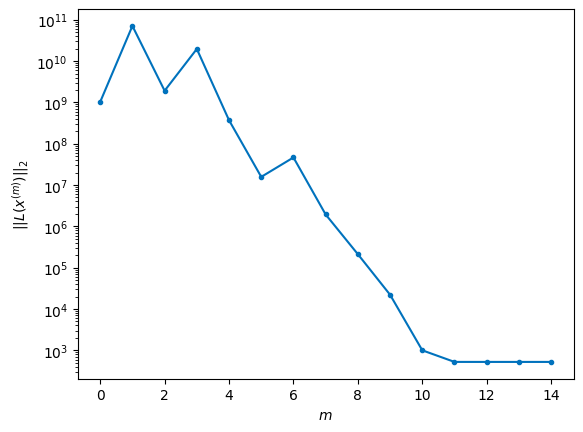

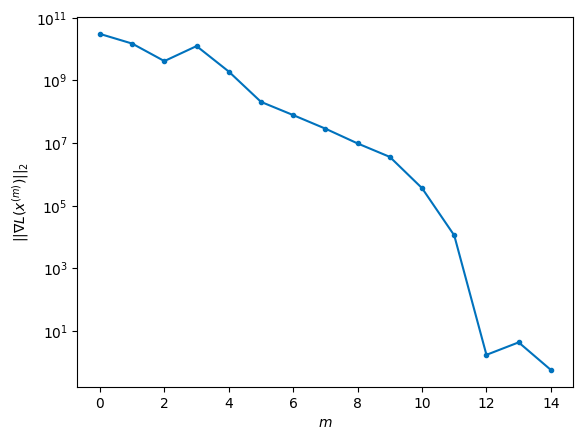


Windows:   0%|          | 1/296 [00:27<2:13:10, 27.09s/it]

9518293.361349806 9519630.3988597 9516108.258539595 9520544.592094302
Before applying the algorithm
Cost function: 523.1847493659809
Gradient norm: 237215.57533072116
Global relative error: 1891878026.1049201
Position relative errors: 0.022407136755093125 m, 0.42786144229112094 m, 313.8179541465561 m, 482.3214932112682 m

Iteration 1
Cost function: 522.8391577015441 (-0.07%)
Gradient norm: 2.6888860927642884 (-100.00%)
Global relative error: 575.5143610545605 (0.00%)
Position relative errors: 0.021218935755129825 m, 0.5758877085280786 m, 313.9723971814722 m, 482.23077165207803 m

Iteration 2
Cost function: 522.839157701395 (-0.00%)
Gradient norm: 4.687981399942474 (74.35%)
Global relative error: 575.5143430471434 (-0.00%)
Position relative errors: 0.021218936671888396 m, 0.5759405389609789 m, 313.97244727733204 m, 482.230717481621 m

STOP on Iteration 3
Cost function = 522.8391575154833 (-0.00%)
Gradient norm = 0.6072450399986081 (-87.05%)
Global relative error = 575.5143430507146 (0.0

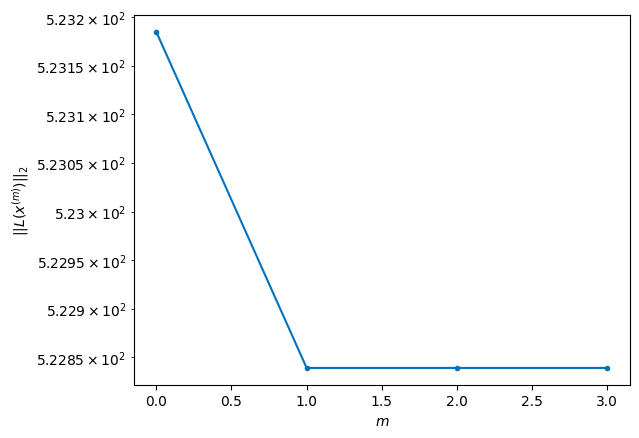

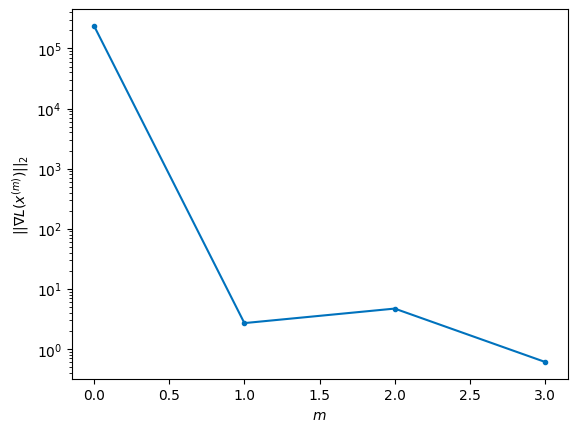


Windows:   1%|          | 2/296 [00:35<1:18:27, 16.01s/it]

Before applying the algorithm
Cost function: 522.2052505729876
Gradient norm: 65667.6516079211
Global relative error: 1891534058.5485597
Position relative errors: 0.02176550916157768 m, 0.4937278268332337 m, 630.9540793214195 m, 957.783885205451 m

Iteration 1
Cost function: 521.7150752499912 (-0.09%)
Gradient norm: 3.4268159816067865 (-99.99%)
Global relative error: 1147.002705659655 (0.00%)
Position relative errors: 0.02219768743360495 m, 0.5600909683688244 m, 631.0493374658278 m, 957.7586128972445 m

Iteration 2
Cost function: 521.7150752074422 (-0.00%)
Gradient norm: 4.764265889213698 (39.03%)
Global relative error: 1147.0027278491727 (0.00%)
Position relative errors: 0.022197687136404257 m, 0.5599635999886771 m, 631.0492226372027 m, 957.7587152039887 m

Iteration 3
Cost function: 521.7150752171518 (0.00%)
Gradient norm: 1.2928364922968891 (-72.86%)
Global relative error: 1147.0027278499472 (0.00%)
Position relative errors: 0.022197688609230232 m, 0.5599635966886636 m, 631.04922263

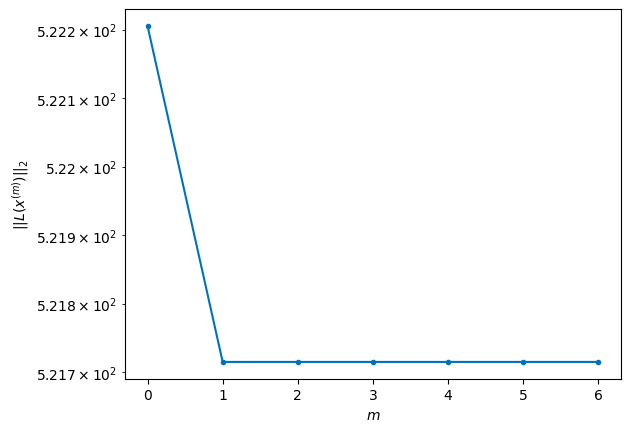

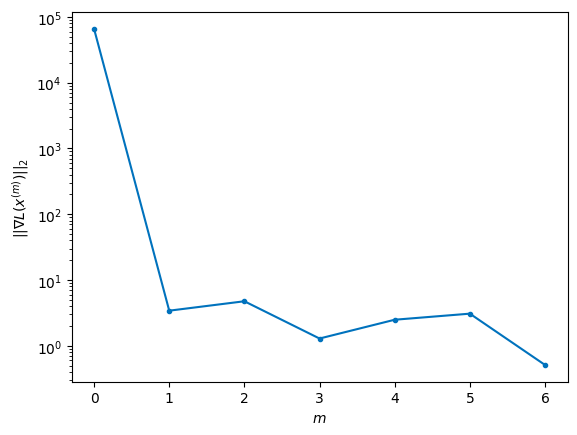


Windows:   1%|          | 3/296 [00:48<1:10:47, 14.50s/it]

Before applying the algorithm
Cost function: 530.873214165957
Gradient norm: 123301.59200095499
Global relative error: 1891223735.7652962
Position relative errors: 0.02265569846859013 m, 0.44145898959488783 m, 945.2689312693263 m, 1429.1156208192617 m

Iteration 1
Cost function: 529.5857157577736 (-0.24%)
Gradient norm: 6.9557857365176625 (-99.99%)
Global relative error: 1713.6021287676688 (0.01%)
Position relative errors: 0.01880203363305526 m, 0.4866196335854262 m, 945.1228957792922 m, 1429.3658162919053 m

STOP on Iteration 2
Cost function = 529.5857154874053 (-0.00%)
Gradient norm = 0.3387899535816524 (-95.13%)
Global relative error = 1713.6020721027326 (-0.00%)
Final position relative errors: 0.018802033660105587 m, 0.48671191476156317 m, 945.1230701880667 m, 1429.3656330054705 m



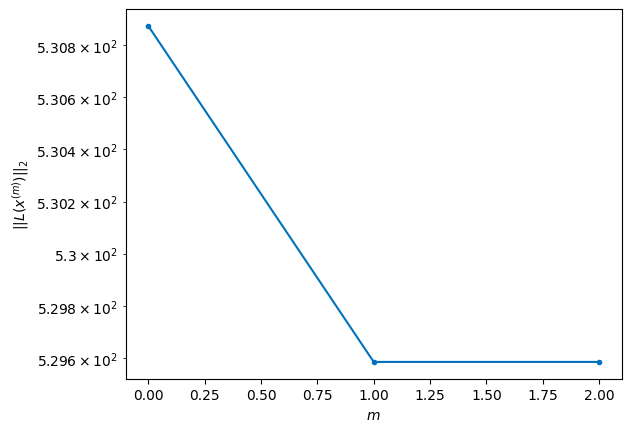

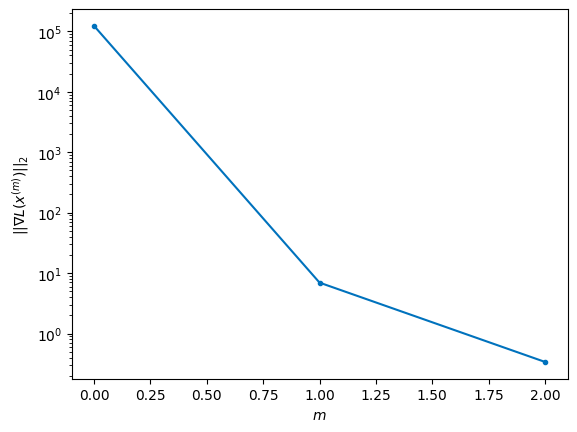


Windows:   1%|▏         | 4/296 [00:53<53:29, 10.99s/it]  

Before applying the algorithm
Cost function: 530.5507802587232
Gradient norm: 230731.39613230282
Global relative error: 1890948566.1369164
Position relative errors: 0.019083842183297405 m, 0.3662765928264302 m, 1255.201797420083 m, 1894.465900679694 m

Iteration 1
Cost function: 528.5963618239387 (-0.37%)
Gradient norm: 8.089739677718923 (-100.00%)
Global relative error: 2272.8273141853356 (0.01%)
Position relative errors: 0.02062265136922188 m, 0.29642853742014286 m, 1255.2209281845635 m, 1894.7503662888148 m

Iteration 2
Cost function: 528.5963615625927 (-0.00%)
Gradient norm: 5.649037931944405 (-30.17%)
Global relative error: 2272.8272742531276 (-0.00%)
Position relative errors: 0.020622652860322648 m, 0.29647099411111627 m, 1255.221077500222 m, 1894.7502194645135 m

Iteration 3
Cost function: 528.5963616424433 (0.00%)
Gradient norm: 2.266286731807628 (-59.88%)
Global relative error: 2272.827274251963 (-0.00%)
Position relative errors: 0.020622652152219124 m, 0.29647100043462365 m, 

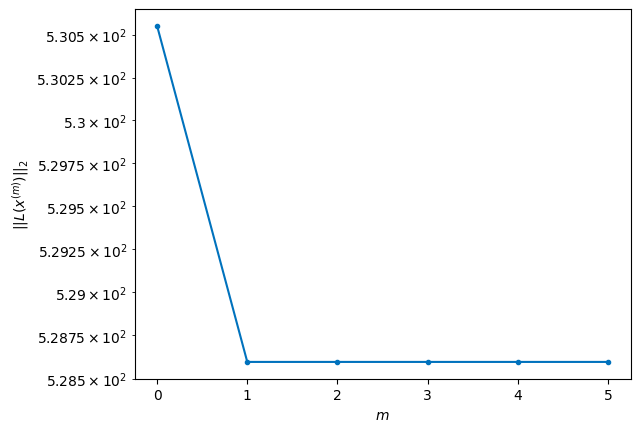

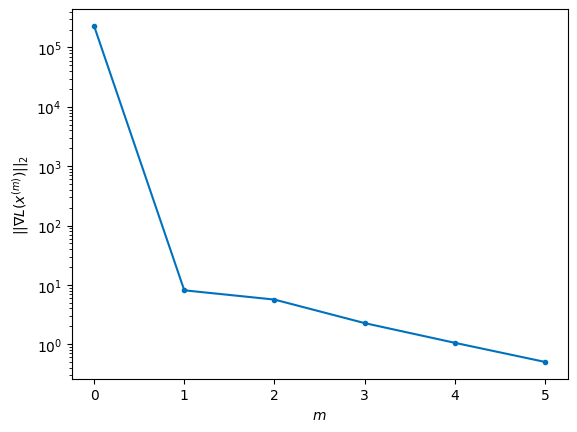


Windows:   2%|▏         | 5/296 [01:04<52:47, 10.89s/it]

Before applying the algorithm
Cost function: 530.521096172082
Gradient norm: 161074.331735397
Global relative error: 1890709936.5712535
Position relative errors: 0.020885833505296582 m, 0.260931245678407 m, 1559.797649756711 m, 2351.562078248965 m

Iteration 1
Cost function: 529.3489459241391 (-0.22%)
Gradient norm: 4.081135181792581 (-100.00%)
Global relative error: 2821.9996754557446 (0.00%)
Position relative errors: 0.019105973945747274 m, 0.33229618766934277 m, 1560.0511617719214 m, 2351.561279223801 m

Iteration 2
Cost function: 529.3489454935215 (-0.00%)
Gradient norm: 1.1242403410014918 (-72.45%)
Global relative error: 2821.9996750187565 (-0.00%)
Position relative errors: 0.019105974983798717 m, 0.3323045688606564 m, 1560.0511473202926 m, 2351.561288285599 m

Iteration 3
Cost function: 529.3489458933991 (0.00%)
Gradient norm: 1.729415228185405 (53.83%)
Global relative error: 2821.999675017736 (-0.00%)
Position relative errors: 0.01910597507486925 m, 0.33230456249653273 m, 1560.0

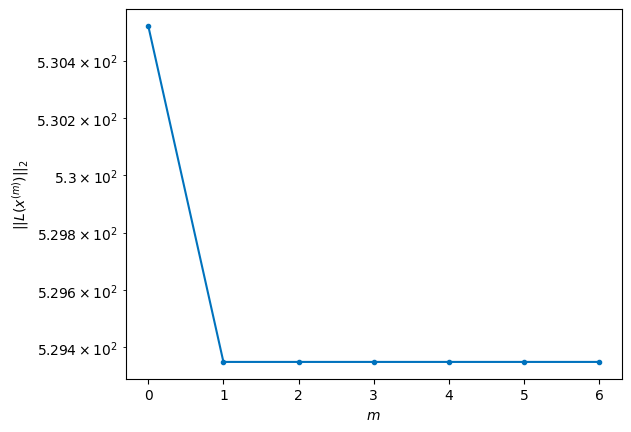

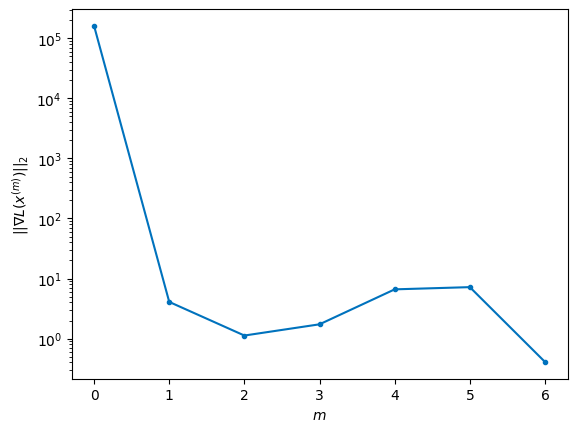


Windows:   2%|▏         | 6/296 [01:16<55:08, 11.41s/it]

Before applying the algorithm
Cost function: 530.0313290431963
Gradient norm: 190699.70450190757
Global relative error: 1890509096.5598626
Position relative errors: 0.019220703155049663 m, 0.3045436642525834 m, 1857.7965316491511 m, 2798.0844969170594 m

Iteration 1
Cost function: 529.0232225160677 (-0.19%)
Gradient norm: 8.073370692217935 (-100.00%)
Global relative error: 3358.853027009391 (0.01%)
Position relative errors: 0.02075482728034789 m, 0.2121753612642982 m, 1857.5765228826433 m, 2798.4326195237763 m

Iteration 2
Cost function: 529.0232228116516 (0.00%)
Gradient norm: 1.0150730212336316 (-87.43%)
Global relative error: 3358.8529965429316 (-0.00%)
Position relative errors: 0.02075482925993305 m, 0.21216320103571035 m, 1857.5766518248872 m, 2798.432497366236 m

Iteration 3
Cost function: 529.023222558643 (-0.00%)
Gradient norm: 1.3864634683550807 (36.59%)
Global relative error: 3358.8529965442417 (0.00%)
Position relative errors: 0.02075483021186697 m, 0.21216319826350782 m, 18

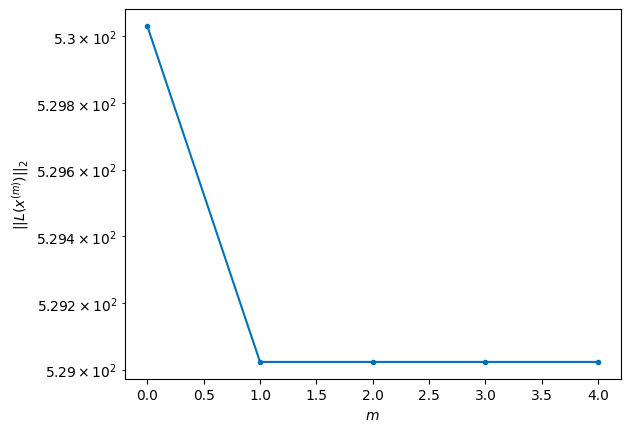

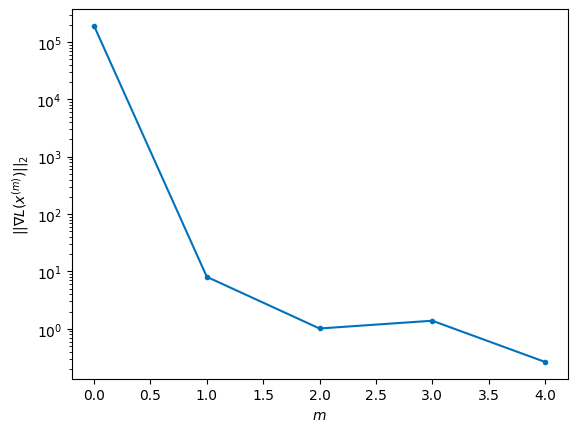


Windows:   2%|▏         | 7/296 [01:27<53:49, 11.18s/it]

Before applying the algorithm
Cost function: 525.3426517769399
Gradient norm: 143207.5929599463
Global relative error: 1890347184.2299929
Position relative errors: 0.02080573767321167 m, 0.2841676808129201 m, 2147.2009176971933 m, 3232.7120201409894 m

Iteration 1
Cost function: 524.5434639475654 (-0.15%)
Gradient norm: 14.723605706449918 (-99.99%)
Global relative error: 3881.126911789374 (0.01%)
Position relative errors: 0.021987492434709304 m, 0.6290822786101328 m, 2147.0373263246956 m, 3233.1568281323744 m

Iteration 2
Cost function: 524.5434643014869 (0.00%)
Gradient norm: 2.848105233879213 (-80.66%)
Global relative error: 3881.126873499858 (-0.00%)
Position relative errors: 0.02198749301662225 m, 0.6288681844811831 m, 2147.0374452291303 m, 3233.1567032500516 m

Iteration 3
Cost function: 524.5434639330975 (-0.00%)
Gradient norm: 1.503967149510045 (-47.19%)
Global relative error: 3881.1268735009307 (0.00%)
Position relative errors: 0.021987493887294523 m, 0.6288681759660686 m, 2147

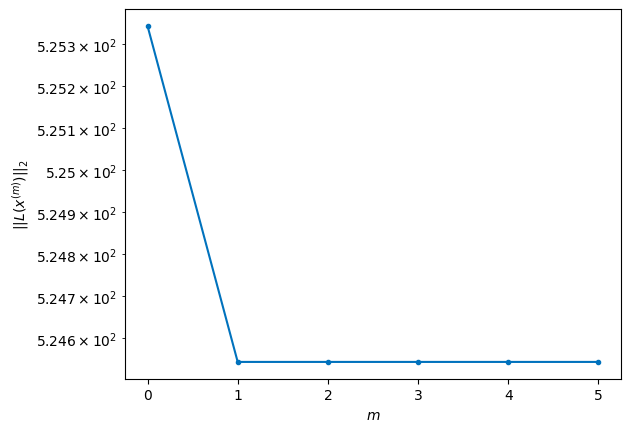

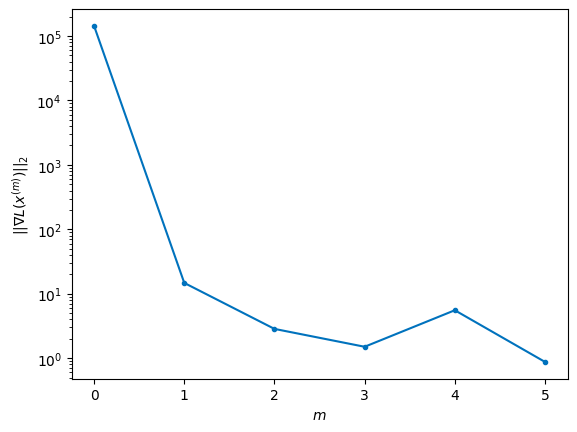


Windows:   3%|▎         | 8/296 [01:38<52:59, 11.04s/it]

Before applying the algorithm
Cost function: 520.2057700618049
Gradient norm: 254596.1690939092
Global relative error: 1890225199.82978
Position relative errors: 0.021997972909780197 m, 0.7462926736996639 m, 2427.282612986121 m, 3653.289531153073 m

Iteration 1
Cost function: 519.2257434650464 (-0.19%)
Gradient norm: 25.71686954932811 (-99.99%)
Global relative error: 4386.326973745893 (0.00%)
Position relative errors: 0.01935730453437996 m, 0.5432688542757843 m, 2427.304479378602 m, 3653.4899356442825 m

STOP on Iteration 2
Cost function = 519.2257433154996 (-0.00%)
Gradient norm = 0.2483096542057579 (-99.03%)
Global relative error = 4386.326969852093 (-0.00%)
Final position relative errors: 0.01935730488390493 m, 0.5432424454472456 m, 2427.304450528566 m, 3653.4899501407062 m



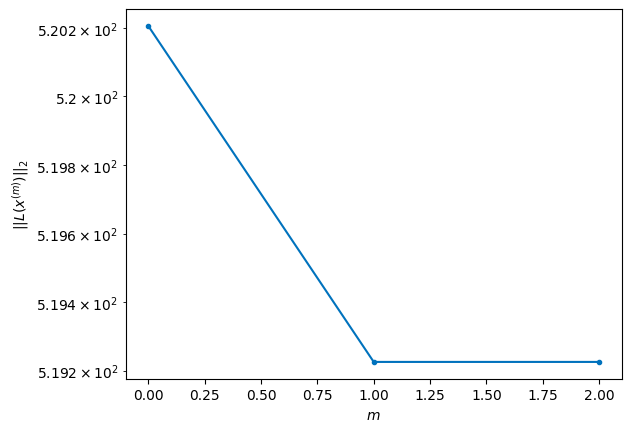

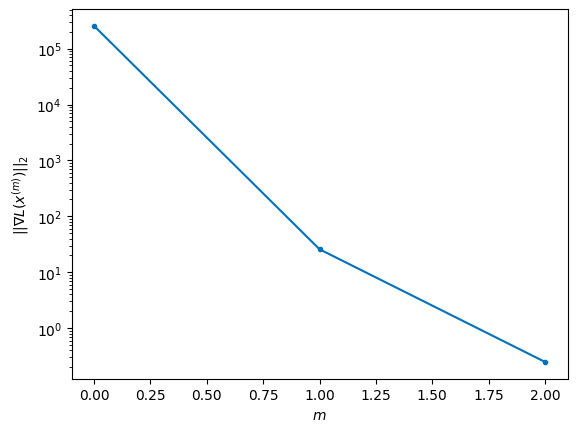


Windows:   3%|▎         | 9/296 [01:44<45:03,  9.42s/it]

Before applying the algorithm
Cost function: 514.5669603022956
Gradient norm: 237473.41774218343
Global relative error: 1890143983.3971987
Position relative errors: 0.019280087463581286 m, 0.6638666096615592 m, 2696.956816442481 m, 4057.637943511721 m

Iteration 1
Cost function: 513.741728415568 (-0.16%)
Gradient norm: 7.6944878727451345 (-100.00%)
Global relative error: 4872.395597170346 (0.00%)
Position relative errors: 0.021103041163742613 m, 0.6794831378709831 m, 2697.0181638169383 m, 4057.865029763672 m

Iteration 2
Cost function: 513.741728815784 (0.00%)
Gradient norm: 2.7577140098439745 (-64.16%)
Global relative error: 4872.395596465752 (-0.00%)
Position relative errors: 0.021103046124340077 m, 0.679493258302022 m, 2697.018153511063 m, 4057.8650357656456 m

Iteration 3
Cost function: 513.7417287008353 (-0.00%)
Gradient norm: 2.3565114296089296 (-14.55%)
Global relative error: 4872.395596463551 (-0.00%)
Position relative errors: 0.021103042072027706 m, 0.6794932426515343 m, 2697.

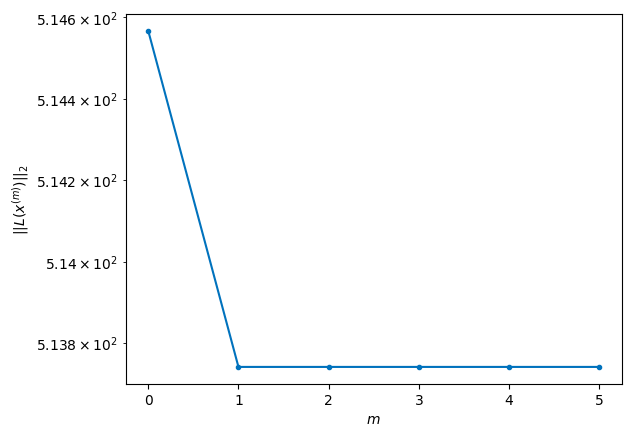

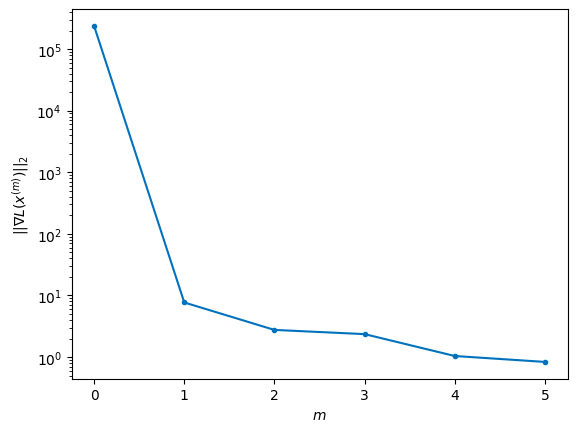


Windows:   3%|▎         | 10/296 [01:54<46:29,  9.75s/it]

Before applying the algorithm
Cost function: 504.187847165985
Gradient norm: 42980.41207057428
Global relative error: 1890104223.007928
Position relative errors: 0.020741561291455737 m, 0.7981972790641065 m, 2954.8941921868777 m, 4444.282067512603 m

Iteration 1
Cost function: 502.611942640536 (-0.31%)
Gradient norm: 27.30185689080878 (-99.94%)
Global relative error: 5337.347160067345 (0.01%)
Position relative errors: 0.02263050976054798 m, 0.9930042649373312 m, 2954.742254766003 m, 4444.852626207564 m

Iteration 2
Cost function: 502.61194259622505 (-0.00%)
Gradient norm: 1.5150408531308053 (-94.45%)
Global relative error: 5337.34713862984 (-0.00%)
Position relative errors: 0.022630514151867627 m, 0.9929843925151 m, 2954.74230492202 m, 4444.852567128495 m

Iteration 3
Cost function: 502.6119425199301 (-0.00%)
Gradient norm: 1.6692959729960182 (10.18%)
Global relative error: 5337.347138626074 (-0.00%)
Position relative errors: 0.022630511090286562 m, 0.9929843922325172 m, 2954.742304931

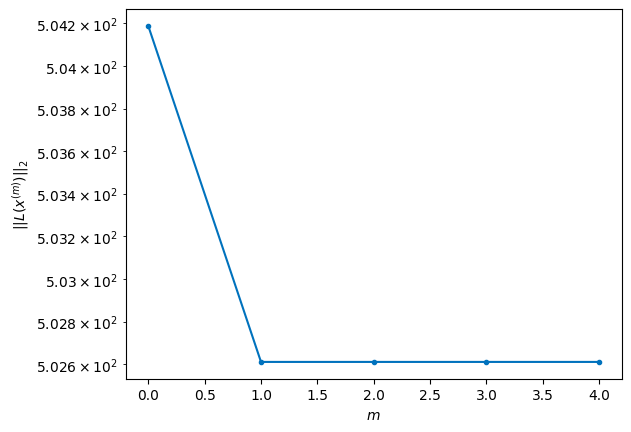

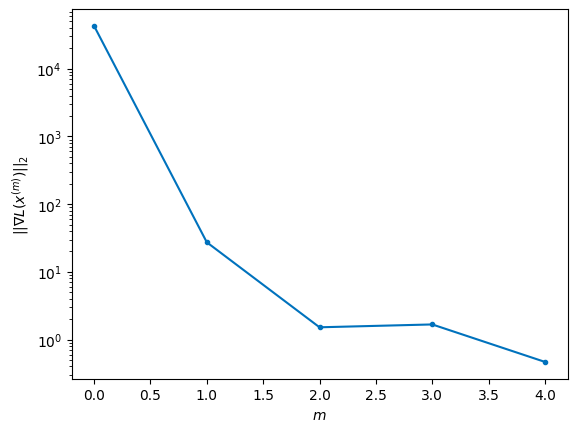


Windows:   4%|▎         | 11/296 [02:04<46:33,  9.80s/it]

Before applying the algorithm
Cost function: 496.14557411071013
Gradient norm: 88264.29511025884
Global relative error: 1890106436.1152284
Position relative errors: 0.022000750054239772 m, 1.1003033001297682 m, 3199.7292913633146 m, 4811.847376009981 m

Iteration 1
Cost function: 495.2851426566742 (-0.17%)
Gradient norm: 10.129034185014579 (-99.99%)
Global relative error: 5778.801137355723 (0.00%)
Position relative errors: 0.016061930317532606 m, 1.3538500119926495 m, 3199.816188893945 m, 4812.033457903774 m

STOP on Iteration 2
Cost function = 495.28514264925724 (-0.00%)
Gradient norm = 0.20525850226129544 (-97.97%)
Global relative error = 5778.801134584488 (-0.00%)
Final position relative errors: 0.01606193184876455 m, 1.353819547607136 m, 3199.8161638649503 m, 4812.033471227643 m



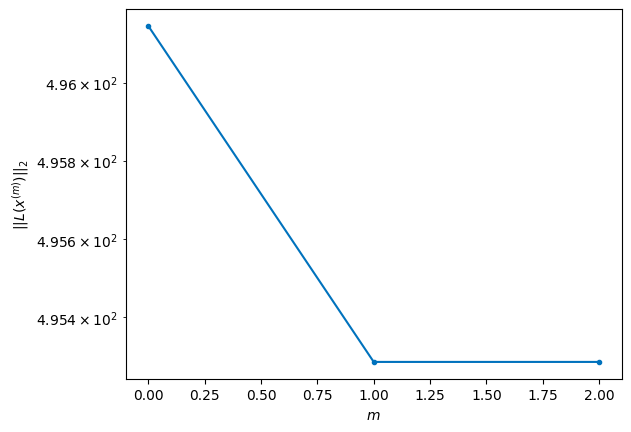

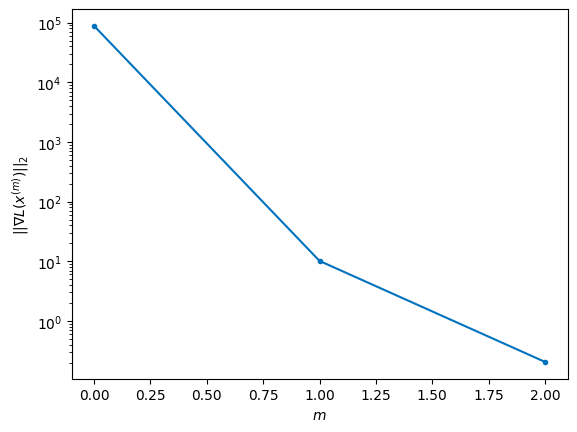


Windows:   4%|▍         | 12/296 [02:10<40:43,  8.60s/it]

Before applying the algorithm
Cost function: 492.600340083928
Gradient norm: 111472.01751910812
Global relative error: 1890150968.539913
Position relative errors: 0.015692530826625483 m, 1.445100821261193 m, 3430.85030260053 m, 5158.017901795128 m

Iteration 1
Cost function: 491.8507007374364 (-0.15%)
Gradient norm: 4.453190068044457 (-100.00%)
Global relative error: 6194.99638899896 (0.00%)
Position relative errors: 0.01532995537029734 m, 1.3910920746719635 m, 3430.9652336980184 m, 5158.140247992861 m

Iteration 2
Cost function: 491.85070093274356 (0.00%)
Gradient norm: 1.9990380142975168 (-55.11%)
Global relative error: 6194.996384687682 (-0.00%)
Position relative errors: 0.015329953183633796 m, 1.3911035618370182 m, 3430.9652419659383 m, 5158.140237312409 m

Iteration 3
Cost function: 491.85070028292773 (-0.00%)
Gradient norm: 1.8717616448955516 (-6.37%)
Global relative error: 6194.996384687701 (0.00%)
Position relative errors: 0.01532994954016772 m, 1.3911035649238157 m, 3430.96524

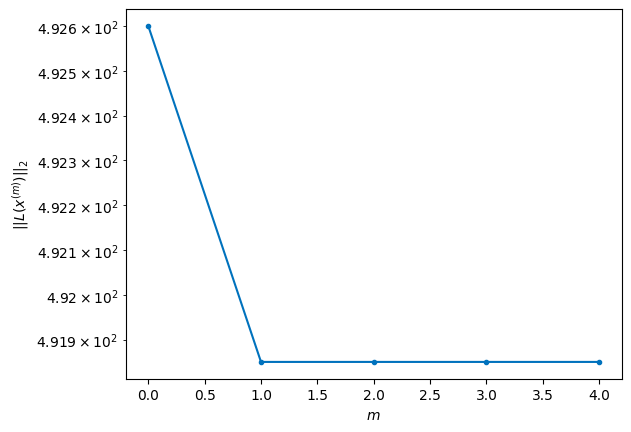

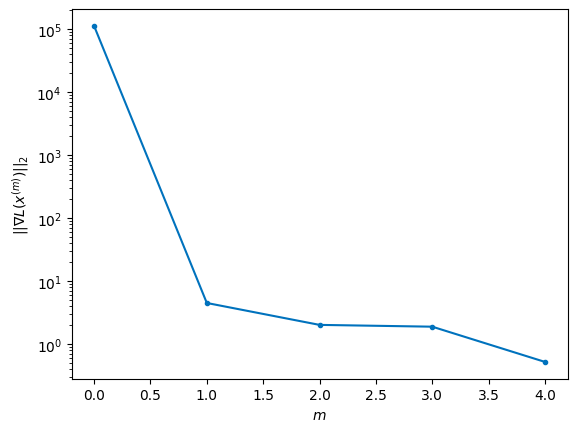


Windows:   4%|▍         | 13/296 [02:19<41:45,  8.85s/it]

Before applying the algorithm
Cost function: 492.6468850712387
Gradient norm: 314051.58118251123
Global relative error: 1890237981.5121167
Position relative errors: 0.014716400653481248 m, 1.4634064204557056 m, 3647.034542135892 m, 5481.635209554816 m

Iteration 1
Cost function: 491.9713575532848 (-0.14%)
Gradient norm: 9.386907993487458 (-100.00%)
Global relative error: 6584.120171320732 (0.00%)
Position relative errors: 0.011828572771338601 m, 1.3110592200928908 m, 3647.4090341179513 m, 5481.514845325583 m

STOP on Iteration 2
Cost function = 491.97135758141343 (0.00%)
Gradient norm = 0.4713982258989403 (-94.98%)
Global relative error = 6584.120177117302 (0.00%)
Final position relative errors: 0.011828573830519787 m, 1.3110913223020946 m, 3647.4089983154695 m, 5481.5148761034825 m



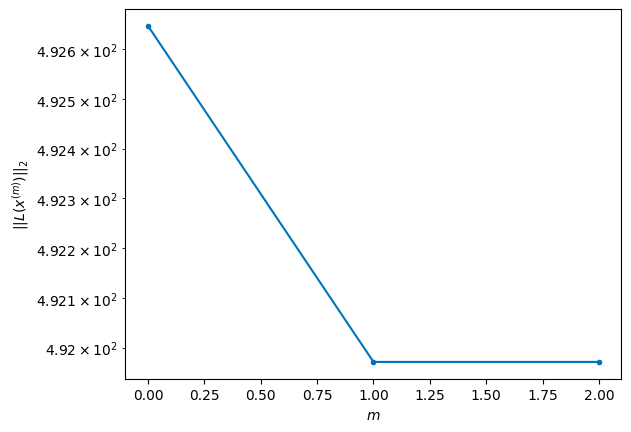

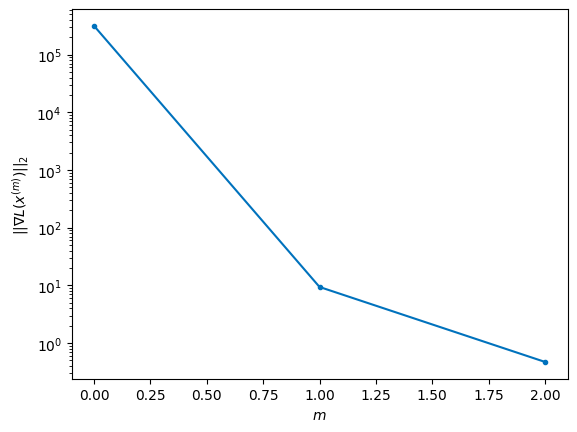


Windows:   5%|▍         | 14/296 [02:25<37:11,  7.91s/it]

Before applying the algorithm
Cost function: 493.00153459244177
Gradient norm: 47299.73946287073
Global relative error: 1890367452.5430882
Position relative errors: 0.011085003552413472 m, 1.3733220895459801 m, 3847.566300984626 m, 5781.132761096912 m

Iteration 1
Cost function: 491.88455697472483 (-0.23%)
Gradient norm: 24.76689891201994 (-99.95%)
Global relative error: 6944.467502326179 (0.00%)
Position relative errors: 0.011825833395594948 m, 1.0888264806382484 m, 3848.226870113505 m, 5780.721798605007 m

Iteration 2
Cost function: 491.8845565810392 (-0.00%)
Gradient norm: 1.0918039959044286 (-95.59%)
Global relative error: 6944.467522158399 (0.00%)
Position relative errors: 0.0118258324505842 m, 1.0889361465499965 m, 3848.226733286454 m, 5780.721913494864 m

Iteration 3
Cost function: 491.88455669366755 (0.00%)
Gradient norm: 6.1293590836835214 (461.40%)
Global relative error: 6944.467522155186 (-0.00%)
Position relative errors: 0.011825839378115419 m, 1.0889361509697144 m, 3848.22

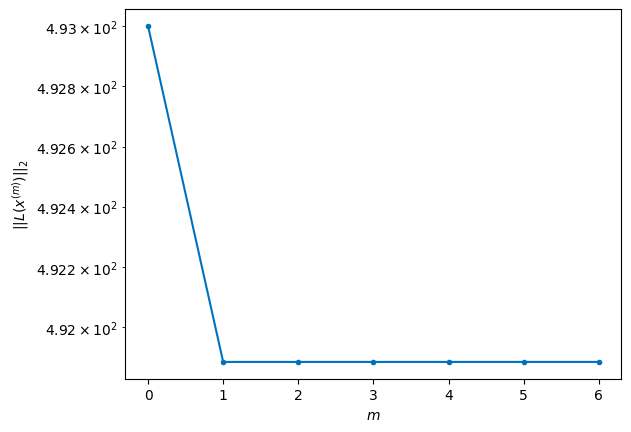

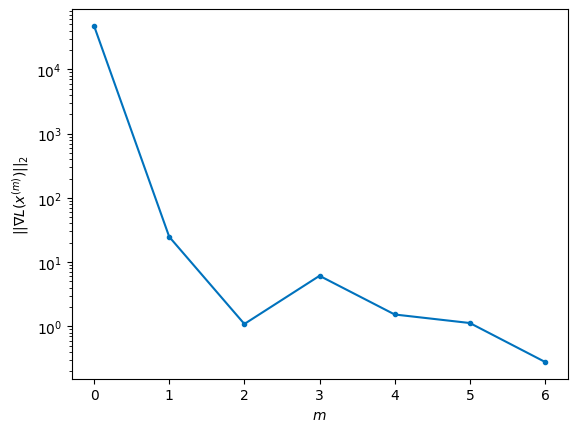


Windows:   5%|▌         | 15/296 [02:38<43:57,  9.38s/it]

Before applying the algorithm
Cost function: 488.41345302950475
Gradient norm: 97337.58844509875
Global relative error: 1890539159.463734
Position relative errors: 0.010967175892611277 m, 1.1441725965717606 m, 4031.5943632601034 m, 6055.182253746467 m

Iteration 1
Cost function: 487.44482304377954 (-0.20%)
Gradient norm: 19.847582458122584 (-99.98%)
Global relative error: 7274.73081176857 (0.00%)
Position relative errors: 0.007331722299261789 m, 1.296950490010886 m, 4031.921033465397 m, 6055.187198788146 m

Iteration 2
Cost function: 487.44482309363895 (0.00%)
Gradient norm: 5.131567654357518 (-74.15%)
Global relative error: 7274.730813939967 (0.00%)
Position relative errors: 0.00733172078931164 m, 1.296949460138345 m, 4031.9209917988605 m, 6055.18722914127 m

Iteration 3
Cost function: 487.4448231582364 (0.00%)
Gradient norm: 5.337711753985024 (4.02%)
Global relative error: 7274.730813936144 (-0.00%)
Position relative errors: 0.00733172172541279 m, 1.296949456993824 m, 4031.9209918068

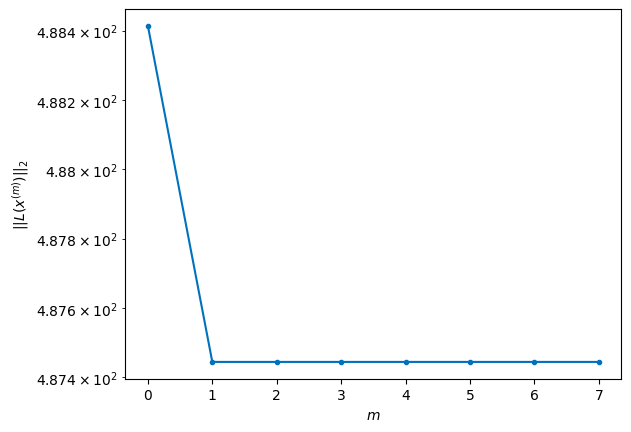

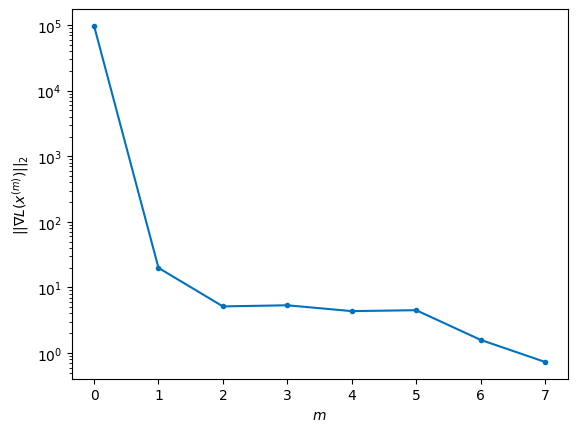


Windows:   5%|▌         | 16/296 [02:53<51:37, 11.06s/it]

Before applying the algorithm
Cost function: 488.82143665135396
Gradient norm: 80840.61479828494
Global relative error: 1890752670.9340749
Position relative errors: 0.007014969727252308 m, 1.32919064539162 m, 4197.715580455431 m, 6303.299689660556 m

Iteration 1
Cost function: 488.20709722506894 (-0.13%)
Gradient norm: 3.4104533738280214 (-100.00%)
Global relative error: 7573.184875295732 (0.00%)
Position relative errors: 0.006253248196651932 m, 1.2596310150268362 m, 4197.892211683108 m, 6303.237774160339 m

Iteration 2
Cost function: 488.20709720477487 (-0.00%)
Gradient norm: 3.704127563009196 (8.61%)
Global relative error: 7573.184879230242 (0.00%)
Position relative errors: 0.006253251403176925 m, 1.2596461016688436 m, 4197.892196974498 m, 6303.237788680322 m

STOP on Iteration 3
Cost function = 488.2070972902284 (0.00%)
Gradient norm = 0.5778242458025765 (-84.40%)
Global relative error = 7573.184879233344 (0.00%)
Final position relative errors: 0.006253249176163729 m, 1.259646103155

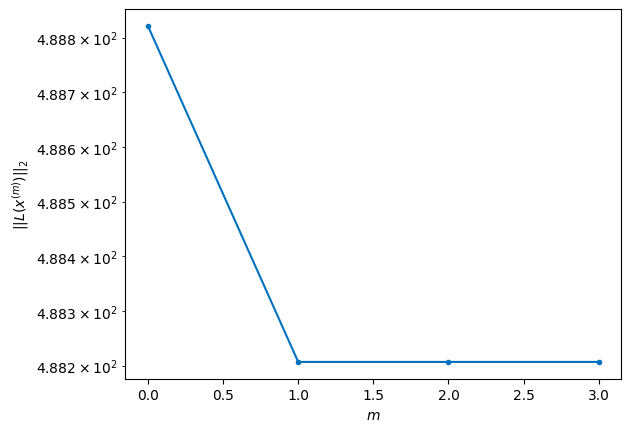

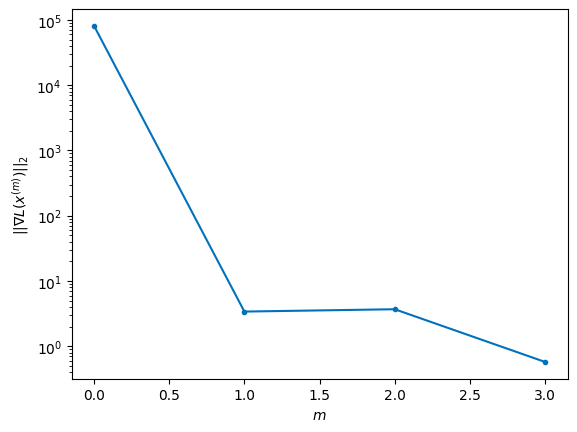


Windows:   6%|▌         | 17/296 [03:00<46:05,  9.91s/it]

Before applying the algorithm
Cost function: 481.4772400729903
Gradient norm: 239008.79853928665
Global relative error: 1891007352.2266998
Position relative errors: 0.005596693488704257 m, 1.2783854205722502 m, 4345.418298894968 m, 6523.922641433231 m

Iteration 1
Cost function: 480.3171082457327 (-0.24%)
Gradient norm: 12.614590935081274 (-99.99%)
Global relative error: 7838.893477829677 (0.00%)
Position relative errors: 0.005409782228353205 m, 1.2156438420901112 m, 4345.666334778327 m, 6524.064409659184 m

STOP on Iteration 2
Cost function = 480.3171081778743 (-0.00%)
Gradient norm = 0.3210993151637194 (-97.45%)
Global relative error = 7838.89347519754 (-0.00%)
Final position relative errors: 0.0054097842524714 m, 1.2156703518132255 m, 4345.666315573366 m, 6524.064419284028 m



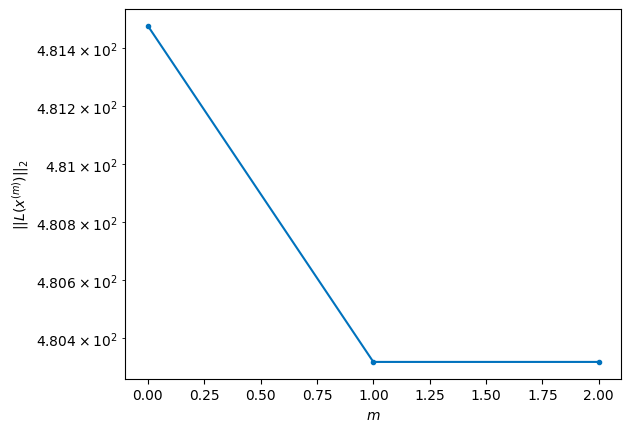

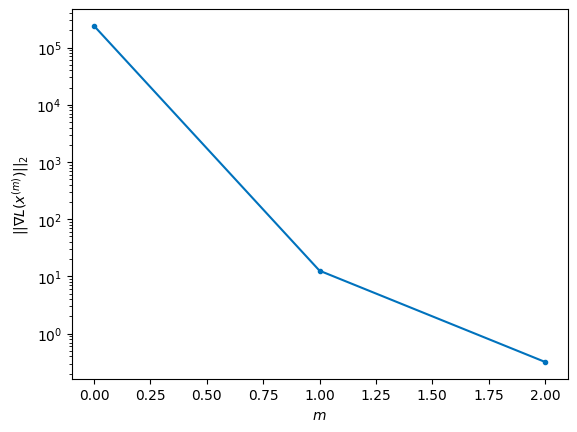


Windows:   6%|▌         | 18/296 [03:06<40:23,  8.72s/it]

Before applying the algorithm
Cost function: 479.0027080106949
Gradient norm: 81970.59752848631
Global relative error: 1891302392.5508184
Position relative errors: 0.00537940417384161 m, 1.2287234818806763 m, 4474.266051473802 m, 6716.389526602298 m

Iteration 1
Cost function: 477.8992537748077 (-0.23%)
Gradient norm: 16.154420604142494 (-99.98%)
Global relative error: 8070.468732476258 (0.00%)
Position relative errors: 0.016747922723742228 m, 1.3385892718008745 m, 4474.390842697177 m, 6716.567400123782 m

Iteration 2
Cost function: 477.89925357180425 (-0.00%)
Gradient norm: 7.380867314545524 (-54.31%)
Global relative error: 8070.468734324065 (0.00%)
Position relative errors: 0.016747915327767905 m, 1.3385972170812124 m, 4474.390839718219 m, 6716.567404326981 m

Iteration 3
Cost function: 477.8992537303243 (0.00%)
Gradient norm: 4.488292183312685 (-39.19%)
Global relative error: 8070.468734322811 (-0.00%)
Position relative errors: 0.01674792240402261 m, 1.338597223268731 m, 4474.390839

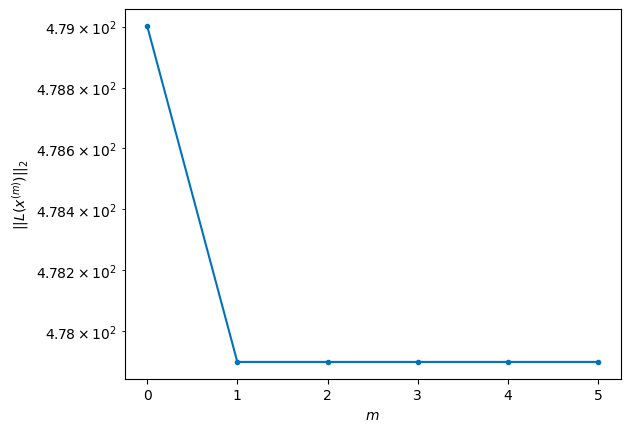

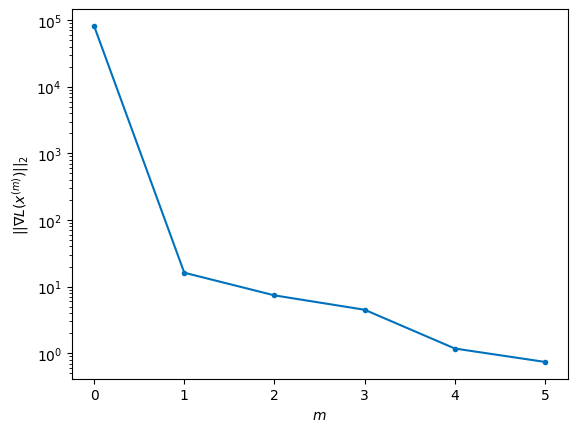


Windows:   6%|▋         | 19/296 [03:18<45:03,  9.76s/it]

Before applying the algorithm
Cost function: 475.82871641171533
Gradient norm: 199891.52536025594
Global relative error: 1891636730.4887707
Position relative errors: 0.01647443082537598 m, 1.3210155220555333 m, 4583.525721352628 m, 6879.694240885308 m

Iteration 1
Cost function: 474.96267419984486 (-0.18%)
Gradient norm: 9.694194086958884 (-100.00%)
Global relative error: 8266.985929022336 (0.00%)
Position relative errors: 0.021619046123206448 m, 1.3147730548592558 m, 4583.603720501573 m, 6879.943510825816 m

STOP on Iteration 2
Cost function = 474.9626743583516 (0.00%)
Gradient norm = 0.5098528180631602 (-94.74%)
Global relative error = 8266.985929328706 (0.00%)
Final position relative errors: 0.02161904810469538 m, 1.3147736624732431 m, 4583.603717678495 m, 6879.943513074653 m



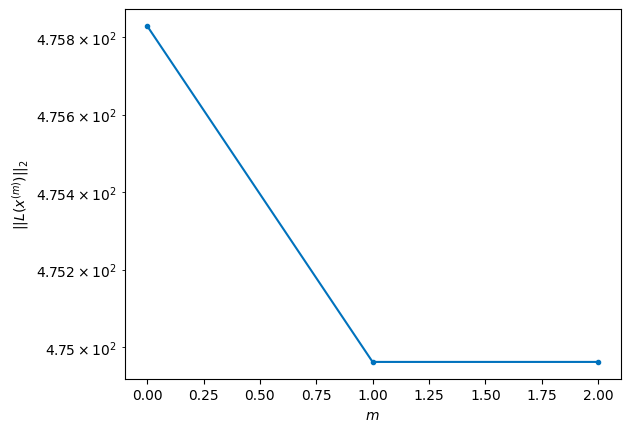

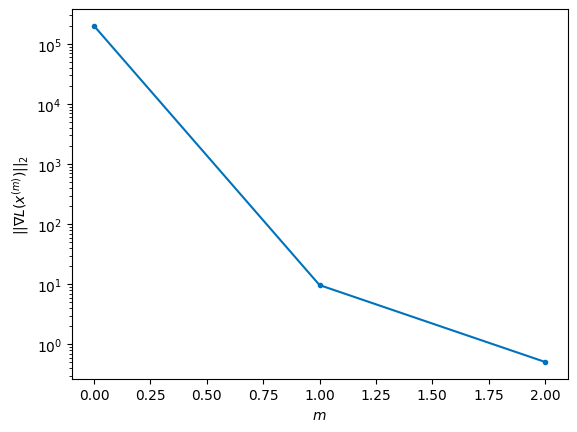


Windows:   7%|▋         | 20/296 [03:24<39:46,  8.65s/it]

Before applying the algorithm
Cost function: 473.1209656995033
Gradient norm: 62214.95825099679
Global relative error: 1892009132.1905932
Position relative errors: 0.021392097792965935 m, 1.2798285756995407 m, 4672.807536664717 m, 7013.1734644502785 m

Iteration 1
Cost function: 472.2805374185724 (-0.18%)
Gradient norm: 8.401467473268758 (-99.99%)
Global relative error: 8427.40938703802 (0.00%)
Position relative errors: 0.01798748843333996 m, 1.1516328195269268 m, 4673.037896604787 m, 7013.126182744277 m

Iteration 2
Cost function: 472.2805370915874 (-0.00%)
Gradient norm: 1.510590551528815 (-82.02%)
Global relative error: 8427.40939255526 (0.00%)
Position relative errors: 0.017987480508451167 m, 1.1516761305628773 m, 4673.037861437997 m, 7013.126212799618 m

Iteration 3
Cost function: 472.28053712996405 (0.00%)
Gradient norm: 2.1849759422425596 (44.64%)
Global relative error: 8427.40939255008 (-0.00%)
Position relative errors: 0.017987493748854284 m, 1.151676140559275 m, 4673.03786143

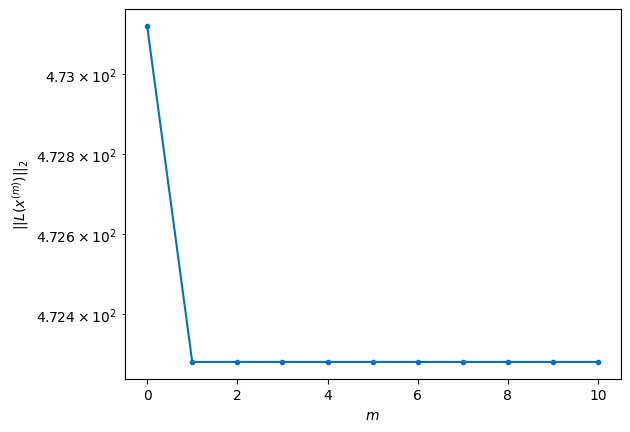

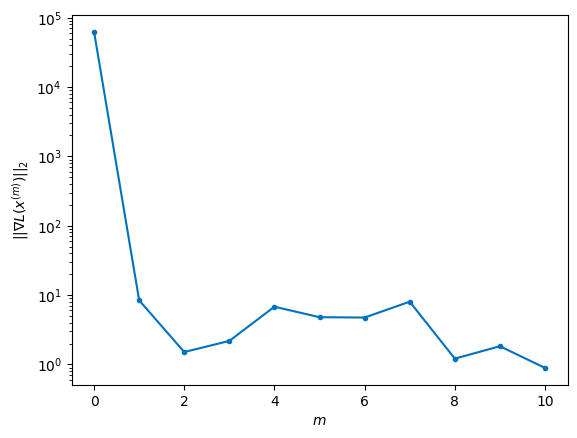


Windows:   7%|▋         | 21/296 [03:44<55:29, 12.11s/it]

Before applying the algorithm
Cost function: 471.93934714196064
Gradient norm: 115575.33988062477
Global relative error: 1892418152.9689193
Position relative errors: 0.017814725812803436 m, 1.1217819823147743 m, 4741.909766208494 m, 7115.923516040005 m

Iteration 1
Cost function: 471.31665476039086 (-0.13%)
Gradient norm: 6.670818207120945 (-99.99%)
Global relative error: 8551.350224372674 (0.00%)
Position relative errors: 0.017247588592645757 m, 0.9983899383174761 m, 4741.951474146116 m, 7116.1424102578 m

Iteration 2
Cost function: 471.3166544951168 (-0.00%)
Gradient norm: 3.4831051486740643 (-47.79%)
Global relative error: 8551.350209462818 (-0.00%)
Position relative errors: 0.017247590486585345 m, 0.9984009911308536 m, 4741.951475554111 m, 7116.142391401084 m

Iteration 3
Cost function: 471.3166544616061 (-0.00%)
Gradient norm: 3.640174854845229 (4.51%)
Global relative error: 8551.350209465036 (0.00%)
Position relative errors: 0.01724759232102179 m, 0.9984009917697488 m, 4741.95147

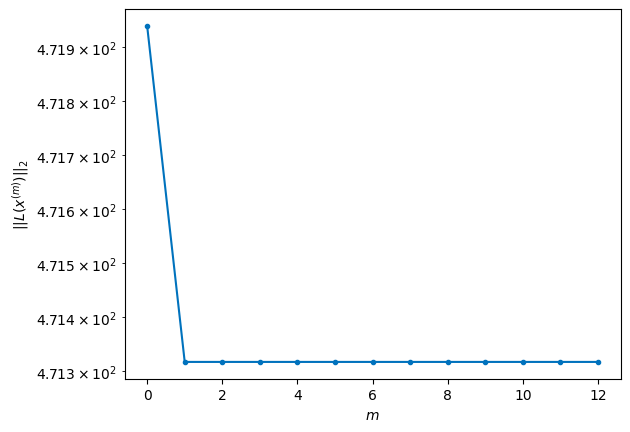

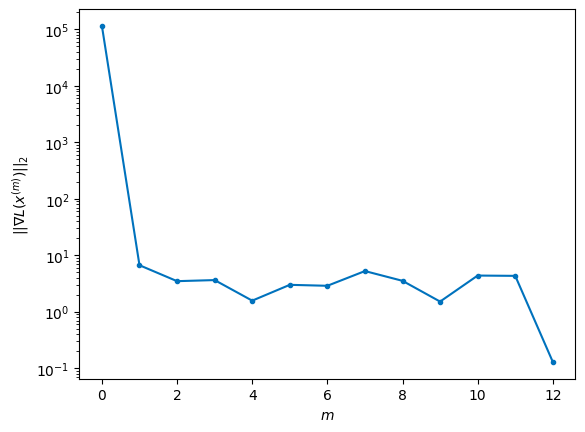


Windows:   7%|▋         | 22/296 [04:07<1:09:10, 15.15s/it]

Before applying the algorithm
Cost function: 470.7505275147193
Gradient norm: 157484.91514608558
Global relative error: 1892862119.4987233
Position relative errors: 0.01695385587315273 m, 0.9619242679537816 m, 4790.218581847402 m, 7188.047307686991 m

Iteration 1
Cost function: 469.92445265810204 (-0.18%)
Gradient norm: 13.352314974639667 (-99.99%)
Global relative error: 8638.274691089078 (0.00%)
Position relative errors: 0.022718523728737183 m, 0.9173285640941675 m, 4790.145491377871 m, 7188.483406664158 m

Iteration 2
Cost function: 469.92445259850643 (-0.00%)
Gradient norm: 2.0541828431702465 (-84.62%)
Global relative error: 8638.274667736388 (-0.00%)
Position relative errors: 0.022718515736276423 m, 0.9173360943539555 m, 4790.145496824833 m, 7188.483374971021 m

STOP on Iteration 3
Cost function = 469.92445234984575 (-0.00%)
Gradient norm = 0.7887816021776313 (-61.60%)
Global relative error = 8638.27466772465 (-0.00%)
Final position relative errors: 0.022718517925662412 m, 0.917336

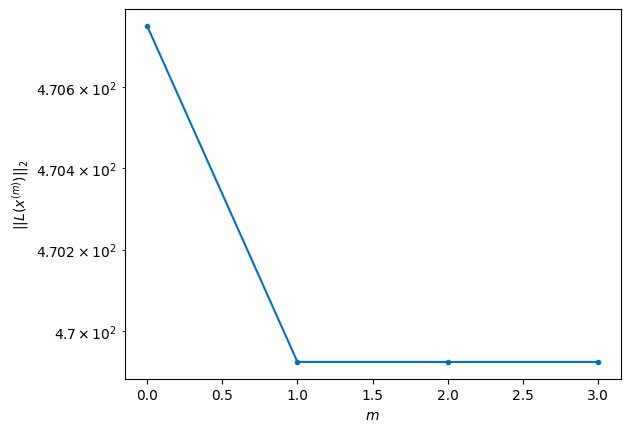

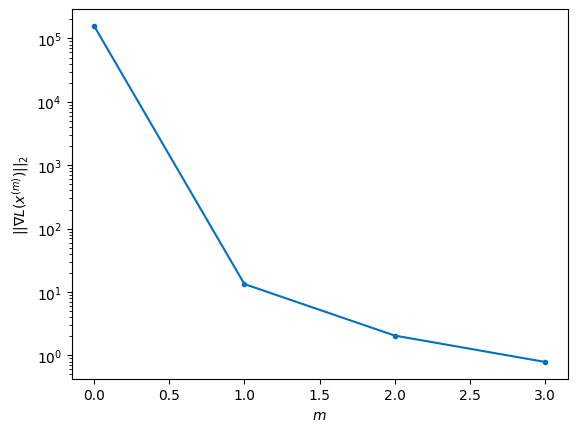


Windows:   8%|▊         | 23/296 [04:14<58:07, 12.77s/it]  

Before applying the algorithm
Cost function: 468.73197065601437
Gradient norm: 115157.36795152862
Global relative error: 1893339194.1915927
Position relative errors: 0.022424305843873366 m, 0.8708308025073569 m, 4817.597742471656 m, 7229.184084563143 m

Iteration 1
Cost function: 467.97528403682725 (-0.16%)
Gradient norm: 6.979325544863262 (-99.99%)
Global relative error: 8687.501532442051 (0.00%)
Position relative errors: 0.030680613477390012 m, 0.8837340202000948 m, 4817.673922576565 m, 7229.29455865179 m

Iteration 2
Cost function: 467.9752838900783 (-0.00%)
Gradient norm: 8.259397789943758 (18.34%)
Global relative error: 8687.501534825637 (0.00%)
Position relative errors: 0.030680615253128738 m, 0.8837337998123882 m, 4817.673916859542 m, 7229.294565326073 m

Iteration 3
Cost function: 467.9752838994827 (0.00%)
Gradient norm: 2.6351842159978505 (-68.09%)
Global relative error: 8687.501534824993 (-0.00%)
Position relative errors: 0.030680623663983494 m, 0.8837338001064726 m, 4817.673

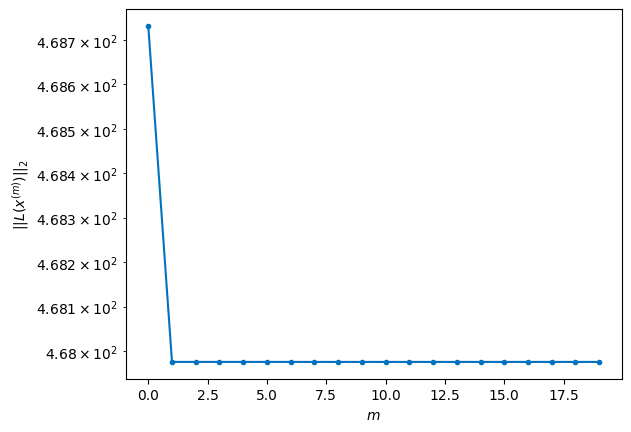

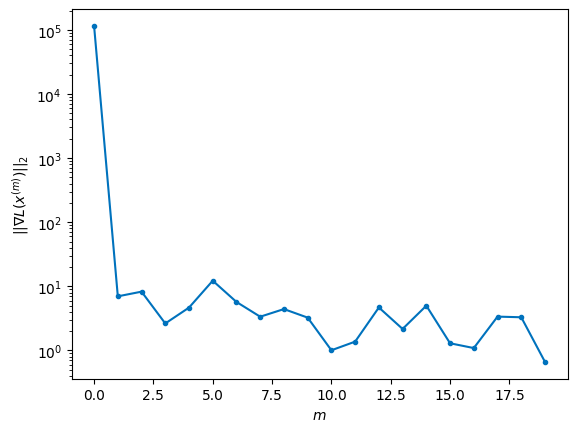


Windows:   8%|▊         | 24/296 [04:48<1:26:43, 19.13s/it]

Before applying the algorithm
Cost function: 475.1607491566988
Gradient norm: 158941.33673103972
Global relative error: 1893847330.8586984
Position relative errors: 0.02998868301007434 m, 0.8232408849152997 m, 4824.196133052311 m, 7238.623186078691 m

Iteration 1
Cost function: 473.78499665938375 (-0.29%)
Gradient norm: 16.263893831673666 (-99.99%)
Global relative error: 8699.04536229762 (0.00%)
Position relative errors: 0.049750366814023096 m, 0.6242931459731277 m, 4824.168758110951 m, 7238.838691436863 m

STOP on Iteration 2
Cost function = 473.78499681093365 (0.00%)
Gradient norm = 0.4491767670658739 (-97.24%)
Global relative error = 8699.04537121856 (0.00%)
Final position relative errors: 0.04975036240622038 m, 0.6243135626445214 m, 4824.1687373203895 m, 7238.838716010984 m



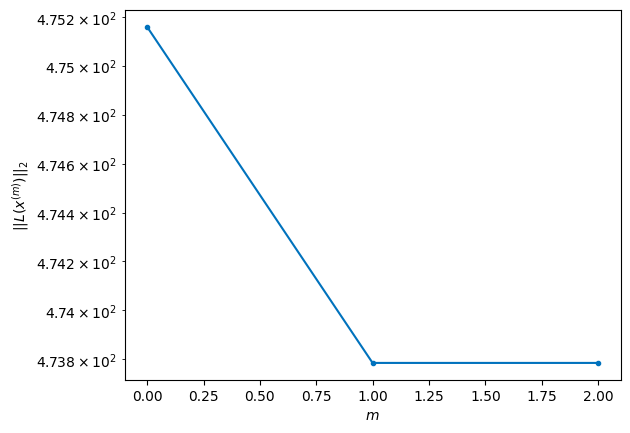

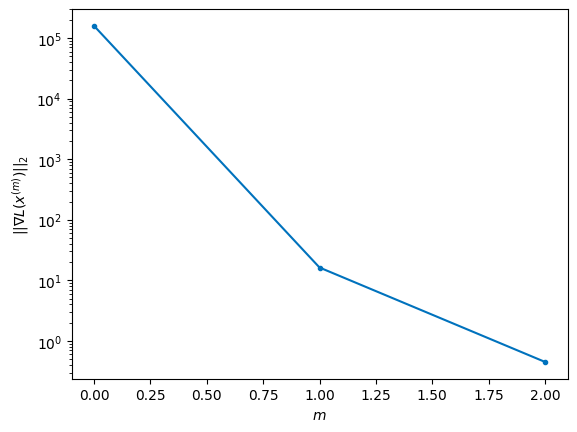


Windows:   8%|▊         | 25/296 [04:54<1:08:23, 15.14s/it]

Before applying the algorithm
Cost function: 472.9254155330107
Gradient norm: 76658.68785315212
Global relative error: 1894384305.0369163
Position relative errors: 0.04810448509528243 m, 0.5632198488616161 m, 4809.748528514578 m, 7216.744315197198 m

Iteration 1
Cost function: 472.73962753377236 (-0.04%)
Gradient norm: 3.7883415650971655 (-100.00%)
Global relative error: 8672.609164936177 (-0.00%)
Position relative errors: 0.04611958773068662 m, 0.4400551198999259 m, 4809.782601511659 m, 7216.657140936503 m

Iteration 2
Cost function: 472.73962764228935 (0.00%)
Gradient norm: 1.2816870043973547 (-66.17%)
Global relative error: 8672.609165554306 (0.00%)
Position relative errors: 0.04611959646169546 m, 0.440069130174133 m, 4809.7825950524775 m, 7216.657145983421 m

STOP on Iteration 3
Cost function = 472.73962763183215 (-0.00%)
Gradient norm = 0.5691436729629743 (-55.59%)
Global relative error = 8672.609165554377 (0.00%)
Final position relative errors: 0.04611959510958279 m, 0.4400691268

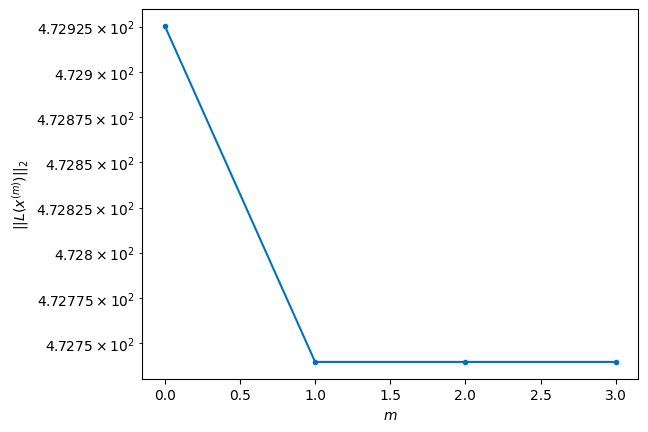

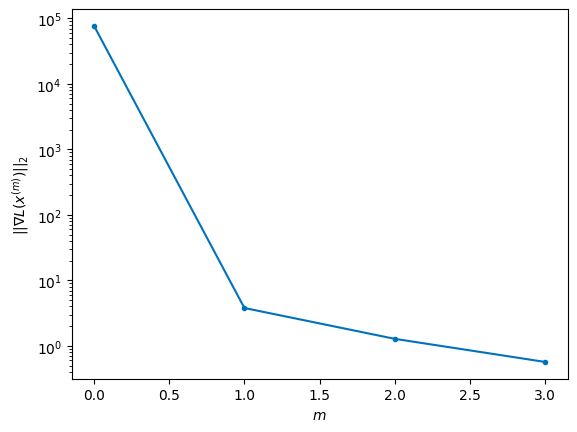


Windows:   9%|▉         | 26/296 [05:01<57:26, 12.76s/it]  

Before applying the algorithm
Cost function: 474.40757426304276
Gradient norm: 129254.96908326085
Global relative error: 1894947718.748089
Position relative errors: 0.044426569577869814 m, 0.3740525220587874 m, 4774.478628594038 m, 7163.260151097093 m

Iteration 1
Cost function: 473.38538987671 (-0.22%)
Gradient norm: 8.290449508070983 (-99.99%)
Global relative error: 8608.731669163102 (0.00%)
Position relative errors: 0.05686812345937952 m, 0.34478643666649395 m, 4774.342075427082 m, 7163.512872436514 m

STOP on Iteration 2
Cost function = 473.3853896246499 (-0.00%)
Gradient norm = 0.9401907733651146 (-88.66%)
Global relative error = 8608.731673979868 (0.00%)
Final position relative errors: 0.056868120724918834 m, 0.3447998181119687 m, 4774.342058206164 m, 7163.512889701813 m



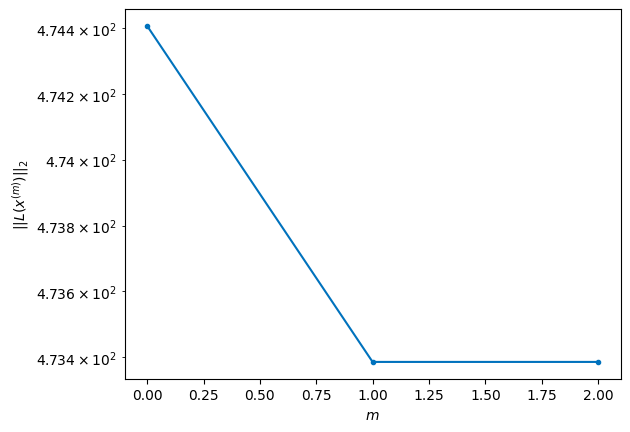

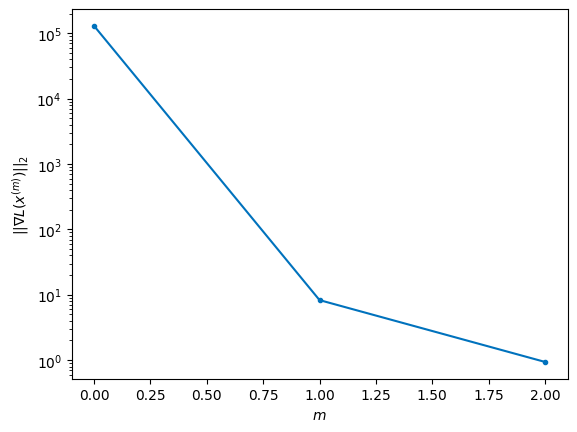


Windows:   9%|▉         | 27/296 [05:06<47:36, 10.62s/it]

Before applying the algorithm
Cost function: 474.8629505642561
Gradient norm: 75617.08240678374
Global relative error: 1895535016.2822294
Position relative errors: 0.0545759082547232 m, 0.2669869254286044 m, 4718.3062200038485 m, 7079.027772492414 m

Iteration 1
Cost function: 474.12577517197707 (-0.16%)
Gradient norm: 9.802090748030684 (-99.99%)
Global relative error: 8507.39097505667 (0.00%)
Position relative errors: 0.04464125517299451 m, 0.23493748646296225 m, 4718.323856218415 m, 7079.061882577714 m

STOP on Iteration 2
Cost function = 474.1257753223349 (0.00%)
Gradient norm = 0.796020867652329 (-91.88%)
Global relative error = 8507.390986840985 (0.00%)
Final position relative errors: 0.0446412440004495 m, 0.23495411974078986 m, 4718.323815814768 m, 7079.061923668952 m



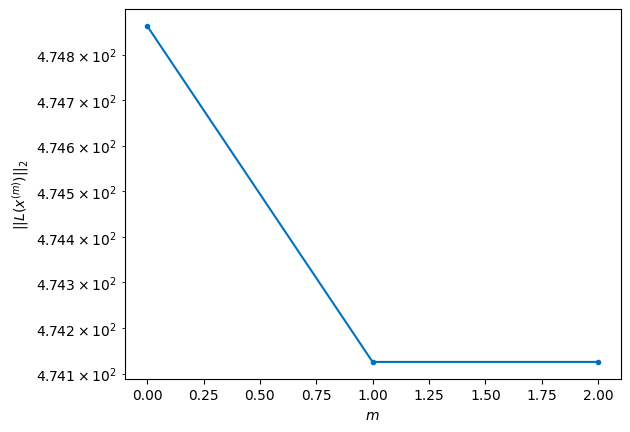

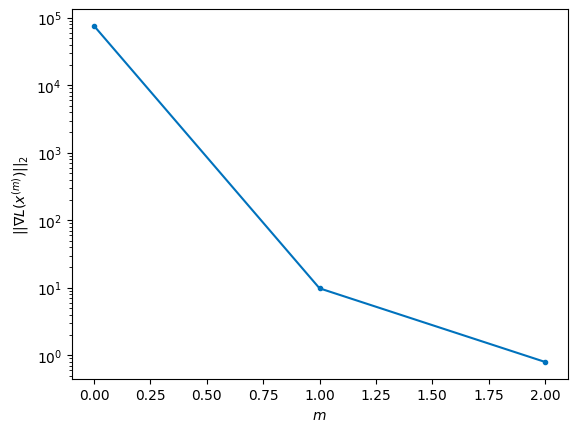


Windows:   9%|▉         | 28/296 [05:12<41:04,  9.19s/it]

Before applying the algorithm
Cost function: 477.1277226456343
Gradient norm: 221887.774470926
Global relative error: 1896143488.1897879
Position relative errors: 0.04271732541757502 m, 0.20948838426379165 m, 4641.807704882032 m, 6963.851144942644 m

Iteration 1
Cost function: 476.0390311507252 (-0.23%)
Gradient norm: 17.19584631812987 (-99.99%)
Global relative error: 8369.314269590295 (0.00%)
Position relative errors: 0.028136923501021222 m, 0.21231651991590497 m, 4641.7720612398825 m, 6964.148664195303 m

Iteration 2
Cost function: 476.03903100682567 (-0.00%)
Gradient norm: 5.218930063696806 (-69.65%)
Global relative error: 8369.31426629512 (-0.00%)
Position relative errors: 0.02813691988157397 m, 0.21230996374740482 m, 4641.772054229699 m, 6964.148664907919 m

Iteration 3
Cost function: 476.03903103082393 (0.00%)
Gradient norm: 1.8767683313534196 (-64.04%)
Global relative error: 8369.314266292742 (-0.00%)
Position relative errors: 0.028136936859541103 m, 0.21230995314172632 m, 4641.

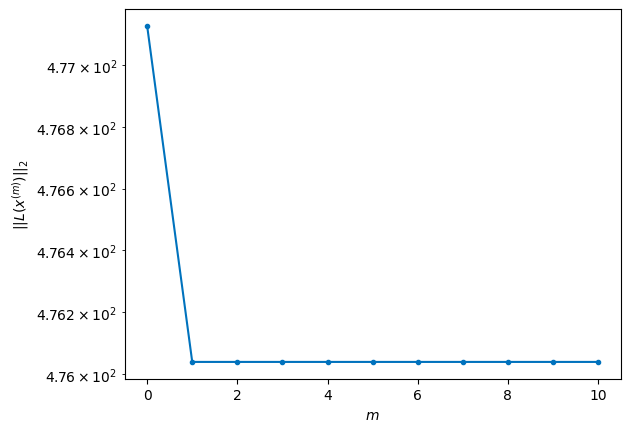

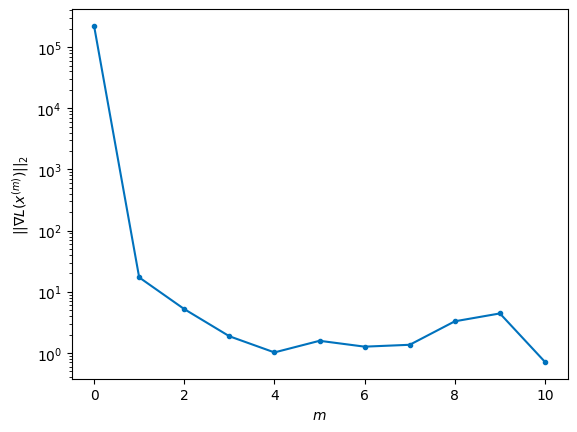


Windows:  10%|▉         | 29/296 [05:32<54:14, 12.19s/it]

Before applying the algorithm
Cost function: 482.04019667019617
Gradient norm: 136493.85321169294
Global relative error: 1896770291.873782
Position relative errors: 0.026805219018799106 m, 0.28050161982316874 m, 4545.109402481611 m, 6818.699039526575 m

Iteration 1
Cost function: 481.393800764918 (-0.13%)
Gradient norm: 3.246125759691097 (-100.00%)
Global relative error: 8194.563768690934 (-0.00%)
Position relative errors: 0.0278200871187467 m, 0.49450793160749107 m, 4545.229836255738 m, 6818.485942667892 m

Iteration 2
Cost function: 481.39380077862444 (0.00%)
Gradient norm: 1.5825177619449207 (-51.25%)
Global relative error: 8194.563774248187 (0.00%)
Position relative errors: 0.02782008789444352 m, 0.4944680324097926 m, 4545.229812995226 m, 6818.48596485513 m

STOP on Iteration 3
Cost function = 481.39380054392024 (-0.00%)
Gradient norm = 0.8599695283385528 (-45.66%)
Global relative error = 8194.563774248301 (0.00%)
Final position relative errors: 0.027820095337931835 m, 0.4944680250

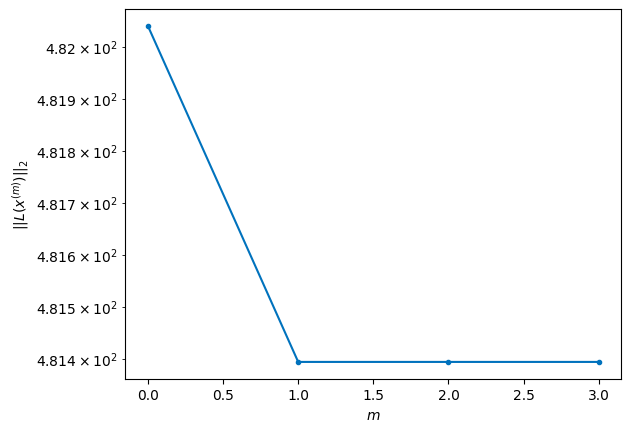

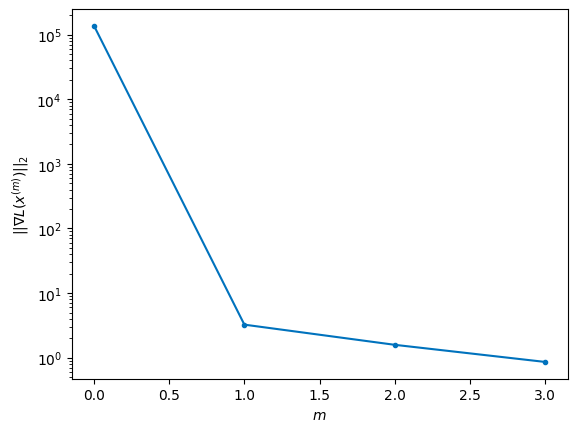


Windows:  10%|█         | 30/296 [05:39<47:29, 10.71s/it]

Before applying the algorithm
Cost function: 487.4879379529272
Gradient norm: 191564.27616886166
Global relative error: 1897412475.5546563
Position relative errors: 0.026375745607539355 m, 0.5954146551877725 m, 4428.831773767808 m, 6643.462392929993 m

Iteration 1
Cost function: 485.95744230093874 (-0.31%)
Gradient norm: 9.807884125812372 (-99.99%)
Global relative error: 7984.30728732147 (-0.00%)
Position relative errors: 0.030757456096578685 m, 0.6695046636512186 m, 4428.77450054607 m, 6643.42565476396 m

STOP on Iteration 2
Cost function = 485.95744232782874 (0.00%)
Gradient norm = 0.4997584394850746 (-94.90%)
Global relative error = 7984.3072866323355 (-0.00%)
Final position relative errors: 0.03075745609964365 m, 0.6694895359238956 m, 4428.774492314314 m, 6643.425659424887 m



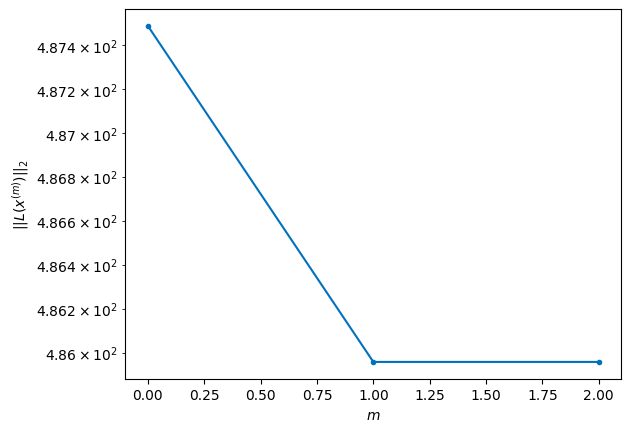

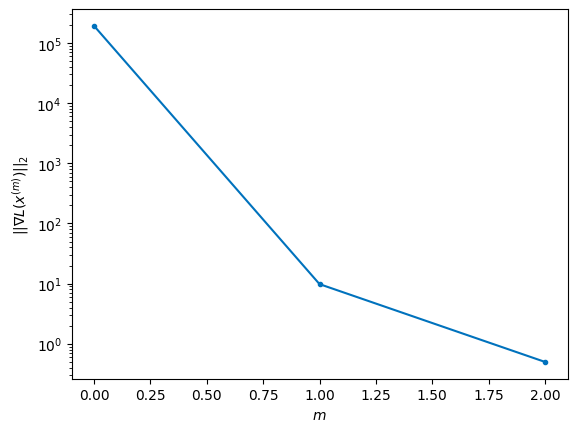


Windows:  10%|█         | 31/296 [05:44<40:33,  9.18s/it]

Before applying the algorithm
Cost function: 486.43145317942407
Gradient norm: 122228.12380704033
Global relative error: 1898066971.6489694
Position relative errors: 0.029053475247252655 m, 0.7737424166446992 m, 4293.148856177748 m, 6439.553126665546 m

Iteration 1
Cost function: 485.9706380306862 (-0.09%)
Gradient norm: 7.59126865342333 (-99.99%)
Global relative error: 7739.400325072559 (-0.00%)
Position relative errors: 0.03192358439545486 m, 0.9096944067580296 m, 4293.126303356841 m, 6439.515824914768 m

Iteration 2
Cost function: 485.9706379278156 (-0.00%)
Gradient norm: 7.872270910872645 (3.70%)
Global relative error: 7739.400315164597 (-0.00%)
Position relative errors: 0.031923584556224426 m, 0.9097305872685628 m, 4293.126321541338 m, 6439.515800878336 m

Iteration 3
Cost function: 485.97063834103074 (0.00%)
Gradient norm: 5.041341997227166 (-35.96%)
Global relative error: 7739.400315166925 (0.00%)
Position relative errors: 0.03192358035262223 m, 0.9097305828424769 m, 4293.126321

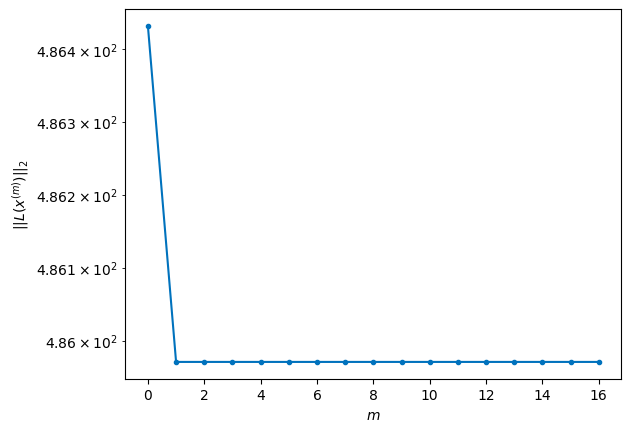

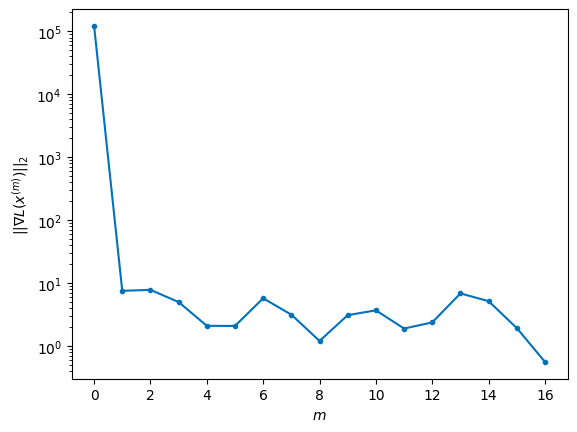


Windows:  11%|█         | 32/296 [06:14<1:07:44, 15.40s/it]

Before applying the algorithm
Cost function: 487.8284579713431
Gradient norm: 83443.46631838841
Global relative error: 1898730626.4409442
Position relative errors: 0.030146428626093232 m, 1.0364647643727662 m, 4138.84949571622 m, 6207.688168211567 m

Iteration 1
Cost function: 486.59377752018645 (-0.25%)
Gradient norm: 14.833259153208632 (-99.98%)
Global relative error: 7461.207118709936 (0.00%)
Position relative errors: 0.012688944143445494 m, 0.936626681359791 m, 4138.679714349385 m, 6208.133121670641 m

Iteration 2
Cost function: 486.59377763485435 (0.00%)
Gradient norm: 4.173377275847907 (-71.86%)
Global relative error: 7461.207109771001 (-0.00%)
Position relative errors: 0.012688938722701798 m, 0.9366045574798642 m, 4138.679698629063 m, 6208.133121410809 m

Iteration 3
Cost function: 486.593777554249 (-0.00%)
Gradient norm: 2.6616605080465634 (-36.22%)
Global relative error: 7461.207109772208 (0.00%)
Position relative errors: 0.012688949744537041 m, 0.9366045564560039 m, 4138.6796

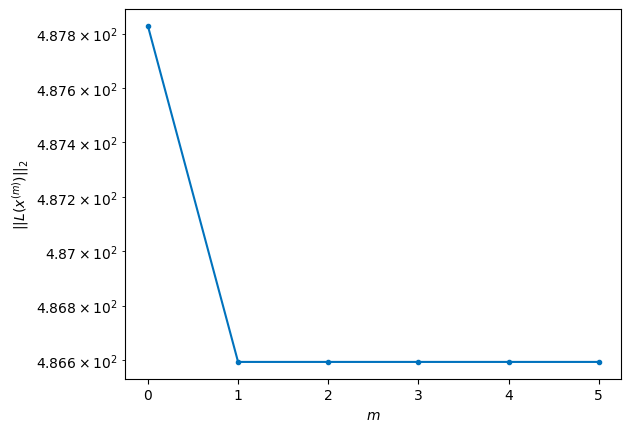

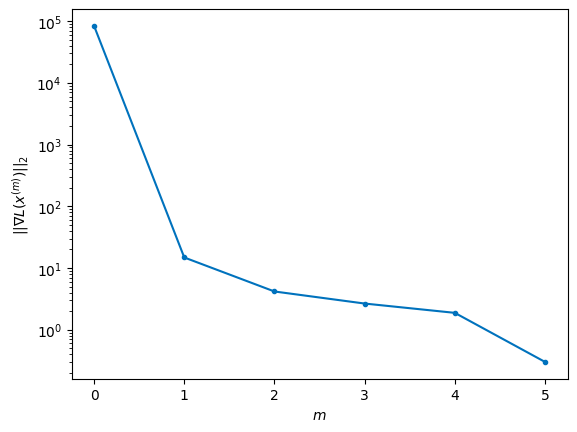


Windows:  11%|█         | 33/296 [06:25<1:00:48, 13.87s/it]

Before applying the algorithm
Cost function: 486.4356012314351
Gradient norm: 51301.39894741338
Global relative error: 1899400232.5435774
Position relative errors: 0.011968850049188441 m, 1.0587470522502211 m, 3966.413750056909 m, 5949.342574810354 m

Iteration 1
Cost function: 485.87138713898867 (-0.12%)
Gradient norm: 3.5526147240710753 (-99.99%)
Global relative error: 7150.382174151584 (0.00%)
Position relative errors: 0.014257912260065593 m, 1.2598175717121345 m, 3966.411661812824 m, 5949.412789487547 m

Iteration 2
Cost function: 485.87138722440847 (0.00%)
Gradient norm: 6.605571784381607 (85.94%)
Global relative error: 7150.38214525674 (-0.00%)
Position relative errors: 0.014257910858542779 m, 1.25992616639711 m, 3966.411709519579 m, 5949.412722931264 m

Iteration 3
Cost function: 485.87138712405624 (-0.00%)
Gradient norm: 5.079482977667221 (-23.10%)
Global relative error: 7150.382145259055 (0.00%)
Position relative errors: 0.014257913818896606 m, 1.2599261682866727 m, 3966.41170

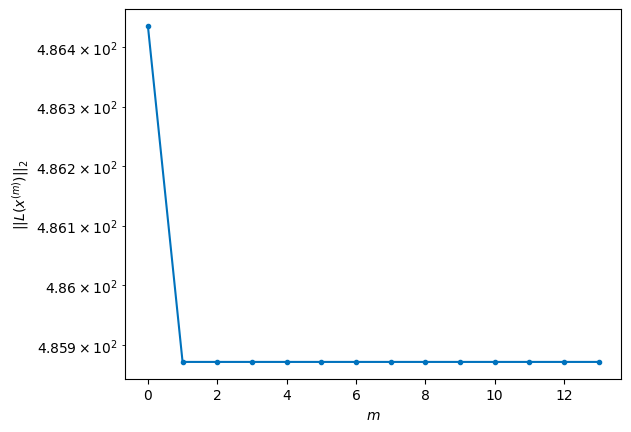

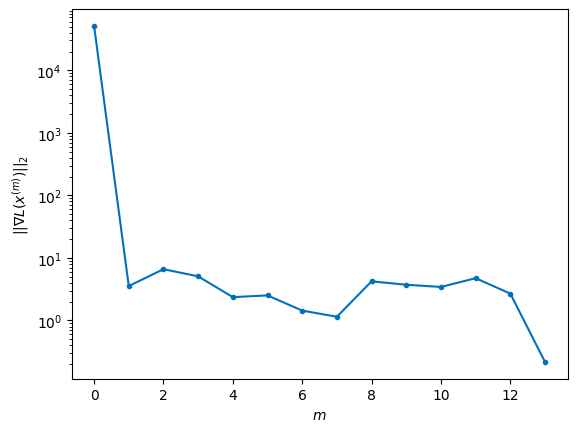


Windows:  11%|█▏        | 34/296 [06:51<1:17:28, 17.74s/it]

Before applying the algorithm
Cost function: 486.9532852493686
Gradient norm: 54013.85314610997
Global relative error: 1900072530.7917538
Position relative errors: 0.013404139385985574 m, 1.387044334893823 m, 3776.898495751221 m, 5664.793196735354 m

Iteration 1
Cost function: 486.30594411132034 (-0.13%)
Gradient norm: 7.558765357787561 (-99.99%)
Global relative error: 6808.247875882492 (-0.00%)
Position relative errors: 0.015592461824545139 m, 1.5741516120133767 m, 3776.76129834584 m, 5664.6513888260515 m

Iteration 2
Cost function: 486.3059440302701 (-0.00%)
Gradient norm: 2.9109524826758264 (-61.49%)
Global relative error: 6808.247843909992 (-0.00%)
Position relative errors: 0.015592470159174495 m, 1.574251084688661 m, 3776.7613264578704 m, 5664.651331628218 m

Iteration 3
Cost function: 486.3059441932288 (0.00%)
Gradient norm: 2.1949320756343247 (-24.60%)
Global relative error: 6808.247843912003 (0.00%)
Position relative errors: 0.015592455924195078 m, 1.5742510815310826 m, 3776.76

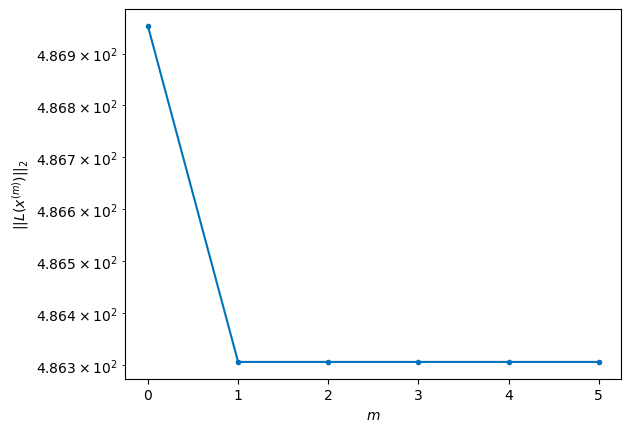

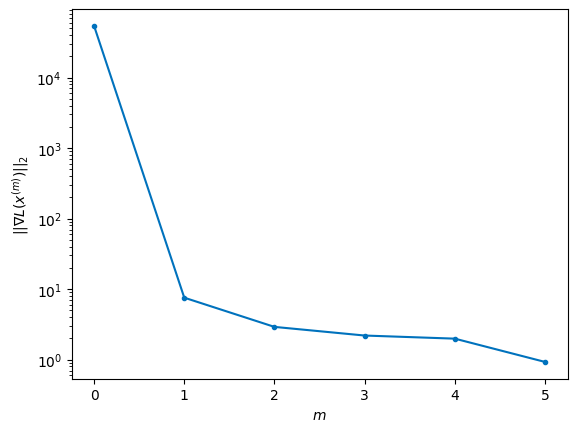


Windows:  12%|█▏        | 35/296 [07:02<1:08:01, 15.64s/it]

Before applying the algorithm
Cost function: 488.70526134158087
Gradient norm: 106431.18887713483
Global relative error: 1900744235.213367
Position relative errors: 0.014556330098864171 m, 1.70176332246229 m, 3570.812764852326 m, 5355.439936694957 m

Iteration 1
Cost function: 487.9933596462085 (-0.15%)
Gradient norm: 8.960018581845153 (-99.99%)
Global relative error: 6436.4908507446935 (-0.00%)
Position relative errors: 0.010922757044694706 m, 1.596819255660825 m, 3570.677677448156 m, 5355.243365764435 m

Iteration 2
Cost function: 487.9933594841249 (-0.00%)
Gradient norm: 3.79701490608054 (-57.62%)
Global relative error: 6436.490842585107 (-0.00%)
Position relative errors: 0.010922755304196173 m, 1.5967828654773653 m, 3570.677655612379 m, 5355.243370527549 m

Iteration 3
Cost function: 487.9933597071247 (0.00%)
Gradient norm: 2.3700898561923354 (-37.58%)
Global relative error: 6436.490842592127 (0.00%)
Position relative errors: 0.010922755164972561 m, 1.5967828648039208 m, 3570.67765

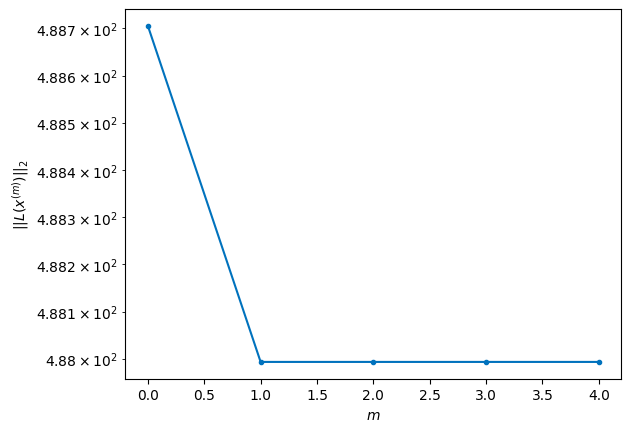

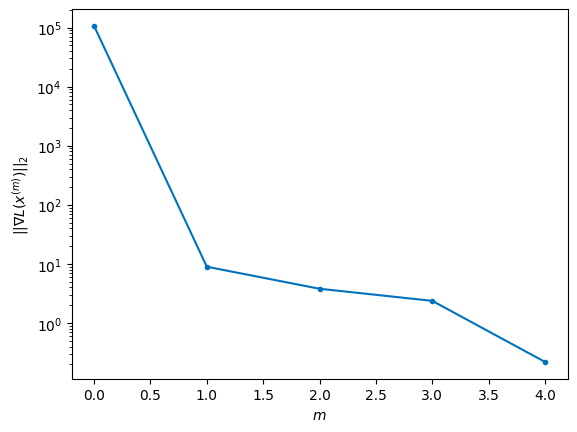


Windows:  12%|█▏        | 36/296 [07:11<58:50, 13.58s/it]  

Before applying the algorithm
Cost function: 487.36143162515805
Gradient norm: 112562.36153256305
Global relative error: 1901412060.5991497
Position relative errors: 0.011015555892006404 m, 1.708942779032086 m, 3349.1895579562884 m, 5022.784380278026 m

Iteration 1
Cost function: 486.78140255344096 (-0.12%)
Gradient norm: 9.508510224341066 (-99.99%)
Global relative error: 6036.733520421625 (-0.00%)
Position relative errors: 0.01335049352419564 m, 1.7239389178874476 m, 3349.138888824816 m, 5022.486433269688 m

Iteration 2
Cost function: 486.78140269603773 (0.00%)
Gradient norm: 1.7102226144911559 (-82.01%)
Global relative error: 6036.733501473282 (-0.00%)
Position relative errors: 0.013350494083950603 m, 1.7239401961956056 m, 3349.1388873379046 m, 5022.486411485989 m

Iteration 3
Cost function: 486.78140269341327 (-0.00%)
Gradient norm: 4.005041019535843 (134.18%)
Global relative error: 6036.733501472801 (-0.00%)
Position relative errors: 0.013350493697182548 m, 1.7239401949584294 m, 33

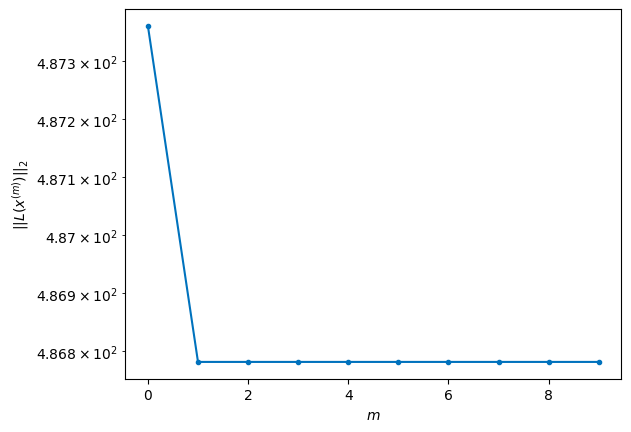

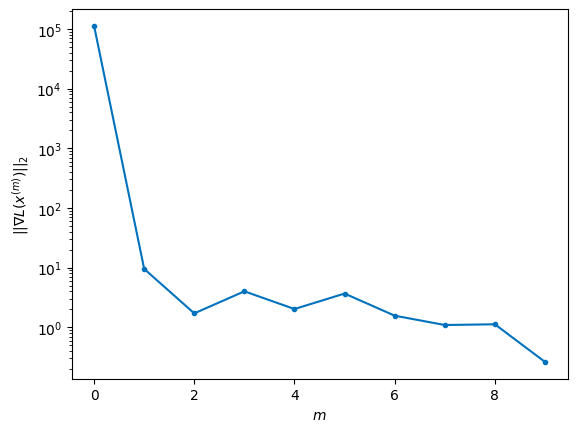


Windows:  12%|█▎        | 37/296 [07:32<1:08:29, 15.87s/it]

Before applying the algorithm
Cost function: 481.0062069741824
Gradient norm: 113107.60367117125
Global relative error: 1902072722.410982
Position relative errors: 0.01352985880889102 m, 1.8280008671845671 m, 3113.0675764133657 m, 4668.218504934994 m

Iteration 1
Cost function: 480.53561181813524 (-0.10%)
Gradient norm: 10.943324380209896 (-99.99%)
Global relative error: 5610.710285423687 (-0.01%)
Position relative errors: 0.008970896143179362 m, 2.0568080121075707 m, 3113.1329960482667 m, 4667.806259721367 m

STOP on Iteration 2
Cost function = 480.53561191988143 (0.00%)
Gradient norm = 0.8744621399398183 (-92.01%)
Global relative error = 5610.7102440006265 (-0.00%)
Final position relative errors: 0.008970895234631867 m, 2.0568843143343343 m, 3113.133024217679 m, 4667.806191109932 m



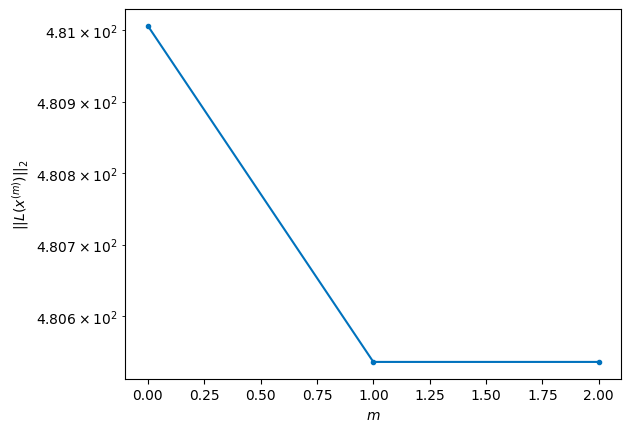

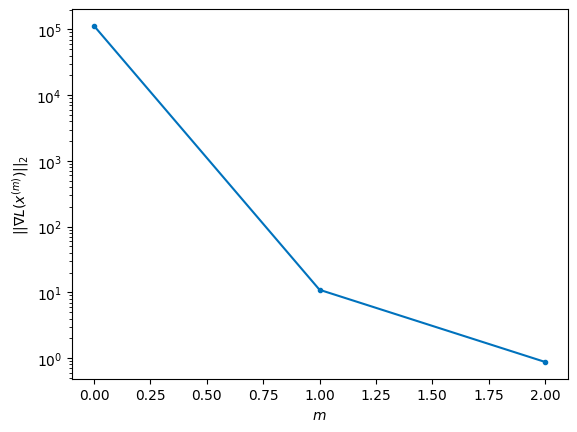


Windows:  13%|█▎        | 38/296 [07:38<54:45, 12.73s/it]  

Before applying the algorithm
Cost function: 478.294530095091
Gradient norm: 265218.8838944598
Global relative error: 1902722980.1221814
Position relative errors: 0.008389246470919138 m, 2.1572835219540356 m, 2863.5077952053707 m, 4293.2461375540515 m

Iteration 1
Cost function: 477.54807959290315 (-0.16%)
Gradient norm: 11.788579080318472 (-100.00%)
Global relative error: 5160.206943463524 (-0.01%)
Position relative errors: 0.008795078668373547 m, 2.1711908959522064 m, 2863.2916467021396 m, 4292.928222802172 m

STOP on Iteration 2
Cost function = 477.54807983942 (0.00%)
Gradient norm = 0.1763247990224413 (-98.50%)
Global relative error = 5160.2069017048625 (-0.00%)
Final position relative errors: 0.008795074895225095 m, 2.171191013458129 m, 2863.29163340327 m, 4292.928181477257 m



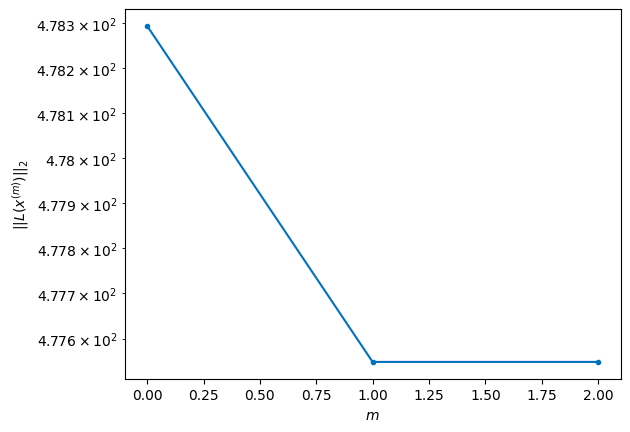

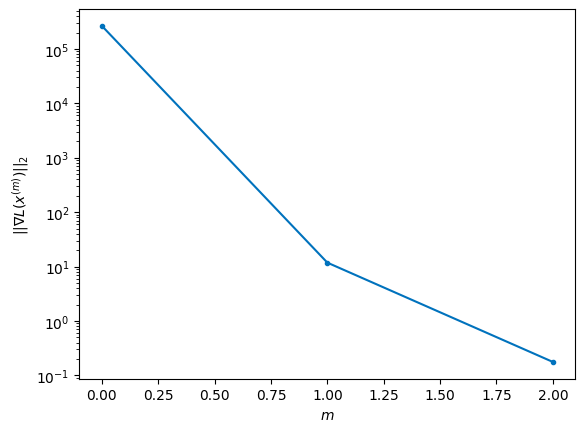


Windows:  13%|█▎        | 39/296 [07:43<44:59, 10.50s/it]

Before applying the algorithm
Cost function: 471.1132751552345
Gradient norm: 323583.9399755766
Global relative error: 1903359646.4134848
Position relative errors: 0.008766984080147443 m, 2.2625284639628034 m, 2601.1865093468937 m, 3899.716599720661 m

Iteration 1
Cost function: 470.04880616022564 (-0.23%)
Gradient norm: 14.584336331516333 (-100.00%)
Global relative error: 4687.168031761313 (-0.01%)
Position relative errors: 0.00799423666347942 m, 2.4807652387977495 m, 2601.0046345052087 m, 3899.262502571979 m

STOP on Iteration 2
Cost function = 470.0488060322224 (-0.00%)
Gradient norm = 0.6804613597323842 (-95.33%)
Global relative error = 4687.167948134939 (-0.00%)
Final position relative errors: 0.007994237603581323 m, 2.480862230379441 m, 2601.004664246373 m, 3899.2623821470856 m



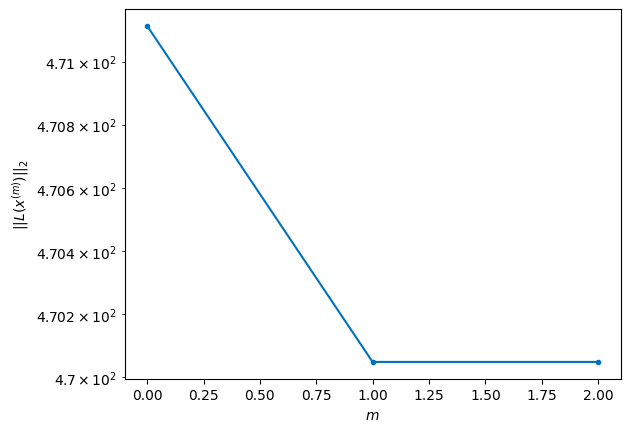

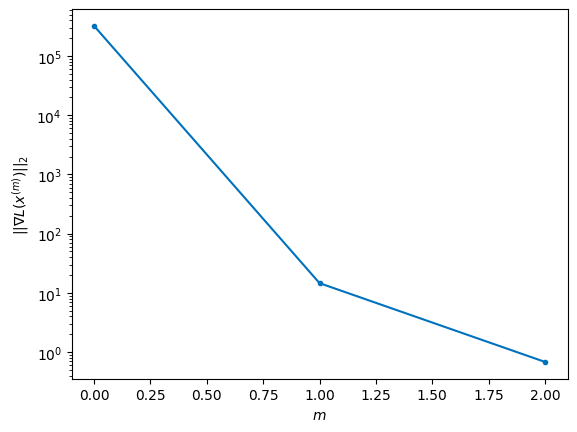


Windows:  14%|█▎        | 40/296 [07:48<38:32,  9.03s/it]

Before applying the algorithm
Cost function: 469.3551296954127
Gradient norm: 221090.3690856899
Global relative error: 1903979607.7528822
Position relative errors: 0.008292587987895048 m, 2.568439064724101 m, 2327.558459977405 m, 3489.098210815157 m

Iteration 1
Cost function: 468.6986464783782 (-0.14%)
Gradient norm: 3.3392816836910852 (-100.00%)
Global relative error: 4193.97850800753 (-0.01%)
Position relative errors: 0.007617513937528776 m, 2.593036874921515 m, 2327.434207099513 m, 3488.9008134889536 m

Iteration 2
Cost function: 468.6986466382481 (0.00%)
Gradient norm: 4.469424238594479 (33.84%)
Global relative error: 4193.978492784622 (-0.00%)
Position relative errors: 0.007617513551871174 m, 2.5930369889307285 m, 2327.434213706979 m, 3488.9007907817295 m

Iteration 3
Cost function: 468.69864656890775 (-0.00%)
Gradient norm: 6.17732305508488 (38.21%)
Global relative error: 4193.978492781239 (-0.00%)
Position relative errors: 0.007617515444010963 m, 2.5930369933320954 m, 2327.4342

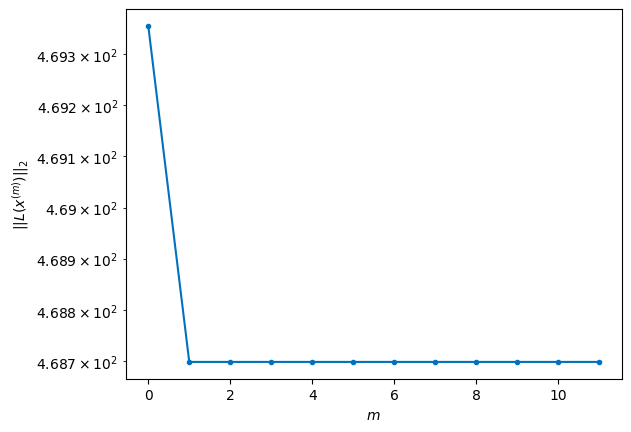

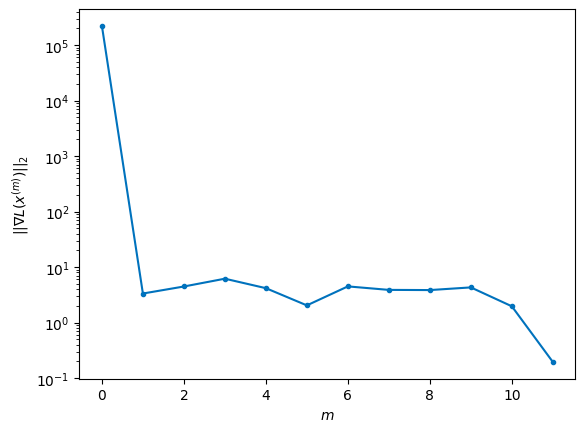


Windows:  14%|█▍        | 41/296 [08:09<53:28, 12.58s/it]

Before applying the algorithm
Cost function: 464.4242668041681
Gradient norm: 239380.19266613576
Global relative error: 1904579852.713704
Position relative errors: 0.008187336504270205 m, 2.668666685579166 m, 2043.8445596488793 m, 3063.5525979336726 m

Iteration 1
Cost function: 463.6881787840619 (-0.16%)
Gradient norm: 3.2716932257167537 (-100.00%)
Global relative error: 3682.500642183448 (-0.01%)
Position relative errors: 0.014715993909021388 m, 2.8942162476225084 m, 2043.70346223944 m, 3063.3321335878945 m

Iteration 2
Cost function: 463.68817884477204 (0.00%)
Gradient norm: 8.19022252219883 (150.34%)
Global relative error: 3682.500588346352 (-0.00%)
Position relative errors: 0.014715999168411006 m, 2.894372292479674 m, 2043.7035489815523 m, 3063.33201085162 m

Iteration 3
Cost function: 463.6881789290626 (0.00%)
Gradient norm: 7.347976833184727 (-10.28%)
Global relative error: 3682.5005883421923 (-0.00%)
Position relative errors: 0.01471599003082257 m, 2.8943723024486747 m, 2043.70

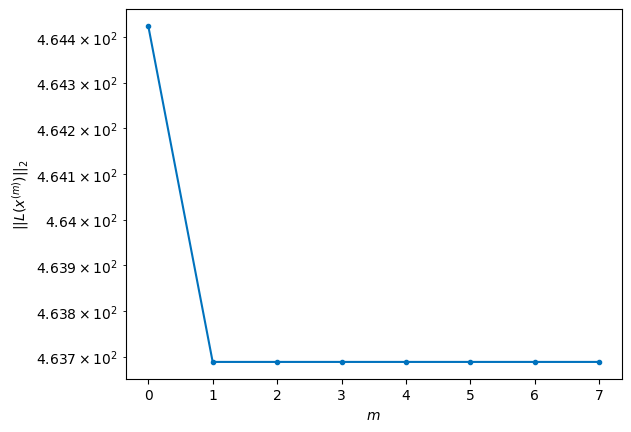

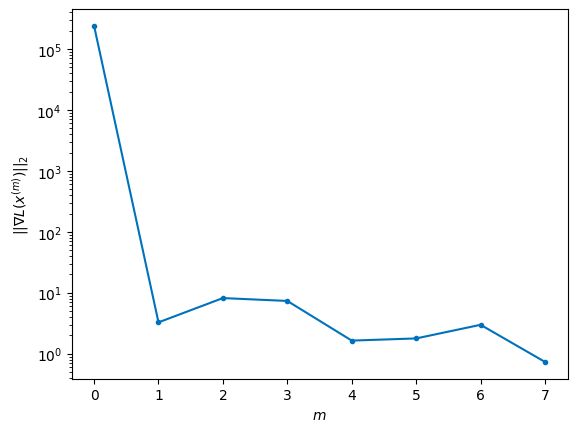


Windows:  14%|█▍        | 42/296 [08:24<55:22, 13.08s/it]

Before applying the algorithm
Cost function: 462.64083776742814
Gradient norm: 183015.49496582247
Global relative error: 1905157472.530882
Position relative errors: 0.01483075857154671 m, 2.9618349266439212 m, 1751.2039417047285 m, 2624.642451667496 m

Iteration 1
Cost function: 462.1590709603123 (-0.10%)
Gradient norm: 7.25013381420069 (-100.00%)
Global relative error: 3154.930359391786 (-0.01%)
Position relative errors: 0.018852329009787096 m, 3.071154684581846 m, 1751.1622736037475 m, 2624.295613908558 m

Iteration 2
Cost function: 462.159070764471 (-0.00%)
Gradient norm: 2.3888754275277493 (-67.05%)
Global relative error: 3154.9303397761764 (-0.00%)
Position relative errors: 0.018852328830767883 m, 3.0711904510432824 m, 1751.162279283279 m, 2624.2955864949345 m

Iteration 3
Cost function: 462.15907104389044 (0.00%)
Gradient norm: 4.895932074054439 (104.95%)
Global relative error: 3154.9303397763656 (0.00%)
Position relative errors: 0.01885232682258057 m, 3.071190451217092 m, 1751.1

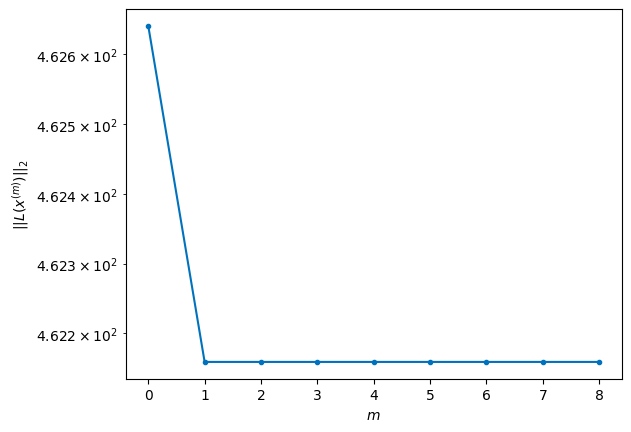

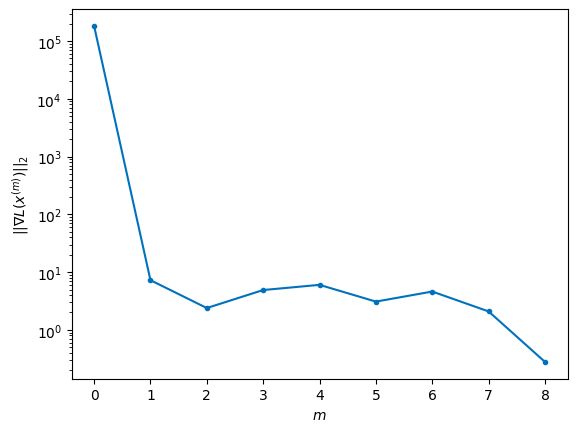


Windows:  15%|█▍        | 43/296 [08:40<59:22, 14.08s/it]

Before applying the algorithm
Cost function: 463.432085826657
Gradient norm: 145265.84169923532
Global relative error: 1905709700.1820087
Position relative errors: 0.01863721887486684 m, 3.126448491626584 m, 1451.0214644650239 m, 2174.1886808275744 m

Iteration 1
Cost function: 462.8940335447167 (-0.12%)
Gradient norm: 6.966044205829891 (-100.00%)
Global relative error: 2613.588054115321 (-0.01%)
Position relative errors: 0.026559136075309277 m, 3.2711640058016282 m, 1450.940577980977 m, 2173.826146160789 m

Iteration 2
Cost function: 462.8940338513024 (0.00%)
Gradient norm: 1.4027911361912395 (-79.86%)
Global relative error: 2613.5880268210553 (-0.00%)
Position relative errors: 0.026559137669783923 m, 3.2712175763070603 m, 1450.9406011463939 m, 2173.8260978023527 m

STOP on Iteration 3
Cost function = 462.894033690089 (-0.00%)
Gradient norm = 0.7754078649551392 (-44.72%)
Global relative error = 2613.588026823043 (0.00%)
Final position relative errors: 0.026559149988272874 m, 3.2712175

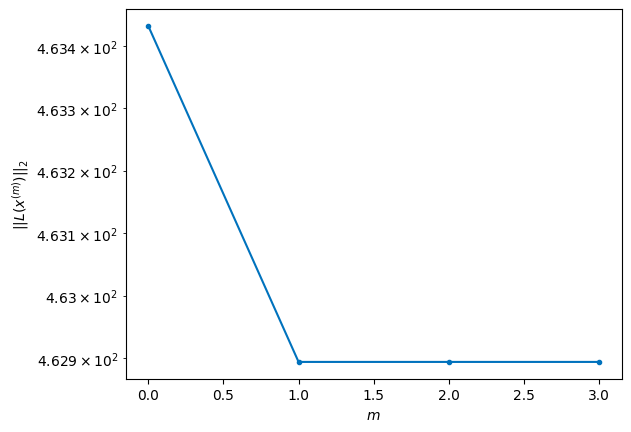

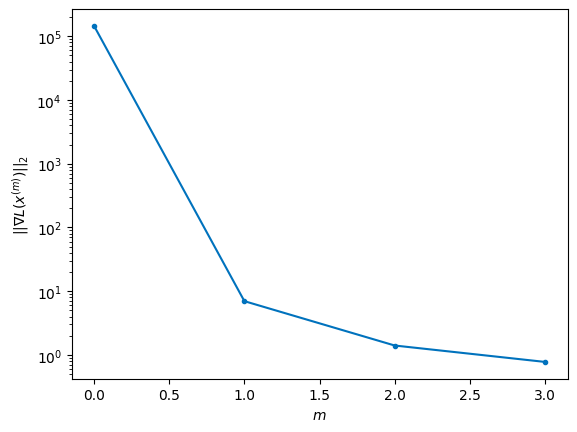


Windows:  15%|█▍        | 44/296 [08:47<50:19, 11.98s/it]

Before applying the algorithm
Cost function: 460.264676314578
Gradient norm: 229018.61815051973
Global relative error: 1906233908.4524362
Position relative errors: 0.025980437384019638 m, 3.3140475538844223 m, 1144.4678296913235 m, 1714.253500429803 m

Iteration 1
Cost function: 460.0370777742327 (-0.05%)
Gradient norm: 3.030217092937696 (-100.00%)
Global relative error: 2061.022104946096 (-0.01%)
Position relative errors: 0.0235539706075256 m, 3.3285438711475317 m, 1144.396847554352 m, 1714.080110390151 m

Iteration 2
Cost function: 460.0370777796715 (0.00%)
Gradient norm: 4.711527989895737 (55.48%)
Global relative error: 2061.0221034961914 (-0.00%)
Position relative errors: 0.023553968887848276 m, 3.328541316441461 m, 1144.3968442407497 m, 1714.0801108640544 m

STOP on Iteration 3
Cost function = 460.03707792873104 (0.00%)
Gradient norm = 0.7603980122053251 (-83.86%)
Global relative error = 2061.0221034932742 (-0.00%)
Final position relative errors: 0.02355397012353363 m, 3.328541311

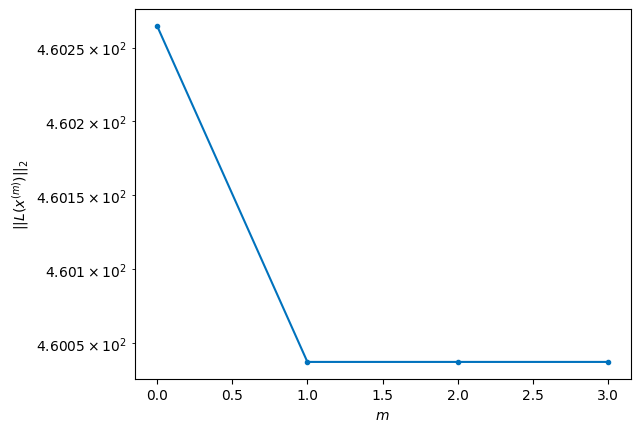

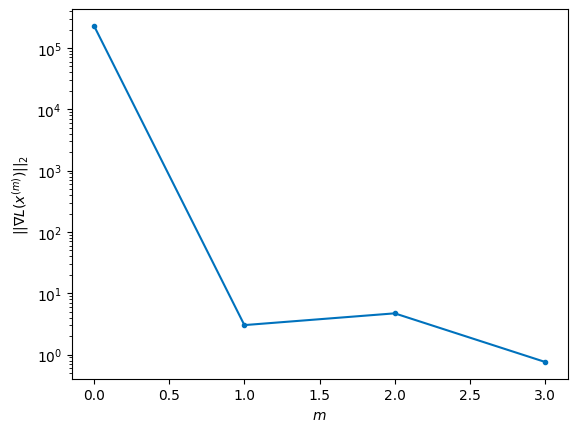


Windows:  15%|█▌        | 45/296 [08:54<44:15, 10.58s/it]

Before applying the algorithm
Cost function: 460.440511742761
Gradient norm: 75789.49559504678
Global relative error: 1906727639.870507
Position relative errors: 0.02315364129186832 m, 3.358518104953048 m, 832.9295818263245 m, 1247.0417865574457 m

Iteration 1
Cost function: 460.2162328798958 (-0.05%)
Gradient norm: 3.0688062225440884 (-100.00%)
Global relative error: 1499.5233895256133 (-0.01%)
Position relative errors: 0.024401839661009603 m, 3.4447894714119953 m, 832.8536005270329 m, 1246.9261075610807 m

Iteration 2
Cost function: 460.2162329858492 (0.00%)
Gradient norm: 3.223758052069572 (5.05%)
Global relative error: 1499.523390328936 (0.00%)
Position relative errors: 0.024401839633860507 m, 3.444774102079344 m, 832.8536046579269 m, 1246.9261058104844 m

Iteration 3
Cost function: 460.2162328235573 (-0.00%)
Gradient norm: 3.876682626801392 (20.25%)
Global relative error: 1499.5233903249696 (-0.00%)
Position relative errors: 0.02440183264418999 m, 3.4447741078587404 m, 832.8536046

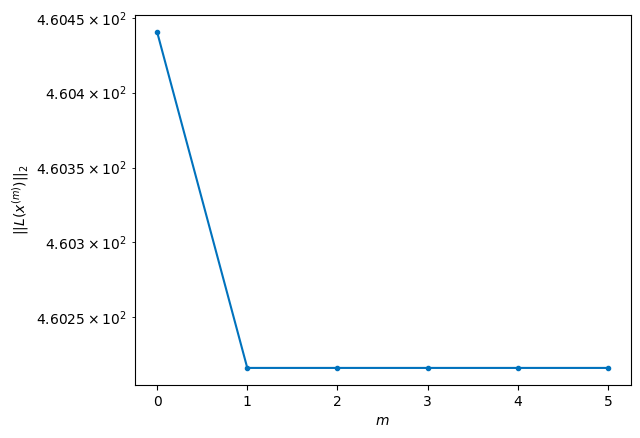

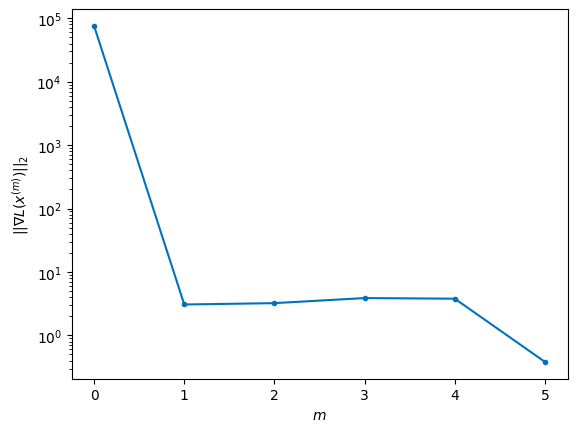


Windows:  16%|█▌        | 46/296 [09:07<46:59, 11.28s/it]

Before applying the algorithm
Cost function: 458.8592746889264
Gradient norm: 81209.15409904726
Global relative error: 1907188605.472773
Position relative errors: 0.023952586811293357 m, 3.462505942866022 m, 517.753412544354 m, 774.4463213799804 m

Iteration 1
Cost function: 458.45636478648163 (-0.09%)
Gradient norm: 2.35762800965148 (-100.00%)
Global relative error: 931.7050917099349 (0.01%)
Position relative errors: 0.026103462757585037 m, 3.469774781080012 m, 517.638723725034 m, 774.6109505829123 m

Iteration 2
Cost function: 458.45636486517776 (0.00%)
Gradient norm: 1.1178932235395531 (-52.58%)
Global relative error: 931.7050974767343 (0.00%)
Position relative errors: 0.026103465799702512 m, 3.469753742379881 m, 517.638718196155 m, 774.6109613081694 m

Iteration 3
Cost function: 458.456364871984 (0.00%)
Gradient norm: 1.8105923078321735 (61.96%)
Global relative error: 931.705097479162 (0.00%)
Position relative errors: 0.026103465407072864 m, 3.4697537447523796 m, 517.6387181969426 

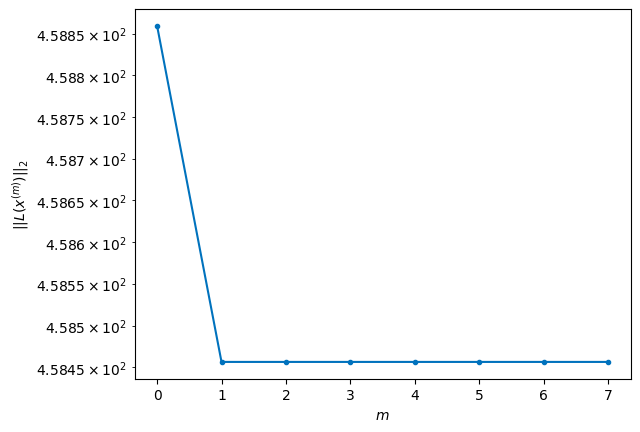

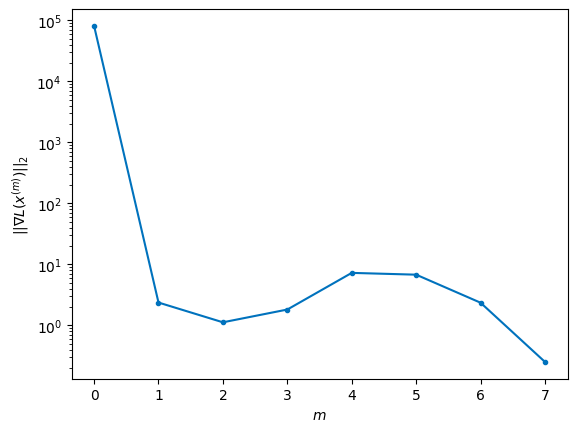


Windows:  16%|█▌        | 47/296 [09:21<50:13, 12.10s/it]

Before applying the algorithm
Cost function: 460.45676717102964
Gradient norm: 265745.4627260084
Global relative error: 1907614710.2825978
Position relative errors: 0.02563027623927989 m, 3.4759700648617615 m, 200.28033082366372 m, 298.75467251983576 m

STOP on Iteration 1
Cost function = 460.2643440631583 (-0.04%)
Gradient norm = 0.5047279008342886 (-100.00%)
Global relative error = 359.8208022117227 (0.00%)
Final position relative errors: 0.030738392172379666 m, 3.5057703036986667 m, 200.28853388457645 m, 298.75066673512646 m



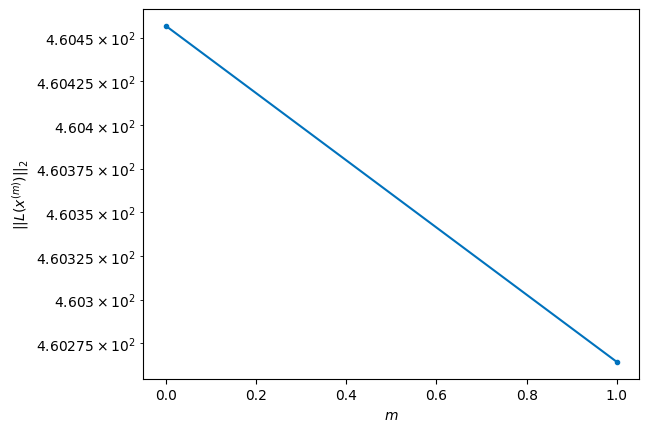

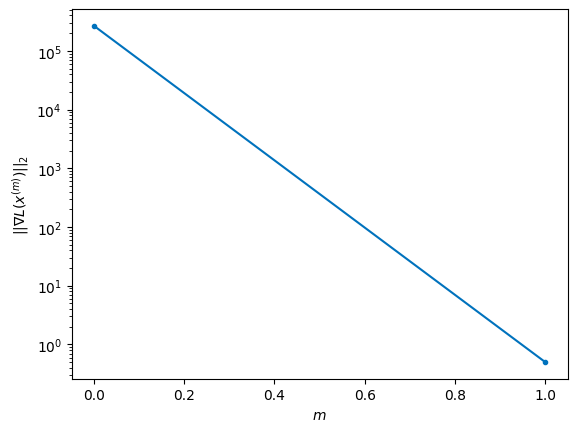


Windows:  16%|█▌        | 48/296 [09:26<40:18,  9.75s/it]

Before applying the algorithm
Cost function: 463.3587172522063
Gradient norm: 313271.004043541
Global relative error: 1908004060.2200809
Position relative errors: 0.029863685873327286 m, 3.4988917758710194 m, 117.95567475929498 m, 178.43224970194143 m

Iteration 1
Cost function: 462.9174757823361 (-0.10%)
Gradient norm: 2.9827953168909134 (-100.00%)
Global relative error: 214.20566187522252 (0.03%)
Position relative errors: 0.037897803794750815 m, 3.624895077318161 m, 118.0225151812586 m, 178.46638542167395 m

Iteration 2
Cost function: 462.91747565762023 (-0.00%)
Gradient norm: 4.487375302829543 (50.44%)
Global relative error: 214.20565046269414 (-0.00%)
Position relative errors: 0.03789780052929415 m, 3.624859625421225 m, 118.0225328416881 m, 178.46636076477643 m

Iteration 3
Cost function: 462.9174758034755 (0.00%)
Gradient norm: 4.1001657596338275 (-8.63%)
Global relative error: 214.20565046112844 (-0.00%)
Position relative errors: 0.03789779940766514 m, 3.6248596306293384 m, 118.0

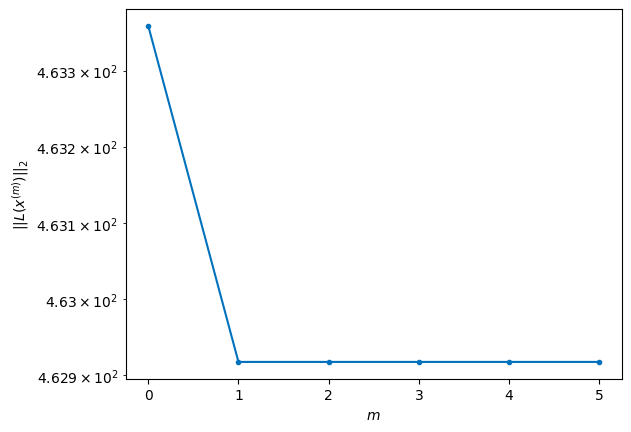

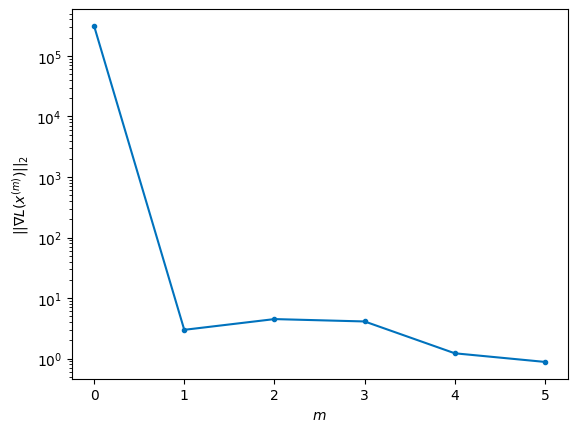


Windows:  17%|█▋        | 49/296 [09:36<40:54,  9.94s/it]

Before applying the algorithm
Cost function: 467.68243681579975
Gradient norm: 267860.6956594127
Global relative error: 1908354968.826061
Position relative errors: 0.03662539819371545 m, 3.605328602365584 m, 435.73673236397076 m, 654.8361583211437 m

Iteration 1
Cost function: 467.27148037507203 (-0.09%)
Gradient norm: 5.252426433023592 (-100.00%)
Global relative error: 786.7125173683116 (0.01%)
Position relative errors: 0.03927673384874273 m, 3.8103279055608 m, 435.71257699348905 m, 654.9549240960799 m

Iteration 2
Cost function: 467.2714803707323 (-0.00%)
Gradient norm: 2.0927959111555117 (-60.16%)
Global relative error: 786.7125338814645 (0.00%)
Position relative errors: 0.03927674154953789 m, 3.8104016575938453 m, 435.7125387630456 m, 654.9549689352192 m

Iteration 3
Cost function: 467.2714805131175 (0.00%)
Gradient norm: 7.165387521718927 (242.38%)
Global relative error: 786.7125338858634 (0.00%)
Position relative errors: 0.0392767381608309 m, 3.8104016602595956 m, 435.71253876159

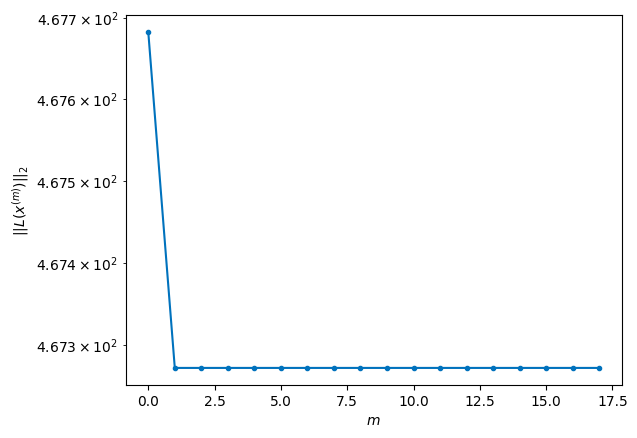

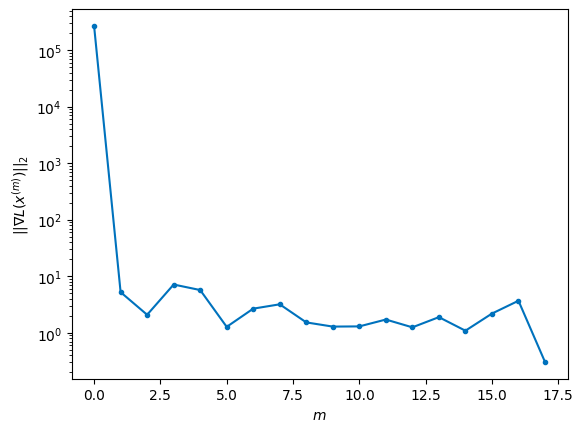


Windows:  17%|█▋        | 50/296 [10:11<1:11:30, 17.44s/it]

Before applying the algorithm
Cost function: 477.24482469506967
Gradient norm: 127990.27173690464
Global relative error: 1908665962.5953946
Position relative errors: 0.03815741343647557 m, 3.77487656120642 m, 751.5287166003875 m, 1128.4652905870257 m

Iteration 1
Cost function: 476.13982976858523 (-0.23%)
Gradient norm: 15.332959542390757 (-99.99%)
Global relative error: 1356.2664328179185 (0.03%)
Position relative errors: 0.04079242809296678 m, 4.113277272468495 m, 751.5055616711236 m, 1128.9782649603162 m

Iteration 2
Cost function: 476.1398297748196 (0.00%)
Gradient norm: 4.719381631380744 (-69.22%)
Global relative error: 1356.2663995990988 (-0.00%)
Position relative errors: 0.040792425788697496 m, 4.113231015888125 m, 751.5055706954455 m, 1128.9782192152145 m

STOP on Iteration 3
Cost function = 476.1398300444751 (0.00%)
Gradient norm = 0.2664539181764797 (-94.35%)
Global relative error = 1356.2663995970424 (-0.00%)
Final position relative errors: 0.04079242242856515 m, 4.113231014

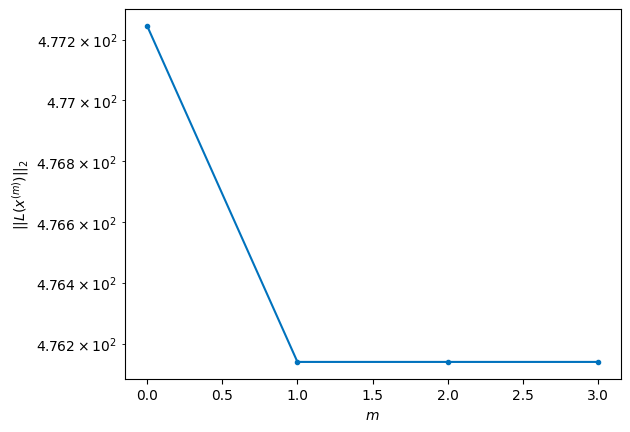

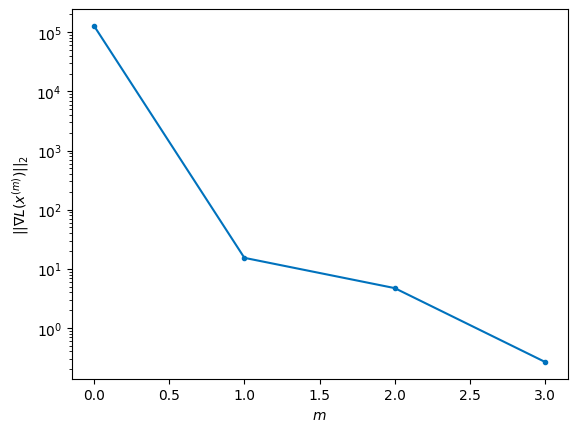


Windows:  17%|█▋        | 51/296 [10:19<59:18, 14.52s/it]  

Before applying the algorithm
Cost function: 483.0421035540469
Gradient norm: 43875.65382921156
Global relative error: 1908935802.0468884
Position relative errors: 0.03969546080776626 m, 4.062227749506901 m, 1064.0368887728157 m, 1597.5686223185269 m

Iteration 1
Cost function: 482.41926737359285 (-0.13%)
Gradient norm: 5.627161871396967 (-99.99%)
Global relative error: 1919.5528683629923 (0.00%)
Position relative errors: 0.027957158681879098 m, 4.125958249427817 m, 1064.3434667453441 m, 1597.4204918143548 m

Iteration 2
Cost function: 482.4192678228807 (0.00%)
Gradient norm: 3.6135499920766505 (-35.78%)
Global relative error: 1919.5528535283784 (-0.00%)
Position relative errors: 0.027957168216628702 m, 4.125918689255658 m, 1064.3434750087 m, 1597.4204685846107 m

Iteration 3
Cost function: 482.41926737452394 (-0.00%)
Gradient norm: 3.477937110754511 (-3.75%)
Global relative error: 1919.5528535345293 (0.00%)
Position relative errors: 0.02795716030860657 m, 4.1259186916879 m, 1064.34347

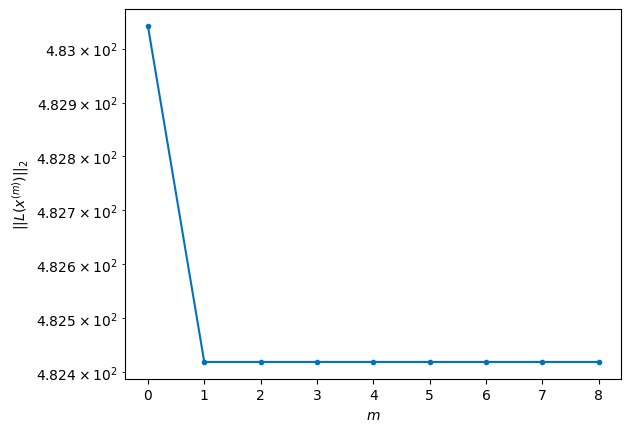

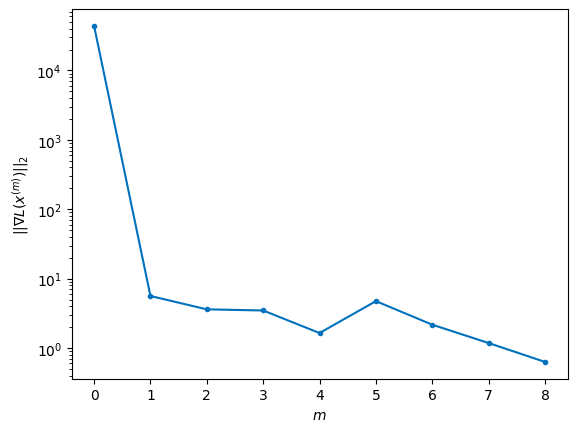


Windows:  18%|█▊        | 52/296 [10:34<59:48, 14.71s/it]

Before applying the algorithm
Cost function: 483.6029131114766
Gradient norm: 359805.9935498526
Global relative error: 1909163454.306783
Position relative errors: 0.027400008450704748 m, 4.060165116785695 m, 1372.2228070737367 m, 2059.047129447269 m

Iteration 1
Cost function: 483.14688278170576 (-0.09%)
Gradient norm: 2.352333466119522 (-100.00%)
Global relative error: 2474.567216086855 (0.01%)
Position relative errors: 0.021362388758676396 m, 4.139633385761253 m, 1372.2482232683833 m, 2059.202902635007 m

STOP on Iteration 2
Cost function = 483.14688300677955 (0.00%)
Gradient norm = 0.5094380921204089 (-78.34%)
Global relative error = 2474.567204480446 (-0.00%)
Final position relative errors: 0.021362393653181558 m, 4.139604095542805 m, 1372.2482321684154 m, 2059.2028828153666 m



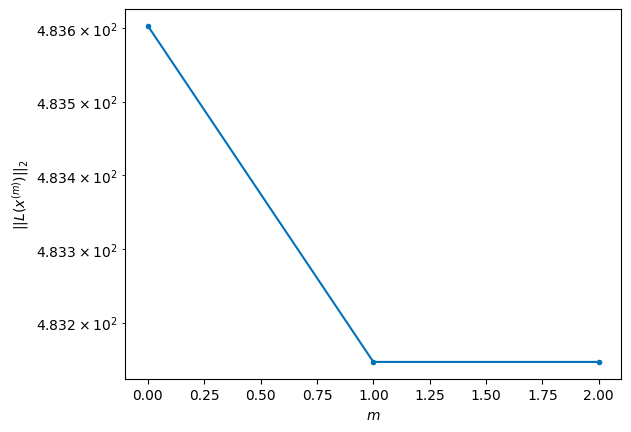

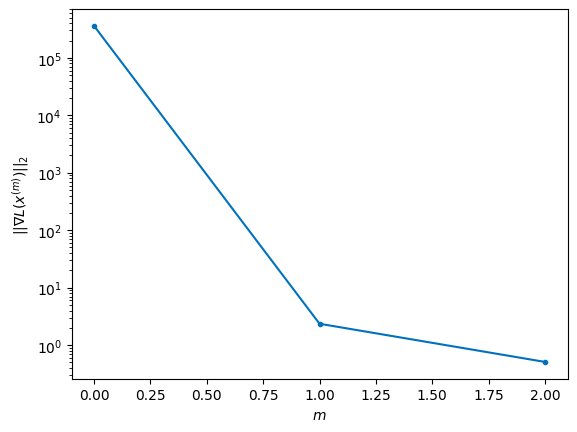


Windows:  18%|█▊        | 53/296 [10:39<48:29, 11.97s/it]

Before applying the algorithm
Cost function: 486.3146686663763
Gradient norm: 393757.4460224154
Global relative error: 1909348131.4953873
Position relative errors: 0.02136522036085212 m, 4.055583188081981 m, 1674.132496156661 m, 2511.843362614346 m

Iteration 1
Cost function: 485.7459416976497 (-0.12%)
Gradient norm: 4.96904490620566 (-100.00%)
Global relative error: 3018.6589058390778 (0.00%)
Position relative errors: 0.010943724004337728 m, 4.186473222971507 m, 1674.1656903747341 m, 2511.8465203874193 m

STOP on Iteration 2
Cost function = 485.7459418936213 (0.00%)
Gradient norm = 0.9772919881231231 (-80.33%)
Global relative error = 3018.6589007752405 (-0.00%)
Final position relative errors: 0.010943723046819292 m, 4.186450683844162 m, 1674.1657066814564 m, 2511.8465034708665 m



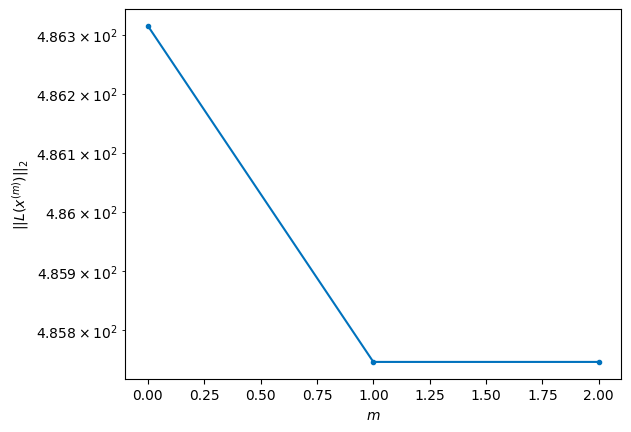

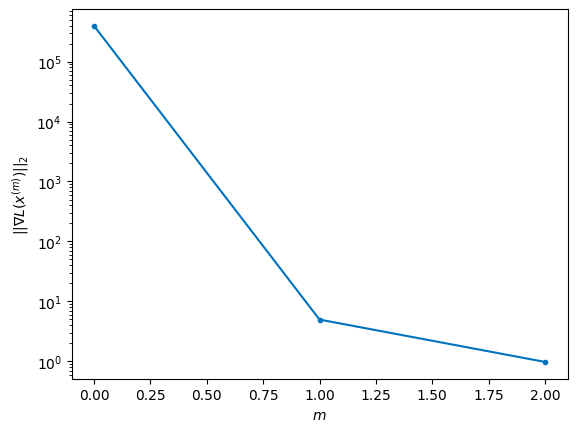


Windows:  18%|█▊        | 54/296 [10:45<41:01, 10.17s/it]

Before applying the algorithm
Cost function: 487.98589572623854
Gradient norm: 153132.59137419425
Global relative error: 1909489259.788152
Position relative errors: 0.011815178928993409 m, 4.082599614512043 m, 1968.739712222609 m, 2953.517335032268 m

Iteration 1
Cost function: 487.3469238303403 (-0.13%)
Gradient norm: 6.630956896389822 (-100.00%)
Global relative error: 3549.7706048098053 (0.01%)
Position relative errors: 0.01069192276652326 m, 4.1447280055396165 m, 1968.5870053110903 m, 2953.886124162745 m

Iteration 2
Cost function: 487.3469238517503 (0.00%)
Gradient norm: 1.01530289400606 (-84.69%)
Global relative error: 3549.7705894138544 (-0.00%)
Position relative errors: 0.010691922069724925 m, 4.1447294000299575 m, 1968.5870108532854 m, 2953.886101965488 m

Iteration 3
Cost function: 487.34692398428837 (0.00%)
Gradient norm: 1.1782512153947104 (16.05%)
Global relative error: 3549.770589423142 (0.00%)
Position relative errors: 0.01069192256428241 m, 4.14472940300729 m, 1968.58701

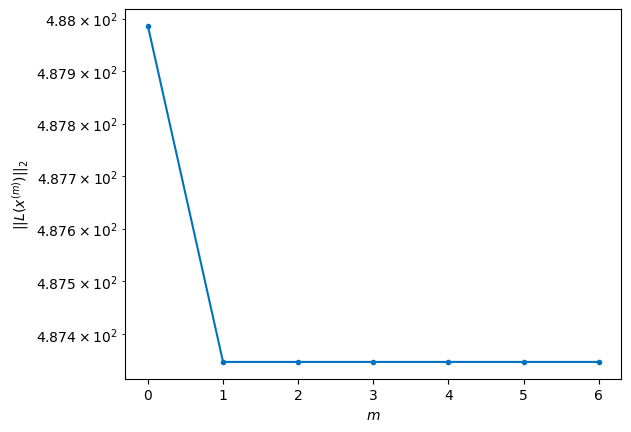

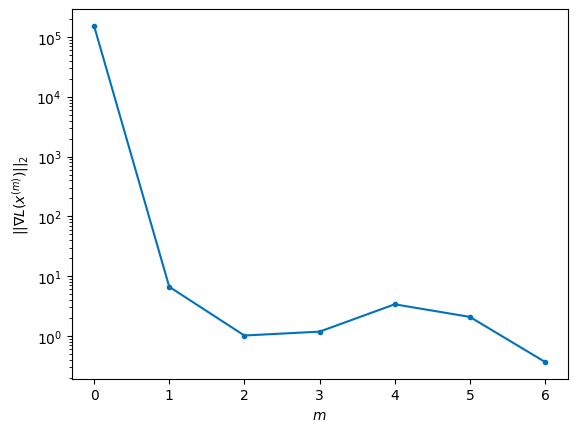


Windows:  19%|█▊        | 55/296 [10:58<43:55, 10.94s/it]

Before applying the algorithm
Cost function: 485.41370334150565
Gradient norm: 62227.09545994498
Global relative error: 1909586495.992272
Position relative errors: 0.011551393693950373 m, 4.023202023335544 m, 2254.561896992406 m, 3382.6819978867447 m

Iteration 1
Cost function: 484.6604267820918 (-0.16%)
Gradient norm: 8.092038491852389 (-99.99%)
Global relative error: 4065.4374963889527 (0.01%)
Position relative errors: 0.011971959820822988 m, 4.264533254875127 m, 2254.5578468062645 m, 3382.9959189731208 m

Iteration 2
Cost function: 484.6604269810183 (0.00%)
Gradient norm: 2.8181510412147617 (-65.17%)
Global relative error: 4065.4374737383705 (-0.00%)
Position relative errors: 0.011971955784959305 m, 4.264499239330768 m, 2254.557850054016 m, 3382.995889631756 m

Iteration 3
Cost function: 484.6604265959547 (-0.00%)
Gradient norm: 1.6151134745032765 (-42.69%)
Global relative error: 4065.4374737401545 (0.00%)
Position relative errors: 0.011971953762599378 m, 4.264499241999457 m, 2254.5

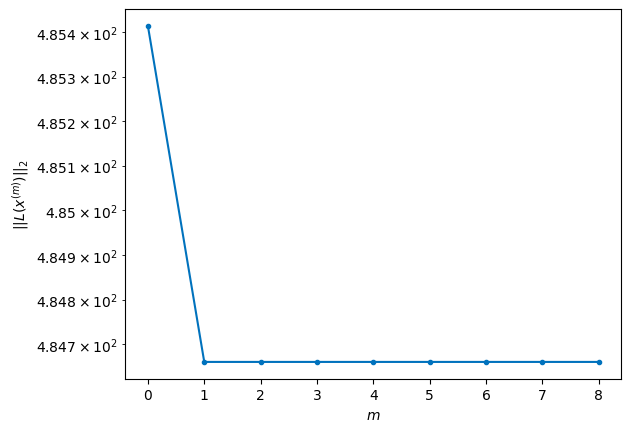

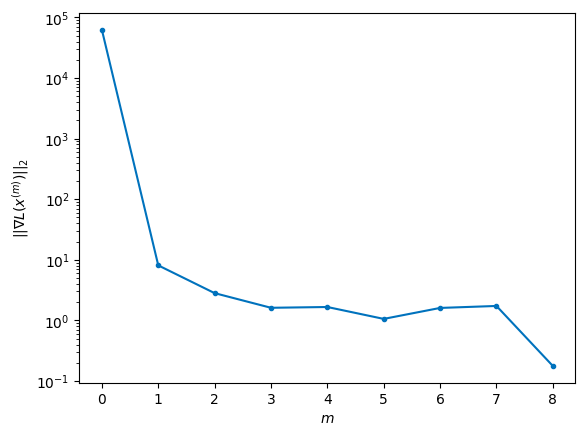


Windows:  19%|█▉        | 56/296 [11:14<49:37, 12.40s/it]

Before applying the algorithm
Cost function: 482.8483911710736
Gradient norm: 136241.13580212498
Global relative error: 1909639717.659584
Position relative errors: 0.011675804114845232 m, 4.12466743098218 m, 2530.6828808027117 m, 3797.045762535705 m

Iteration 1
Cost function: 482.4834366980249 (-0.08%)
Gradient norm: 8.264922870285995 (-99.99%)
Global relative error: 4563.2177424818865 (0.00%)
Position relative errors: 0.0141915815977798 m, 3.9720618790069873 m, 2530.8374230571876 m, 3797.0694161734864 m

Iteration 2
Cost function: 482.4834363431728 (-0.00%)
Gradient norm: 2.661031233012835 (-67.80%)
Global relative error: 4563.217744370483 (0.00%)
Position relative errors: 0.014191589168821113 m, 3.97208639052901 m, 2530.837409442614 m, 3797.069427491959 m

Iteration 3
Cost function: 482.4834363033369 (-0.00%)
Gradient norm: 1.0696445072540561 (-59.80%)
Global relative error: 4563.21774438234 (0.00%)
Position relative errors: 0.014191580306569118 m, 3.9720863796805284 m, 2530.8374094

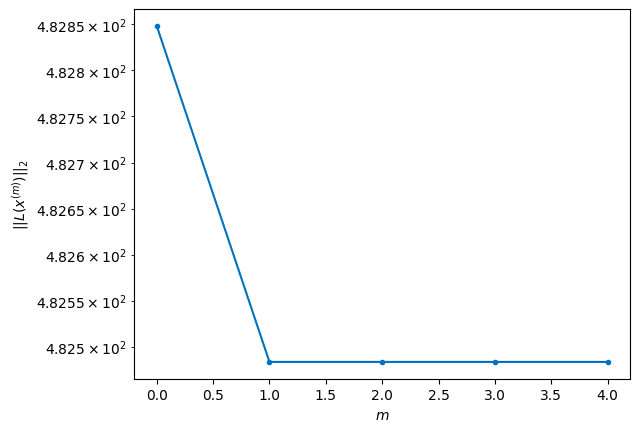

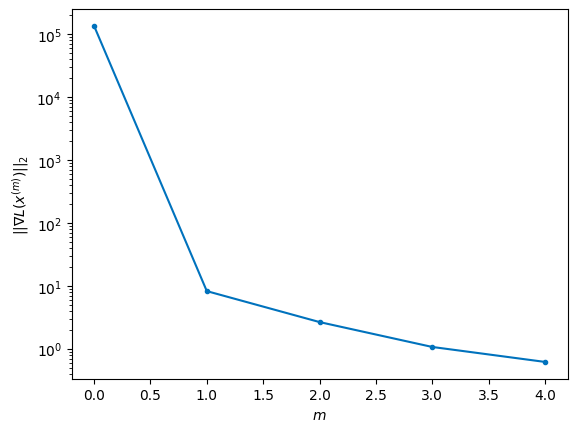


Windows:  19%|█▉        | 57/296 [11:23<45:13, 11.35s/it]

Before applying the algorithm
Cost function: 481.84976998734805
Gradient norm: 83119.81555170908
Global relative error: 1909649024.0405533
Position relative errors: 0.01392926788916096 m, 3.8192325096484914 m, 2795.9063612599894 m, 4194.575628972994 m

Iteration 1
Cost function: 481.26750776183974 (-0.12%)
Gradient norm: 4.167413808780552 (-99.99%)
Global relative error: 5041.2321574087155 (0.00%)
Position relative errors: 0.021842026160087586 m, 3.94507745981271 m, 2795.9950289462226 m, 4194.80122108039 m

Iteration 2
Cost function: 481.26750754066467 (-0.00%)
Gradient norm: 1.4446903479932567 (-65.33%)
Global relative error: 5041.232144182107 (-0.00%)
Position relative errors: 0.021842035619705734 m, 3.945071947919331 m, 2795.9950187895524 m, 4194.801211959907 m

Iteration 3
Cost function: 481.26750787003675 (0.00%)
Gradient norm: 1.8850709875175524 (30.48%)
Global relative error: 5041.232144183124 (0.00%)
Position relative errors: 0.02184202495969623 m, 3.945071946931242 m, 2795.995

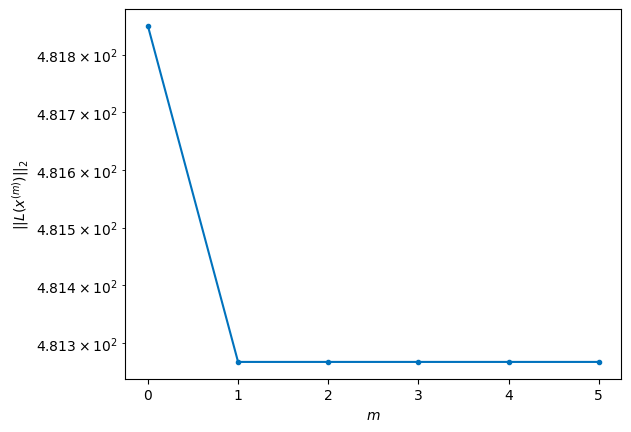

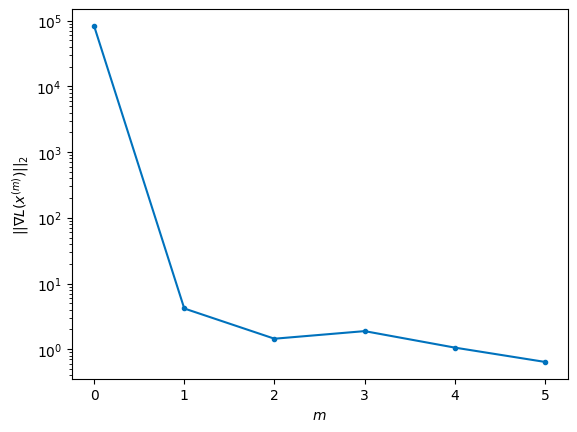


Windows:  20%|█▉        | 58/296 [11:35<46:12, 11.65s/it]

Before applying the algorithm
Cost function: 475.99367017030096
Gradient norm: 129990.14342566286
Global relative error: 1909614717.095319
Position relative errors: 0.021095971902888984 m, 3.776655011515792 m, 3048.850472774685 m, 4574.032486667438 m

Iteration 1
Cost function: 474.9078945922441 (-0.23%)
Gradient norm: 9.557217394950172 (-99.99%)
Global relative error: 5497.204054772052 (0.00%)
Position relative errors: 0.032217080656277305 m, 3.7071360480204563 m, 3048.931462905015 m, 4574.188541349574 m

Iteration 2
Cost function: 474.9078945023933 (-0.00%)
Gradient norm: 1.143268205183828 (-88.04%)
Global relative error: 5497.204061919591 (0.00%)
Position relative errors: 0.032217082893468085 m, 3.707133770845836 m, 3048.931458325635 m, 4574.188552993666 m

Iteration 3
Cost function: 474.90789436684844 (-0.00%)
Gradient norm: 2.234857309306314 (95.48%)
Global relative error: 5497.204061910706 (-0.00%)
Position relative errors: 0.0322170770035546 m, 3.7071337701306137 m, 3048.9314583

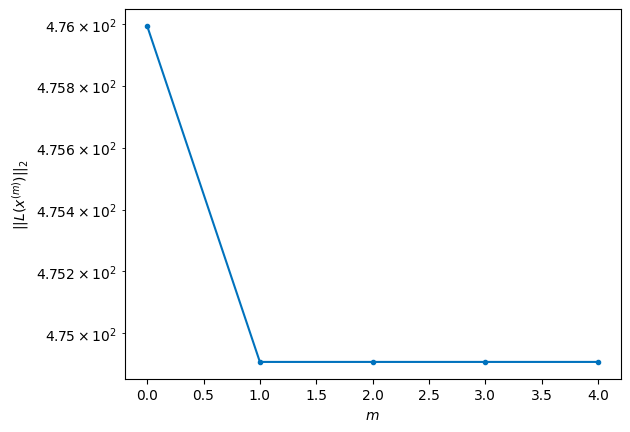

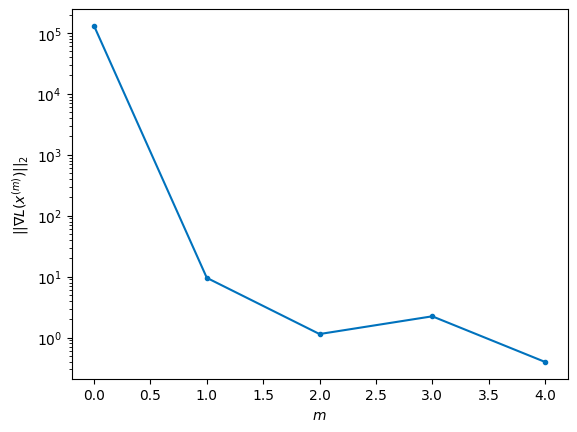


Windows:  20%|█▉        | 59/296 [11:44<42:56, 10.87s/it]

Before applying the algorithm
Cost function: 474.18448082162007
Gradient norm: 123223.4088838937
Global relative error: 1909537312.6665554
Position relative errors: 0.030824735313024956 m, 3.529025803793636 m, 3288.4697041950144 m, 4933.512304969515 m

Iteration 1
Cost function: 473.8230429857449 (-0.08%)
Gradient norm: 6.090915444198772 (-100.00%)
Global relative error: 5929.147344625768 (0.00%)
Position relative errors: 0.029527707134501677 m, 3.436553788059378 m, 3288.66893074211 m, 4933.496150406715 m

Iteration 2
Cost function: 473.8230432877444 (0.00%)
Gradient norm: 1.9587608596731305 (-67.84%)
Global relative error: 5929.14734600527 (0.00%)
Position relative errors: 0.029527705152049184 m, 3.43656705946181 m, 3288.6689065593882 m, 4933.496168175585 m

Iteration 3
Cost function: 473.8230433160551 (0.00%)
Gradient norm: 2.061762610742625 (5.26%)
Global relative error: 5929.147346019104 (0.00%)
Position relative errors: 0.029527702021956127 m, 3.436567065454217 m, 3288.66890656046

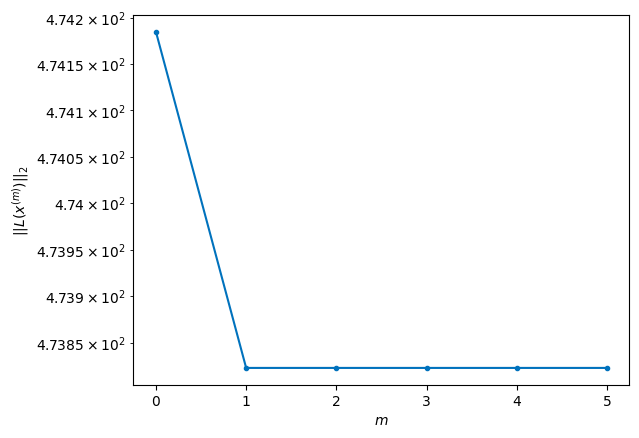

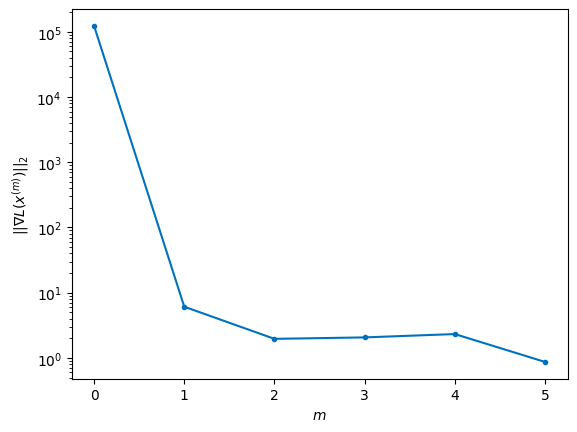


Windows:  20%|██        | 60/296 [11:55<42:38, 10.84s/it]

Before applying the algorithm
Cost function: 471.50641066925806
Gradient norm: 141326.88311584195
Global relative error: 1909417514.839093
Position relative errors: 0.02835814964523686 m, 3.2478555588011244 m, 3513.846849356073 m, 5271.3327983708605 m

Iteration 1
Cost function: 470.89857291447424 (-0.13%)
Gradient norm: 5.319011688051653 (-100.00%)
Global relative error: 6335.13837116718 (-0.00%)
Position relative errors: 0.031337760804215756 m, 3.246045359986226 m, 3513.9342502485756 m, 5271.260848927958 m

Iteration 2
Cost function: 470.89857315167376 (0.00%)
Gradient norm: 1.776291749320521 (-66.60%)
Global relative error: 6335.1383738289105 (0.00%)
Position relative errors: 0.03133776389690766 m, 3.2460389946478356 m, 3513.934244997008 m, 5271.260855631613 m

Iteration 3
Cost function: 470.89857314167284 (-0.00%)
Gradient norm: 3.071305272355349 (72.91%)
Global relative error: 6335.138373839285 (0.00%)
Position relative errors: 0.03133775115754309 m, 3.2460389959378437 m, 3513.934

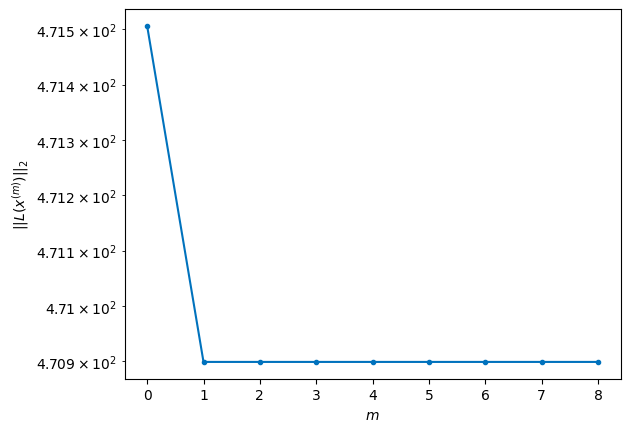

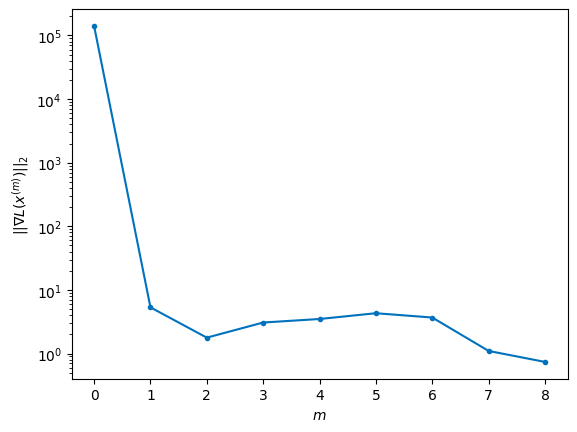


Windows:  21%|██        | 61/296 [12:11<48:08, 12.29s/it]

Before applying the algorithm
Cost function: 466.2367456475731
Gradient norm: 47796.95310874361
Global relative error: 1909256222.2576513
Position relative errors: 0.03013826727834 m, 3.044850123494647 m, 3723.777707780121 m, 5586.142553240568 m

Iteration 1
Cost function: 464.68806727246664 (-0.33%)
Gradient norm: 7.780291851425931 (-99.98%)
Global relative error: 6713.602307354081 (0.00%)
Position relative errors: 0.04290341563071244 m, 2.9274932657071995 m, 3723.728112646818 m, 5586.2563042448855 m

Iteration 2
Cost function: 464.6880674382703 (0.00%)
Gradient norm: 1.6650549496554548 (-78.60%)
Global relative error: 6713.602334154953 (0.00%)
Position relative errors: 0.04290342245806416 m, 2.927547667134154 m, 3723.728109428956 m, 5586.25633857088 m

Iteration 3
Cost function: 464.68806737800674 (-0.00%)
Gradient norm: 1.3490863288762671 (-18.98%)
Global relative error: 6713.602334162186 (0.00%)
Position relative errors: 0.0429034121141815 m, 2.9275476762276567 m, 3723.728109418418

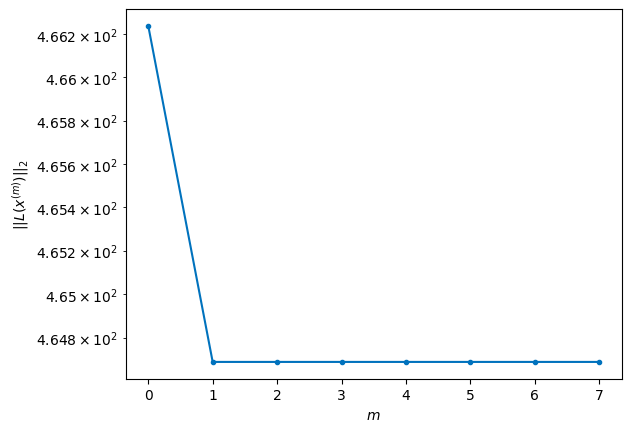

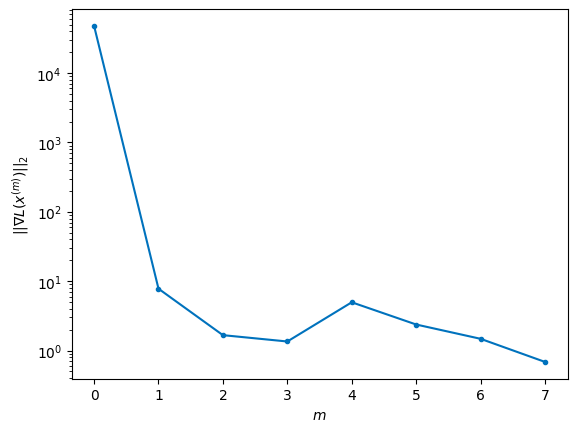


Windows:  21%|██        | 62/296 [12:26<51:02, 13.09s/it]

Before applying the algorithm
Cost function: 465.7008475987423
Gradient norm: 320389.5738422425
Global relative error: 1909054492.0887303
Position relative errors: 0.041201560917075795 m, 2.7240349875281265 m, 3917.323155954619 m, 5876.830664435545 m

Iteration 1
Cost function: 465.301083816559 (-0.09%)
Gradient norm: 4.2755968344682085 (-100.00%)
Global relative error: 7062.785127774142 (0.00%)
Position relative errors: 0.04481902134301731 m, 2.767467647428244 m, 3917.4452637575996 m, 5876.777834503236 m

Iteration 2
Cost function: 465.3010838478752 (0.00%)
Gradient norm: 1.2287190518134832 (-71.26%)
Global relative error: 7062.7851234277105 (-0.00%)
Position relative errors: 0.0448190295976467 m, 2.767460709449571 m, 3917.4452541890437 m, 5876.777835661278 m

Iteration 3
Cost function: 465.30108399861086 (0.00%)
Gradient norm: 2.9626333154781377 (141.12%)
Global relative error: 7062.7851234170075 (-0.00%)
Position relative errors: 0.044819027951757295 m, 2.767460710753055 m, 3917.445

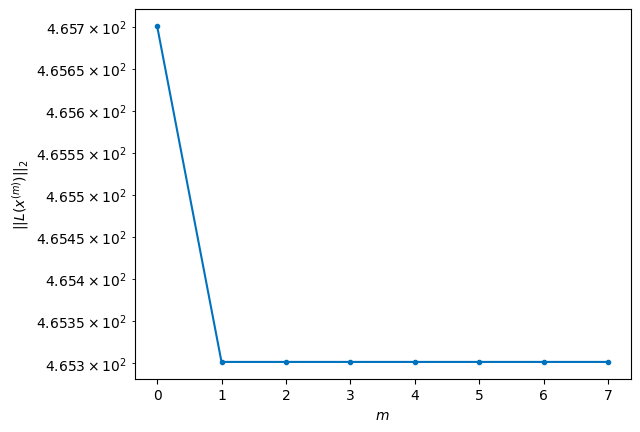

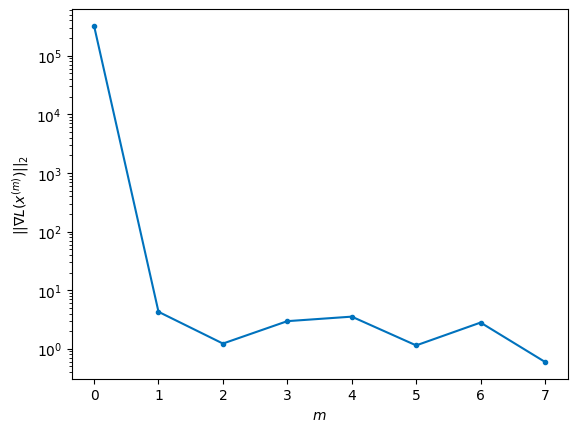


Windows:  21%|██▏       | 63/296 [12:40<51:57, 13.38s/it]

Before applying the algorithm
Cost function: 463.02819422014534
Gradient norm: 47271.606900383194
Global relative error: 1908813552.6330316
Position relative errors: 0.04301667958904525 m, 2.550879413418739 m, 4093.9495782475974 m, 6141.7502963129045 m

STOP on Iteration 1
Cost function = 462.728377789011 (-0.06%)
Gradient norm = 0.8574158859279543 (-100.00%)
Global relative error = 7381.219393706454 (0.00%)
Final position relative errors: 0.04358346653852451 m, 2.538476036879483 m, 4094.056556230614 m, 6141.74802361128 m



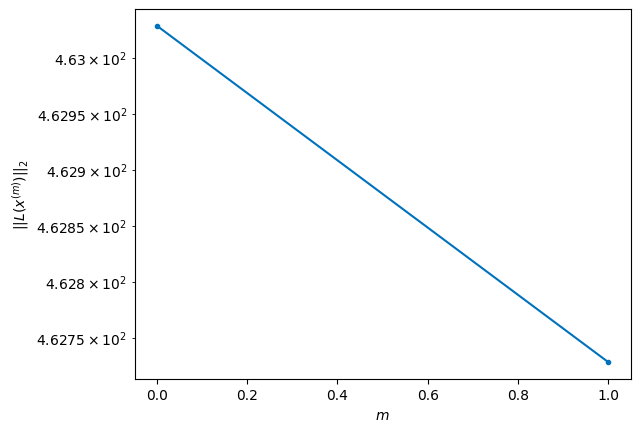

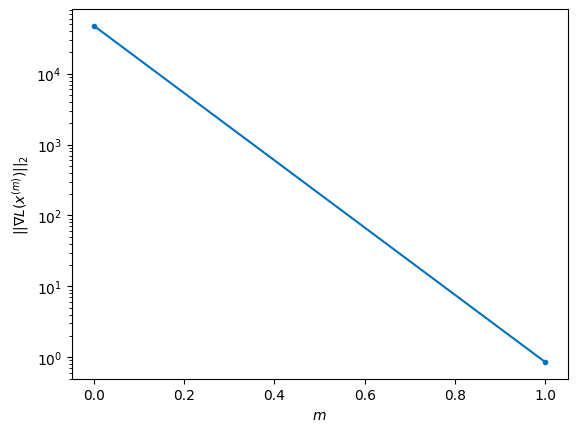


Windows:  22%|██▏       | 64/296 [12:43<40:44, 10.54s/it]

Before applying the algorithm
Cost function: 457.01539642975445
Gradient norm: 63531.213483133906
Global relative error: 1908534797.7147002
Position relative errors: 0.04198548976209103 m, 2.3093002718456477 m, 4252.706604528617 m, 6379.969183999129 m

Iteration 1
Cost function: 456.74608354814586 (-0.06%)
Gradient norm: 1.3714901332377594 (-100.00%)
Global relative error: 7667.457834046283 (0.00%)
Position relative errors: 0.041657531809555504 m, 2.3775724841523185 m, 4252.744600893275 m, 6379.972345951791 m

Iteration 2
Cost function: 456.74608349216265 (-0.00%)
Gradient norm: 1.5548855569988038 (13.37%)
Global relative error: 7667.457833297819 (-0.00%)
Position relative errors: 0.04165753685210616 m, 2.3775684895574303 m, 4252.744598930262 m, 6379.9723463622695 m

Iteration 3
Cost function: 456.74608352268774 (0.00%)
Gradient norm: 4.023472059401871 (158.76%)
Global relative error: 7667.457833316601 (0.00%)
Position relative errors: 0.04165752742653846 m, 2.377568494879201 m, 4252.7

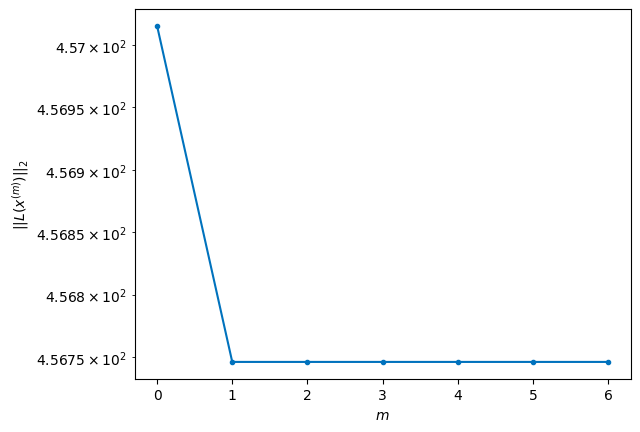

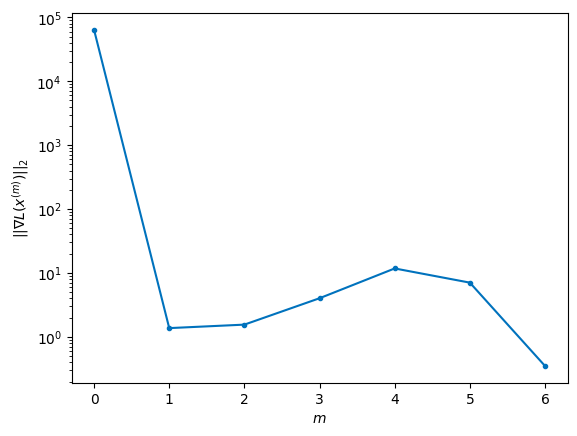


Windows:  22%|██▏       | 65/296 [12:58<45:00, 11.69s/it]

Before applying the algorithm
Cost function: 456.245768870445
Gradient norm: 338988.75512879266
Global relative error: 1908219736.1073632
Position relative errors: 0.040226957454354374 m, 2.1323895192849265 m, 4392.853103901568 m, 6590.409879845611 m

Iteration 1
Cost function: 455.4774552833073 (-0.17%)
Gradient norm: 5.210884376095434 (-100.00%)
Global relative error: 7920.230945517446 (-0.00%)
Position relative errors: 0.03154646759590283 m, 2.0937123262501394 m, 4392.941976919793 m, 6590.303422331582 m

Iteration 2
Cost function: 455.47745536700535 (0.00%)
Gradient norm: 1.9078646678805196 (-63.39%)
Global relative error: 7920.2309500114825 (0.00%)
Position relative errors: 0.03154647655501971 m, 2.093716872034653 m, 4392.941969964458 m, 6590.303432367341 m

Iteration 3
Cost function: 455.4774555079049 (0.00%)
Gradient norm: 2.9403509167334683 (54.12%)
Global relative error: 7920.230950025973 (0.00%)
Position relative errors: 0.03154647488612542 m, 2.0937168749806574 m, 4392.941969

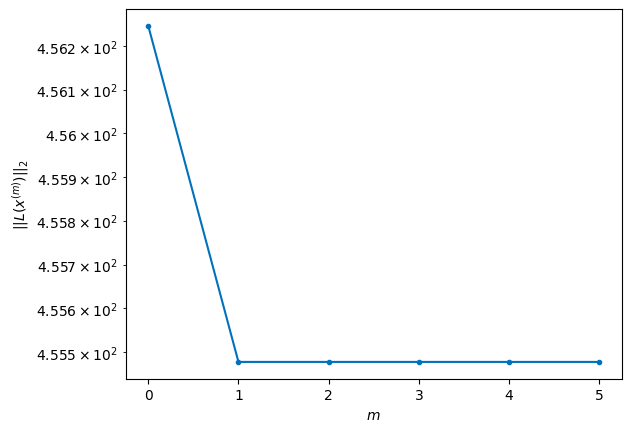

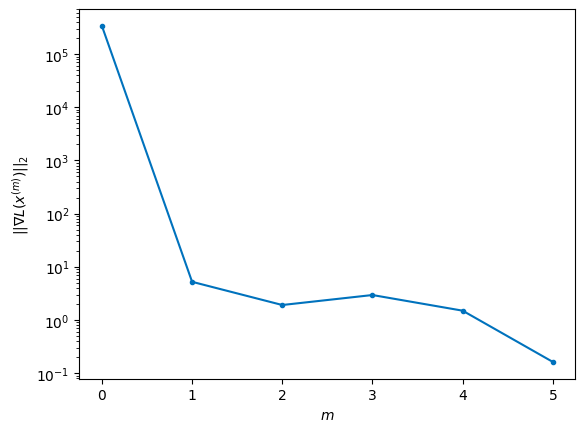


Windows:  22%|██▏       | 66/296 [13:08<43:29, 11.35s/it]

Before applying the algorithm
Cost function: 457.9053566714749
Gradient norm: 172148.73581460532
Global relative error: 1907870023.9087431
Position relative errors: 0.03126544142449153 m, 1.8405362191861707 m, 4513.899592928656 m, 6772.028165194002 m

Iteration 1
Cost function: 457.2634880288113 (-0.14%)
Gradient norm: 6.713447329686482 (-100.00%)
Global relative error: 8138.35581288683 (-0.00%)
Position relative errors: 0.03287896046294141 m, 1.8134006866415835 m, 4513.965271021977 m, 6771.775128356291 m

Iteration 2
Cost function: 457.26348766687397 (-0.00%)
Gradient norm: 2.9292458800133003 (-56.37%)
Global relative error: 8138.355793703667 (-0.00%)
Position relative errors: 0.03287896289174383 m, 1.8133998584925157 m, 4513.965279293842 m, 6771.775099788187 m

Iteration 3
Cost function: 457.2634881486902 (0.00%)
Gradient norm: 6.080620392726695 (107.58%)
Global relative error: 8138.355793698278 (-0.00%)
Position relative errors: 0.032878970310495116 m, 1.8133998527903008 m, 4513.965

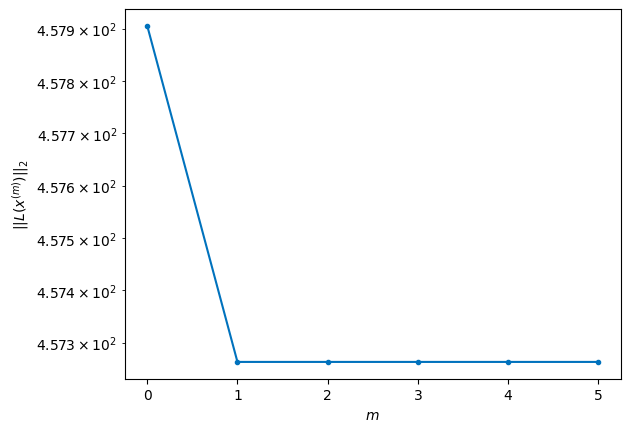

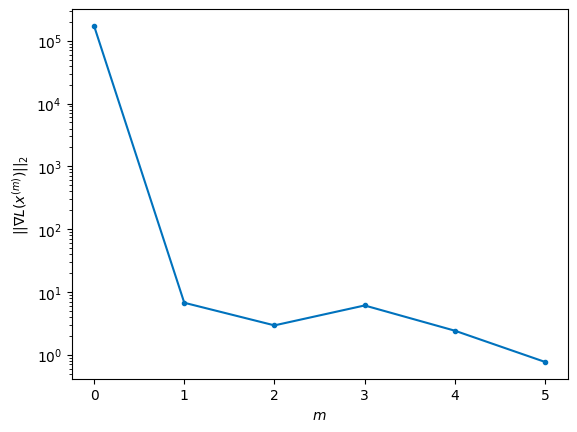


Windows:  23%|██▎       | 67/296 [13:19<42:05, 11.03s/it]

Before applying the algorithm
Cost function: 459.81001883996953
Gradient norm: 119980.19506795754
Global relative error: 1907487434.765101
Position relative errors: 0.03233502554102145 m, 1.546858100124849 m, 4615.251203801224 m, 6924.0009627938 m

Iteration 1
Cost function: 459.07257773450624 (-0.16%)
Gradient norm: 7.468272458107719 (-99.99%)
Global relative error: 8321.0025311606 (-0.00%)
Position relative errors: 0.034013050817379945 m, 1.461777091131344 m, 4615.306958894695 m, 6923.72841138659 m

Iteration 2
Cost function: 459.072577553636 (-0.00%)
Gradient norm: 3.1814512402690003 (-57.40%)
Global relative error: 8321.00253124577 (0.00%)
Position relative errors: 0.03401303631943587 m, 1.4617767735702294 m, 4615.306955394961 m, 6923.72841382192 m

STOP on Iteration 3
Cost function = 459.07257765118356 (0.00%)
Gradient norm = 0.06957119095003755 (-97.81%)
Global relative error = 8321.002531234204 (-0.00%)
Final position relative errors: 0.03401304231443154 m, 1.4617767716423822 m,

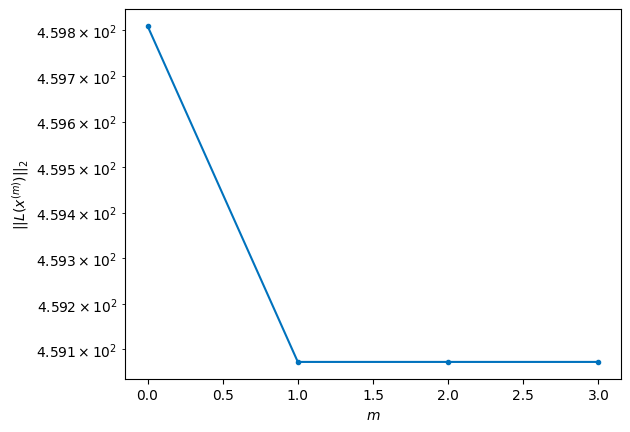

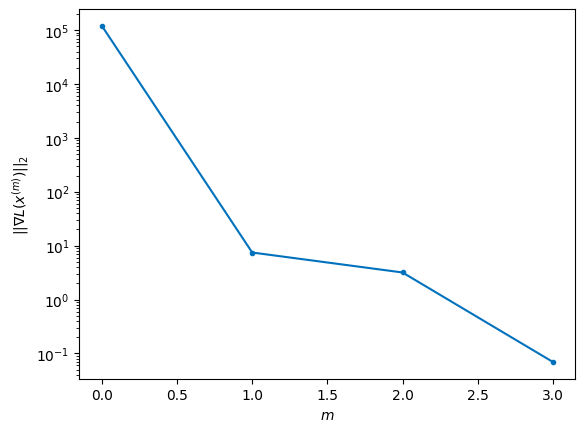


Windows:  23%|██▎       | 68/296 [13:27<38:27, 10.12s/it]

Before applying the algorithm
Cost function: 463.34588879539535
Gradient norm: 97244.39201718959
Global relative error: 1907073824.146265
Position relative errors: 0.03344174272427932 m, 1.1871520597649852 m, 4696.483000143862 m, 7045.777251184796 m

Iteration 1
Cost function: 462.82528827992223 (-0.11%)
Gradient norm: 5.2886888304280575 (-99.99%)
Global relative error: 8467.398274591178 (-0.00%)
Position relative errors: 0.035709815567151124 m, 1.150144448270703 m, 4696.5870477327835 m, 7045.48775828888 m

Iteration 2
Cost function: 462.8252884819837 (0.00%)
Gradient norm: 2.781358898444315 (-47.41%)
Global relative error: 8467.39824960978 (-0.00%)
Position relative errors: 0.035709821356459864 m, 1.1501487277275577 m, 4696.587050772398 m, 7045.48772623884 m

Iteration 3
Cost function: 462.82528819606614 (-0.00%)
Gradient norm: 2.839827887248964 (2.10%)
Global relative error: 8467.398249613705 (0.00%)
Position relative errors: 0.03570981898547163 m, 1.150148729058173 m, 4696.587050768

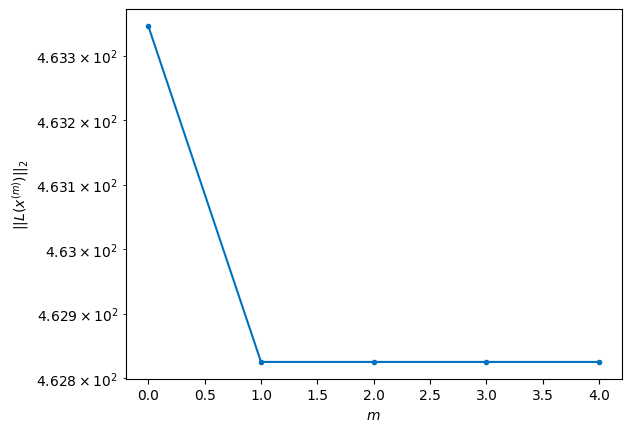

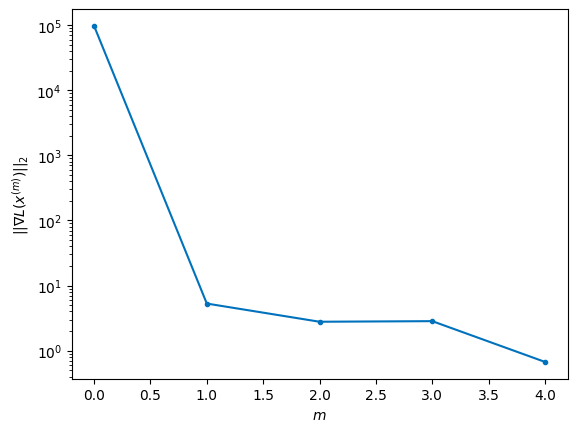


Windows:  23%|██▎       | 69/296 [13:36<37:03,  9.80s/it]

Before applying the algorithm
Cost function: 471.1876254176855
Gradient norm: 344985.3960878984
Global relative error: 1906631166.5365257
Position relative errors: 0.034549657758471 m, 0.8644342609914986 m, 4757.294721577039 m, 7136.850136213305 m

Iteration 1
Cost function: 468.67147284042795 (-0.53%)
Gradient norm: 20.04180343392551 (-99.99%)
Global relative error: 8577.004072663573 (-0.00%)
Position relative errors: 0.023917589857657764 m, 0.9579647935639454 m, 4757.428932269241 m, 7136.656471801509 m

Iteration 2
Cost function: 468.67147289589377 (0.00%)
Gradient norm: 2.644790206935445 (-86.80%)
Global relative error: 8577.00410978967 (0.00%)
Position relative errors: 0.023917586558027434 m, 0.9579724501596201 m, 4757.428936396111 m, 7136.656513668468 m

Iteration 3
Cost function: 468.67147231872354 (-0.00%)
Gradient norm: 4.777224428820486 (80.63%)
Global relative error: 8577.004109797053 (0.00%)
Position relative errors: 0.023917588332006183 m, 0.9579724528813304 m, 4757.4289363

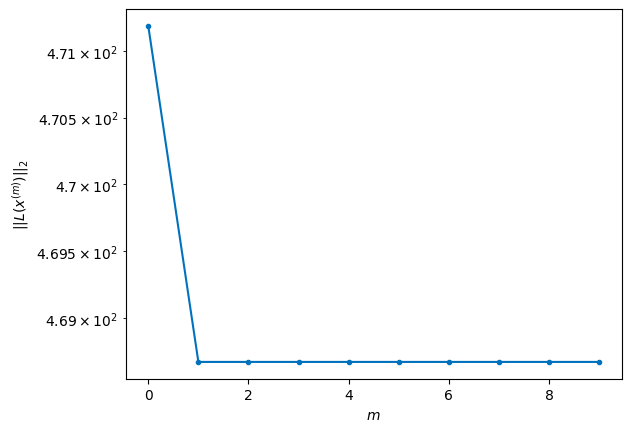

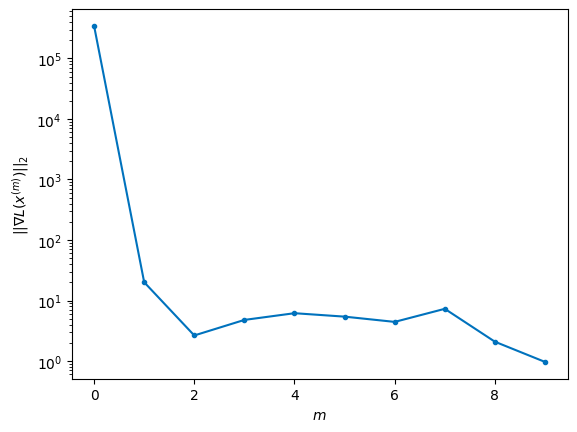


Windows:  24%|██▎       | 70/296 [13:53<45:04, 11.97s/it]

Before applying the algorithm
Cost function: 470.62311378015363
Gradient norm: 150816.05111333574
Global relative error: 1906161498.0765398
Position relative errors: 0.0238138766665373 m, 0.646836714209015 m, 4797.403787528177 m, 7196.887049044025 m

Iteration 1
Cost function: 470.3600038348048 (-0.06%)
Gradient norm: 2.0254093593108045 (-100.00%)
Global relative error: 8649.25363137725 (-0.00%)
Position relative errors: 0.027001581389698912 m, 0.6956546679503035 m, 4797.443423031053 m, 7196.813440912306 m

Iteration 2
Cost function: 470.36000379846206 (-0.00%)
Gradient norm: 2.63185986288174 (29.94%)
Global relative error: 8649.253629007737 (-0.00%)
Position relative errors: 0.027001580318705025 m, 0.6956576952372509 m, 4797.443423891781 m, 7196.813437490525 m

Iteration 3
Cost function: 470.360003625312 (-0.00%)
Gradient norm: 1.4596481076353482 (-44.54%)
Global relative error: 8649.253628992576 (-0.00%)
Position relative errors: 0.02700158044768281 m, 0.6956576922666727 m, 4797.4434

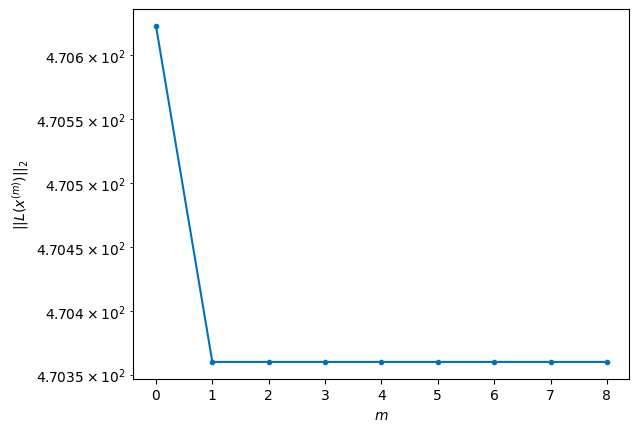

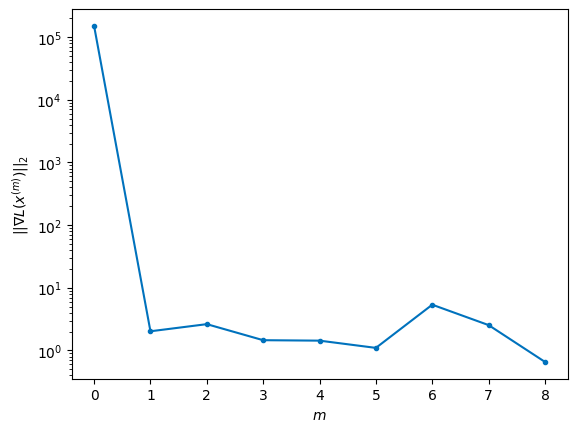


Windows:  24%|██▍       | 71/296 [14:08<48:47, 13.01s/it]

Before applying the algorithm
Cost function: 474.5059089569959
Gradient norm: 94813.44668705789
Global relative error: 1905666938.4286273
Position relative errors: 0.02693582167010757 m, 0.3784725386856392 m, 4816.507966434177 m, 7225.699235652098 m

Iteration 1
Cost function: 473.64725982628 (-0.18%)
Gradient norm: 5.80913215966798 (-99.99%)
Global relative error: 8683.781725174242 (-0.00%)
Position relative errors: 0.029064774162818153 m, 0.324078002337914 m, 4816.5853051983095 m, 7225.549866550622 m

Iteration 2
Cost function: 473.6472597993753 (-0.00%)
Gradient norm: 6.435892883030983 (10.79%)
Global relative error: 8683.781736350957 (0.00%)
Position relative errors: 0.02906477385927452 m, 0.32407618460285664 m, 4816.585306610838 m, 7225.549879041462 m

Iteration 3
Cost function: 473.64726001085296 (0.00%)
Gradient norm: 6.216937233106643 (-3.40%)
Global relative error: 8683.781736364475 (0.00%)
Position relative errors: 0.0290647739716235 m, 0.3240761874655255 m, 4816.585306606303

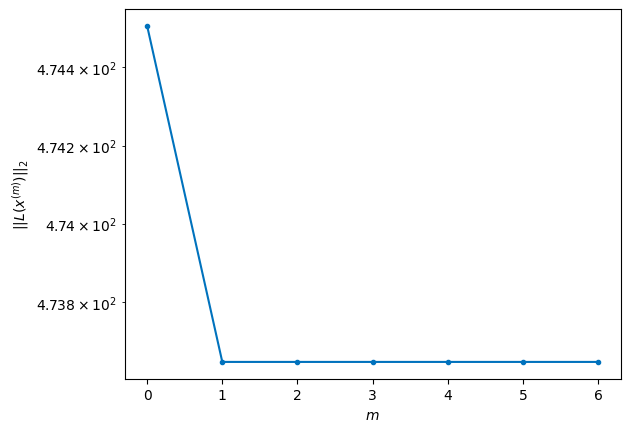

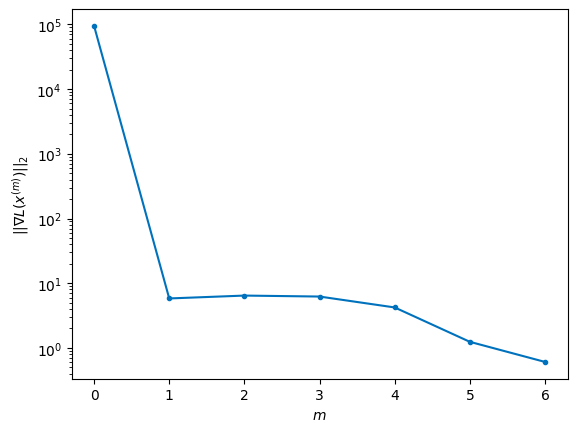


Windows:  24%|██▍       | 72/296 [14:20<47:24, 12.70s/it]

Before applying the algorithm
Cost function: 474.2080264603043
Gradient norm: 80035.40092751627
Global relative error: 1905149656.0846555
Position relative errors: 0.028862555643644577 m, 0.11950337606740434 m, 4814.656928742625 m, 7222.931475468156 m

Iteration 1
Cost function: 473.92488495765275 (-0.06%)
Gradient norm: 2.783837053501923 (-100.00%)
Global relative error: 8680.495562339109 (-0.00%)
Position relative errors: 0.03009031362110975 m, 0.17898783560317394 m, 4814.672769985889 m, 7222.875407766973 m

Iteration 2
Cost function: 473.92488463337736 (-0.00%)
Gradient norm: 3.5094648420682444 (26.07%)
Global relative error: 8680.495563581506 (0.00%)
Position relative errors: 0.03009031362177587 m, 0.17898618454746623 m, 4814.672768469561 m, 7222.875410270898 m

Iteration 3
Cost function: 473.9248845338693 (-0.00%)
Gradient norm: 3.1132901723455433 (-11.29%)
Global relative error: 8680.49556359661 (0.00%)
Position relative errors: 0.030090313272228563 m, 0.17898619141401684 m, 4814

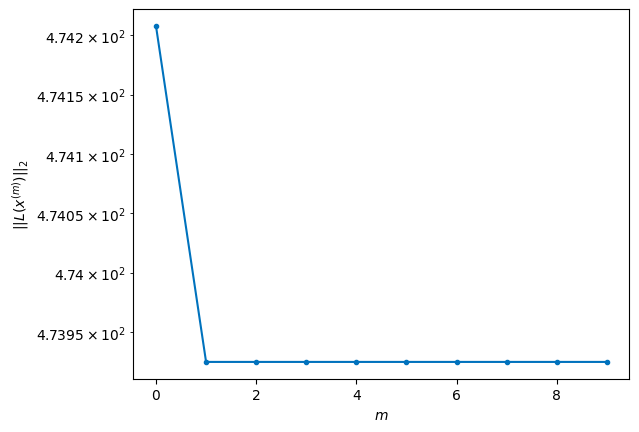

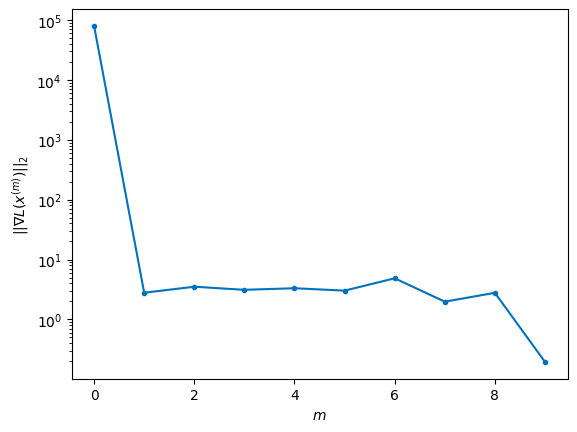


Windows:  25%|██▍       | 73/296 [14:38<52:41, 14.18s/it]

Before applying the algorithm
Cost function: 476.4103653255624
Gradient norm: 73001.71589727263
Global relative error: 1904611873.6674433
Position relative errors: 0.02982284272458656 m, 0.4527542319063482 m, 4791.761297463856 m, 7188.784060145214 m

Iteration 1
Cost function: 475.80191388362766 (-0.13%)
Gradient norm: 3.3188583960427116 (-100.00%)
Global relative error: 8639.504719530027 (0.00%)
Position relative errors: 0.030735272386956582 m, 0.525832927534218 m, 4791.841109973451 m, 7188.831567045788 m

STOP on Iteration 2
Cost function = 475.80191416130407 (0.00%)
Gradient norm = 0.3399273411283005 (-89.76%)
Global relative error = 8639.50472053614 (0.00%)
Final position relative errors: 0.03073527032619618 m, 0.5258335224233541 m, 4791.841111144774 m, 7188.83156747412 m



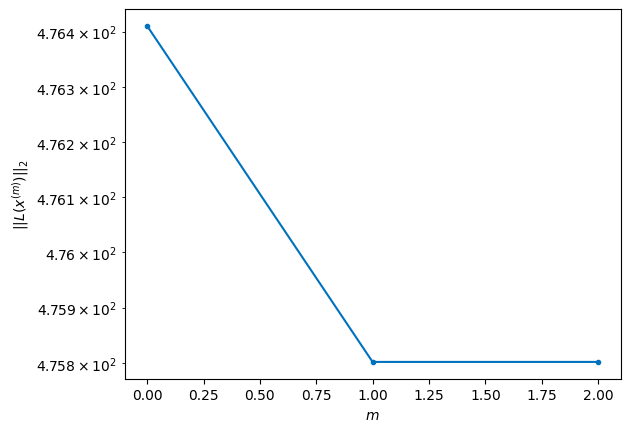

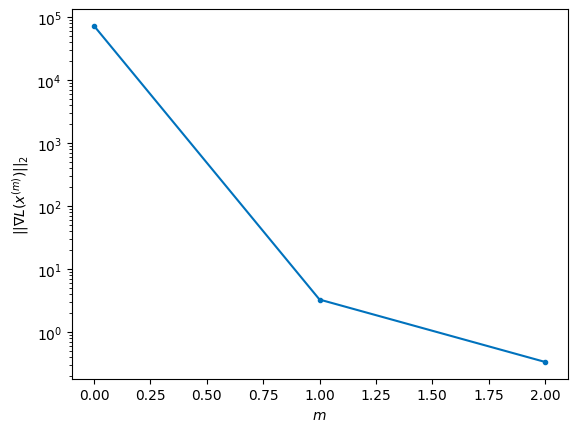


Windows:  25%|██▌       | 74/296 [14:43<42:41, 11.54s/it]

Before applying the algorithm
Cost function: 480.8695050642018
Gradient norm: 87078.7136577344
Global relative error: 1904055861.8968432
Position relative errors: 0.030264448635650372 m, 0.8689973625984172 m, 4748.0344846757935 m, 7123.397127075154 m

Iteration 1
Cost function: 480.1810837747945 (-0.14%)
Gradient norm: 3.943996063041035 (-100.00%)
Global relative error: 8560.671901124535 (-0.00%)
Position relative errors: 0.0315948860846153 m, 0.9096202585133464 m, 4748.083171441067 m, 7123.258111796757 m

Iteration 2
Cost function: 480.1810837234775 (-0.00%)
Gradient norm: 3.1774397837691457 (-19.44%)
Global relative error: 8560.671912998418 (0.00%)
Position relative errors: 0.031594885684949205 m, 0.9096142322776422 m, 4748.083168215211 m, 7123.258128217685 m

Iteration 3
Cost function: 480.1810837078184 (-0.00%)
Gradient norm: 4.1155195677022816 (29.52%)
Global relative error: 8560.671912998621 (0.00%)
Position relative errors: 0.0315948836832469 m, 0.9096142291690281 m, 4748.083168

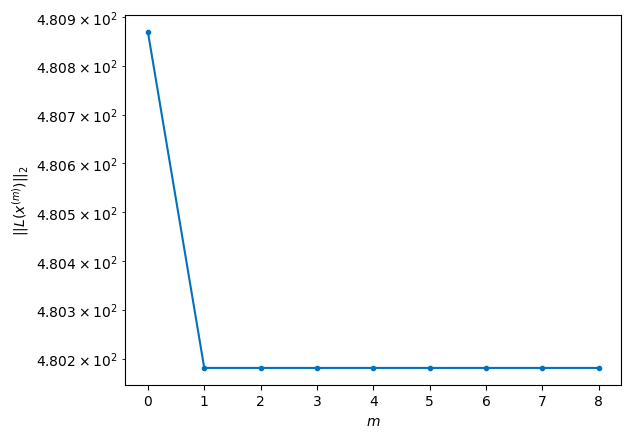

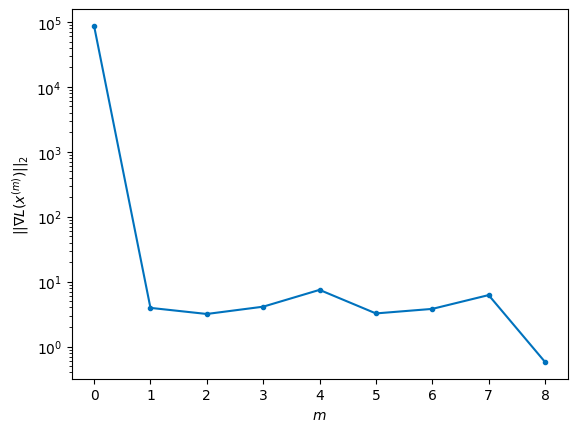


Windows:  25%|██▌       | 75/296 [14:59<47:28, 12.89s/it]

Before applying the algorithm
Cost function: 476.88366222619226
Gradient norm: 68189.39267655007
Global relative error: 1903483914.247113
Position relative errors: 0.030905671381760452 m, 1.2509357303127318 m, 4683.572345709763 m, 7026.757290651291 m

Iteration 1
Cost function: 476.4875494289957 (-0.08%)
Gradient norm: 5.262737969111502 (-99.99%)
Global relative error: 8444.605242230302 (0.00%)
Position relative errors: 0.021272089397304534 m, 1.2192374933952963 m, 4683.434687104795 m, 7026.862081311939 m

Iteration 2
Cost function: 476.48754899578523 (-0.00%)
Gradient norm: 1.2097873539526114 (-77.01%)
Global relative error: 8444.60524156841 (-0.00%)
Position relative errors: 0.02127208650585725 m, 1.2192323851581002 m, 4683.434673444814 m, 7026.862089621824 m

Iteration 3
Cost function: 476.487549462655 (0.00%)
Gradient norm: 2.25501071978723 (86.40%)
Global relative error: 8444.60524159673 (0.00%)
Position relative errors: 0.021272084895186356 m, 1.2192323803737362 m, 4683.434673438

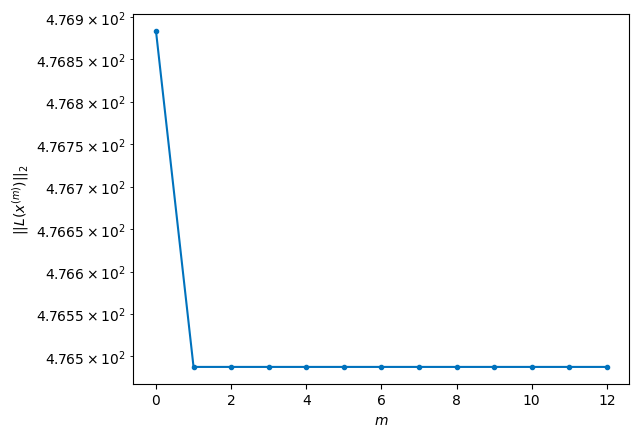

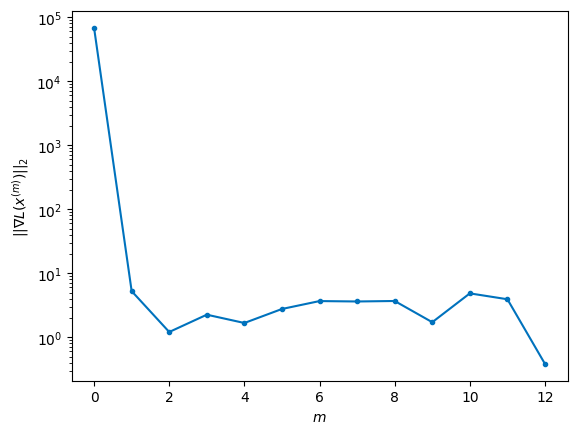


Windows:  26%|██▌       | 76/296 [15:23<58:57, 16.08s/it]

Before applying the algorithm
Cost function: 479.1236608219636
Gradient norm: 156851.40452606647
Global relative error: 1902898352.937575
Position relative errors: 0.02054032215526389 m, 1.553607103439928 m, 4598.48893108986 m, 6899.724057695281 m

Iteration 1
Cost function: 477.5640425136329 (-0.33%)
Gradient norm: 21.652293091269822 (-99.99%)
Global relative error: 8291.843187965658 (0.00%)
Position relative errors: 0.019220224990252634 m, 1.6697785403963288 m, 4598.535181567003 m, 6899.864253210677 m

Iteration 2
Cost function: 477.5640424814523 (-0.00%)
Gradient norm: 1.1630151123909398 (-94.63%)
Global relative error: 8291.843210206838 (0.00%)
Position relative errors: 0.01922022487193476 m, 1.6697530671909084 m, 4598.535164801095 m, 6899.8642911188945 m

Iteration 3
Cost function: 477.5640427216656 (0.00%)
Gradient norm: 2.9666970145067166 (155.09%)
Global relative error: 8291.84321021366 (0.00%)
Position relative errors: 0.0192202259914296 m, 1.6697530711077984 m, 4598.535164800

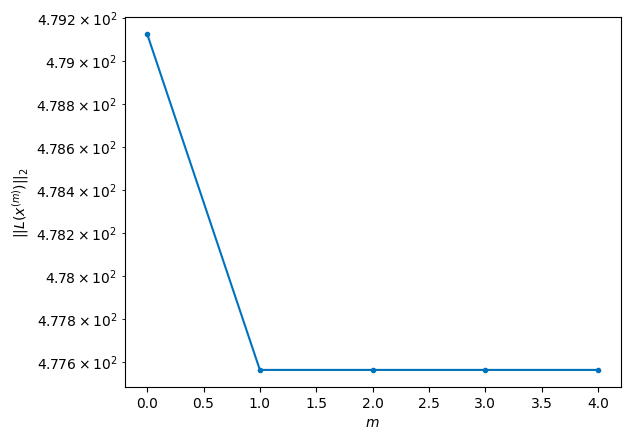

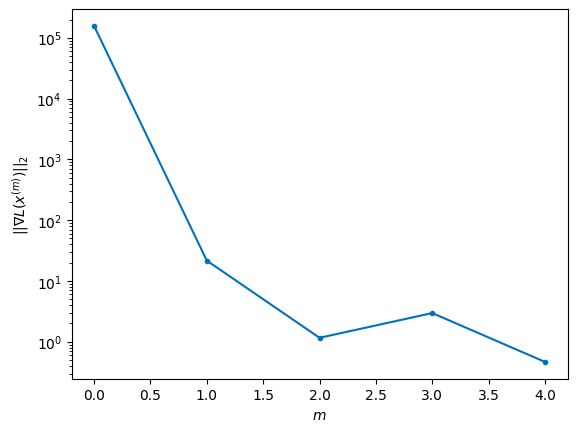


Windows:  26%|██▌       | 77/296 [15:32<50:49, 13.93s/it]

Before applying the algorithm
Cost function: 474.3910501533581
Gradient norm: 346552.08151710004
Global relative error: 1902301509.8334682
Position relative errors: 0.018294262900657988 m, 2.019895047827232 m, 4493.536600943247 m, 6742.587509744777 m

Iteration 1
Cost function: 473.67265393714524 (-0.15%)
Gradient norm: 7.13980035023836 (-100.00%)
Global relative error: 8102.976432916066 (0.00%)
Position relative errors: 0.02566045528475552 m, 1.9889154574031929 m, 4493.464916261147 m, 6742.92104850595 m

Iteration 2
Cost function: 473.6726534315603 (-0.00%)
Gradient norm: 2.654805035100491 (-62.82%)
Global relative error: 8102.976401677886 (-0.00%)
Position relative errors: 0.025660446702126524 m, 1.9889045889026413 m, 4493.464913194885 m, 6742.92101301356 m

Iteration 3
Cost function: 473.67265367908584 (0.00%)
Gradient norm: 3.1951012570607156 (20.35%)
Global relative error: 8102.9764016964145 (0.00%)
Position relative errors: 0.025660452110467098 m, 1.9889045872769733 m, 4493.46491

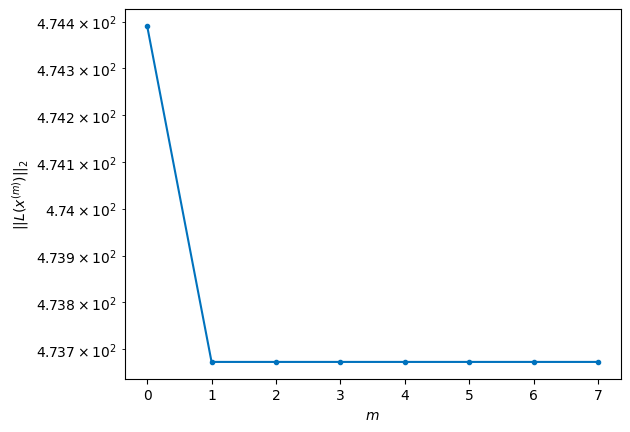

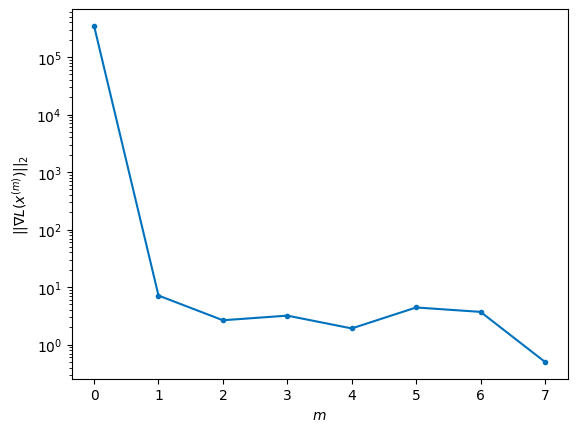


Windows:  26%|██▋       | 78/296 [15:45<50:17, 13.84s/it]

Before applying the algorithm
Cost function: 473.026800121979
Gradient norm: 85676.8780292128
Global relative error: 1901695756.551654
Position relative errors: 0.024667734529040048 m, 2.325228259070379 m, 4368.847187173759 m, 6556.221849643942 m

Iteration 1
Cost function: 472.85802703720486 (-0.04%)
Gradient norm: 1.6306964546756342 (-100.00%)
Global relative error: 7878.514394186252 (0.00%)
Position relative errors: 0.03172860787868027 m, 2.4012807076833393 m, 4368.853401641859 m, 6556.225057235733 m

Iteration 2
Cost function: 472.8580266950291 (-0.00%)
Gradient norm: 4.408201981087154 (170.33%)
Global relative error: 7878.514390593076 (-0.00%)
Position relative errors: 0.03172860719166235 m, 2.4012848585617843 m, 4368.853402242089 m, 6556.225052516374 m

Iteration 3
Cost function: 472.8580272840325 (0.00%)
Gradient norm: 6.947115979364848 (57.60%)
Global relative error: 7878.514390604423 (0.00%)
Position relative errors: 0.031728610493832334 m, 2.401284861699548 m, 4368.8534022411

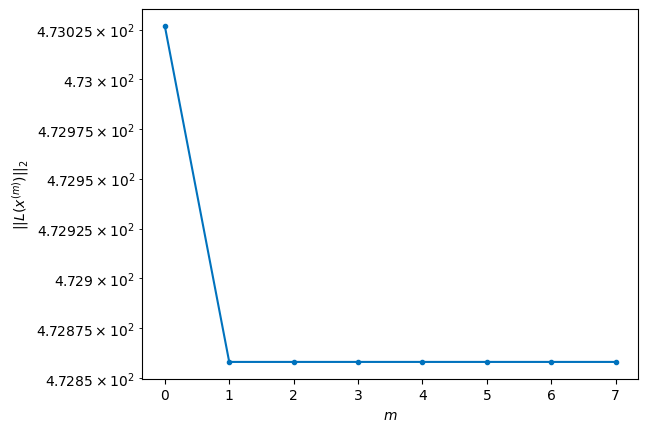

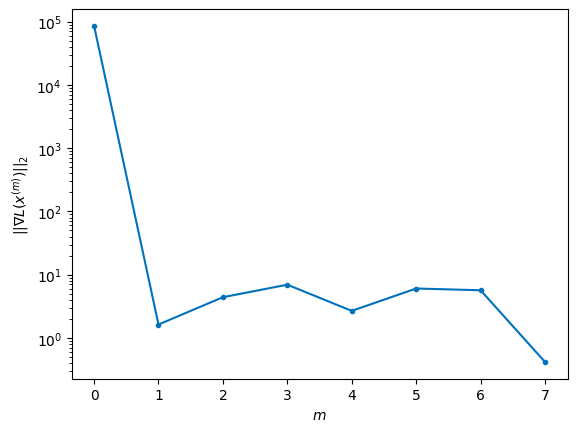


Windows:  27%|██▋       | 79/296 [16:00<51:02, 14.11s/it]

Before applying the algorithm
Cost function: 469.38097386731016
Gradient norm: 93467.70848672614
Global relative error: 1901083438.1773784
Position relative errors: 0.030548704120291415 m, 2.7328263429209794 m, 4225.162671835929 m, 6340.913445712241 m

Iteration 1
Cost function: 468.7588216410409 (-0.13%)
Gradient norm: 10.067928625546438 (-99.99%)
Global relative error: 7619.871341331248 (0.00%)
Position relative errors: 0.022818377024430337 m, 2.645255335725321 m, 4224.985943428374 m, 6341.285746948172 m

Iteration 2
Cost function: 468.7588217583032 (0.00%)
Gradient norm: 7.4935764309881865 (-25.57%)
Global relative error: 7619.871314036684 (-0.00%)
Position relative errors: 0.0228183740129438 m, 2.645243639248128 m, 4224.985933409098 m, 6341.2857208306405 m

Iteration 3
Cost function: 468.7588215873939 (-0.00%)
Gradient norm: 3.5795567419435317 (-52.23%)
Global relative error: 7619.871314027625 (-0.00%)
Position relative errors: 0.022818372965794382 m, 2.645243637236823 m, 4224.9859

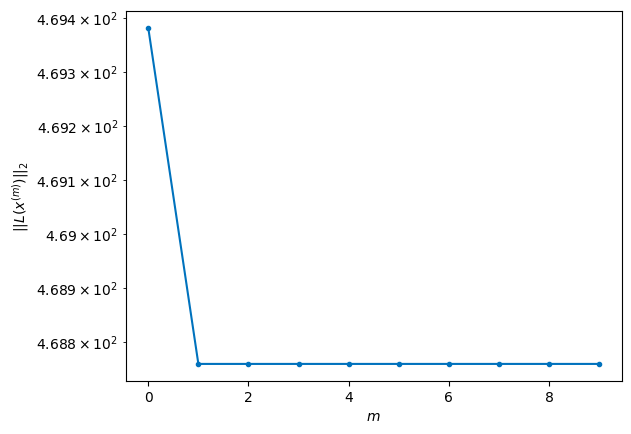

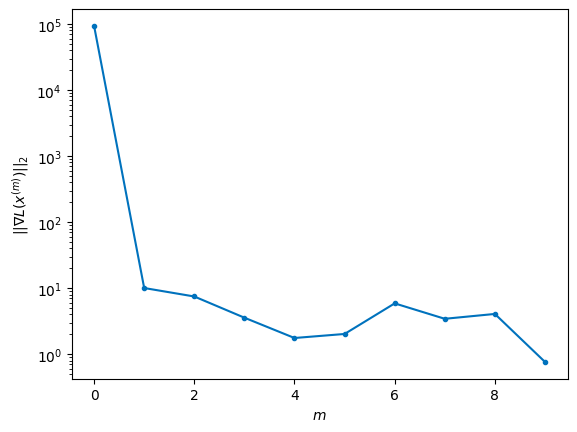


Windows:  27%|██▋       | 80/296 [16:17<54:14, 15.07s/it]

Before applying the algorithm
Cost function: 468.44587767564144
Gradient norm: 98474.18258683808
Global relative error: 1900466917.4213073
Position relative errors: 0.021992692050069523 m, 2.9667904499396727 m, 4062.8332071630803 m, 6098.287352310598 m

Iteration 1
Cost function: 467.7671903176152 (-0.14%)
Gradient norm: 6.681166942088675 (-99.99%)
Global relative error: 7327.950875137892 (0.00%)
Position relative errors: 0.021801975465819426 m, 2.783041826428042 m, 4062.574227449859 m, 6098.7146610069785 m

STOP on Iteration 2
Cost function = 467.7671898516333 (-0.00%)
Gradient norm = 0.7518148438922393 (-88.75%)
Global relative error = 7327.950834410921 (-0.00%)
Final position relative errors: 0.02180197360295985 m, 2.7830191336048395 m, 4062.5742078004682 m, 6098.714625170734 m



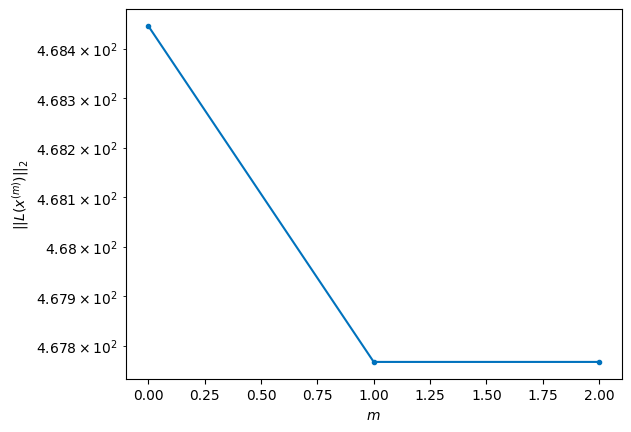

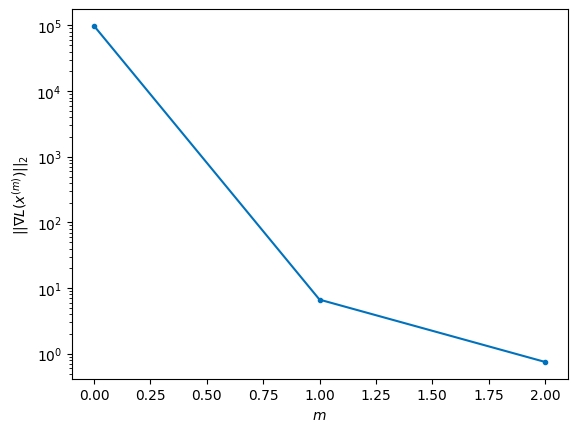


Windows:  27%|██▋       | 81/296 [16:23<44:07, 12.32s/it]

Before applying the algorithm
Cost function: 466.020001910149
Gradient norm: 40810.34906351564
Global relative error: 1899848545.4728682
Position relative errors: 0.020917029195372014 m, 3.0982565724502065 m, 3882.667383008359 m, 5829.086822148291 m

Iteration 1
Cost function: 465.14769719016977 (-0.19%)
Gradient norm: 9.640948280310987 (-99.98%)
Global relative error: 7004.185065412359 (0.01%)
Position relative errors: 0.024769481864252322 m, 3.139877518955895 m, 3882.7112573950467 m, 5829.504250715838 m

Iteration 2
Cost function: 465.1476968873434 (-0.00%)
Gradient norm: 6.918536663129774 (-28.24%)
Global relative error: 7004.184976685536 (-0.00%)
Position relative errors: 0.02476947616357126 m, 3.139869534867504 m, 3882.7112680934915 m, 5829.5041369887 m

Iteration 3
Cost function: 465.14769687266545 (-0.00%)
Gradient norm: 2.5063552191003744 (-63.77%)
Global relative error: 7004.184976693409 (0.00%)
Position relative errors: 0.024769480815328284 m, 3.139869538905726 m, 3882.711268

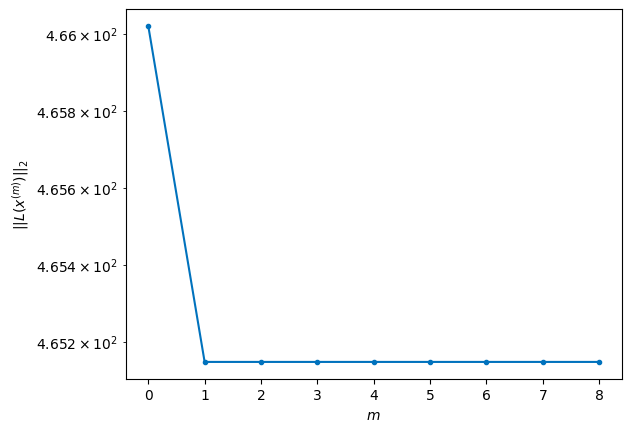

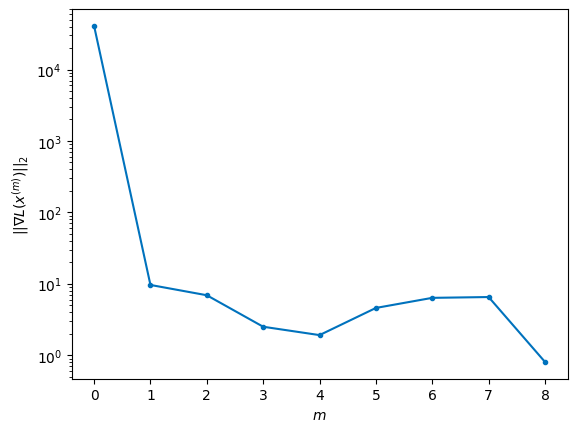


Windows:  28%|██▊       | 82/296 [16:39<47:07, 13.21s/it]

Before applying the algorithm
Cost function: 466.31987811297284
Gradient norm: 79375.6556537241
Global relative error: 1899230681.8901236
Position relative errors: 0.02378279043454117 m, 3.4441572389909907 m, 3685.8339078006 m, 5534.399216694028 m

Iteration 1
Cost function: 465.67922277768133 (-0.14%)
Gradient norm: 5.849298024637836 (-99.99%)
Global relative error: 6649.577839817134 (0.00%)
Position relative errors: 0.02089167894727536 m, 3.3099843232031314 m, 3685.641507615298 m, 5534.698115875803 m

STOP on Iteration 2
Cost function = 465.67922258168073 (-0.00%)
Gradient norm = 0.6251397494797915 (-89.31%)
Global relative error = 6649.577826053311 (-0.00%)
Final position relative errors: 0.02089167697801324 m, 3.309980504252464 m, 3685.641498235451 m, 5534.698105587939 m



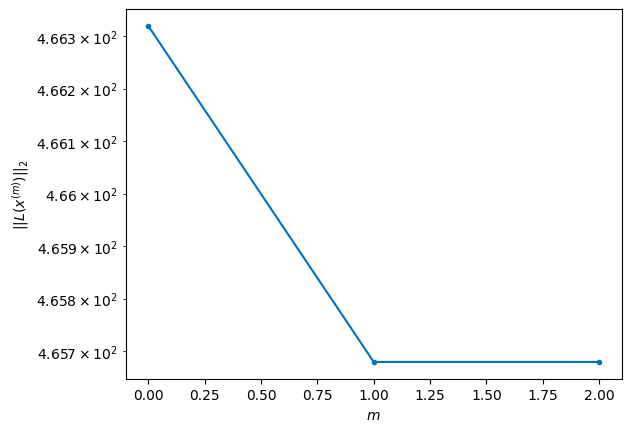

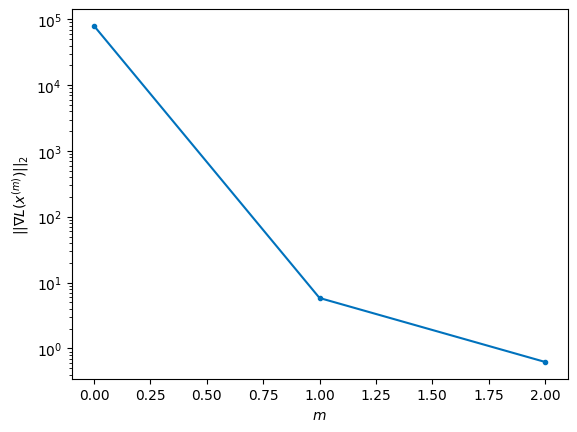


Windows:  28%|██▊       | 83/296 [16:44<39:06, 11.02s/it]

Before applying the algorithm
Cost function: 467.61425793235475
Gradient norm: 475597.1986793321
Global relative error: 1898615657.0048645
Position relative errors: 0.019947295588560857 m, 3.5985474671668336 m, 3472.638442311377 m, 5215.417227451711 m

Iteration 1
Cost function: 466.98892544241994 (-0.13%)
Gradient norm: 7.092701354007443 (-100.00%)
Global relative error: 6265.996100602721 (0.00%)
Position relative errors: 0.018508192236269497 m, 3.67937664824699 m, 3472.521022883077 m, 5215.769107515506 m

Iteration 2
Cost function: 466.9889253395134 (-0.00%)
Gradient norm: 4.8909171728828955 (-31.04%)
Global relative error: 6265.9960348597 (-0.00%)
Position relative errors: 0.018508190409238824 m, 3.679364559748616 m, 3472.5210276252174 m, 5215.769025386082 m

STOP on Iteration 3
Cost function = 466.9889257469392 (0.00%)
Gradient norm = 0.11621773610369669 (-97.62%)
Global relative error = 6265.996034867417 (0.00%)
Final position relative errors: 0.01850819143849266 m, 3.679364572040

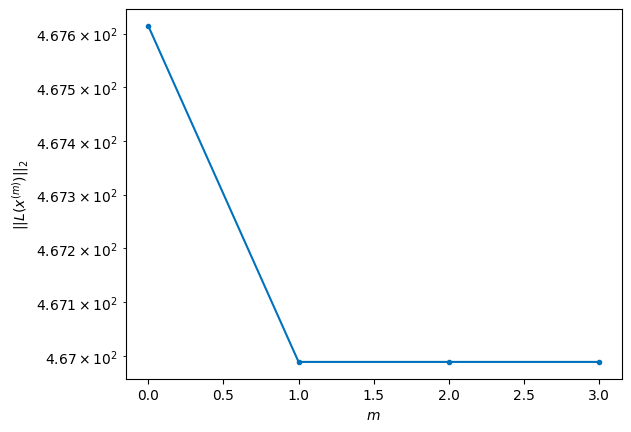

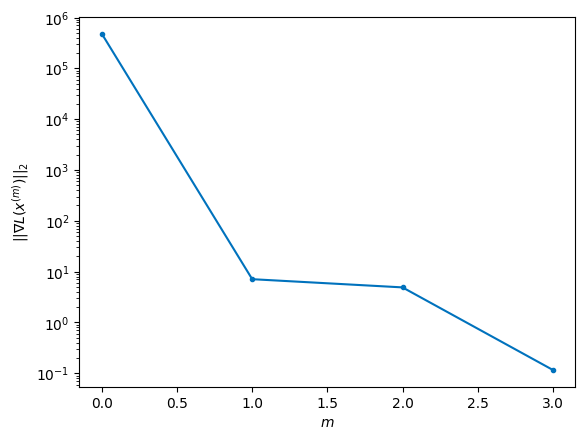


Windows:  28%|██▊       | 84/296 [16:52<34:53,  9.88s/it]

Before applying the algorithm
Cost function: 471.63683771761646
Gradient norm: 212723.93382421072
Global relative error: 1898005786.4333203
Position relative errors: 0.017946078391888533 m, 3.9546826651899942 m, 3244.3301686598966 m, 4873.6820476207495 m

Iteration 1
Cost function: 470.8866589221037 (-0.16%)
Gradient norm: 5.451800889275479 (-100.00%)
Global relative error: 5855.033801419128 (0.00%)
Position relative errors: 0.02026586505029879 m, 3.9397615196859816 m, 3244.3195080296446 m, 4873.986685499066 m

Iteration 2
Cost function: 470.88665900694 (0.00%)
Gradient norm: 2.200574402694783 (-59.64%)
Global relative error: 5855.033756585636 (-0.00%)
Position relative errors: 0.020265865920802643 m, 3.9397394630016707 m, 3244.319506494318 m, 4873.986632681195 m

Iteration 3
Cost function: 470.88665868990057 (-0.00%)
Gradient norm: 1.5177054516794812 (-31.03%)
Global relative error: 5855.033756587703 (0.00%)
Position relative errors: 0.020265867418848713 m, 3.9397394559372336 m, 3244.

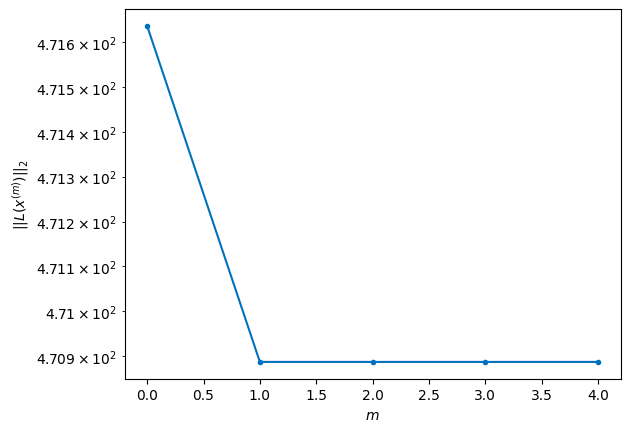

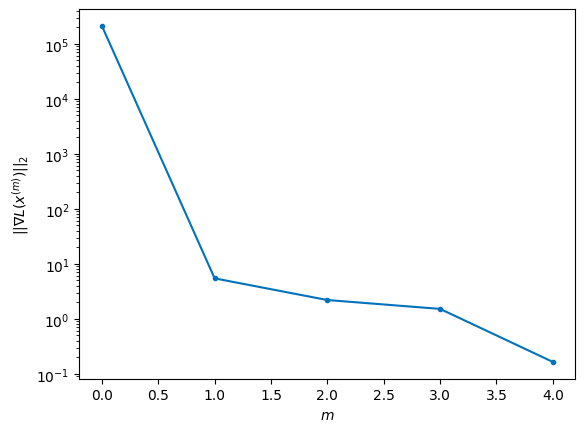


Windows:  29%|██▊       | 85/296 [17:01<34:06,  9.70s/it]

Before applying the algorithm
Cost function: 471.33796662992
Gradient norm: 47994.927557715615
Global relative error: 1897403382.746772
Position relative errors: 0.020052214751611477 m, 4.188680712689798 m, 3001.935845606307 m, 4510.589387233741 m

Iteration 1
Cost function: 470.931585526469 (-0.09%)
Gradient norm: 1.8170170296324735 (-100.00%)
Global relative error: 5418.3825893525045 (0.00%)
Position relative errors: 0.026924023223120836 m, 4.097143146644049 m, 3001.9890751707208 m, 4510.749238466431 m

STOP on Iteration 2
Cost function = 470.9315854116918 (-0.00%)
Gradient norm = 0.4340583237584175 (-76.11%)
Global relative error = 5418.382570771935 (-0.00%)
Final position relative errors: 0.02692402218244113 m, 4.097152490168916 m, 3001.989076671957 m, 4510.749215139568 m



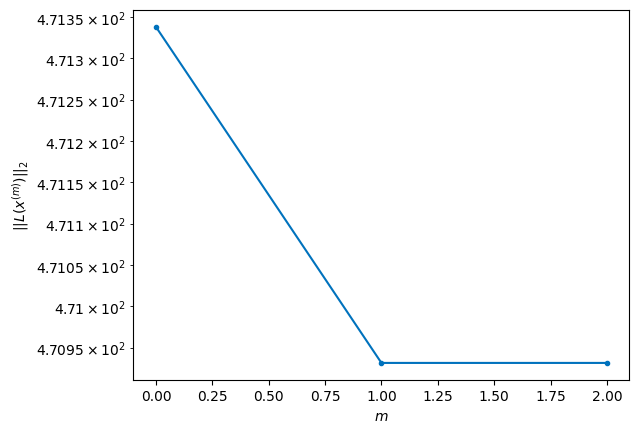

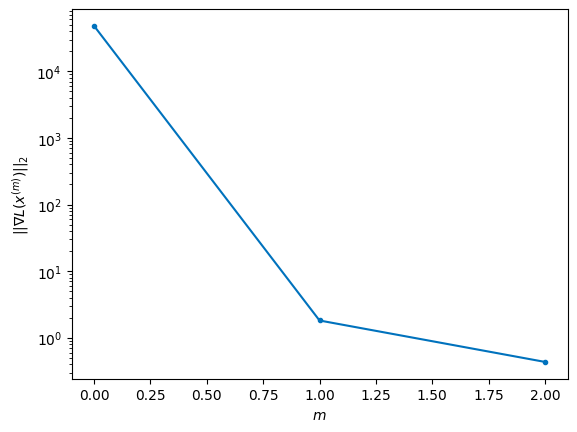


Windows:  29%|██▉       | 86/296 [17:07<29:54,  8.54s/it]

Before applying the algorithm
Cost function: 474.4064796389666
Gradient norm: 81122.07218740054
Global relative error: 1896810716.4235651
Position relative errors: 0.027113856718233634 m, 4.3217780268215 m, 2746.469806598828 m, 4127.624593470387 m

Iteration 1
Cost function: 473.88045400121223 (-0.11%)
Gradient norm: 4.944785674243418 (-99.99%)
Global relative error: 4957.739282168681 (-0.00%)
Position relative errors: 0.027748535700653967 m, 4.312870367546233 m, 2746.479348231202 m, 4127.462849544132 m

STOP on Iteration 2
Cost function = 473.88045344323774 (-0.00%)
Gradient norm = 0.9208281885075048 (-81.38%)
Global relative error = 4957.73927622487 (-0.00%)
Final position relative errors: 0.02774852706019886 m, 4.312874072427849 m, 2746.479352180697 m, 4127.462839772759 m



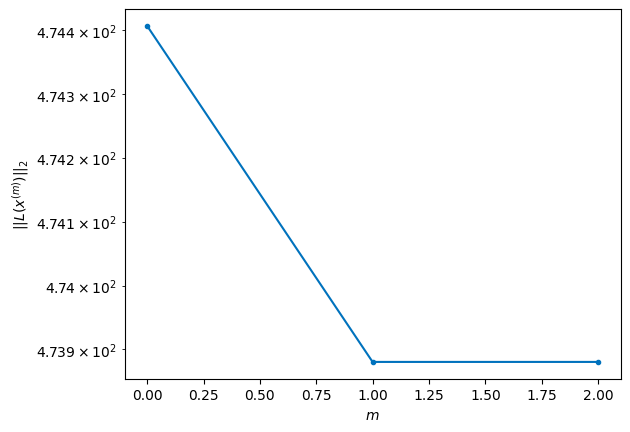

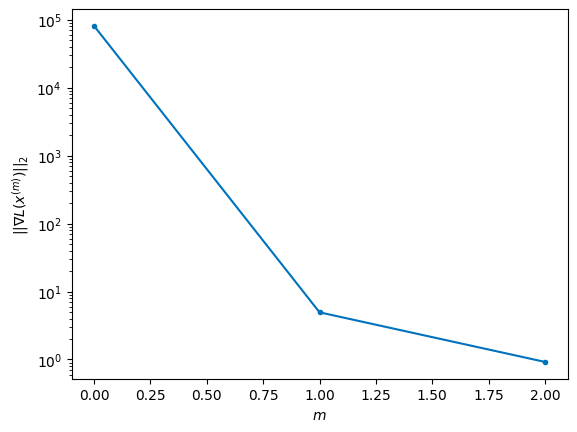


Windows:  29%|██▉       | 87/296 [17:13<26:55,  7.73s/it]

Before applying the algorithm
Cost function: 474.241544031403
Gradient norm: 346458.2586318032
Global relative error: 1896230036.4732916
Position relative errors: 0.02799844310940677 m, 4.514561872736807 m, 2478.9415357531743 m, 3726.2921397692253 m

Iteration 1
Cost function: 473.21346607114793 (-0.22%)
Gradient norm: 26.626019164121136 (-99.99%)
Global relative error: 4475.121396632591 (-0.01%)
Position relative errors: 0.020484823524754198 m, 4.91962733414913 m, 2479.210004367043 m, 3725.6056867835405 m

STOP on Iteration 2
Cost function = 473.2134658228877 (-0.00%)
Gradient norm = 0.7628904767237882 (-97.13%)
Global relative error = 4475.12131597867 (-0.00%)
Final position relative errors: 0.020484821651770315 m, 4.919751589969482 m, 2479.2100628331973 m, 3725.6055508332133 m



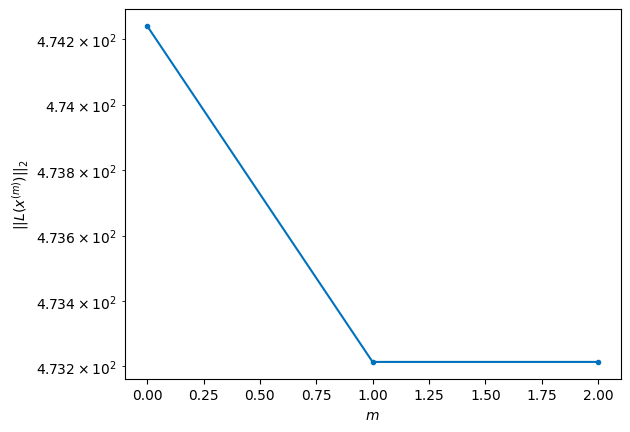

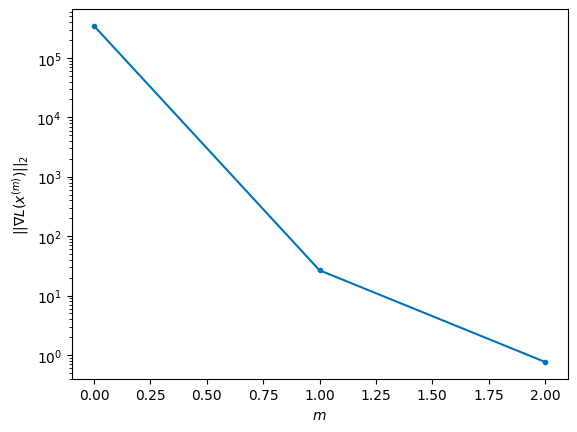


Windows:  30%|██▉       | 88/296 [17:18<24:31,  7.08s/it]

Before applying the algorithm
Cost function: 471.8026248295193
Gradient norm: 142331.98292007807
Global relative error: 1895663574.2073586
Position relative errors: 0.02136701863081604 m, 5.111738349067288 m, 2200.8203347360954 m, 3308.1409803177353 m

Iteration 1
Cost function: 471.18434239042045 (-0.13%)
Gradient norm: 8.862752838902999 (-99.99%)
Global relative error: 3973.6969290927555 (0.01%)
Position relative errors: 0.024628855139268303 m, 4.90547554475362 m, 2200.741457744893 m, 3308.611153954411 m

STOP on Iteration 2
Cost function = 471.184342366843 (-0.00%)
Gradient norm = 0.5707469821296232 (-93.56%)
Global relative error = 3973.696857282018 (-0.00%)
Final position relative errors: 0.024628857193483487 m, 4.905524364860457 m, 2200.7414873612483 m, 3308.611047936648 m



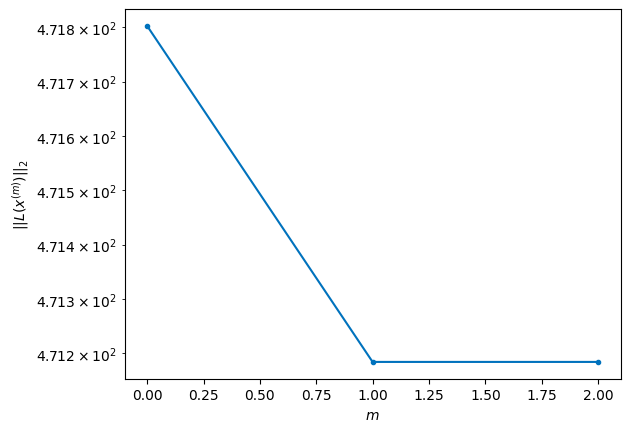

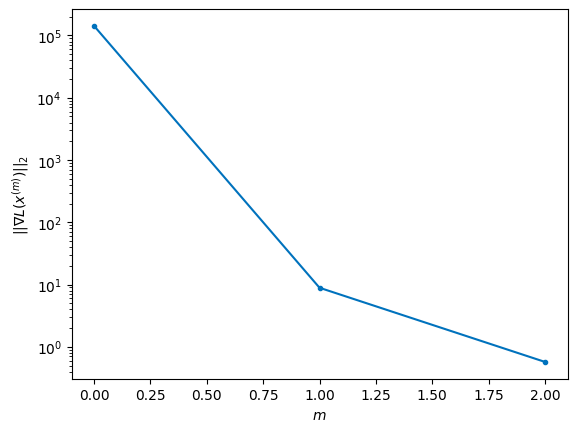


Windows:  30%|███       | 89/296 [17:24<22:59,  6.67s/it]

Before applying the algorithm
Cost function: 477.3803805642811
Gradient norm: 412428.30527127045
Global relative error: 1895113505.5443826
Position relative errors: 0.025634708900479124 m, 5.066481779457318 m, 1912.7179945656424 m, 2876.6654183179357 m

Iteration 1
Cost function: 476.04397614999334 (-0.28%)
Gradient norm: 19.1075594569692 (-100.00%)
Global relative error: 3454.1300856234498 (-0.01%)
Position relative errors: 0.022378489772568597 m, 4.984701352246801 m, 1912.6276560597703 m, 2876.2420056810865 m

STOP on Iteration 2
Cost function = 476.04397608931527 (-0.00%)
Gradient norm = 0.933606793691988 (-95.11%)
Global relative error = 3454.130067366289 (-0.00%)
Final position relative errors: 0.022378492054294204 m, 4.984648396128635 m, 1912.6276235288997 m, 2876.242005479757 m



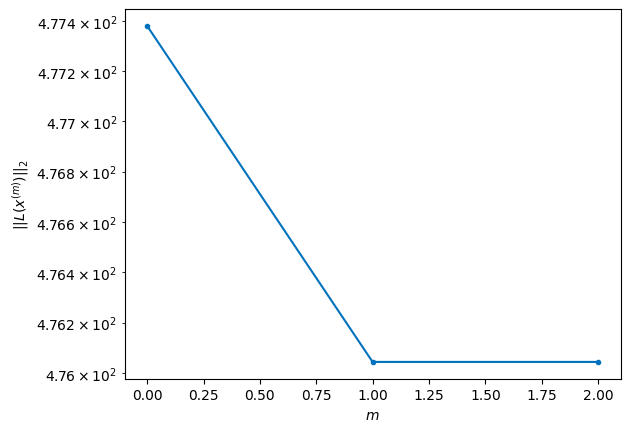

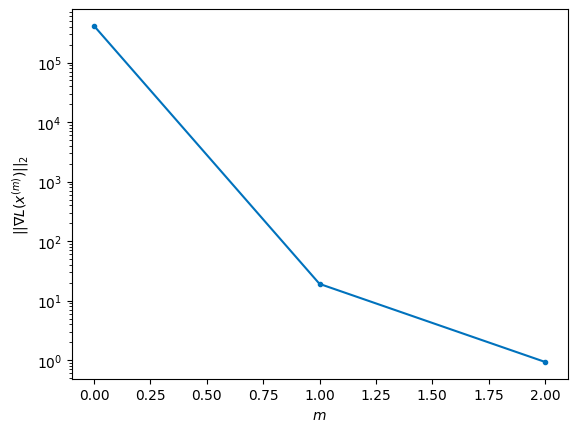


Windows:  30%|███       | 90/296 [17:30<21:54,  6.38s/it]

Before applying the algorithm
Cost function: 475.7234681933017
Gradient norm: 79635.07151788517
Global relative error: 1894581983.0803056
Position relative errors: 0.023615088801580992 m, 5.1192817164275795 m, 1616.2195465582968 m, 2431.729674284489 m

Iteration 1
Cost function: 475.0797377683403 (-0.14%)
Gradient norm: 6.3348352210079275 (-99.99%)
Global relative error: 2919.659219622974 (-0.01%)
Position relative errors: 0.0264121370432556 m, 4.925911297505706 m, 1616.1757405111587 m, 2431.5181166601096 m

STOP on Iteration 2
Cost function = 475.07973857057823 (0.00%)
Gradient norm = 0.3869573438764106 (-93.89%)
Global relative error = 2919.659186694247 (-0.00%)
Final position relative errors: 0.026412138523519087 m, 4.925896340629886 m, 1616.1757401287423 m, 2431.51807740525 m



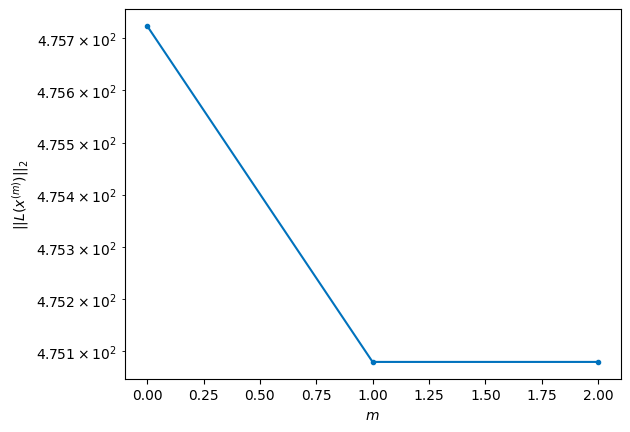

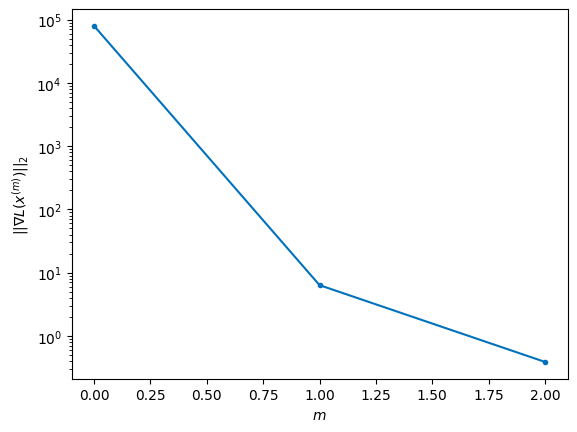


Windows:  31%|███       | 91/296 [17:35<20:58,  6.14s/it]

Before applying the algorithm
Cost function: 475.29571867071587
Gradient norm: 188555.60370760324
Global relative error: 1894071103.2495847
Position relative errors: 0.027472185719060852 m, 5.038480302551184 m, 1312.687831629081 m, 1976.3625127726546 m

Iteration 1
Cost function: 474.76388006209055 (-0.11%)
Gradient norm: 11.8024382822733 (-99.99%)
Global relative error: 2372.259478259791 (-0.01%)
Position relative errors: 0.023594271871915033 m, 5.154010747112584 m, 1312.7441881130683 m, 1975.9064564168602 m

Iteration 2
Cost function: 474.76387993796465 (-0.00%)
Gradient norm: 2.0689964639722915 (-82.47%)
Global relative error: 2372.259449063188 (-0.00%)
Position relative errors: 0.02359427368618284 m, 5.154047346196315 m, 1312.7442041172167 m, 1975.9064106353596 m

Iteration 3
Cost function: 474.76388030129687 (0.00%)
Gradient norm: 1.002938487306867 (-51.53%)
Global relative error: 2372.2594490704864 (0.00%)
Position relative errors: 0.02359427397219574 m, 5.154047349704401 m, 1312

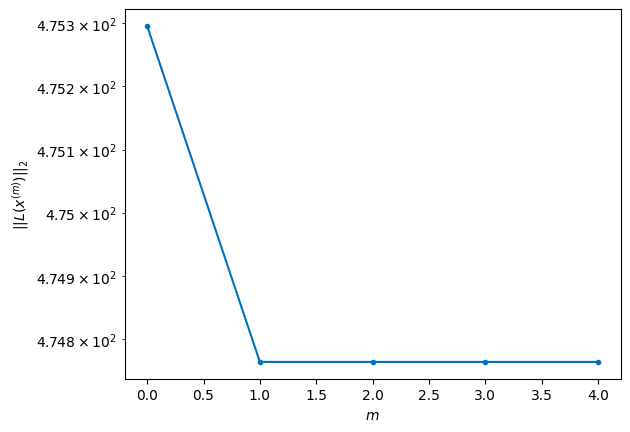

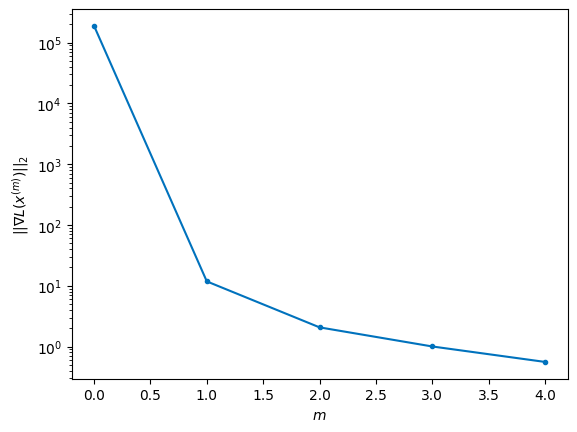


Windows:  31%|███       | 92/296 [17:44<23:53,  7.03s/it]

Before applying the algorithm
Cost function: 472.2233408066695
Gradient norm: 87702.52592114547
Global relative error: 1893582916.5498567
Position relative errors: 0.02463204880170038 m, 5.250936669333123 m, 1003.5041341956619 m, 1512.1023052373046 m

Iteration 1
Cost function: 471.92227733924966 (-0.06%)
Gradient norm: 5.526159689068071 (-99.99%)
Global relative error: 1814.8206397191504 (-0.00%)
Position relative errors: 0.024264880844642216 m, 5.141955392855624 m, 1003.4046118028667 m, 1512.163687954994 m

Iteration 2
Cost function: 471.9222772765336 (-0.00%)
Gradient norm: 2.6536103054341487 (-51.98%)
Global relative error: 1814.8206209149373 (-0.00%)
Position relative errors: 0.024264883464336365 m, 5.142000234827018 m, 1003.4046281431044 m, 1512.1636543919594 m

Iteration 3
Cost function: 471.92227747631756 (0.00%)
Gradient norm: 4.12304754423546 (55.38%)
Global relative error: 1814.82062090685 (-0.00%)
Position relative errors: 0.024264882336896512 m, 5.142000232869971 m, 1003.4

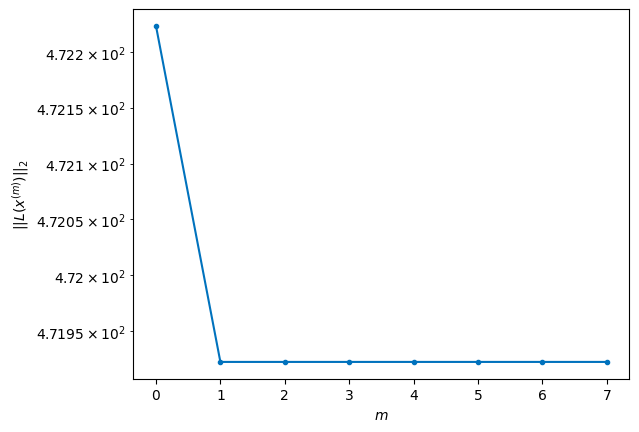

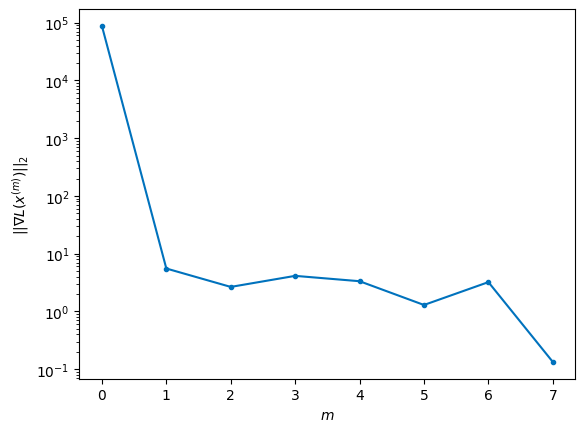


Windows:  31%|███▏      | 93/296 [17:58<31:00,  9.16s/it]

Before applying the algorithm
Cost function: 471.9948643296462
Gradient norm: 390418.4937853943
Global relative error: 1893119415.111247
Position relative errors: 0.025230123304014515 m, 5.208240951538246 m, 689.7629464128557 m, 1041.7441625687836 m

Iteration 1
Cost function: 471.4223715518836 (-0.12%)
Gradient norm: 9.889025672476262 (-100.00%)
Global relative error: 1249.1648186064592 (-0.02%)
Position relative errors: 0.02041054884375612 m, 5.221782623838655 m, 689.8007708158137 m, 1041.379174512364 m

Iteration 2
Cost function: 471.4223721342865 (0.00%)
Gradient norm: 1.711317542702194 (-82.69%)
Global relative error: 1249.1648029086805 (-0.00%)
Position relative errors: 0.020410545725737497 m, 5.221784398496158 m, 689.8007741809378 m, 1041.379153444448 m

STOP on Iteration 3
Cost function = 471.42237217209737 (0.00%)
Gradient norm = 0.1997555395299309 (-88.33%)
Global relative error = 1249.1648029075832 (-0.00%)
Final position relative errors: 0.020410548078855072 m, 5.2217843943

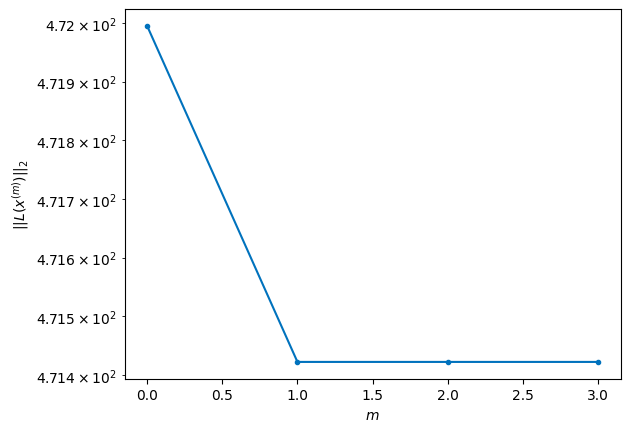

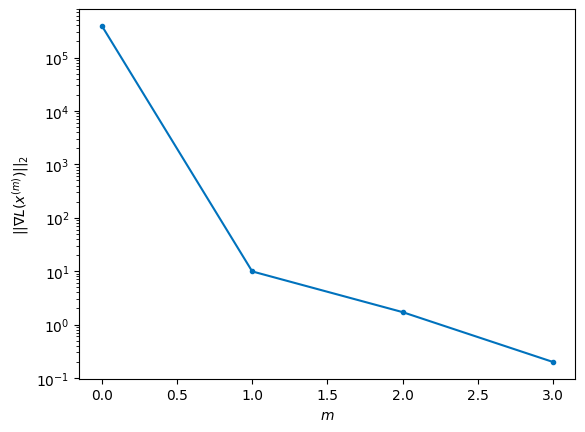


Windows:  32%|███▏      | 94/296 [18:06<29:02,  8.63s/it]

Before applying the algorithm
Cost function: 478.821310338867
Gradient norm: 153653.67135242696
Global relative error: 1892682536.4898653
Position relative errors: 0.021710311360310264 m, 5.2653411021179615 m, 373.1375931063377 m, 566.4011352438467 m

Iteration 1
Cost function: 477.6898573547455 (-0.24%)
Gradient norm: 8.241419248199946 (-99.99%)
Global relative error: 678.1452968955098 (-0.03%)
Position relative errors: 0.01902882286470155 m, 5.53174975232014 m, 373.10189488597354 m, 566.1751437134425 m

Iteration 2
Cost function: 477.68985742389725 (0.00%)
Gradient norm: 4.583070143253112 (-44.39%)
Global relative error: 678.1452907262878 (-0.00%)
Position relative errors: 0.019028820136702772 m, 5.531789460831588 m, 373.1019174161692 m, 566.1751210890857 m

STOP on Iteration 3
Cost function = 477.6898577051587 (0.00%)
Gradient norm = 0.18414046325379535 (-95.98%)
Global relative error = 678.1452907204758 (-0.00%)
Final position relative errors: 0.019028821198496 m, 5.531789457985198

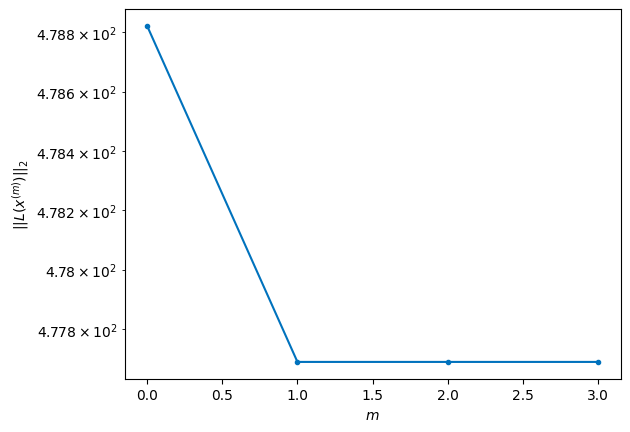

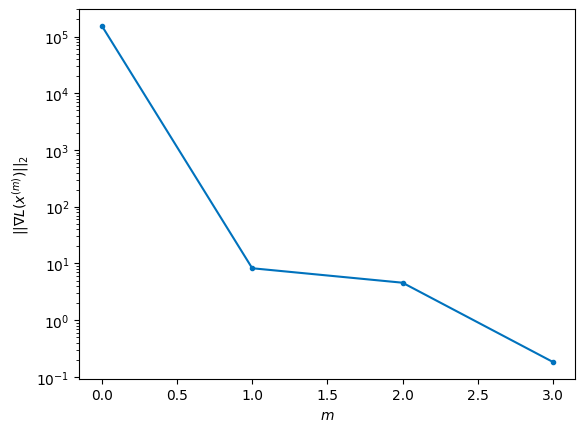


Windows:  32%|███▏      | 95/296 [18:13<27:36,  8.24s/it]

Before applying the algorithm
Cost function: 478.0314455952902
Gradient norm: 153862.6913171878
Global relative error: 1892274138.2727587
Position relative errors: 0.02017921476634377 m, 5.556019281913211 m, 54.816222377729964 m, 88.73798010158158 m

Iteration 1
Cost function: 477.5920365126039 (-0.09%)
Gradient norm: 4.472699471092913 (-100.00%)
Global relative error: 104.80433394031253 (-0.08%)
Position relative errors: 0.01878743184129109 m, 5.773794278828214 m, 55.02626178107839 m, 88.49320756771279 m

Iteration 2
Cost function: 477.59203648027653 (-0.00%)
Gradient norm: 3.7564971004036516 (-16.01%)
Global relative error: 104.80431606937238 (-0.00%)
Position relative errors: 0.01878743348594005 m, 5.773804607941862 m, 55.026257735673184 m, 88.4931882431628 m

Iteration 3
Cost function: 477.59203663942657 (0.00%)
Gradient norm: 3.725158562369393 (-0.83%)
Global relative error: 104.80431607921986 (0.00%)
Position relative errors: 0.018787435276235016 m, 5.77380460793235 m, 55.0262577

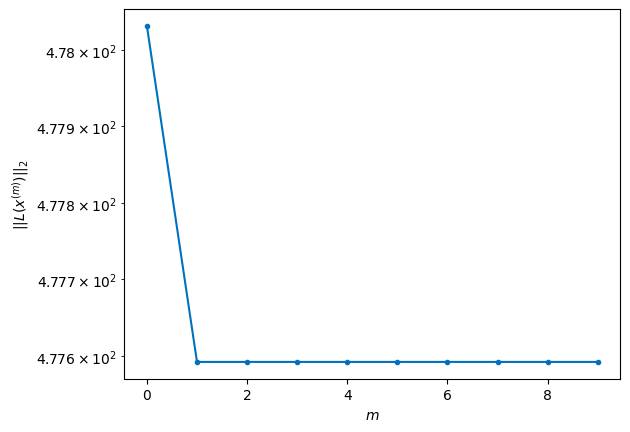

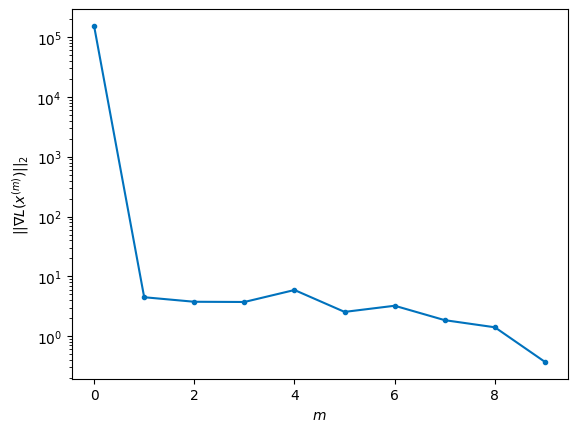


Windows:  32%|███▏      | 96/296 [18:30<36:06, 10.83s/it]

Before applying the algorithm
Cost function: 476.55156006461965
Gradient norm: 119945.22663905403
Global relative error: 1891896013.3832476
Position relative errors: 0.019541065672537695 m, 5.773341981162833 m, 263.5365852523259 m, 389.375879873412 m

Iteration 1
Cost function: 475.7653431712213 (-0.16%)
Gradient norm: 6.36123474783684 (-99.99%)
Global relative error: 470.5631197166523 (0.05%)
Position relative errors: 0.01958432183091929 m, 5.889597982340107 m, 263.3279305074127 m, 389.82296608578827 m

Iteration 2
Cost function: 475.7653432852254 (0.00%)
Gradient norm: 1.01572932289063 (-84.03%)
Global relative error: 470.5631337704974 (0.00%)
Position relative errors: 0.01958431921467125 m, 5.889583131208762 m, 263.3279559150012 m, 389.8229661113742 m

STOP on Iteration 3
Cost function = 475.7653432703852 (-0.00%)
Gradient norm = 0.7484992134597588 (-26.31%)
Global relative error = 470.56313376715116 (-0.00%)
Final position relative errors: 0.019584317142140525 m, 5.889583125913668 

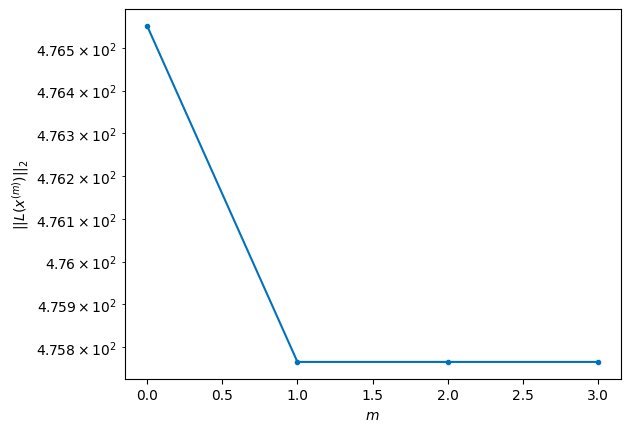

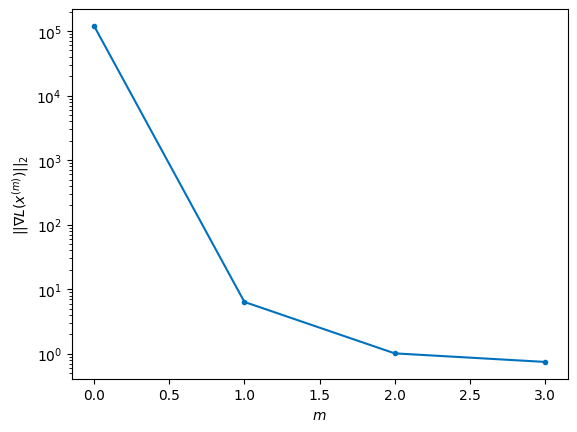


Windows:  33%|███▎      | 97/296 [18:37<32:23,  9.77s/it]

Before applying the algorithm
Cost function: 473.7564444487494
Gradient norm: 112133.99192008164
Global relative error: 1891549853.2186286
Position relative errors: 0.01958452927614555 m, 5.8574429523540985 m, 580.706748305178 m, 865.9656220660667 m

Iteration 1
Cost function: 470.95866320462744 (-0.59%)
Gradient norm: 50.35481125749955 (-99.96%)
Global relative error: 1043.6196302672292 (0.09%)
Position relative errors: 0.019451848728662416 m, 6.404617527455405 m, 580.5714359602395 m, 867.1489773511834 m

Iteration 2
Cost function: 470.95866314068127 (-0.00%)
Gradient norm: 2.5151139478143665 (-95.01%)
Global relative error: 1043.61978307411 (0.00%)
Position relative errors: 0.01945184369489141 m, 6.404879052034142 m, 580.5713139089319 m, 867.1492410379873 m

Iteration 3
Cost function: 470.95866310901687 (-0.00%)
Gradient norm: 1.2075273748050617 (-51.99%)
Global relative error: 1043.6197830911722 (0.00%)
Position relative errors: 0.019451842228945405 m, 6.404879058004098 m, 580.57131

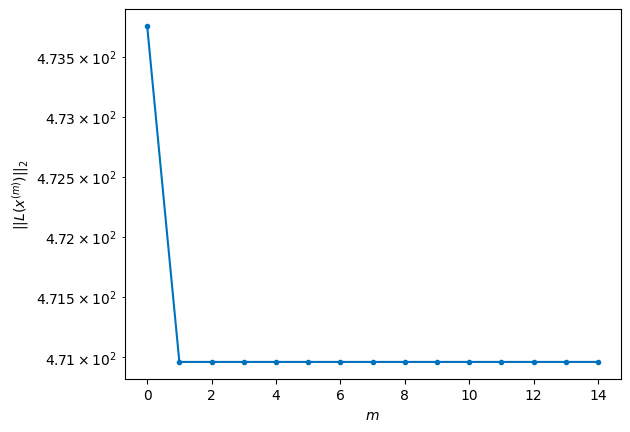

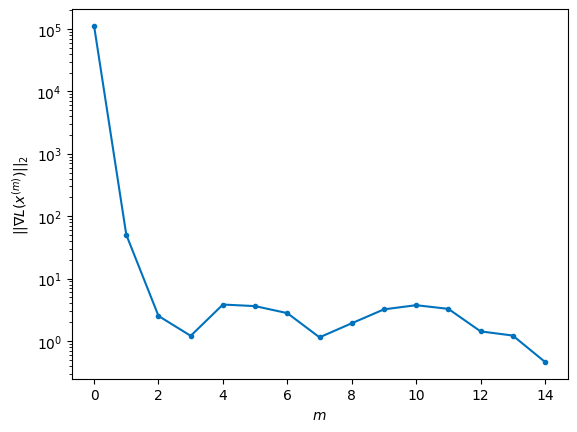


Windows:  33%|███▎      | 98/296 [19:04<48:56, 14.83s/it]

Before applying the algorithm
Cost function: 469.39687330871664
Gradient norm: 106344.09808648791
Global relative error: 1891237268.9921048
Position relative errors: 0.019109361385533735 m, 6.354317684743305 m, 895.4079312901233 m, 1339.5284287209927 m

Iteration 1
Cost function: 467.66911129514693 (-0.37%)
Gradient norm: 10.761459066048296 (-99.99%)
Global relative error: 1611.7387237572416 (0.03%)
Position relative errors: 0.021061069220413675 m, 6.593389703659232 m, 895.5973819323282 m, 1339.95336801051 m

Iteration 2
Cost function: 467.6691114250202 (0.00%)
Gradient norm: 1.4814653056628289 (-86.23%)
Global relative error: 1611.73875642161 (0.00%)
Position relative errors: 0.021061078796287498 m, 6.593483959165214 m, 895.597331527473 m, 1339.953440525921 m

Iteration 3
Cost function: 467.6691115450706 (0.00%)
Gradient norm: 2.128037786122564 (43.64%)
Global relative error: 1611.7387564243782 (0.00%)
Position relative errors: 0.02106106934246919 m, 6.593483962275329 m, 895.597331531

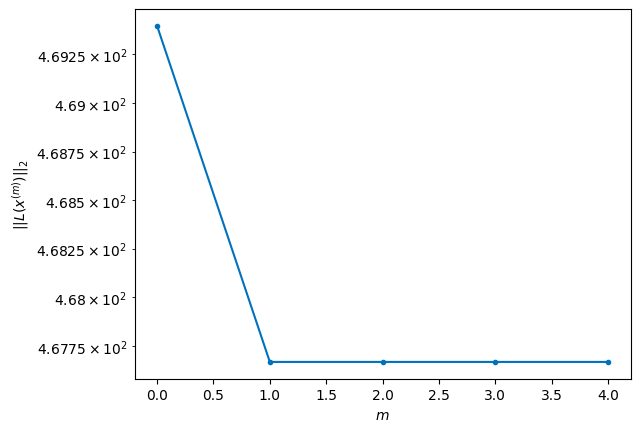

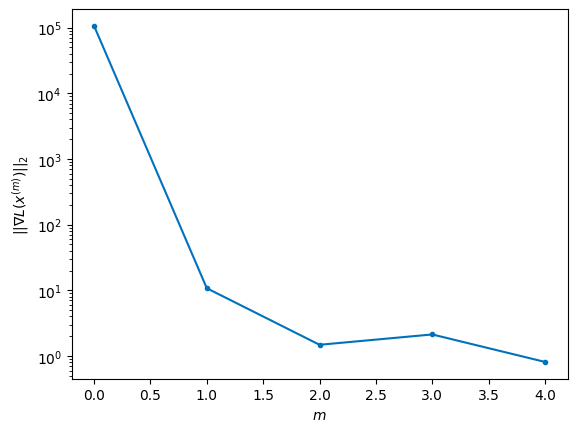


Windows:  33%|███▎      | 99/296 [19:13<42:47, 13.03s/it]

Before applying the algorithm
Cost function: 470.68881712661187
Gradient norm: 82989.20467473826
Global relative error: 1890959753.4991047
Position relative errors: 0.01998785185160736 m, 6.526829279798417 m, 1206.516079430106 m, 1806.4782855430362 m

Iteration 1
Cost function: 470.18639874331365 (-0.11%)
Gradient norm: 4.282262779651022 (-99.99%)
Global relative error: 2172.226331542977 (-0.01%)
Position relative errors: 0.021454157407938764 m, 6.48619935107865 m, 1206.690944073271 m, 1806.1938341040468 m

Iteration 2
Cost function: 470.18639885240674 (0.00%)
Gradient norm: 1.7774090206040096 (-58.49%)
Global relative error: 2172.2262967085803 (-0.00%)
Position relative errors: 0.021454147486818124 m, 6.486207322107603 m, 1206.6909495874563 m, 1806.1937884977654 m

Iteration 3
Cost function: 470.1863986487461 (-0.00%)
Gradient norm: 4.024300197724744 (126.41%)
Global relative error: 2172.2262967139195 (0.00%)
Position relative errors: 0.021454143369908543 m, 6.486207324972209 m, 1206.

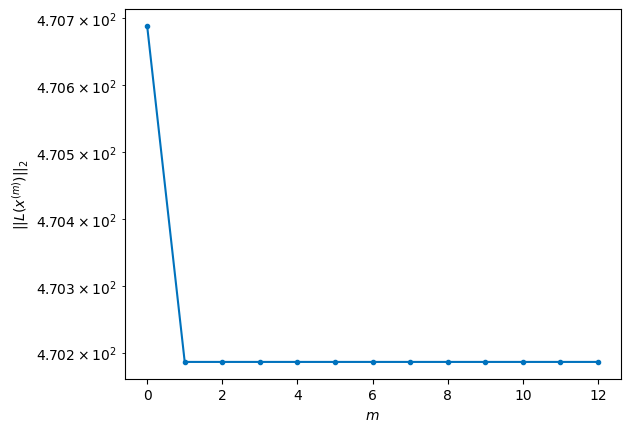

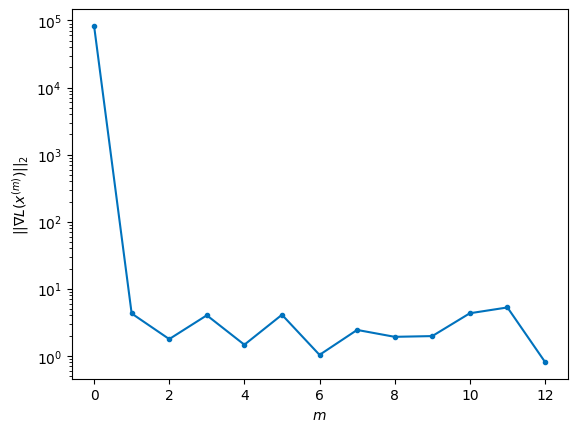


Windows:  34%|███▍      | 100/296 [19:36<52:20, 16.02s/it]

Before applying the algorithm
Cost function: 472.6629368923755
Gradient norm: 191915.1674481098
Global relative error: 1890718704.007008
Position relative errors: 0.020322862420136697 m, 6.398234758646423 m, 1512.3285353522294 m, 2264.822858116903 m

Iteration 1
Cost function: 472.04738263440436 (-0.13%)
Gradient norm: 3.324534739393702 (-100.00%)
Global relative error: 2723.284928001769 (-0.00%)
Position relative errors: 0.028030715595135407 m, 6.454774404037524 m, 1512.508540200191 m, 2264.6135139672697 m

STOP on Iteration 2
Cost function = 472.0473827735976 (0.00%)
Gradient norm = 0.6642268746763048 (-80.02%)
Global relative error = 2723.2849049648107 (-0.00%)
Final position relative errors: 0.02803071479253356 m, 6.454788694363478 m, 1512.508537568411 m, 2264.613487981467 m



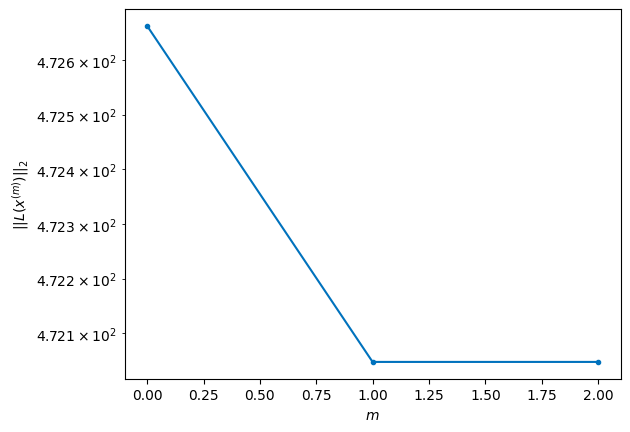

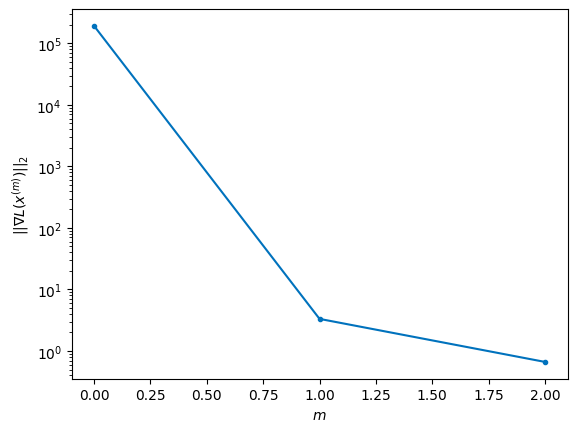


Windows:  34%|███▍      | 101/296 [19:42<42:07, 12.96s/it]

Before applying the algorithm
Cost function: 474.16946823568503
Gradient norm: 88185.45446852816
Global relative error: 1890515392.277796
Position relative errors: 0.026248464513473412 m, 6.34180764549564 m, 1811.5334106504351 m, 2713.3311643158195 m

Iteration 1
Cost function: 473.58372862384743 (-0.12%)
Gradient norm: 3.868084470408841 (-100.00%)
Global relative error: 3262.759588159225 (0.01%)
Position relative errors: 0.022990116605822897 m, 6.220365547055476 m, 1811.7219974380334 m, 2713.511761233604 m

Iteration 2
Cost function: 473.5837289643309 (0.00%)
Gradient norm: 1.646355193127431 (-57.44%)
Global relative error: 3262.7595775817795 (-0.00%)
Position relative errors: 0.022990120935892498 m, 6.2203961516784965 m, 1811.721983558315 m, 2713.5117577120395 m

Iteration 3
Cost function: 473.5837290490842 (0.00%)
Gradient norm: 1.88934424684388 (14.76%)
Global relative error: 3262.759577579194 (-0.00%)
Position relative errors: 0.02299011307904914 m, 6.220396139293929 m, 1811.72198

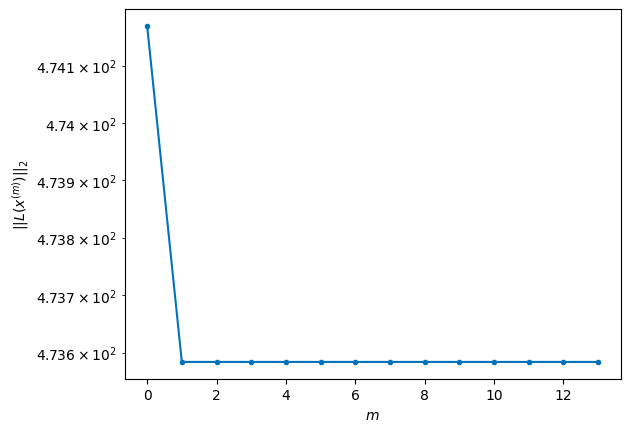

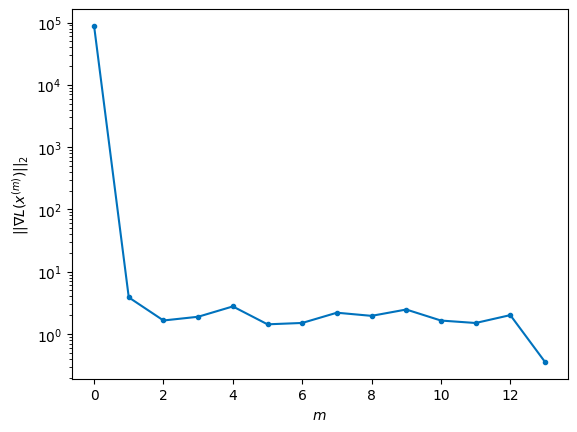


Windows:  34%|███▍      | 102/296 [20:06<53:27, 16.53s/it]

Before applying the algorithm
Cost function: 476.8265526894146
Gradient norm: 235279.08458439485
Global relative error: 1890350962.7550921
Position relative errors: 0.02181090542300388 m, 6.080738218081208 m, 2102.826650083819 m, 3150.374218151273 m

Iteration 1
Cost function: 476.25603487420483 (-0.12%)
Gradient norm: 7.181538959962728 (-100.00%)
Global relative error: 3787.625706914255 (-0.00%)
Position relative errors: 0.019484393929509448 m, 6.144946325737678 m, 2102.875917386096 m, 3150.2236984838964 m

Iteration 2
Cost function: 476.2560347585997 (-0.00%)
Gradient norm: 3.2709347496724335 (-54.45%)
Global relative error: 3787.6257252492087 (0.00%)
Position relative errors: 0.019484389738222384 m, 6.144978034108739 m, 2102.875903791986 m, 3150.2237295413274 m

STOP on Iteration 3
Cost function = 476.25603513405565 (0.00%)
Gradient norm = 0.7152347975561115 (-78.13%)
Global relative error = 3787.625725251894 (0.00%)
Final position relative errors: 0.019484387700453513 m, 6.14497802

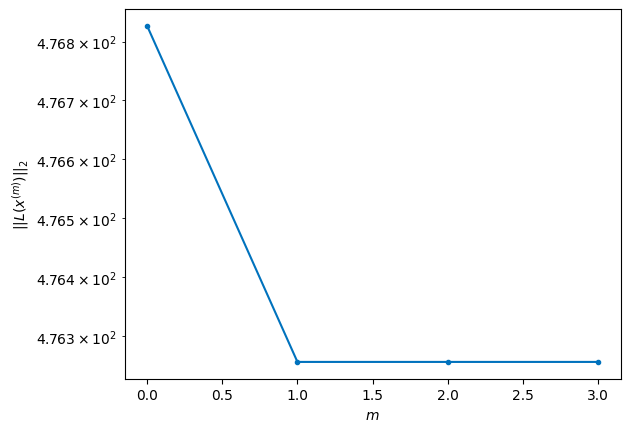

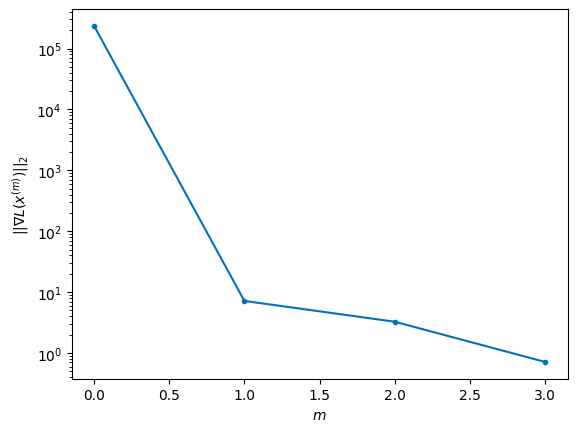


Windows:  35%|███▍      | 103/296 [20:14<44:40, 13.89s/it]

Before applying the algorithm
Cost function: 473.908224038878
Gradient norm: 33895.905179954156
Global relative error: 1890226414.168241
Position relative errors: 0.018399338387519424 m, 5.974023674944764 m, 2384.7965195113275 m, 3573.2897855777596 m

Iteration 1
Cost function: 473.62224947089715 (-0.06%)
Gradient norm: 5.463331377271516 (-99.98%)
Global relative error: 4296.045554438009 (0.00%)
Position relative errors: 0.018317776679133514 m, 6.029966720972751 m, 2384.81926743369 m, 3573.3092270930215 m

Iteration 2
Cost function: 473.62225038249517 (0.00%)
Gradient norm: 5.429317880727611 (-0.62%)
Global relative error: 4296.0455642702 (0.00%)
Position relative errors: 0.018317785195401618 m, 6.029967026040786 m, 2384.8192736761175 m, 3573.3092347471793 m

Iteration 3
Cost function: 473.62225009217735 (-0.00%)
Gradient norm: 2.28230355848637 (-57.96%)
Global relative error: 4296.045564259594 (-0.00%)
Position relative errors: 0.018317769793467602 m, 6.029967007014988 m, 2384.8192736

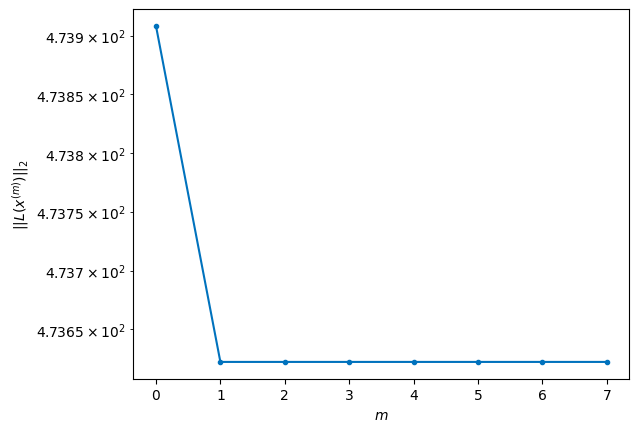

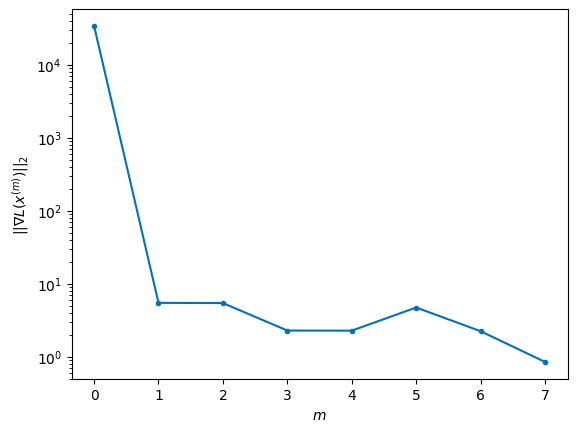


Windows:  35%|███▌      | 104/296 [20:28<44:32, 13.92s/it]

Before applying the algorithm
Cost function: 474.81277407195034
Gradient norm: 122482.39128572693
Global relative error: 1890142608.3947847
Position relative errors: 0.017572840371017324 m, 5.830384514181392 m, 2656.323764815374 m, 3980.780097753228 m

Iteration 1
Cost function: 473.67812607577395 (-0.24%)
Gradient norm: 13.737133866978281 (-99.99%)
Global relative error: 4785.982533253072 (0.01%)
Position relative errors: 0.016475950250848855 m, 5.824867567154043 m, 2656.4026239575546 m, 3981.0873003737693 m

Iteration 2
Cost function: 473.67812602623263 (-0.00%)
Gradient norm: 5.148243468227134 (-62.52%)
Global relative error: 4785.982537650707 (0.00%)
Position relative errors: 0.016475953621738603 m, 5.824889120719417 m, 2656.4026422247975 m, 3981.087293440139 m

STOP on Iteration 3
Cost function = 473.6781256652102 (-0.00%)
Gradient norm = 0.34217563171445087 (-93.35%)
Global relative error = 4785.98253765041 (-0.00%)
Final position relative errors: 0.01647594844860985 m, 5.8248891

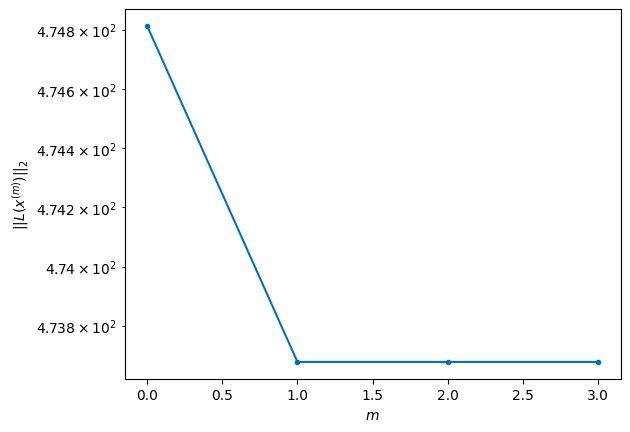

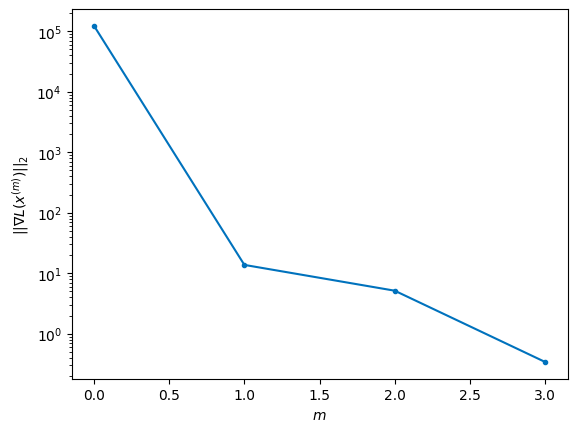


Windows:  35%|███▌      | 105/296 [20:36<38:20, 12.05s/it]

Before applying the algorithm
Cost function: 472.55921654965425
Gradient norm: 239503.04917208978
Global relative error: 1890100239.049915
Position relative errors: 0.016855928244198112 m, 5.602839601811671 m, 2916.3056333011405 m, 4371.213986984451 m

Iteration 1
Cost function: 470.9245004766331 (-0.35%)
Gradient norm: 5.3645979321203905 (-100.00%)
Global relative error: 5254.701927164234 (-0.00%)
Position relative errors: 0.019543429024450356 m, 5.783098859794634 m, 2916.427137761883 m, 4371.070060765074 m

Iteration 2
Cost function: 470.92450027194104 (-0.00%)
Gradient norm: 2.138139739297143 (-60.14%)
Global relative error: 5254.701948316947 (0.00%)
Position relative errors: 0.019543427631225203 m, 5.783145898347848 m, 2916.427149423146 m, 4371.070078351134 m

Iteration 3
Cost function: 470.9245014118728 (0.00%)
Gradient norm: 2.0139591430234183 (-5.81%)
Global relative error: 5254.701948334749 (0.00%)
Position relative errors: 0.019543428269635288 m, 5.783145920587902 m, 2916.4271

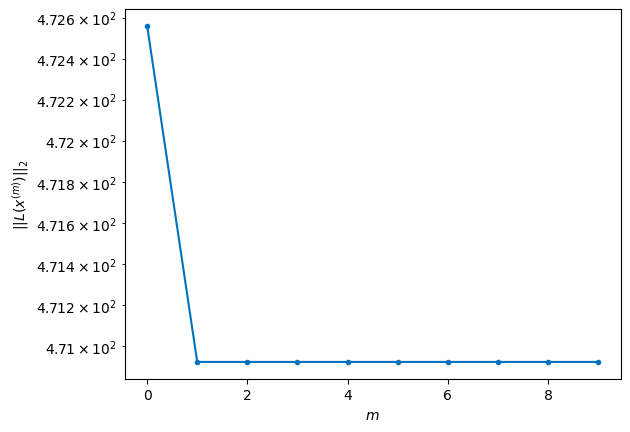

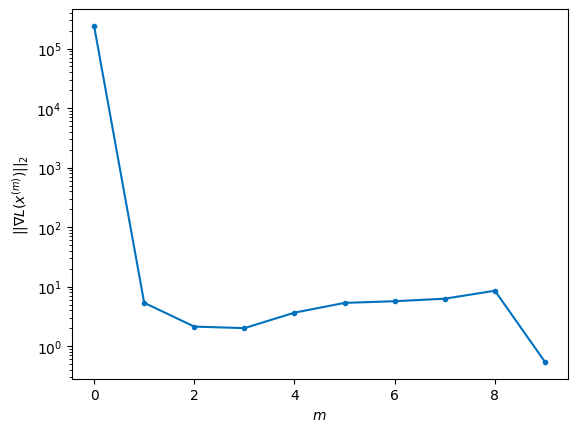


Windows:  36%|███▌      | 106/296 [20:54<43:58, 13.89s/it]

Before applying the algorithm
Cost function: 467.1301494672519
Gradient norm: 276268.290124573
Global relative error: 1890099821.8893669
Position relative errors: 0.020072499873531588 m, 5.528445861433035 m, 3163.6191401067795 m, 4742.094304067829 m

Iteration 1
Cost function: 466.41096335493876 (-0.15%)
Gradient norm: 6.148153518687008 (-100.00%)
Global relative error: 5700.7321142461415 (0.00%)
Position relative errors: 0.024518765600577034 m, 5.531500923445351 m, 3163.6768337877415 m, 4742.300356918638 m

Iteration 2
Cost function: 466.41096394316446 (0.00%)
Gradient norm: 5.850584475150287 (-4.84%)
Global relative error: 5700.732122559394 (0.00%)
Position relative errors: 0.02451876070213597 m, 5.5315209169721955 m, 3163.676846299666 m, 4742.300358541793 m

Iteration 3
Cost function: 466.4109639996069 (0.00%)
Gradient norm: 3.175010321509738 (-45.73%)
Global relative error: 5700.732122547922 (-0.00%)
Position relative errors: 0.024518764510616405 m, 5.53152091457585 m, 3163.6768463

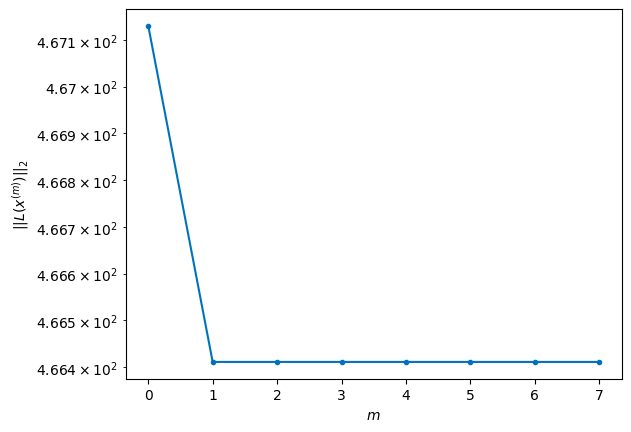

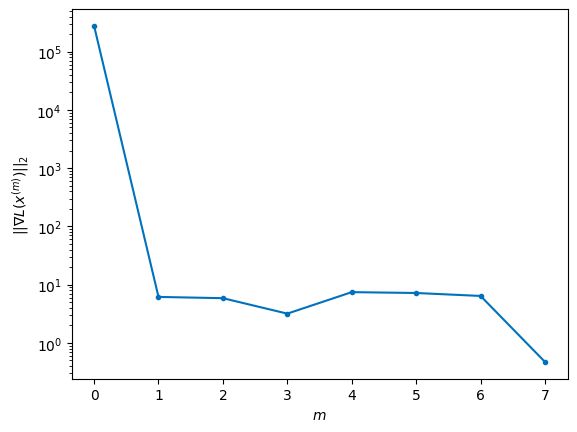


Windows:  36%|███▌      | 107/296 [21:09<45:03, 14.30s/it]

Before applying the algorithm
Cost function: 463.9095877972282
Gradient norm: 183427.8000819614
Global relative error: 1890141734.5872352
Position relative errors: 0.025056858771808434 m, 5.261292749743433 m, 3397.066089521624 m, 5092.668126817845 m

Iteration 1
Cost function: 463.64632411683107 (-0.06%)
Gradient norm: 2.301736456467739 (-100.00%)
Global relative error: 6121.750506588774 (0.00%)
Position relative errors: 0.021295666963707997 m, 5.178389163814251 m, 3397.184645802324 m, 5092.631216334758 m

Iteration 2
Cost function: 463.6463238892334 (-0.00%)
Gradient norm: 2.578956150993035 (12.04%)
Global relative error: 6121.75050404026 (-0.00%)
Position relative errors: 0.021295669831205122 m, 5.178391861254931 m, 3397.184640934054 m, 5092.631216516016 m

Iteration 3
Cost function: 463.64632424112375 (0.00%)
Gradient norm: 2.9539908770861936 (14.54%)
Global relative error: 6121.750504057967 (0.00%)
Position relative errors: 0.02129566613038892 m, 5.178391869864324 m, 3397.184640926

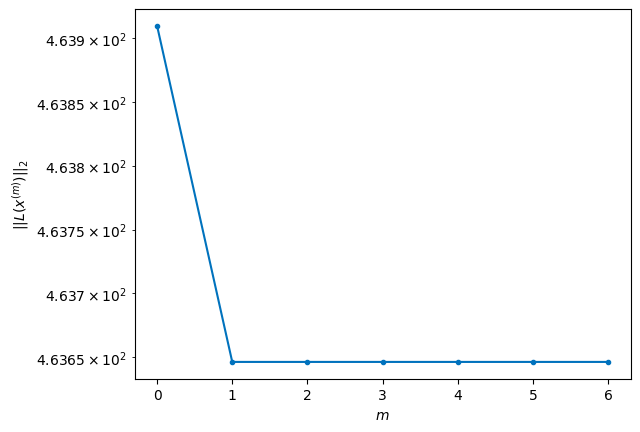

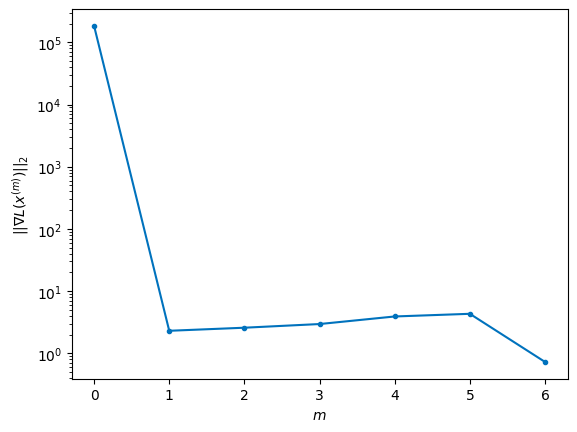


Windows:  36%|███▋      | 108/296 [21:23<43:56, 14.03s/it]

Before applying the algorithm
Cost function: 462.22650929313943
Gradient norm: 285748.25714918977
Global relative error: 1890226136.2813535
Position relative errors: 0.02171398020507703 m, 4.885197101953593 m, 3615.758126926798 m, 5420.8017795109845 m

Iteration 1
Cost function: 461.37045020273814 (-0.19%)
Gradient norm: 4.664869705266492 (-100.00%)
Global relative error: 6516.209769818107 (0.00%)
Position relative errors: 0.03775132656496376 m, 5.0509669783117825 m, 3615.594128409451 m, 5421.107189413933 m

Iteration 2
Cost function: 461.37044978878356 (-0.00%)
Gradient norm: 3.8752635409526044 (-16.93%)
Global relative error: 6516.209754353753 (-0.00%)
Position relative errors: 0.037751317995187515 m, 5.050983387401895 m, 3615.594115249162 m, 5421.107179587604 m

Iteration 3
Cost function: 461.37044983077817 (0.00%)
Gradient norm: 1.021357473710217 (-73.64%)
Global relative error: 6516.209754345814 (-0.00%)
Position relative errors: 0.03775132184458642 m, 5.050983400659634 m, 3615.59

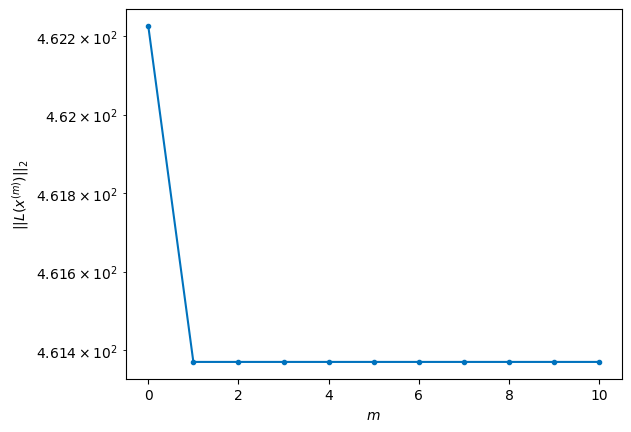

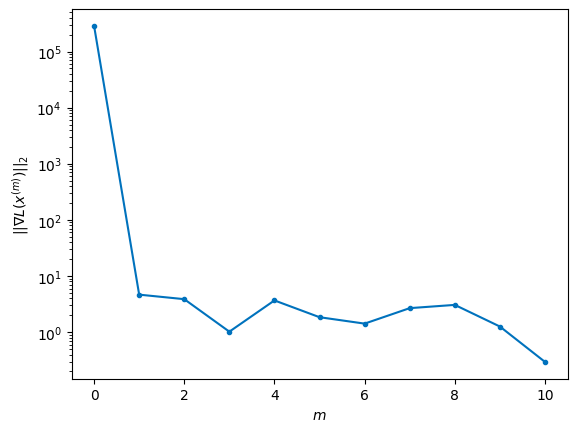


Windows:  37%|███▋      | 109/296 [21:42<48:48, 15.66s/it]

Before applying the algorithm
Cost function: 461.0611956006417
Gradient norm: 54601.65555934591
Global relative error: 1890353017.9894698
Position relative errors: 0.03745548411963175 m, 4.733523531383122 m, 3818.417178778711 m, 5725.6527873210525 m

Iteration 1
Cost function: 460.5074676628187 (-0.12%)
Gradient norm: 4.192348735992708 (-99.99%)
Global relative error: 6881.982200062154 (-0.00%)
Position relative errors: 0.03036490230786541 m, 4.690350215514978 m, 3818.3947271268694 m, 5725.511720059563 m

Iteration 2
Cost function: 460.5074681028492 (0.00%)
Gradient norm: 3.2252136080789593 (-23.07%)
Global relative error: 6881.982202600939 (0.00%)
Position relative errors: 0.030364903478809498 m, 4.69035428668172 m, 3818.3947229908026 m, 5725.511725866193 m

Iteration 3
Cost function: 460.5074677504783 (-0.00%)
Gradient norm: 3.2902691749120847 (2.02%)
Global relative error: 6881.982202608691 (0.00%)
Position relative errors: 0.030364907785837912 m, 4.690354286340796 m, 3818.394723006

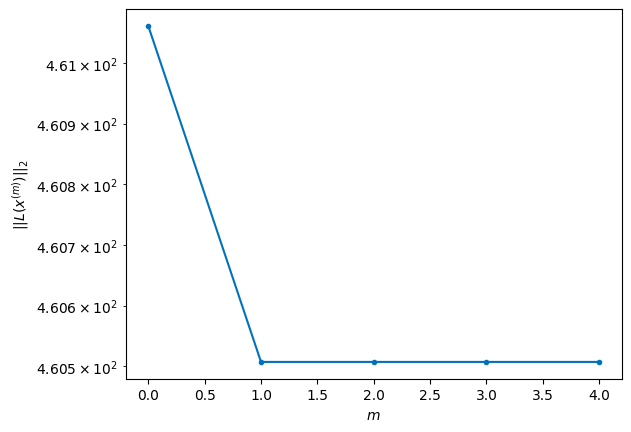

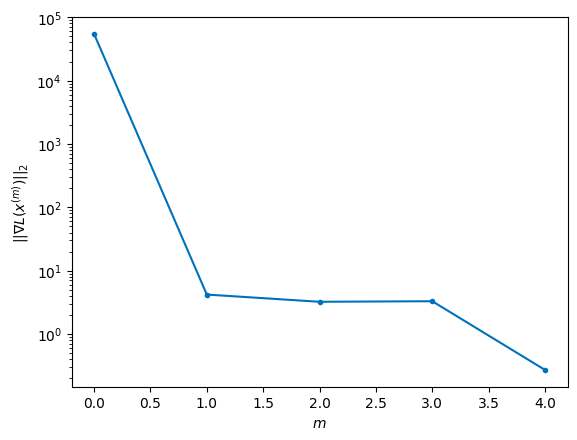


Windows:  37%|███▋      | 110/296 [21:51<42:07, 13.59s/it]

Before applying the algorithm
Cost function: 462.8743713347025
Gradient norm: 104356.05252577088
Global relative error: 1890522159.102781
Position relative errors: 0.030111245145249255 m, 4.35013994329939 m, 4004.591380914409 m, 6005.10413593144 m

Iteration 1
Cost function: 462.37863705255216 (-0.11%)
Gradient norm: 4.103518042325453 (-100.00%)
Global relative error: 7217.668258013131 (-0.00%)
Position relative errors: 0.03494651645120368 m, 4.137841072338695 m, 4004.580275499831 m, 6004.8335742362515 m

Iteration 2
Cost function: 462.37863800218 (0.00%)
Gradient norm: 3.264755292293496 (-20.44%)
Global relative error: 7217.668222725414 (-0.00%)
Position relative errors: 0.034946514776170716 m, 4.137808687988615 m, 4004.580277708385 m, 6004.833530370687 m

Iteration 3
Cost function: 462.37863743046034 (-0.00%)
Gradient norm: 11.373046404957934 (248.36%)
Global relative error: 7217.668222684283 (-0.00%)
Position relative errors: 0.03494652437659368 m, 4.137808657066574 m, 4004.58027771

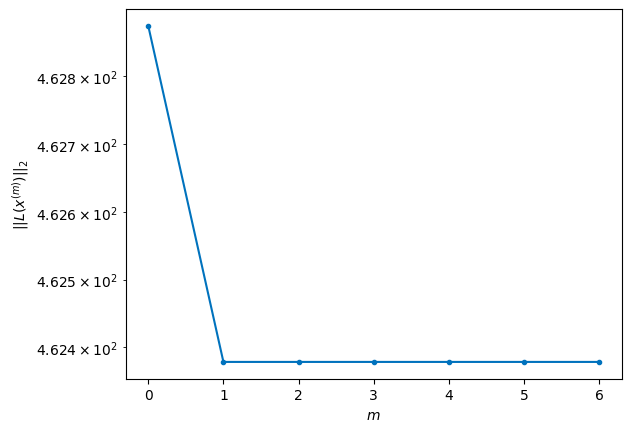

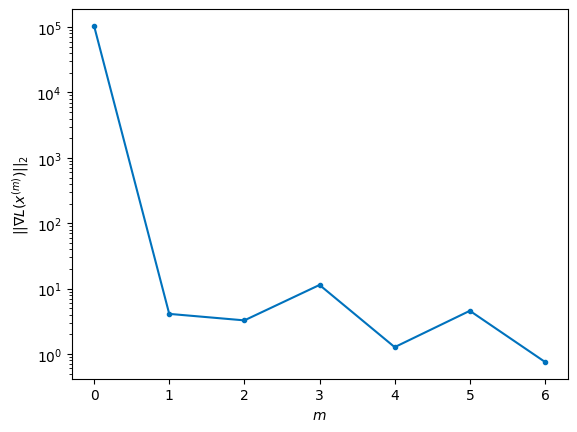


Windows:  38%|███▊      | 111/296 [22:04<41:02, 13.31s/it]

Before applying the algorithm
Cost function: 460.37771035012645
Gradient norm: 126232.1720767401
Global relative error: 1890733159.4330902
Position relative errors: 0.03429816412403417 m, 3.7814995072525264 m, 4173.339651372151 m, 6258.291915842097 m

Iteration 1
Cost function: 459.73723159014446 (-0.14%)
Gradient norm: 11.402218355743807 (-99.99%)
Global relative error: 7522.167681074312 (-0.00%)
Position relative errors: 0.042213227517885026 m, 3.7334110358653954 m, 4173.292123924867 m, 6258.322653794562 m

STOP on Iteration 2
Cost function = 459.7372319319121 (0.00%)
Gradient norm = 0.1933761976106683 (-98.30%)
Global relative error = 7522.16769672733 (0.00%)
Final position relative errors: 0.04221322126865337 m, 3.73341053874602 m, 4173.292118921367 m, 6258.322675945476 m



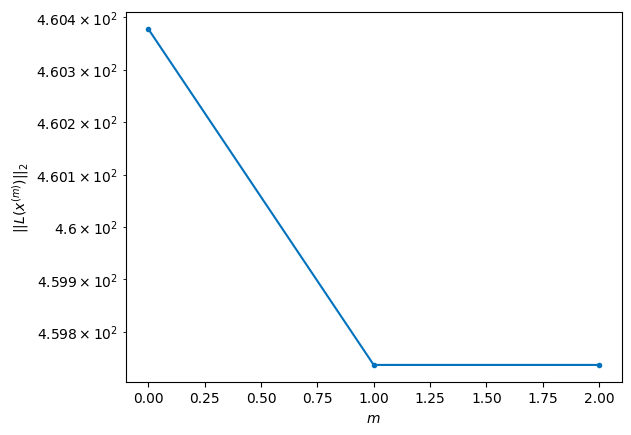

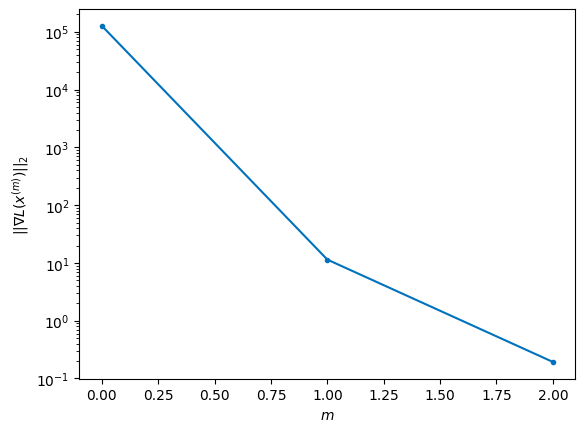


Windows:  38%|███▊      | 112/296 [22:10<34:19, 11.19s/it]

Before applying the algorithm
Cost function: 462.82556687977177
Gradient norm: 140772.74425168787
Global relative error: 1890985402.0244493
Position relative errors: 0.04113235349993733 m, 3.360196710128483 m, 4323.895154787896 m, 6484.525955093966 m

Iteration 1
Cost function: 462.3748478481932 (-0.10%)
Gradient norm: 3.1128966778258844 (-100.00%)
Global relative error: 7793.811072008152 (-0.00%)
Position relative errors: 0.049086064259104265 m, 3.4047371996263784 m, 4323.766587840908 m, 6484.481772961204 m

STOP on Iteration 2
Cost function = 462.37484749548184 (-0.00%)
Gradient norm = 0.49421091133617284 (-84.12%)
Global relative error = 7793.811068309829 (-0.00%)
Final position relative errors: 0.0490860599014808 m, 3.4047460296112835 m, 4323.766574665627 m, 6484.4817772965935 m



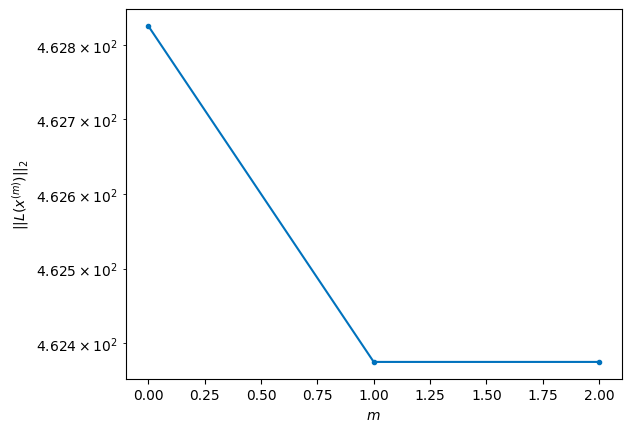

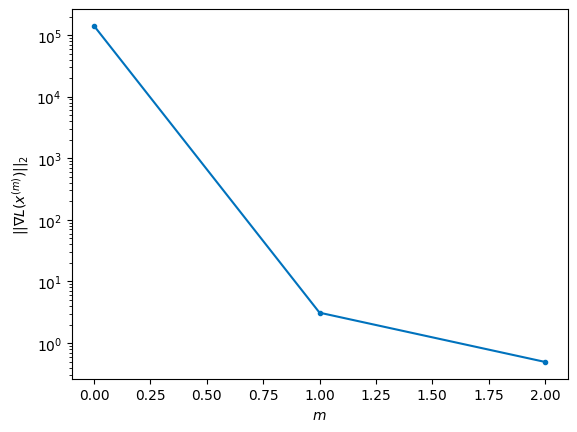


Windows:  38%|███▊      | 113/296 [22:15<29:02,  9.52s/it]

Before applying the algorithm
Cost function: 462.1769550351978
Gradient norm: 110487.9805967023
Global relative error: 1891278074.6344535
Position relative errors: 0.04759436151955548 m, 3.019961195186519 m, 4455.551980183865 m, 6682.503050738183 m

Iteration 1
Cost function: 461.9391476797464 (-0.05%)
Gradient norm: 1.450352681661835 (-100.00%)
Global relative error: 8031.640562933478 (-0.00%)
Position relative errors: 0.03835793496453881 m, 2.9743547280509364 m, 4455.559325189124 m, 6682.456050803048 m

STOP on Iteration 2
Cost function = 461.9391475177948 (-0.00%)
Gradient norm = 0.37023946032393745 (-74.47%)
Global relative error = 8031.640569077186 (0.00%)
Final position relative errors: 0.03835794085515808 m, 2.9743666187741704 m, 4455.559321547817 m, 6682.456060609736 m



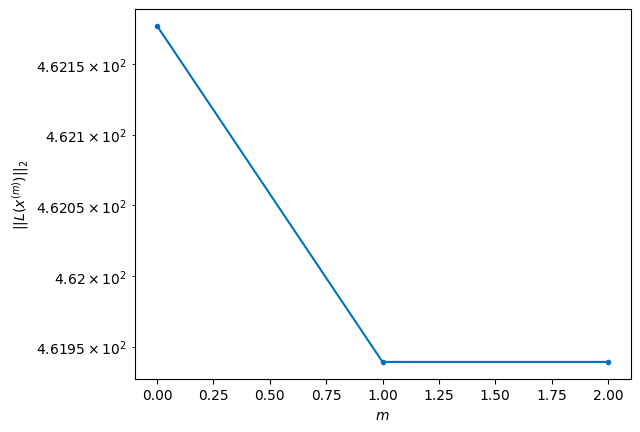

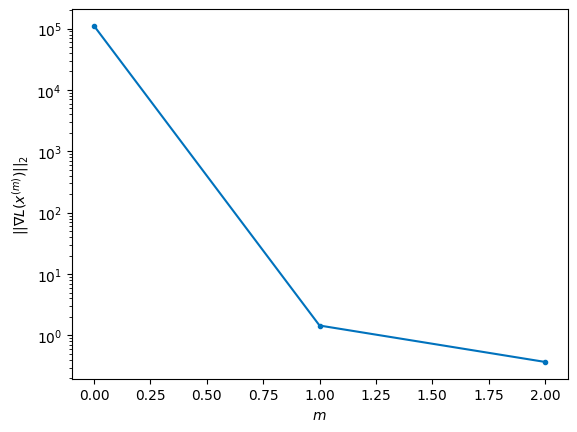


Windows:  39%|███▊      | 114/296 [22:21<25:28,  8.40s/it]

Before applying the algorithm
Cost function: 464.5403536808336
Gradient norm: 214131.32650004557
Global relative error: 1891610134.375976
Position relative errors: 0.03698113783538671 m, 2.56849617962847 m, 4567.975376016328 m, 6851.421870676092 m

Iteration 1
Cost function: 463.94300063802575 (-0.13%)
Gradient norm: 7.6250192819285365 (-100.00%)
Global relative error: 8234.60239843437 (0.00%)
Position relative errors: 0.04257036903211804 m, 2.772357283923321 m, 4567.758080718965 m, 6851.587083611333 m

STOP on Iteration 2
Cost function = 463.94300027541766 (-0.00%)
Gradient norm = 0.3143265915392596 (-95.88%)
Global relative error = 8234.60240443257 (0.00%)
Final position relative errors: 0.04257036834133693 m, 2.772373861177974 m, 4567.758058037975 m, 6851.587105934358 m



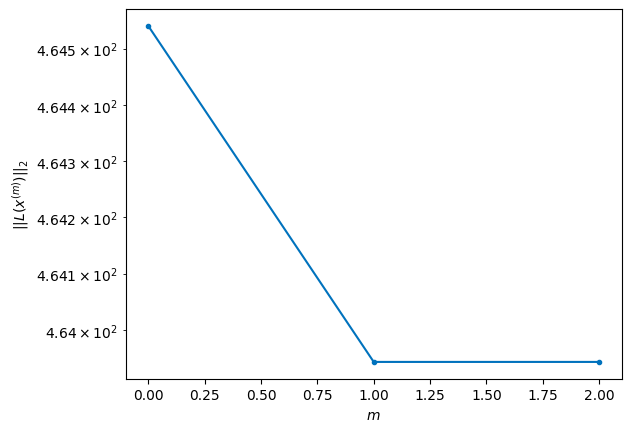

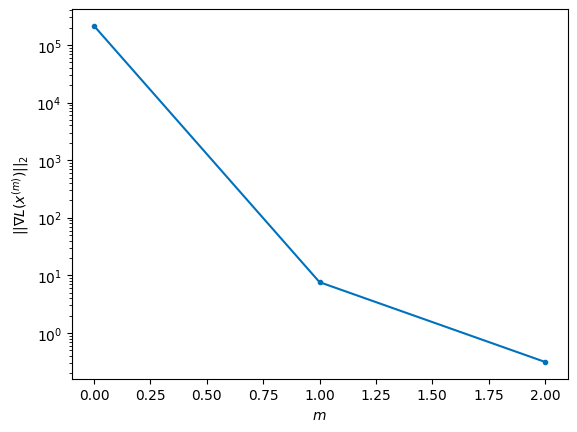


Windows:  39%|███▉      | 115/296 [22:27<22:47,  7.55s/it]

Before applying the algorithm
Cost function: 469.11512703087726
Gradient norm: 79180.80873772822
Global relative error: 1891980358.028139
Position relative errors: 0.04081987918926953 m, 2.3484689642529277 m, 4660.319893808491 m, 6990.765167890805 m

Iteration 1
Cost function: 468.6158575674343 (-0.11%)
Gradient norm: 6.487380981226237 (-99.99%)
Global relative error: 8401.617272876729 (-0.00%)
Position relative errors: 0.03714836999036137 m, 2.317416374631388 m, 4660.251519270507 m, 6990.6521181442595 m

Iteration 2
Cost function: 468.61585697140464 (-0.00%)
Gradient norm: 2.9509825255174587 (-54.51%)
Global relative error: 8401.617273226257 (0.00%)
Position relative errors: 0.03714838498110505 m, 2.3174236964262853 m, 4660.251510760032 m, 6990.6521242353365 m

Iteration 3
Cost function: 468.6158565837035 (-0.00%)
Gradient norm: 1.8308396531143922 (-37.96%)
Global relative error: 8401.617273239157 (0.00%)
Position relative errors: 0.03714837511161628 m, 2.3174236864953888 m, 4660.2515

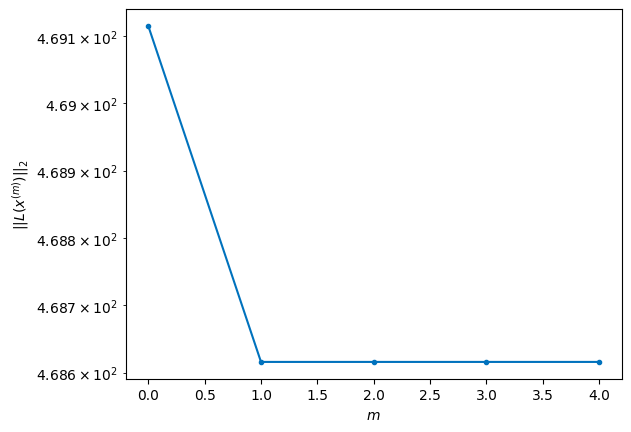

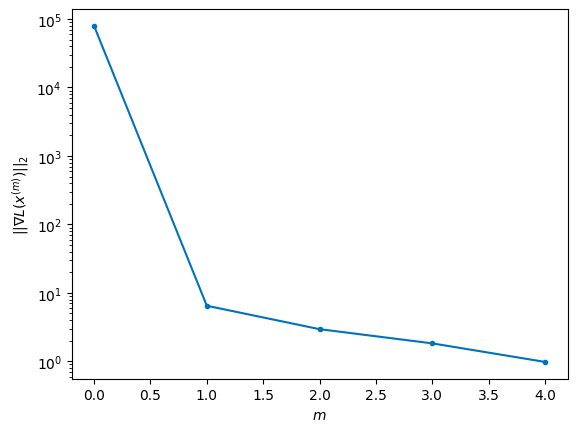


Windows:  39%|███▉      | 116/296 [22:36<24:07,  8.04s/it]

Before applying the algorithm
Cost function: 471.29252524347226
Gradient norm: 158674.85987546726
Global relative error: 1892387300.554623
Position relative errors: 0.03552250460178113 m, 1.8750020163947212 m, 4732.564043600759 m, 7099.483794951941 m

Iteration 1
Cost function: 470.02503966739636 (-0.27%)
Gradient norm: 10.771116993716056 (-99.99%)
Global relative error: 8532.36122976598 (0.00%)
Position relative errors: 0.03605209750933348 m, 2.0211102511812378 m, 4732.427748627287 m, 7099.669582220517 m

Iteration 2
Cost function: 470.025039881093 (0.00%)
Gradient norm: 1.561160786114114 (-85.51%)
Global relative error: 8532.361238279183 (0.00%)
Position relative errors: 0.03605209422909803 m, 2.021106114359962 m, 4732.427738687438 m, 7099.669599078444 m

Iteration 3
Cost function: 470.0250400732715 (0.00%)
Gradient norm: 6.149319365287571 (293.89%)
Global relative error: 8532.361238289935 (0.00%)
Position relative errors: 0.036052095505107795 m, 2.0211061078245063 m, 4732.4277386911

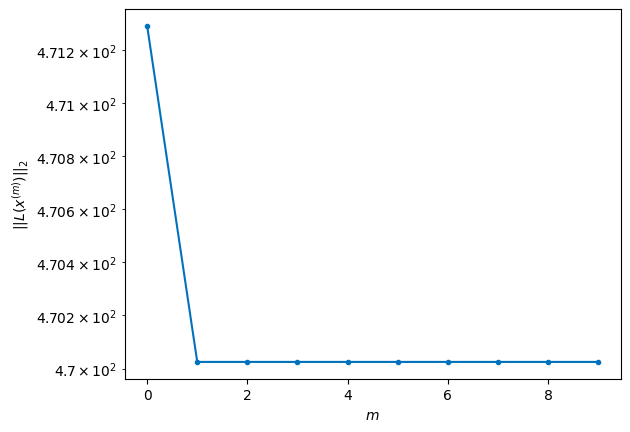

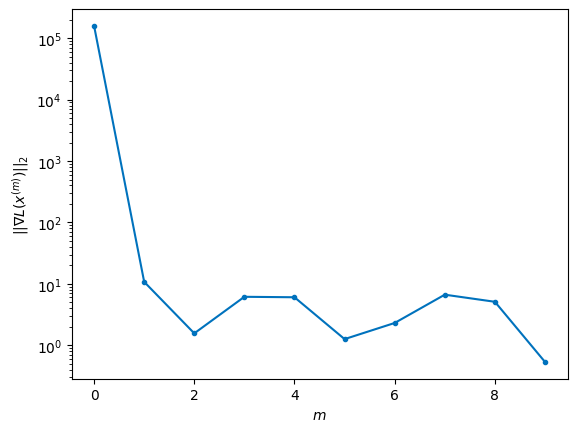


Windows:  40%|███▉      | 117/296 [22:53<32:20, 10.84s/it]

Before applying the algorithm
Cost function: 471.39596435567125
Gradient norm: 120581.57293142096
Global relative error: 1892829320.541221
Position relative errors: 0.034309892408210106 m, 1.5654441403859074 m, 4784.168303785324 m, 7177.654105828821 m

Iteration 1
Cost function: 470.768573454331 (-0.13%)
Gradient norm: 3.6401587642358493 (-100.00%)
Global relative error: 8625.888043039622 (-0.00%)
Position relative errors: 0.04163003545712797 m, 1.5164391723092334 m, 4784.24958005821 m, 7177.527194430457 m

Iteration 2
Cost function: 470.7685732419753 (-0.00%)
Gradient norm: 1.036524994380153 (-71.53%)
Global relative error: 8625.888047357761 (0.00%)
Position relative errors: 0.04163003477193011 m, 1.5164563799882687 m, 4784.249566435543 m, 7177.527208696648 m

Iteration 3
Cost function: 470.76857383484753 (0.00%)
Gradient norm: 2.4923405665336187 (140.45%)
Global relative error: 8625.888047387354 (0.00%)
Position relative errors: 0.04163002754404687 m, 1.516456384800908 m, 4784.249566

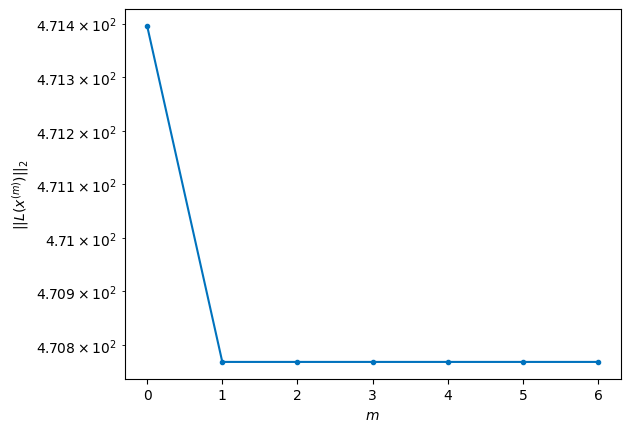

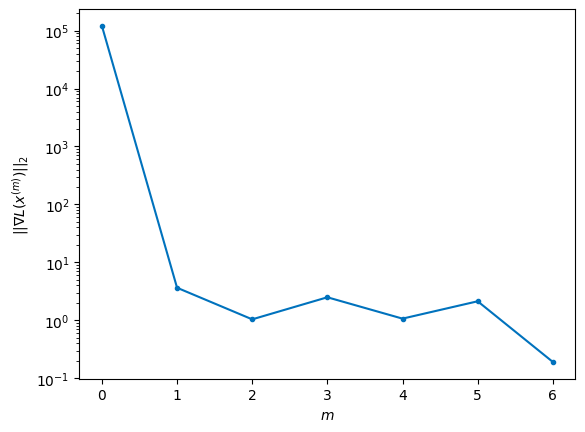


Windows:  40%|███▉      | 118/296 [23:06<33:31, 11.30s/it]

Before applying the algorithm
Cost function: 470.28365771264293
Gradient norm: 179910.29851825009
Global relative error: 1893304587.1026657
Position relative errors: 0.03968669266021447 m, 1.0654299888809764 m, 4815.197390307719 m, 7224.357722961304 m

Iteration 1
Cost function: 468.6474174011971 (-0.35%)
Gradient norm: 11.043249040651725 (-99.99%)
Global relative error: 8682.163829956706 (0.00%)
Position relative errors: 0.0492316602737254 m, 1.0960560305606468 m, 4815.38240341743 m, 7224.407206749149 m

Iteration 2
Cost function: 468.64741748231904 (0.00%)
Gradient norm: 1.7938989343378047 (-83.76%)
Global relative error: 8682.16383433648 (0.00%)
Position relative errors: 0.049231653766505026 m, 1.0960565031581393 m, 4815.3823703092385 m, 7224.4072340806615 m

Iteration 3
Cost function: 468.6474172450843 (-0.00%)
Gradient norm: 1.345443425925401 (-25.00%)
Global relative error: 8682.163834341462 (0.00%)
Position relative errors: 0.049231658690292925 m, 1.0960564906775778 m, 4815.3823

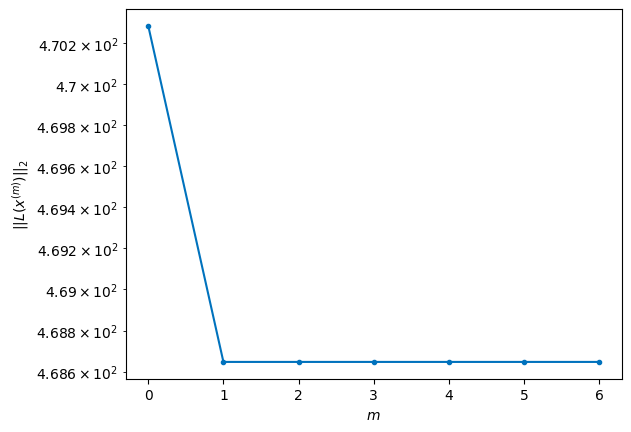

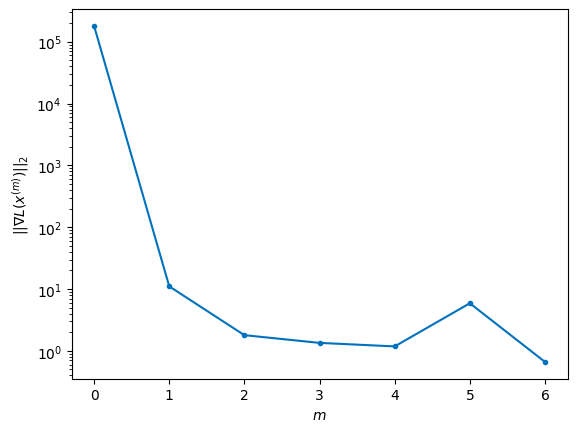


Windows:  40%|████      | 119/296 [23:18<34:20, 11.64s/it]

Before applying the algorithm
Cost function: 466.62945718179424
Gradient norm: 55445.6176997215
Global relative error: 1893811059.7831817
Position relative errors: 0.046723578554782035 m, 0.6452749161228414 m, 4825.40998167635 m, 7239.867861429623 m

Iteration 1
Cost function: 465.51999931860837 (-0.24%)
Gradient norm: 12.77076118310804 (-99.98%)
Global relative error: 8700.798592220115 (0.00%)
Position relative errors: 0.04108649068929433 m, 0.7751274416127727 m, 4825.587160929036 m, 7240.000282596266 m

Iteration 2
Cost function: 465.5199987658631 (-0.00%)
Gradient norm: 2.886151807707822 (-77.40%)
Global relative error: 8700.798569651266 (-0.00%)
Position relative errors: 0.04108649207906086 m, 0.7750803270324438 m, 4825.5871426945205 m, 7240.00026763242 m

Iteration 3
Cost function: 465.5199990018035 (0.00%)
Gradient norm: 1.3890346573002357 (-51.87%)
Global relative error: 8700.798569620118 (-0.00%)
Position relative errors: 0.04108647868965393 m, 0.7750803298119109 m, 4825.587142

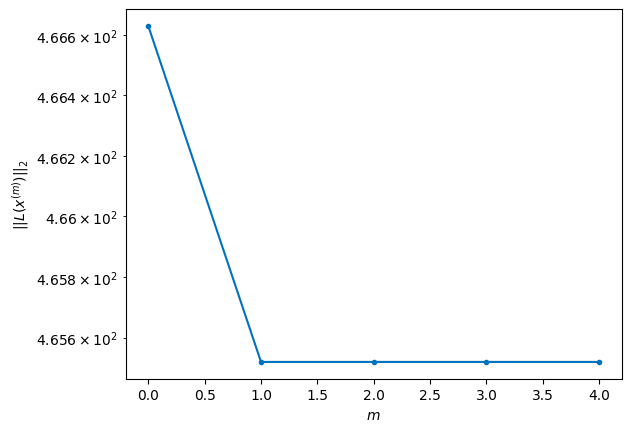

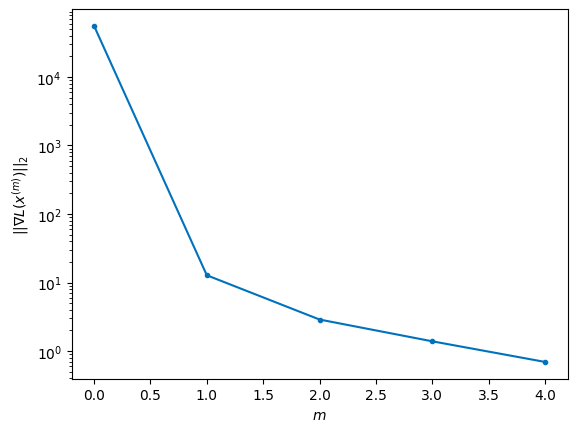


Windows:  41%|████      | 120/296 [23:27<32:06, 10.95s/it]

Before applying the algorithm
Cost function: 478.3004309091609
Gradient norm: 90027.46542936655
Global relative error: 1894346527.8349004
Position relative errors: 0.03879107396599868 m, 0.35632266119345213 m, 4814.651659424683 m, 7224.028518950881 m

Iteration 1
Cost function: 476.6743565870597 (-0.34%)
Gradient norm: 14.655579633499938 (-99.98%)
Global relative error: 8681.487739257806 (0.00%)
Position relative errors: 0.04861296957363409 m, 0.3656711648596459 m, 4814.581866385044 m, 7224.128340298713 m

STOP on Iteration 2
Cost function = 476.6743565047656 (-0.00%)
Gradient norm = 0.8355054187772064 (-94.30%)
Global relative error = 8681.48778224268 (0.00%)
Final position relative errors: 0.04861297118277606 m, 0.365808006393917 m, 4814.5817969988475 m, 7224.128438191226 m



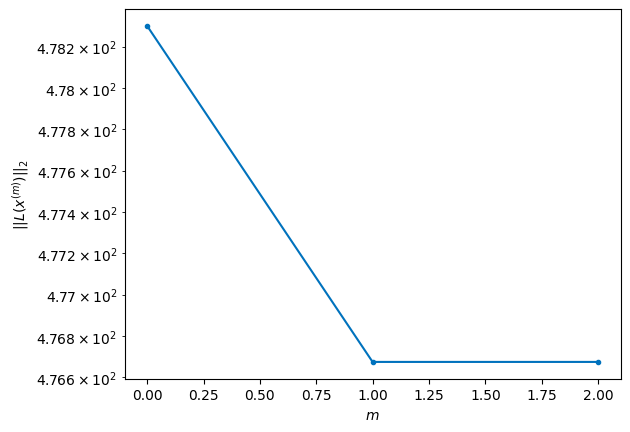

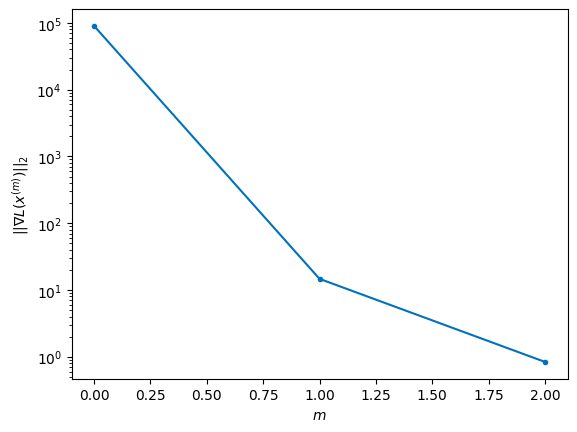


Windows:  41%|████      | 121/296 [23:34<28:06,  9.64s/it]

Before applying the algorithm
Cost function: 476.0287104288746
Gradient norm: 270695.51074305724
Global relative error: 1894908611.5314114
Position relative errors: 0.0458999036778493 m, 0.2128414450177383 m, 4782.715516651077 m, 7176.852963110035 m

Iteration 1
Cost function: 475.2856823788363 (-0.16%)
Gradient norm: 8.22496620139053 (-100.00%)
Global relative error: 8624.099745862806 (-0.00%)
Position relative errors: 0.05682644507337107 m, 0.17796545323561994 m, 4782.596235883129 m, 7176.480198614467 m

Iteration 2
Cost function: 475.2856822845372 (-0.00%)
Gradient norm: 3.9948165976528687 (-51.43%)
Global relative error: 8624.099638032414 (-0.00%)
Position relative errors: 0.056826446990550845 m, 0.1779672936111413 m, 4782.596225941458 m, 7176.480075658177 m

Iteration 3
Cost function: 475.2856822851864 (0.00%)
Gradient norm: 1.6608484206576926 (-58.42%)
Global relative error: 8624.099638017526 (-0.00%)
Position relative errors: 0.05682644482895548 m, 0.1779672930146243 m, 4782.596

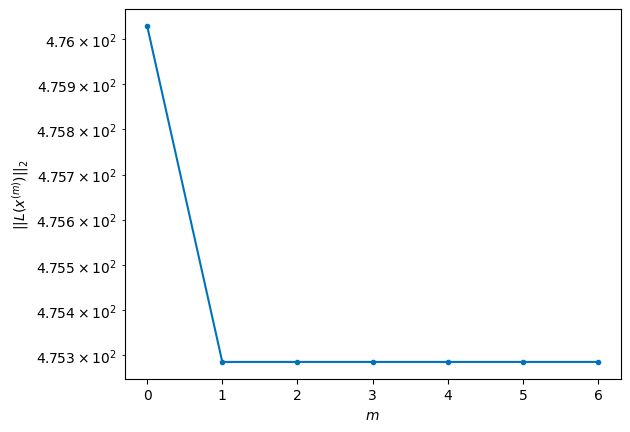

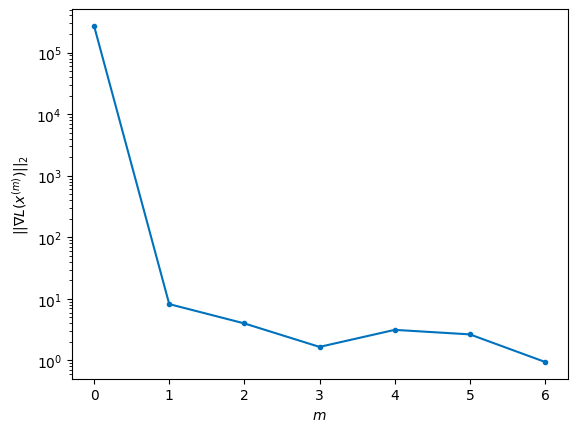


Windows:  41%|████      | 122/296 [23:46<30:12, 10.42s/it]

Before applying the algorithm
Cost function: 472.8430818169678
Gradient norm: 182074.8164222354
Global relative error: 1895494740.6502829
Position relative errors: 0.0535578718441889 m, 0.4913611353920601 m, 4729.950164192093 m, 7098.0875924332295 m

Iteration 1
Cost function: 472.3395914014945 (-0.11%)
Gradient norm: 10.78026016008343 (-99.99%)
Global relative error: 8529.42449696874 (-0.00%)
Position relative errors: 0.04478778651103487 m, 0.5544180374340022 m, 4730.213445483012 m, 7097.616441620023 m

Iteration 2
Cost function: 472.3395916100263 (0.00%)
Gradient norm: 10.20765902997056 (-5.31%)
Global relative error: 8529.42444876495 (-0.00%)
Position relative errors: 0.04478779712481691 m, 0.5544040773855815 m, 4730.213420639192 m, 7097.616400250324 m

Iteration 3
Cost function: 472.3395917789145 (0.00%)
Gradient norm: 5.099076218710182 (-50.05%)
Global relative error: 8529.424448779171 (0.00%)
Position relative errors: 0.04478778097381521 m, 0.5544040706817536 m, 4730.213420636191

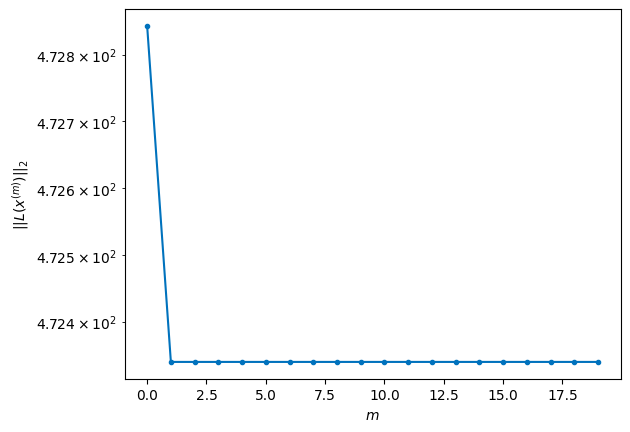

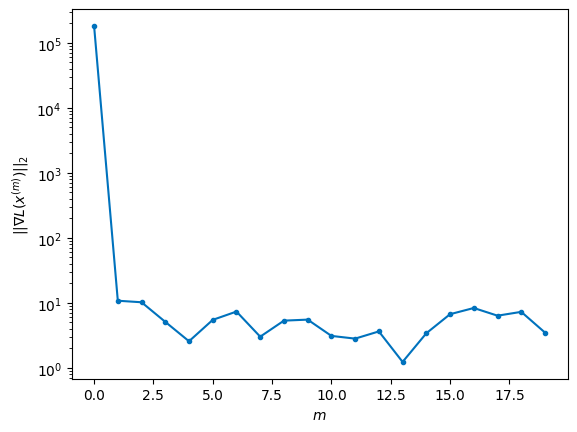


Windows:  42%|████▏     | 123/296 [24:22<51:28, 17.85s/it]

Before applying the algorithm
Cost function: 479.5895639084326
Gradient norm: 182989.94136561017
Global relative error: 1896102231.5376122
Position relative errors: 0.04209606851545401 m, 0.99493741862096 m, 4657.035581037489 m, 6988.435915348927 m

Iteration 1
Cost function: 478.6681270194176 (-0.19%)
Gradient norm: 19.2985406278013 (-99.99%)
Global relative error: 8398.325391011806 (0.00%)
Position relative errors: 0.038164629773290756 m, 0.6884554356713808 m, 4656.847817520401 m, 6988.964949794741 m

Iteration 2
Cost function: 478.6681268613671 (-0.00%)
Gradient norm: 2.597654860401025 (-86.54%)
Global relative error: 8398.325390478907 (-0.00%)
Position relative errors: 0.038164635279318126 m, 0.6884403605810276 m, 4656.84778215946 m, 6988.964972717383 m

Iteration 3
Cost function: 478.66812695250616 (0.00%)
Gradient norm: 1.8940436544895394 (-27.09%)
Global relative error: 8398.325390484913 (0.00%)
Position relative errors: 0.03816463415176748 m, 0.6884403534629671 m, 4656.84778216

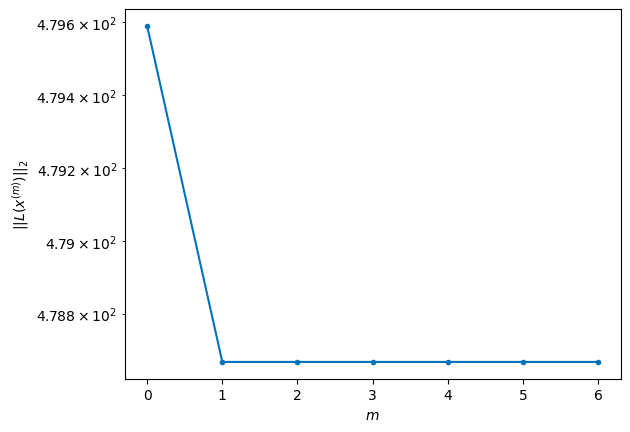

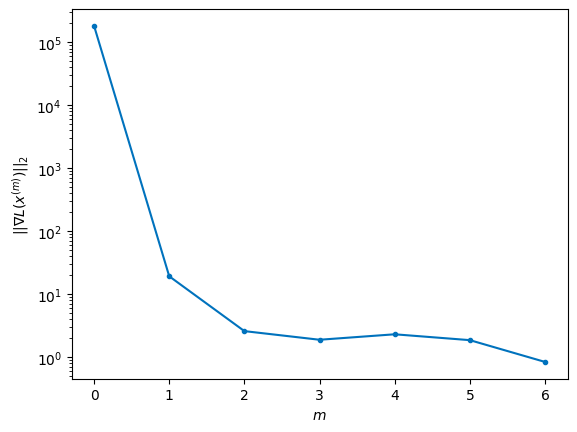


Windows:  42%|████▏     | 124/296 [24:35<47:33, 16.59s/it]

Before applying the algorithm
Cost function: 478.5043925884638
Gradient norm: 69634.57496129363
Global relative error: 1896728246.7448955
Position relative errors: 0.03578892585955873 m, 1.1196308343598296 m, 4563.4308254401685 m, 6849.445948193745 m

Iteration 1
Cost function: 477.49014434390676 (-0.21%)
Gradient norm: 15.768198436660931 (-99.98%)
Global relative error: 8230.594106852634 (0.00%)
Position relative errors: 0.03805853798268353 m, 0.7723544789884705 m, 4562.941434236687 m, 6849.980629353541 m

Iteration 2
Cost function: 477.4901444734402 (0.00%)
Gradient norm: 3.475178605759531 (-77.96%)
Global relative error: 8230.594136035554 (0.00%)
Position relative errors: 0.03805853265530325 m, 0.7721203583078068 m, 4562.941216802202 m, 6849.980809283187 m

Iteration 3
Cost function: 477.49014439449394 (-0.00%)
Gradient norm: 3.762566832680538 (8.27%)
Global relative error: 8230.59413602238 (-0.00%)
Position relative errors: 0.03805854033105898 m, 0.7721203592796715 m, 4562.94121680

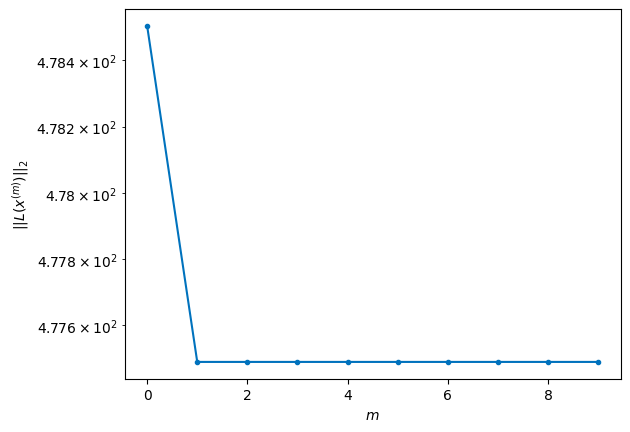

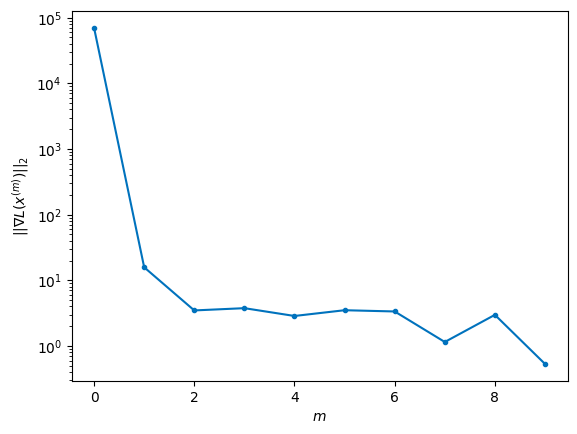


Windows:  42%|████▏     | 125/296 [24:54<49:27, 17.36s/it]

Before applying the algorithm
Cost function: 483.6511276258706
Gradient norm: 330560.60645365476
Global relative error: 1897369833.2178328
Position relative errors: 0.03570201853457616 m, 1.1447177397491506 m, 4449.676653133655 m, 6680.773547397594 m

Iteration 1
Cost function: 482.91888367172373 (-0.15%)
Gradient norm: 4.69287593154152 (-100.00%)
Global relative error: 8026.8670207464 (-0.00%)
Position relative errors: 0.047224390020511646 m, 1.1213845770407693 m, 4449.522384225857 m, 6680.743212509195 m

Iteration 2
Cost function: 482.91888404481585 (0.00%)
Gradient norm: 1.622626955516587 (-65.42%)
Global relative error: 8026.867016593589 (-0.00%)
Position relative errors: 0.04722439760330302 m, 1.121391428687345 m, 4449.522363468837 m, 6680.743221343111 m

Iteration 3
Cost function: 482.91888370340905 (-0.00%)
Gradient norm: 3.109837561407669 (91.65%)
Global relative error: 8026.867016603312 (0.00%)
Position relative errors: 0.04722439865352186 m, 1.1213914282434716 m, 4449.5223634

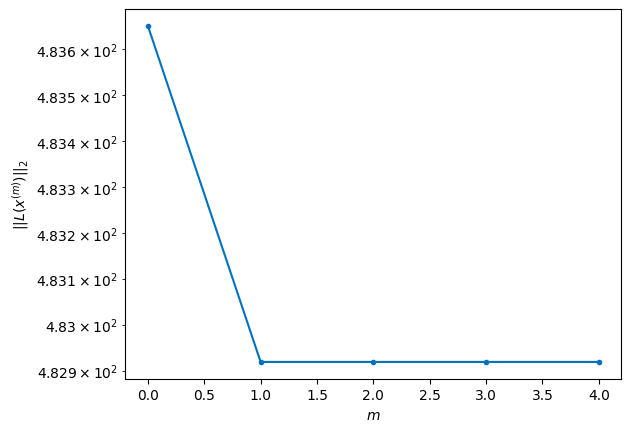

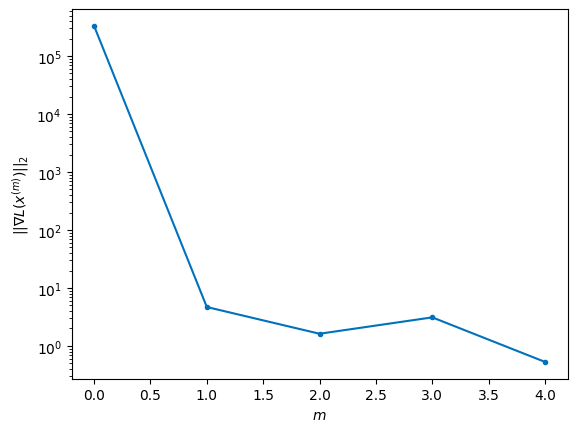


Windows:  43%|████▎     | 126/296 [25:03<42:11, 14.89s/it]

Before applying the algorithm
Cost function: 486.70571400272405
Gradient norm: 100892.98713816438
Global relative error: 1898023936.8083208
Position relative errors: 0.04427508301804245 m, 1.499608968270744 m, 4316.914420960087 m, 6482.573007749414 m

Iteration 1
Cost function: 486.3191347931386 (-0.08%)
Gradient norm: 12.882248055542407 (-99.99%)
Global relative error: 7788.714776178701 (0.00%)
Position relative errors: 0.0457766973181031 m, 1.1619526229200887 m, 4316.712856954845 m, 6483.058574750832 m

STOP on Iteration 2
Cost function = 486.3191344853164 (-0.00%)
Gradient norm = 0.1273435758679275 (-99.01%)
Global relative error = 7788.714752729678 (-0.00%)
Final position relative errors: 0.04577669834411363 m, 1.161931661609481 m, 4316.712814715818 m, 6483.058574707713 m



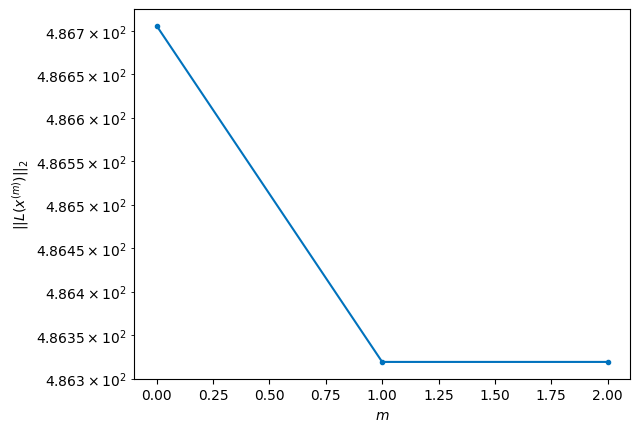

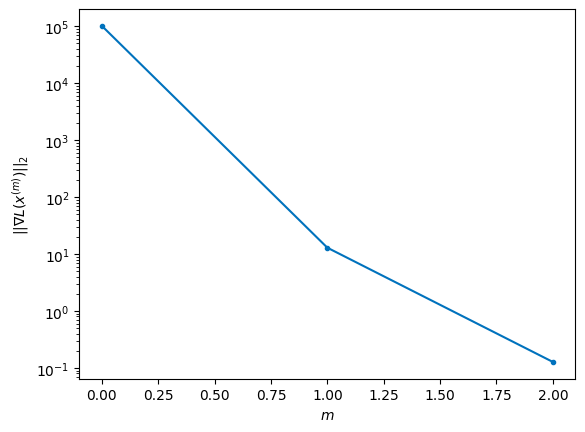


Windows:  43%|████▎     | 127/296 [25:09<34:17, 12.17s/it]

Before applying the algorithm
Cost function: 488.4603713728229
Gradient norm: 212022.75667255008
Global relative error: 1898687408.926361
Position relative errors: 0.042820650030977674 m, 1.5135393924181304 m, 4165.332686334037 m, 6256.758609008157 m

Iteration 1
Cost function: 487.8543379377603 (-0.12%)
Gradient norm: 7.972810424394542 (-100.00%)
Global relative error: 7516.738528014028 (0.00%)
Position relative errors: 0.043038911730263855 m, 1.1579030992619885 m, 4164.9958390098145 m, 6257.327164874539 m

Iteration 2
Cost function: 487.8543384654293 (0.00%)
Gradient norm: 1.608687688132412 (-79.82%)
Global relative error: 7516.7384950791275 (-0.00%)
Position relative errors: 0.04303891619488152 m, 1.15789237131194 m, 4164.9957835350315 m, 6257.327162237903 m

Iteration 3
Cost function: 487.85433763475777 (-0.00%)
Gradient norm: 1.5381195817294218 (-4.39%)
Global relative error: 7516.738495067692 (-0.00%)
Position relative errors: 0.043038904950338346 m, 1.1578923765031581 m, 4164.99

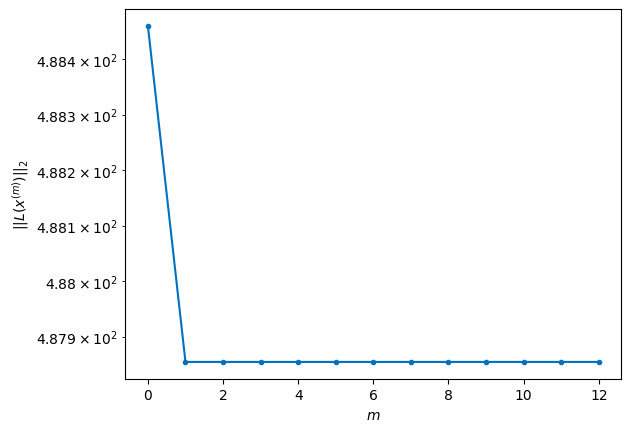

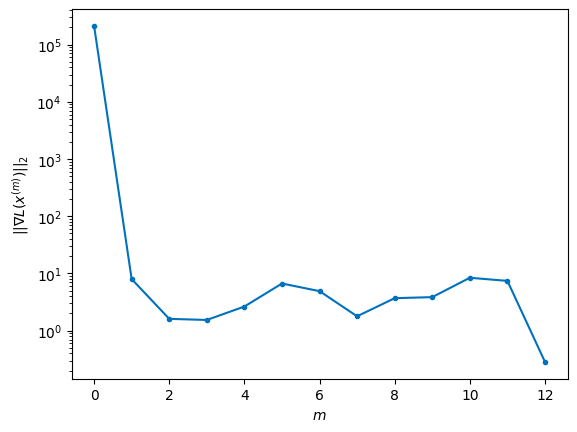


Windows:  43%|████▎     | 128/296 [25:34<44:39, 15.95s/it]

Before applying the algorithm
Cost function: 490.40089033603914
Gradient norm: 379910.4915102917
Global relative error: 1899357039.2706928
Position relative errors: 0.04028924825347392 m, 1.499287790570758 m, 3995.4970275863457 m, 6003.864701990847 m

Iteration 1
Cost function: 489.4919824969088 (-0.19%)
Gradient norm: 12.346903538003277 (-100.00%)
Global relative error: 7211.813787560081 (-0.00%)
Position relative errors: 0.03396116184961636 m, 1.4649069782539086 m, 3994.973078050841 m, 6004.19998661344 m

Iteration 2
Cost function: 489.4919829494799 (0.00%)
Gradient norm: 3.1547491230801183 (-74.45%)
Global relative error: 7211.8137192499225 (-0.00%)
Position relative errors: 0.03396115758745967 m, 1.4648906088504527 m, 3994.9729083107113 m, 6004.200017507019 m

STOP on Iteration 3
Cost function = 489.49198282919383 (-0.00%)
Gradient norm = 0.3923501021938818 (-87.56%)
Global relative error = 7211.813719254036 (0.00%)
Final position relative errors: 0.033961162264497274 m, 1.46489060

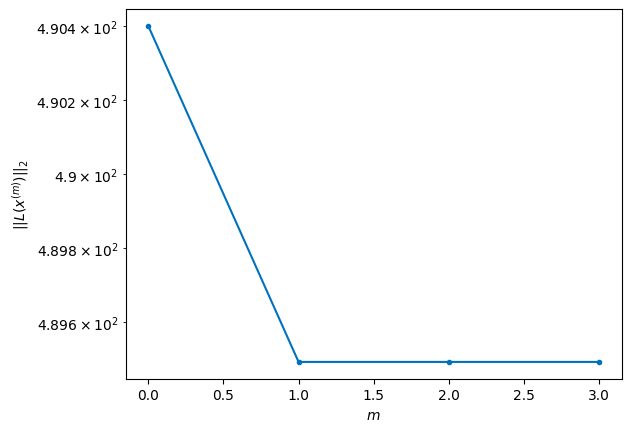

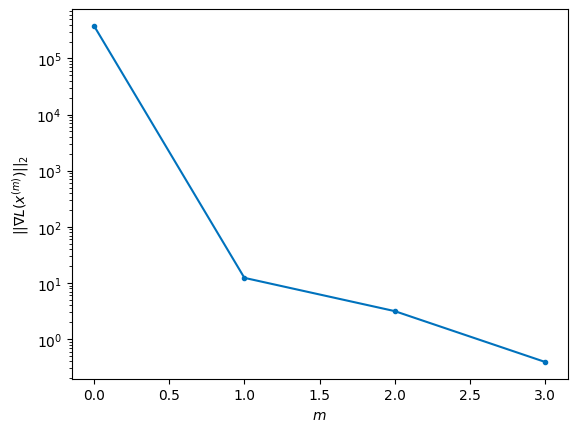


Windows:  44%|████▎     | 129/296 [25:42<38:00, 13.66s/it]

Before applying the algorithm
Cost function: 488.3822636369501
Gradient norm: 86566.44167056613
Global relative error: 1900029567.407413
Position relative errors: 0.03177356548619598 m, 1.7855945503814898 m, 3808.0906207278013 m, 5724.696651221531 m

Iteration 1
Cost function: 487.407573795324 (-0.20%)
Gradient norm: 14.35177024421708 (-99.98%)
Global relative error: 6875.062666116409 (-0.01%)
Position relative errors: 0.025928279630696528 m, 2.00742949952508 m, 3807.9539656943307 m, 5724.153642871788 m

STOP on Iteration 2
Cost function = 487.4075739923274 (0.00%)
Gradient norm = 0.2930334351735232 (-97.96%)
Global relative error = 6875.0625507566565 (-0.00%)
Final position relative errors: 0.025928278385524542 m, 2.007520296972738 m, 3807.953966696317 m, 5724.153503619208 m



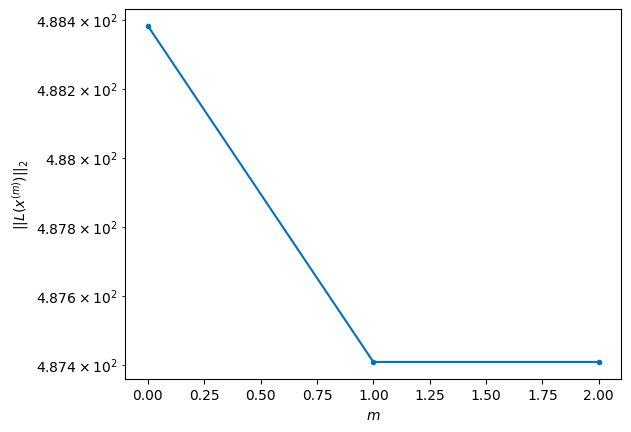

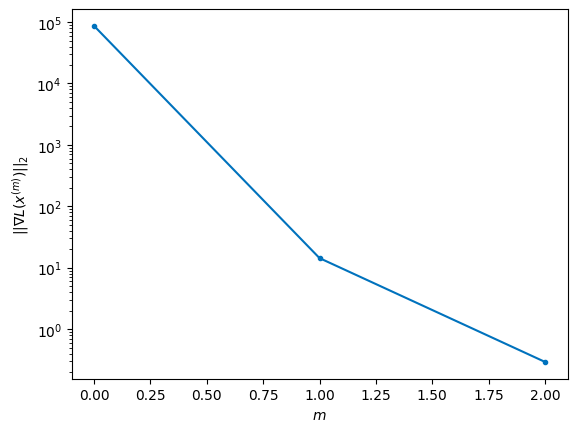


Windows:  44%|████▍     | 130/296 [25:48<31:14, 11.29s/it]

Before applying the algorithm
Cost function: 481.08954856194015
Gradient norm: 79328.25166135689
Global relative error: 1900701715.774655
Position relative errors: 0.024178191680349355 m, 2.3212729806378314 m, 3604.521130189319 m, 5419.799660653738 m

Iteration 1
Cost function: 479.79978406477295 (-0.27%)
Gradient norm: 28.77238567741241 (-99.96%)
Global relative error: 6509.20673307426 (0.00%)
Position relative errors: 0.021869407964491144 m, 2.963373350983272 m, 3604.5353041452786 m, 5420.0598273997675 m

Iteration 2
Cost function: 479.7997841406669 (0.00%)
Gradient norm: 2.17389781398737 (-92.44%)
Global relative error: 6509.206496008735 (-0.00%)
Position relative errors: 0.021869415427251848 m, 2.9636003042603813 m, 3604.5352970652393 m, 5420.059547280928 m

Iteration 3
Cost function: 479.79978455577503 (0.00%)
Gradient norm: 4.772644121428092 (119.54%)
Global relative error: 6509.206496003349 (-0.00%)
Position relative errors: 0.021869420211186444 m, 2.9636003037130787 m, 3604.535

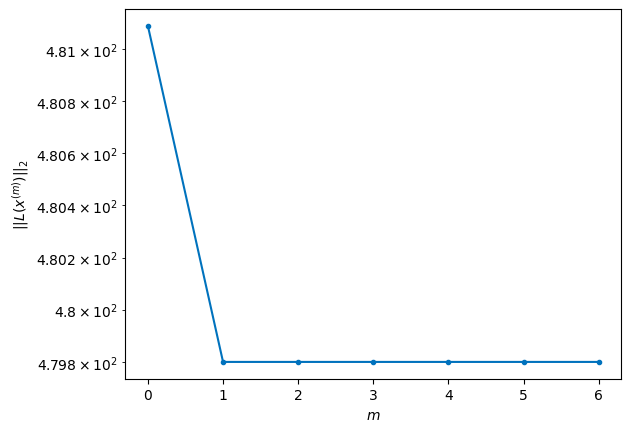

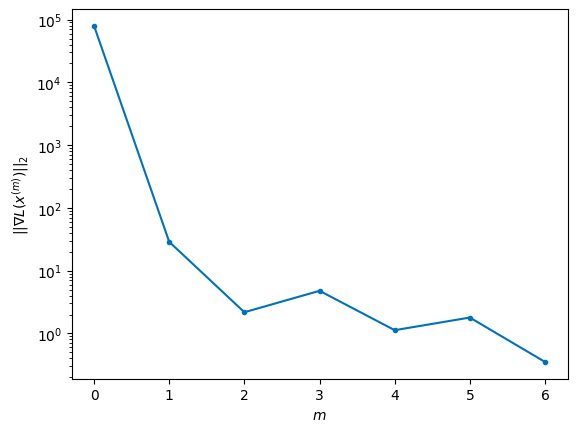


Windows:  44%|████▍     | 131/296 [26:02<33:01, 12.01s/it]

Before applying the algorithm
Cost function: 472.3695628363327
Gradient norm: 81342.6527082883
Global relative error: 1901370192.0964668
Position relative errors: 0.020671916620332513 m, 3.2749295122321262 m, 3385.4327571591693 m, 5092.132135041437 m

Iteration 1
Cost function: 471.66167179072323 (-0.15%)
Gradient norm: 37.75302438202693 (-99.95%)
Global relative error: 6114.510273403257 (-0.01%)
Position relative errors: 0.023695422837708535 m, 4.078012903780578 m, 3385.5277794643794 m, 5091.6966402208445 m

Iteration 2
Cost function: 471.6616715497403 (-0.00%)
Gradient norm: 4.685280705244079 (-87.59%)
Global relative error: 6114.510098810305 (-0.00%)
Position relative errors: 0.02369541576055729 m, 4.078309782309493 m, 3385.527779678751 m, 5091.696430175515 m

Iteration 3
Cost function: 471.6616714248552 (-0.00%)
Gradient norm: 6.069499006007561 (29.54%)
Global relative error: 6114.5100987995975 (-0.00%)
Position relative errors: 0.02369542440031432 m, 4.078309775148365 m, 3385.5277

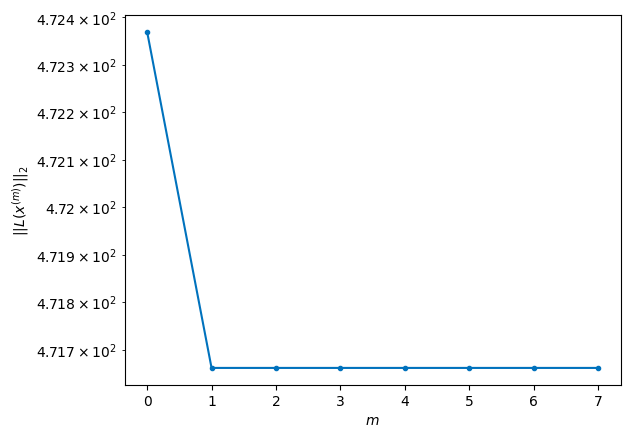

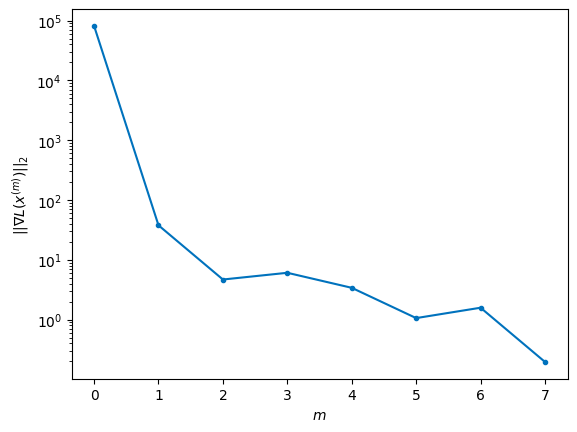


Windows:  45%|████▍     | 132/296 [26:16<34:26, 12.60s/it]

Before applying the algorithm
Cost function: 466.0194227780887
Gradient norm: 102699.66022433857
Global relative error: 1902031715.8367996
Position relative errors: 0.02209412493465447 m, 4.377210805188921 m, 3151.7068665187726 m, 4741.64692691537 m

Iteration 1
Cost function: 464.63162433961685 (-0.30%)
Gradient norm: 54.68901536937619 (-99.95%)
Global relative error: 5693.6400288983095 (0.00%)
Position relative errors: 0.021452567666571404 m, 5.366936360745581 m, 3151.80006339686 m, 4741.688738629143 m

STOP on Iteration 2
Cost function = 464.63162383844326 (-0.00%)
Gradient norm = 0.3455516072609504 (-99.37%)
Global relative error = 5693.6399095738625 (-0.00%)
Final position relative errors: 0.021452557730274446 m, 5.366722016273971 m, 3151.7999966430775 m, 4741.688639962747 m



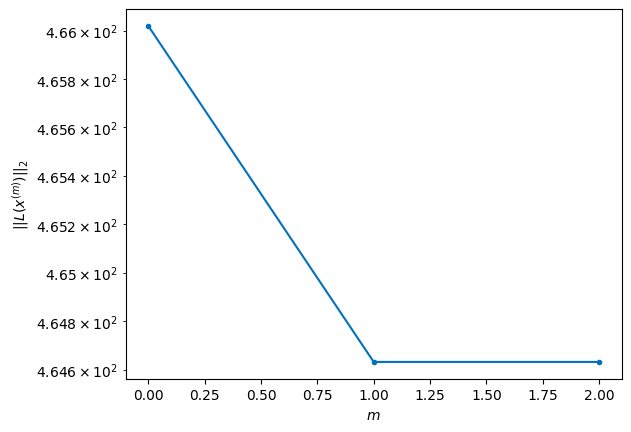

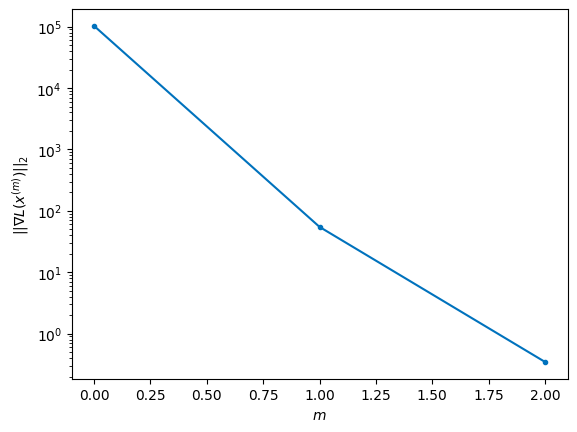


Windows:  45%|████▍     | 133/296 [26:21<28:32, 10.51s/it]

Before applying the algorithm
Cost function: 465.2452991007872
Gradient norm: 198985.48122482852
Global relative error: 1902683026.9703016
Position relative errors: 0.020253162590751835 m, 5.6462545729648985 m, 2904.2712870663104 m, 4371.001627203691 m

Iteration 1
Cost function: 464.6805782346938 (-0.12%)
Gradient norm: 5.991532871398779 (-100.00%)
Global relative error: 5248.044695275666 (0.00%)
Position relative errors: 0.015941755283807098 m, 5.689797619308094 m, 2904.4062635449864 m, 4371.076167814259 m

Iteration 2
Cost function: 464.6805775954918 (-0.00%)
Gradient norm: 1.123150195865381 (-81.25%)
Global relative error: 5248.0446907032165 (-0.00%)
Position relative errors: 0.015941753124802394 m, 5.689814776692992 m, 2904.406253379187 m, 4371.076169056889 m

STOP on Iteration 3
Cost function = 464.68057797599175 (0.00%)
Gradient norm = 0.7089964708358848 (-36.87%)
Global relative error = 5248.044690692017 (-0.00%)
Final position relative errors: 0.015941759778544118 m, 5.6898147

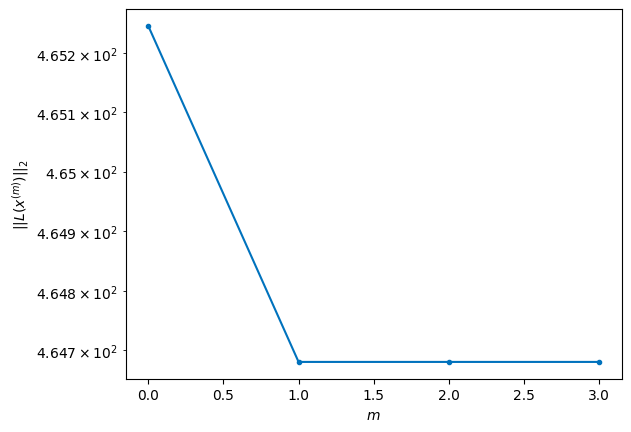

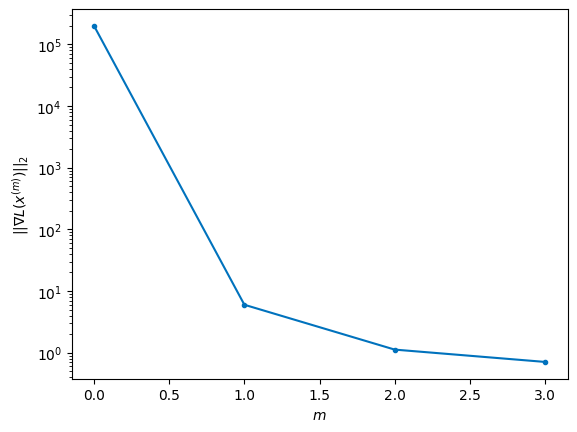


Windows:  45%|████▌     | 134/296 [26:29<25:55,  9.60s/it]

Before applying the algorithm
Cost function: 471.5379053035445
Gradient norm: 268761.1445752579
Global relative error: 1903320948.1728432
Position relative errors: 0.015597553327220801 m, 5.961217649196738 m, 2644.234462590824 m, 3981.3513572163256 m

Iteration 1
Cost function: 470.6278464357192 (-0.19%)
Gradient norm: 10.507918494148228 (-100.00%)
Global relative error: 4779.262621452716 (-0.00%)
Position relative errors: 0.014953962328251068 m, 6.143397199006177 m, 2644.394695427152 m, 3981.008206450517 m

Iteration 2
Cost function: 470.62784703018366 (0.00%)
Gradient norm: 4.142729035913196 (-60.58%)
Global relative error: 4779.262656381676 (0.00%)
Position relative errors: 0.014953961314192842 m, 6.143325873336916 m, 2644.3946751439607 m, 3981.008261966541 m

Iteration 3
Cost function: 470.62784697240727 (-0.00%)
Gradient norm: 3.7000942783046775 (-10.68%)
Global relative error: 4779.26265638001 (-0.00%)
Position relative errors: 0.014953963605432963 m, 6.143325877505347 m, 2644.39

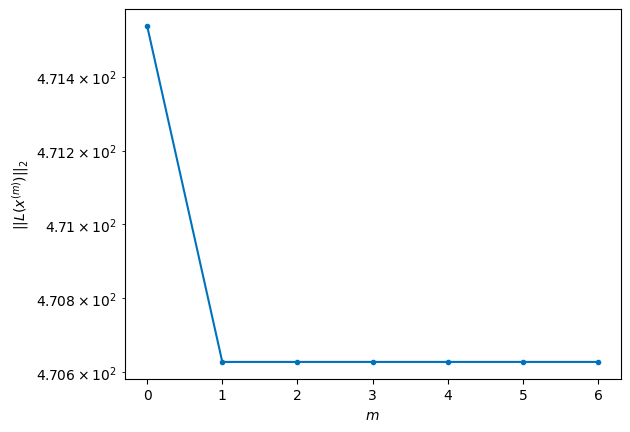

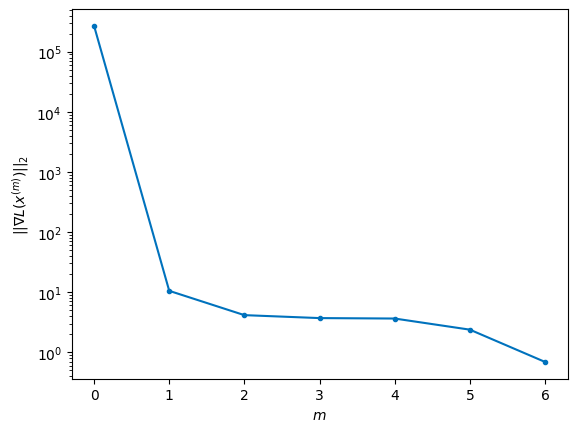


Windows:  46%|████▌     | 135/296 [26:41<28:08, 10.49s/it]

Before applying the algorithm
Cost function: 471.86819992512557
Gradient norm: 45493.15360904758
Global relative error: 1903942347.0929995
Position relative errors: 0.015323202648959417 m, 6.397859446654912 m, 2372.716199131642 m, 3573.9749410227664 m

Iteration 1
Cost function: 471.03415357791397 (-0.18%)
Gradient norm: 86.51736508344253 (-99.81%)
Global relative error: 4289.178520826514 (-0.02%)
Position relative errors: 0.015803505609552772 m, 7.520070145779443 m, 2372.8282440768457 m, 3573.0397103037167 m

Iteration 2
Cost function: 471.03415249526387 (-0.00%)
Gradient norm: 2.255802350185977 (-97.39%)
Global relative error: 4289.1783603240565 (-0.00%)
Position relative errors: 0.015803507035530757 m, 7.520201128228688 m, 2372.8282140630754 m, 3573.039537288307 m

STOP on Iteration 3
Cost function = 471.03415388213915 (0.00%)
Gradient norm = 0.60209341102543 (-73.31%)
Global relative error = 4289.178360327566 (0.00%)
Final position relative errors: 0.01580351203686226 m, 7.52020113

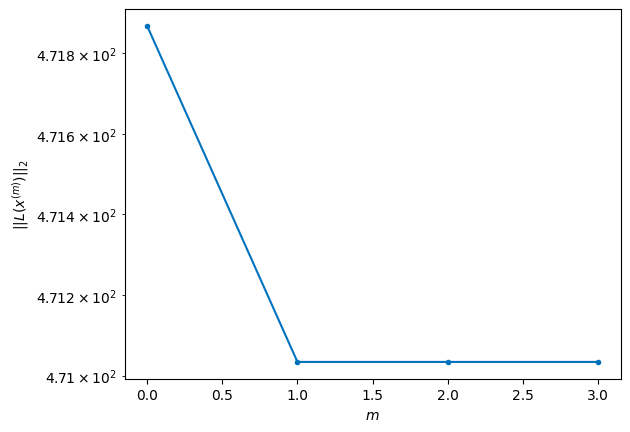

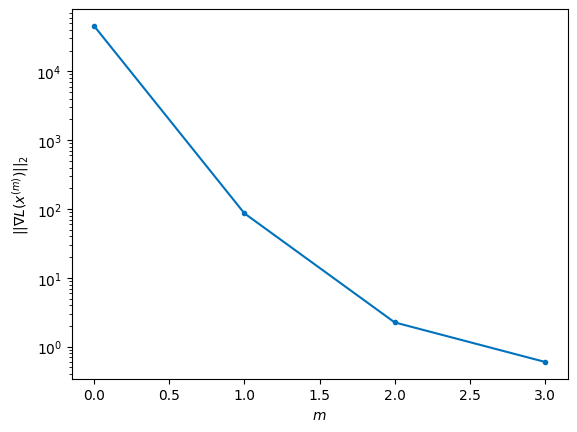


Windows:  46%|████▌     | 136/296 [26:48<25:10,  9.44s/it]

Before applying the algorithm
Cost function: 474.29122121515866
Gradient norm: 60125.54319874223
Global relative error: 1904544216.8921926
Position relative errors: 0.016284313945389033 m, 7.743261716945603 m, 2090.821496186129 m, 3150.4559367305687 m

Iteration 1
Cost function: 473.6296852729139 (-0.14%)
Gradient norm: 33.61000707189808 (-99.94%)
Global relative error: 3780.567840956376 (-0.02%)
Position relative errors: 0.016999522098838662 m, 8.419113411221506 m, 2091.0048397376495 m, 3149.642350317548 m

Iteration 2
Cost function: 473.62968504098484 (-0.00%)
Gradient norm: 2.0092480713083294 (-94.02%)
Global relative error: 3780.5678615849856 (0.00%)
Position relative errors: 0.01699952280953174 m, 8.418986731856617 m, 2091.0048236244334 m, 3149.6423861143576 m

Iteration 3
Cost function: 473.62968438708646 (-0.00%)
Gradient norm: 2.1710661096260337 (8.05%)
Global relative error: 3780.5678615870056 (0.00%)
Position relative errors: 0.01699952215661161 m, 8.418986722720915 m, 2091.0

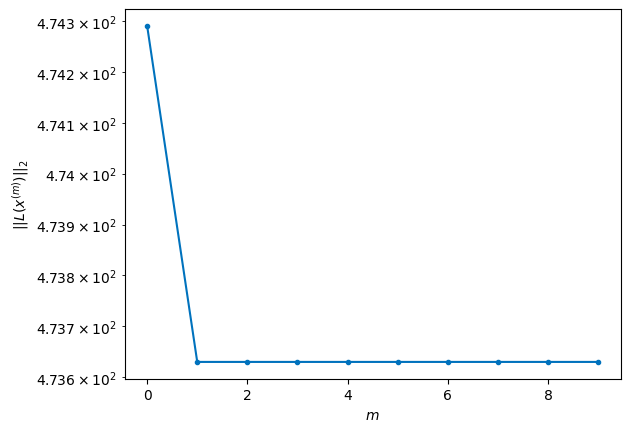

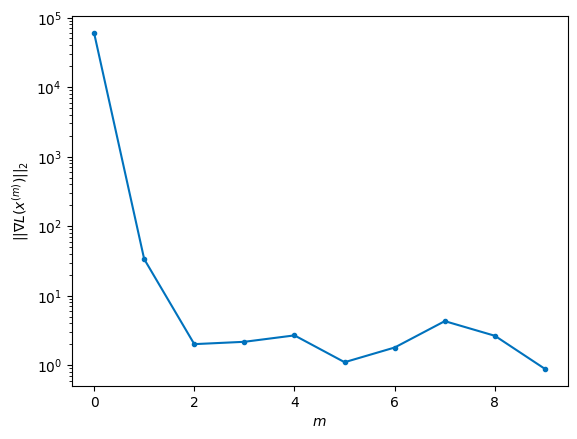


Windows:  46%|████▋     | 137/296 [27:07<32:14, 12.17s/it]

Before applying the algorithm
Cost function: 473.15173842930415
Gradient norm: 106018.35993900055
Global relative error: 1905123635.6718662
Position relative errors: 0.017689495272420357 m, 8.60990574501341 m, 1799.895200968189 m, 2713.3459371787426 m

Iteration 1
Cost function: 472.68031536753244 (-0.10%)
Gradient norm: 2.276480151156087 (-100.00%)
Global relative error: 3255.9283624897894 (-0.00%)
Position relative errors: 0.022640446843687982 m, 8.669777098756965 m, 1799.8577688535418 m, 2713.195116351709 m

Iteration 2
Cost function: 472.6803150357566 (-0.00%)
Gradient norm: 3.6344069799705196 (59.65%)
Global relative error: 3255.928357231847 (-0.00%)
Position relative errors: 0.02264044927165284 m, 8.66978954490601 m, 1799.8577652037982 m, 2713.195112423387 m

Iteration 3
Cost function: 472.680315149563 (0.00%)
Gradient norm: 5.96933503987024 (64.25%)
Global relative error: 3255.9283572352547 (0.00%)
Position relative errors: 0.02264044904165547 m, 8.669789544663766 m, 1799.857765

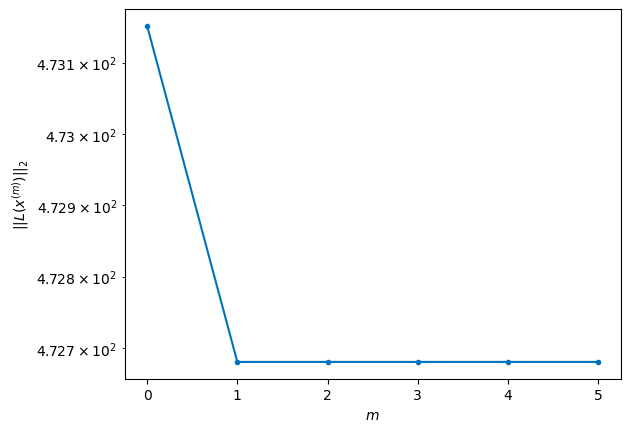

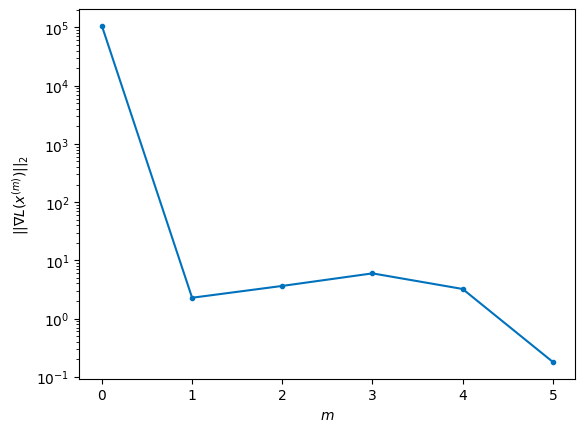


Windows:  47%|████▋     | 138/296 [27:18<31:11, 11.84s/it]

Before applying the algorithm
Cost function: 473.21898746592956
Gradient norm: 65784.00371868614
Global relative error: 1905677814.3495536
Position relative errors: 0.023552643531172757 m, 8.829297970598807 m, 1500.8984110248618 m, 2265.0928979420805 m

Iteration 1
Cost function: 472.76591755247154 (-0.10%)
Gradient norm: 16.890496422359067 (-99.97%)
Global relative error: 2716.819410812598 (-0.02%)
Position relative errors: 0.03221418661522779 m, 9.298194034472733 m, 1500.9202006445 m, 2264.5479239365504 m

STOP on Iteration 2
Cost function = 472.765916179701 (-0.00%)
Gradient norm = 0.6762966200672548 (-96.00%)
Global relative error = 2716.8194124768543 (0.00%)
Final position relative errors: 0.03221418884229893 m, 9.298145430615602 m, 1500.9201861982715 m, 2264.547935707591 m



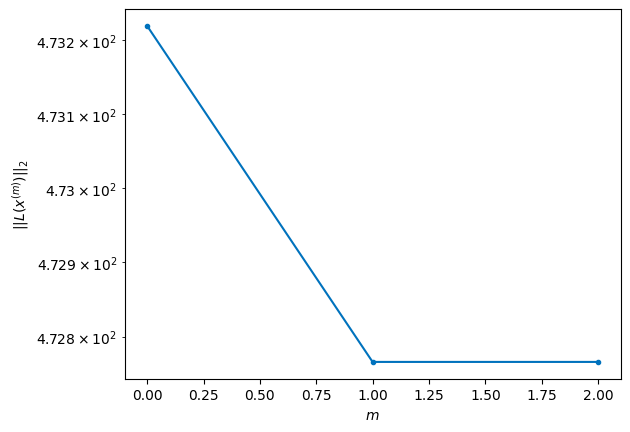

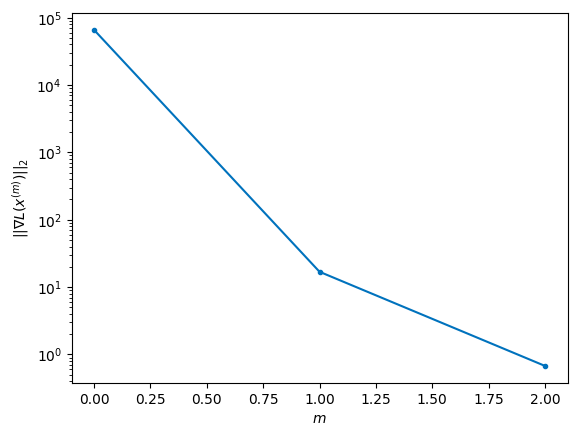


Windows:  47%|████▋     | 139/296 [27:24<26:06,  9.98s/it]

Before applying the algorithm
Cost function: 472.6096208022919
Gradient norm: 234756.86187988066
Global relative error: 1906204130.7003362
Position relative errors: 0.0327256599156702 m, 9.41627519103384 m, 1195.4140273547594 m, 1806.577842701013 m

Iteration 1
Cost function: 472.37373650374366 (-0.05%)
Gradient norm: 2.7961342977294787 (-100.00%)
Global relative error: 2166.1038001376482 (-0.01%)
Position relative errors: 0.022950863163827065 m, 9.571681214809557 m, 1195.4354463625573 m, 1806.3118192199322 m

Iteration 2
Cost function: 472.37373703631175 (0.00%)
Gradient norm: 1.2467078905934048 (-55.41%)
Global relative error: 2166.1038113318314 (0.00%)
Position relative errors: 0.022950868833777626 m, 9.57165439626266 m, 1195.435441129971 m, 1806.3118362489136 m

STOP on Iteration 3
Cost function = 472.3737362747457 (-0.00%)
Gradient norm = 0.3664199690111215 (-70.61%)
Global relative error = 2166.10381131921 (-0.00%)
Final position relative errors: 0.02295087068950145 m, 9.57165441

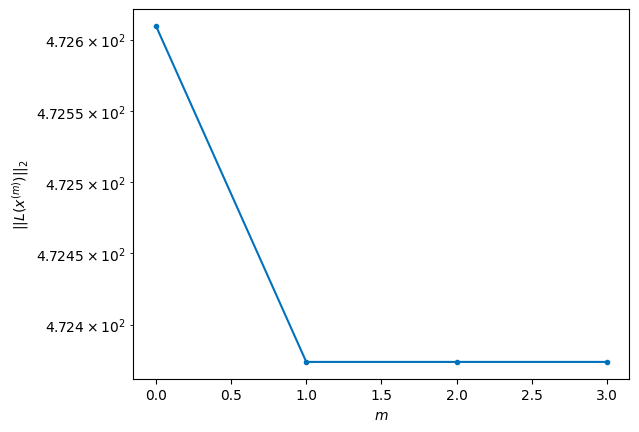

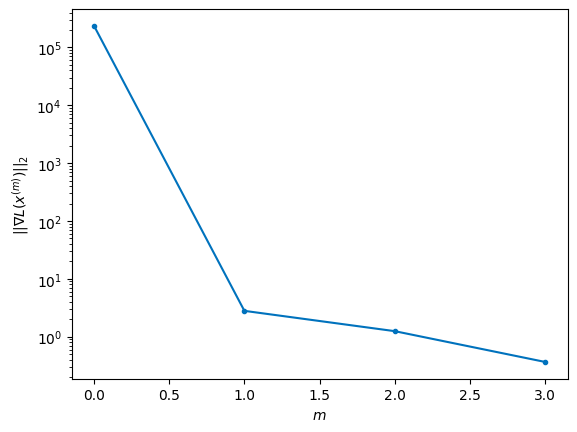


Windows:  47%|████▋     | 140/296 [27:31<23:35,  9.07s/it]

Before applying the algorithm
Cost function: 467.271888033508
Gradient norm: 160508.36787502377
Global relative error: 1906700104.758784
Position relative errors: 0.02356193103576107 m, 9.646894404431102 m, 884.7126321388511 m, 1340.471900038671 m

Iteration 1
Cost function: 466.6548824233726 (-0.13%)
Gradient norm: 6.867752711786654 (-100.00%)
Global relative error: 1605.9373187299614 (-0.01%)
Position relative errors: 0.03447199658733661 m, 9.926052307599159 m, 884.6669352386533 m, 1340.2284278232987 m

Iteration 2
Cost function: 466.65488218653053 (-0.00%)
Gradient norm: 4.757742445450923 (-30.72%)
Global relative error: 1605.937289408028 (-0.00%)
Position relative errors: 0.03447199979109316 m, 9.926106887242645 m, 884.6669179337972 m, 1340.2284037066684 m

Iteration 3
Cost function: 466.65488236882624 (0.00%)
Gradient norm: 1.1472551790039414 (-75.89%)
Global relative error: 1605.9372894112882 (0.00%)
Position relative errors: 0.03447199630003505 m, 9.926106878143369 m, 884.666917

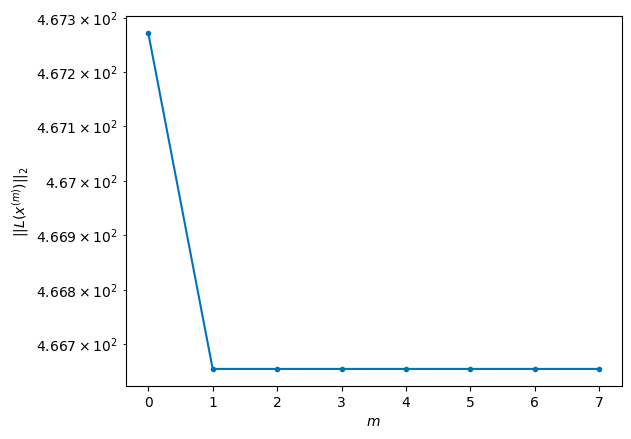

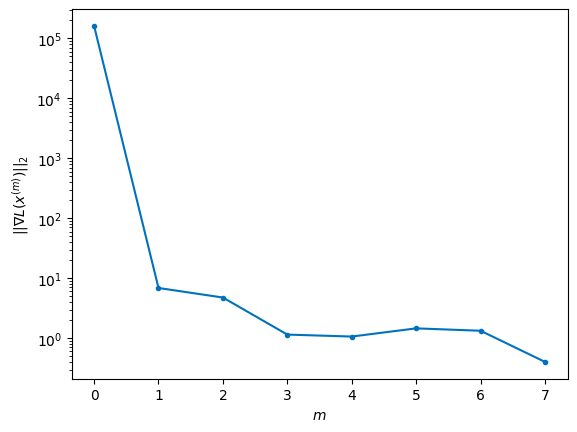


Windows:  48%|████▊     | 141/296 [27:44<27:04, 10.48s/it]

Before applying the algorithm
Cost function: 465.16020898527717
Gradient norm: 199190.1148452547
Global relative error: 1907163437.2728488
Position relative errors: 0.034566224624686524 m, 9.952701069099215 m, 570.0808663942694 m, 868.5514564746047 m

Iteration 1
Cost function: 464.1269698255761 (-0.22%)
Gradient norm: 4.982880911194516 (-100.00%)
Global relative error: 1039.2380935295153 (0.02%)
Position relative errors: 0.05086713634302792 m, 9.947228887304403 m, 569.9734668182367 m, 868.8826028921688 m

Iteration 2
Cost function: 464.1269702585208 (0.00%)
Gradient norm: 1.3203276967812938 (-73.50%)
Global relative error: 1039.2380545620806 (-0.00%)
Position relative errors: 0.05086714291585101 m, 9.947292598774856 m, 569.9734629675099 m, 868.8825580811932 m

Iteration 3
Cost function: 464.1269693351119 (-0.00%)
Gradient norm: 3.8603282898648423 (192.38%)
Global relative error: 1039.238054549013 (-0.00%)
Position relative errors: 0.050867147157275264 m, 9.947292616712279 m, 569.97346

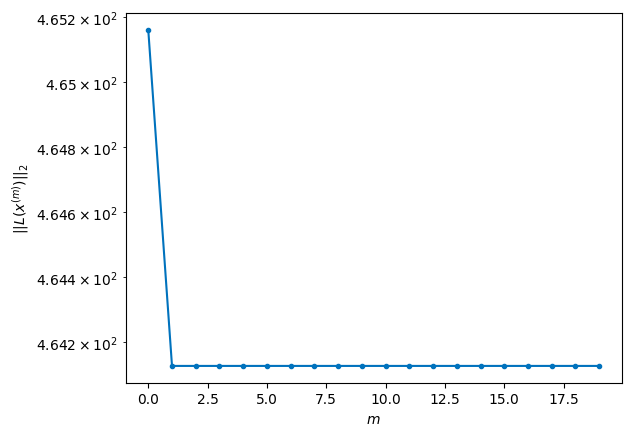

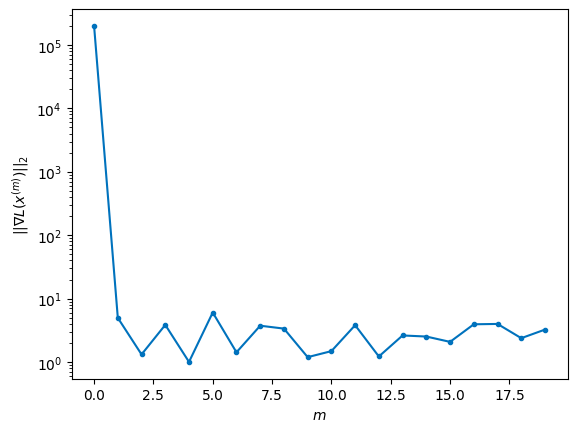


Windows:  48%|████▊     | 142/296 [28:18<44:53, 17.49s/it]

Before applying the algorithm
Cost function: 456.87408542854325
Gradient norm: 17495.884949926254
Global relative error: 1907592016.313966
Position relative errors: 0.05027682574519617 m, 9.920607677233766 m, 252.89416092874774 m, 393.4296365503376 m

Iteration 1
Cost function: 456.6466518478132 (-0.05%)
Gradient norm: 9.486980710829346 (-99.95%)
Global relative error: 467.68984195887157 (-0.05%)
Position relative errors: 0.057306661125662135 m, 9.994781857383655 m, 252.9173385746075 m, 393.16094547681837 m

Iteration 2
Cost function: 456.64665151240354 (-0.00%)
Gradient norm: 4.442396788051573 (-53.17%)
Global relative error: 467.68984268650195 (0.00%)
Position relative errors: 0.05730665612472828 m, 9.994775224231875 m, 252.9173361855198 m, 393.1609480478613 m

Iteration 3
Cost function: 456.64665200976486 (0.00%)
Gradient norm: 2.194224239672774 (-50.61%)
Global relative error: 467.6898426758511 (-0.00%)
Position relative errors: 0.057306650823627736 m, 9.994775219408915 m, 252.9173

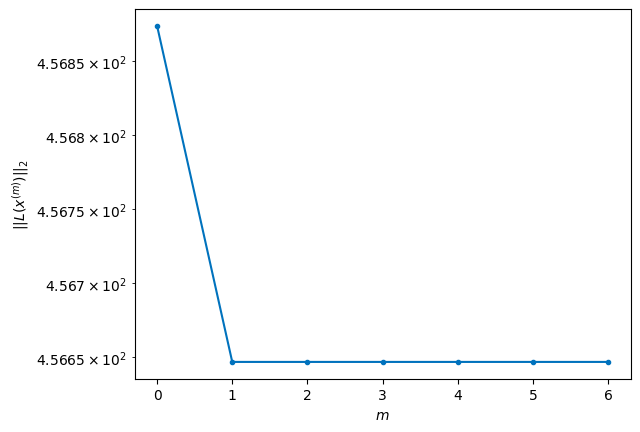

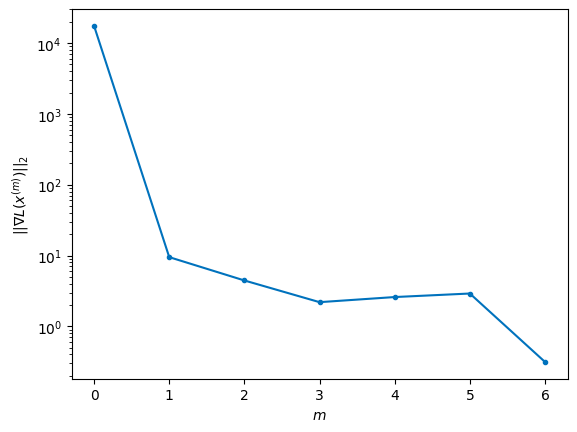


Windows:  48%|████▊     | 143/296 [28:31<40:53, 16.04s/it]

Before applying the algorithm
Cost function: 454.1752904880709
Gradient norm: 156965.90521057224
Global relative error: 1907983942.4121652
Position relative errors: 0.056403112034928815 m, 9.929065684421714 m, 65.27445394452545 m, 84.0455629075377 m

Iteration 1
Cost function: 453.4949013405532 (-0.15%)
Gradient norm: 6.1624895724495286 (-100.00%)
Global relative error: 107.65854152969064 (0.33%)
Position relative errors: 0.05182629697670529 m, 9.981902328859102 m, 65.3160529662326 m, 84.45770180845611 m

Iteration 2
Cost function: 453.4949007461119 (-0.00%)
Gradient norm: 4.258588033017275 (-30.90%)
Global relative error: 107.65853251367083 (-0.00%)
Position relative errors: 0.0518263029665236 m, 9.981915904275047 m, 65.31605252464826 m, 84.45768905115402 m

Iteration 3
Cost function: 453.4949008994391 (0.00%)
Gradient norm: 3.658142256207283 (-14.10%)
Global relative error: 107.65853250754274 (-0.00%)
Position relative errors: 0.05182629699314694 m, 9.98191590764399 m, 65.31605252277

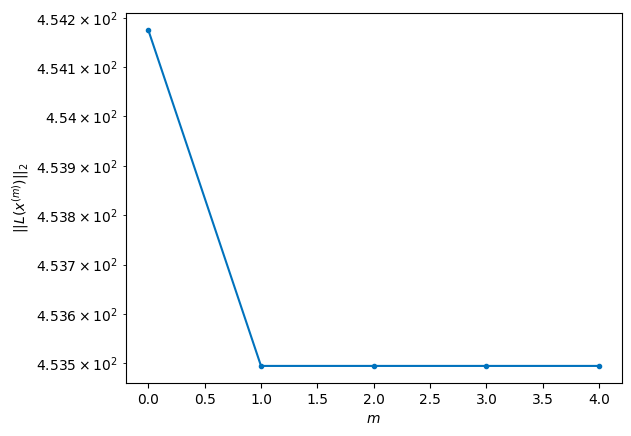

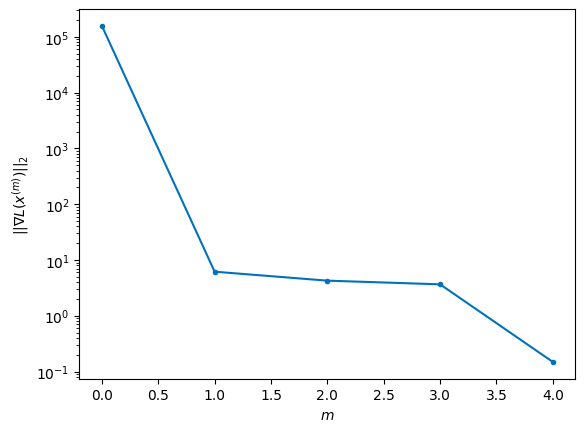


Windows:  49%|████▊     | 144/296 [28:40<35:14, 13.91s/it]

Before applying the algorithm
Cost function: 455.43426979678264
Gradient norm: 117932.26700222236
Global relative error: 1908337509.1970448
Position relative errors: 0.05100291485045997 m, 9.865949744863213 m, 383.21124983115277 m, 561.2442461666529 m

Iteration 1
Cost function: 455.1681255812492 (-0.06%)
Gradient norm: 3.12395658487879 (-100.00%)
Global relative error: 679.9757049929709 (0.04%)
Position relative errors: 0.0409005842458643 m, 9.92346782445606 m, 383.244865785942 m, 561.5166703786941 m

Iteration 2
Cost function: 455.1681259682792 (0.00%)
Gradient norm: 1.6327058679220448 (-47.74%)
Global relative error: 679.9756956466347 (-0.00%)
Position relative errors: 0.0409005844465245 m, 9.923463194744754 m, 383.2448649254965 m, 561.516659729619 m

STOP on Iteration 3
Cost function = 455.16812552251713 (-0.00%)
Gradient norm = 0.8053761002553268 (-50.67%)
Global relative error = 679.9756956505771 (0.00%)
Final position relative errors: 0.040900590012150614 m, 9.923463200055917 m,

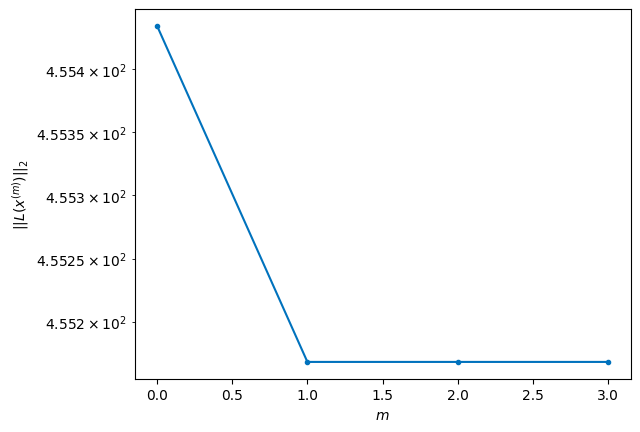

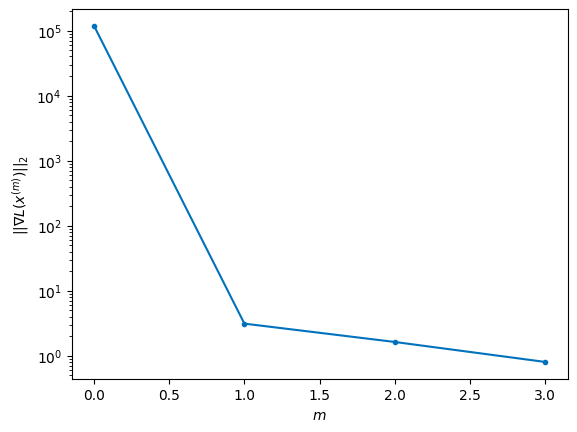


Windows:  49%|████▉     | 145/296 [28:47<30:10, 11.99s/it]

Before applying the algorithm
Cost function: 456.8137459175409
Gradient norm: 107444.38009892395
Global relative error: 1908651234.20003
Position relative errors: 0.04037501088494907 m, 9.761341028560656 m, 699.4720484863028 m, 1035.8715904329763 m

Iteration 1
Cost function: 455.802658104203 (-0.22%)
Gradient norm: 7.30594412737125 (-99.99%)
Global relative error: 1250.3086682386665 (0.03%)
Position relative errors: 0.03965030608978226 m, 9.730897946702738 m, 699.5239990524644 m, 1036.220875467184 m

Iteration 2
Cost function: 455.8026585258935 (0.00%)
Gradient norm: 4.115470566145927 (-43.67%)
Global relative error: 1250.3086407647736 (-0.00%)
Position relative errors: 0.039650309737168835 m, 9.730915248317835 m, 699.5239977865307 m, 1036.2208430091405 m

Iteration 3
Cost function: 455.80265796418854 (-0.00%)
Gradient norm: 4.432043316026734 (7.69%)
Global relative error: 1250.3086407632868 (-0.00%)
Position relative errors: 0.03965031274859854 m, 9.730915239042314 m, 699.52399778656

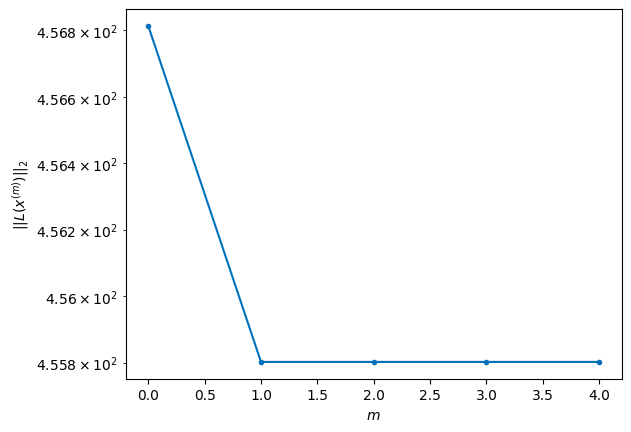

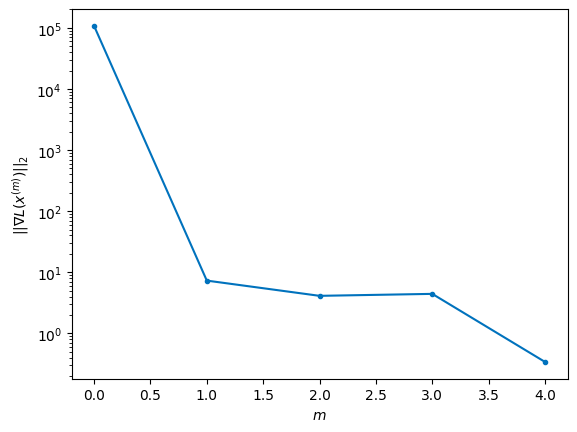


Windows:  49%|████▉     | 146/296 [28:56<27:48, 11.12s/it]

Before applying the algorithm
Cost function: 457.6469046032454
Gradient norm: 70467.45344076432
Global relative error: 1908923850.5793197
Position relative errors: 0.03911156973325017 m, 9.514294263730184 m, 1012.6973568497714 m, 1506.0401506293651 m

Iteration 1
Cost function: 457.2512803001329 (-0.09%)
Gradient norm: 5.17745400290698 (-99.99%)
Global relative error: 1815.0437569620542 (0.01%)
Position relative errors: 0.04353622250352943 m, 9.650564202170047 m, 1012.6856398626602 m, 1506.2108280108766 m

Iteration 2
Cost function: 457.25128061411823 (0.00%)
Gradient norm: 2.6890300225455843 (-48.06%)
Global relative error: 1815.0437371871105 (-0.00%)
Position relative errors: 0.04353622430839959 m, 9.650534870182652 m, 1012.6856425772584 m, 1506.2108025440982 m

Iteration 3
Cost function: 457.2512802479452 (-0.00%)
Gradient norm: 2.6481788199732064 (-1.52%)
Global relative error: 1815.0437371997564 (0.00%)
Position relative errors: 0.04353622172238818 m, 9.65053487534875 m, 1012.6856

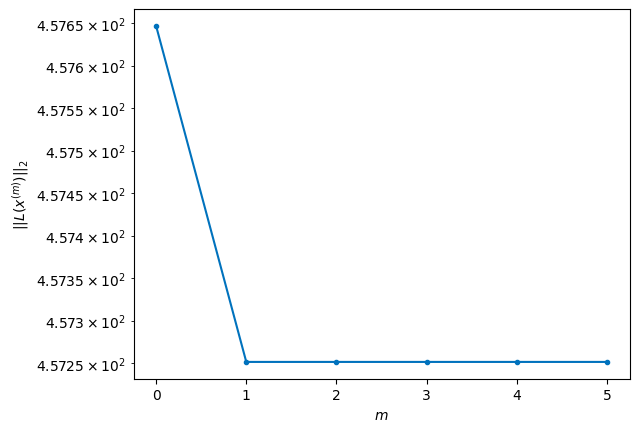

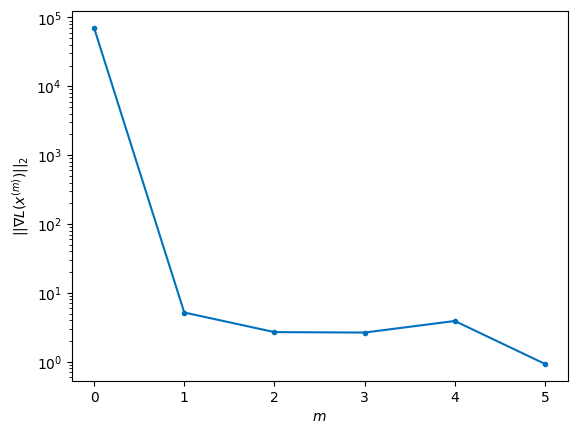


Windows:  50%|████▉     | 147/296 [29:07<27:06, 10.91s/it]

Before applying the algorithm
Cost function: 459.55573699418414
Gradient norm: 356310.49955282436
Global relative error: 1909154322.993521
Position relative errors: 0.04280990895074517 m, 9.38471460050216 m, 1321.434829194366 m, 1969.4359267785703 m

Iteration 1
Cost function: 459.0884674342492 (-0.10%)
Gradient norm: 3.6116938811098773 (-100.00%)
Global relative error: 2371.782959727144 (0.00%)
Position relative errors: 0.05721276368287996 m, 9.332617368745174 m, 1321.4728974258628 m, 1969.4903089679674 m

Iteration 2
Cost function: 459.08846726959797 (-0.00%)
Gradient norm: 1.8681102607288693 (-48.28%)
Global relative error: 2371.782957034574 (-0.00%)
Position relative errors: 0.057212768098339944 m, 9.332606018430276 m, 1321.4728999787224 m, 1969.4903040662984 m

Iteration 3
Cost function: 459.0884675226461 (0.00%)
Gradient norm: 4.918605409525168 (163.29%)
Global relative error: 2371.7829570307067 (-0.00%)
Position relative errors: 0.05721276742313895 m, 9.332606020289798 m, 1321.4

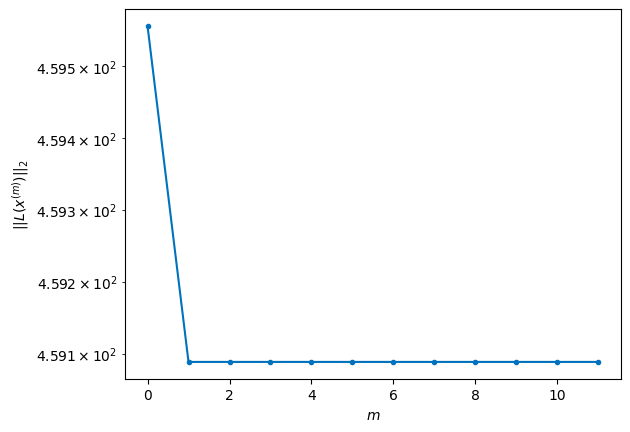

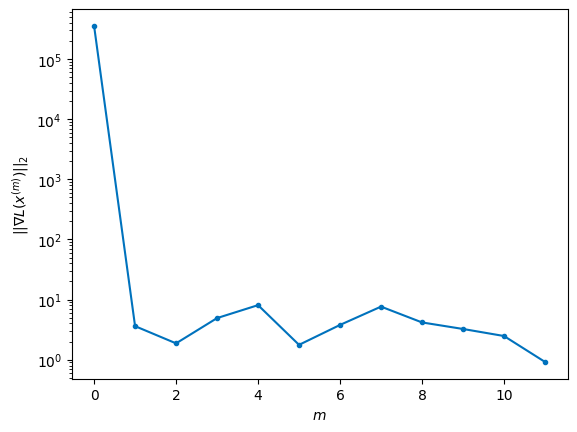


Windows:  50%|█████     | 148/296 [29:30<35:41, 14.47s/it]

Before applying the algorithm
Cost function: 462.86102643396595
Gradient norm: 156523.71011458593
Global relative error: 1909341836.60304
Position relative errors: 0.055828971940924545 m, 9.030502542717901 m, 1624.4523400966098 m, 2424.110322351942 m

Iteration 1
Cost function: 462.28543034921955 (-0.12%)
Gradient norm: 7.3250336797833 (-100.00%)
Global relative error: 2917.8578019024517 (-0.01%)
Position relative errors: 0.07734590081711125 m, 8.711268509489093 m, 1624.6318062298724 m, 2423.697309176137 m

STOP on Iteration 2
Cost function = 462.28543043800346 (0.00%)
Gradient norm = 0.18434187769662566 (-97.48%)
Global relative error = 2917.8577583758015 (-0.00%)
Final position relative errors: 0.07734589409351407 m, 8.711206948876937 m, 1624.6318121324284 m, 2423.6972530396824 m



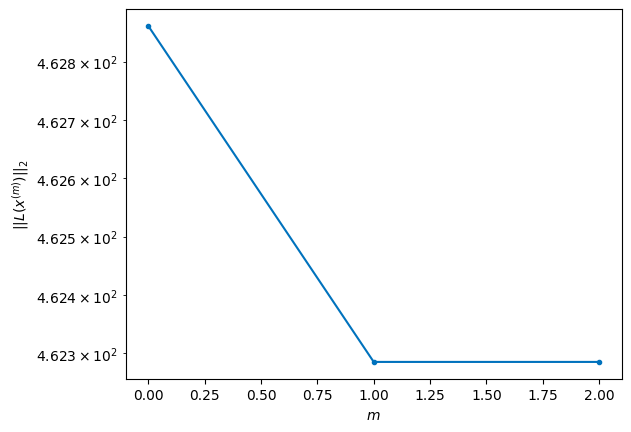

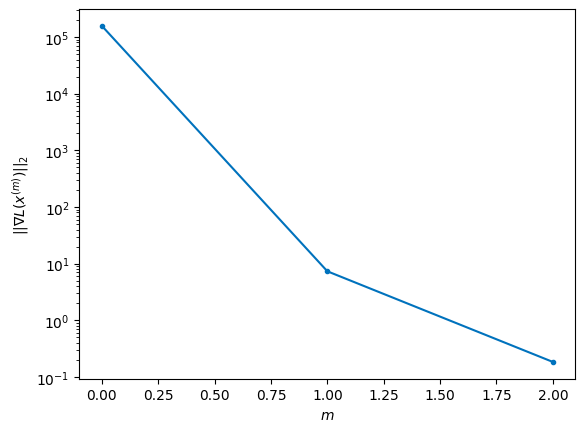


Windows:  50%|█████     | 149/296 [29:36<29:15, 11.94s/it]

Before applying the algorithm
Cost function: 465.7929048322828
Gradient norm: 185074.29570292335
Global relative error: 1909485805.2938406
Position relative errors: 0.0750490334106904 m, 8.371239122445129 m, 1920.52127374027 m, 2867.7437864231097 m

Iteration 1
Cost function: 464.6953217413712 (-0.24%)
Gradient norm: 8.709686977756764 (-100.00%)
Global relative error: 3451.8301923092827 (0.01%)
Position relative errors: 0.0780702667207051 m, 8.21686325917086 m, 1920.6162054829185 m, 2868.1388665134978 m

STOP on Iteration 2
Cost function = 464.69532084743656 (-0.00%)
Gradient norm = 0.27985664408056904 (-96.79%)
Global relative error = 3451.830137641222 (-0.00%)
Final position relative errors: 0.07807026694837595 m, 8.216915343571566 m, 1920.6161817890552 m, 2868.138816437063 m



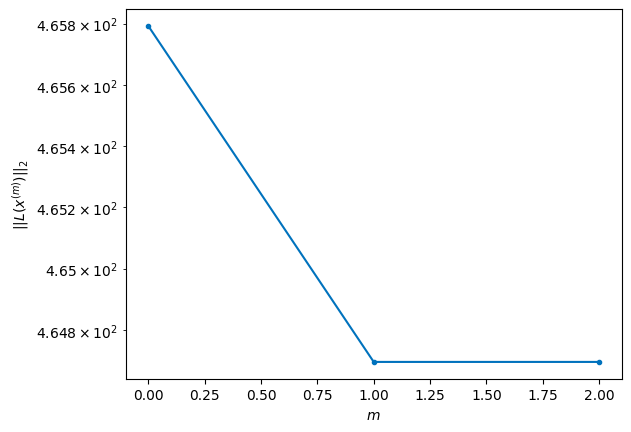

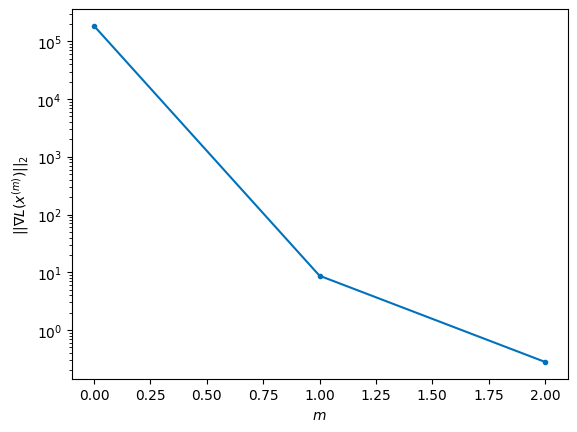


Windows:  51%|█████     | 150/296 [29:41<24:25, 10.04s/it]

Before applying the algorithm
Cost function: 465.00615758956997
Gradient norm: 160208.89245373572
Global relative error: 1909585871.1003492
Position relative errors: 0.0754262743616084 m, 7.8348135168981194 m, 2208.1223190008413 m, 3299.6759398276927 m

Iteration 1
Cost function: 464.160366939515 (-0.18%)
Gradient norm: 12.803551862491375 (-99.99%)
Global relative error: 3970.6966169808375 (0.01%)
Position relative errors: 0.07741053681317348 m, 7.8113250181502565 m, 2208.119373381912 m, 3300.0768333988367 m

Iteration 2
Cost function: 464.16036679741137 (-0.00%)
Gradient norm: 2.7335844250884347 (-78.65%)
Global relative error: 3970.696607699939 (-0.00%)
Position relative errors: 0.0774105337377379 m, 7.811339674335187 m, 2208.119372069873 m, 3300.0768230751896 m

Iteration 3
Cost function: 464.16036747035963 (0.00%)
Gradient norm: 5.391442521057451 (97.23%)
Global relative error: 3970.6966077133966 (0.00%)
Position relative errors: 0.07741053584801624 m, 7.811339677434453 m, 2208.119

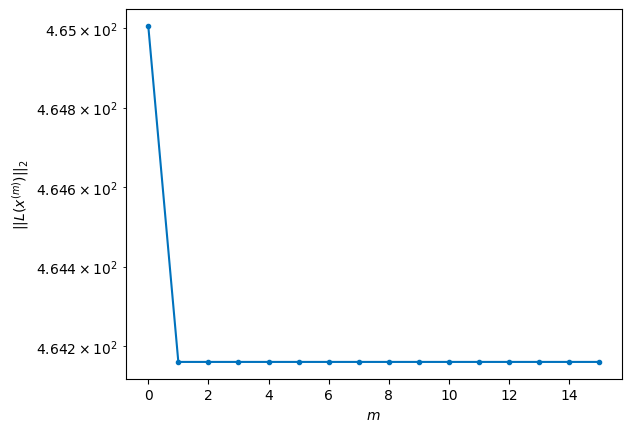

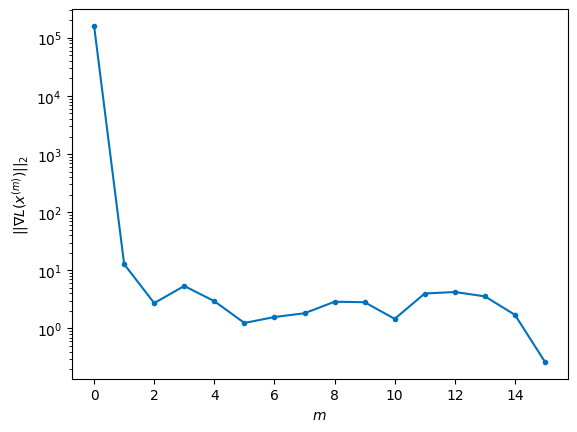


Windows:  51%|█████     | 151/296 [30:09<36:43, 15.19s/it]

Before applying the algorithm
Cost function: 459.3286155625076
Gradient norm: 46810.41683621099
Global relative error: 1909641905.2736037
Position relative errors: 0.07489492802404552 m, 7.39675400798127 m, 2485.9833024629247 m, 3717.2516197876594 m

Iteration 1
Cost function: 459.1043996012515 (-0.05%)
Gradient norm: 1.7889628887286362 (-100.00%)
Global relative error: 4471.910114505288 (-0.00%)
Position relative errors: 0.08126292154488945 m, 7.468679458411414 m, 2485.9156725051625 m, 3717.267862119937 m

STOP on Iteration 2
Cost function = 459.1043993283005 (-0.00%)
Gradient norm = 0.7429635928845512 (-58.47%)
Global relative error = 4471.910118934959 (0.00%)
Final position relative errors: 0.08126291800992566 m, 7.468680255409434 m, 2485.9156715274953 m, 3717.2678681010875 m



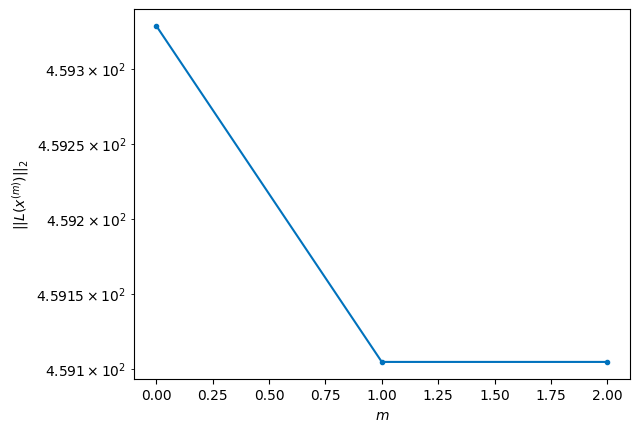

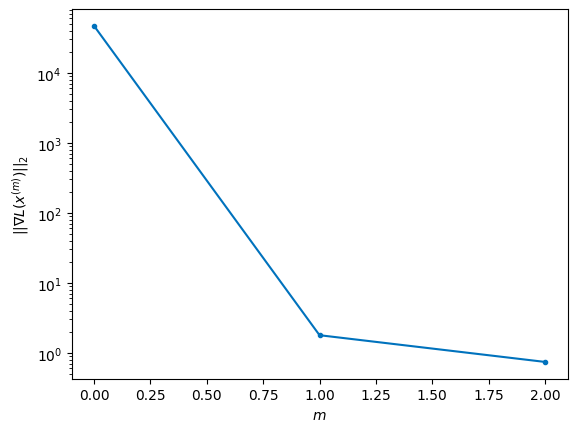


Windows:  51%|█████▏    | 152/296 [30:15<29:50, 12.44s/it]

Before applying the algorithm
Cost function: 462.382640730934
Gradient norm: 89017.1671240867
Global relative error: 1909653985.5593739
Position relative errors: 0.07859782391994416 m, 7.02566209883326 m, 2752.925884525305 m, 4118.220149955103 m

Iteration 1
Cost function: 461.50158833514126 (-0.19%)
Gradient norm: 8.419812825011949 (-99.99%)
Global relative error: 4954.034893935989 (0.01%)
Position relative errors: 0.07048777449577653 m, 7.132688211600383 m, 2752.9429752976416 m, 4118.695683239191 m

Iteration 2
Cost function: 461.50158821527396 (-0.00%)
Gradient norm: 2.6924520466272743 (-68.02%)
Global relative error: 4954.0348764627715 (-0.00%)
Position relative errors: 0.0704877769357497 m, 7.132737727793087 m, 2752.942969060909 m, 4118.695666305071 m

STOP on Iteration 3
Cost function = 461.5015889391046 (0.00%)
Gradient norm = 0.8527083573857188 (-68.33%)
Global relative error = 4954.034876461133 (-0.00%)
Final position relative errors: 0.07048777019876386 m, 7.132737729443351 m

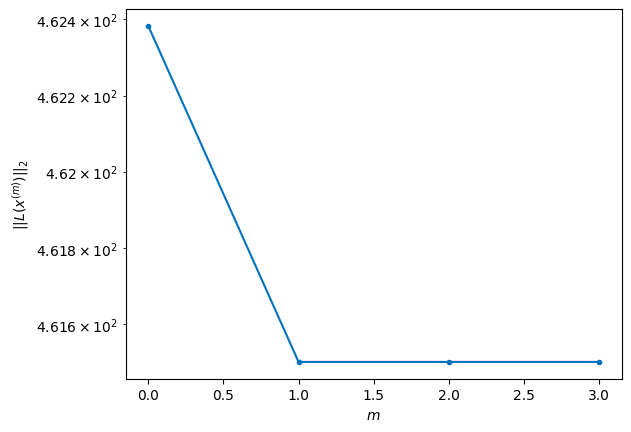

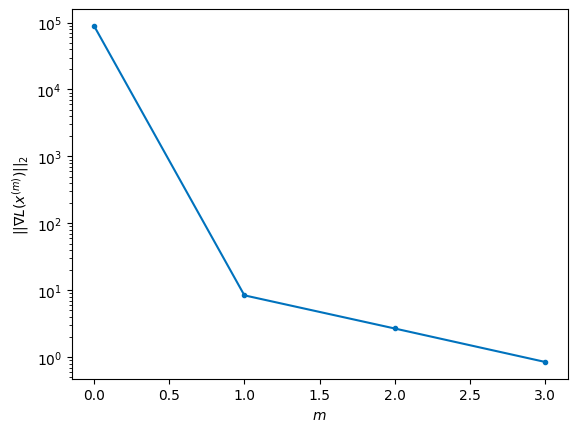


Windows:  52%|█████▏    | 153/296 [30:22<25:51, 10.85s/it]

Before applying the algorithm
Cost function: 464.8558460764515
Gradient norm: 179308.18315968823
Global relative error: 1909622404.2664971
Position relative errors: 0.0680024170735449 m, 6.646058961185166 m, 3007.935899020885 m, 4501.702248591611 m

Iteration 1
Cost function: 463.90986671890556 (-0.20%)
Gradient norm: 15.085589026334453 (-99.99%)
Global relative error: 5414.5711901599525 (0.01%)
Position relative errors: 0.050145024386043596 m, 7.056302303204574 m, 3008.048636307307 m, 4502.123817378964 m

Iteration 2
Cost function: 463.90986650502606 (-0.00%)
Gradient norm: 6.648276185508374 (-55.93%)
Global relative error: 5414.5710763586985 (-0.00%)
Position relative errors: 0.050145029343982454 m, 7.05613475715821 m, 3008.0486252721416 m, 4502.123688149173 m

Iteration 3
Cost function: 463.90986655816914 (0.00%)
Gradient norm: 1.7288517812391204 (-74.00%)
Global relative error: 5414.57107632893 (-0.00%)
Position relative errors: 0.050145031520081824 m, 7.056134756586698 m, 3008.048

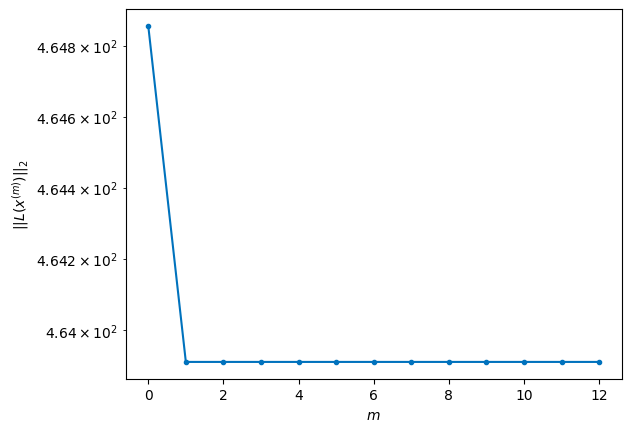

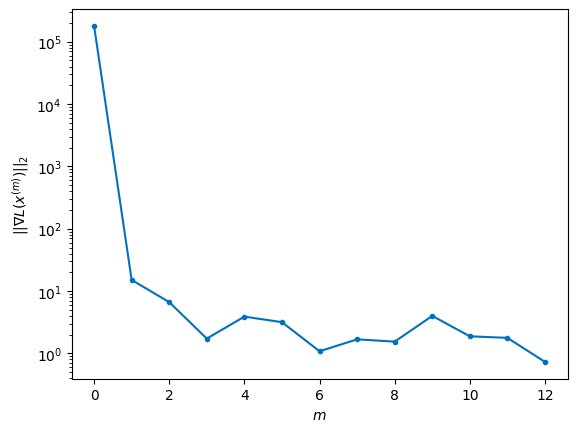


Windows:  52%|█████▏    | 154/296 [30:45<34:27, 14.56s/it]

Before applying the algorithm
Cost function: 464.11178305629176
Gradient norm: 78299.32107606516
Global relative error: 1909547669.682108
Position relative errors: 0.048581204041241444 m, 6.5494700737099905 m, 3249.916339263945 m, 4865.511637763751 m

Iteration 1
Cost function: 463.47972993874095 (-0.14%)
Gradient norm: 17.246316269310825 (-99.98%)
Global relative error: 5851.547474828873 (0.01%)
Position relative errors: 0.04793573350836355 m, 6.959512826023281 m, 3250.0380849459475 m, 4865.980055300787 m

Iteration 2
Cost function: 463.4797299957846 (0.00%)
Gradient norm: 2.370571232614958 (-86.25%)
Global relative error: 5851.5474208970245 (-0.00%)
Position relative errors: 0.047935736814611184 m, 6.959428098940938 m, 3250.038078260617 m, 4865.9799950319275 m

Iteration 3
Cost function: 463.4797300473177 (0.00%)
Gradient norm: 6.658055180023943 (180.86%)
Global relative error: 5851.5474209114145 (0.00%)
Position relative errors: 0.04793573179926965 m, 6.959428103701533 m, 3250.03807

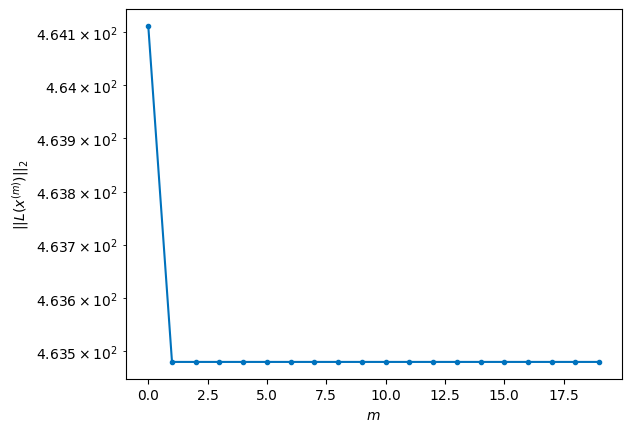

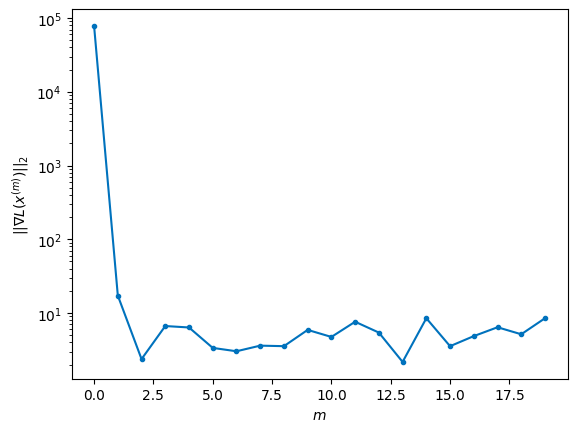


Windows:  52%|█████▏    | 155/296 [31:21<49:37, 21.11s/it]

Before applying the algorithm
Cost function: 465.9570738640069
Gradient norm: 223328.35824545193
Global relative error: 1909430462.8940113
Position relative errors: 0.04639181270577161 m, 6.425222239718562 m, 3477.7264094294137 m, 5208.187198196279 m

Iteration 1
Cost function: 465.29305166969783 (-0.14%)
Gradient norm: 17.21554765436107 (-99.99%)
Global relative error: 6262.689424113793 (0.00%)
Position relative errors: 0.047107131168476264 m, 6.624272283658762 m, 3477.87789880222 m, 5208.220072781226 m

STOP on Iteration 2
Cost function = 465.29305095013177 (-0.00%)
Gradient norm = 0.5261251704139599 (-96.94%)
Global relative error = 6262.689396958029 (-0.00%)
Final position relative errors: 0.04710711513698636 m, 6.624233407484759 m, 3477.877875681981 m, 5208.220055615858 m



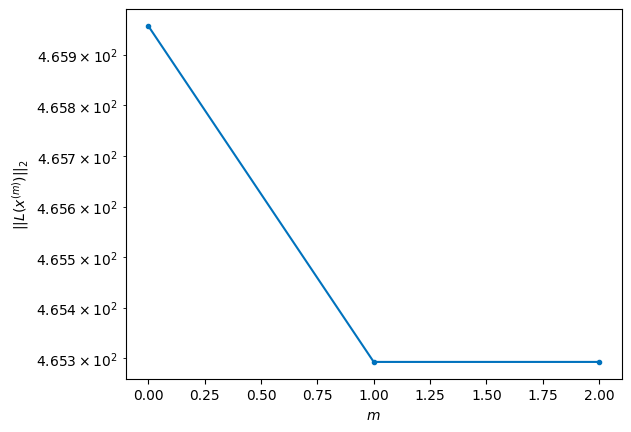

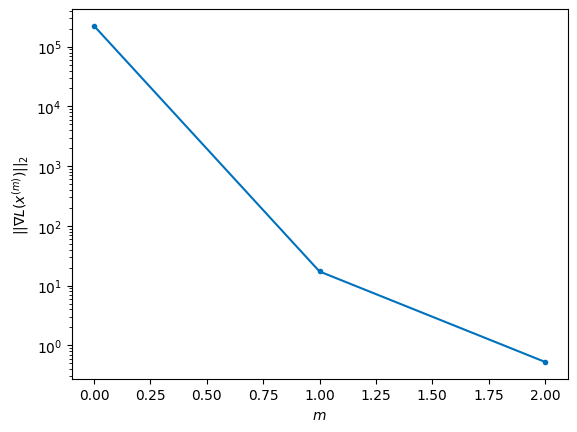


Windows:  53%|█████▎    | 156/296 [31:27<38:31, 16.51s/it]

Before applying the algorithm
Cost function: 464.8941235336654
Gradient norm: 135490.3511862331
Global relative error: 1909271669.7439446
Position relative errors: 0.04541423959498695 m, 6.084755422848219 m, 3690.3967606509536 m, 5527.75905725046 m

Iteration 1
Cost function: 464.4521810808332 (-0.10%)
Gradient norm: 6.297485377598408 (-100.00%)
Global relative error: 6646.582127763637 (0.00%)
Position relative errors: 0.04283887357372391 m, 6.142901339943858 m, 3690.4231614675637 m, 5527.906945549319 m

Iteration 2
Cost function: 464.45218180102063 (0.00%)
Gradient norm: 7.413243983908004 (17.72%)
Global relative error: 6646.582145074842 (0.00%)
Position relative errors: 0.04283888089803391 m, 6.142918021606716 m, 3690.4231638881306 m, 5527.906964729266 m

Iteration 3
Cost function: 464.45218126999595 (-0.00%)
Gradient norm: 4.624933498278304 (-37.61%)
Global relative error: 6646.582145047989 (-0.00%)
Position relative errors: 0.042838873217188954 m, 6.14291799231438 m, 3690.423163886

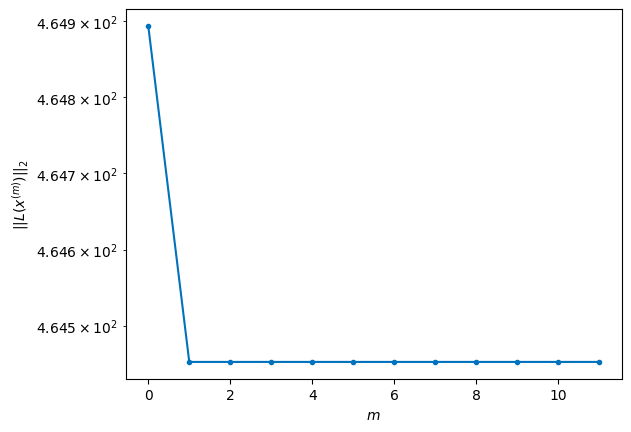

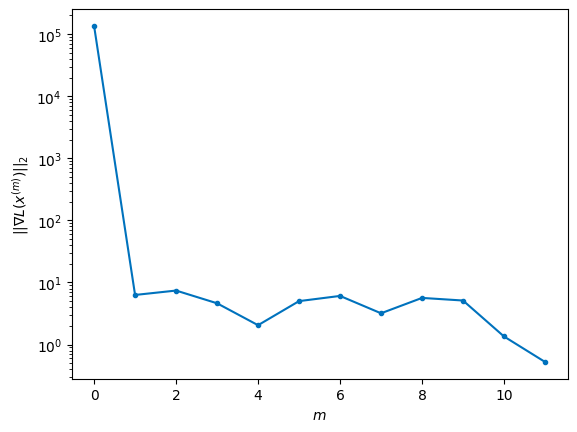


Windows:  53%|█████▎    | 157/296 [31:48<41:04, 17.73s/it]

Before applying the algorithm
Cost function: 468.0623684329403
Gradient norm: 133934.66849533608
Global relative error: 1909072345.991077
Position relative errors: 0.04144679927260575 m, 5.560272379273044 m, 3886.8428555721916 m, 5823.367820417742 m

Iteration 1
Cost function: 467.54422072664573 (-0.11%)
Gradient norm: 7.239860125683856 (-99.99%)
Global relative error: 7001.059510444069 (-0.00%)
Position relative errors: 0.04167644110831518 m, 5.47454297890169 m, 3886.9735606123486 m, 5822.903808651586 m

Iteration 2
Cost function: 467.54422032612445 (-0.00%)
Gradient norm: 2.4890562565920686 (-65.62%)
Global relative error: 7001.059455780214 (-0.00%)
Position relative errors: 0.04167644099521329 m, 5.47456437987386 m, 3886.9735591162075 m, 5822.903743906126 m

Iteration 3
Cost function: 467.54422051410563 (0.00%)
Gradient norm: 4.358543436300649 (75.11%)
Global relative error: 7001.059455747838 (-0.00%)
Position relative errors: 0.041676436402009805 m, 5.47456436784554 m, 3886.9735591

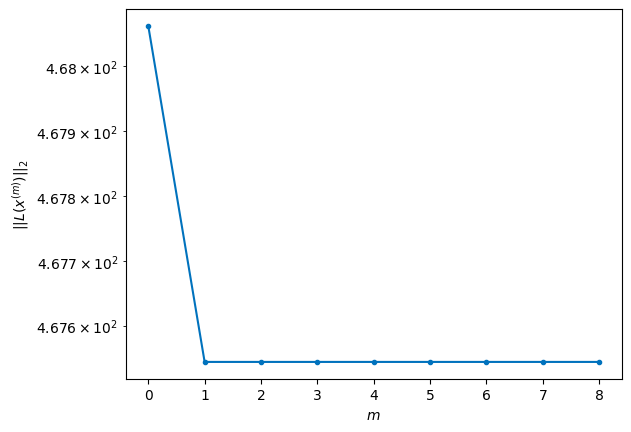

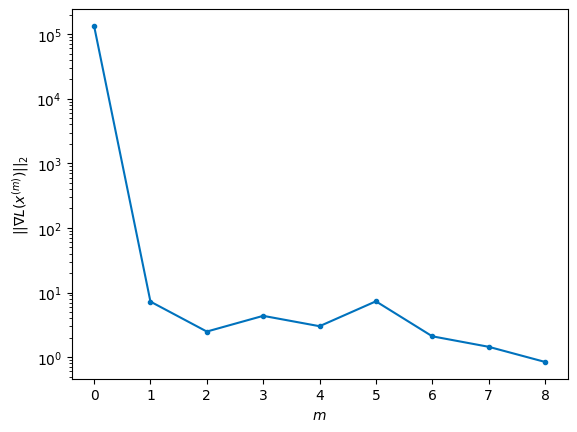


Windows:  53%|█████▎    | 158/296 [32:03<39:10, 17.03s/it]

Before applying the algorithm
Cost function: 468.7154243673143
Gradient norm: 261173.54182470424
Global relative error: 1908833708.6174586
Position relative errors: 0.040128579449938424 m, 4.864172400798175 m, 4066.4416455382075 m, 6092.997943768479 m

Iteration 1
Cost function: 468.2567840167235 (-0.10%)
Gradient norm: 4.474293782197951 (-100.00%)
Global relative error: 7325.401590084536 (0.00%)
Position relative errors: 0.03844135133691236 m, 4.962100927894988 m, 4066.3899920245385 m, 6093.1051048354175 m

STOP on Iteration 2
Cost function = 468.256785220405 (0.00%)
Gradient norm = 0.1453484094199989 (-96.75%)
Global relative error = 7325.401613382768 (0.00%)
Final position relative errors: 0.03844135052367696 m, 4.9621297975700855 m, 4066.38998703329 m, 6093.105136153115 m



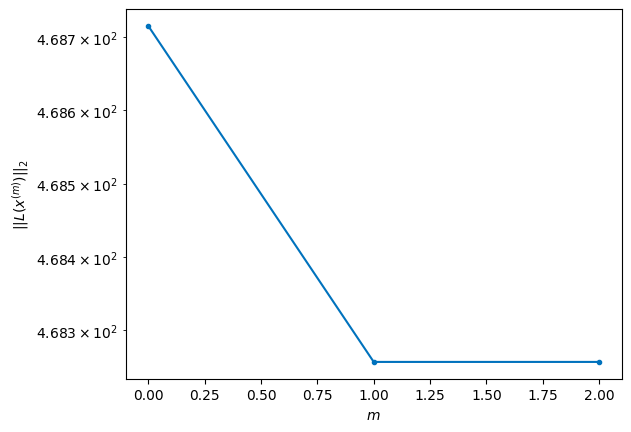

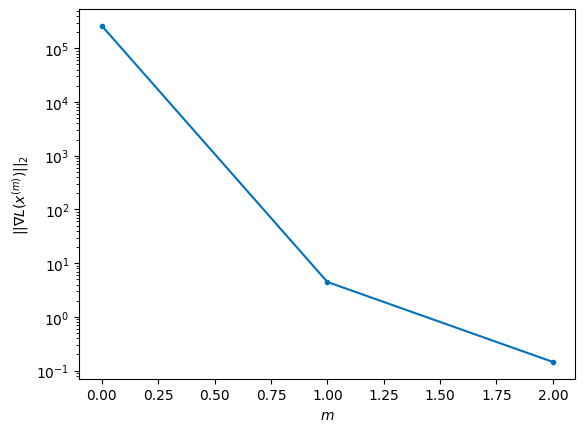


Windows:  54%|█████▎    | 159/296 [32:09<31:03, 13.60s/it]

Before applying the algorithm
Cost function: 467.6343915094051
Gradient norm: 161821.41118333867
Global relative error: 1908557133.8656216
Position relative errors: 0.036715219592972116 m, 4.314897706027881 m, 4228.126405458872 m, 6336.6666006587975 m

Iteration 1
Cost function: 467.1688893342851 (-0.10%)
Gradient norm: 6.029379198743886 (-100.00%)
Global relative error: 7617.5371163764175 (-0.00%)
Position relative errors: 0.04432323411003605 m, 4.424767257908525 m, 4227.975263377802 m, 6336.486104772003 m

STOP on Iteration 2
Cost function = 467.1688880583614 (-0.00%)
Gradient norm = 0.4550425894525063 (-92.45%)
Global relative error = 7617.537089292744 (-0.00%)
Final position relative errors: 0.04432322727961629 m, 4.424800821821796 m, 4227.975253011991 m, 6336.486079105893 m



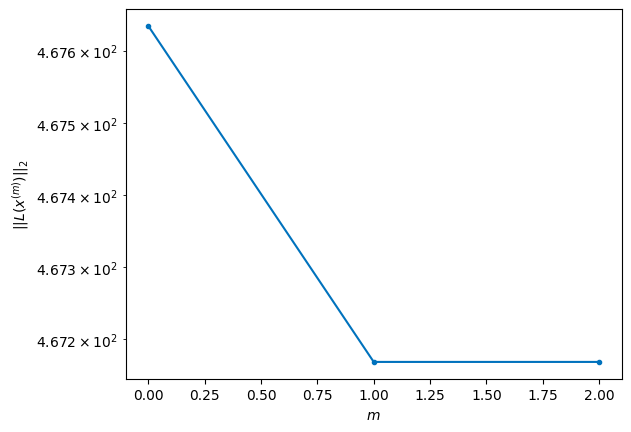

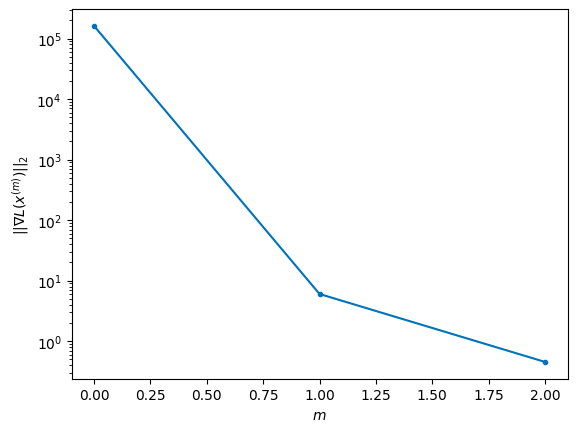


Windows:  54%|█████▍    | 160/296 [32:15<25:33, 11.28s/it]

Before applying the algorithm
Cost function: 467.23870897971267
Gradient norm: 53720.69450478509
Global relative error: 1908244136.2843142
Position relative errors: 0.04237352532028709 m, 3.7423432480227548 m, 4371.279195066758 m, 6552.436394014894 m

Iteration 1
Cost function: 466.89121181419665 (-0.07%)
Gradient norm: 9.24924412627692 (-99.98%)
Global relative error: 7876.570584165002 (-0.00%)
Position relative errors: 0.040024584682763195 m, 3.6284976587743696 m, 4371.330582492068 m, 6552.236537885924 m

Iteration 2
Cost function: 466.8912117628429 (-0.00%)
Gradient norm: 2.8135205416350186 (-69.58%)
Global relative error: 7876.570594083566 (0.00%)
Position relative errors: 0.0400245773088821 m, 3.628516487654144 m, 4371.330577949818 m, 6552.236552829169 m

Iteration 3
Cost function: 466.891211339413 (-0.00%)
Gradient norm: 3.426503503511837 (21.79%)
Global relative error: 7876.570594075055 (-0.00%)
Position relative errors: 0.04002457604386495 m, 3.6285164782223065 m, 4371.33057794

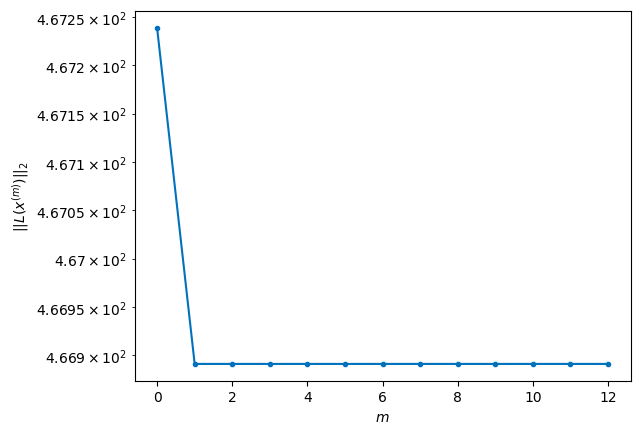

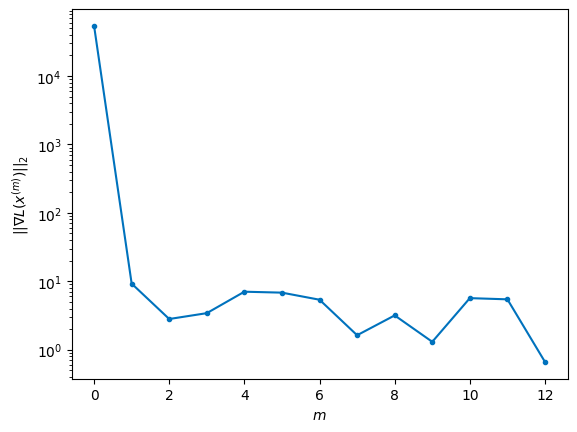


Windows:  54%|█████▍    | 161/296 [32:37<32:45, 14.56s/it]

Before applying the algorithm
Cost function: 469.0031285995427
Gradient norm: 210000.69809888516
Global relative error: 1907896361.23684
Position relative errors: 0.03831544313298284 m, 2.915922973696306 m, 4495.578391837722 m, 6739.616854053682 m

Iteration 1
Cost function: 468.2642258822961 (-0.16%)
Gradient norm: 9.72904851880635 (-100.00%)
Global relative error: 8100.896356582403 (-0.01%)
Position relative errors: 0.04367266114904912 m, 2.7867928566584306 m, 4495.416462270014 m, 6739.119593852766 m

Iteration 2
Cost function: 468.2642265173115 (0.00%)
Gradient norm: 1.128849792143932 (-88.40%)
Global relative error: 8100.896235387194 (-0.00%)
Position relative errors: 0.04367265977894296 m, 2.786792780020131 m, 4495.4164404881985 m, 6739.1194626974775 m

STOP on Iteration 3
Cost function = 468.2642261721348 (-0.00%)
Gradient norm = 0.33323139294403287 (-70.48%)
Global relative error = 8100.896235390281 (0.00%)
Final position relative errors: 0.043672659376768015 m, 2.78679276729859

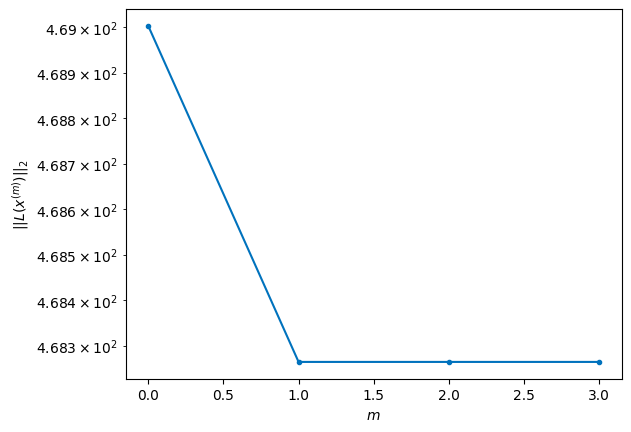

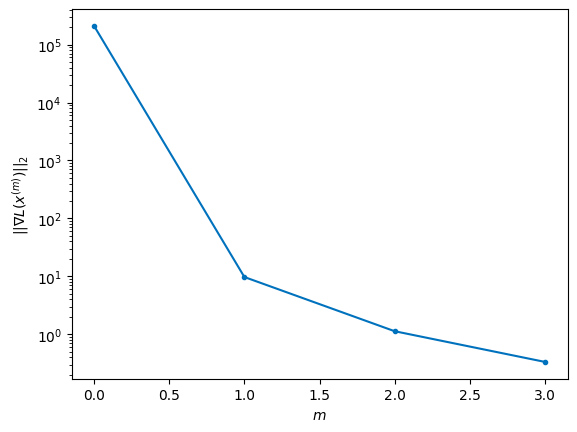


Windows:  55%|█████▍    | 162/296 [32:44<27:45, 12.43s/it]

Before applying the algorithm
Cost function: 471.069884007185
Gradient norm: 334441.6632744394
Global relative error: 1907515570.5441306
Position relative errors: 0.0418543144967837 m, 2.0834212075055993 m, 4600.071245932181 m, 6897.1609289779735 m

Iteration 1
Cost function: 469.94151649433314 (-0.24%)
Gradient norm: 10.802530881348584 (-100.00%)
Global relative error: 8290.094848776282 (-0.00%)
Position relative errors: 0.04078681707657435 m, 2.0019020780981878 m, 4599.917865302358 m, 6896.841019225088 m

Iteration 2
Cost function: 469.9415167018838 (0.00%)
Gradient norm: 2.538285385912692 (-76.50%)
Global relative error: 8290.09480803781 (-0.00%)
Position relative errors: 0.04078681308403108 m, 2.0019229219455457 m, 4599.917845005634 m, 6896.840983787978 m

Iteration 3
Cost function: 469.941516548023 (-0.00%)
Gradient norm: 1.1867482818875086 (-53.25%)
Global relative error: 8290.094808041262 (0.00%)
Position relative errors: 0.040786814131146654 m, 2.001922939409174 m, 4599.9178450

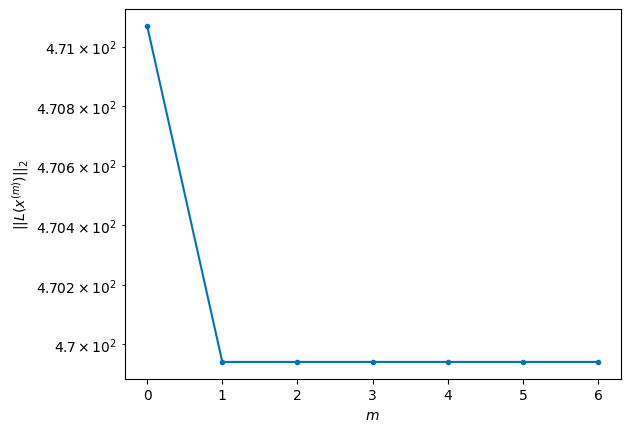

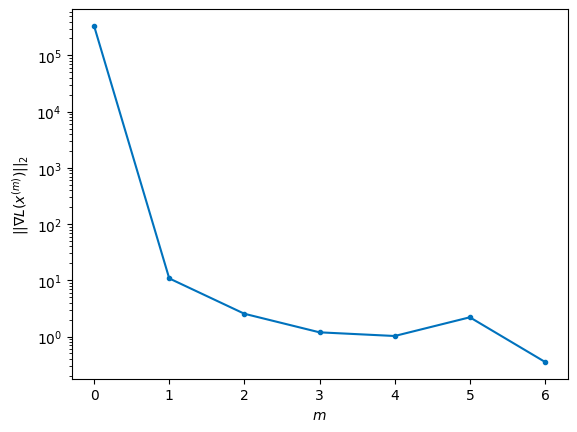


Windows:  55%|█████▌    | 163/296 [32:57<27:35, 12.45s/it]

Before applying the algorithm
Cost function: 471.0192117180617
Gradient norm: 198712.264071714
Global relative error: 1907103628.665919
Position relative errors: 0.04018580079575953 m, 1.3125484302693653 m, 4684.526425634261 m, 7024.830527503201 m

Iteration 1
Cost function: 470.48112641588915 (-0.11%)
Gradient norm: 7.587211778633176 (-100.00%)
Global relative error: 8443.137249556174 (-0.00%)
Position relative errors: 0.04432687405120694 m, 1.156874066431031 m, 4684.474994671322 m, 7024.404190104607 m

Iteration 2
Cost function: 470.48112675134473 (0.00%)
Gradient norm: 3.5326590488564897 (-53.44%)
Global relative error: 8443.137188000746 (-0.00%)
Position relative errors: 0.04432687446438251 m, 1.1568795972695824 m, 4684.474994308367 m, 7024.404116357855 m

Iteration 3
Cost function: 470.4811267105261 (-0.00%)
Gradient norm: 10.789424509547295 (205.42%)
Global relative error: 8443.137187958902 (-0.00%)
Position relative errors: 0.04432687565838955 m, 1.1568795916354564 m, 4684.47499

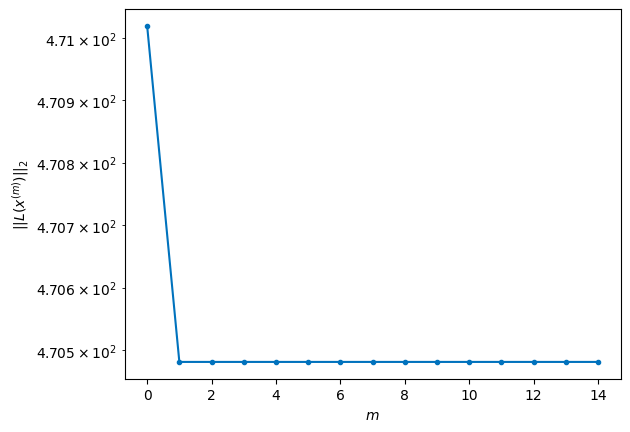

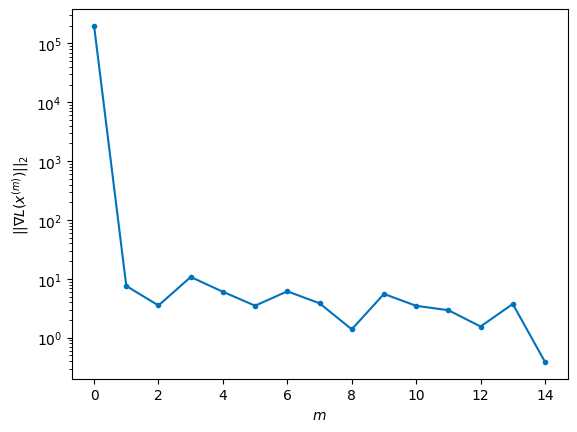


Windows:  55%|█████▌    | 164/296 [33:23<36:18, 16.50s/it]

Before applying the algorithm
Cost function: 474.7672218738036
Gradient norm: 151298.57465251983
Global relative error: 1906662488.7894084
Position relative errors: 0.043684559155896314 m, 0.5702002284895709 m, 4748.670692018614 m, 7121.800403015146 m

Iteration 1
Cost function: 474.17610388145664 (-0.12%)
Gradient norm: 10.778487132869103 (-99.99%)
Global relative error: 8559.479394219352 (-0.00%)
Position relative errors: 0.04658418544172263 m, 0.6623073660007479 m, 4748.566769942529 m, 7121.502511404989 m

Iteration 2
Cost function: 474.1761040235715 (0.00%)
Gradient norm: 3.593807350807616 (-66.66%)
Global relative error: 8559.479336368811 (-0.00%)
Position relative errors: 0.046584184260790154 m, 0.6623275856345331 m, 4748.566758025875 m, 7121.502449817314 m

Iteration 3
Cost function: 474.1761039081434 (-0.00%)
Gradient norm: 7.786751216791766 (116.67%)
Global relative error: 8559.479336371061 (0.00%)
Position relative errors: 0.0465841831226256 m, 0.6623275986718591 m, 4748.5667

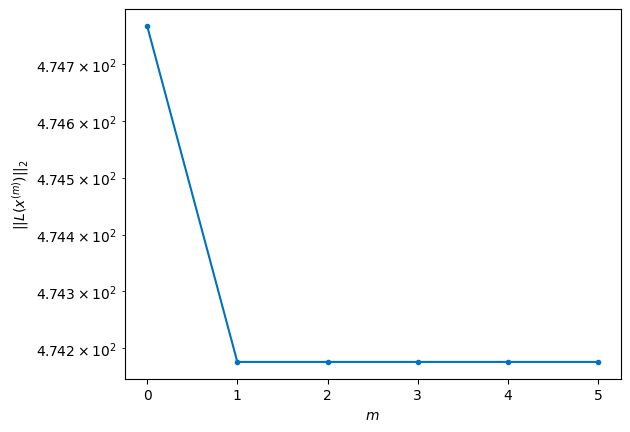

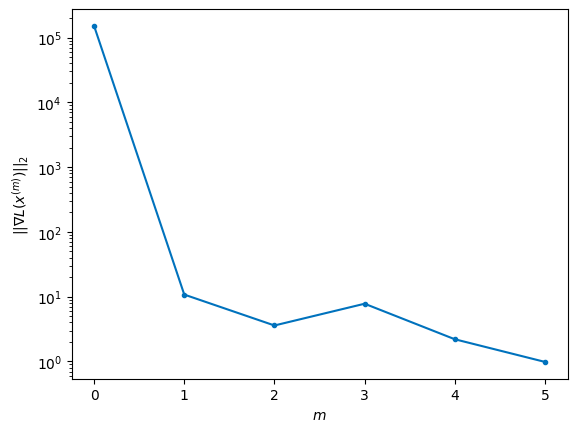


Windows:  56%|█████▌    | 165/296 [33:33<32:12, 14.75s/it]

Before applying the algorithm
Cost function: 475.62892623121354
Gradient norm: 377605.2192695852
Global relative error: 1906194196.2748086
Position relative errors: 0.0460040903086484 m, 0.4773461162864743 m, 4792.0684407290955 m, 7187.8502329672465 m

Iteration 1
Cost function: 475.2206527225545 (-0.09%)
Gradient norm: 2.7602889698464668 (-100.00%)
Global relative error: 8638.76281773388 (-0.00%)
Position relative errors: 0.048566433502197796 m, 0.5976309653996872 m, 4792.040003484652 m, 7187.80733240053 m

Iteration 2
Cost function: 475.2206525288188 (-0.00%)
Gradient norm: 1.619759783693648 (-41.32%)
Global relative error: 8638.762800787477 (-0.00%)
Position relative errors: 0.04856643362367319 m, 0.5976381064309191 m, 4792.039997779797 m, 7187.807315836043 m

Iteration 3
Cost function: 475.2206521336358 (-0.00%)
Gradient norm: 2.033954874174957 (25.57%)
Global relative error: 8638.762800818928 (0.00%)
Position relative errors: 0.04856643345755562 m, 0.5976380775065765 m, 4792.03999

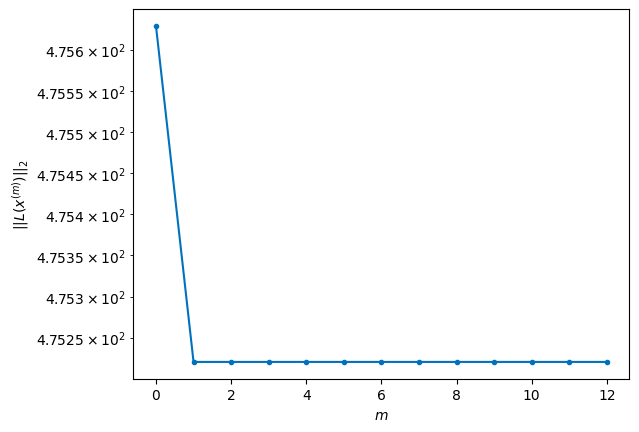

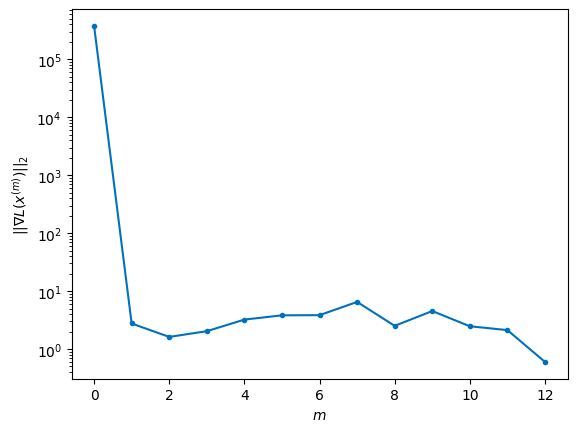


Windows:  56%|█████▌    | 166/296 [33:58<38:29, 17.77s/it]

Before applying the algorithm
Cost function: 482.82022260861805
Gradient norm: 245415.781647957
Global relative error: 1905700861.4123907
Position relative errors: 0.04770502602842968 m, 1.2248479269598287 m, 4814.656504266957 m, 7222.839632074161 m

Iteration 1
Cost function: 481.78031476897263 (-0.22%)
Gradient norm: 12.692377332588364 (-99.99%)
Global relative error: 8680.13421708276 (-0.00%)
Position relative errors: 0.04974753919315993 m, 1.2015643527383841 m, 4814.634912631731 m, 7222.4662750464995 m

STOP on Iteration 2
Cost function = 481.7803148232392 (0.00%)
Gradient norm = 0.9430433842498731 (-92.57%)
Global relative error = 8680.134167041375 (-0.00%)
Final position relative errors: 0.04974754029303782 m, 1.2015747794547877 m, 4814.634913796706 m, 7222.466214127232 m



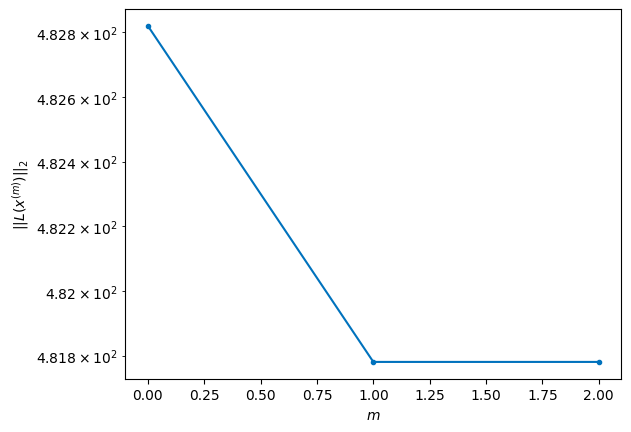

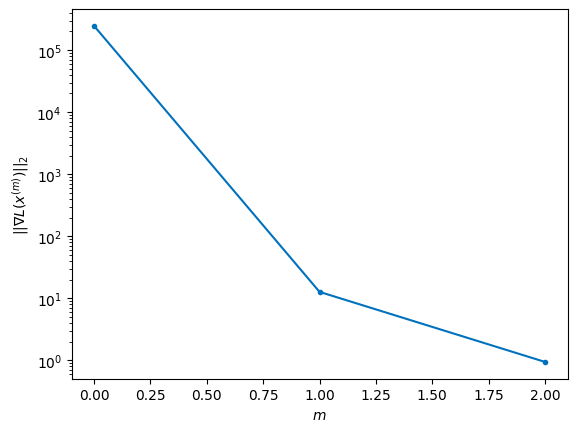


Windows:  56%|█████▋    | 167/296 [34:04<30:15, 14.07s/it]

Before applying the algorithm
Cost function: 483.8130030177176
Gradient norm: 83052.23302086121
Global relative error: 1905184657.0440605
Position relative errors: 0.04872158005426146 m, 1.924789496128048 m, 4816.264542643965 m, 7225.995430384196 m

Iteration 1
Cost function: 483.467159441259 (-0.07%)
Gradient norm: 2.393573660944163 (-100.00%)
Global relative error: 8684.010165607662 (0.00%)
Position relative errors: 0.050554970666919614 m, 1.7598086665481383 m, 4816.155418488833 m, 7226.110736643556 m

Iteration 2
Cost function: 483.46715897605276 (-0.00%)
Gradient norm: 1.092586251170754 (-54.35%)
Global relative error: 8684.010170812717 (0.00%)
Position relative errors: 0.05055497098176982 m, 1.7597966811044596 m, 4816.155405862433 m, 7226.110751317084 m

Iteration 3
Cost function: 483.46715903485574 (0.00%)
Gradient norm: 1.5473890642170542 (41.63%)
Global relative error: 8684.010170851945 (0.00%)
Position relative errors: 0.05055496908683963 m, 1.7597966438217099 m, 4816.15540586

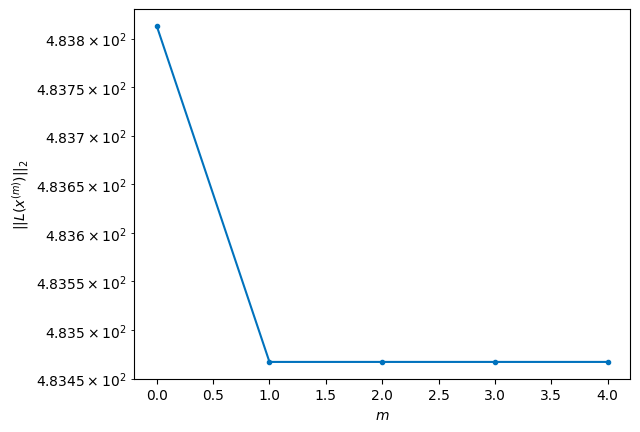

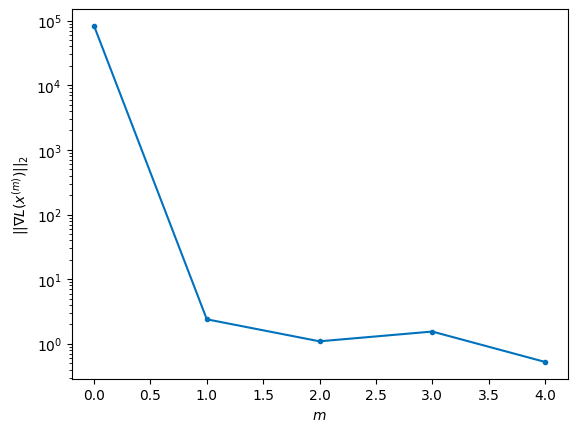


Windows:  57%|█████▋    | 168/296 [34:12<26:43, 12.52s/it]

Before applying the algorithm
Cost function: 482.3949507649409
Gradient norm: 137599.948670339
Global relative error: 1904647803.40533
Position relative errors: 0.04934714244076549 m, 2.48165804202549 m, 4796.791539556983 m, 7198.141404733456 m

Iteration 1
Cost function: 481.9717726258692 (-0.09%)
Gradient norm: 8.227124297457499 (-99.99%)
Global relative error: 8650.033870734505 (0.00%)
Position relative errors: 0.0494636974689393 m, 2.242935860260187 m, 4796.606058986477 m, 7198.308861691831 m

Iteration 2
Cost function: 481.9717730902473 (0.00%)
Gradient norm: 2.023595069157393 (-75.40%)
Global relative error: 8650.033887423615 (0.00%)
Position relative errors: 0.04946369603549534 m, 2.2429014928149242 m, 4796.60602728524 m, 7198.308902881618 m

STOP on Iteration 3
Cost function = 481.9717723875464 (-0.00%)
Gradient norm = 0.7594569823663246 (-62.47%)
Global relative error = 8650.033887391313 (-0.00%)
Final position relative errors: 0.049463696578973336 m, 2.2429015115934794 m, 479

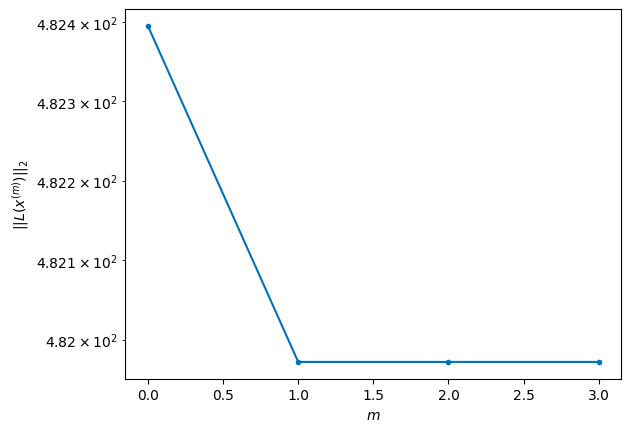

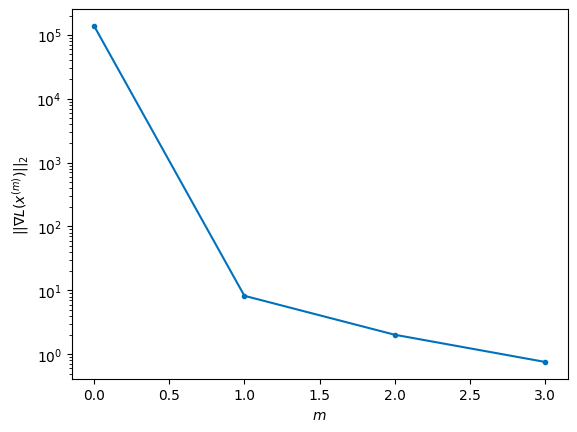


Windows:  57%|█████▋    | 169/296 [34:20<23:14, 10.98s/it]

Before applying the algorithm
Cost function: 480.40150546631554
Gradient norm: 91539.680502337
Global relative error: 1904092560.5533273
Position relative errors: 0.04828496226679877 m, 2.9561545240788636 m, 4756.33642980561 m, 7138.942630089553 m

Iteration 1
Cost function: 479.39405098157863 (-0.21%)
Gradient norm: 19.06823250973555 (-99.98%)
Global relative error: 8578.510051769468 (0.00%)
Position relative errors: 0.0449198386350812 m, 2.8059178274075047 m, 4756.319687864964 m, 7139.20496854334 m

Iteration 2
Cost function: 479.3940510259967 (0.00%)
Gradient norm: 2.327149827795487 (-87.80%)
Global relative error: 8578.510091341552 (0.00%)
Position relative errors: 0.04491984033549103 m, 2.8058964766942163 m, 4756.3196818914985 m, 7139.205020081457 m

Iteration 3
Cost function: 479.3940511263772 (0.00%)
Gradient norm: 2.3671989872773005 (1.72%)
Global relative error: 8578.510091331427 (-0.00%)
Position relative errors: 0.04491984067560082 m, 2.805896448571372 m, 4756.319681901958 m

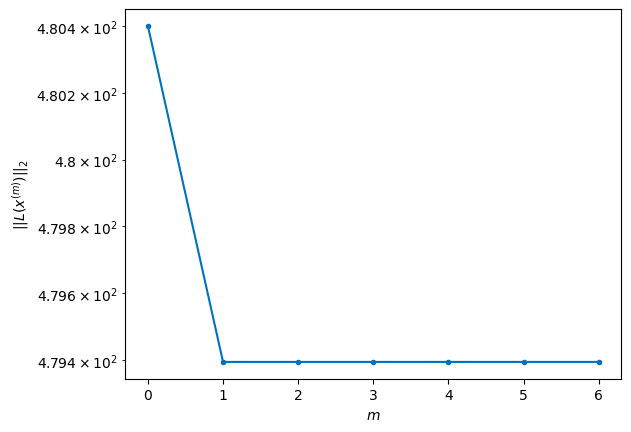

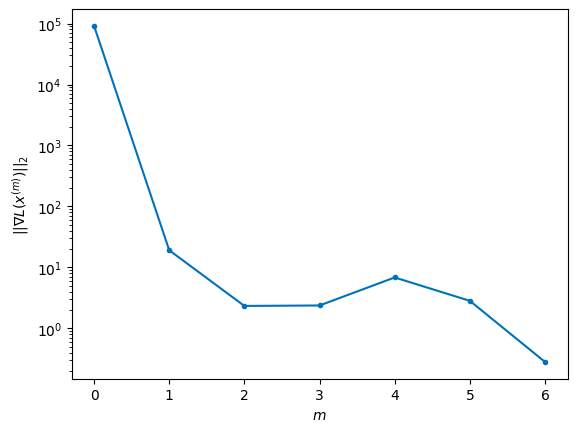


Windows:  57%|█████▋    | 170/296 [34:32<23:49, 11.35s/it]

Before applying the algorithm
Cost function: 479.734066771733
Gradient norm: 222603.51948002478
Global relative error: 1903521228.2516627
Position relative errors: 0.04346382778312475 m, 3.504276087664556 m, 4695.311844117563 m, 7048.674063044596 m

Iteration 1
Cost function: 479.360801185302 (-0.08%)
Gradient norm: 5.344432703464723 (-100.00%)
Global relative error: 8469.377314252119 (0.00%)
Position relative errors: 0.0432885798717335 m, 3.6802901829002415 m, 4695.3734122221895 m, 7048.673813732664 m

Iteration 2
Cost function: 479.36080044626857 (-0.00%)
Gradient norm: 2.7675644007641496 (-48.22%)
Global relative error: 8469.377311150187 (-0.00%)
Position relative errors: 0.0432885804893835 m, 3.6802730284833367 m, 4695.373414537188 m, 7048.673808472374 m

Iteration 3
Cost function: 479.36080063472923 (0.00%)
Gradient norm: 5.00963160750442 (81.01%)
Global relative error: 8469.3773111472 (-0.00%)
Position relative errors: 0.04328857874685488 m, 3.680273036109949 m, 4695.37341452768 

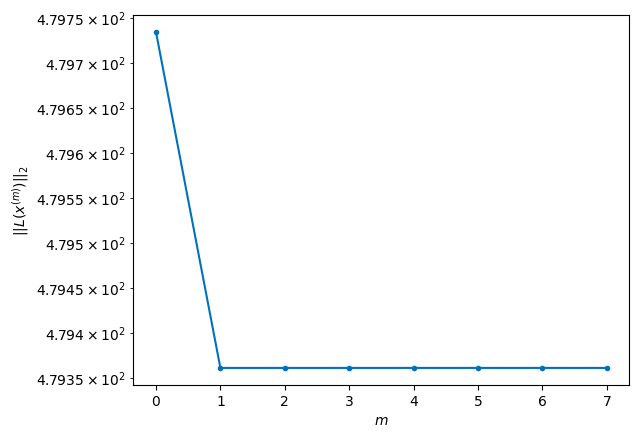

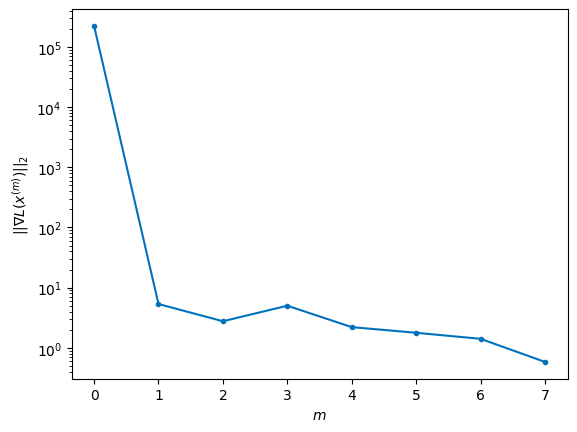


Windows:  58%|█████▊    | 171/296 [34:48<26:30, 12.72s/it]

Before applying the algorithm
Cost function: 476.1022811016578
Gradient norm: 186807.25503741569
Global relative error: 1902936132.4487903
Position relative errors: 0.041657534964227784 m, 4.375321491592108 m, 4613.880935609936 m, 6927.409538417551 m

Iteration 1
Cost function: 475.42639305810945 (-0.14%)
Gradient norm: 18.69210216348615 (-99.99%)
Global relative error: 8323.634306716309 (0.00%)
Position relative errors: 0.043952402240244146 m, 4.012869000357715 m, 4613.902545413879 m, 6927.825615577302 m

Iteration 2
Cost function: 475.42639254065466 (-0.00%)
Gradient norm: 2.744300749376943 (-85.32%)
Global relative error: 8323.634282953659 (-0.00%)
Position relative errors: 0.04395240449313072 m, 4.0128822446168515 m, 4613.9025403988235 m, 6927.825590359349 m

Iteration 3
Cost function: 475.4263926034995 (0.00%)
Gradient norm: 2.971391213678635 (8.27%)
Global relative error: 8323.634282979861 (0.00%)
Position relative errors: 0.04395240360202565 m, 4.012882247568316 m, 4613.90254039

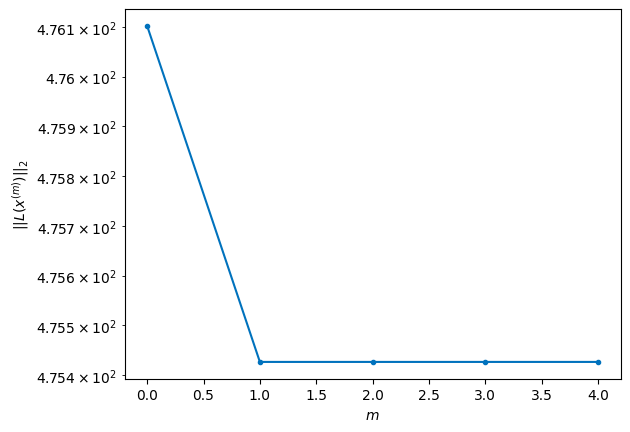

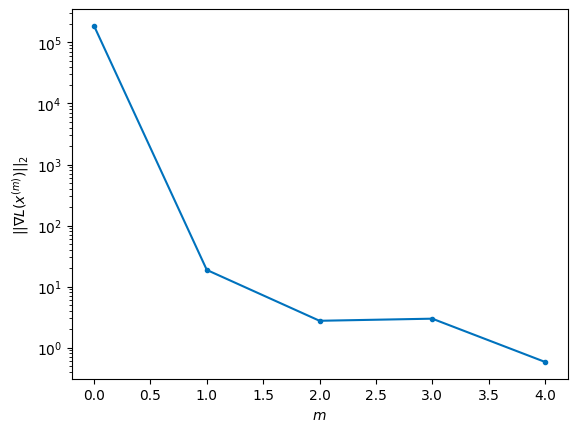


Windows:  58%|█████▊    | 172/296 [34:58<24:26, 11.83s/it]

Before applying the algorithm
Cost function: 476.7202843666765
Gradient norm: 59912.31999876786
Global relative error: 1902339609.2347026
Position relative errors: 0.04232736541457475 m, 4.707365160814646 m, 4512.277485173457 m, 6776.310263287386 m

Iteration 1
Cost function: 476.4611333202547 (-0.05%)
Gradient norm: 1.3205059053396067 (-100.00%)
Global relative error: 8141.240033177116 (0.00%)
Position relative errors: 0.04385928391932415 m, 4.706893759945869 m, 4512.292572131305 m, 6776.353865869077 m

Iteration 2
Cost function: 476.4611332001136 (-0.00%)
Gradient norm: 7.446293613250458 (463.90%)
Global relative error: 8141.240035914334 (0.00%)
Position relative errors: 0.04385927806374273 m, 4.706890310691419 m, 4512.292574838581 m, 6776.353867357278 m

Iteration 3
Cost function: 476.4611342699948 (0.00%)
Gradient norm: 1.923048000636715 (-74.17%)
Global relative error: 8141.240035925505 (0.00%)
Position relative errors: 0.04385928022621474 m, 4.706890286181696 m, 4512.292574842115

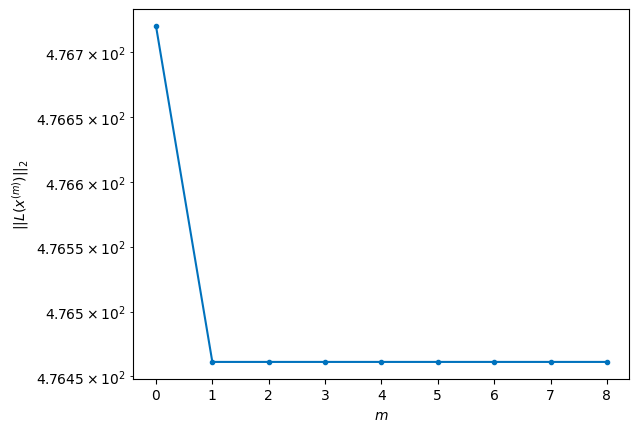

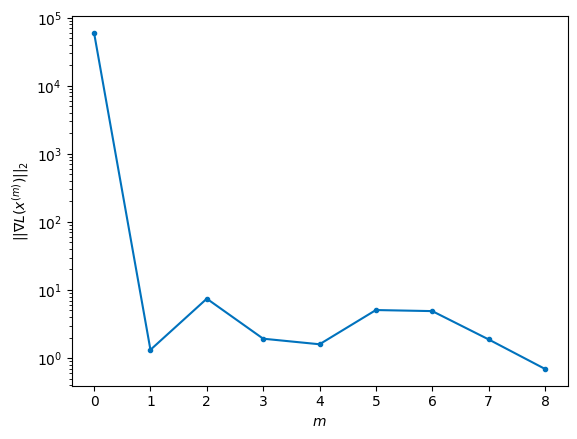


Windows:  58%|█████▊    | 173/296 [35:13<26:30, 12.93s/it]

Before applying the algorithm
Cost function: 484.53698394127434
Gradient norm: 201645.7584696598
Global relative error: 1901734015.7297556
Position relative errors: 0.04232163144534736 m, 5.386947535112318 m, 4390.972964168386 m, 6595.28606518311 m

Iteration 1
Cost function: 483.46538939754026 (-0.22%)
Gradient norm: 9.162345812039744 (-100.00%)
Global relative error: 7923.437404356818 (0.00%)
Position relative errors: 0.045051889854406564 m, 5.208419748506613 m, 4391.104055500276 m, 6595.378909044817 m

STOP on Iteration 2
Cost function = 483.46538964039235 (0.00%)
Gradient norm = 0.9043030371305837 (-90.13%)
Global relative error = 7923.437412417409 (0.00%)
Final position relative errors: 0.045051892753963936 m, 5.208410639788421 m, 4391.104050161823 m, 6595.378922289945 m



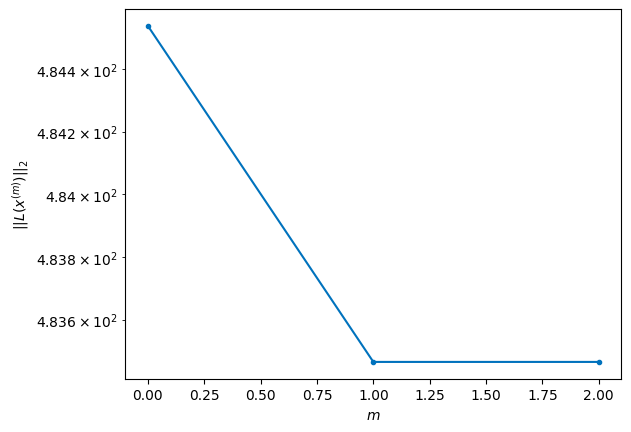

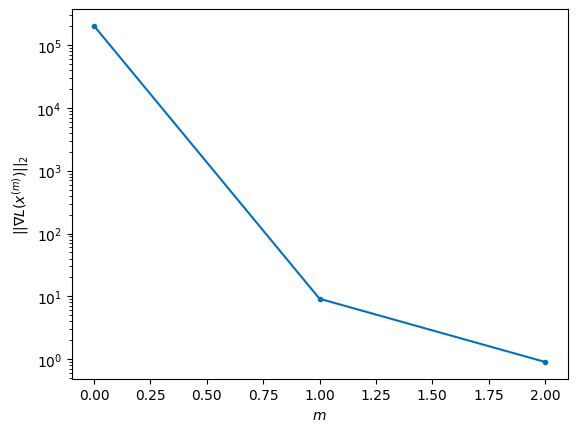


Windows:  59%|█████▉    | 174/296 [35:19<21:48, 10.73s/it]

Before applying the algorithm
Cost function: 484.0474814005909
Gradient norm: 169280.20869935272
Global relative error: 1901121716.8407626
Position relative errors: 0.04376123715849118 m, 5.864613028295545 m, 4250.601935293937 m, 6385.572549451978 m

Iteration 1
Cost function: 483.55104893922453 (-0.10%)
Gradient norm: 8.582968830737407 (-99.99%)
Global relative error: 7671.256446448012 (0.00%)
Position relative errors: 0.05060164881542383 m, 5.9313442769921005 m, 4250.619359433213 m, 6385.949825601706 m

Iteration 2
Cost function: 483.55104881644496 (-0.00%)
Gradient norm: 1.987720124458007 (-76.84%)
Global relative error: 7671.256373499902 (-0.00%)
Position relative errors: 0.0506016442883077 m, 5.931324952252746 m, 4250.619359567296 m, 6385.949737899971 m

Iteration 3
Cost function: 483.5510493295995 (0.00%)
Gradient norm: 1.8766864378498378 (-5.59%)
Global relative error: 7671.256373496966 (-0.00%)
Position relative errors: 0.050601640574954816 m, 5.931324944999346 m, 4250.61935956

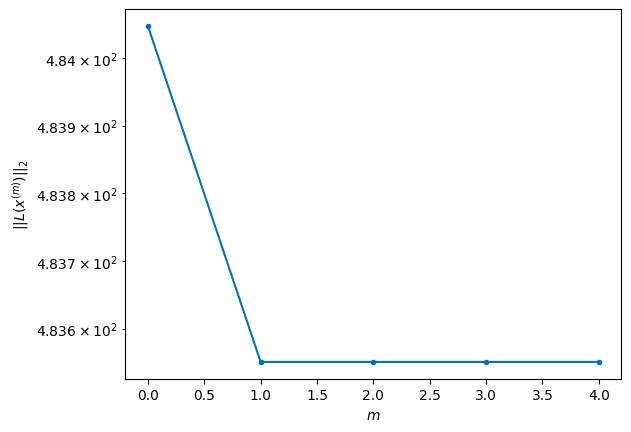

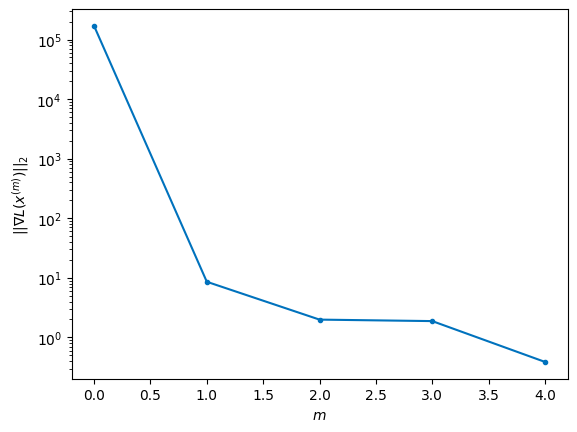


Windows:  59%|█████▉    | 175/296 [35:28<20:30, 10.17s/it]

Before applying the algorithm
Cost function: 487.84447201457476
Gradient norm: 117107.29951406216
Global relative error: 1900505061.3534012
Position relative errors: 0.04925099009413513 m, 6.568434693830898 m, 4091.5553597978324 m, 6148.246069612519 m

Iteration 1
Cost function: 487.18800801704305 (-0.13%)
Gradient norm: 4.982754271798212 (-100.00%)
Global relative error: 7385.249288835773 (0.00%)
Position relative errors: 0.059485391104456185 m, 6.749050789922903 m, 4091.5571010504905 m, 6148.251507214438 m

Iteration 2
Cost function: 487.18800858719226 (0.00%)
Gradient norm: 8.52886287485746 (71.17%)
Global relative error: 7385.249311959203 (0.00%)
Position relative errors: 0.05948539192091823 m, 6.749005991060909 m, 4091.55709828778 m, 6148.251536877897 m

Iteration 3
Cost function: 487.18800845300643 (-0.00%)
Gradient norm: 8.302062374783572 (-2.66%)
Global relative error: 7385.249311953851 (-0.00%)
Position relative errors: 0.05948539861474718 m, 6.749006004140089 m, 4091.55709828

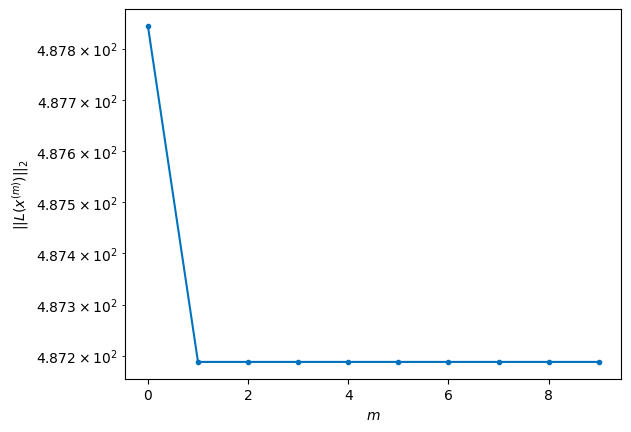

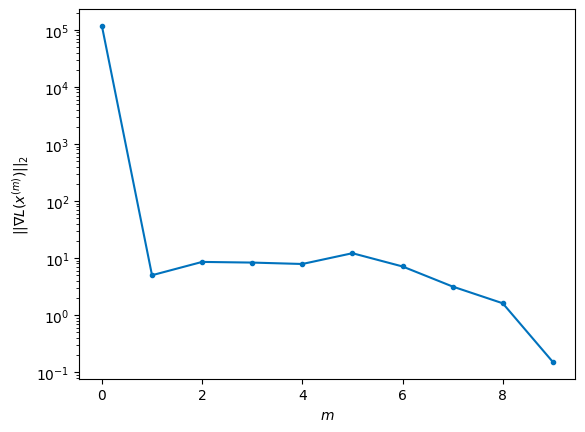


Windows:  59%|█████▉    | 176/296 [35:45<24:42, 12.35s/it]

Before applying the algorithm
Cost function: 480.81386010754346
Gradient norm: 117811.69153562067
Global relative error: 1899886414.1508062
Position relative errors: 0.05819870596785013 m, 7.346155595918262 m, 3914.622864213258 m, 5883.6770510416145 m

Iteration 1
Cost function: 479.3162452485312 (-0.31%)
Gradient norm: 33.553842940715136 (-99.97%)
Global relative error: 7067.601570379558 (0.01%)
Position relative errors: 0.06517827371826053 m, 7.065411747983901 m, 3914.48560915699 m, 5884.53171125081 m

Iteration 2
Cost function: 479.3162450110978 (-0.00%)
Gradient norm: 1.8197812271990974 (-94.58%)
Global relative error: 7067.601421083791 (-0.00%)
Position relative errors: 0.0651782737059087 m, 7.0654226361391705 m, 3914.485582552269 m, 5884.531549624429 m

Iteration 3
Cost function: 479.31624511646663 (0.00%)
Gradient norm: 6.830242432116335 (275.33%)
Global relative error: 7067.601421057963 (-0.00%)
Position relative errors: 0.06517827615870521 m, 7.065422644000899 m, 3914.48558254

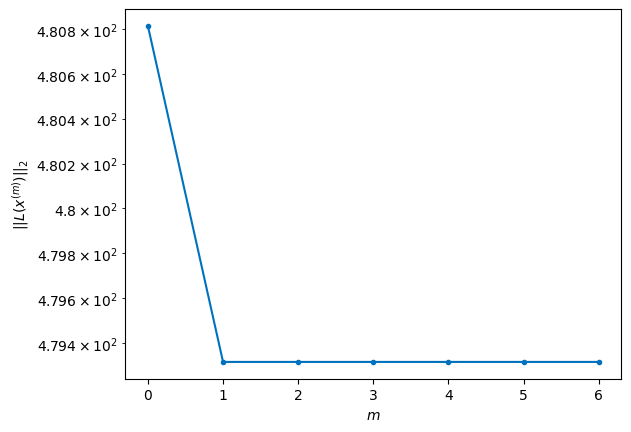

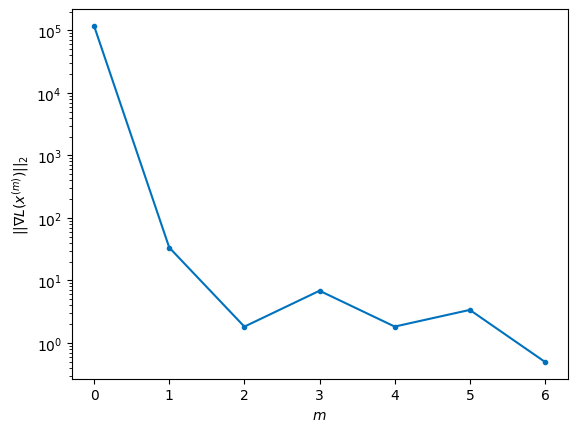


Windows:  60%|█████▉    | 177/296 [35:58<24:47, 12.50s/it]

Before applying the algorithm
Cost function: 487.6237907112748
Gradient norm: 290029.96318680805
Global relative error: 1899268114.4997895
Position relative errors: 0.06374144304675802 m, 7.646023902691588 m, 3720.4585959881874 m, 5594.198086576307 m

Iteration 1
Cost function: 486.97596946319675 (-0.13%)
Gradient norm: 2.6753453637007887 (-100.00%)
Global relative error: 6718.526441026244 (0.00%)
Position relative errors: 0.05945822283378403 m, 7.719289641085078 m, 3720.511133400044 m, 5594.309431859433 m

STOP on Iteration 2
Cost function = 486.9759688708861 (-0.00%)
Gradient norm = 0.5934332841231899 (-77.82%)
Global relative error = 6718.526430345776 (-0.00%)
Final position relative errors: 0.05945822066974923 m, 7.719271694508199 m, 3720.511132374406 m, 5594.309419739507 m



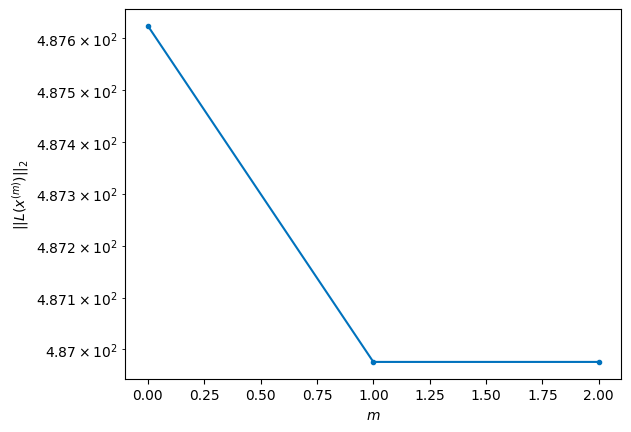

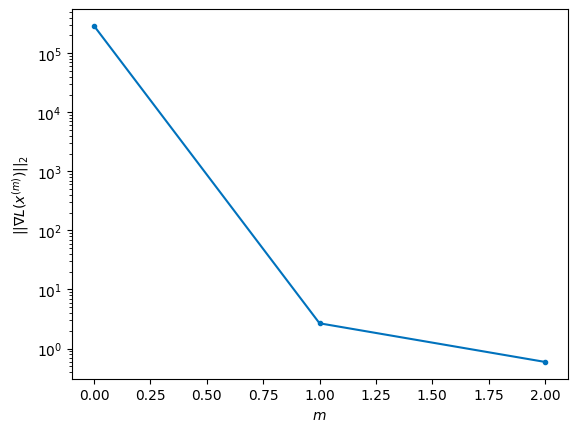


Windows:  60%|██████    | 178/296 [36:04<20:35, 10.47s/it]

Before applying the algorithm
Cost function: 493.77465937790043
Gradient norm: 260052.990848645
Global relative error: 1898652526.572603
Position relative errors: 0.05769858949155796 m, 8.26704576189393 m, 3510.207788664839 m, 5279.531693824871 m

Iteration 1
Cost function: 492.8192720955431 (-0.19%)
Gradient norm: 11.472375059982616 (-100.00%)
Global relative error: 6340.028595032842 (0.00%)
Position relative errors: 0.06527490990373497 m, 8.198933692191455 m, 3510.248911423497 m, 5279.5838005979795 m

Iteration 2
Cost function: 492.8192716250862 (-0.00%)
Gradient norm: 6.3932243739324255 (-44.27%)
Global relative error: 6340.028599897584 (0.00%)
Position relative errors: 0.06527492557864391 m, 8.198926855699003 m, 3510.24890589238 m, 5279.583810127939 m

Iteration 3
Cost function: 492.819272333408 (0.00%)
Gradient norm: 1.4701439157367842 (-77.00%)
Global relative error: 6340.028599899802 (0.00%)
Position relative errors: 0.06527491666271236 m, 8.198926833722684 m, 3510.248905892845 

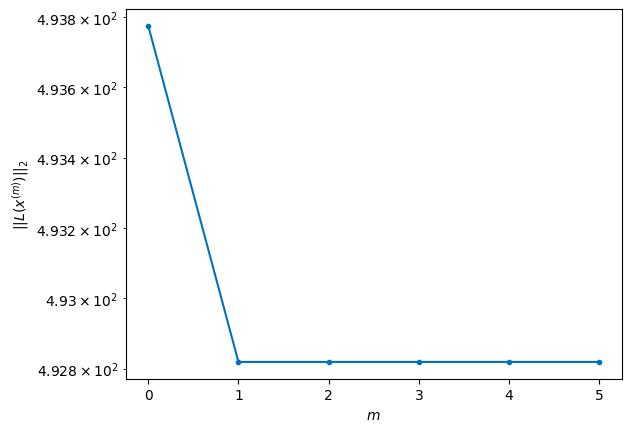

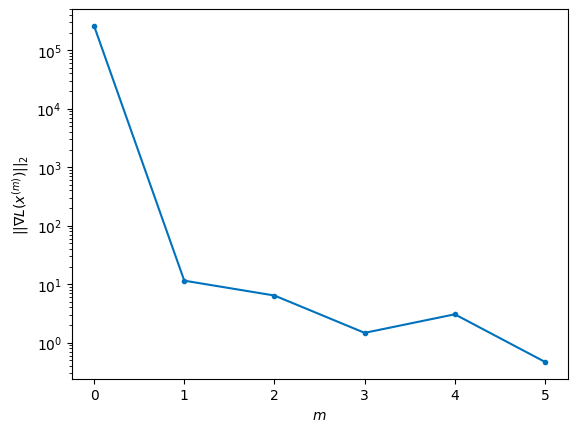


Windows:  60%|██████    | 179/296 [36:15<20:42, 10.62s/it]

Before applying the algorithm
Cost function: 490.7325903301839
Gradient norm: 318548.5117400083
Global relative error: 1898041961.1112015
Position relative errors: 0.06350985882262965 m, 8.699114675091366 m, 3284.585239680321 m, 4941.776892178125 m

Iteration 1
Cost function: 490.23784919433257 (-0.10%)
Gradient norm: 6.855721720215896 (-100.00%)
Global relative error: 5933.882994024238 (0.00%)
Position relative errors: 0.0653192228796817 m, 8.660169051806312 m, 3284.557867476745 m, 4941.9149238482905 m

Iteration 2
Cost function: 490.23784962414345 (0.00%)
Gradient norm: 5.225789574707542 (-23.77%)
Global relative error: 5933.882983932331 (-0.00%)
Position relative errors: 0.06531922001217892 m, 8.660164069933412 m, 3284.5578671298417 m, 4941.914911969992 m

STOP on Iteration 3
Cost function = 490.2378490174533 (-0.00%)
Gradient norm = 0.850082547306371 (-83.73%)
Global relative error = 5933.882983951064 (0.00%)
Final position relative errors: 0.06531921664505484 m, 8.660164080971022 

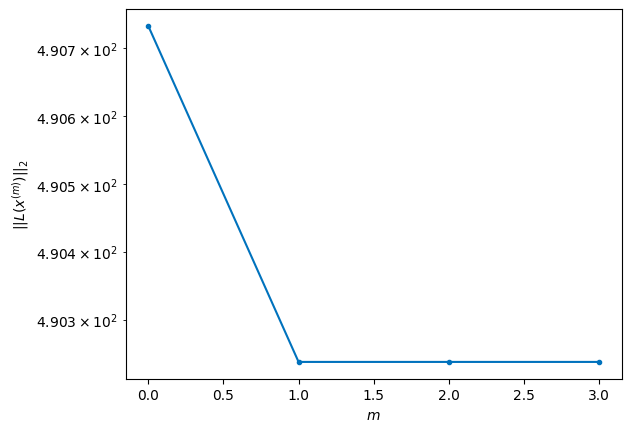

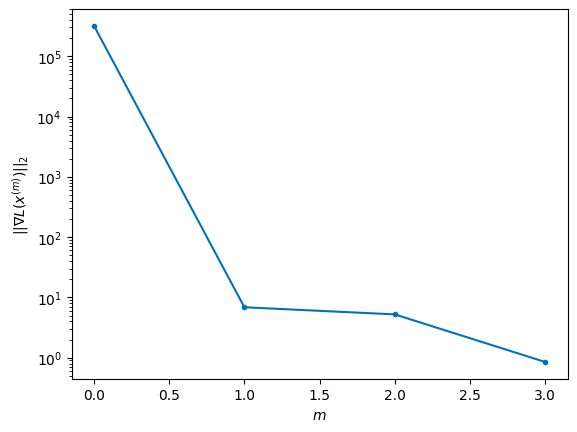


Windows:  61%|██████    | 180/296 [36:22<18:44,  9.69s/it]

Before applying the algorithm
Cost function: 494.79777034227675
Gradient norm: 166015.38848232833
Global relative error: 1897438716.545426
Position relative errors: 0.06353119043034118 m, 9.11853908824743 m, 3044.529140874601 m, 4582.522892981745 m

Iteration 1
Cost function: 493.8803410035311 (-0.19%)
Gradient norm: 14.937096767046924 (-99.99%)
Global relative error: 5501.67505377116 (-0.00%)
Position relative errors: 0.07133257527076316 m, 8.733291244552554 m, 3044.5665266457972 m, 4582.4569716189735 m

Iteration 2
Cost function: 493.88034094145866 (-0.00%)
Gradient norm: 2.2208718247036194 (-85.13%)
Global relative error: 5501.675046833523 (-0.00%)
Position relative errors: 0.07133257437060875 m, 8.733194461309063 m, 3044.566520901314 m, 4582.456967290695 m

STOP on Iteration 3
Cost function = 493.8803411129042 (0.00%)
Gradient norm = 0.24359909948340747 (-89.03%)
Global relative error = 5501.6750468457085 (0.00%)
Final position relative errors: 0.07133256834120914 m, 8.733194449078

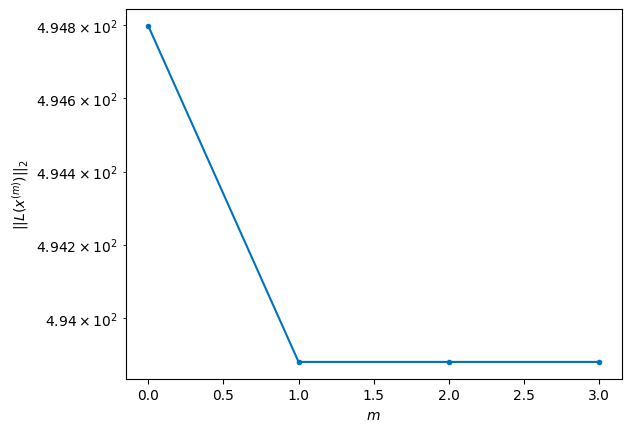

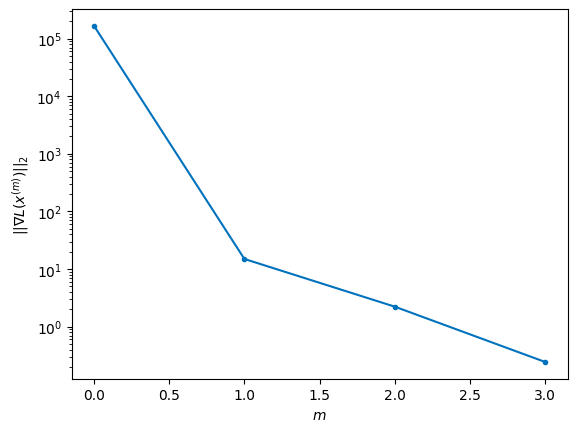


Windows:  61%|██████    | 181/296 [36:31<17:55,  9.36s/it]

Before applying the algorithm
Cost function: 494.359898173606
Gradient norm: 80437.50107513525
Global relative error: 1896845076.363453
Position relative errors: 0.06934781698120739 m, 9.166170219610239 m, 2791.207156907817 m, 4203.033568785718 m

Iteration 1
Cost function: 493.94361954297426 (-0.08%)
Gradient norm: 7.8184482159264475 (-99.99%)
Global relative error: 5045.320569338276 (-0.00%)
Position relative errors: 0.07679044385414359 m, 8.969855552061471 m, 2791.1839273200794 m, 4202.905034986232 m

Iteration 2
Cost function: 493.9436196451926 (0.00%)
Gradient norm: 1.394733834681338 (-82.16%)
Global relative error: 5045.32057071336 (0.00%)
Position relative errors: 0.0767904419070856 m, 8.969821854284454 m, 2791.1839258370483 m, 4202.905037693806 m

Iteration 3
Cost function: 493.94362014227073 (0.00%)
Gradient norm: 3.516688772378749 (152.14%)
Global relative error: 5045.320570735782 (0.00%)
Position relative errors: 0.07679043820025648 m, 8.969821847543722 m, 2791.1839258361338

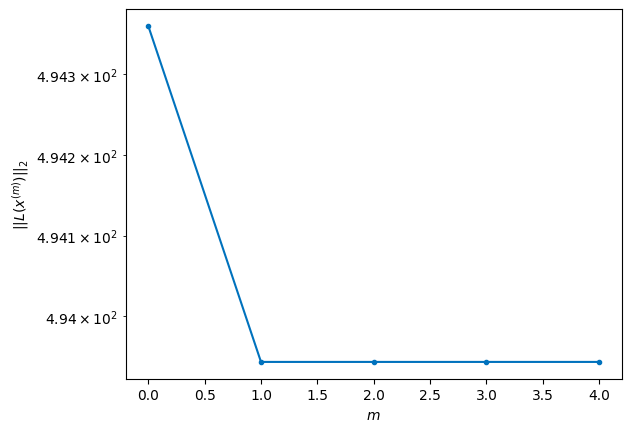

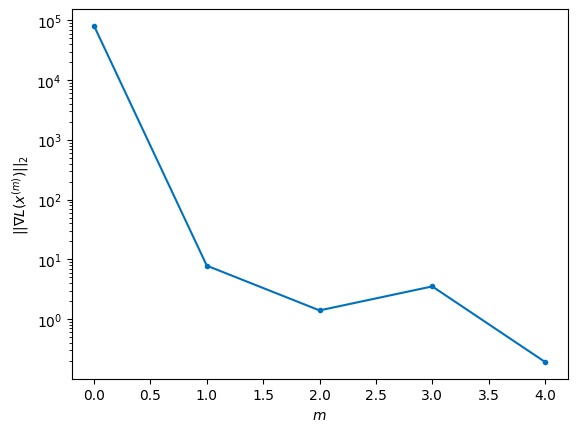


Windows:  61%|██████▏   | 182/296 [36:41<18:01,  9.49s/it]

Before applying the algorithm
Cost function: 496.1506937355053
Gradient norm: 92780.47114036596
Global relative error: 1896263299.5991642
Position relative errors: 0.07473236890674452 m, 9.35154668693773 m, 2525.615352008571 m, 3805.1158717991684 m

Iteration 1
Cost function: 495.03033016511614 (-0.23%)
Gradient norm: 11.704592228071116 (-99.99%)
Global relative error: 4566.8942241240775 (-0.00%)
Position relative errors: 0.08799314407089036 m, 9.143602221433136 m, 2525.6905872277994 m, 3804.899470463329 m

Iteration 2
Cost function: 495.030330279092 (0.00%)
Gradient norm: 3.14542826261919 (-73.13%)
Global relative error: 4566.894216548067 (-0.00%)
Position relative errors: 0.0879931457742824 m, 9.143572100134909 m, 2525.6905811116435 m, 3804.8994655024167 m

Iteration 3
Cost function: 495.03032993048527 (-0.00%)
Gradient norm: 2.0400426577249884 (-35.14%)
Global relative error: 4566.894216553823 (0.00%)
Position relative errors: 0.08799314337921944 m, 9.143572100130092 m, 2525.6905811

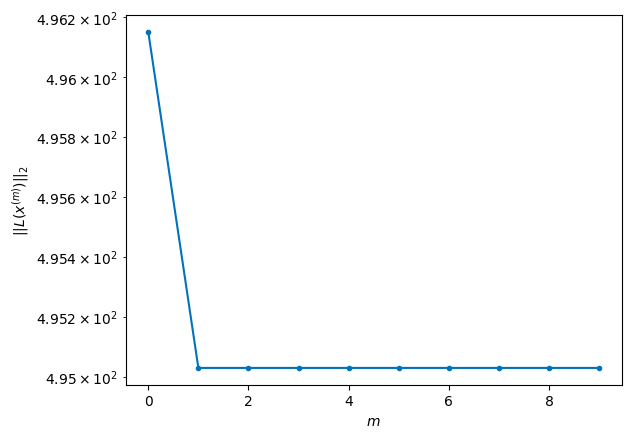

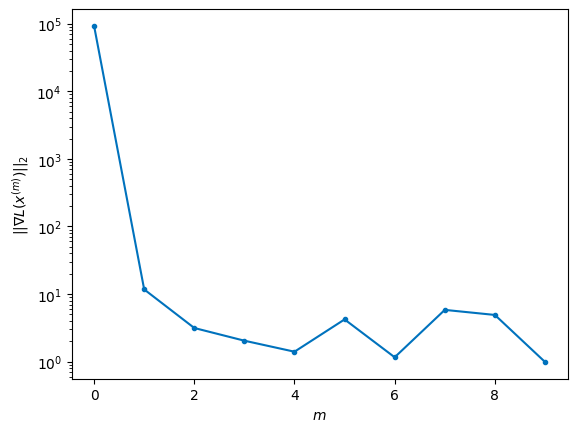


Windows:  62%|██████▏   | 183/296 [36:58<22:10, 11.78s/it]

Before applying the algorithm
Cost function: 493.100571162894
Gradient norm: 236451.59748533217
Global relative error: 1895695615.5613825
Position relative errors: 0.08556125837266962 m, 9.472553285757556 m, 2249.0580000330046 m, 3390.4912411903906 m

Iteration 1
Cost function: 492.3468782391046 (-0.15%)
Gradient norm: 7.654432745273758 (-100.00%)
Global relative error: 4068.5037075618743 (-0.00%)
Position relative errors: 0.06907506246365099 m, 9.18597435713478 m, 2249.0759868573937 m, 3390.3132138568903 m

Iteration 2
Cost function: 492.346877643058 (-0.00%)
Gradient norm: 1.542992430263466 (-79.84%)
Global relative error: 4068.5036932353696 (-0.00%)
Position relative errors: 0.06907505602506307 m, 9.185922277484863 m, 2249.0759841450667 m, 3390.3131986049457 m

Iteration 3
Cost function: 492.34687754647206 (-0.00%)
Gradient norm: 1.390287559402415 (-9.90%)
Global relative error: 4068.5036932396274 (0.00%)
Position relative errors: 0.06907506331181139 m, 9.18592228831865 m, 2249.0759

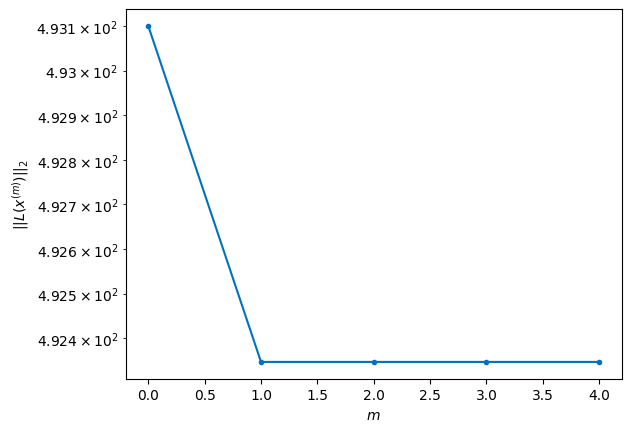

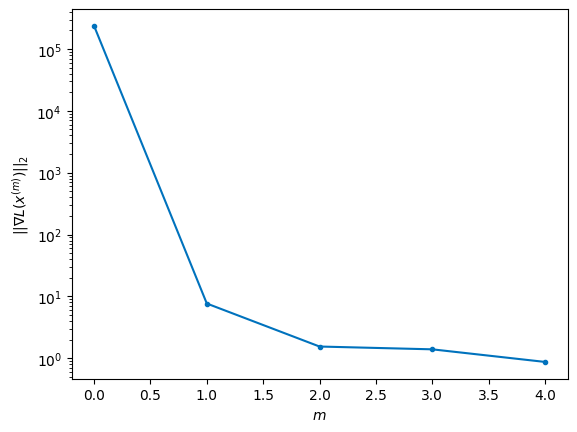


Windows:  62%|██████▏   | 184/296 [37:07<20:35, 11.03s/it]

Before applying the algorithm
Cost function: 494.17152710454064
Gradient norm: 262056.55422951793
Global relative error: 1895144194.6863184
Position relative errors: 0.06770650911138107 m, 9.479275833920726 m, 1962.5931250967742 m, 2961.078961451288 m

Iteration 1
Cost function: 493.6275662543901 (-0.11%)
Gradient norm: 5.8282752178122195 (-100.00%)
Global relative error: 3552.305258589641 (-0.00%)
Position relative errors: 0.06448305124154939 m, 9.262568139810755 m, 1962.6080352185245 m, 2960.8917936904863 m

Iteration 2
Cost function: 493.62756649810206 (0.00%)
Gradient norm: 3.7042506602123013 (-36.44%)
Global relative error: 3552.3052553828256 (-0.00%)
Position relative errors: 0.06448304837417793 m, 9.262498762965256 m, 1962.6080332081988 m, 2960.8917913925543 m

Iteration 3
Cost function: 493.6275668474758 (0.00%)
Gradient norm: 3.5756352147380848 (-3.47%)
Global relative error: 3552.30525537928 (-0.00%)
Position relative errors: 0.06448304505882925 m, 9.262498766872897 m, 1962.6

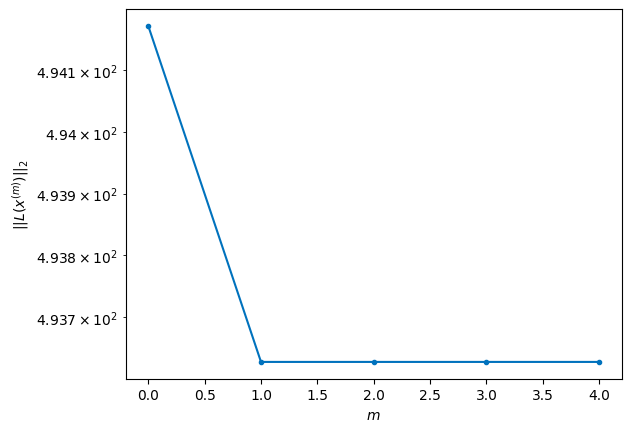

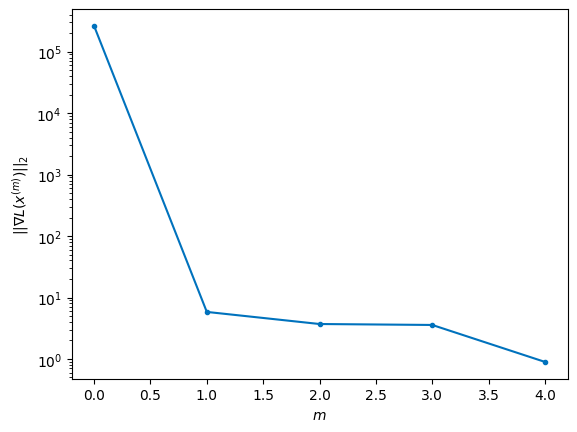


Windows:  62%|██████▎   | 185/296 [37:17<19:51, 10.73s/it]

Before applying the algorithm
Cost function: 491.8534771998837
Gradient norm: 83039.2883550774
Global relative error: 1894611197.2660325
Position relative errors: 0.06317565421330432 m, 9.537631902022623 m, 1667.5328321127872 m, 2518.6776057040142 m

Iteration 1
Cost function: 491.33368972575784 (-0.11%)
Gradient norm: 5.537646834344447 (-99.99%)
Global relative error: 3020.463402699119 (-0.01%)
Position relative errors: 0.07229015031183576 m, 9.750786169989823 m, 1667.5653034777538 m, 2518.3823095706657 m

STOP on Iteration 2
Cost function = 491.33368977037816 (0.00%)
Gradient norm = 0.677831218475719 (-87.76%)
Global relative error = 3020.46339856988 (-0.00%)
Final position relative errors: 0.07229015452281434 m, 9.750790822267254 m, 1667.5653045224253 m, 2518.382303908449 m



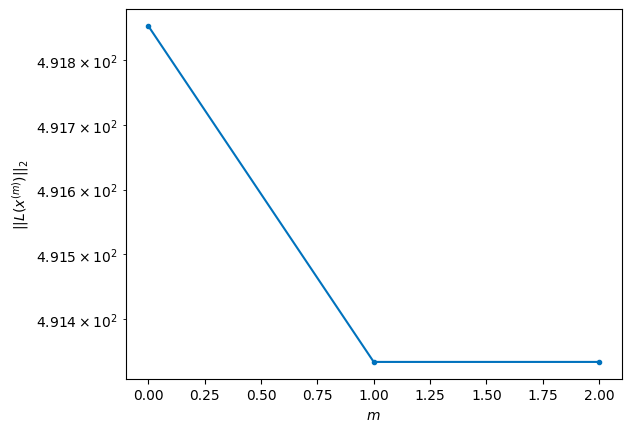

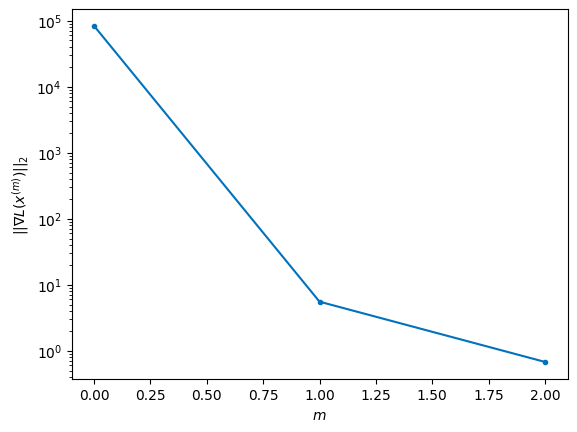


Windows:  63%|██████▎   | 186/296 [37:23<16:54,  9.22s/it]

Before applying the algorithm
Cost function: 492.50704278672174
Gradient norm: 76871.35835122847
Global relative error: 1894098730.7515633
Position relative errors: 0.07111151598790191 m, 9.97553633435463 m, 1365.197892523098 m, 2065.146232411372 m

Iteration 1
Cost function: 492.20017349681547 (-0.06%)
Gradient norm: 5.075917011509343 (-99.99%)
Global relative error: 2475.717509017278 (0.00%)
Position relative errors: 0.07686251802688228 m, 9.800502119062324 m, 1365.1731785392913 m, 2065.260052518018 m

Iteration 2
Cost function: 492.2001739152119 (0.00%)
Gradient norm: 1.8786520325774274 (-62.99%)
Global relative error: 2475.717521504004 (0.00%)
Position relative errors: 0.07686251567016038 m, 9.80049317915614 m, 1365.1731767902281 m, 2065.260068685012 m

Iteration 3
Cost function: 492.20017362162986 (-0.00%)
Gradient norm: 4.10296151661662 (118.40%)
Global relative error: 2475.71752150005 (-0.00%)
Position relative errors: 0.07686250950904347 m, 9.80049318757262 m, 1365.173176790069

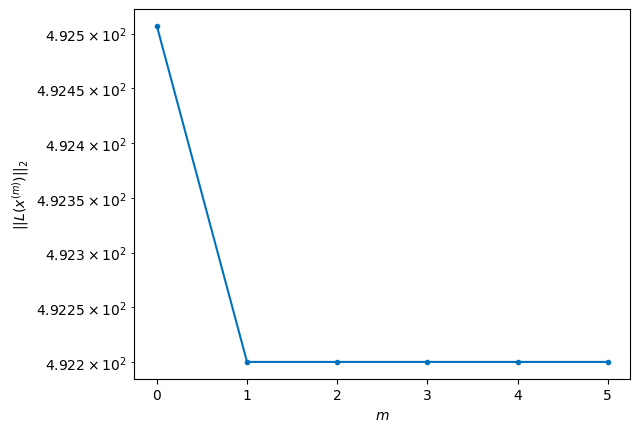

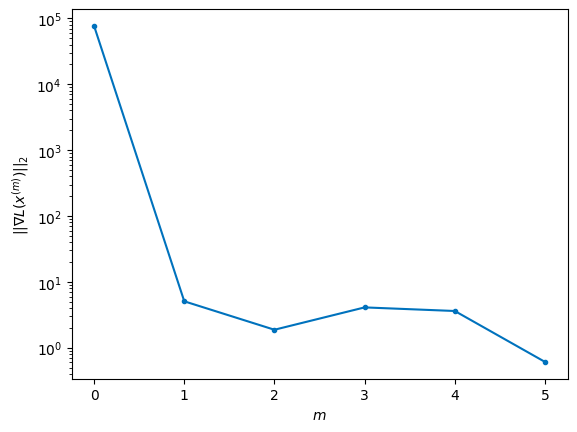


Windows:  63%|██████▎   | 187/296 [37:33<17:35,  9.68s/it]

Before applying the algorithm
Cost function: 501.58343222262243
Gradient norm: 178928.29536333724
Global relative error: 1893608842.356125
Position relative errors: 0.07566111972112641 m, 9.989197605949206 m, 1056.8228011244264 m, 1602.9538705675097 m

Iteration 1
Cost function: 499.94185001702317 (-0.33%)
Gradient norm: 32.41301791408932 (-99.98%)
Global relative error: 1919.2742896965349 (-0.04%)
Position relative errors: 0.062412368119332255 m, 10.151500950055468 m, 1056.835816485528 m, 1602.0367033049902 m

Iteration 2
Cost function: 499.94185061261055 (0.00%)
Gradient norm: 2.6158382113632106 (-91.93%)
Global relative error: 1919.274299059822 (0.00%)
Position relative errors: 0.06241236650006994 m, 10.151427561049818 m, 1056.8358209093735 m, 1602.0367120690414 m

Iteration 3
Cost function: 499.94185029289383 (-0.00%)
Gradient norm: 5.193339796166248 (98.53%)
Global relative error: 1919.2742990640654 (0.00%)
Position relative errors: 0.0624123695933054 m, 10.151427561377405 m, 1056

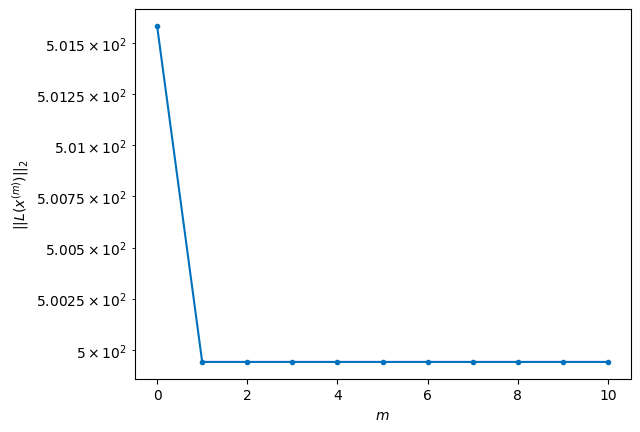

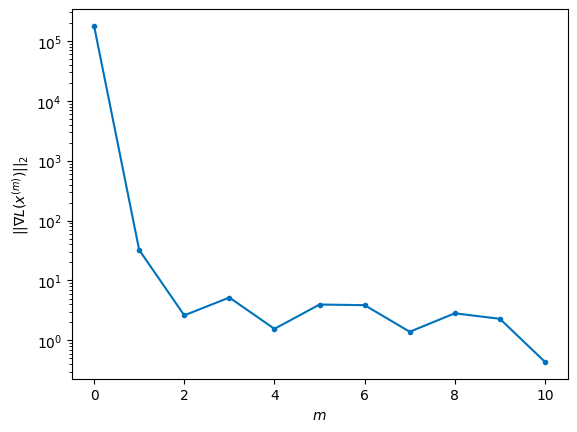


Windows:  64%|██████▎   | 188/296 [37:52<22:17, 12.39s/it]

Before applying the algorithm
Cost function: 501.4439772781099
Gradient norm: 100517.67297467952
Global relative error: 1893143537.9983745
Position relative errors: 0.06209899590121682 m, 10.27445545207341 m, 743.8699195213218 m, 1132.7388348112909 m

Iteration 1
Cost function: 500.70142858177485 (-0.15%)
Gradient norm: 11.217080774044788 (-99.99%)
Global relative error: 1354.8459625459714 (-0.03%)
Position relative errors: 0.06275953287309281 m, 10.695703649678494 m, 743.8340875892692 m, 1132.3049866205074 m

STOP on Iteration 2
Cost function = 500.70142869827754 (0.00%)
Gradient norm = 0.6980557400147067 (-93.78%)
Global relative error = 1354.845921522201 (-0.00%)
Final position relative errors: 0.06275953185259023 m, 10.695772698134054 m, 743.8340888541517 m, 1132.3049360506898 m



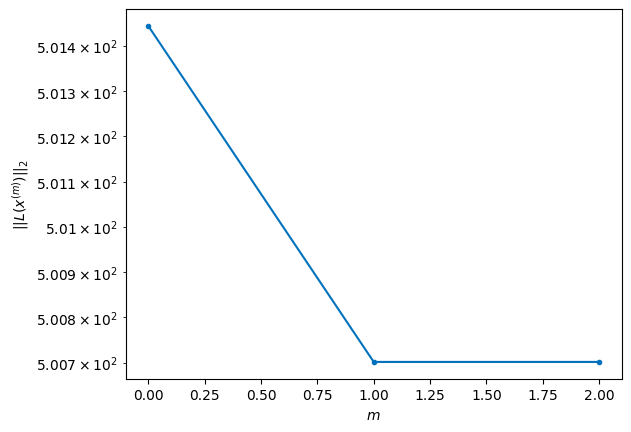

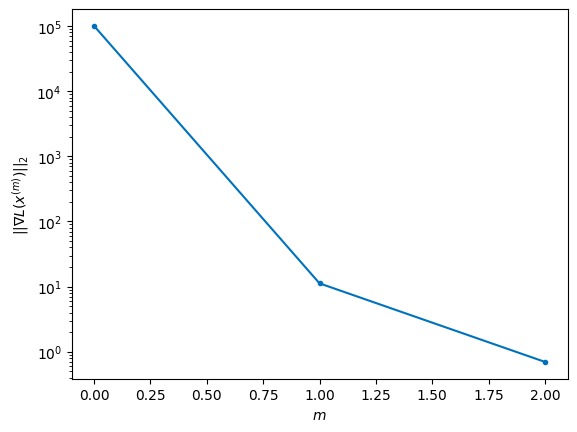


Windows:  64%|██████▍   | 189/296 [37:58<18:23, 10.31s/it]

Before applying the algorithm
Cost function: 497.16505647934446
Gradient norm: 108065.90055074777
Global relative error: 1892704746.6959264
Position relative errors: 0.06260813079544399 m, 10.77167087308826 m, 427.6163171650378 m, 658.0469557103349 m

Iteration 1
Cost function: 496.37754644448955 (-0.16%)
Gradient norm: 20.15250752216206 (-99.98%)
Global relative error: 784.4930153180851 (-0.05%)
Position relative errors: 0.055033012359059705 m, 11.360937794214207 m, 427.68359008881595 m, 657.4922240157695 m

STOP on Iteration 2
Cost function = 496.37754658469845 (0.00%)
Gradient norm = 0.5838855893943192 (-97.10%)
Global relative error = 784.4928654267013 (-0.00%)
Final position relative errors: 0.05503301516844554 m, 11.361104436712166 m, 427.6836112137245 m, 657.4920285497208 m



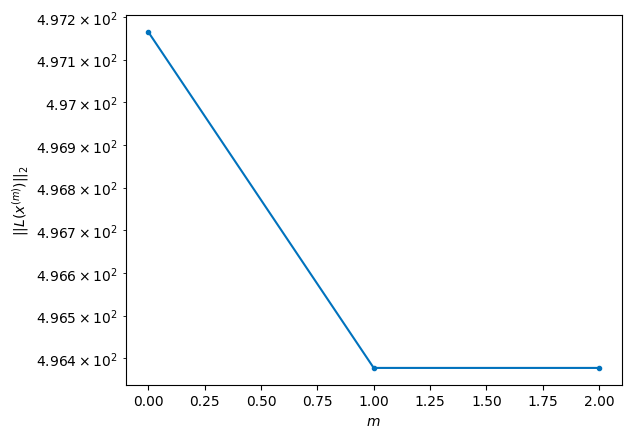

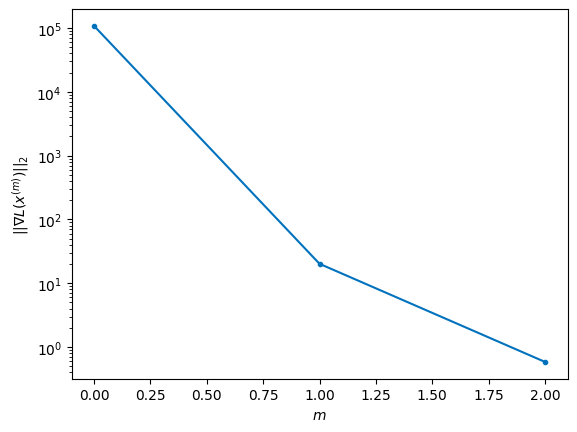


Windows:  64%|██████▍   | 190/296 [38:03<15:46,  8.93s/it]

Before applying the algorithm
Cost function: 494.9800788245915
Gradient norm: 135135.43879466955
Global relative error: 1892294347.1774127
Position relative errors: 0.05575087389894336 m, 11.394750640109697 m, 109.60653599544436 m, 180.3247075647186 m

Iteration 1
Cost function: 494.64301533354006 (-0.07%)
Gradient norm: 5.181335040548875 (-100.00%)
Global relative error: 211.67997291638042 (0.06%)
Position relative errors: 0.05615836170696876 m, 11.127097259399783 m, 109.66807167784161 m, 180.46017773283444 m

Iteration 2
Cost function: 494.6430150546016 (-0.00%)
Gradient norm: 2.6075635236573333 (-49.67%)
Global relative error: 211.67993523238698 (-0.00%)
Position relative errors: 0.056158360578246205 m, 11.127173724418432 m, 109.66807511222702 m, 180.46012672603848 m

Iteration 3
Cost function: 494.6430149665064 (-0.00%)
Gradient norm: 2.9534329814960456 (13.26%)
Global relative error: 211.67993524423414 (0.00%)
Position relative errors: 0.05615836476195928 m, 11.127173716423169 m, 

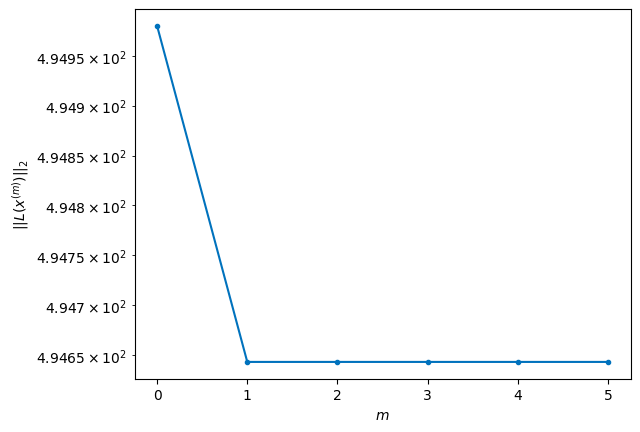

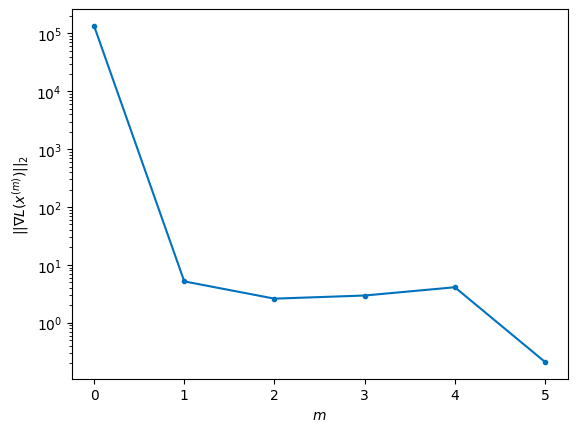


Windows:  65%|██████▍   | 191/296 [38:14<16:32,  9.46s/it]

Before applying the algorithm
Cost function: 497.012678868137
Gradient norm: 218589.51999320355
Global relative error: 1891914117.1638496
Position relative errors: 0.056729330593938254 m, 11.09960208548632 m, 208.89731802553206 m, 297.5219039973894 m

Iteration 1
Cost function: 496.61297911571467 (-0.08%)
Gradient norm: 4.795507315652148 (-100.00%)
Global relative error: 363.98289339793536 (0.04%)
Position relative errors: 0.05716300350300474 m, 11.177852484463495 m, 208.84546539089283 m, 297.7425777657556 m

Iteration 2
Cost function: 496.61297918603356 (0.00%)
Gradient norm: 1.6268783554429105 (-66.07%)
Global relative error: 363.98292556350447 (0.00%)
Position relative errors: 0.05716300391305251 m, 11.177875781490853 m, 208.84546125897086 m, 297.7426191104373 m

Iteration 3
Cost function: 496.61297914035055 (-0.00%)
Gradient norm: 1.031966682008923 (-36.57%)
Global relative error: 363.98292557305126 (0.00%)
Position relative errors: 0.05716300352683669 m, 11.177875783052 m, 208.845

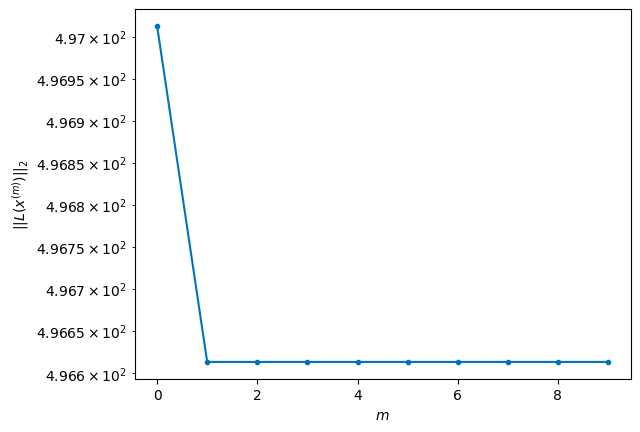

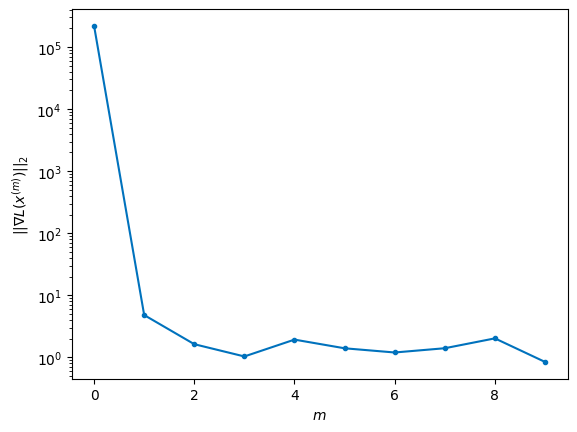


Windows:  65%|██████▍   | 192/296 [38:32<20:36, 11.89s/it]

Before applying the algorithm
Cost function: 501.50195933914654
Gradient norm: 107218.3063287153
Global relative error: 1891565767.6693344
Position relative errors: 0.0574283832215512 m, 11.087240234437393 m, 526.4732363479152 m, 774.413545140703 m

Iteration 1
Cost function: 500.8988689110671 (-0.12%)
Gradient norm: 5.317042162363072 (-100.00%)
Global relative error: 936.8384828907031 (0.03%)
Position relative errors: 0.05522464908554173 m, 11.314269264859034 m, 526.4158926178003 m, 774.812245675484 m

STOP on Iteration 2
Cost function = 500.8988692976996 (0.00%)
Gradient norm = 0.6690077036873854 (-87.42%)
Global relative error = 936.8384830576639 (0.00%)
Final position relative errors: 0.05522464710611955 m, 11.314281844125388 m, 526.415886717529 m, 774.8122497022816 m



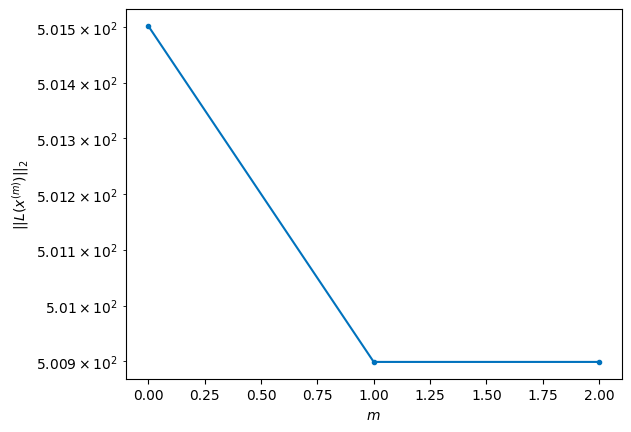

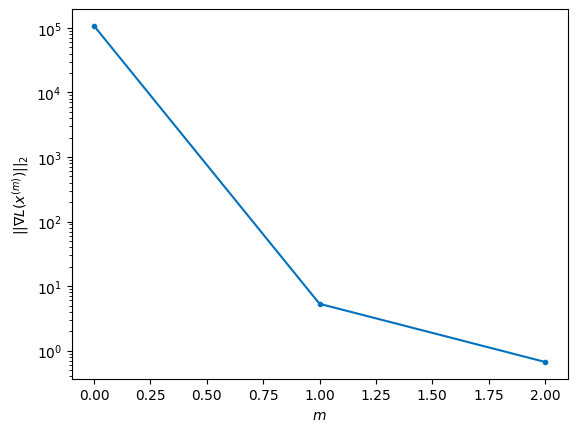


Windows:  65%|██████▌   | 193/296 [38:38<17:36, 10.26s/it]

Before applying the algorithm
Cost function: 509.85192595218246
Gradient norm: 132287.28187004148
Global relative error: 1891250910.3625839
Position relative errors: 0.05515485645630826 m, 11.163671318048134 m, 841.7284592043978 m, 1248.0915893520407 m

Iteration 1
Cost function: 508.70577111478553 (-0.22%)
Gradient norm: 17.212049926929073 (-99.99%)
Global relative error: 1504.85835652292 (-0.04%)
Position relative errors: 0.04316177070199027 m, 10.81280513963444 m, 841.7326316158851 m, 1247.3487885195145 m

Iteration 2
Cost function: 508.7057715415564 (0.00%)
Gradient norm: 4.171940397715837 (-75.76%)
Global relative error: 1504.8581876315523 (-0.00%)
Position relative errors: 0.04316177042226425 m, 10.812787897205787 m, 841.7326380398507 m, 1247.3485805756304 m

STOP on Iteration 3
Cost function = 508.70577097976354 (-0.00%)
Gradient norm = 0.6818188353258595 (-83.66%)
Global relative error = 1504.8581875995092 (-0.00%)
Final position relative errors: 0.04316176888333208 m, 10.81278

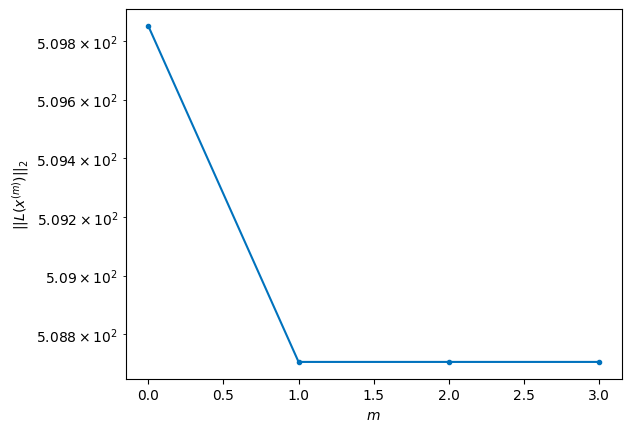

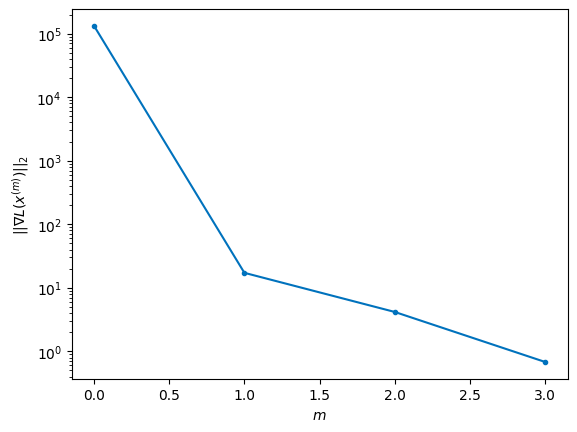


Windows:  66%|██████▌   | 194/296 [38:45<15:55,  9.36s/it]

Before applying the algorithm
Cost function: 511.73697058846886
Gradient norm: 101657.57953913035
Global relative error: 1890971050.4363654
Position relative errors: 0.04432738057215881 m, 10.603857723481296 m, 1153.3566687685413 m, 1715.1751871479273 m

Iteration 1
Cost function: 510.8441138280556 (-0.17%)
Gradient norm: 26.4550998527436 (-99.97%)
Global relative error: 2067.3173206818756 (0.02%)
Position relative errors: 0.04499958780781747 m, 11.278883449792048 m, 1153.5503586814098 m, 1715.4908241670405 m

STOP on Iteration 2
Cost function = 510.84411328343305 (-0.00%)
Gradient norm = 0.2107537164243231 (-99.20%)
Global relative error = 2067.3173225571536 (0.00%)
Final position relative errors: 0.044999590602035754 m, 11.279004672215505 m, 1153.5503589355023 m, 1715.4908254588238 m



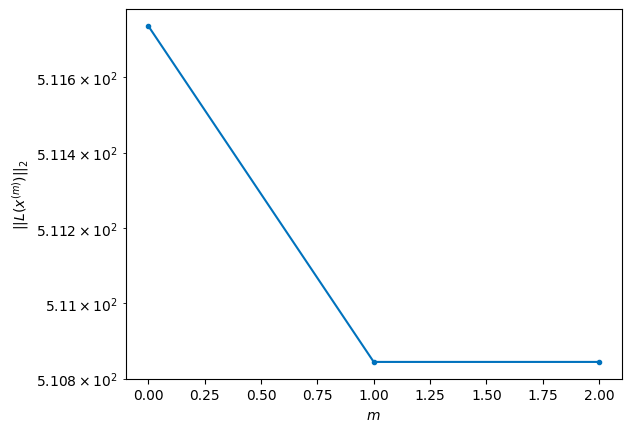

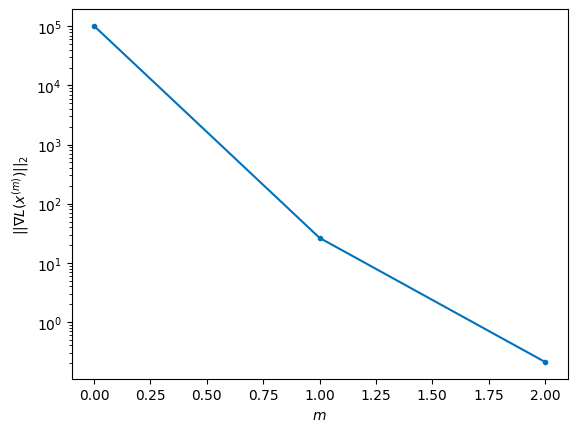


Windows:  66%|██████▌   | 195/296 [38:51<13:57,  8.29s/it]

Before applying the algorithm
Cost function: 514.9269250793079
Gradient norm: 118474.20131739887
Global relative error: 1890727594.8388352
Position relative errors: 0.04572603917445437 m, 11.028994248459867 m, 1460.1359797161385 m, 2175.8123056124036 m

Iteration 1
Cost function: 514.0967961761805 (-0.16%)
Gradient norm: 16.405944369344365 (-99.99%)
Global relative error: 2620.951026521863 (0.02%)
Position relative errors: 0.042681850056623255 m, 11.441611682615484 m, 1460.1065652168247 m, 2176.524490167102 m

Iteration 2
Cost function: 514.096795952074 (-0.00%)
Gradient norm: 3.6944128826487694 (-77.48%)
Global relative error: 2620.9508884121137 (-0.00%)
Position relative errors: 0.04268184548321367 m, 11.441591358472262 m, 1460.1065600247462 m, 2176.524327446474 m

Iteration 3
Cost function: 514.0967958276087 (-0.00%)
Gradient norm: 1.8136434138381965 (-50.91%)
Global relative error: 2620.9508884171987 (0.00%)
Position relative errors: 0.04268184756359551 m, 11.441591350122092 m, 146

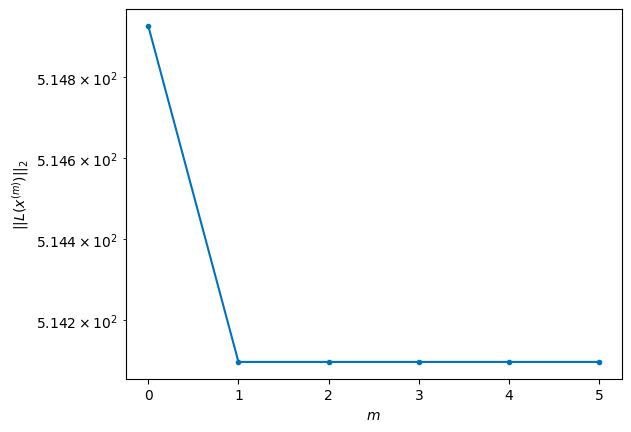

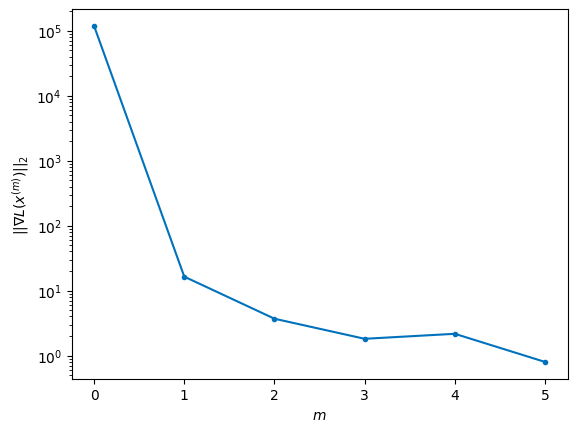


Windows:  66%|██████▌   | 196/296 [39:02<15:14,  9.14s/it]

Before applying the algorithm
Cost function: 515.7967176638226
Gradient norm: 284865.80043547595
Global relative error: 1890521824.8492548
Position relative errors: 0.04363776561262074 m, 11.140079355573349 m, 1760.298703718155 m, 2627.3057618096586 m

Iteration 1
Cost function: 515.1455420878412 (-0.13%)
Gradient norm: 16.273671323390506 (-99.99%)
Global relative error: 3163.133598983733 (0.02%)
Position relative errors: 0.041153091282284 m, 11.45531833993584 m, 1760.3582460706718 m, 2627.9920574585153 m

Iteration 2
Cost function: 515.1455412083812 (-0.00%)
Gradient norm: 1.9596922387900586 (-87.96%)
Global relative error: 3163.133532328076 (-0.00%)
Position relative errors: 0.04115308899295277 m, 11.455368963133166 m, 1760.358242985892 m, 2627.9919790752783 m

Iteration 3
Cost function: 515.1455419300413 (0.00%)
Gradient norm: 2.9342144080355133 (49.73%)
Global relative error: 3163.1335323366043 (0.00%)
Position relative errors: 0.04115309377222974 m, 11.4553689639375 m, 1760.358242

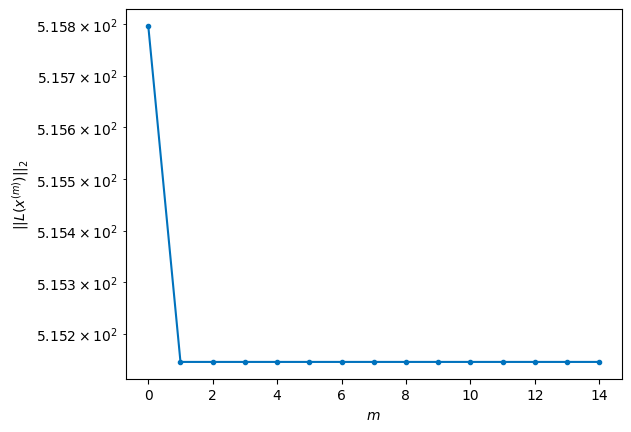

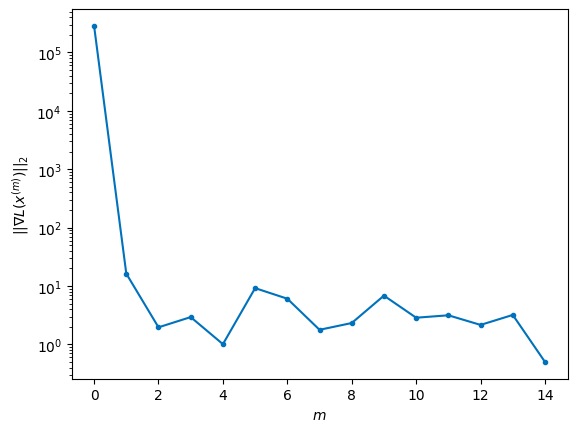


Windows:  67%|██████▋   | 197/296 [39:28<23:14, 14.08s/it]

Before applying the algorithm
Cost function: 515.1671817551369
Gradient norm: 51512.72307075521
Global relative error: 1890354888.7457163
Position relative errors: 0.04207636291312219 m, 11.116440889364984 m, 2052.8544049503826 m, 3067.299098703036 m

Iteration 1
Cost function: 514.5748364023244 (-0.11%)
Gradient norm: 11.481006988906383 (-99.98%)
Global relative error: 3691.1761749814364 (0.01%)
Position relative errors: 0.03487357732625018 m, 11.061339556452692 m, 2053.002440969208 m, 3067.534031027254 m

Iteration 2
Cost function: 514.5748373310076 (0.00%)
Gradient norm: 3.1613034172916974 (-72.46%)
Global relative error: 3691.1762276734094 (0.00%)
Position relative errors: 0.034873578486893035 m, 11.061402368854889 m, 2053.002434606456 m, 3067.534098463668 m

STOP on Iteration 3
Cost function = 514.5748372216134 (-0.00%)
Gradient norm = 0.2260183641598354 (-92.85%)
Global relative error = 3691.1762276890177 (0.00%)
Final position relative errors: 0.034873572528944526 m, 11.06140237

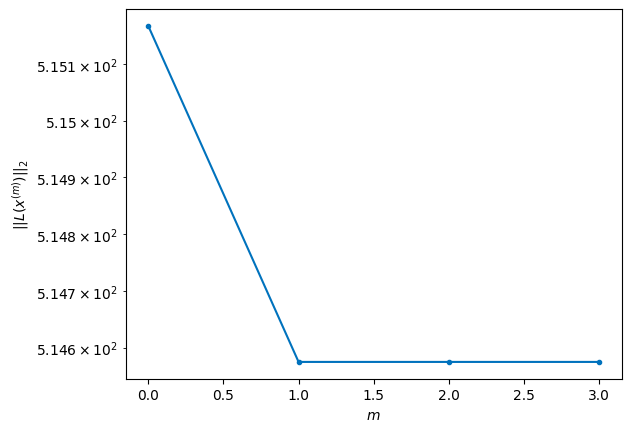

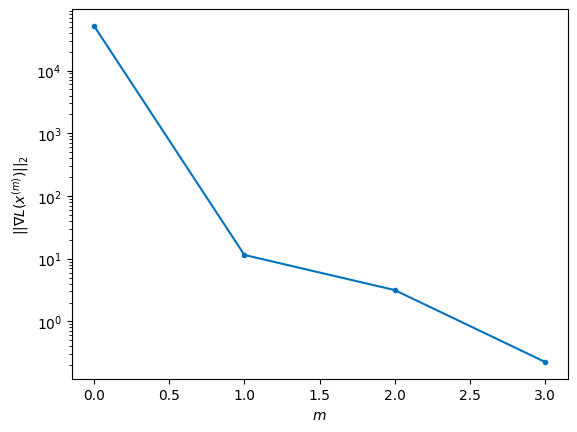


Windows:  67%|██████▋   | 198/296 [39:35<19:33, 11.98s/it]

Before applying the algorithm
Cost function: 513.3397210253509
Gradient norm: 258692.5892210332
Global relative error: 1890227792.0336592
Position relative errors: 0.03572674461070118 m, 10.68338936239411 m, 2336.5288410836956 m, 3493.474338594611 m

Iteration 1
Cost function: 512.2521495883894 (-0.21%)
Gradient norm: 27.736247076116367 (-99.99%)
Global relative error: 4203.538845242041 (0.02%)
Position relative errors: 0.03176116152321083 m, 11.015328352351196 m, 2336.6472212091767 m, 3494.2276679760053 m

Iteration 2
Cost function: 512.2521497170655 (0.00%)
Gradient norm: 1.718620061928454 (-93.80%)
Global relative error: 4203.538786144957 (-0.00%)
Position relative errors: 0.03176116363779634 m, 11.015377298002337 m, 2336.6472357115777 m, 3494.2275870303624 m

Iteration 3
Cost function: 512.2521499169536 (0.00%)
Gradient norm: 5.550745615133336 (222.98%)
Global relative error: 4203.538786157097 (0.00%)
Position relative errors: 0.031761162769745874 m, 11.01537729519183 m, 2336.64723

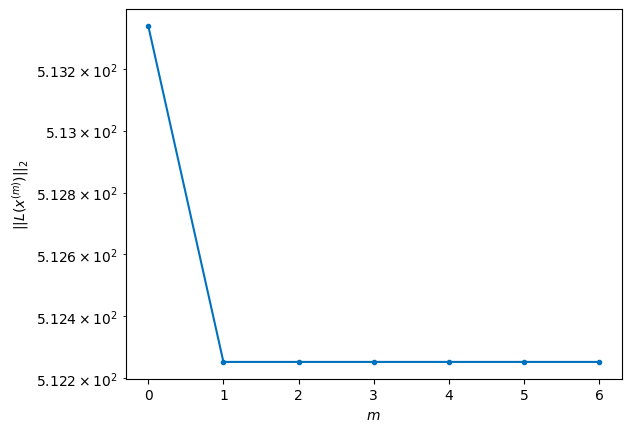

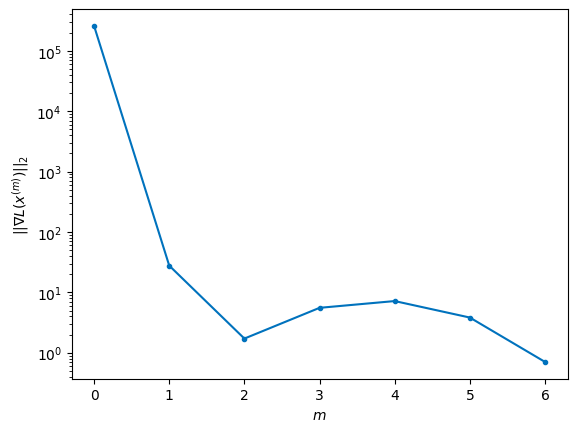


Windows:  67%|██████▋   | 199/296 [39:47<19:22, 11.99s/it]

Before applying the algorithm
Cost function: 510.9539723308285
Gradient norm: 119550.26599127508
Global relative error: 1890141405.5322392
Position relative errors: 0.03277680790484325 m, 10.613488811321716 m, 2609.972111863043 m, 3904.9490026176845 m

Iteration 1
Cost function: 510.4027815481687 (-0.11%)
Gradient norm: 13.435450750312263 (-99.99%)
Global relative error: 4697.413691516382 (0.01%)
Position relative errors: 0.03487829855581434 m, 10.727673637681873 m, 2610.03663926878 m, 3905.5376231497985 m

Iteration 2
Cost function: 510.4027807527914 (-0.00%)
Gradient norm: 4.925881894201457 (-63.34%)
Global relative error: 4697.413527043805 (-0.00%)
Position relative errors: 0.034878298886552916 m, 10.727659592662855 m, 2610.0366473557397 m, 3905.537419963415 m

STOP on Iteration 3
Cost function = 510.40278091661867 (0.00%)
Gradient norm = 0.5133321161935425 (-89.58%)
Global relative error = 4697.413527050728 (0.00%)
Final position relative errors: 0.03487829892391659 m, 10.727659615

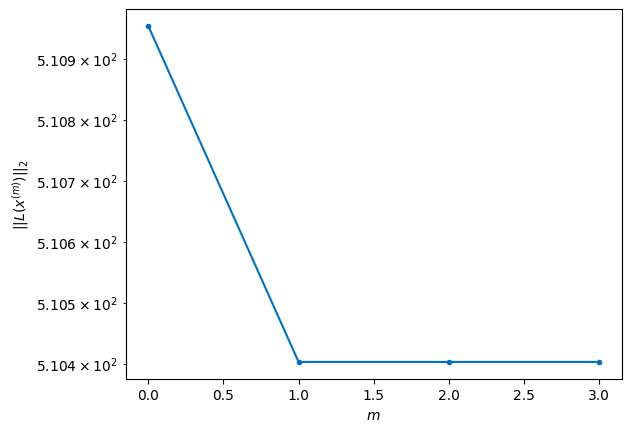

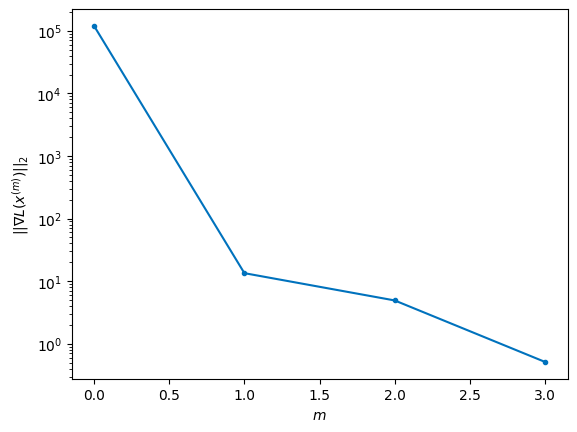


Windows:  68%|██████▊   | 200/296 [39:54<16:46, 10.49s/it]

Before applying the algorithm
Cost function: 507.91016821675896
Gradient norm: 88045.53873795074
Global relative error: 1890096425.80608
Position relative errors: 0.03583187453700192 m, 10.283733973147879 m, 2871.9653613799733 m, 4299.193823867711 m

Iteration 1
Cost function: 507.025682286426 (-0.17%)
Gradient norm: 23.47214749561798 (-99.97%)
Global relative error: 5169.960446773423 (-0.01%)
Position relative errors: 0.04191286800929144 m, 9.575599443802608 m, 2872.1485848289103 m, 4298.732671108475 m

STOP on Iteration 2
Cost function = 507.02568229256434 (0.00%)
Gradient norm = 0.38236183099931753 (-98.37%)
Global relative error = 5169.960369834124 (-0.00%)
Final position relative errors: 0.0419128705461013 m, 9.575504180016251 m, 2872.1485542859514 m, 4298.732599195069 m



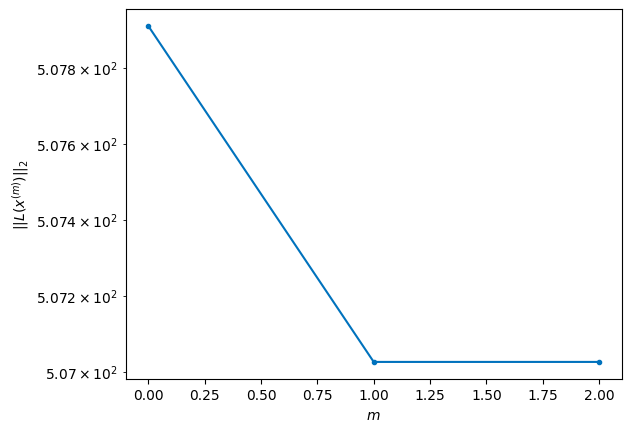

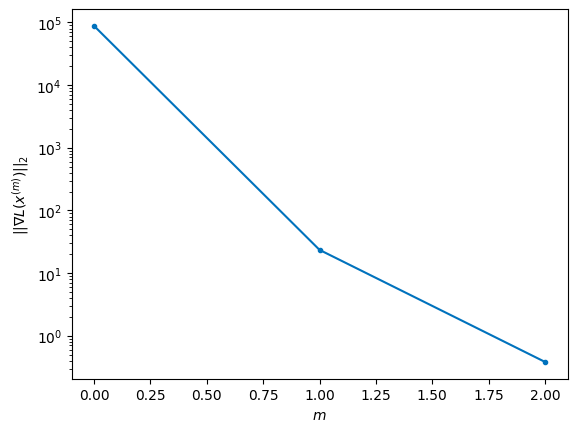


Windows:  68%|██████▊   | 201/296 [39:59<14:10,  8.95s/it]

Before applying the algorithm
Cost function: 504.4981049902022
Gradient norm: 122670.85418553803
Global relative error: 1890093394.646766
Position relative errors: 0.042452007177288247 m, 9.102433383921175 m, 3121.545081606081 m, 4673.603771787347 m

Iteration 1
Cost function: 503.74856342270397 (-0.15%)
Gradient norm: 7.044862791842088 (-99.99%)
Global relative error: 5620.223782849875 (0.00%)
Position relative errors: 0.04567242807007501 m, 9.17718129505762 m, 3121.8923740129108 m, 4673.38911112902 m

Iteration 2
Cost function: 503.7485630744593 (-0.00%)
Gradient norm: 2.9202260218939164 (-58.55%)
Global relative error: 5620.223809138485 (0.00%)
Position relative errors: 0.04567242726071902 m, 9.177300418094859 m, 3121.892362500104 m, 4673.389150200514 m

Iteration 3
Cost function: 503.74856349389074 (0.00%)
Gradient norm: 2.467159042035482 (-15.51%)
Global relative error: 5620.223809152933 (0.00%)
Position relative errors: 0.04567242707352032 m, 9.17730042693746 m, 3121.892362497326

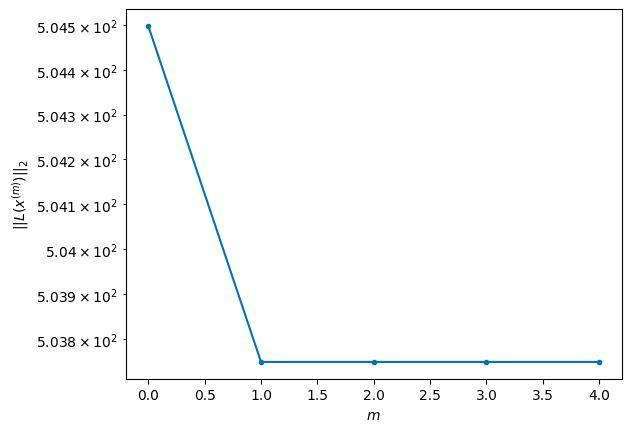

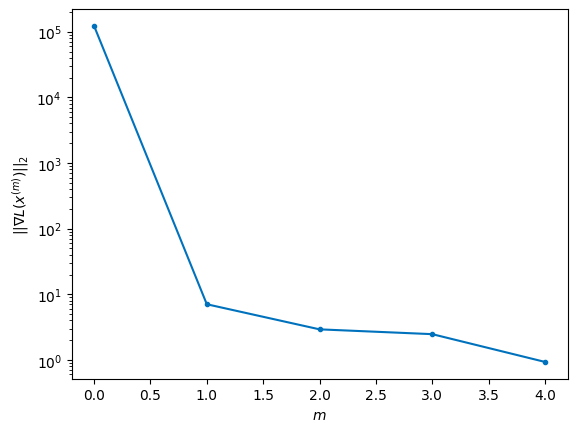


Windows:  68%|██████▊   | 202/296 [40:08<13:53,  8.87s/it]

Before applying the algorithm
Cost function: 501.476090481251
Gradient norm: 58001.92647412128
Global relative error: 1890132682.7975264
Position relative errors: 0.04618064545454678 m, 8.684236670340248 m, 3357.6802125914346 m, 5027.877247514411 m

Iteration 1
Cost function: 501.17718264315545 (-0.06%)
Gradient norm: 4.878313674901016 (-99.99%)
Global relative error: 6046.075470381447 (0.00%)
Position relative errors: 0.04373906136108206 m, 8.589437571333969 m, 3357.7727352903953 m, 5027.9488583028005 m

STOP on Iteration 2
Cost function = 501.1771826223425 (-0.00%)
Gradient norm = 0.4348977911973145 (-91.09%)
Global relative error = 6046.075477777536 (0.00%)
Final position relative errors: 0.043739061584311664 m, 8.589472119988235 m, 3357.7727401983334 m, 5027.948863859923 m



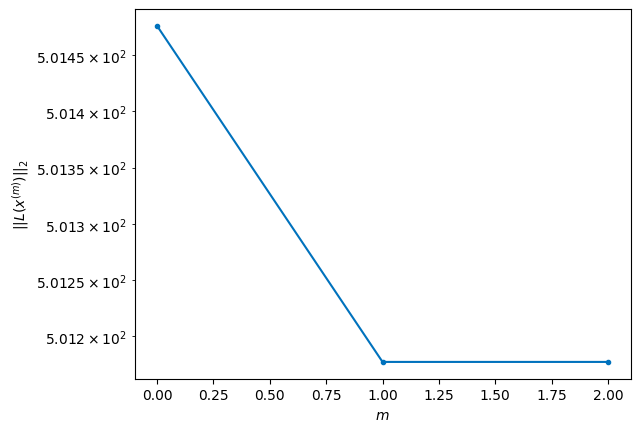

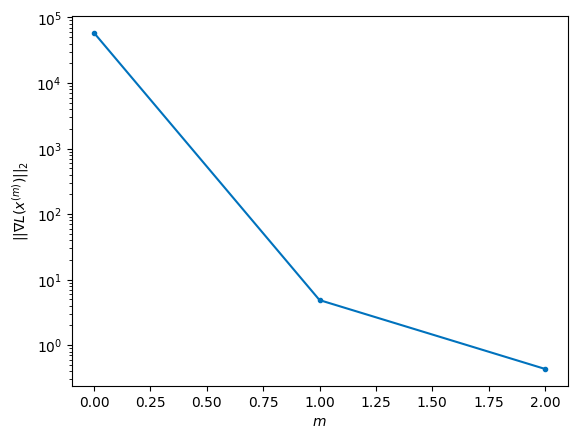


Windows:  69%|██████▊   | 203/296 [40:13<12:07,  7.82s/it]

Before applying the algorithm
Cost function: 505.43734548365137
Gradient norm: 60863.4963264375
Global relative error: 1890214480.6203086
Position relative errors: 0.04408700500177368 m, 8.072496153216122 m, 3578.9233952622417 m, 5360.519906829158 m

Iteration 1
Cost function: 504.70324537984123 (-0.15%)
Gradient norm: 11.146505144441928 (-99.98%)
Global relative error: 6445.419309006029 (-0.00%)
Position relative errors: 0.04315883974384414 m, 8.434161456592072 m, 3578.8112505952804 m, 5360.54359781645 m

STOP on Iteration 2
Cost function = 504.7032451078837 (-0.00%)
Gradient norm = 0.18608338175089792 (-98.33%)
Global relative error = 6445.419326566875 (0.00%)
Final position relative errors: 0.04315884092757881 m, 8.434262657801526 m, 3578.8112433601596 m, 5360.5436236024 m



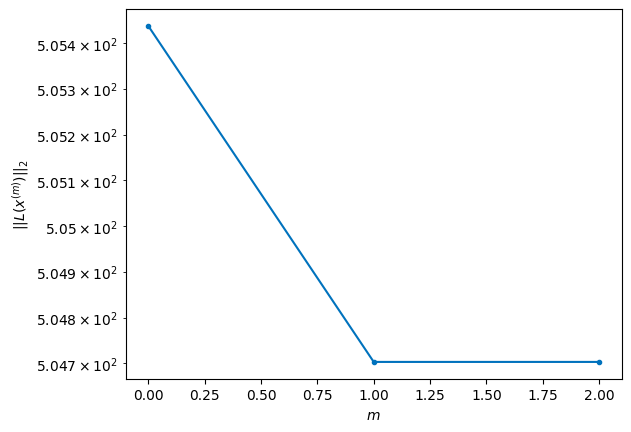

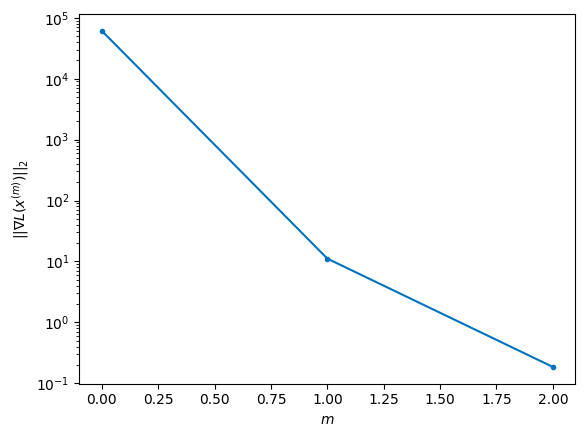


Windows:  69%|██████▉   | 204/296 [40:19<11:03,  7.21s/it]

Before applying the algorithm
Cost function: 507.5528842916922
Gradient norm: 89821.1911924575
Global relative error: 1890338779.0081944
Position relative errors: 0.04331410637745832 m, 7.8866032366340795 m, 3784.3635041948014 m, 5669.721803554395 m

Iteration 1
Cost function: 507.08032846145386 (-0.09%)
Gradient norm: 10.151928287956325 (-99.99%)
Global relative error: 6816.769512377526 (0.00%)
Position relative errors: 0.04761280588369596 m, 7.554241896800224 m, 3784.3377460263064 m, 5669.8361524397205 m

Iteration 2
Cost function: 507.08032815744394 (-0.00%)
Gradient norm: 4.719356332811496 (-53.51%)
Global relative error: 6816.769517457211 (0.00%)
Position relative errors: 0.04761281424493231 m, 7.554388144630924 m, 3784.3377442678584 m, 5669.83615952581 m

Iteration 3
Cost function: 507.08032848937484 (0.00%)
Gradient norm: 3.321515957077117 (-29.62%)
Global relative error: 6816.769517469004 (0.00%)
Position relative errors: 0.047612807338112816 m, 7.5543881268640085 m, 3784.33774

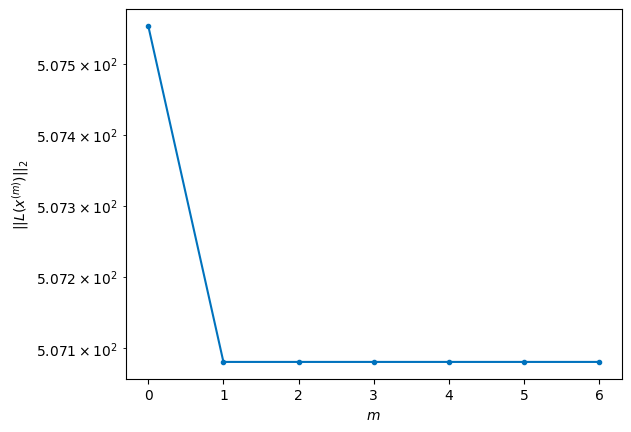

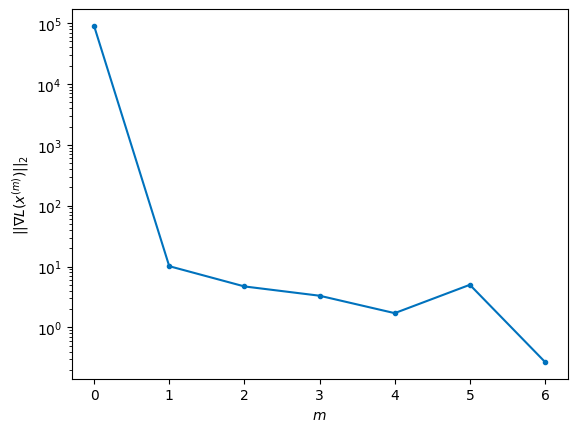


Windows:  69%|██████▉   | 205/296 [40:33<13:50,  9.13s/it]

Before applying the algorithm
Cost function: 506.34943238548146
Gradient norm: 334914.08548188227
Global relative error: 1890505376.5309727
Position relative errors: 0.047437089543614704 m, 6.960685198216384 m, 3973.40287602051 m, 5954.352695687817 m

Iteration 1
Cost function: 505.7661179655333 (-0.12%)
Gradient norm: 4.260548871214755 (-100.00%)
Global relative error: 7158.514853804321 (0.00%)
Position relative errors: 0.05068107524526085 m, 6.99797969755806 m, 3973.444212857512 m, 5954.493887689128 m

Iteration 2
Cost function: 505.76611849887325 (0.00%)
Gradient norm: 3.47724427436987 (-18.39%)
Global relative error: 7158.514856890853 (0.00%)
Position relative errors: 0.05068107588011018 m, 6.997983013934667 m, 3973.444225509733 m, 5954.4938829530165 m

Iteration 3
Cost function: 505.76611808728853 (-0.00%)
Gradient norm: 4.719345077355661 (35.72%)
Global relative error: 7158.51485689384 (0.00%)
Position relative errors: 0.05068107794335553 m, 6.997982994180983 m, 3973.444225516364

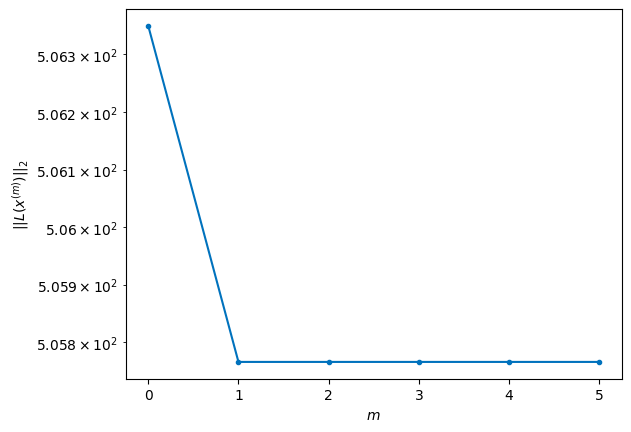

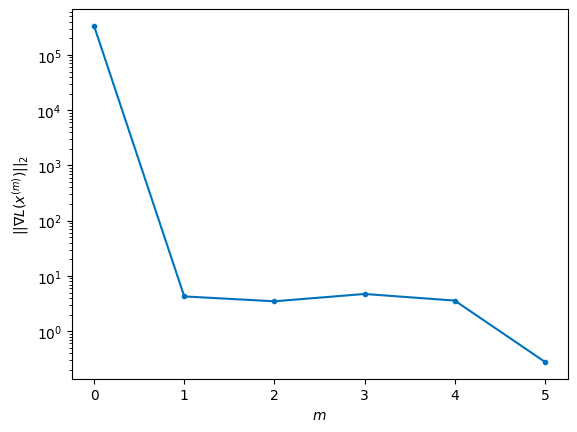


Windows:  70%|██████▉   | 206/296 [40:44<14:34,  9.72s/it]

Before applying the algorithm
Cost function: 505.6380809137539
Gradient norm: 45708.48063119127
Global relative error: 1890713872.8112383
Position relative errors: 0.049786798918338225 m, 6.37856035995785 m, 4145.213499695836 m, 6213.07911253655 m

Iteration 1
Cost function: 505.1589417036532 (-0.09%)
Gradient norm: 6.8931075988890305 (-99.98%)
Global relative error: 7469.104592813823 (0.00%)
Position relative errors: 0.0663002716260874 m, 6.3941219197282235 m, 4145.349541097244 m, 6213.174360279872 m

Iteration 2
Cost function: 505.1589417304218 (0.00%)
Gradient norm: 1.3511977418391035 (-80.40%)
Global relative error: 7469.104599486512 (0.00%)
Position relative errors: 0.06630026645043716 m, 6.3941374568586005 m, 4145.349540025652 m, 6213.17436900036 m

Iteration 3
Cost function: 505.1589416665864 (-0.00%)
Gradient norm: 1.1660790303351556 (-13.70%)
Global relative error: 7469.104599489292 (0.00%)
Position relative errors: 0.06630026440968527 m, 6.394137440631609 m, 4145.349540022498

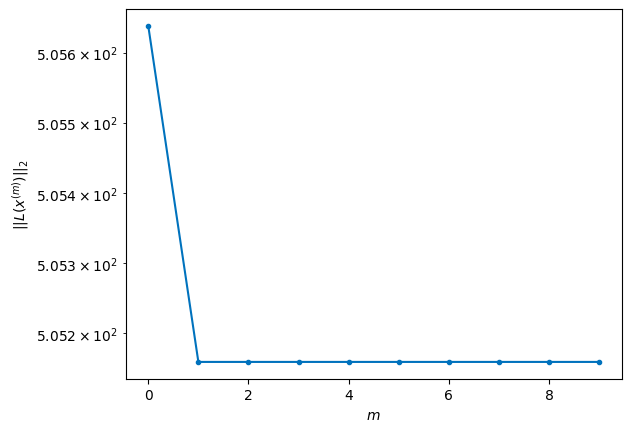

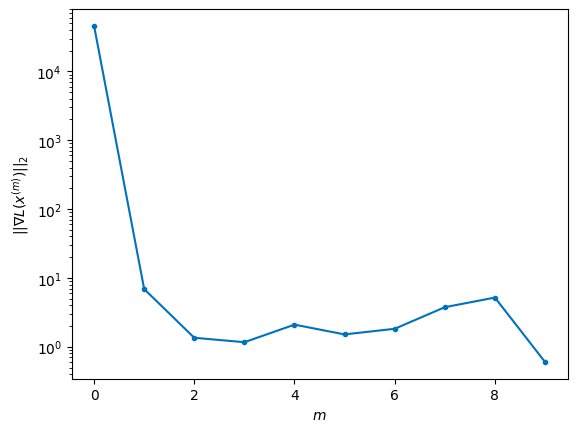


Windows:  70%|██████▉   | 207/296 [41:02<18:24, 12.41s/it]

Before applying the algorithm
Cost function: 516.548468956789
Gradient norm: 414811.1971706218
Global relative error: 1890963674.8513553
Position relative errors: 0.06474276791408681 m, 5.763468199088365 m, 4299.080733521373 m, 6444.764270269251 m

Iteration 1
Cost function: 514.9853263050213 (-0.30%)
Gradient norm: 26.811933490546817 (-99.99%)
Global relative error: 7746.343561022225 (-0.01%)
Position relative errors: 0.06224410544445126 m, 5.24206514320129 m, 4299.087257833387 m, 6443.8839893412105 m

Iteration 2
Cost function: 514.98532647524 (0.00%)
Gradient norm: 3.548609205793943 (-86.76%)
Global relative error: 7746.343309100519 (-0.00%)
Position relative errors: 0.06224410914239271 m, 5.242007486196165 m, 4299.087211985131 m, 6443.883717135196 m

Iteration 3
Cost function: 514.98532664579 (0.00%)
Gradient norm: 1.09803688525146 (-69.06%)
Global relative error: 7746.343309053317 (-0.00%)
Position relative errors: 0.06224411015254537 m, 5.242007435221906 m, 4299.0872119662135 m, 

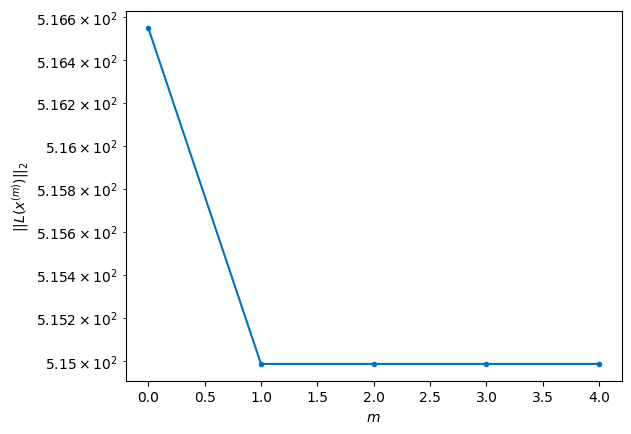

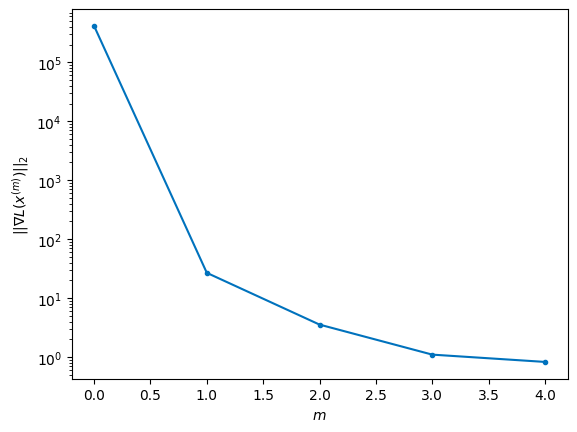


Windows:  70%|███████   | 208/296 [41:12<16:47, 11.45s/it]

Before applying the algorithm
Cost function: 518.5985950680966
Gradient norm: 222007.58007442576
Global relative error: 1891253965.3339944
Position relative errors: 0.06100304844865315 m, 4.582873078836346 m, 4434.122160962525 m, 6647.416372970679 m

Iteration 1
Cost function: 518.3963078532873 (-0.04%)
Gradient norm: 4.831613412111022 (-100.00%)
Global relative error: 7990.3233892307435 (-0.00%)
Position relative errors: 0.05406705824740297 m, 4.2754214572104745 m, 4434.179043438347 m, 6647.051336639886 m

Iteration 2
Cost function: 518.3963080808666 (0.00%)
Gradient norm: 1.912101054453001 (-60.43%)
Global relative error: 7990.323350395051 (-0.00%)
Position relative errors: 0.054067051835389304 m, 4.27540662856631 m, 4434.1790352757125 m, 6647.051295410807 m

Iteration 3
Cost function: 518.3963078515518 (-0.00%)
Gradient norm: 1.2267747006659178 (-35.84%)
Global relative error: 7990.323350444861 (0.00%)
Position relative errors: 0.05406705615449209 m, 4.275406640440512 m, 4434.179035

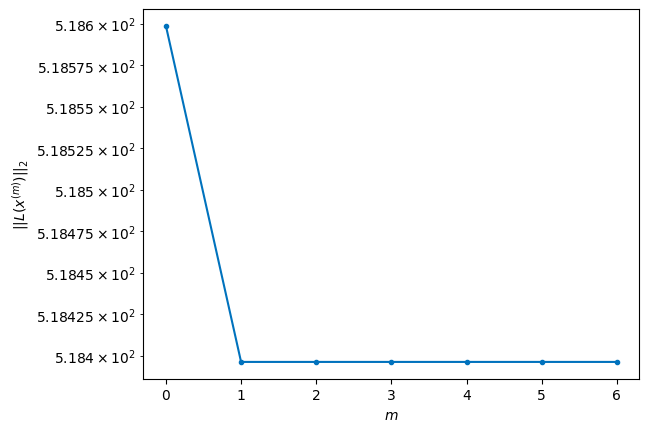

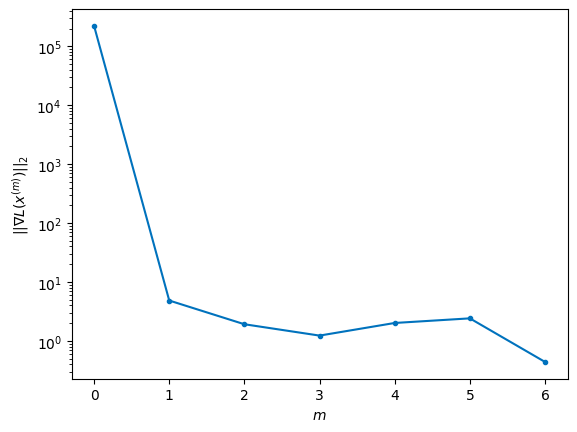


Windows:  71%|███████   | 209/296 [41:25<17:14, 11.89s/it]

Before applying the algorithm
Cost function: 523.5596378746382
Gradient norm: 220974.55572257534
Global relative error: 1891583742.5315597
Position relative errors: 0.05303505893003953 m, 3.5976095144447573 m, 4549.932867483416 m, 6821.706562980543 m

Iteration 1
Cost function: 522.8075866248381 (-0.14%)
Gradient norm: 6.68258059957171 (-100.00%)
Global relative error: 8199.678199077307 (-0.00%)
Position relative errors: 0.06286529871026865 m, 3.197568628344815 m, 4549.772115305866 m, 6821.603610231545 m

Iteration 2
Cost function: 522.807586708678 (0.00%)
Gradient norm: 4.010213278074347 (-39.99%)
Global relative error: 8199.678118361944 (-0.00%)
Position relative errors: 0.06286530254987267 m, 3.1975418438809413 m, 4549.772053804581 m, 6821.603554242137 m

STOP on Iteration 3
Cost function = 522.8075864026235 (-0.00%)
Gradient norm = 0.9978475115886869 (-75.12%)
Global relative error = 8199.678118328393 (-0.00%)
Final position relative errors: 0.06286529759436771 m, 3.197541832538904

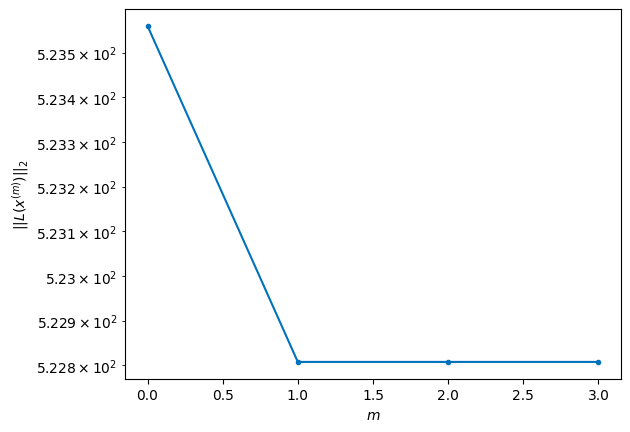

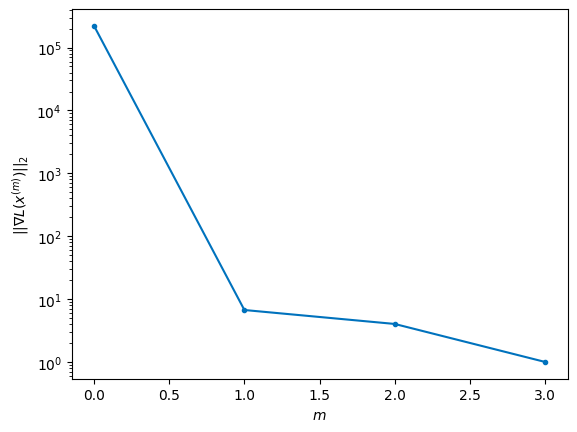


Windows:  71%|███████   | 210/296 [41:32<15:11, 10.60s/it]

Before applying the algorithm
Cost function: 524.2502020242915
Gradient norm: 140365.08606662642
Global relative error: 1891951779.5778117
Position relative errors: 0.06127580201520026 m, 2.507640414113494 m, 4645.750705784863 m, 6966.613819052013 m

Iteration 1
Cost function: 523.3660222254989 (-0.17%)
Gradient norm: 18.581199521496263 (-99.99%)
Global relative error: 8373.496592131869 (-0.00%)
Position relative errors: 0.06392903690279077 m, 2.512933652781162 m, 4645.634845425177 m, 6966.5995293035 m

Iteration 2
Cost function: 523.366021878284 (-0.00%)
Gradient norm: 6.1455011906368044 (-66.93%)
Global relative error: 8373.496671553396 (0.00%)
Position relative errors: 0.06392903520753122 m, 2.51305449024106 m, 4645.634821342201 m, 6966.599640780127 m

Iteration 3
Cost function: 523.3660217972613 (-0.00%)
Gradient norm: 6.7915064658223265 (10.51%)
Global relative error: 8373.496671559069 (0.00%)
Position relative errors: 0.06392904602813484 m, 2.5130545057325735 m, 4645.634821316872

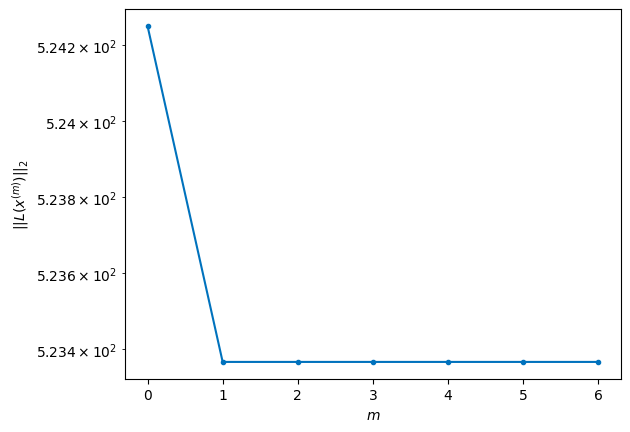

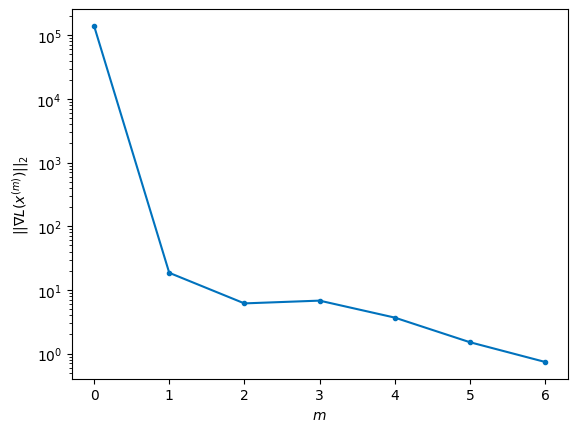


Windows:  71%|███████▏  | 211/296 [41:45<15:48, 11.16s/it]

Before applying the algorithm
Cost function: 522.8332824956419
Gradient norm: 80466.00304576103
Global relative error: 1892356638.979013
Position relative errors: 0.06230712072911005 m, 1.7900407260092877 m, 4721.430751668451 m, 7081.300461975414 m

Iteration 1
Cost function: 522.2767912154903 (-0.11%)
Gradient norm: 8.638575201287155 (-99.99%)
Global relative error: 8511.072230094394 (0.00%)
Position relative errors: 0.06767897082950709 m, 2.0107907323140237 m, 4721.403299556366 m, 7081.433004856814 m

Iteration 2
Cost function: 522.2767910145382 (-0.00%)
Gradient norm: 3.7548051400349074 (-56.53%)
Global relative error: 8511.07225350948 (0.00%)
Position relative errors: 0.06767896943345816 m, 2.010837369687788 m, 4721.403293099446 m, 7081.433037290849 m

Iteration 3
Cost function: 522.2767911890045 (0.00%)
Gradient norm: 4.111399606010081 (9.50%)
Global relative error: 8511.072253543174 (0.00%)
Position relative errors: 0.06767897995803783 m, 2.0108373895077674 m, 4721.403293104384 m

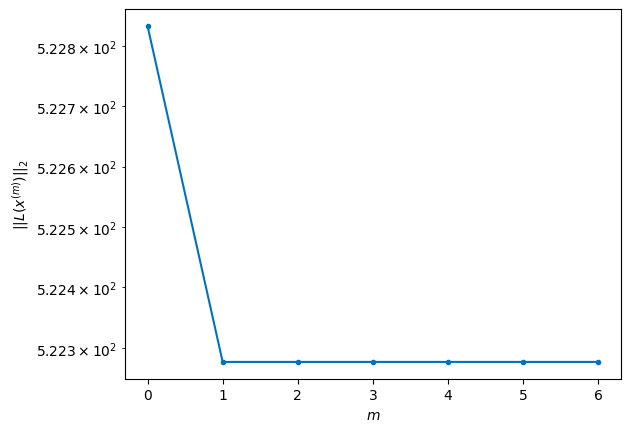

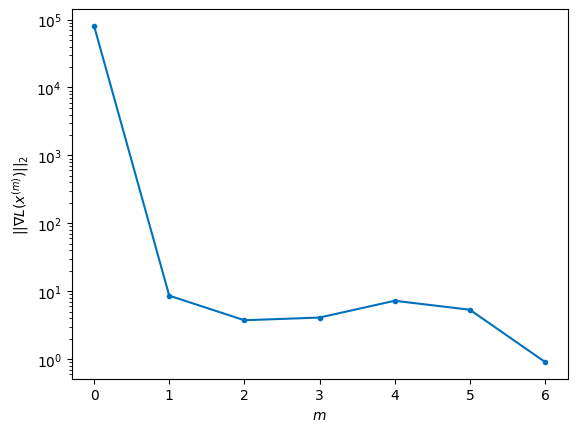


Windows:  72%|███████▏  | 212/296 [41:58<16:30, 11.80s/it]

Before applying the algorithm
Cost function: 532.2186383301296
Gradient norm: 134015.2126098499
Global relative error: 1892796698.3221486
Position relative errors: 0.06571964709977063 m, 1.2838773242266888 m, 4776.695340541674 m, 7165.371720889873 m

Iteration 1
Cost function: 531.153209701623 (-0.20%)
Gradient norm: 9.648322804658882 (-99.99%)
Global relative error: 8611.355309696437 (-0.00%)
Position relative errors: 0.07162120321647239 m, 1.1777556134711178 m, 4776.388114374594 m, 7165.302058997496 m

Iteration 2
Cost function: 531.1532094918583 (-0.00%)
Gradient norm: 2.8087572625093595 (-70.89%)
Global relative error: 8611.355270355838 (-0.00%)
Position relative errors: 0.07162121391156864 m, 1.1777841537350537 m, 4776.3880272032375 m, 7165.302069821168 m

Iteration 3
Cost function: 531.1532099293112 (0.00%)
Gradient norm: 1.0169090917065606 (-63.80%)
Global relative error: 8611.355270372727 (0.00%)
Position relative errors: 0.07162121906459495 m, 1.1777841664099398 m, 4776.388027

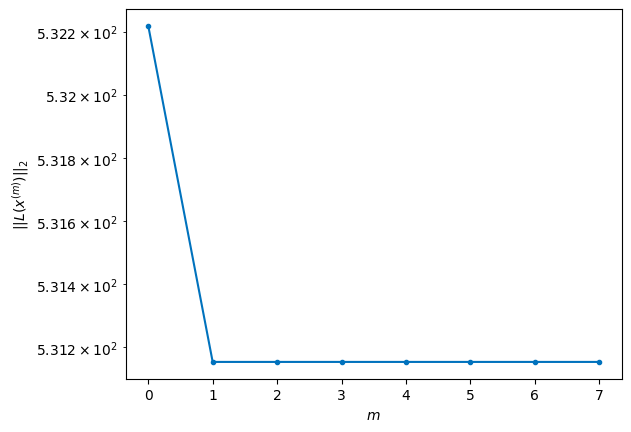

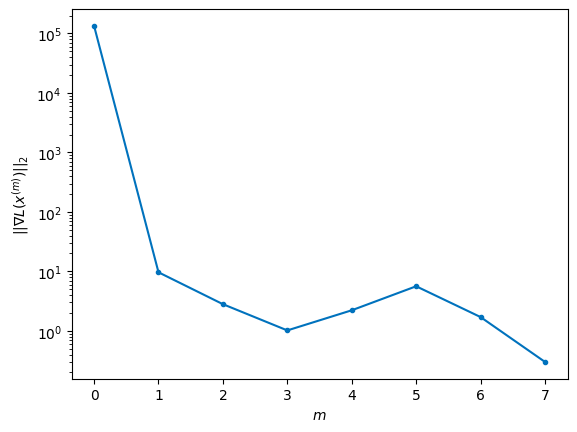


Windows:  72%|███████▏  | 213/296 [42:12<17:19, 12.52s/it]

Before applying the algorithm
Cost function: 530.1901500588723
Gradient norm: 110690.7604562892
Global relative error: 1893270139.5518382
Position relative errors: 0.06929402553301577 m, 0.5707723376132893 m, 4810.937649369565 m, 7218.123956928808 m

Iteration 1
Cost function: 529.5839389030992 (-0.11%)
Gradient norm: 7.035222178429649 (-99.99%)
Global relative error: 8674.352357137737 (-0.00%)
Position relative errors: 0.07175662738529219 m, 0.6667105369275133 m, 4810.792859148745 m, 7218.078683910968 m

Iteration 2
Cost function: 529.5839384865211 (-0.00%)
Gradient norm: 2.1823850325188867 (-68.98%)
Global relative error: 8674.352356139456 (-0.00%)
Position relative errors: 0.0717566208990521 m, 0.666712108514973 m, 4810.792831334156 m, 7218.07870124934 m

Iteration 3
Cost function: 529.5839386543654 (0.00%)
Gradient norm: 3.040547702742745 (39.32%)
Global relative error: 8674.352356159507 (0.00%)
Position relative errors: 0.07175662680642772 m, 0.666712108652458 m, 4810.792831318431

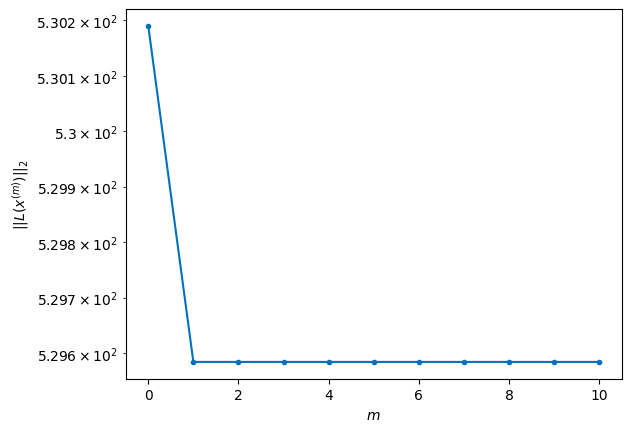

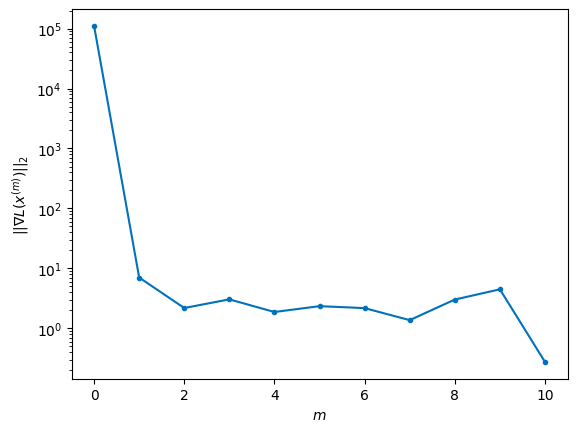


Windows:  72%|███████▏  | 214/296 [42:33<20:24, 14.94s/it]

Before applying the algorithm
Cost function: 538.0121394496008
Gradient norm: 67774.94172529272
Global relative error: 1893774927.538406
Position relative errors: 0.06934391244602793 m, 0.8364239748286774 m, 4824.460993996735 m, 7239.547735557377 m

Iteration 1
Cost function: 537.5626983948428 (-0.08%)
Gradient norm: 2.2597427511066326 (-100.00%)
Global relative error: 8699.889834056334 (0.00%)
Position relative errors: 0.06563259165086187 m, 0.8591808113820556 m, 4824.289812164515 m, 7239.7727987977405 m

STOP on Iteration 2
Cost function = 537.5626981724116 (-0.00%)
Gradient norm = 0.24079051803061663 (-89.34%)
Global relative error = 8699.889800286675 (-0.00%)
Final position relative errors: 0.06563259285976418 m, 0.8591793894470742 m, 4824.289790753067 m, 7239.772772485306 m



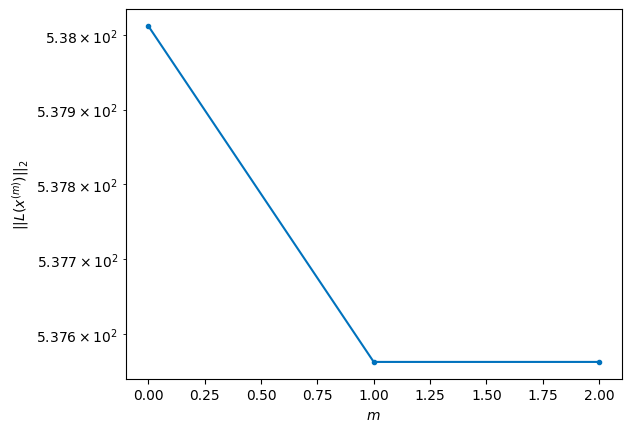

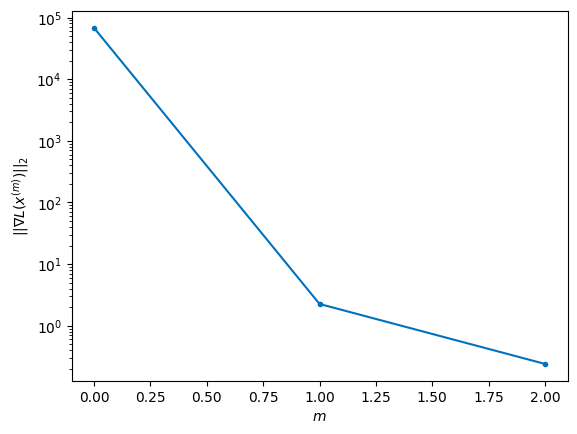


Windows:  73%|███████▎  | 215/296 [42:38<16:21, 12.12s/it]

Before applying the algorithm
Cost function: 533.8932193184935
Gradient norm: 253285.9511680962
Global relative error: 1894308874.1882768
Position relative errors: 0.06340069803214761 m, 1.5410667468798036 m, 4817.013620155812 m, 7229.826973417969 m

Iteration 1
Cost function: 533.2843466533234 (-0.11%)
Gradient norm: 12.021818593491046 (-100.00%)
Global relative error: 8687.418451972999 (-0.00%)
Position relative errors: 0.06177028209299599 m, 1.6516039931697641 m, 4816.946615551372 m, 7229.679222509195 m

Iteration 2
Cost function: 533.2843469849676 (0.00%)
Gradient norm: 2.8097546079675553 (-76.63%)
Global relative error: 8687.418492747385 (0.00%)
Position relative errors: 0.061770282321671185 m, 1.6514988589741446 m, 4816.946621712739 m, 7229.679267423893 m

STOP on Iteration 3
Cost function = 533.2843466737072 (-0.00%)
Gradient norm = 0.8299609959038203 (-70.46%)
Global relative error = 8687.418492716206 (-0.00%)
Final position relative errors: 0.06177027989520348 m, 1.65149889395

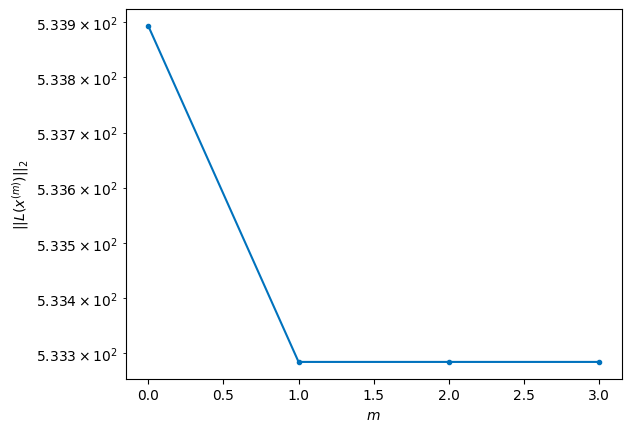

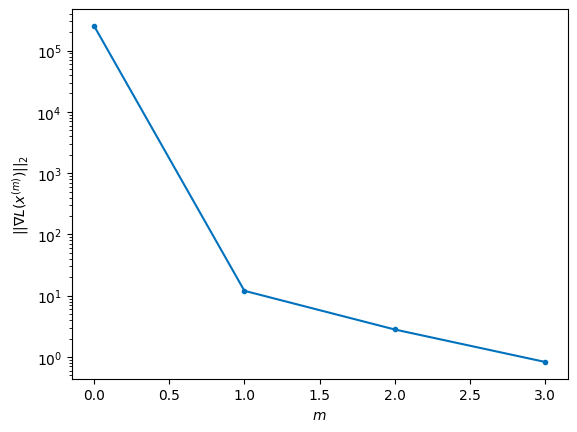


Windows:  73%|███████▎  | 216/296 [42:46<14:24, 10.80s/it]

Before applying the algorithm
Cost function: 541.5191139732368
Gradient norm: 150918.45582462905
Global relative error: 1894869588.5234594
Position relative errors: 0.059849308682493864 m, 2.4106974679762168 m, 4788.762811936447 m, 7188.352788756681 m

Iteration 1
Cost function: 539.8766920565114 (-0.30%)
Gradient norm: 36.3005563012592 (-99.98%)
Global relative error: 8637.402810125508 (0.00%)
Position relative errors: 0.05649994626159966 m, 2.4418483494495247 m, 4788.684193709732 m, 7188.408983483035 m

Iteration 2
Cost function: 539.8766916766746 (-0.00%)
Gradient norm: 1.9026292193630052 (-94.76%)
Global relative error: 8637.402922700328 (0.00%)
Position relative errors: 0.05649993625193643 m, 2.4416832375449227 m, 4788.684250721258 m, 7188.409080826843 m

Iteration 3
Cost function: 539.8766918665373 (0.00%)
Gradient norm: 9.113309804999314 (378.99%)
Global relative error: 8637.402922727799 (0.00%)
Position relative errors: 0.05649993864497244 m, 2.441683224238066 m, 4788.684250726

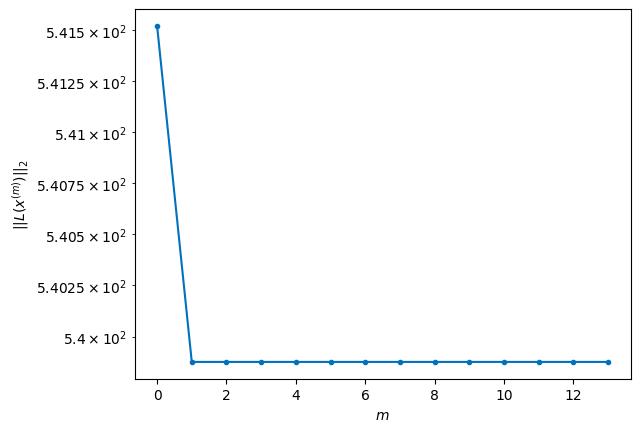

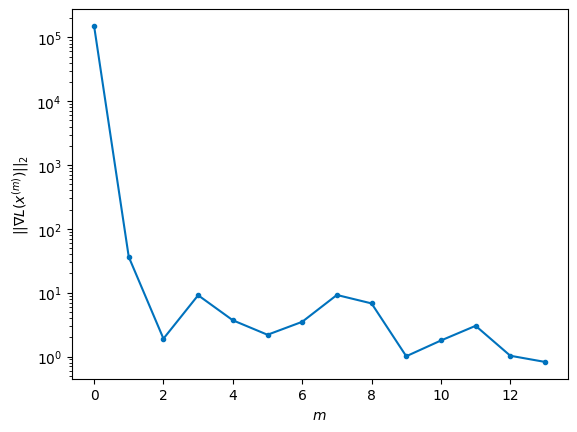


Windows:  73%|███████▎  | 217/296 [43:10<19:21, 14.70s/it]

Before applying the algorithm
Cost function: 540.8085665751561
Gradient norm: 54846.92856663009
Global relative error: 1895454542.112856
Position relative errors: 0.05463631016868286 m, 3.2797705669472683 m, 4739.704913703974 m, 7115.837358663174 m

Iteration 1
Cost function: 540.5288733835946 (-0.05%)
Gradient norm: 5.327570847406812 (-99.99%)
Global relative error: 8549.954683396158 (0.00%)
Position relative errors: 0.056296941888683956 m, 3.2980384949281305 m, 4739.679025820609 m, 7115.978766610406 m

Iteration 2
Cost function: 540.5288730778398 (-0.00%)
Gradient norm: 2.962230553749801 (-44.40%)
Global relative error: 8549.954688282569 (0.00%)
Position relative errors: 0.05629695342357555 m, 3.298036405039427 m, 4739.679031355219 m, 7115.978768796085 m

Iteration 3
Cost function: 540.5288732793416 (0.00%)
Gradient norm: 1.9130722537885396 (-35.42%)
Global relative error: 8549.954688293752 (0.00%)
Position relative errors: 0.05629695674205337 m, 3.298036382760029 m, 4739.67903136171

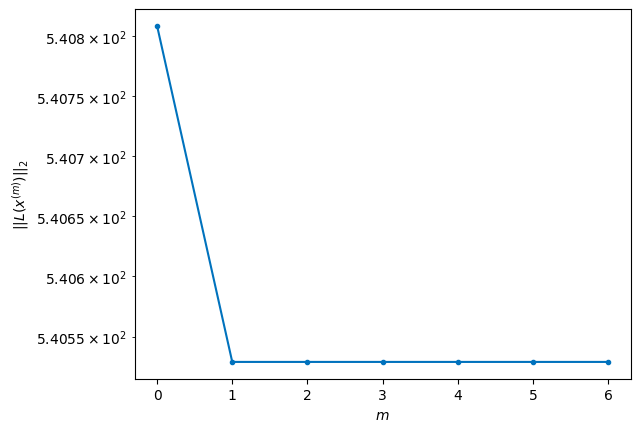

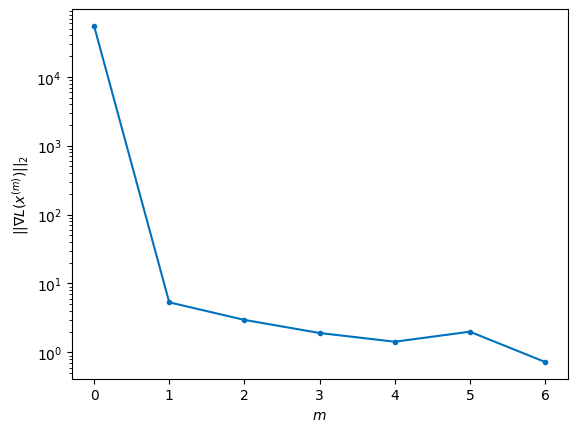


Windows:  74%|███████▎  | 218/296 [43:22<18:16, 14.06s/it]

Before applying the algorithm
Cost function: 543.9623725176882
Gradient norm: 232037.8617826636
Global relative error: 1896061037.443392
Position relative errors: 0.05454567430921549 m, 4.158747443336452 m, 4670.120275082855 m, 7012.514790963225 m

Iteration 1
Cost function: 543.4807075917607 (-0.09%)
Gradient norm: 16.229021593506218 (-99.99%)
Global relative error: 8425.28175543376 (-0.00%)
Position relative errors: 0.05364047316359898 m, 3.9907091366030327 m, 4670.076687744043 m, 7012.541249390441 m

Iteration 2
Cost function: 543.4807072062536 (-0.00%)
Gradient norm: 1.8731513259806856 (-88.46%)
Global relative error: 8425.281768690065 (0.00%)
Position relative errors: 0.05364046404930255 m, 3.990644981813276 m, 4670.076695755555 m, 7012.541260018517 m

Iteration 3
Cost function: 543.4807070251221 (-0.00%)
Gradient norm: 4.969264280554595 (165.29%)
Global relative error: 8425.28176867804 (-0.00%)
Position relative errors: 0.053640467553929504 m, 3.9906449749349386 m, 4670.076695756

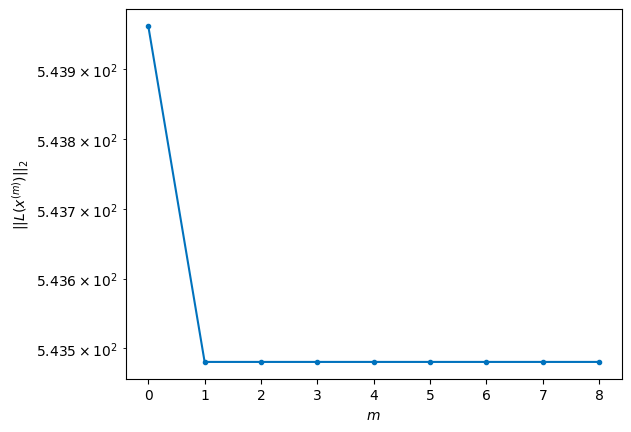

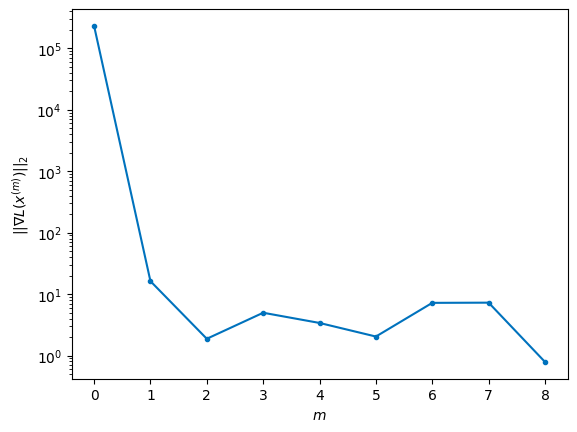


Windows:  74%|███████▍  | 219/296 [43:38<18:37, 14.51s/it]

Before applying the algorithm
Cost function: 547.1654336692133
Gradient norm: 71778.06123780497
Global relative error: 1896686251.1505847
Position relative errors: 0.05165184930362734 m, 4.87668770154468 m, 4580.23678345693 m, 6878.644369505514 m

Iteration 1
Cost function: 546.8305310943946 (-0.06%)
Gradient norm: 5.094224227502015 (-99.99%)
Global relative error: 8264.132972050009 (0.00%)
Position relative errors: 0.05374155715489375 m, 4.799235461253636 m, 4580.205632051674 m, 6878.77737531049 m

Iteration 2
Cost function: 546.8305313154013 (0.00%)
Gradient norm: 2.905756746021358 (-42.96%)
Global relative error: 8264.13297397783 (0.00%)
Position relative errors: 0.053741552443023276 m, 4.799239727269129 m, 4580.2056396371545 m, 6878.777372572837 m

Iteration 3
Cost function: 546.8305310594681 (-0.00%)
Gradient norm: 1.0650468900251155 (-63.35%)
Global relative error: 8264.132973940612 (-0.00%)
Position relative errors: 0.05374155223901001 m, 4.799239758633919 m, 4580.205639629398 m

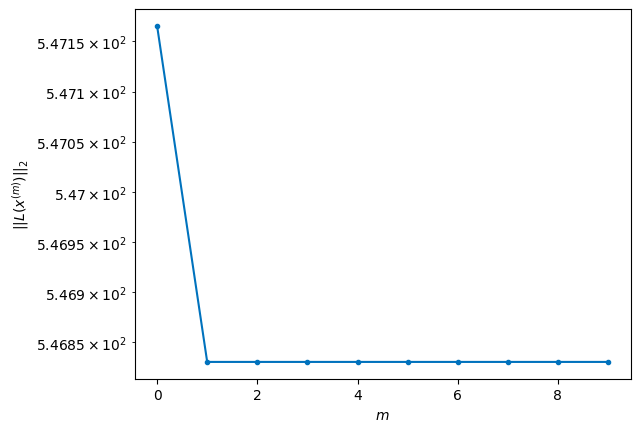

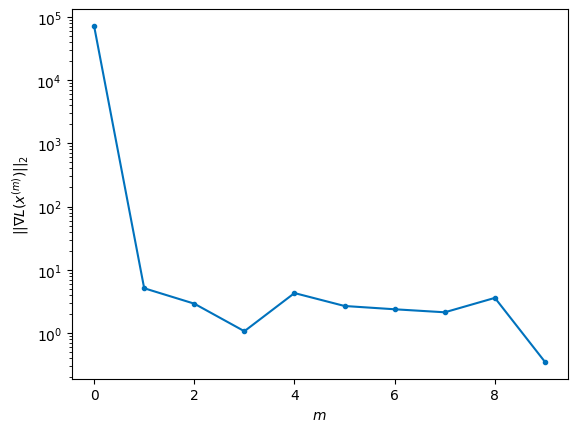


Windows:  74%|███████▍  | 220/296 [43:55<19:27, 15.37s/it]

Before applying the algorithm
Cost function: 542.0122050114355
Gradient norm: 94007.74683031368
Global relative error: 1897327233.6486833
Position relative errors: 0.05170493596862619 m, 5.693169062802756 m, 4470.47140104582 m, 6715.013391052224 m

Iteration 1
Cost function: 540.6016249317668 (-0.26%)
Gradient norm: 11.68834036553321 (-99.99%)
Global relative error: 8066.793447767112 (-0.00%)
Position relative errors: 0.04487205203602216 m, 6.031231618932056 m, 4470.709703986671 m, 6714.600664022829 m

Iteration 2
Cost function: 540.6016249815249 (0.00%)
Gradient norm: 6.356207506426755 (-45.62%)
Global relative error: 8066.793432249933 (-0.00%)
Position relative errors: 0.04487204665386851 m, 6.031212954402681 m, 4470.709665647976 m, 6714.600670924127 m

Iteration 3
Cost function: 540.6016247525178 (-0.00%)
Gradient norm: 5.731742007679745 (-9.82%)
Global relative error: 8066.793432274248 (0.00%)
Position relative errors: 0.04487204584442752 m, 6.031212951410299 m, 4470.709665628595 m

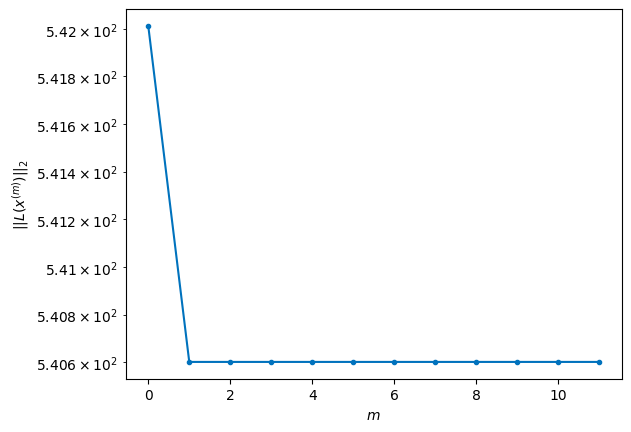

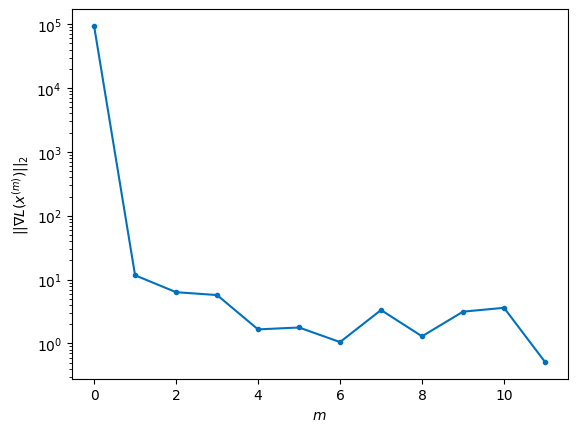


Windows:  75%|███████▍  | 221/296 [44:16<21:02, 16.83s/it]

Before applying the algorithm
Cost function: 538.8061401077614
Gradient norm: 23833.361171583034
Global relative error: 1897980941.459117
Position relative errors: 0.04322853353228103 m, 6.892744706696701 m, 4341.533037607821 m, 6521.709066100007 m

Iteration 1
Cost function: 538.2693361500511 (-0.10%)
Gradient norm: 11.287226077954866 (-99.95%)
Global relative error: 7835.075373151051 (0.01%)
Position relative errors: 0.03339516451145566 m, 6.970917378066878 m, 4341.749901828302 m, 6522.081571515501 m

Iteration 2
Cost function: 538.2693363368154 (0.00%)
Gradient norm: 1.2542039205240902 (-88.89%)
Global relative error: 7835.075306460376 (-0.00%)
Position relative errors: 0.03339516000861428 m, 6.970894741105744 m, 4341.749876440606 m, 6522.081508323815 m

Iteration 3
Cost function: 538.2693363571796 (0.00%)
Gradient norm: 2.9699981452368704 (136.80%)
Global relative error: 7835.0753064397595 (-0.00%)
Position relative errors: 0.033395159112555535 m, 6.970894780093377 m, 4341.74987643

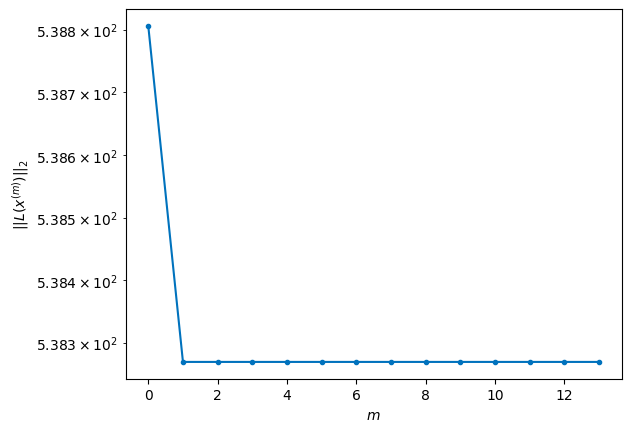

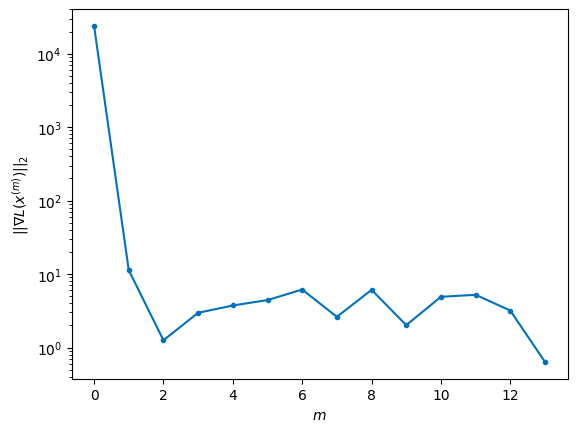


Windows:  75%|███████▌  | 222/296 [44:41<23:46, 19.27s/it]

Before applying the algorithm
Cost function: 539.605626970904
Gradient norm: 164354.95184612536
Global relative error: 1898644214.1736658
Position relative errors: 0.03229315594930127 m, 7.81182212017608 m, 4193.694655161162 m, 6300.8681205344765 m

Iteration 1
Cost function: 539.2822022625969 (-0.06%)
Gradient norm: 11.115170072259996 (-99.99%)
Global relative error: 7569.196883860154 (0.00%)
Position relative errors: 0.03699095431025795 m, 7.459322479965725 m, 4193.662546442577 m, 6301.258449450884 m

Iteration 2
Cost function: 539.2822020431109 (-0.00%)
Gradient norm: 3.1195710871640974 (-71.93%)
Global relative error: 7569.196869113873 (-0.00%)
Position relative errors: 0.036990949571880906 m, 7.4593254954516235 m, 4193.662534733928 m, 6301.2584395262265 m

Iteration 3
Cost function: 539.2822022160873 (0.00%)
Gradient norm: 1.3245074394692646 (-57.54%)
Global relative error: 7569.196869137503 (0.00%)
Position relative errors: 0.036990943357761506 m, 7.4593254881296644 m, 4193.66253

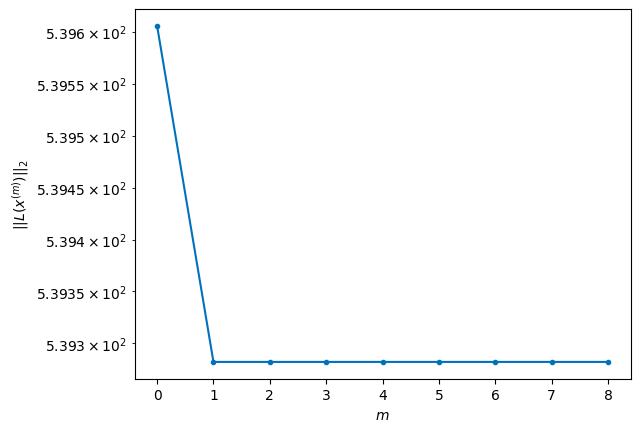

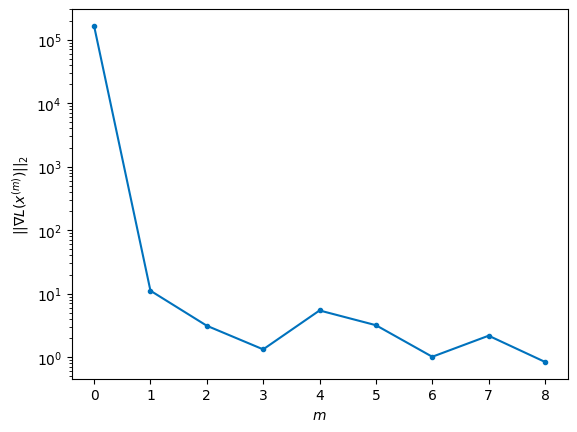


Windows:  75%|███████▌  | 223/296 [44:57<22:19, 18.34s/it]

Before applying the algorithm
Cost function: 537.0134778133412
Gradient norm: 90513.46737749195
Global relative error: 1899313852.8323863
Position relative errors: 0.03577104976482173 m, 8.287146822510936 m, 4027.3827621414803 m, 6052.663006160606 m

Iteration 1
Cost function: 536.0870452883331 (-0.17%)
Gradient norm: 14.447984390839876 (-99.98%)
Global relative error: 7270.666056629349 (0.01%)
Position relative errors: 0.0389364791899187 m, 8.164753233820562 m, 4027.7210823758614 m, 6053.094542801276 m

Iteration 2
Cost function: 536.0870451023569 (-0.00%)
Gradient norm: 5.338930671962888 (-63.05%)
Global relative error: 7270.665917254725 (-0.00%)
Position relative errors: 0.03893647330093658 m, 8.164817697134518 m, 4027.721003290546 m, 6053.09442792795 m

Iteration 3
Cost function: 536.0870453976486 (0.00%)
Gradient norm: 3.1620545096101194 (-40.77%)
Global relative error: 7270.665917282462 (0.00%)
Position relative errors: 0.03893648636284351 m, 8.164817667550853 m, 4027.72100328420

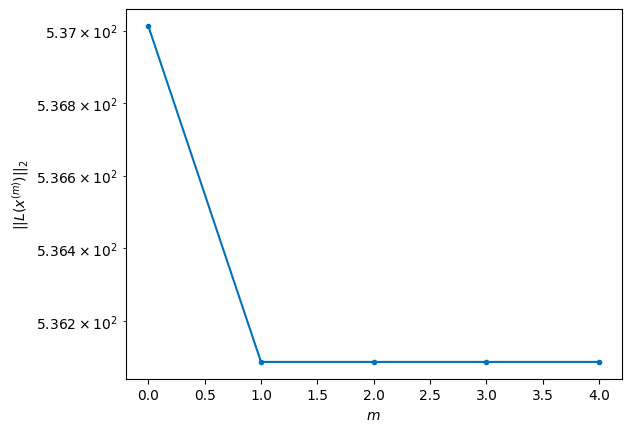

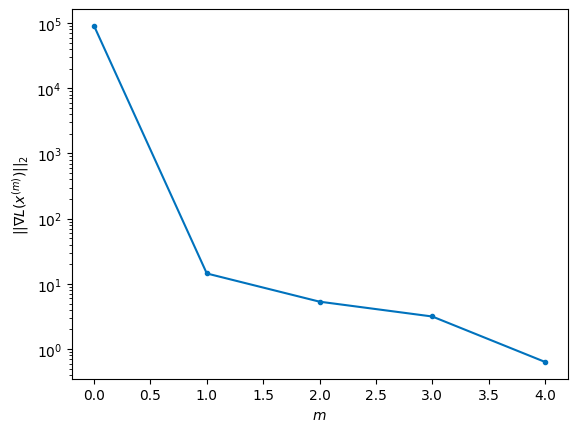


Windows:  76%|███████▌  | 224/296 [45:05<18:32, 15.44s/it]

Before applying the algorithm
Cost function: 534.7821186596357
Gradient norm: 27955.502078808382
Global relative error: 1899986612.5055416
Position relative errors: 0.03755695426611086 m, 8.939960863860861 m, 3843.901114028334 m, 5778.229946095523 m

Iteration 1
Cost function: 534.1054639624019 (-0.13%)
Gradient norm: 10.486470680183743 (-99.96%)
Global relative error: 6939.9372717958895 (-0.00%)
Position relative errors: 0.0346184793074189 m, 9.23952257130071 m, 3844.2988829215865 m, 5777.886881246313 m

Iteration 2
Cost function: 534.1054633825246 (-0.00%)
Gradient norm: 4.050115036847574 (-61.38%)
Global relative error: 6939.937296187092 (0.00%)
Position relative errors: 0.03461847248463518 m, 9.239419638065229 m, 3844.2987727977807 m, 5777.8869839781555 m

STOP on Iteration 3
Cost function = 534.1054637109606 (0.00%)
Gradient norm = 0.3379103760467234 (-91.66%)
Global relative error = 6939.937296192659 (0.00%)
Final position relative errors: 0.03461848888290419 m, 9.23941961135648 

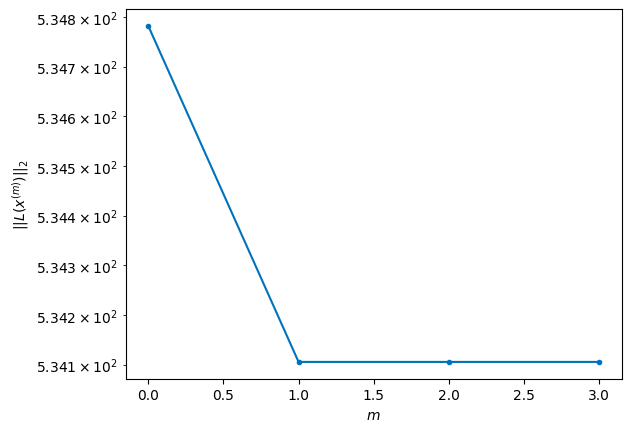

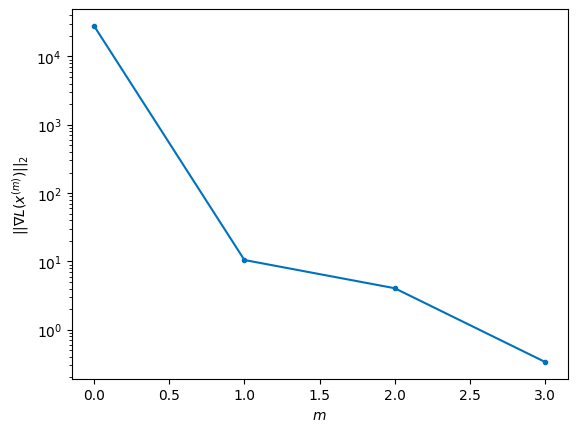


Windows:  76%|███████▌  | 225/296 [45:12<15:13, 12.87s/it]

Before applying the algorithm
Cost function: 535.3612019288419
Gradient norm: 420564.0224896864
Global relative error: 1900659200.2534611
Position relative errors: 0.03340380620284043 m, 9.956371013941157 m, 3643.7240760400305 m, 5477.955298021174 m

Iteration 1
Cost function: 533.0154251294991 (-0.44%)
Gradient norm: 31.852450243277918 (-99.99%)
Global relative error: 6578.701206870408 (-0.01%)
Position relative errors: 0.02278587957913806 m, 9.83336414870927 m, 3644.0487183372616 m, 5477.233122206577 m

Iteration 2
Cost function: 533.0154250688502 (-0.00%)
Gradient norm: 5.726083864350549 (-82.02%)
Global relative error: 6578.701136403383 (-0.00%)
Position relative errors: 0.02278588295443428 m, 9.833328922319303 m, 3644.0486426119874 m, 5477.233088012623 m

Iteration 3
Cost function: 533.015425078598 (0.00%)
Gradient norm: 2.8077056589360314 (-50.97%)
Global relative error: 6578.701136388426 (-0.00%)
Position relative errors: 0.022785882162519564 m, 9.83332891172814 m, 3644.04864261

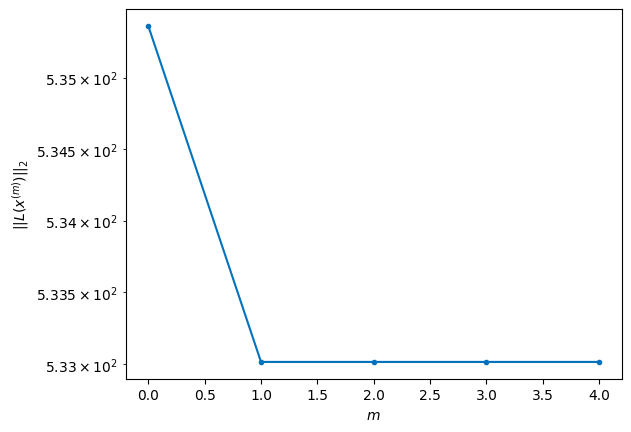

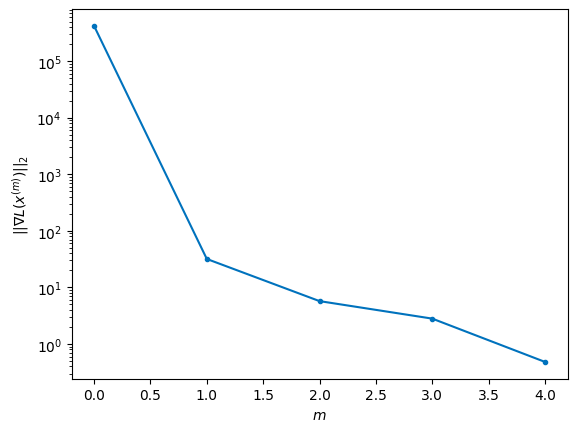


Windows:  76%|███████▋  | 226/296 [45:21<13:31, 11.59s/it]

Before applying the algorithm
Cost function: 528.2830789669463
Gradient norm: 24533.44921389034
Global relative error: 1901328322.5357852
Position relative errors: 0.022517988789270204 m, 10.494312686743555 m, 3427.58631760841 m, 5153.561761184663 m

Iteration 1
Cost function: 527.8520660268892 (-0.08%)
Gradient norm: 12.623607315360097 (-99.95%)
Global relative error: 6189.171032470225 (-0.00%)
Position relative errors: 0.019067822389716153 m, 10.997427420745861 m, 3427.8837216599727 m, 5153.182043634029 m

Iteration 2
Cost function: 527.8520658777079 (-0.00%)
Gradient norm: 6.528289632308592 (-48.29%)
Global relative error: 6189.171042520439 (0.00%)
Position relative errors: 0.019067823084033854 m, 10.997324647453244 m, 3427.883654357348 m, 5153.182100693547 m

Iteration 3
Cost function: 527.8520656083073 (-0.00%)
Gradient norm: 1.4257779338151364 (-78.16%)
Global relative error: 6189.171042524308 (0.00%)
Position relative errors: 0.019067823346586004 m, 10.99732464724435 m, 3427.883

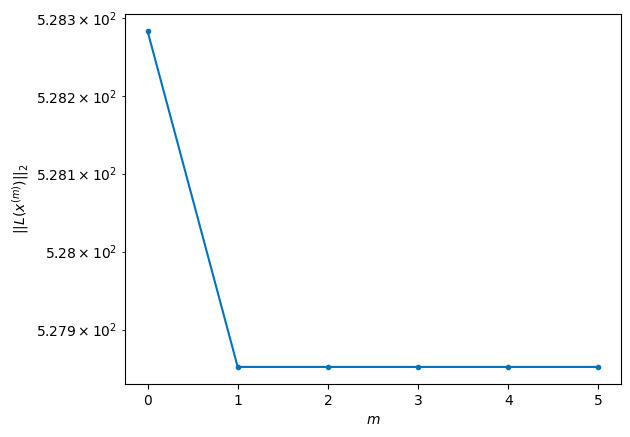

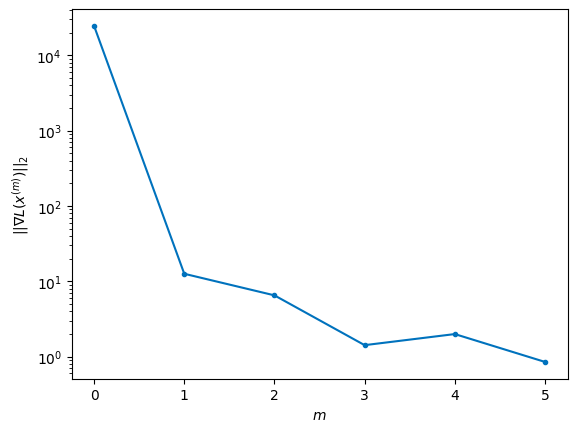


Windows:  77%|███████▋  | 227/296 [45:31<12:52, 11.20s/it]

Before applying the algorithm
Cost function: 524.4636486946987
Gradient norm: 168549.65575262872
Global relative error: 1901990687.9177063
Position relative errors: 0.01881928906461463 m, 11.588829150020763 m, 3196.4803504436322 m, 4807.1366684041195 m

Iteration 1
Cost function: 523.6534787034022 (-0.15%)
Gradient norm: 11.983100789126748 (-99.99%)
Global relative error: 5772.99357719209 (0.00%)
Position relative errors: 0.02099402133773904 m, 11.451769853718913 m, 3196.864329634015 m, 4807.008529324812 m

Iteration 2
Cost function: 523.6534783018529 (-0.00%)
Gradient norm: 8.660413319864475 (-27.73%)
Global relative error: 5772.993487697379 (-0.00%)
Position relative errors: 0.020994018474155222 m, 11.451856392645729 m, 3196.8642428227486 m, 4807.008479372873 m

Iteration 3
Cost function: 523.6534785080972 (0.00%)
Gradient norm: 8.025846511778372 (-7.33%)
Global relative error: 5772.9934876959005 (-0.00%)
Position relative errors: 0.0209940210018496 m, 11.451856409644384 m, 3196.8642

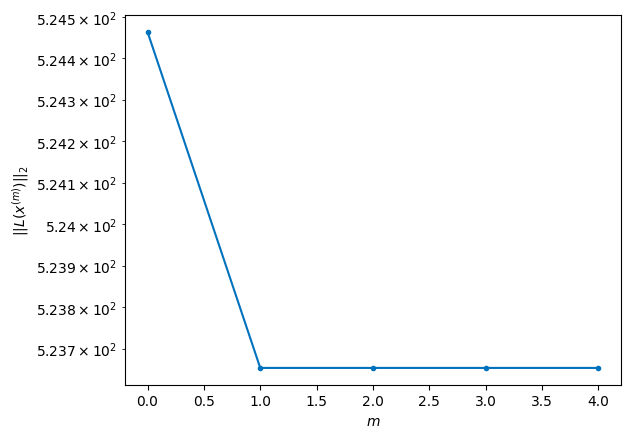

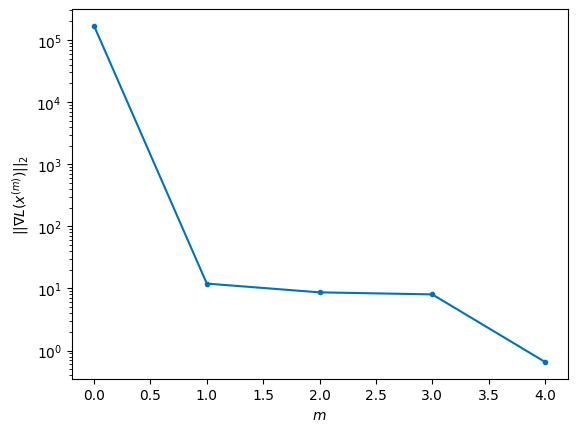


Windows:  77%|███████▋  | 228/296 [45:40<11:52, 10.48s/it]

Before applying the algorithm
Cost function: 516.3135539023626
Gradient norm: 71566.13788629846
Global relative error: 1902643052.9162064
Position relative errors: 0.020617209658884802 m, 11.965333974289756 m, 2951.5133827911586 m, 4440.099112120606 m

Iteration 1
Cost function: 514.4701762667961 (-0.36%)
Gradient norm: 27.442582906045896 (-99.96%)
Global relative error: 5330.999365471225 (-0.01%)
Position relative errors: 0.036277129804803965 m, 12.296685800106784 m, 2951.980015915883 m, 4439.049440389832 m

STOP on Iteration 2
Cost function = 514.4701764526385 (0.00%)
Gradient norm = 0.6952457767898914 (-97.47%)
Global relative error = 5330.999274746922 (-0.00%)
Final position relative errors: 0.03627712193149618 m, 12.29659750607572 m, 2951.979898346254 m, 4439.049409864824 m



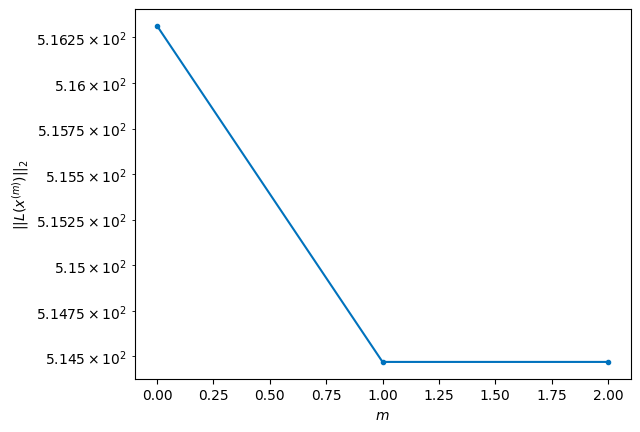

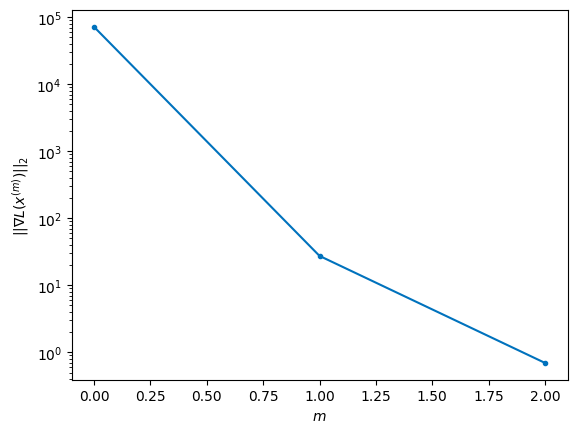


Windows:  77%|███████▋  | 229/296 [45:46<10:05,  9.04s/it]

Before applying the algorithm
Cost function: 514.6955947678882
Gradient norm: 92193.63098265005
Global relative error: 1903282217.1428864
Position relative errors: 0.03551752437893709 m, 12.735121111062934 m, 2693.739628796268 m, 4052.8752873561016 m

Iteration 1
Cost function: 513.8887985353325 (-0.16%)
Gradient norm: 4.214203371675184 (-100.00%)
Global relative error: 4866.288830073682 (-0.00%)
Position relative errors: 0.03610226512703835 m, 12.838105345167836 m, 2693.8554729696802 m, 4052.6142235440325 m

Iteration 2
Cost function: 513.8887987676657 (0.00%)
Gradient norm: 1.4921593942254476 (-64.59%)
Global relative error: 4866.2888159543245 (-0.00%)
Position relative errors: 0.03610226534828051 m, 12.838078419604667 m, 2693.8554356295676 m, 4052.6142314958684 m

STOP on Iteration 3
Cost function = 513.8887987831001 (0.00%)
Gradient norm = 0.26734372522011285 (-82.08%)
Global relative error = 4866.288815956161 (0.00%)
Final position relative errors: 0.036102260923374124 m, 12.83807

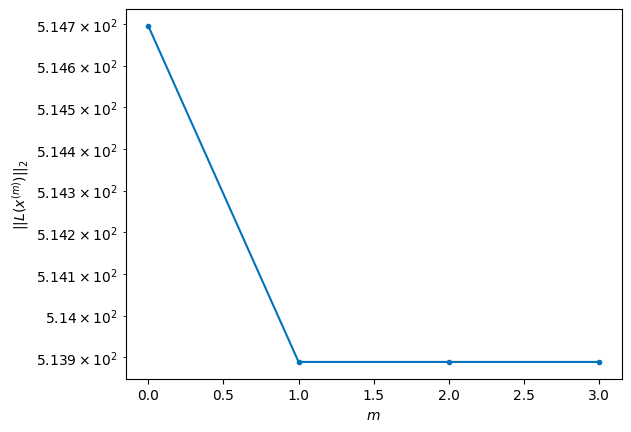

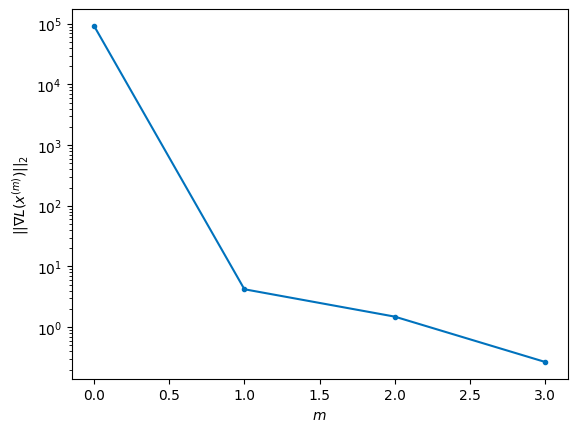


Windows:  78%|███████▊  | 230/296 [45:53<09:16,  8.44s/it]

Before applying the algorithm
Cost function: 512.7447631390955
Gradient norm: 72766.73288253791
Global relative error: 1903905043.7675946
Position relative errors: 0.03527920429248634 m, 13.208124656085126 m, 2423.8872411069547 m, 3648.8004485246215 m

Iteration 1
Cost function: 512.3841931986397 (-0.07%)
Gradient norm: 6.670245686920814 (-99.99%)
Global relative error: 4380.86808567938 (0.01%)
Position relative errors: 0.03916911220436137 m, 13.308317283793311 m, 2423.948077288131 m, 3649.141754950036 m

Iteration 2
Cost function: 512.3841929172277 (-0.00%)
Gradient norm: 2.2674097856469566 (-66.01%)
Global relative error: 4380.868083283458 (-0.00%)
Position relative errors: 0.0391691166429352 m, 13.308278387025547 m, 2423.948070733963 m, 3649.1417565691454 m

Iteration 3
Cost function: 512.3841929081564 (-0.00%)
Gradient norm: 1.5104293116948768 (-33.39%)
Global relative error: 4380.86808331471 (0.00%)
Position relative errors: 0.03916911933631033 m, 13.308278335962248 m, 2423.948070

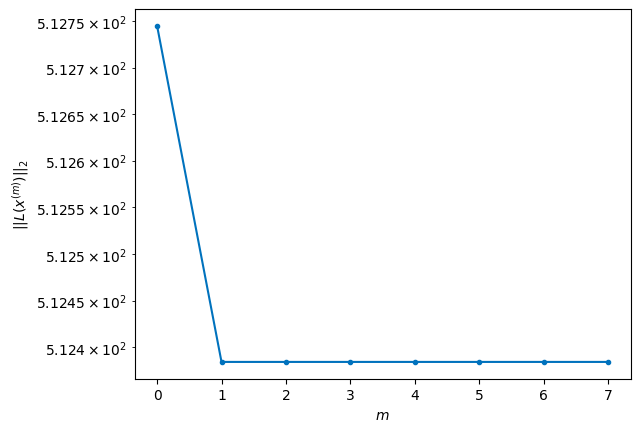

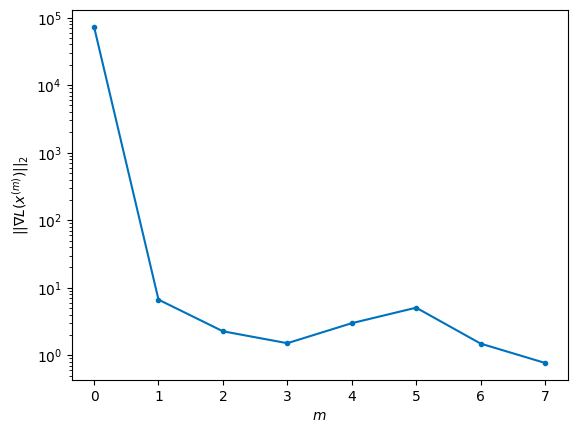


Windows:  78%|███████▊  | 231/296 [46:07<11:04, 10.22s/it]

Before applying the algorithm
Cost function: 515.7843109189292
Gradient norm: 288633.5379748303
Global relative error: 1904508516.0769594
Position relative errors: 0.03814616220736794 m, 13.626192401398477 m, 2143.42246207372 m, 3229.42741433106 m

Iteration 1
Cost function: 515.41038538159 (-0.07%)
Gradient norm: 7.200612694293386 (-100.00%)
Global relative error: 3875.5735503631513 (-0.01%)
Position relative errors: 0.040967184670759695 m, 13.923444787777226 m, 2143.381486549617 m, 3228.8881979951793 m

Iteration 2
Cost function: 515.4103854078716 (0.00%)
Gradient norm: 2.4565678152224715 (-65.88%)
Global relative error: 3875.5734512109757 (-0.00%)
Position relative errors: 0.04096718434136218 m, 13.923548858739663 m, 2143.3814857302605 m, 3228.8880790797325 m

Iteration 3
Cost function: 515.4103851464138 (-0.00%)
Gradient norm: 1.484366299822881 (-39.58%)
Global relative error: 3875.573451220237 (0.00%)
Position relative errors: 0.04096718101121096 m, 13.92354886217434 m, 2143.38148

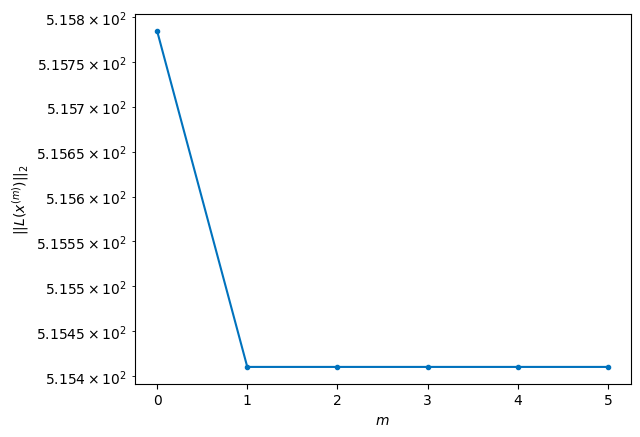

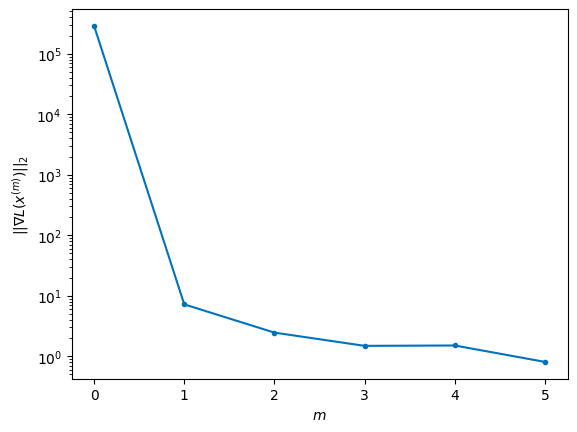


Windows:  78%|███████▊  | 232/296 [46:18<11:06, 10.41s/it]

Before applying the algorithm
Cost function: 518.1103509004748
Gradient norm: 161594.36175291604
Global relative error: 1905089715.207877
Position relative errors: 0.04008566981891103 m, 14.182833091642111 m, 1853.5169362881484 m, 2795.1028700978436 m

Iteration 1
Cost function: 517.3434088457217 (-0.15%)
Gradient norm: 32.567686171893484 (-99.98%)
Global relative error: 3353.576540095922 (-0.01%)
Position relative errors: 0.04281186125127807 m, 15.088104622271587 m, 1853.4910787413598 m, 2794.7702824627727 m

Iteration 2
Cost function: 517.3434091600125 (0.00%)
Gradient norm: 4.474138640126585 (-86.26%)
Global relative error: 3353.5763722192864 (-0.00%)
Position relative errors: 0.04281185486986329 m, 15.088281826383453 m, 1853.4910586667465 m, 2794.7700933763526 m

Iteration 3
Cost function: 517.3434091897319 (0.00%)
Gradient norm: 2.838777342823802 (-36.55%)
Global relative error: 3353.5763722019633 (-0.00%)
Position relative errors: 0.04281185233590459 m, 15.088281857810143 m, 1853

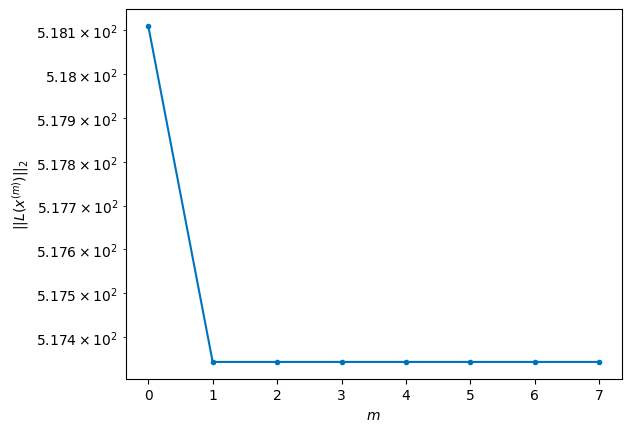

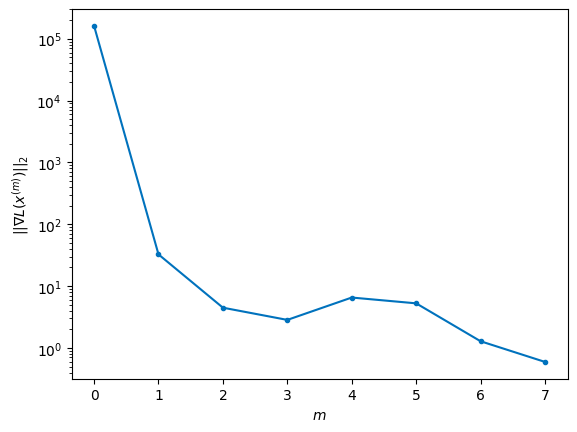


Windows:  79%|███████▊  | 233/296 [46:32<12:05, 11.51s/it]

Before applying the algorithm
Cost function: 520.212481023799
Gradient norm: 102070.02007706513
Global relative error: 1905645838.9383242
Position relative errors: 0.041898595430043255 m, 15.279294279462436 m, 1555.557865202398 m, 2348.8317683754044 m

Iteration 1
Cost function: 519.6396634367397 (-0.11%)
Gradient norm: 9.139235030444661 (-99.99%)
Global relative error: 2817.5719802808208 (0.01%)
Position relative errors: 0.044083760760433265 m, 15.16516595937679 m, 1555.3630104370993 m, 2349.30754462552 m

Iteration 2
Cost function: 519.639663595815 (0.00%)
Gradient norm: 1.240129225947663 (-86.43%)
Global relative error: 2817.5719351233524 (-0.00%)
Position relative errors: 0.04408375945055419 m, 15.16516157711771 m, 1555.3629970850864 m, 2349.3074993352043 m

Iteration 3
Cost function: 519.6396636519227 (0.00%)
Gradient norm: 2.7096329805159285 (118.50%)
Global relative error: 2817.571935143926 (0.00%)
Position relative errors: 0.04408375512808952 m, 15.165161580188155 m, 1555.36299

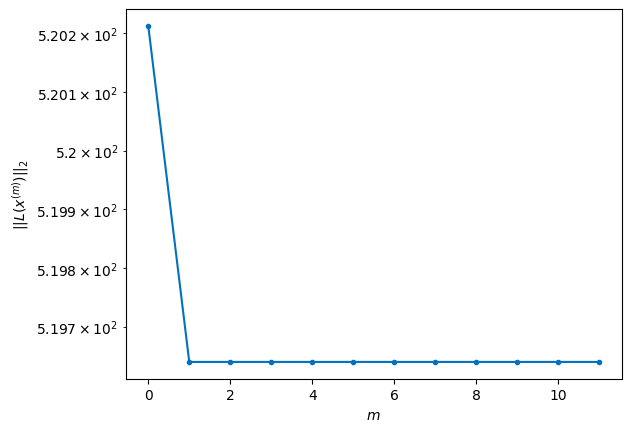

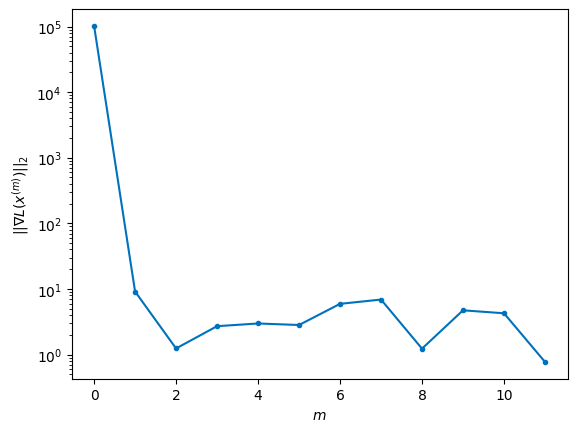


Windows:  79%|███████▉  | 234/296 [46:52<14:40, 14.21s/it]

Before applying the algorithm
Cost function: 519.2494878283478
Gradient norm: 399622.8571981461
Global relative error: 1906174241.8383188
Position relative errors: 0.043033225810232736 m, 15.287855363006551 m, 1250.6645489703706 m, 1893.1531580719877 m

Iteration 1
Cost function: 517.6280480934453 (-0.31%)
Gradient norm: 52.027608808979586 (-99.99%)
Global relative error: 2268.344114522308 (-0.03%)
Position relative errors: 0.038405712794454094 m, 15.555731006812058 m, 1249.684487561393 m, 1892.972924775724 m

STOP on Iteration 2
Cost function = 517.6280474440983 (-0.00%)
Gradient norm = 0.20980243988478872 (-99.60%)
Global relative error = 2268.3439329483417 (-0.00%)
Final position relative errors: 0.03840571173324426 m, 15.555411178304707 m, 1249.683692536057 m, 1892.9732346761882 m



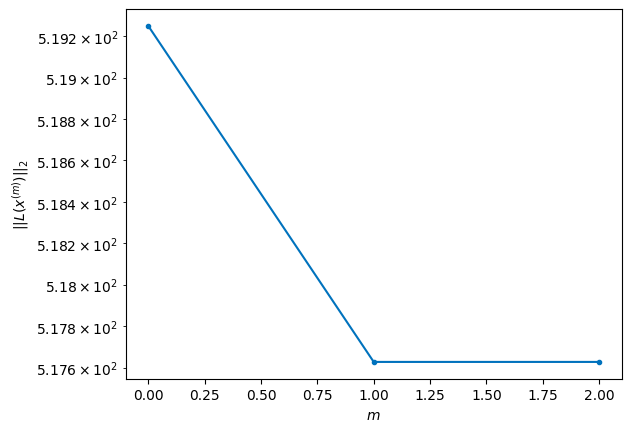

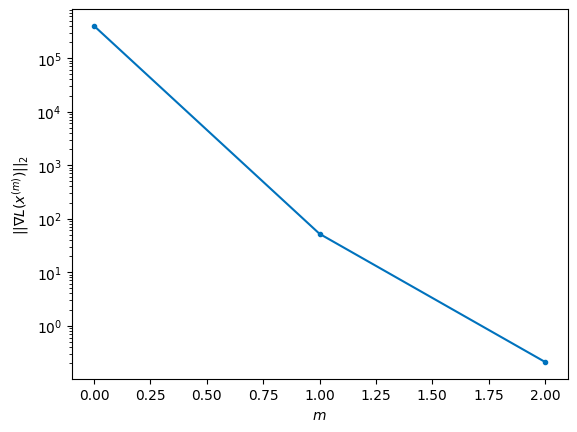


Windows:  79%|███████▉  | 235/296 [46:58<11:51, 11.66s/it]

Before applying the algorithm
Cost function: 508.0317251126707
Gradient norm: 62508.94989052343
Global relative error: 1906672440.3128624
Position relative errors: 0.03754689528382853 m, 15.610589629691393 m, 939.5470715095031 m, 1428.553552112309 m

Iteration 1
Cost function: 504.66462733056994 (-0.66%)
Gradient norm: 183.16380431923722 (-99.71%)
Global relative error: 1709.3006197988468 (-0.04%)
Position relative errors: 0.031132923249986434 m, 14.976718659343584 m, 937.2127637727192 m, 1429.3455230922414 m

Iteration 2
Cost function: 504.66461351930883 (-0.00%)
Gradient norm: 2.615917596085736 (-98.57%)
Global relative error: 1709.3002222248879 (-0.00%)
Position relative errors: 0.031132916966029652 m, 14.974036952803212 m, 937.2081168278567 m, 1429.3481227083973 m

Iteration 3
Cost function: 504.6646136291213 (0.00%)
Gradient norm: 4.196060657558589 (60.40%)
Global relative error: 1709.300222234844 (0.00%)
Position relative errors: 0.031132918026620868 m, 14.974036909415846 m, 937.

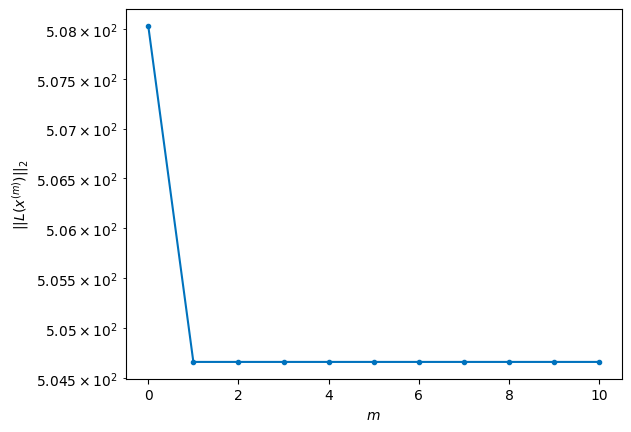

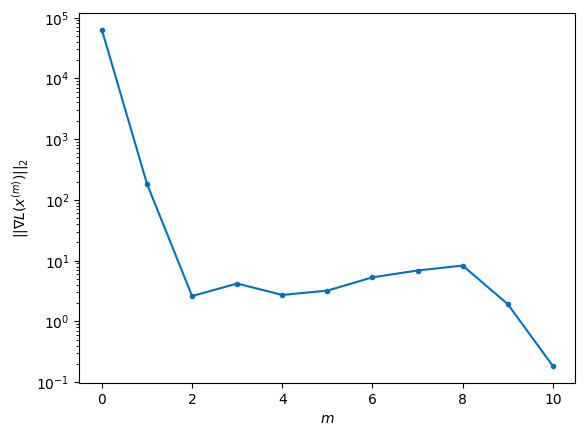


Windows:  80%|███████▉  | 236/296 [47:18<14:09, 14.16s/it]

Before applying the algorithm
Cost function: 491.76451024778794
Gradient norm: 174690.16167503112
Global relative error: 1907138125.843141
Position relative errors: 0.03054178794836225 m, 14.97871856128041 m, 623.0076065346527 m, 958.6869420381998 m

Iteration 1
Cost function: 485.8509823357009 (-1.20%)
Gradient norm: 401.6372019852257 (-99.77%)
Global relative error: 1142.7439102810713 (-0.06%)
Position relative errors: 0.034720412502955614 m, 13.664181076115806 m, 619.4257340145331 m, 960.1556227117885 m

Iteration 2
Cost function: 485.8509625181457 (-0.00%)
Gradient norm: 6.1753052436266325 (-98.46%)
Global relative error: 1142.7439035547843 (-0.00%)
Position relative errors: 0.034720406253663356 m, 13.661206658755235 m, 619.4217511541558 m, 960.158226488109 m

Iteration 3
Cost function: 485.8509626116666 (0.00%)
Gradient norm: 3.1809592415327925 (-48.49%)
Global relative error: 1142.7439035371285 (-0.00%)
Position relative errors: 0.03472040206803508 m, 13.661206648993952 m, 619.42

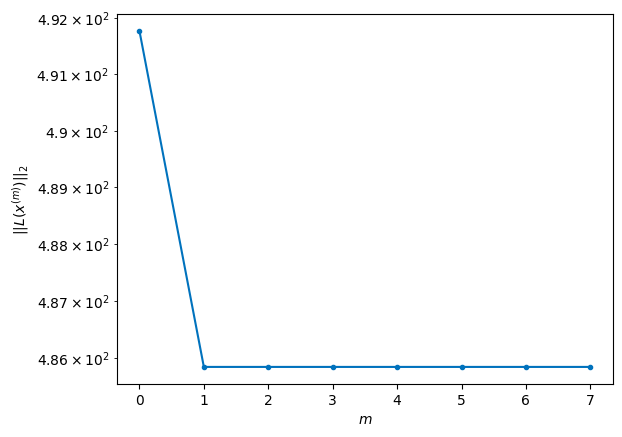

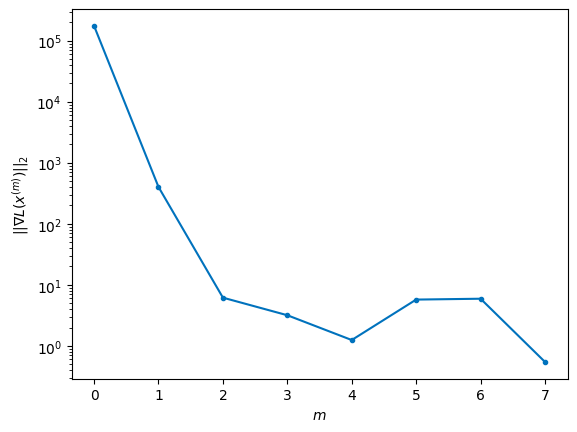


Windows:  80%|████████  | 237/296 [47:32<13:53, 14.12s/it]

Before applying the algorithm
Cost function: 480.280189669433
Gradient norm: 48388.44701478246
Global relative error: 1907569180.3586483
Position relative errors: 0.03388497469335847 m, 13.632475542663233 m, 302.55384684073204 m, 485.2835455660996 m

Iteration 1
Cost function: 479.1531424989493 (-0.23%)
Gradient norm: 29.23078558485188 (-99.94%)
Global relative error: 571.5534935808208 (-0.10%)
Position relative errors: 0.04335430037236253 m, 13.278803938972107 m, 301.5576291483668 m, 485.25148250884945 m

Iteration 2
Cost function: 479.15314157369556 (-0.00%)
Gradient norm: 1.017768347431051 (-96.52%)
Global relative error: 571.5533404672731 (-0.00%)
Position relative errors: 0.04335428963807866 m, 13.279456751567299 m, 301.5582007528396 m, 485.2509290758382 m

Iteration 3
Cost function: 479.15314152429784 (-0.00%)
Gradient norm: 2.2088349412268307 (117.03%)
Global relative error: 571.5533404662154 (-0.00%)
Position relative errors: 0.04335430047350174 m, 13.279456754124565 m, 301.558

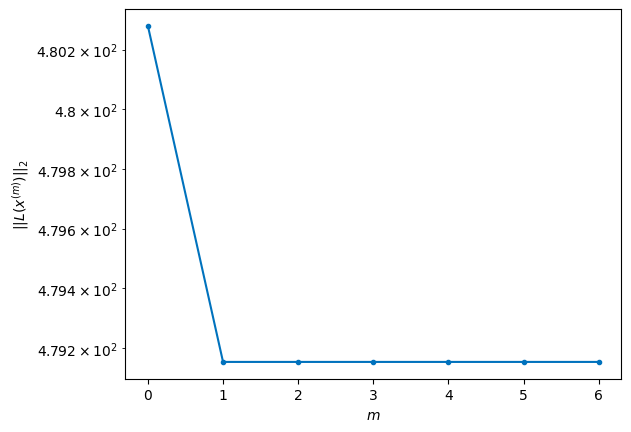

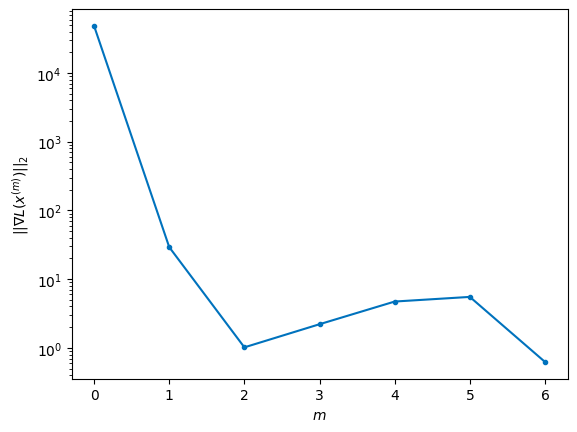


Windows:  80%|████████  | 238/296 [47:45<13:09, 13.61s/it]

Before applying the algorithm
Cost function: 475.4345014670826
Gradient norm: 115458.43782360661
Global relative error: 1907963669.2726655
Position relative errors: 0.04215709168197903 m, 13.196387426577651 m, 16.686612931272617 m, 8.449750978322832 m

Iteration 1
Cost function: 474.4464007928903 (-0.21%)
Gradient norm: 51.200488829390615 (-99.96%)
Global relative error: 25.29635300399867 (1.97%)
Position relative errors: 0.049815864362973396 m, 14.194414950061399 m, 17.002317444049602 m, 7.608214753545285 m

Iteration 2
Cost function: 474.4464009332118 (0.00%)
Gradient norm: 4.05349176389435 (-92.08%)
Global relative error: 25.296318803401547 (-0.00%)
Position relative errors: 0.049815866078311795 m, 14.19429085107225 m, 17.00231608530355 m, 7.608335358392136 m

Iteration 3
Cost function: 474.44640048475594 (-0.00%)
Gradient norm: 1.8971886041461075 (-53.20%)
Global relative error: 25.296318812994876 (0.00%)
Position relative errors: 0.04981586187406017 m, 14.194290853439993 m, 17.002

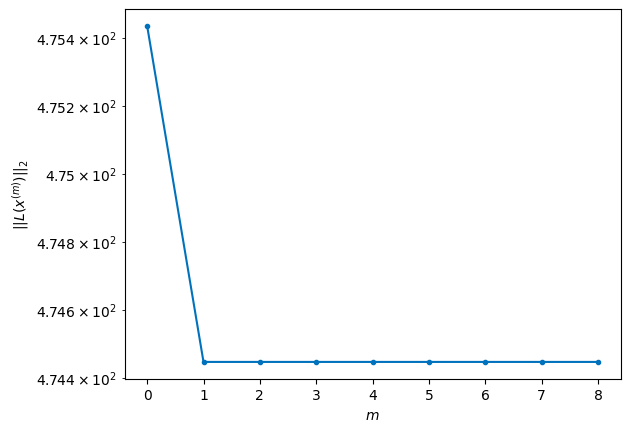

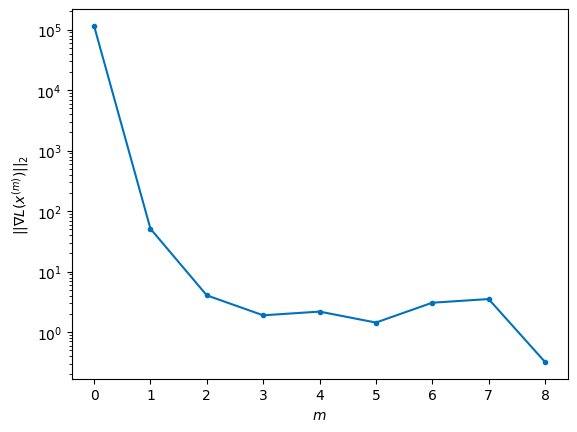


Windows:  81%|████████  | 239/296 [48:01<13:34, 14.29s/it]

Before applying the algorithm
Cost function: 476.0552740851239
Gradient norm: 58138.95059673423
Global relative error: 1908319894.9531815
Position relative errors: 0.04824491276344949 m, 14.057337626489929 m, 335.0958629290545 m, 469.61658981677976 m

Iteration 1
Cost function: 475.5997960977518 (-0.10%)
Gradient norm: 17.003764961228427 (-99.97%)
Global relative error: 577.8251049980549 (0.11%)
Position relative errors: 0.047843081377956995 m, 14.559668867635228 m, 335.2493345516077 m, 470.30489168220504 m

Iteration 2
Cost function: 475.59979585836504 (-0.00%)
Gradient norm: 7.692396948989406 (-54.76%)
Global relative error: 577.8252316814836 (0.00%)
Position relative errors: 0.04784307161680761 m, 14.559972026738135 m, 335.2493009147864 m, 470.30506191796553 m

Iteration 3
Cost function: 475.59979620454766 (0.00%)
Gradient norm: 6.8382820554618595 (-11.10%)
Global relative error: 577.825231704695 (0.00%)
Position relative errors: 0.04784307889510654 m, 14.559972073128213 m, 335.2493

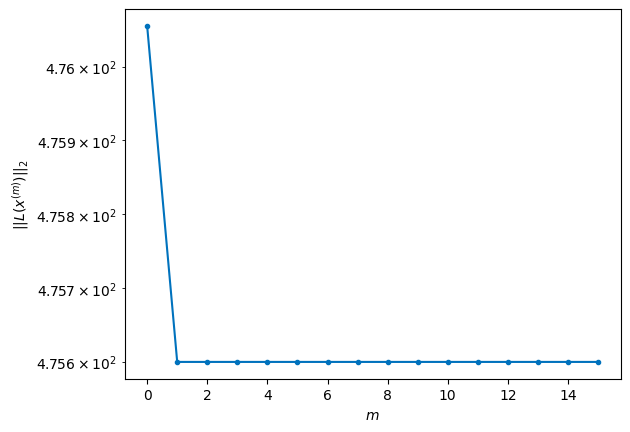

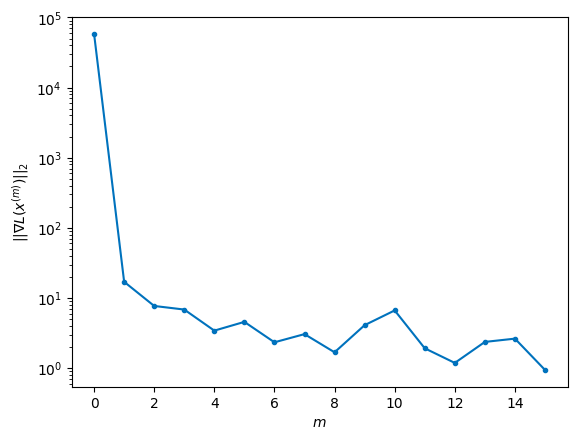


Windows:  81%|████████  | 240/296 [48:27<16:51, 18.07s/it]

Before applying the algorithm
Cost function: 476.6891054467961
Gradient norm: 171634.2959352529
Global relative error: 1908636339.7173204
Position relative errors: 0.04619393944720669 m, 14.377058980405293 m, 651.9338977976814 m, 945.2807351945323 m

Iteration 1
Cost function: 476.5100596410622 (-0.04%)
Gradient norm: 6.7660996350085805 (-100.00%)
Global relative error: 1148.7604126288052 (0.03%)
Position relative errors: 0.0453256669678304 m, 14.721843521534774 m, 652.0391306426676 m, 945.6155968780157 m

Iteration 2
Cost function: 476.5100597394339 (0.00%)
Gradient norm: 2.4280736744985822 (-64.11%)
Global relative error: 1148.7604507822057 (0.00%)
Position relative errors: 0.045325670574671816 m, 14.721941713723702 m, 652.0391211736994 m, 945.6156482280347 m

Iteration 3
Cost function: 476.51005935135186 (-0.00%)
Gradient norm: 1.2775942504811515 (-47.38%)
Global relative error: 1148.7604507921412 (0.00%)
Position relative errors: 0.045325672964971406 m, 14.721941681302498 m, 652.03

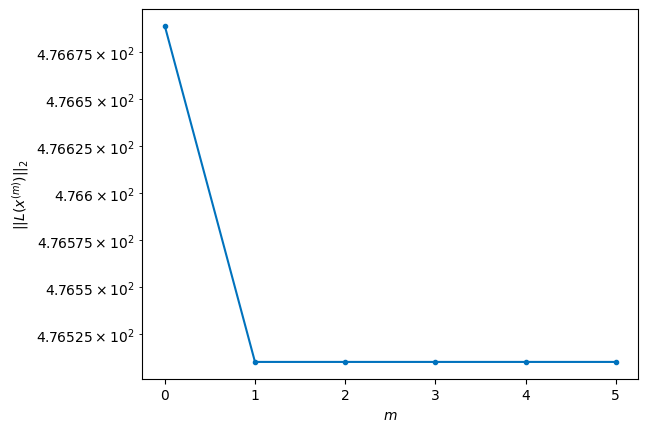

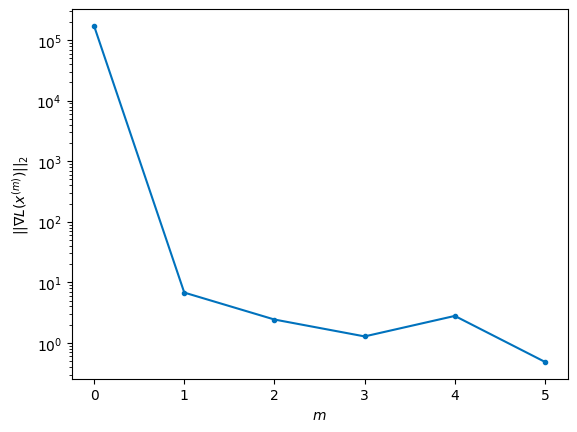


Windows:  81%|████████▏ | 241/296 [48:39<14:39, 16.00s/it]

Before applying the algorithm
Cost function: 476.03513643188813
Gradient norm: 69124.45023498521
Global relative error: 1908911728.48371
Position relative errors: 0.04373058628500614 m, 14.48577493465784 m, 965.8907883928799 m, 1416.466701211424 m

Iteration 1
Cost function: 475.7700607859419 (-0.06%)
Gradient norm: 5.886788944774405 (-99.99%)
Global relative error: 1714.6898342339941 (0.01%)
Position relative errors: 0.04194641710605722 m, 14.759170393547173 m, 965.7547658045554 m, 1416.7474121826822 m

Iteration 2
Cost function: 475.77006089072586 (0.00%)
Gradient norm: 5.197797247484148 (-11.70%)
Global relative error: 1714.6898384206336 (0.00%)
Position relative errors: 0.041946411566201165 m, 14.759186580652713 m, 965.7547667778832 m, 1416.7474164177208 m

STOP on Iteration 3
Cost function = 475.77006068367353 (-0.00%)
Gradient norm = 0.5247926416222888 (-89.90%)
Global relative error = 1714.6898384127946 (-0.00%)
Final position relative errors: 0.041946409816365 m, 14.75918657616

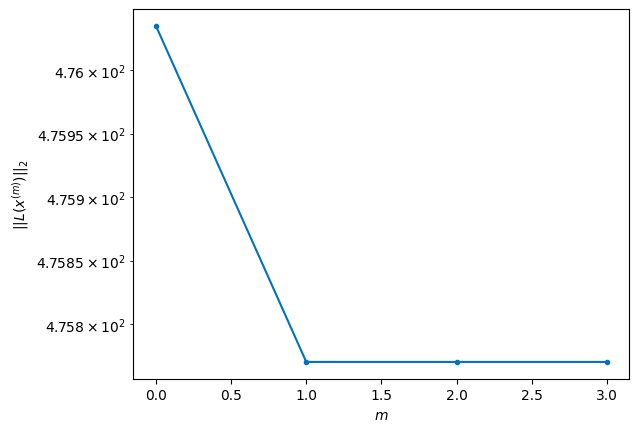

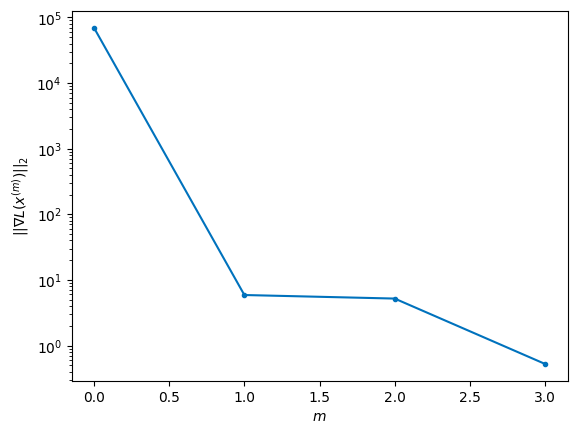


Windows:  82%|████████▏ | 242/296 [48:47<12:25, 13.81s/it]

Before applying the algorithm
Cost function: 476.7786656311703
Gradient norm: 114270.82695511683
Global relative error: 1909145007.6467805
Position relative errors: 0.0403222691613091 m, 14.45425162112769 m, 1275.3966166449338 m, 1881.3890923442916 m

Iteration 1
Cost function: 475.89483409849515 (-0.19%)
Gradient norm: 26.74956634109635 (-99.98%)
Global relative error: 2272.3082263309257 (-0.03%)
Position relative errors: 0.04145965673260721 m, 14.13450361572968 m, 1275.7557163465244 m, 1880.3050410051944 m

Iteration 2
Cost function: 475.8948339302971 (-0.00%)
Gradient norm: 3.5207004922820264 (-86.84%)
Global relative error: 2272.308076272114 (-0.00%)
Position relative errors: 0.04145967116168115 m, 14.13455769956484 m, 1275.7556125244605 m, 1880.3049296971737 m

Iteration 3
Cost function: 475.89483401188255 (0.00%)
Gradient norm: 4.060718373628926 (15.34%)
Global relative error: 2272.308076291053 (0.00%)
Position relative errors: 0.04145966619899818 m, 14.134557728278542 m, 1275.75

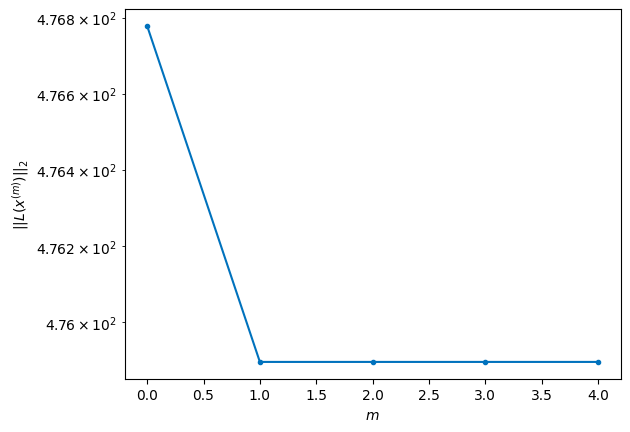

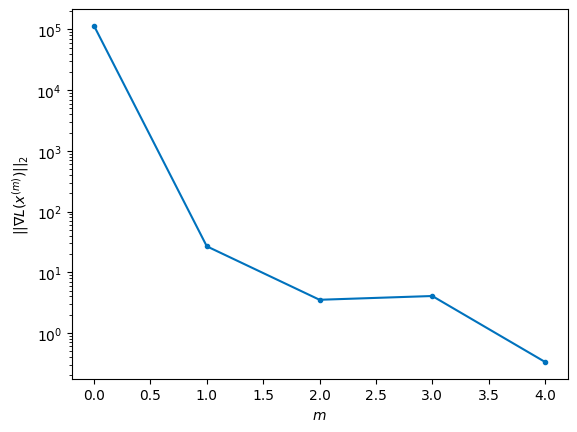


Windows:  82%|████████▏ | 243/296 [48:56<10:51, 12.30s/it]

Before applying the algorithm
Cost function: 480.4560607929123
Gradient norm: 113234.49591374153
Global relative error: 1909335347.2584596
Position relative errors: 0.03982858373130359 m, 13.776210167190515 m, 1579.831497946114 m, 2336.735405058178 m

Iteration 1
Cost function: 479.75198547902266 (-0.15%)
Gradient norm: 24.076436528711742 (-99.98%)
Global relative error: 2820.31544021204 (-0.01%)
Position relative errors: 0.03554644481050734 m, 13.109188669419435 m, 1579.4724319852191 m, 2336.4914637314296 m

Iteration 2
Cost function: 479.75198546461485 (-0.00%)
Gradient norm: 3.4271207297596282 (-85.77%)
Global relative error: 2820.315147089122 (-0.00%)
Position relative errors: 0.03554644478507372 m, 13.108855563168213 m, 1579.4722467586096 m, 2336.491236993073 m

STOP on Iteration 3
Cost function = 479.7519855032775 (0.00%)
Gradient norm = 0.8130736262155911 (-76.28%)
Global relative error = 2820.315147074321 (-0.00%)
Final position relative errors: 0.035546444389345774 m, 13.10885

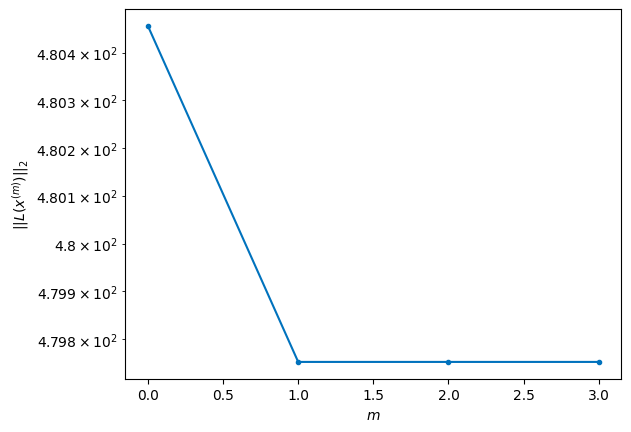

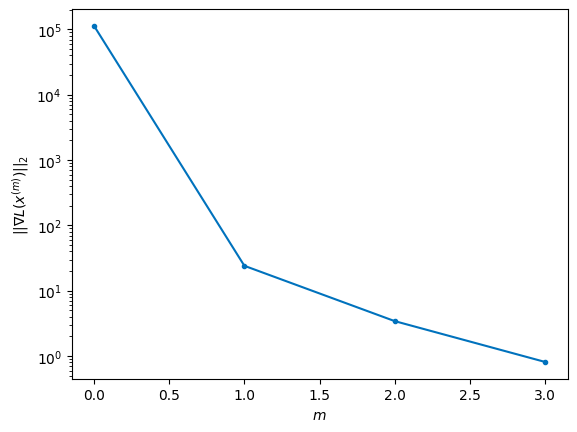


Windows:  82%|████████▏ | 244/296 [49:03<09:18, 10.75s/it]

Before applying the algorithm
Cost function: 482.5579615915062
Gradient norm: 158559.64294143152
Global relative error: 1909482160.507564
Position relative errors: 0.03412055890492366 m, 12.693072131922635 m, 1876.6353052213547 m, 2782.735176845842 m

Iteration 1
Cost function: 482.1725190184747 (-0.08%)
Gradient norm: 2.305823752493881 (-100.00%)
Global relative error: 3356.3239147292365 (-0.00%)
Position relative errors: 0.04427115950310394 m, 12.93319223714777 m, 1876.6285980472098 m, 2782.612129723892 m

Iteration 2
Cost function: 482.17251909514005 (0.00%)
Gradient norm: 1.9899890993541731 (-13.70%)
Global relative error: 3356.3239047022716 (-0.00%)
Position relative errors: 0.04427116124769399 m, 12.933226061549869 m, 1876.6285962365705 m, 2782.612118693412 m

Iteration 3
Cost function: 482.1725193210812 (0.00%)
Gradient norm: 1.6004196516489027 (-19.58%)
Global relative error: 3356.3239047024604 (0.00%)
Position relative errors: 0.044271158759088734 m, 12.933226088571587 m, 1876

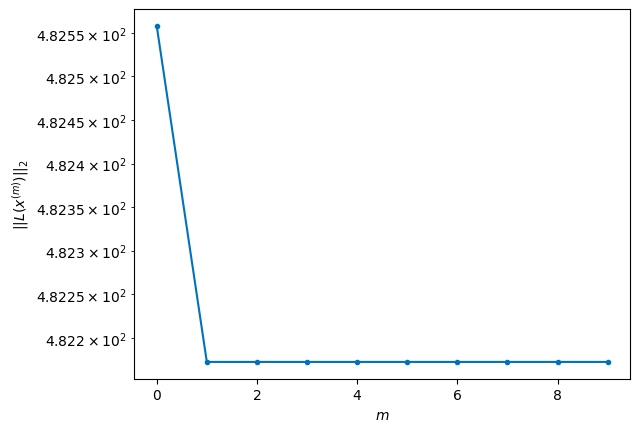

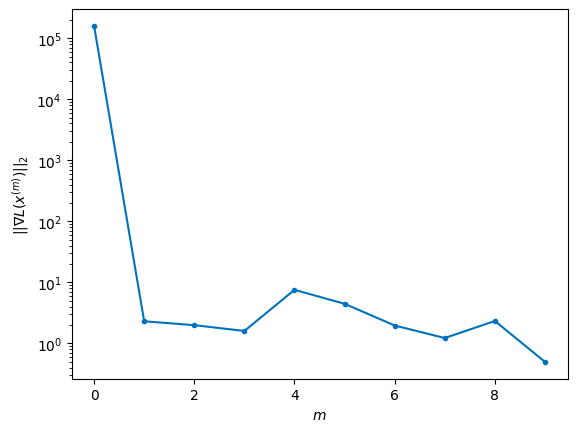


Windows:  83%|████████▎ | 245/296 [49:21<11:02, 12.99s/it]

Before applying the algorithm
Cost function: 478.7809267389665
Gradient norm: 45214.858419726144
Global relative error: 1909585065.5584645
Position relative errors: 0.04245613816959794 m, 12.468880654977974 m, 2165.6011097398223 m, 3216.7164715091685 m

Iteration 1
Cost function: 478.46905395205584 (-0.07%)
Gradient norm: 5.284860845921624 (-99.99%)
Global relative error: 3878.0679011053558 (0.01%)
Position relative errors: 0.04467577815817963 m, 12.36405313184668 m, 2165.8834787866035 m, 3216.851458717445 m

STOP on Iteration 2
Cost function = 478.4690538269 (-0.00%)
Gradient norm = 0.08826619947682617 (-98.33%)
Global relative error = 3878.067900054546 (-0.00%)
Final position relative errors: 0.0446757792281965 m, 12.364101669711484 m, 2165.8834134792114 m, 3216.8515012351168 m



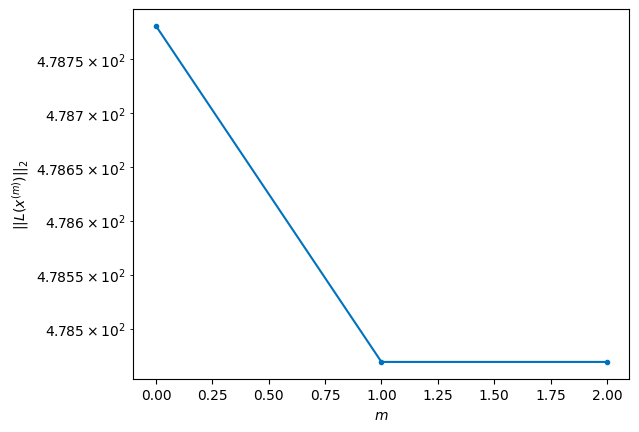

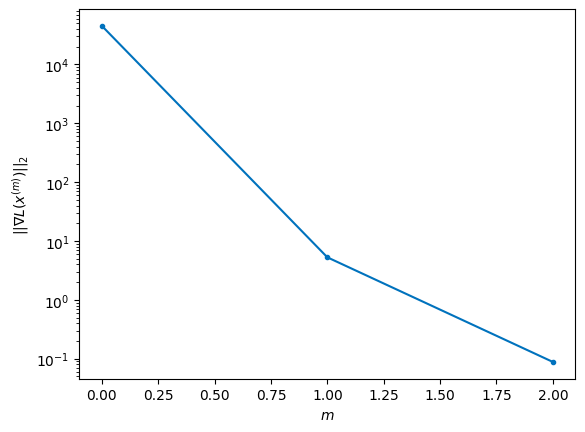


Windows:  83%|████████▎ | 246/296 [49:27<09:03, 10.86s/it]

Before applying the algorithm
Cost function: 480.6544132154805
Gradient norm: 107485.37787856437
Global relative error: 1909643909.50387
Position relative errors: 0.04287496748156565 m, 11.843170639344942 m, 2445.3977658100825 m, 3636.947473793628 m

Iteration 1
Cost function: 480.24816044048794 (-0.08%)
Gradient norm: 30.237761699474774 (-99.97%)
Global relative error: 4382.410765977083 (-0.01%)
Position relative errors: 0.05358931804878485 m, 11.028917632471424 m, 2445.803307033236 m, 3636.3966354072313 m

STOP on Iteration 2
Cost function = 480.24816082406073 (0.00%)
Gradient norm = 0.6823250910267715 (-97.74%)
Global relative error = 4382.410617278561 (-0.00%)
Final position relative errors: 0.053589315103939786 m, 11.028720423843469 m, 2445.8032698415786 m, 3636.3964818157556 m



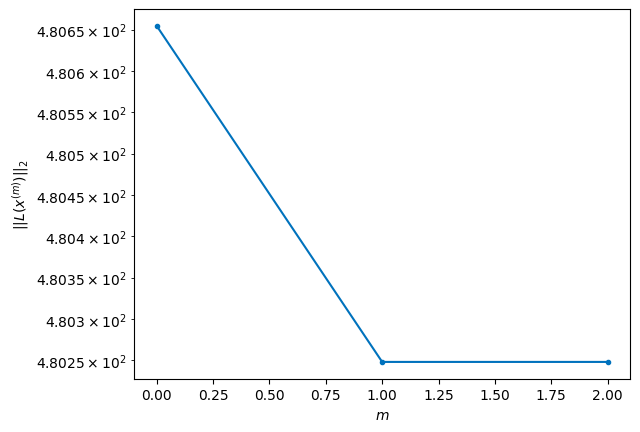

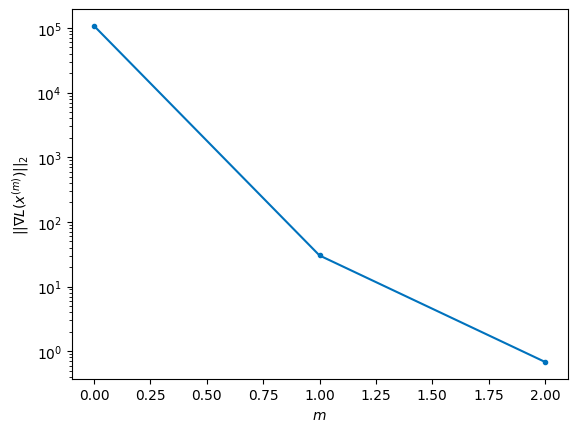


Windows:  83%|████████▎ | 247/296 [49:34<07:53,  9.65s/it]

Before applying the algorithm
Cost function: 478.9820415742285
Gradient norm: 156856.67852800796
Global relative error: 1909658768.0291836
Position relative errors: 0.05143989433880679 m, 10.488558492799811 m, 2714.627022300792 m, 4040.666767042823 m

Iteration 1
Cost function: 478.442785598838 (-0.11%)
Gradient norm: 12.813404284019517 (-99.99%)
Global relative error: 4867.708587437006 (-0.00%)
Position relative errors: 0.04442658135794112 m, 10.095886222804163 m, 2714.643580674833 m, 4040.4371624654877 m

Iteration 2
Cost function: 478.4427860042513 (0.00%)
Gradient norm: 1.6896786193618898 (-86.81%)
Global relative error: 4867.708595846857 (0.00%)
Position relative errors: 0.04442657914779859 m, 10.09586736464586 m, 2714.6436425867 m, 4040.4371310477463 m

Iteration 14
Cost function: 461.55221135751236 (-0.00%)
Gradient norm: 2.7313105487467118 (-41.83%)
Global relative error: 7566.68193608053 (0.00%)
Position relative errors: 0.032720681584259025 m, 5.780273035059386 m, 4205.400136

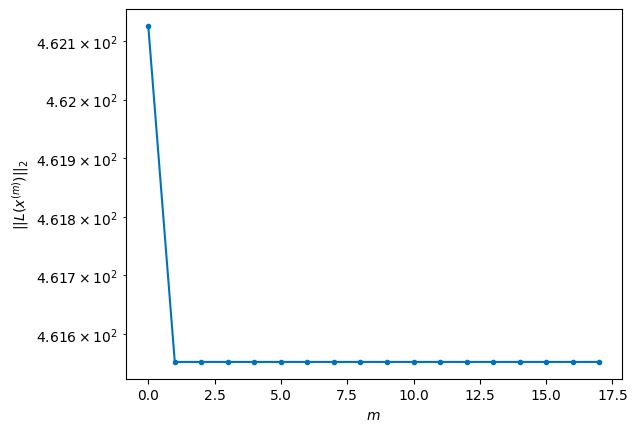

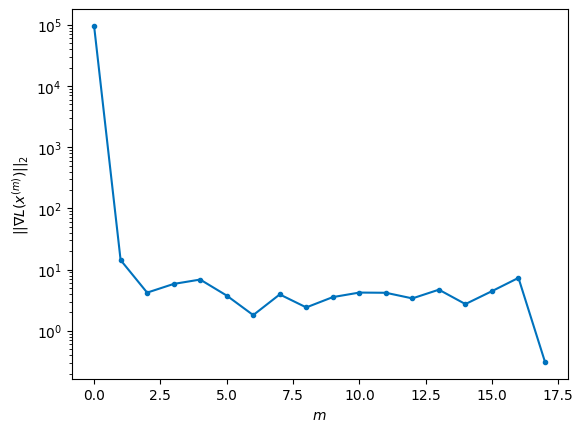


Windows:  86%|████████▌ | 255/296 [51:44<12:40, 18.55s/it]

Before applying the algorithm
Cost function: 462.3980229754362
Gradient norm: 185591.39007839173
Global relative error: 1908268411.954997
Position relative errors: 0.03139598032479231 m, 4.888651214791807 m, 4351.46154408701 m, 6511.885191313613 m

Iteration 1
Cost function: 461.9941399600206 (-0.09%)
Gradient norm: 26.46995559643585 (-99.99%)
Global relative error: 7831.741642658458 (-0.00%)
Position relative errors: 0.026710570594942296 m, 4.26344808028806 m, 4351.542522133881 m, 6511.545094130032 m

Iteration 2
Cost function: 461.99413993467556 (-0.00%)
Gradient norm: 2.138740516204906 (-91.92%)
Global relative error: 7831.741618434577 (-0.00%)
Position relative errors: 0.026710573466672008 m, 4.263530513006307 m, 4351.542463441386 m, 6511.545104163943 m

Iteration 3
Cost function: 461.9941398883497 (-0.00%)
Gradient norm: 1.696321221079883 (-20.69%)
Global relative error: 7831.741618493129 (0.00%)
Position relative errors: 0.02671056992418193 m, 4.263530555592934 m, 4351.5424634379

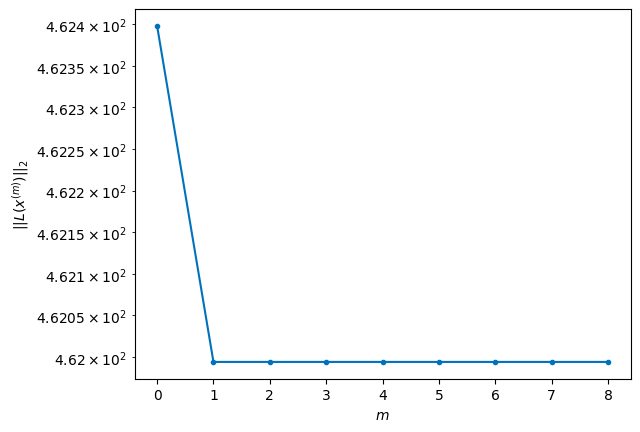

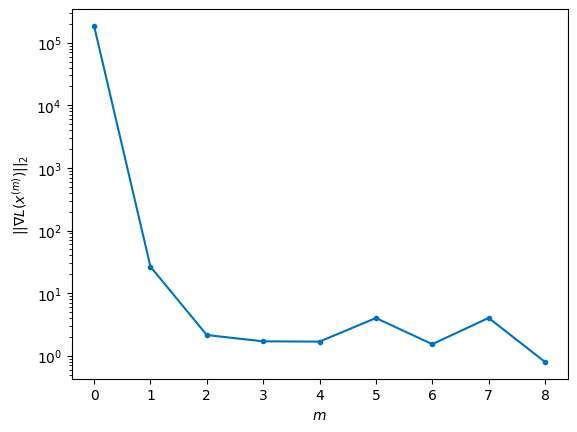


Windows:  86%|████████▋ | 256/296 [51:59<11:42, 17.56s/it]

Before applying the algorithm
Cost function: 457.6897578042411
Gradient norm: 30513.294647175087
Global relative error: 1907922588.269842
Position relative errors: 0.025380071425529775 m, 3.3916485252303357 m, 4478.603673533082 m, 6704.696430704511 m

Iteration 1
Cost function: 457.2087555134243 (-0.11%)
Gradient norm: 11.965448880493712 (-99.96%)
Global relative error: 8062.927588752592 (-0.00%)
Position relative errors: 0.03141481645818926 m, 3.094572902342977 m, 4479.090140104968 m, 6704.366528069016 m

Iteration 2
Cost function: 457.2087556664386 (0.00%)
Gradient norm: 1.355264669105212 (-88.67%)
Global relative error: 8062.927593456562 (0.00%)
Position relative errors: 0.031414811540039236 m, 3.0946718694807918 m, 4479.0900057960835 m, 6704.366623410316 m

Iteration 3
Cost function: 457.20875546589247 (-0.00%)
Gradient norm: 4.215146868088686 (211.02%)
Global relative error: 8062.927593438084 (-0.00%)
Position relative errors: 0.03141481485686064 m, 3.094671868682694 m, 4479.09000

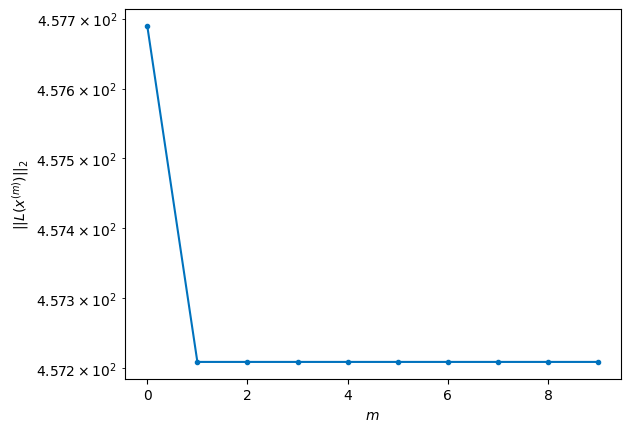

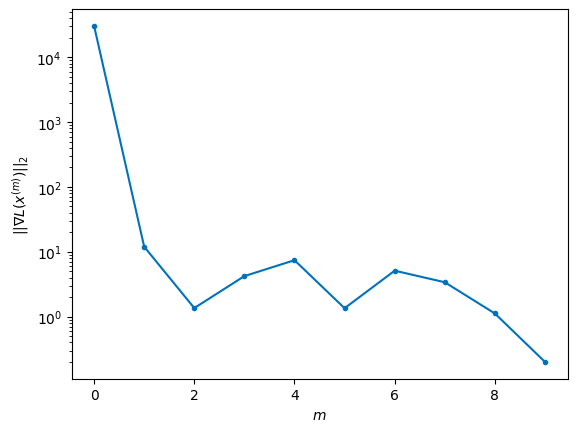


Windows:  87%|████████▋ | 257/296 [52:18<11:44, 18.05s/it]

Before applying the algorithm
Cost function: 456.3199898978279
Gradient norm: 96802.0152938191
Global relative error: 1907543609.3993309
Position relative errors: 0.030215157804542453 m, 2.2073422265378926 m, 4586.602566203509 m, 6868.354484511198 m

Iteration 1
Cost function: 455.9443702513405 (-0.08%)
Gradient norm: 15.21028206913581 (-99.98%)
Global relative error: 8259.03583996282 (0.00%)
Position relative errors: 0.03161106638996669 m, 2.1077305791747523 m, 4587.019927065323 m, 6868.108031324601 m

Iteration 2
Cost function: 455.94437066458795 (0.00%)
Gradient norm: 1.797211261576063 (-88.18%)
Global relative error: 8259.035820825318 (-0.00%)
Position relative errors: 0.03161105648096933 m, 2.1077971004638933 m, 4587.019803035088 m, 6868.108091127342 m

STOP on Iteration 3
Cost function = 455.9443705541178 (-0.00%)
Gradient norm = 0.4699534657050605 (-73.85%)
Global relative error = 8259.035820856683 (0.00%)
Final position relative errors: 0.03161106678834476 m, 2.1077971092191254

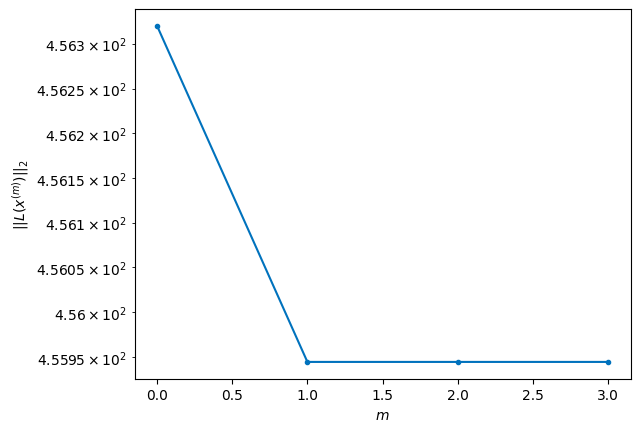

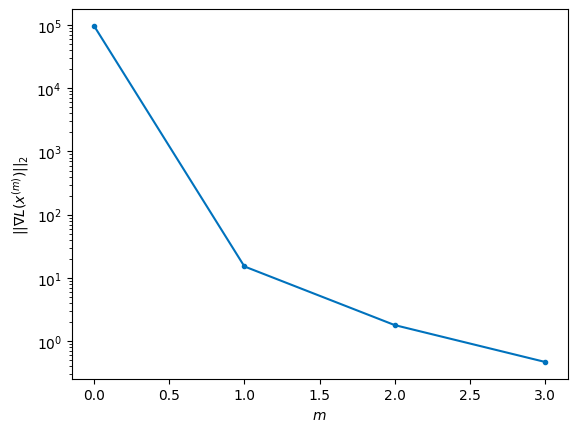


Windows:  87%|████████▋ | 258/296 [52:25<09:18, 14.69s/it]

Before applying the algorithm
Cost function: 455.8580322748103
Gradient norm: 327444.44412942877
Global relative error: 1907133337.6939151
Position relative errors: 0.030377640490302584 m, 1.197714037130991 m, 4674.5196117095475 m, 7002.160852428173 m

Iteration 1
Cost function: 455.3281191554605 (-0.12%)
Gradient norm: 7.410393241013927 (-100.00%)
Global relative error: 8418.84292060268 (-0.00%)
Position relative errors: 0.027384398456438384 m, 1.0494759262720457 m, 4674.9759143340225 m, 7001.536233569966 m

STOP on Iteration 2
Cost function = 455.3281193352535 (0.00%)
Gradient norm = 0.5199756567148903 (-92.98%)
Global relative error = 8418.842808173622 (-0.00%)
Final position relative errors: 0.027384402058434718 m, 1.0495547456113383 m, 4674.975797264682 m, 7001.536176538345 m



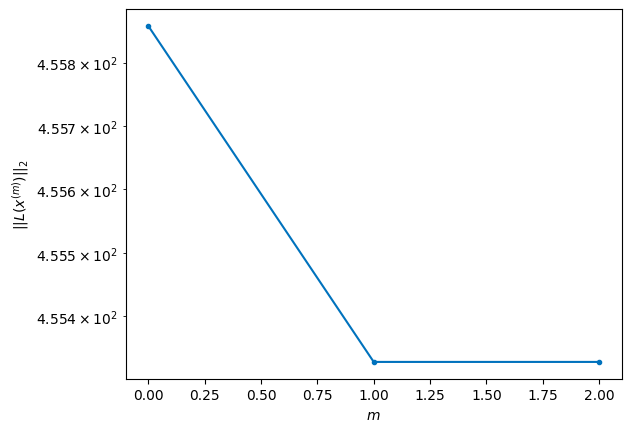

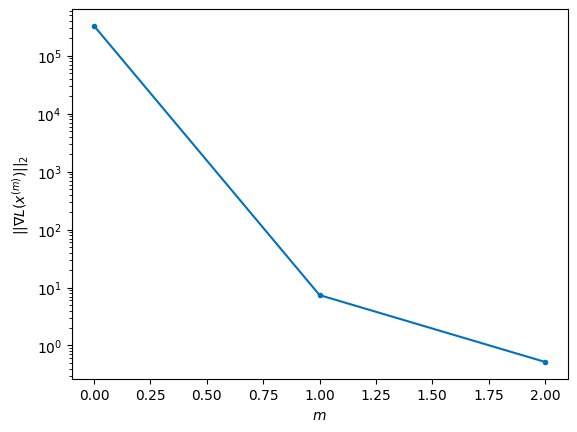


Windows:  88%|████████▊ | 259/296 [52:31<07:32, 12.22s/it]

Before applying the algorithm
Cost function: 459.68608433214155
Gradient norm: 90243.77500644914
Global relative error: 1906693727.8885734
Position relative errors: 0.026267135894741587 m, 0.19870919671688236 m, 4742.102383460016 m, 7105.103991785346 m

Iteration 1
Cost function: 459.0094094270313 (-0.15%)
Gradient norm: 16.62778688899137 (-99.98%)
Global relative error: 8541.942561352367 (-0.00%)
Position relative errors: 0.022581015408596188 m, 0.41007836223298394 m, 4741.96674860427 m, 7104.8244773602855 m

Iteration 2
Cost function: 459.00940976875273 (0.00%)
Gradient norm: 1.577774440543278 (-90.51%)
Global relative error: 8541.942518715987 (-0.00%)
Position relative errors: 0.0225810136416249 m, 0.4101562390598201 m, 4741.966714180456 m, 7104.824449070667 m

Iteration 3
Cost function: 459.0094094453701 (-0.00%)
Gradient norm: 4.0925873535456665 (159.39%)
Global relative error: 8541.942518677935 (-0.00%)
Position relative errors: 0.022581015132543947 m, 0.4101562263693805 m, 4741.

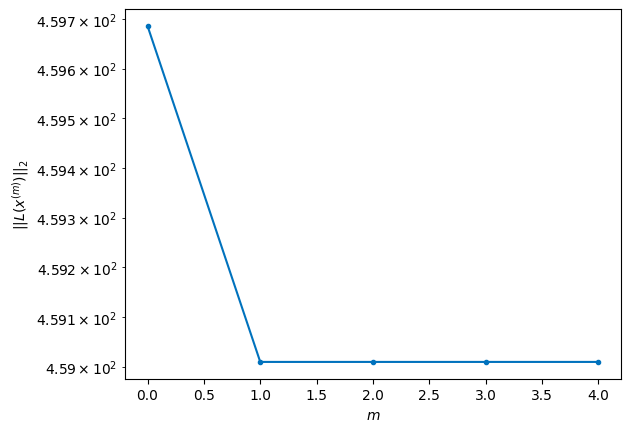

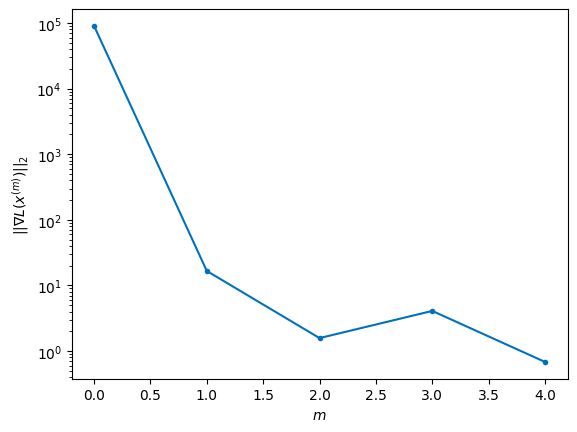


Windows:  88%|████████▊ | 260/296 [52:41<06:51, 11.44s/it]

Before applying the algorithm
Cost function: 460.5116229217542
Gradient norm: 82247.22995895153
Global relative error: 1906226815.7971358
Position relative errors: 0.022577694270464157 m, 0.6524766775294446 m, 4788.42763995251 m, 7177.394377396193 m

Iteration 1
Cost function: 459.92735734672414 (-0.13%)
Gradient norm: 18.831716681392006 (-99.98%)
Global relative error: 8628.043650659898 (-0.00%)
Position relative errors: 0.018921637307709575 m, 0.45394381087711816 m, 4788.150168640924 m, 7177.517240019679 m

Iteration 2
Cost function: 459.9273574597159 (0.00%)
Gradient norm: 2.175640331766936 (-88.45%)
Global relative error: 8628.043764046268 (0.00%)
Position relative errors: 0.018921637465392518 m, 0.45376125475825435 m, 4788.150064786442 m, 7177.517445613936 m

STOP on Iteration 3
Cost function = 459.9273573363716 (-0.00%)
Gradient norm = 0.2402346051305399 (-88.96%)
Global relative error = 8628.043763992213 (-0.00%)
Final position relative errors: 0.01892163853167231 m, 0.453761265

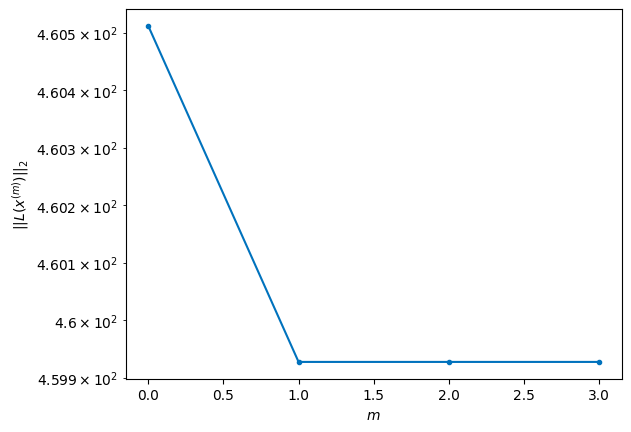

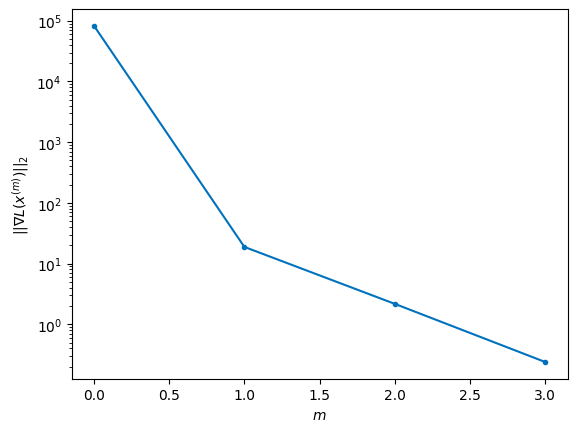


Windows:  88%|████████▊ | 261/296 [52:48<05:56, 10.18s/it]

Before applying the algorithm
Cost function: 458.0788396709879
Gradient norm: 79284.14451377653
Global relative error: 1905734707.218438
Position relative errors: 0.01953098217335346 m, 1.3041000443595472 m, 4813.794664957434 m, 7218.786847743052 m

Iteration 1
Cost function: 457.81973365310057 (-0.06%)
Gradient norm: 5.590150112920444 (-99.99%)
Global relative error: 8676.650492481253 (0.00%)
Position relative errors: 0.022042084584643927 m, 1.6243897654349613 m, 4813.852849828466 m, 7218.800566880732 m

STOP on Iteration 2
Cost function = 457.81973338116205 (-0.00%)
Gradient norm = 0.9176301405762894 (-83.58%)
Global relative error = 8676.65049187806 (-0.00%)
Final position relative errors: 0.022042084537107737 m, 1.6243172226705862 m, 4813.852828618385 m, 7218.800580315979 m



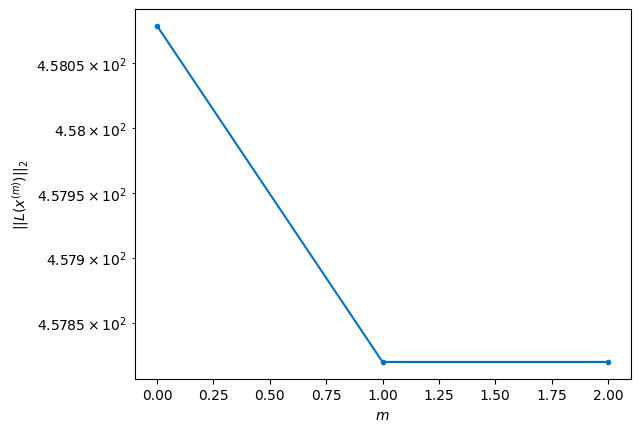

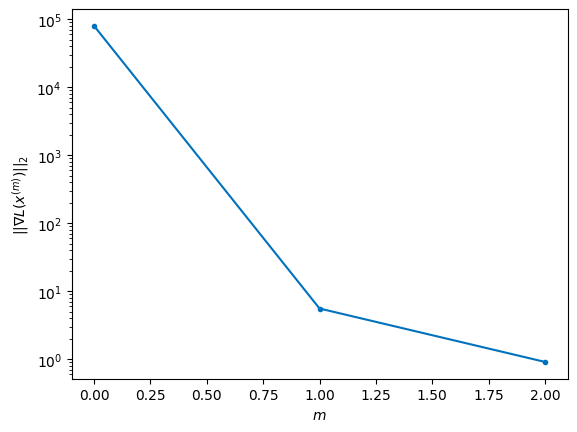


Windows:  89%|████████▊ | 262/296 [52:54<05:06,  9.01s/it]

Before applying the algorithm
Cost function: 468.6790048627606
Gradient norm: 176787.0928422863
Global relative error: 1905219582.5082164
Position relative errors: 0.022999125636181623 m, 2.6061127776822715 m, 4818.515531898558 m, 7228.598916346215 m

Iteration 1
Cost function: 467.5699606483333 (-0.24%)
Gradient norm: 20.68041481391488 (-99.99%)
Global relative error: 8687.304364634796 (-0.00%)
Position relative errors: 0.017977296280462997 m, 2.3116635300799646 m, 4818.459275101734 m, 7228.533874463197 m

Iteration 2
Cost function: 467.56996011041537 (-0.00%)
Gradient norm: 1.643893067412726 (-92.05%)
Global relative error: 8687.304449199833 (0.00%)
Position relative errors: 0.017977296995730987 m, 2.3114755769268913 m, 4818.459269965528 m, 7228.533979577913 m

Iteration 3
Cost function: 467.56995995398836 (-0.00%)
Gradient norm: 3.3770501159833133 (105.43%)
Global relative error: 8687.304449312163 (0.00%)
Position relative errors: 0.01797729516813449 m, 2.3114755406252994 m, 4818.45

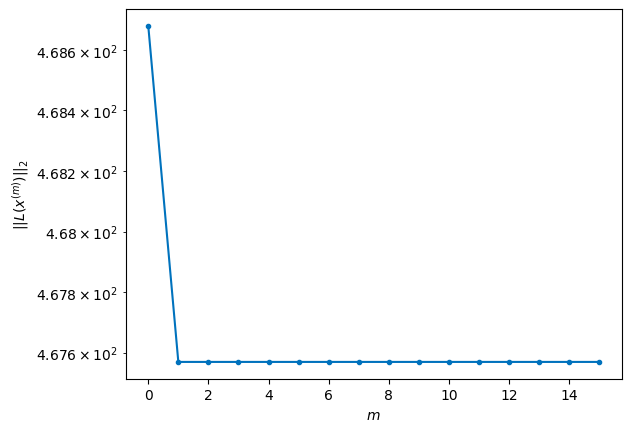

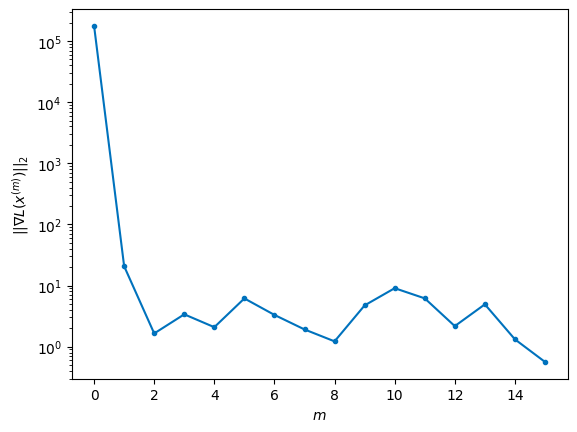


Windows:  89%|████████▉ | 263/296 [53:23<08:07, 14.77s/it]

Before applying the algorithm
Cost function: 466.88900947097295
Gradient norm: 361342.04835943575
Global relative error: 1904683652.5316057
Position relative errors: 0.01847923455127006 m, 3.2901936293296705 m, 4802.167403220272 m, 7206.7882121822795 m

Iteration 1
Cost function: 466.20564309571216 (-0.15%)
Gradient norm: 15.549545333697552 (-100.00%)
Global relative error: 8660.198041585232 (0.00%)
Position relative errors: 0.018683617401888394 m, 2.908798527952194 m, 4801.525093154944 m, 7207.244816711169 m

Iteration 2
Cost function: 466.2056431941844 (0.00%)
Gradient norm: 1.6047339230174427 (-89.68%)
Global relative error: 8660.198049576871 (0.00%)
Position relative errors: 0.018683616752506654 m, 2.908600260819181 m, 4801.524844104282 m, 7207.244992313483 m

Iteration 3
Cost function: 466.2056432868982 (0.00%)
Gradient norm: 3.8511009728330037 (139.98%)
Global relative error: 8660.198049604927 (0.00%)
Position relative errors: 0.018683616674425366 m, 2.9086002421003245 m, 4801.52

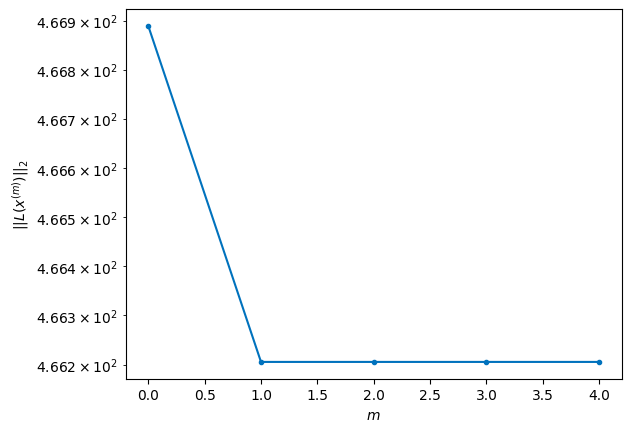

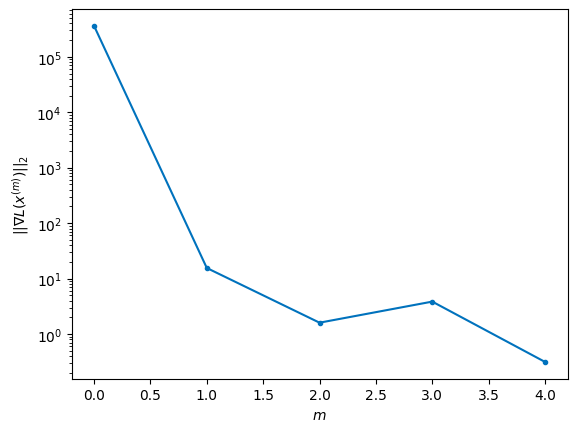


Windows:  89%|████████▉ | 264/296 [53:32<07:01, 13.18s/it]

Before applying the algorithm
Cost function: 465.2270801709902
Gradient norm: 311349.70841689606
Global relative error: 1904129184.6213167
Position relative errors: 0.019308407417697147 m, 3.8803993044358824 m, 4764.335732095416 m, 7154.056408650435 m

Iteration 1
Cost function: 464.60468667818844 (-0.13%)
Gradient norm: 13.083149310693335 (-100.00%)
Global relative error: 8595.565452681116 (0.00%)
Position relative errors: 0.02970706911519048 m, 3.92005032653266 m, 4764.207989384178 m, 7154.442701627126 m

Iteration 2
Cost function: 464.60468645826137 (-0.00%)
Gradient norm: 6.036600929942019 (-53.86%)
Global relative error: 8595.565435741217 (-0.00%)
Position relative errors: 0.029707062685079253 m, 3.9199648059579175 m, 4764.207986630118 m, 7154.442683155828 m

STOP on Iteration 3
Cost function = 464.6046864817225 (0.00%)
Gradient norm = 0.5609432145819766 (-90.71%)
Global relative error = 8595.565435726052 (-0.00%)
Final position relative errors: 0.02970706537182265 m, 3.9199648064

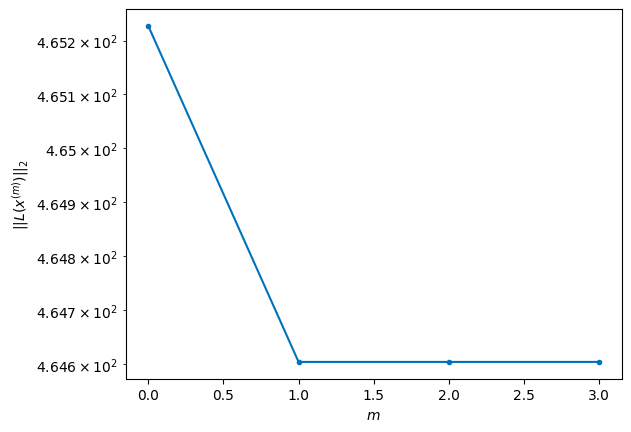

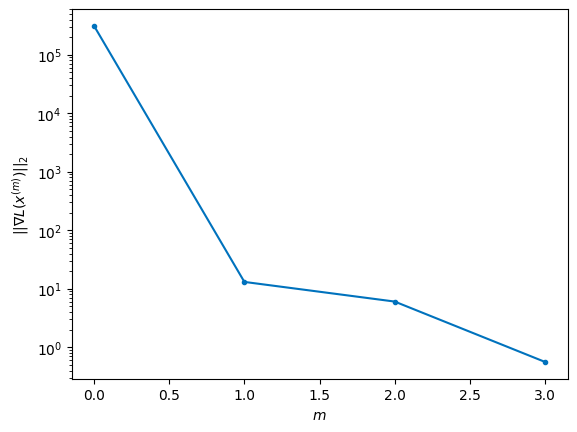


Windows:  90%|████████▉ | 265/296 [53:41<06:04, 11.75s/it]

Before applying the algorithm
Cost function: 469.1848864158272
Gradient norm: 109413.15296791038
Global relative error: 1903558479.0765355
Position relative errors: 0.02970542891408027 m, 4.8633683008697055 m, 4706.2482891521895 m, 7070.048669064218 m

Iteration 1
Cost function: 468.18649920503333 (-0.21%)
Gradient norm: 28.816103898966585 (-99.97%)
Global relative error: 8492.990452256976 (-0.00%)
Position relative errors: 0.023669396655221057 m, 4.55306812752989 m, 4706.070828850517 m, 7069.919333024212 m

Iteration 2
Cost function: 468.18649915717623 (-0.00%)
Gradient norm: 2.754866450298784 (-90.44%)
Global relative error: 8492.990508153272 (0.00%)
Position relative errors: 0.023669399803691458 m, 4.552744392475977 m, 4706.0707482953 m, 7069.919454001423 m

STOP on Iteration 3
Cost function = 468.18649936823635 (0.00%)
Gradient norm = 0.3509826599536889 (-87.26%)
Global relative error = 8492.99050818515 (0.00%)
Final position relative errors: 0.023669398458036176 m, 4.5527443738222

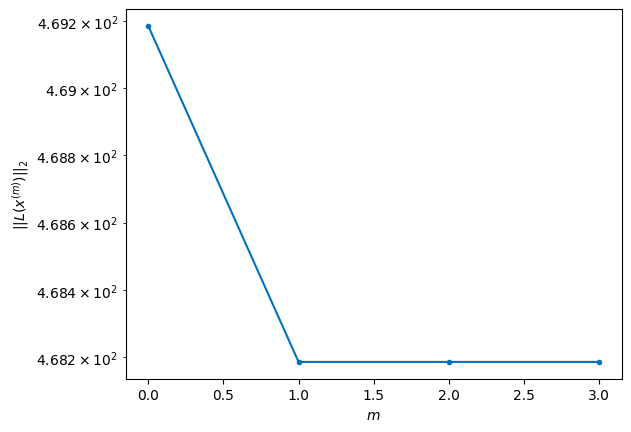

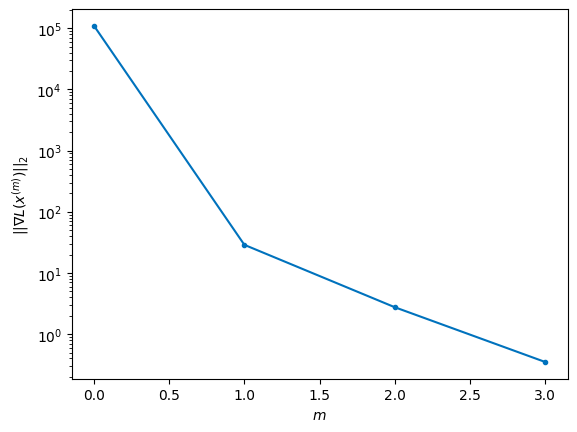


Windows:  90%|████████▉ | 266/296 [53:48<05:10, 10.35s/it]

Before applying the algorithm
Cost function: 466.6095152481605
Gradient norm: 120789.82218713504
Global relative error: 1902973851.4104195
Position relative errors: 0.02405568339374101 m, 5.523499974324706 m, 4627.577028137889 m, 6954.645459965798 m

Iteration 1
Cost function: 465.3110850590813 (-0.28%)
Gradient norm: 32.50969011606732 (-99.97%)
Global relative error: 8354.073896469841 (0.01%)
Position relative errors: 0.02260507609800569 m, 5.212809892326831 m, 4627.44173716917 m, 6955.379180425044 m

Iteration 2
Cost function: 465.31108486103955 (-0.00%)
Gradient norm: 1.6481505311103857 (-94.93%)
Global relative error: 8354.073838098095 (-0.00%)
Position relative errors: 0.022605076998416032 m, 5.212779511724064 m, 4627.4417377160835 m, 6955.379109973958 m

Iteration 3
Cost function: 465.31108511739683 (0.00%)
Gradient norm: 4.821957388646991 (192.57%)
Global relative error: 8354.07383815496 (0.00%)
Position relative errors: 0.02260507800207646 m, 5.212779499655569 m, 4627.441737717

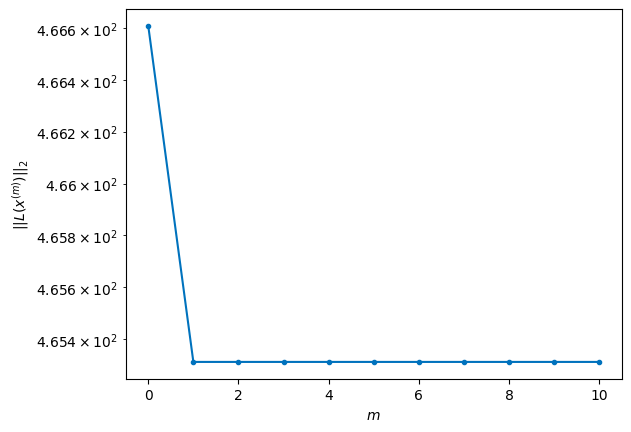

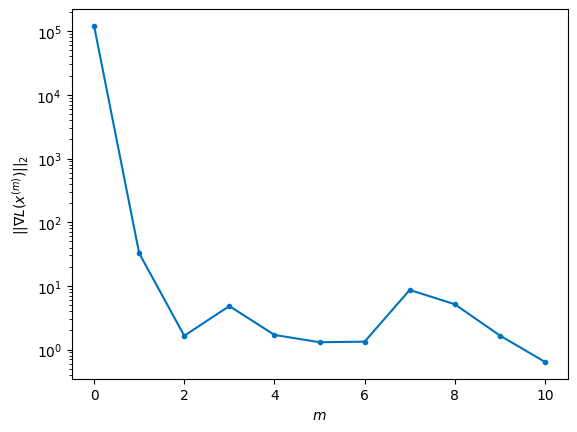


Windows:  90%|█████████ | 267/296 [54:07<06:16, 13.00s/it]

Before applying the algorithm
Cost function: 466.67604872340047
Gradient norm: 89691.85125333113
Global relative error: 1902377647.8318758
Position relative errors: 0.022964414317238658 m, 6.144695280653609 m, 4528.783207483643 m, 6809.717466857843 m

Iteration 1
Cost function: 466.350552075017 (-0.07%)
Gradient norm: 12.480041618899122 (-99.99%)
Global relative error: 8178.104897158306 (-0.00%)
Position relative errors: 0.022361168345405746 m, 6.81839526976219 m, 4528.927144973055 m, 6809.563986752978 m

Iteration 2
Cost function: 466.35055188540014 (-0.00%)
Gradient norm: 3.1094937679783157 (-75.08%)
Global relative error: 8178.104840354075 (-0.00%)
Position relative errors: 0.022361169052986234 m, 6.818208840993691 m, 4528.927060830222 m, 6809.563974681268 m

Iteration 3
Cost function: 466.35055212420764 (0.00%)
Gradient norm: 3.548518678148081 (14.12%)
Global relative error: 8178.10484030293 (-0.00%)
Position relative errors: 0.02236116910986595 m, 6.81820884977102 m, 4528.92706082

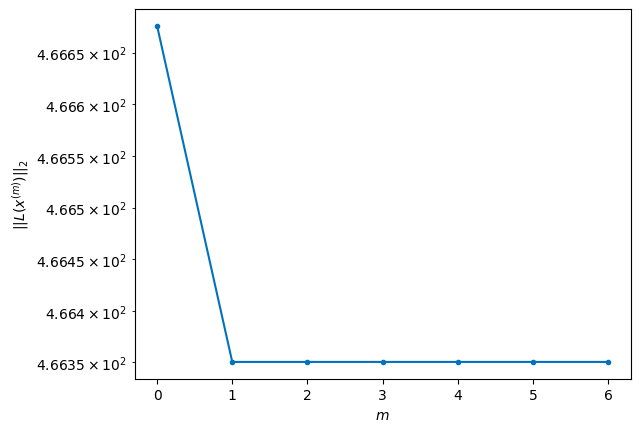

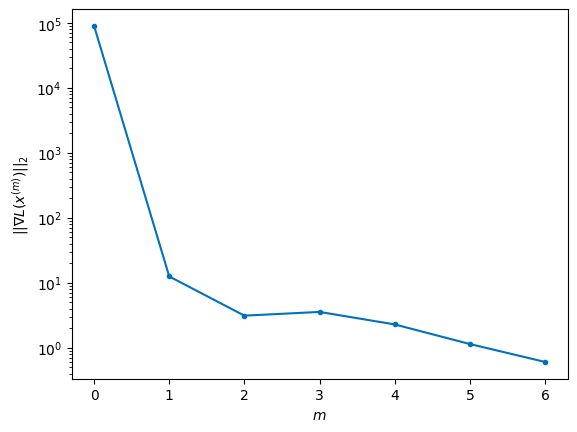


Windows:  91%|█████████ | 268/296 [54:20<06:03, 12.99s/it]

Before applying the algorithm
Cost function: 463.8456672304085
Gradient norm: 155778.12803015436
Global relative error: 1901772226.3029237
Position relative errors: 0.022703556493566698 m, 7.722592512780685 m, 4410.4934392906625 m, 6634.216194326749 m

Iteration 1
Cost function: 463.3796628450183 (-0.10%)
Gradient norm: 10.248795880088535 (-99.99%)
Global relative error: 7966.503478383294 (-0.00%)
Position relative errors: 0.022733954500809467 m, 8.13296482123127 m, 4410.242895278728 m, 6634.369189650183 m

Iteration 2
Cost function: 463.3796624262062 (-0.00%)
Gradient norm: 2.4396930028775756 (-76.20%)
Global relative error: 7966.5034171467605 (-0.00%)
Position relative errors: 0.022733957618248656 m, 8.132821293691974 m, 4410.242853767319 m, 6634.369143888737 m

STOP on Iteration 3
Cost function = 463.37966270833516 (0.00%)
Gradient norm = 0.7563374567974314 (-69.00%)
Global relative error = 7966.5034172044125 (0.00%)
Final position relative errors: 0.022733953717679337 m, 8.13282123

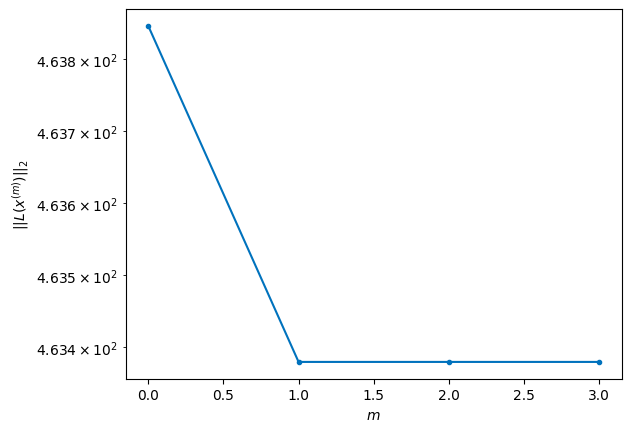

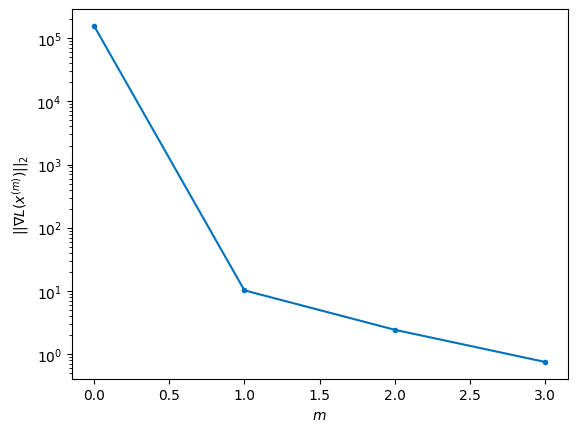


Windows:  91%|█████████ | 269/296 [54:28<05:10, 11.52s/it]

Before applying the algorithm
Cost function: 458.4365340008858
Gradient norm: 144638.9907972622
Global relative error: 1901159941.8994217
Position relative errors: 0.022596597920051528 m, 8.995584556543106 m, 4272.575717461435 m, 6430.06111554528 m

Iteration 1
Cost function: 457.7647018268712 (-0.15%)
Gradient norm: 13.474457516105545 (-99.99%)
Global relative error: 7720.423110514143 (0.00%)
Position relative errors: 0.0199765420890394 m, 8.843872800646885 m, 4272.031816533492 m, 6430.752652177493 m

Iteration 2
Cost function: 457.76470178313633 (-0.00%)
Gradient norm: 3.285200852759852 (-75.62%)
Global relative error: 7720.422937846378 (-0.00%)
Position relative errors: 0.019976542226130527 m, 8.84378130891725 m, 4272.03162977329 m, 6430.752569074736 m

Iteration 3
Cost function: 457.76470190535736 (0.00%)
Gradient norm: 1.2223051685174582 (-62.79%)
Global relative error: 7720.422937858017 (0.00%)
Position relative errors: 0.019976542932944503 m, 8.843781308875245 m, 4272.0316297701

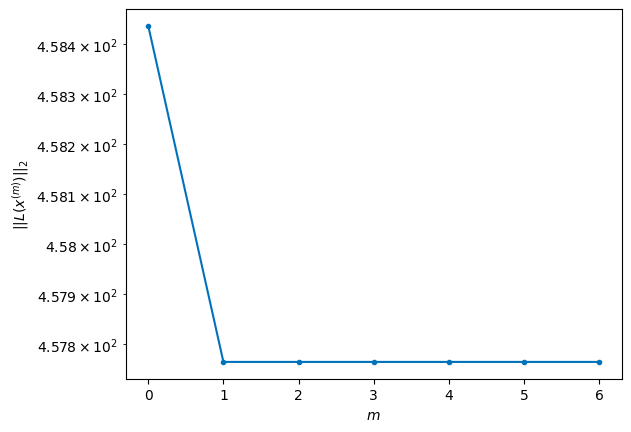

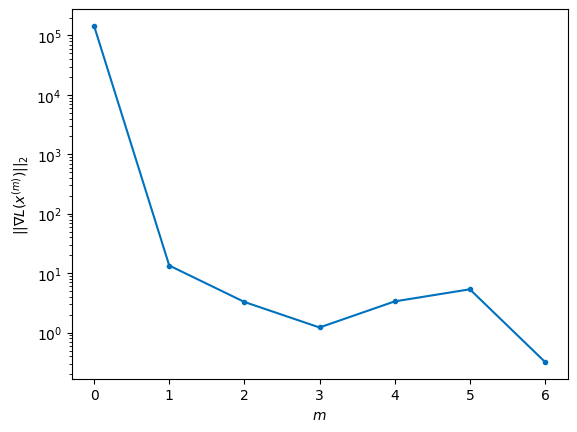


Windows:  91%|█████████ | 270/296 [54:40<05:01, 11.59s/it]

Before applying the algorithm
Cost function: 458.86838786214724
Gradient norm: 84078.74386060264
Global relative error: 1900543159.0054498
Position relative errors: 0.019907318663565193 m, 9.665286319686102 m, 4115.706725726973 m, 6198.350590034661 m

Iteration 1
Cost function: 458.4693303925747 (-0.09%)
Gradient norm: 6.8179653460969964 (-99.99%)
Global relative error: 7440.496422622328 (0.00%)
Position relative errors: 0.018971836054461847 m, 9.671191125363185 m, 4115.69604425805 m, 6198.541370956114 m

Iteration 2
Cost function: 458.4693302004739 (-0.00%)
Gradient norm: 1.7498599186171537 (-74.33%)
Global relative error: 7440.496415007934 (-0.00%)
Position relative errors: 0.018971836191707628 m, 9.671164725568945 m, 4115.696061278412 m, 6198.541350556123 m

Iteration 3
Cost function: 458.4693302236047 (0.00%)
Gradient norm: 4.774914107345364 (172.87%)
Global relative error: 7440.4964150630485 (0.00%)
Position relative errors: 0.018971835748296324 m, 9.671164691914333 m, 4115.696061

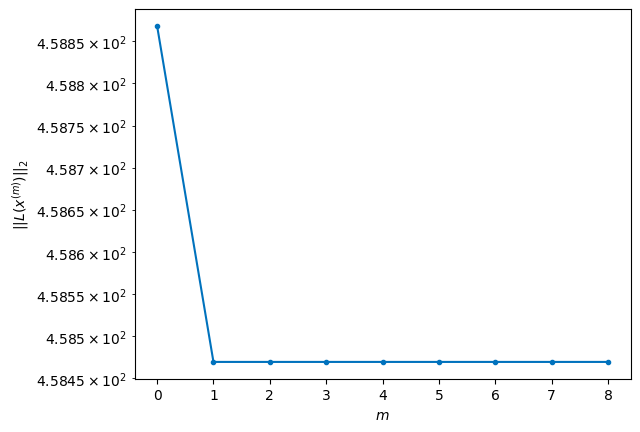

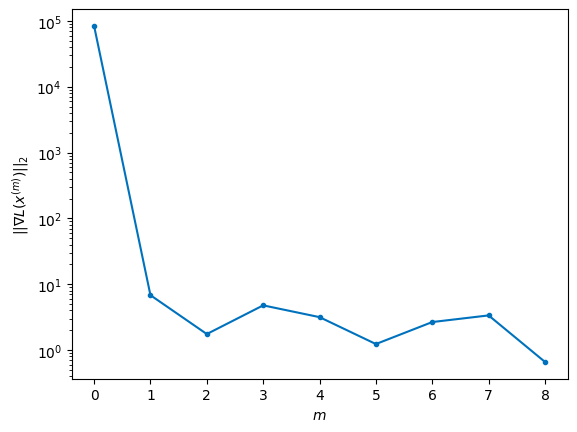


Windows:  92%|█████████▏| 271/296 [54:55<05:20, 12.80s/it]

Before applying the algorithm
Cost function: 465.4475870190727
Gradient norm: 153646.50752025138
Global relative error: 1899924243.1339235
Position relative errors: 0.019007203538565092 m, 10.4557904672087 m, 3941.368132426068 m, 5939.09955134034 m

Iteration 1
Cost function: 464.9091450991029 (-0.12%)
Gradient norm: 8.730196690424686 (-99.99%)
Global relative error: 7128.078596873321 (0.00%)
Position relative errors: 0.018534051668021606 m, 10.541402059486408 m, 3941.2591804210183 m, 5939.346722293747 m

Iteration 2
Cost function: 464.9091451090558 (0.00%)
Gradient norm: 1.052058167198102 (-87.95%)
Global relative error: 7128.078528410452 (-0.00%)
Position relative errors: 0.018534051104332917 m, 10.541383304628514 m, 3941.259187266027 m, 5939.346635619412 m

Iteration 3
Cost function: 464.9091451515112 (0.00%)
Gradient norm: 1.0309815984754236 (-2.00%)
Global relative error: 7128.078528374703 (-0.00%)
Position relative errors: 0.01853405145231445 m, 10.54138331033028 m, 3941.25918726

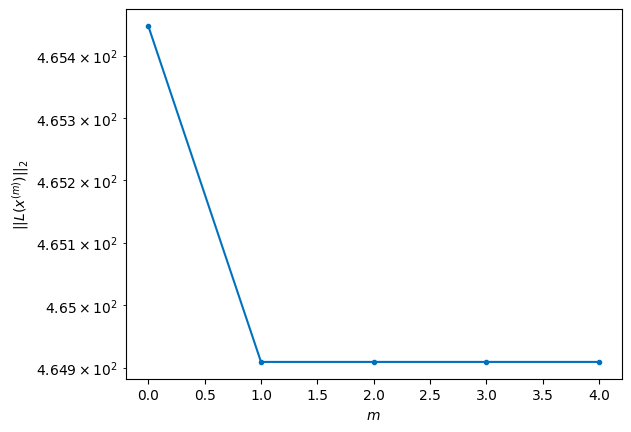

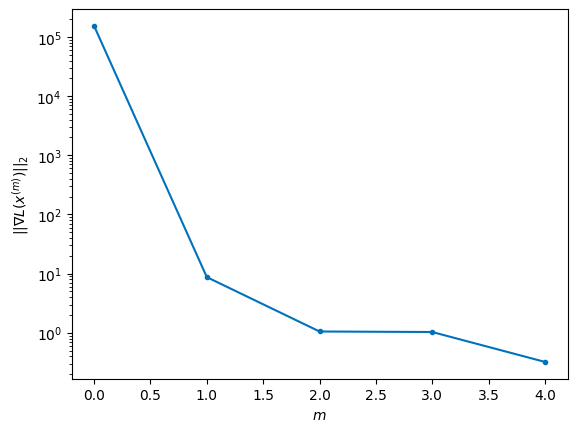


Windows:  92%|█████████▏| 272/296 [55:04<04:35, 11.47s/it]

Before applying the algorithm
Cost function: 467.24405273973804
Gradient norm: 175289.9206958149
Global relative error: 1899305539.7978141
Position relative errors: 0.018458394691178322 m, 11.279260737057616 m, 3749.716269741555 m, 5653.999730258337 m

Iteration 1
Cost function: 467.11586765778696 (-0.03%)
Gradient norm: 5.292446792219382 (-100.00%)
Global relative error: 6784.365497030718 (-0.00%)
Position relative errors: 0.015899173008740206 m, 11.159982171357608 m, 3749.592772339527 m, 5654.0259059074115 m

STOP on Iteration 2
Cost function = 467.11586766596935 (0.00%)
Gradient norm = 0.2908369837957632 (-94.50%)
Global relative error = 6784.365517300778 (0.00%)
Final position relative errors: 0.015899175129139576 m, 11.159934448408002 m, 3749.5927520711543 m, 5654.025943765468 m



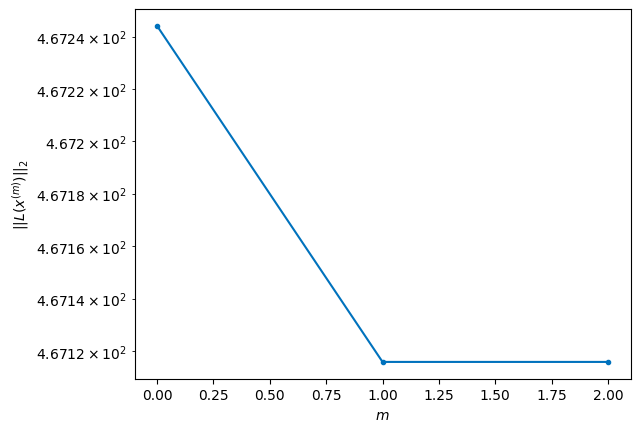

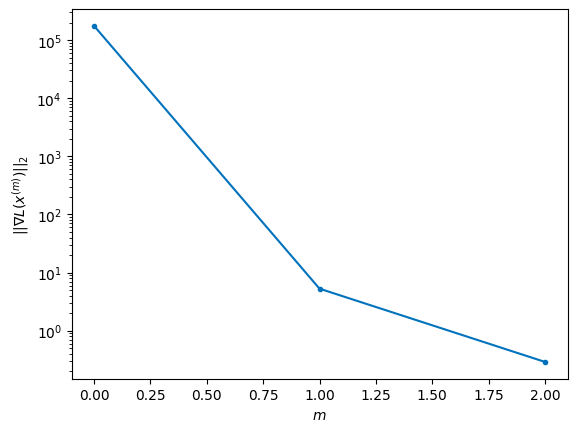


Windows:  92%|█████████▏| 273/296 [55:09<03:44,  9.75s/it]

Before applying the algorithm
Cost function: 469.7886753792555
Gradient norm: 296549.0456379457
Global relative error: 1898689395.4767044
Position relative errors: 0.01567745816213355 m, 11.832885908462114 m, 3541.659402637084 m, 5343.992134648986 m

Iteration 1
Cost function: 468.7977277308377 (-0.21%)
Gradient norm: 45.36254328472735 (-99.98%)
Global relative error: 6410.3148619749545 (-0.01%)
Position relative errors: 0.014616576899310318 m, 12.899835969862291 m, 3542.010830881153 m, 5342.85389765948 m

Iteration 2
Cost function: 468.7977275101795 (-0.00%)
Gradient norm: 2.273757719468283 (-94.99%)
Global relative error: 6410.314605116158 (-0.00%)
Position relative errors: 0.014616578275956993 m, 12.900014026845428 m, 3542.010682985215 m, 5342.85368709907 m

Iteration 3
Cost function: 468.79772774470433 (0.00%)
Gradient norm: 1.5973747080469 (-29.75%)
Global relative error: 6410.31460512295 (0.00%)
Position relative errors: 0.01461657634809889 m, 12.90001402495227 m, 3542.0106830172

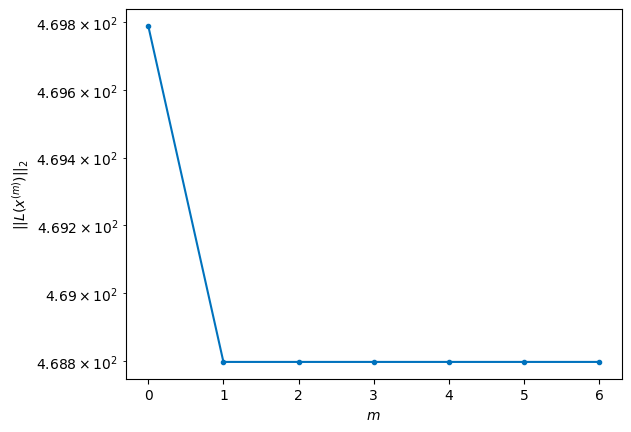

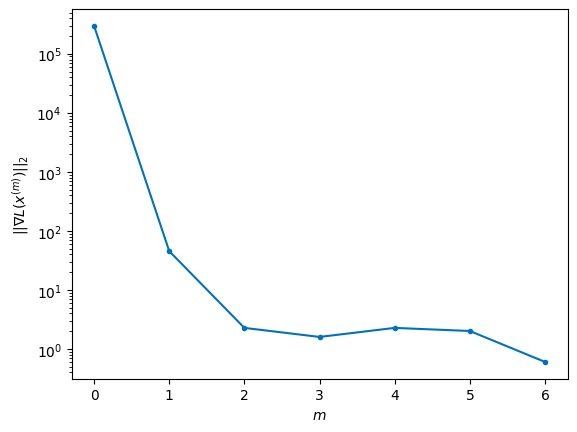


Windows:  93%|█████████▎| 274/296 [55:21<03:50, 10.46s/it]

Before applying the algorithm
Cost function: 467.1596745108355
Gradient norm: 200814.1356370835
Global relative error: 1898078136.7846987
Position relative errors: 0.014499752253252026 m, 13.534056447096706 m, 3318.5859182927557 m, 5009.497485288777 m

Iteration 1
Cost function: 466.7978278222367 (-0.08%)
Gradient norm: 3.3610200359103377 (-100.00%)
Global relative error: 6009.011351971507 (-0.00%)
Position relative errors: 0.02206324478863278 m, 13.6540439368397 m, 3318.5863721270944 m, 5009.487768163619 m

Iteration 2
Cost function: 466.79782788900474 (0.00%)
Gradient norm: 1.070202600256995 (-68.16%)
Global relative error: 6009.011383698034 (0.00%)
Position relative errors: 0.022063246085429918 m, 13.65397950443167 m, 3318.5863513831987 m, 5009.487820138083 m

STOP on Iteration 3
Cost function = 466.79782773834086 (-0.00%)
Gradient norm = 0.3324348870579198 (-68.94%)
Global relative error = 6009.011383664592 (-0.00%)
Final position relative errors: 0.022063244744172004 m, 13.6539795

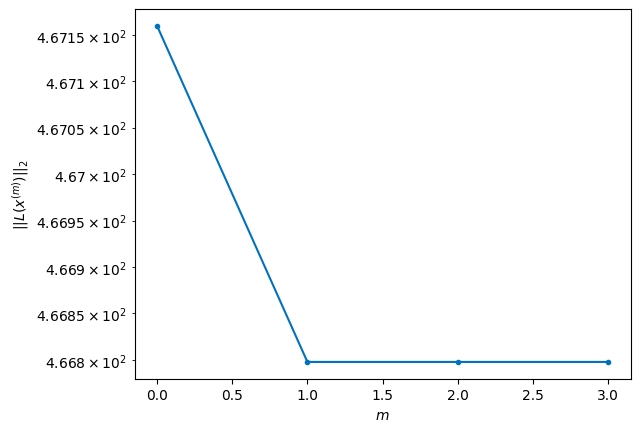

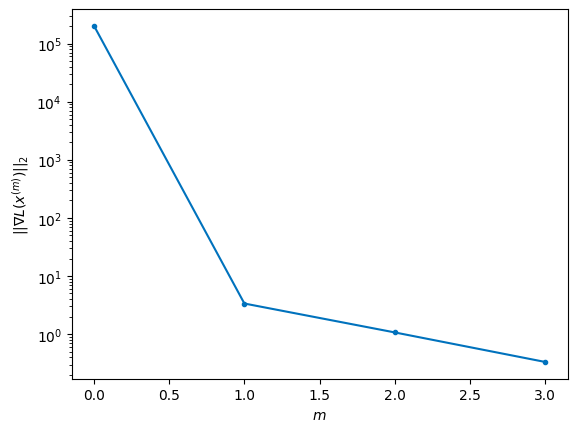


Windows:  93%|█████████▎| 275/296 [55:28<03:18,  9.44s/it]

Before applying the algorithm
Cost function: 469.49932429153336
Gradient norm: 229150.564439186
Global relative error: 1897474059.1099603
Position relative errors: 0.021866518670648163 m, 14.249657874641207 m, 3080.6510086903218 m, 4654.197578972204 m

Iteration 1
Cost function: 468.9880059735962 (-0.11%)
Gradient norm: 5.993927618936483 (-100.00%)
Global relative error: 5581.6314941852415 (0.00%)
Position relative errors: 0.02087288495096119 m, 13.95464182798295 m, 3080.229099694357 m, 4654.734180621226 m

STOP on Iteration 2
Cost function = 468.98800620477715 (0.00%)
Gradient norm = 0.9214572660803785 (-84.63%)
Global relative error = 5581.63141546703 (-0.00%)
Final position relative errors: 0.020872884644464372 m, 13.95453237189757 m, 3080.228998961012 m, 4654.734153215429 m



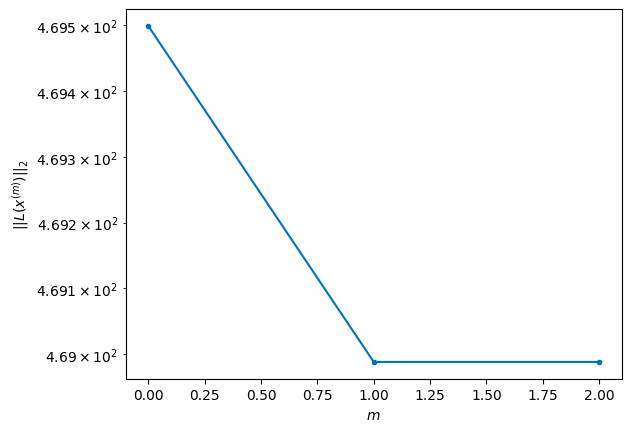

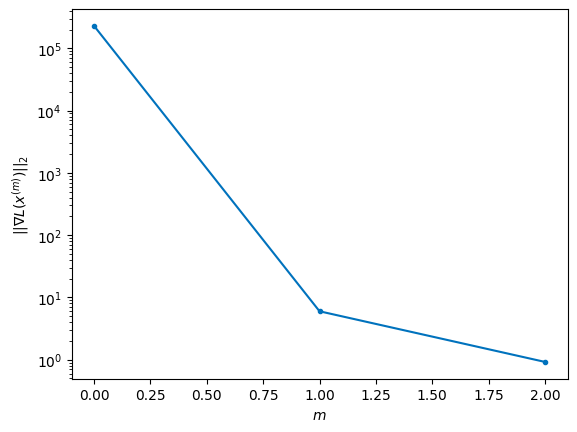


Windows:  93%|█████████▎| 276/296 [55:34<02:46,  8.31s/it]

Before applying the algorithm
Cost function: 466.72037544825633
Gradient norm: 129778.25706242809
Global relative error: 1896879458.749227
Position relative errors: 0.020425868286798342 m, 14.476328003355395 m, 2828.8086395649943 m, 4279.108818392745 m

Iteration 1
Cost function: 466.19813052982937 (-0.11%)
Gradient norm: 19.46036860392242 (-99.99%)
Global relative error: 5130.207045024572 (0.01%)
Position relative errors: 0.017513454987789837 m, 14.01938371627025 m, 2828.39807402283 m, 4280.062198189914 m

Iteration 2
Cost function: 466.1981308291475 (0.00%)
Gradient norm: 4.901382309967827 (-74.81%)
Global relative error: 5130.206857636862 (-0.00%)
Position relative errors: 0.017513449564196013 m, 14.019338837450118 m, 2828.3979845241593 m, 4280.062032872033 m

STOP on Iteration 3
Cost function = 466.1981306663217 (-0.00%)
Gradient norm = 0.26518794399784273 (-94.59%)
Global relative error = 5130.206857645514 (0.00%)
Final position relative errors: 0.01751345182193293 m, 14.019338847

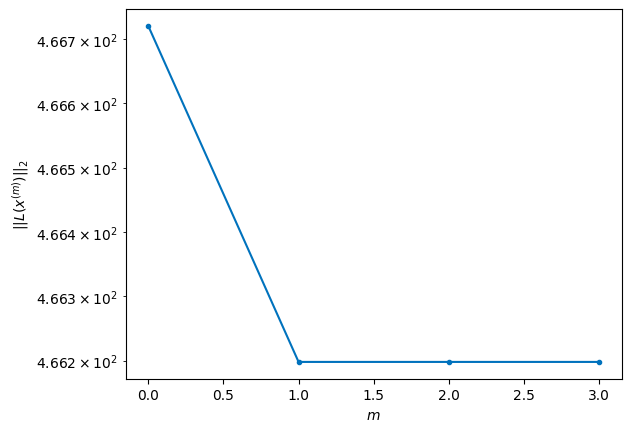

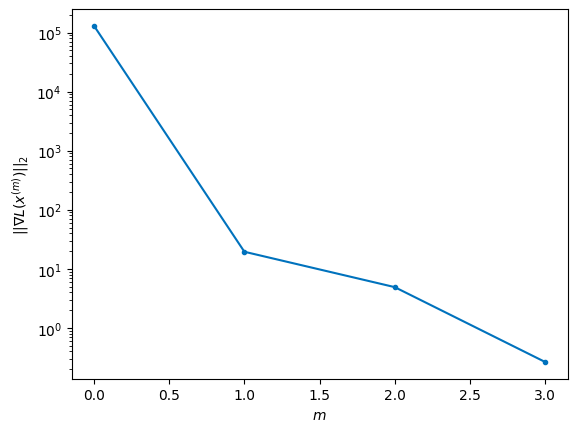


Windows:  94%|█████████▎| 277/296 [55:41<02:31,  7.99s/it]

Before applying the algorithm
Cost function: 466.8988049944764
Gradient norm: 149879.165236125
Global relative error: 1896296587.2545109
Position relative errors: 0.01727453373242947 m, 14.48482540249627 m, 2564.5866028174437 m, 3885.6991285027584 m

Iteration 1
Cost function: 466.0478374209889 (-0.18%)
Gradient norm: 12.091915095096322 (-99.99%)
Global relative error: 4655.709224848877 (-0.00%)
Position relative errors: 0.019672121274221934 m, 15.017359937804876 m, 2565.272195808149 m, 3885.191898875271 m

STOP on Iteration 2
Cost function = 466.0478370377258 (-0.00%)
Gradient norm = 0.33770034990836506 (-97.21%)
Global relative error = 4655.709190341187 (-0.00%)
Final position relative errors: 0.01967212177631848 m, 15.017249825043415 m, 2565.2719316304288 m, 3885.192032377916 m



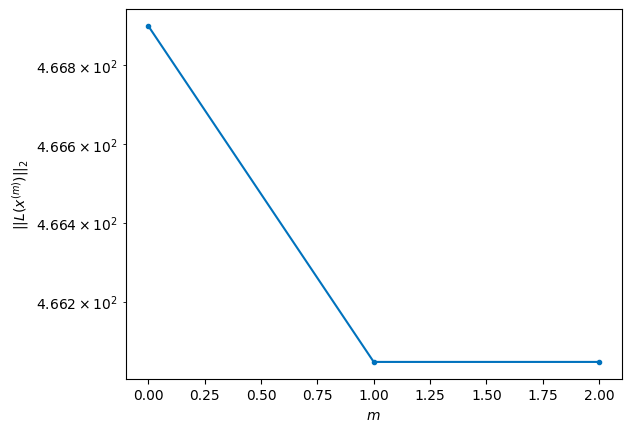

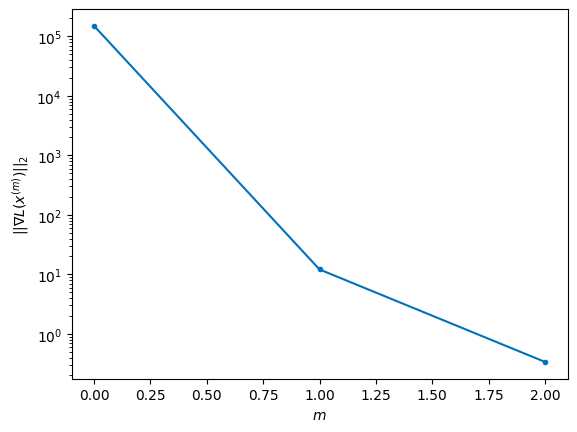


Windows:  94%|█████████▍| 278/296 [55:47<02:10,  7.23s/it]

Before applying the algorithm
Cost function: 465.46419734191653
Gradient norm: 86795.46110984498
Global relative error: 1895727680.8667002
Position relative errors: 0.019654472929017796 m, 15.429542582110436 m, 2290.234912668264 m, 3473.8535951696344 m

Iteration 1
Cost function: 464.2821436872782 (-0.25%)
Gradient norm: 44.402752987347625 (-99.95%)
Global relative error: 4160.154959815303 (-0.02%)
Position relative errors: 0.017079007401524855 m, 16.535192082687505 m, 2290.8924042796875 m, 3472.5145391358005 m

STOP on Iteration 2
Cost function = 464.282143822579 (0.00%)
Gradient norm = 0.9693356209773647 (-97.82%)
Global relative error = 4160.1547777108835 (-0.00%)
Final position relative errors: 0.01707900638938508 m, 16.534992902209996 m, 2290.8921405310753 m, 3472.5144959187237 m



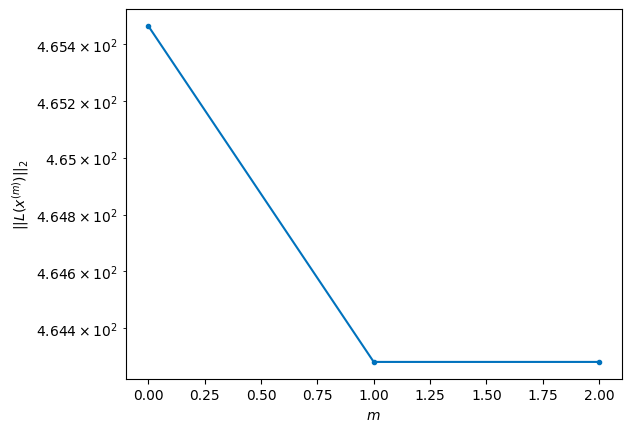

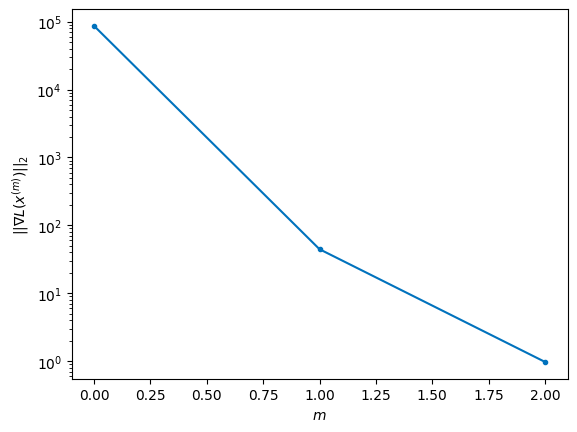


Windows:  94%|█████████▍| 279/296 [55:53<01:54,  6.76s/it]

Before applying the algorithm
Cost function: 463.6589149599512
Gradient norm: 42652.90846363341
Global relative error: 1895174930.756395
Position relative errors: 0.016935209014324246 m, 16.876918267443358 m, 2005.8222789476006 m, 3045.9628548552037 m

Iteration 1
Cost function: 463.07678346168353 (-0.13%)
Gradient norm: 16.286645359451246 (-99.96%)
Global relative error: 3646.4352970707564 (-0.02%)
Position relative errors: 0.021822881625654603 m, 17.3482858729622 m, 2005.755817414479 m, 3045.169534638389 m

Iteration 2
Cost function: 463.0767837697762 (0.00%)
Gradient norm: 2.98638899043392 (-81.66%)
Global relative error: 3646.4350985394626 (-0.00%)
Position relative errors: 0.021822877107960097 m, 17.348516593303504 m, 2005.7558618840221 m, 3045.169266302126 m

Iteration 3
Cost function: 463.07678350208323 (-0.00%)
Gradient norm: 1.3121143486681854 (-56.06%)
Global relative error: 3646.435098554551 (0.00%)
Position relative errors: 0.021822884271024932 m, 17.34851656702238 m, 2005.

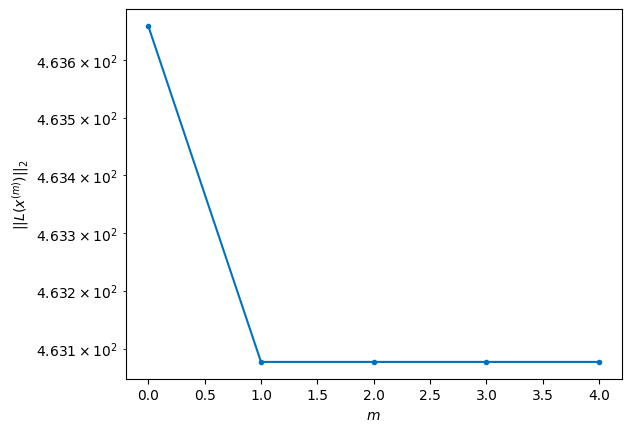

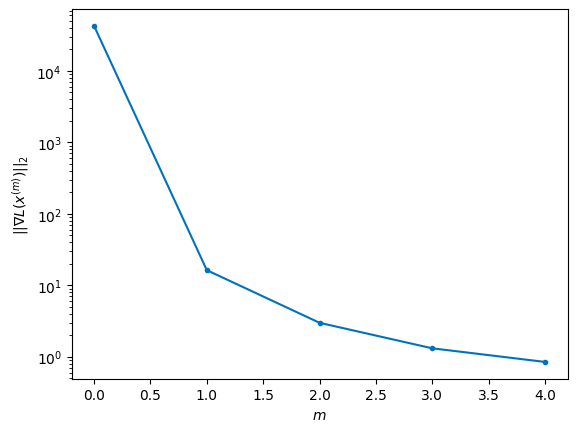


Windows:  95%|█████████▍| 280/296 [56:01<01:56,  7.27s/it]

Before applying the algorithm
Cost function: 459.923161133252
Gradient norm: 126477.23078334864
Global relative error: 1894640471.5821924
Position relative errors: 0.020871241589827942 m, 17.632918091335476 m, 1711.911487609934 m, 2605.272060023626 m

Iteration 1
Cost function: 459.31697548530934 (-0.13%)
Gradient norm: 12.68094866189831 (-99.99%)
Global relative error: 3117.2005373731495 (-0.01%)
Position relative errors: 0.013809773604984876 m, 17.777510381825255 m, 1712.4407861526445 m, 2604.628540968741 m

Iteration 2
Cost function: 459.316975650173 (0.00%)
Gradient norm: 8.749325960361586 (-31.00%)
Global relative error: 3117.200524083442 (-0.00%)
Position relative errors: 0.013809771921332157 m, 17.777336527416292 m, 1712.4406301153301 m, 2604.6286288385654 m

STOP on Iteration 3
Cost function = 459.31697564176096 (-0.00%)
Gradient norm = 0.20390526134445425 (-97.67%)
Global relative error = 3117.2005240676704 (-0.00%)
Final position relative errors: 0.013809778414156065 m, 17.77

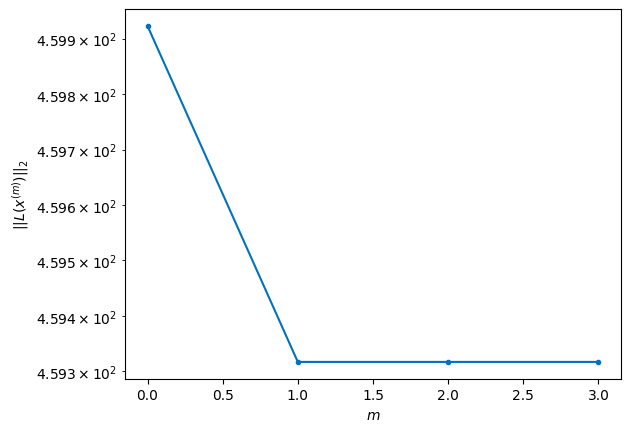

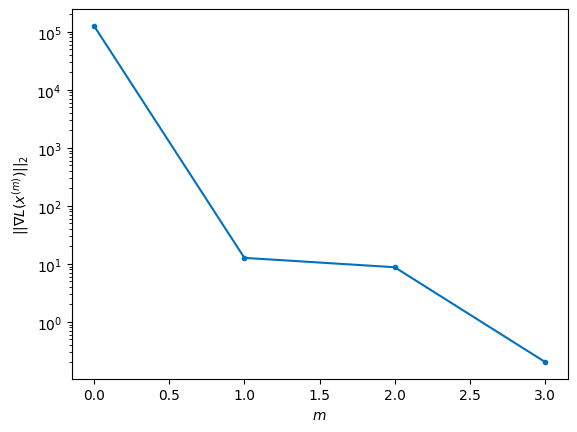


Windows:  95%|█████████▍| 281/296 [56:08<01:46,  7.13s/it]

Before applying the algorithm
Cost function: 460.87329129892464
Gradient norm: 105044.33022773471
Global relative error: 1894126431.3938975
Position relative errors: 0.013492407829277575 m, 17.968779329785754 m, 1411.0972188283936 m, 2153.3432028295283 m

Iteration 1
Cost function: 460.12092355255794 (-0.16%)
Gradient norm: 37.56632109850363 (-99.96%)
Global relative error: 2573.5189294419692 (-0.04%)
Position relative errors: 0.014079007940371294 m, 18.466052846072767 m, 1410.9407734874355 m, 2152.1666278454545 m

Iteration 2
Cost function: 460.12092337538775 (-0.00%)
Gradient norm: 3.13533026729982 (-91.65%)
Global relative error: 2573.5187484613657 (-0.00%)
Position relative errors: 0.014078999505463003 m, 18.466274368357702 m, 1410.9407754868423 m, 2152.166408220528 m

Iteration 3
Cost function: 460.1209236020882 (0.00%)
Gradient norm: 1.4692210896978404 (-53.14%)
Global relative error: 2573.5187484448716 (-0.00%)
Position relative errors: 0.014078999140245557 m, 18.466274378311738

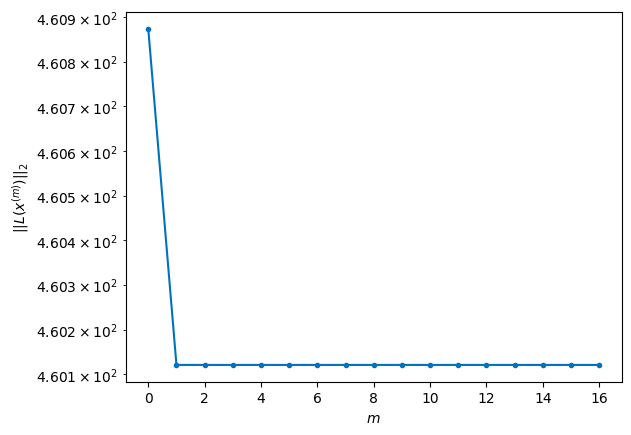

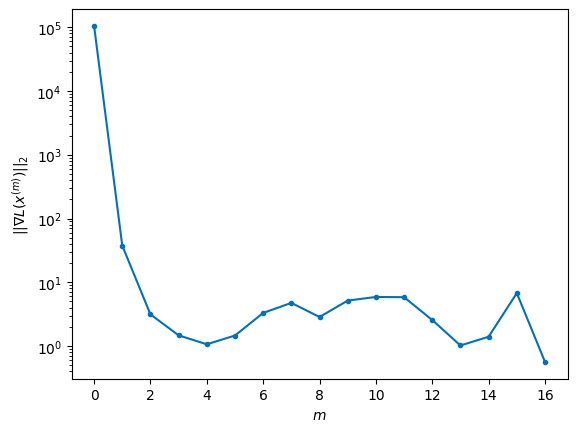


Windows:  95%|█████████▌| 282/296 [56:36<03:06, 13.35s/it]

Before applying the algorithm
Cost function: 455.72680948674014
Gradient norm: 191393.50912702273
Global relative error: 1893634857.2766504
Position relative errors: 0.01373698544771893 m, 18.58554593115037 m, 1103.4104214086967 m, 1691.4639513689601 m

Iteration 1
Cost function: 454.6068657994311 (-0.25%)
Gradient norm: 30.594322365998984 (-99.98%)
Global relative error: 2019.0022930971859 (-0.03%)
Position relative errors: 0.011573188113050225 m, 19.310398224422883 m, 1104.301955811581 m, 1690.0969881358792 m

Iteration 2
Cost function: 454.606865403811 (-0.00%)
Gradient norm: 7.209215624768237 (-76.44%)
Global relative error: 2019.001822861991 (-0.00%)
Position relative errors: 0.011573187296678509 m, 19.310820457687004 m, 1104.3019633239762 m, 1690.0964166552158 m

Iteration 3
Cost function: 454.6068656133782 (0.00%)
Gradient norm: 6.00114105786169 (-16.76%)
Global relative error: 2019.0018228467018 (-0.00%)
Position relative errors: 0.01157317710923572 m, 19.310820472079822 m, 110

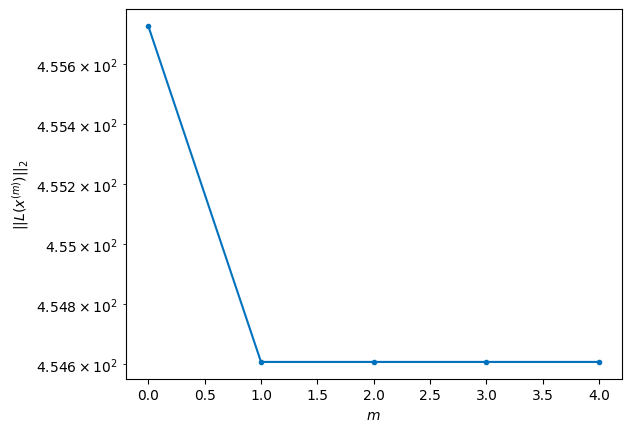

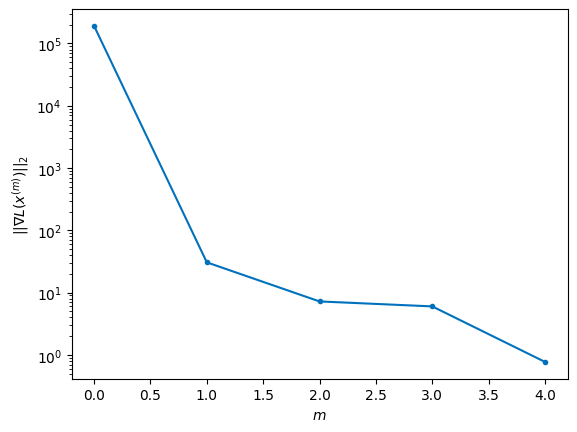


Windows:  96%|█████████▌| 283/296 [56:44<02:34, 11.87s/it]

Before applying the algorithm
Cost function: 453.4761214480463
Gradient norm: 356675.2465999049
Global relative error: 1893167763.8827627
Position relative errors: 0.0114430818114576 m, 19.371598644244113 m, 791.945978849084 m, 1221.951182411299 m

Iteration 1
Cost function: 452.3801487362714 (-0.24%)
Gradient norm: 24.854597639410102 (-99.99%)
Global relative error: 1455.9447463993067 (-0.02%)
Position relative errors: 0.009364149974666806 m, 18.673714303642363 m, 792.1221828796779 m, 1221.425286622585 m

Iteration 2
Cost function: 452.3801485722674 (-0.00%)
Gradient norm: 2.6012879950994603 (-89.53%)
Global relative error: 1455.9445835927056 (-0.00%)
Position relative errors: 0.009364151107349521 m, 18.67352826508858 m, 792.122137779983 m, 1221.4251246472945 m

Iteration 3
Cost function: 452.38014870059425 (0.00%)
Gradient norm: 5.466162707887363 (110.13%)
Global relative error: 1455.9445835841695 (-0.00%)
Position relative errors: 0.009364149347368641 m, 18.673528258136937 m, 792.12

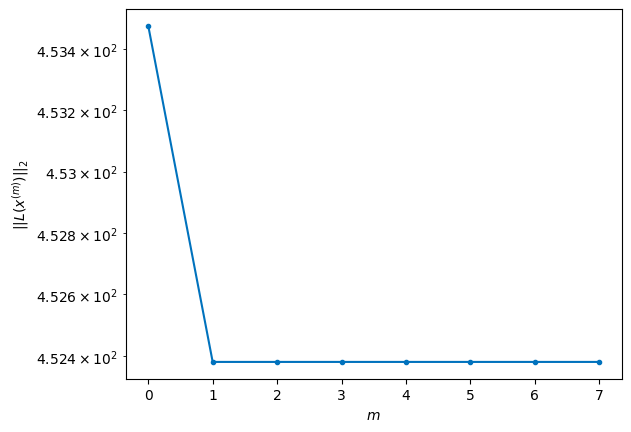

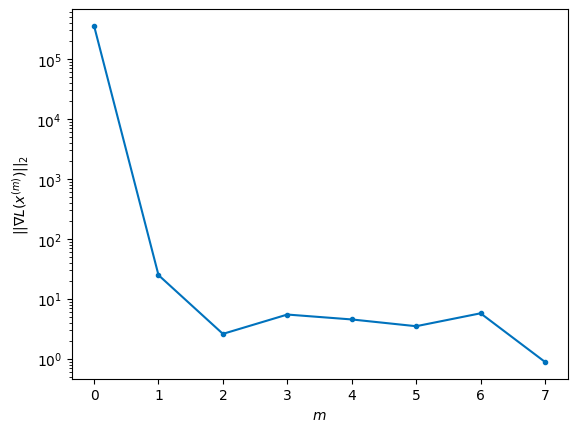


Windows:  96%|█████████▌| 284/296 [56:58<02:28, 12.34s/it]

Before applying the algorithm
Cost function: 445.7174206757461
Gradient norm: 87579.28273648355
Global relative error: 1892727076.1163974
Position relative errors: 0.00920849816280263 m, 18.658983362191062 m, 476.31560116884015 m, 747.9010982909138 m

Iteration 1
Cost function: 444.93157492677517 (-0.18%)
Gradient norm: 26.732993923945397 (-99.97%)
Global relative error: 887.0062929480196 (0.01%)
Position relative errors: 0.010190564332380527 m, 17.87702291994225 m, 476.4397426883197 m, 747.9137750065091 m

Iteration 2
Cost function: 444.93157477074914 (-0.00%)
Gradient norm: 4.9177894372057995 (-81.60%)
Global relative error: 887.0058656007217 (-0.00%)
Position relative errors: 0.010190557801652015 m, 17.87785051224212 m, 476.43991206916905 m, 747.9131404984099 m

Iteration 3
Cost function: 444.93157525616397 (0.00%)
Gradient norm: 7.666286504681368 (55.89%)
Global relative error: 887.0058655657285 (-0.00%)
Position relative errors: 0.010190555773878441 m, 17.877850514015506 m, 476.43

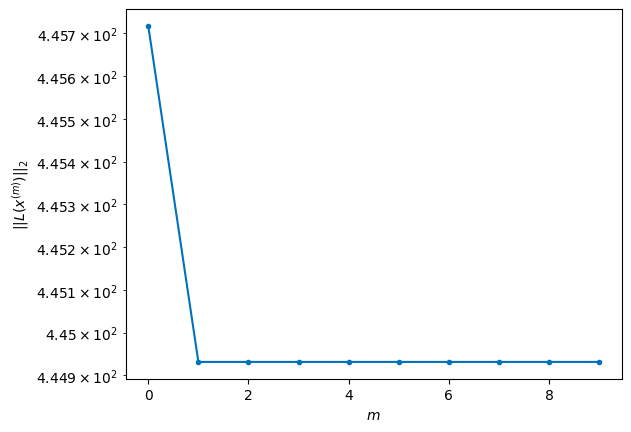

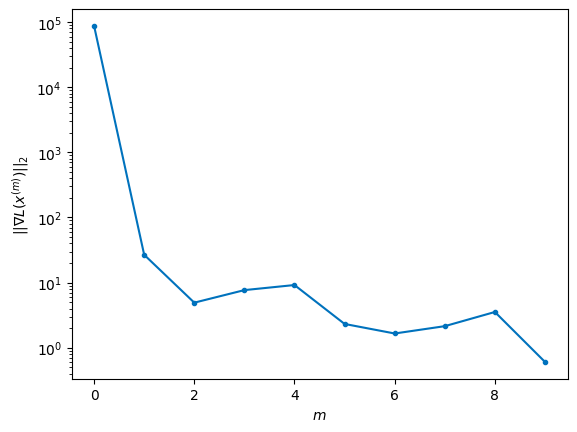


Windows:  96%|█████████▋| 285/296 [57:14<02:30, 13.70s/it]

Before applying the algorithm
Cost function: 446.77784474940796
Gradient norm: 84501.69571438733
Global relative error: 1892314674.1849277
Position relative errors: 0.010453547982782675 m, 17.75430377273598 m, 158.5592633338763 m, 271.1233631027104 m

Iteration 1
Cost function: 446.28051951438414 (-0.11%)
Gradient norm: 8.91098626806469 (-99.99%)
Global relative error: 314.479056777474 (-0.08%)
Position relative errors: 0.010643360577601109 m, 17.93074115928366 m, 158.2195107316369 m, 271.0176626667105 m

Iteration 2
Cost function: 446.2805194754824 (-0.00%)
Gradient norm: 1.851156499515621 (-79.23%)
Global relative error: 314.4790350315921 (-0.00%)
Position relative errors: 0.010643360075272255 m, 17.930711092400205 m, 158.21950184455864 m, 271.0176446108762 m

Iteration 3
Cost function: 446.2805194953861 (0.00%)
Gradient norm: 2.870878205846633 (55.09%)
Global relative error: 314.47903501273925 (-0.00%)
Position relative errors: 0.010643361576325689 m, 17.93071110969804 m, 158.219501

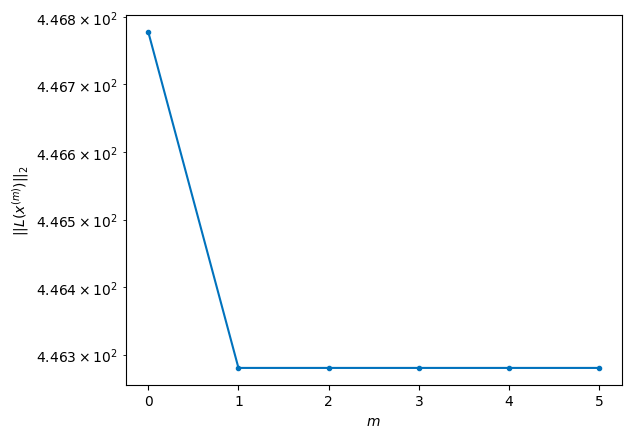

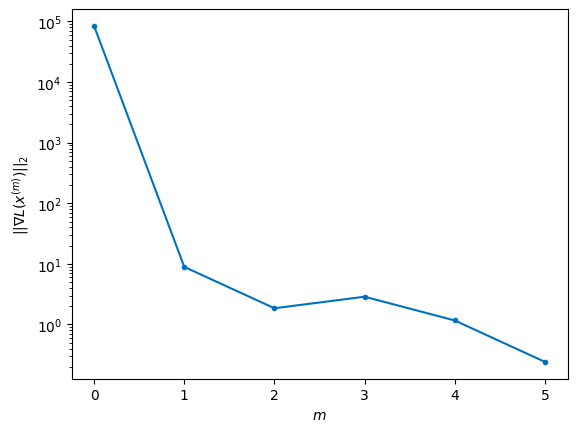


Windows:  97%|█████████▋| 286/296 [57:25<02:06, 12.69s/it]

Before applying the algorithm
Cost function: 450.7570792160774
Gradient norm: 166842.5875189322
Global relative error: 1891932350.4737453
Position relative errors: 0.01136048764126735 m, 17.741256302571287 m, 160.35221468844136 m, 207.01854396926075 m

Iteration 1
Cost function: 449.5755021188224 (-0.26%)
Gradient norm: 61.458177785705054 (-99.96%)
Global relative error: 261.4747127381131 (-0.44%)
Position relative errors: 0.012853117265993289 m, 16.548108480905782 m, 160.41267161545807 m, 205.5999817030564 m

STOP on Iteration 2
Cost function = 449.57550204231507 (-0.00%)
Gradient norm = 0.5330172981274632 (-99.13%)
Global relative error = 261.4746796441211 (-0.00%)
Final position relative errors: 0.012853117864435468 m, 16.548010040287387 m, 160.4128183841643 m, 205.5998330141337 m



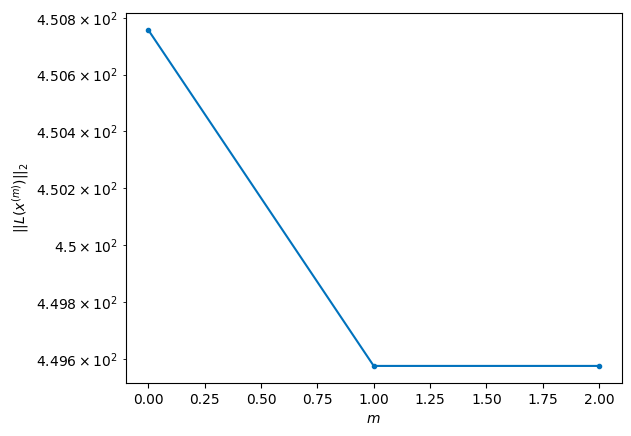

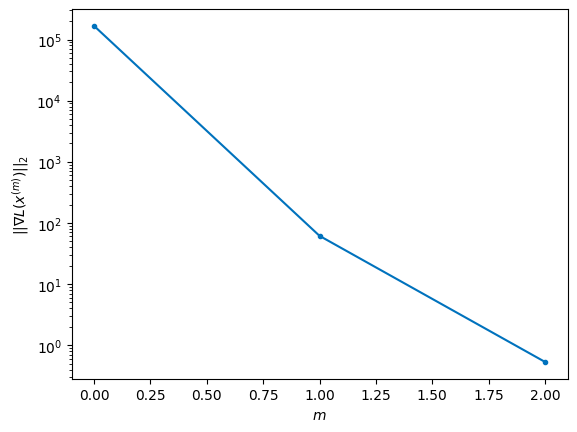


Windows:  97%|█████████▋| 287/296 [57:30<01:35, 10.57s/it]

Before applying the algorithm
Cost function: 442.99214332601974
Gradient norm: 107848.42639646128
Global relative error: 1891581817.3212845
Position relative errors: 0.014054363606766752 m, 16.273057748293105 m, 478.24484203129043 m, 682.7047377728362 m

Iteration 1
Cost function: 442.290469727049 (-0.16%)
Gradient norm: 27.61406657781904 (-99.97%)
Global relative error: 834.4068472784118 (0.08%)
Position relative errors: 0.014026459499107965 m, 16.517499126623907 m, 478.37836842474724 m, 683.3924438896597 m

Iteration 2
Cost function: 442.29046984802216 (0.00%)
Gradient norm: 3.7317767921946783 (-86.49%)
Global relative error: 834.4071022242515 (0.00%)
Position relative errors: 0.014026457829735588 m, 16.51766208543187 m, 478.3783552864166 m, 683.3927604310733 m

Iteration 3
Cost function: 442.2904697406658 (-0.00%)
Gradient norm: 3.9263466281812502 (5.21%)
Global relative error: 834.4071022459377 (0.00%)
Position relative errors: 0.014026460075303176 m, 16.51766207321043 m, 478.37835

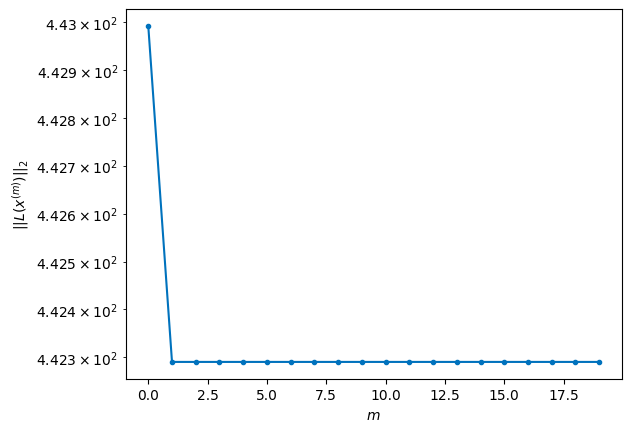

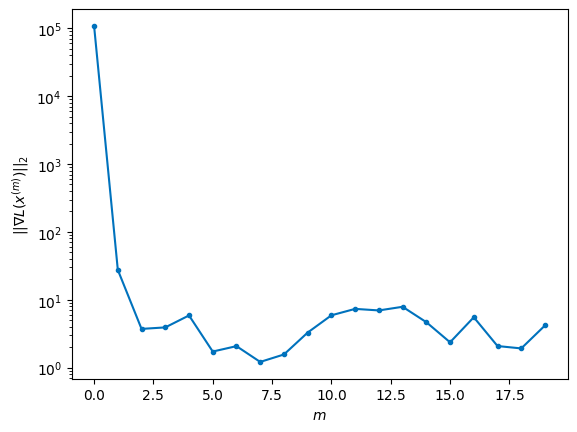


Windows:  97%|█████████▋| 288/296 [58:04<02:19, 17.48s/it]

Before applying the algorithm
Cost function: 443.6979356891586
Gradient norm: 208516.77886559052
Global relative error: 1891264702.3674076
Position relative errors: 0.0152335946191333 m, 16.188734461499784 m, 794.1287286509923 m, 1157.5723900992998 m

Iteration 1
Cost function: 443.3610854463011 (-0.08%)
Gradient norm: 11.353442131167919 (-99.99%)
Global relative error: 1404.198926521752 (0.02%)
Position relative errors: 0.015331593199296235 m, 16.75272510071055 m, 794.2840019561072 m, 1157.8072284372386 m

Iteration 2
Cost function: 443.36108564600715 (0.00%)
Gradient norm: 1.5165880912624636 (-86.64%)
Global relative error: 1404.1987887727707 (-0.00%)
Position relative errors: 0.015331594069658921 m, 16.752467089949786 m, 794.2841044106938 m, 1157.806994820834 m

Iteration 3
Cost function: 443.361085471545 (-0.00%)
Gradient norm: 2.0891546107543206 (37.75%)
Global relative error: 1404.1987887855853 (0.00%)
Position relative errors: 0.015331593144908192 m, 16.752467079649474 m, 794.28

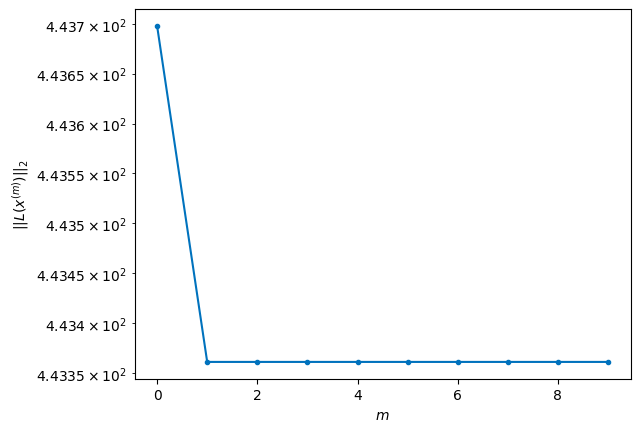

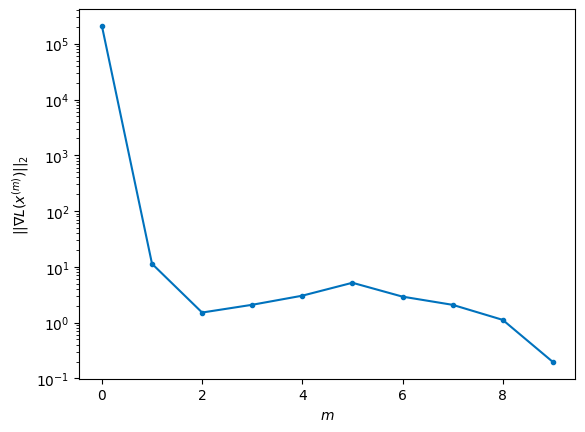


Windows:  98%|█████████▊| 289/296 [58:21<02:01, 17.35s/it]

Before applying the algorithm
Cost function: 443.77719702039195
Gradient norm: 133645.13471312274
Global relative error: 1890982513.726017
Position relative errors: 0.01642076837345565 m, 16.342588363764566 m, 1106.576844379811 m, 1626.9258412059196 m

Iteration 1
Cost function: 443.6515190251456 (-0.03%)
Gradient norm: 6.5289231557555025 (-100.00%)
Global relative error: 1967.7559663853679 (0.00%)
Position relative errors: 0.01898312558233129 m, 16.449607357529732 m, 1106.6934109047993 m, 1626.9405785803265 m

Iteration 2
Cost function: 443.65151927028944 (0.00%)
Gradient norm: 3.684555599164325 (-43.57%)
Global relative error: 1967.7559515136272 (-0.00%)
Position relative errors: 0.01898312295856494 m, 16.449587703591263 m, 1106.693406261697 m, 1626.9405639503138 m

STOP on Iteration 3
Cost function = 443.65151929347275 (0.00%)
Gradient norm = 0.169142845120233 (-95.41%)
Global relative error = 1967.7559515081534 (-0.00%)
Final position relative errors: 0.01898312659542216 m, 16.4495

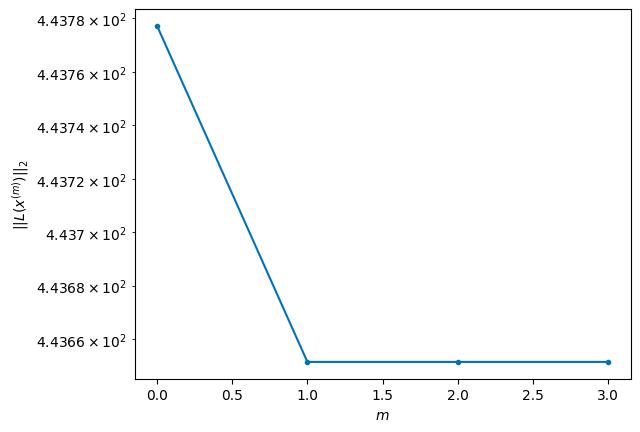

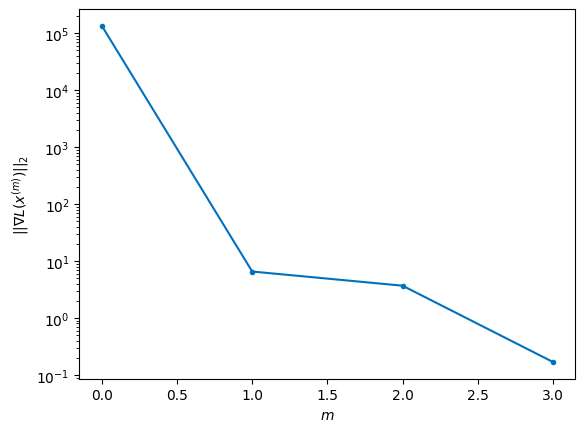


Windows:  98%|█████████▊| 290/296 [58:28<01:25, 14.27s/it]

Before applying the algorithm
Cost function: 445.71691167386086
Gradient norm: 150868.09104528776
Global relative error: 1890736660.9329658
Position relative errors: 0.0201870784833562 m, 15.962699362659142 m, 1414.1348349979296 m, 2088.9260218920745 m

Iteration 1
Cost function: 444.96791808738607 (-0.17%)
Gradient norm: 27.379603069715046 (-99.98%)
Global relative error: 2521.707204732696 (-0.04%)
Position relative errors: 0.029815709055023877 m, 15.334259604925808 m, 1414.1779638184387 m, 2087.7712535862124 m

Iteration 2
Cost function: 444.96791809302914 (0.00%)
Gradient norm: 3.1954319897776884 (-88.33%)
Global relative error: 2521.707032341674 (-0.00%)
Position relative errors: 0.029815709923397715 m, 15.334298009365709 m, 1414.1779397332568 m, 2087.771061396582 m

Iteration 3
Cost function: 444.9679179719697 (-0.00%)
Gradient norm: 2.4046391665788387 (-24.75%)
Global relative error: 2521.7070323522066 (0.00%)
Position relative errors: 0.029815709665505192 m, 15.33429800799717 m,

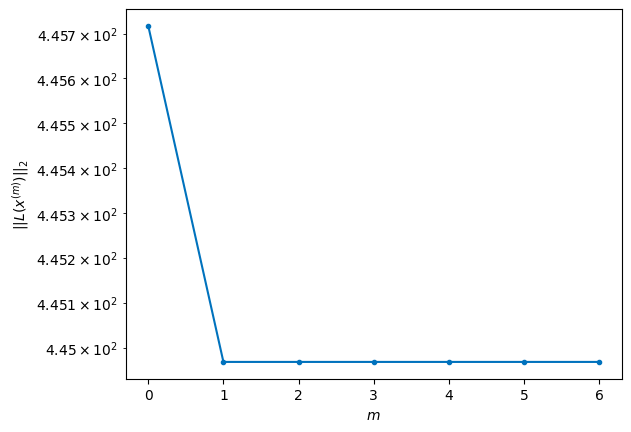

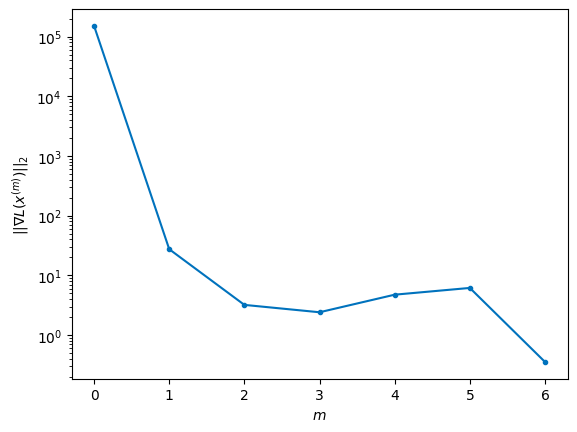


Windows:  98%|█████████▊| 291/296 [58:40<01:08, 13.62s/it]

Before applying the algorithm
Cost function: 447.13110580537574
Gradient norm: 87652.06028555005
Global relative error: 1890528429.328592
Position relative errors: 0.030629279240378213 m, 14.76577784125194 m, 1715.4307157894352 m, 2540.5967891991254 m

Iteration 1
Cost function: 446.5195955077705 (-0.14%)
Gradient norm: 22.915245162748523 (-99.97%)
Global relative error: 3064.896262371458 (-0.02%)
Position relative errors: 0.025118757192730032 m, 14.063746348640493 m, 1715.9563753096447 m, 2539.44969657999 m

Iteration 2
Cost function: 446.51959560606673 (0.00%)
Gradient norm: 2.5566176246781804 (-88.84%)
Global relative error: 3064.89599639675 (-0.00%)
Position relative errors: 0.025118755538142107 m, 14.063505339556007 m, 1715.9563961524077 m, 2539.4493628222485 m

STOP on Iteration 3
Cost function = 446.5195955603478 (-0.00%)
Gradient norm = 0.5592105436139152 (-78.13%)
Global relative error = 3064.895996394551 (-0.00%)
Final position relative errors: 0.025118754778231635 m, 14.0635

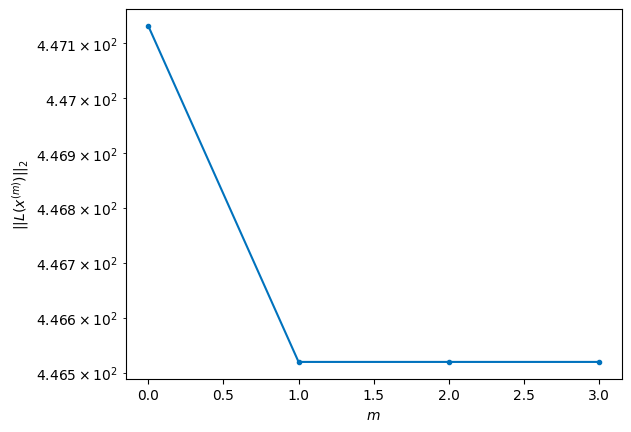

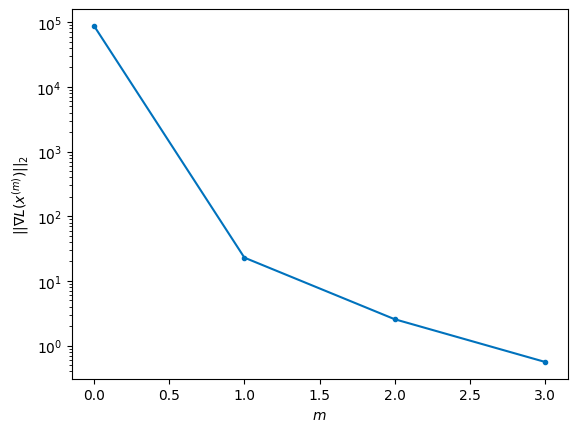


Windows:  99%|█████████▊| 292/296 [58:48<00:46, 11.74s/it]

Before applying the algorithm
Cost function: 446.75351868698203
Gradient norm: 90334.39788493792
Global relative error: 1890358974.0200236
Position relative errors: 0.026114427041906727 m, 13.433718966627403 m, 2009.6997895599197 m, 2981.1477718596334 m

Iteration 1
Cost function: 446.2487972817528 (-0.11%)
Gradient norm: 19.582770884202827 (-99.98%)
Global relative error: 3596.0224908995933 (0.02%)
Position relative errors: 0.02255257073282656 m, 13.907633220280054 m, 2010.2061634348495 m, 2981.6404100516966 m

STOP on Iteration 2
Cost function = 446.2487972428443 (-0.00%)
Gradient norm = 0.8707084464494413 (-95.55%)
Global relative error = 3596.0223203435726 (-0.00%)
Final position relative errors: 0.022552570736457455 m, 13.90746548546909 m, 2010.2061181235572 m, 2981.6402356828107 m



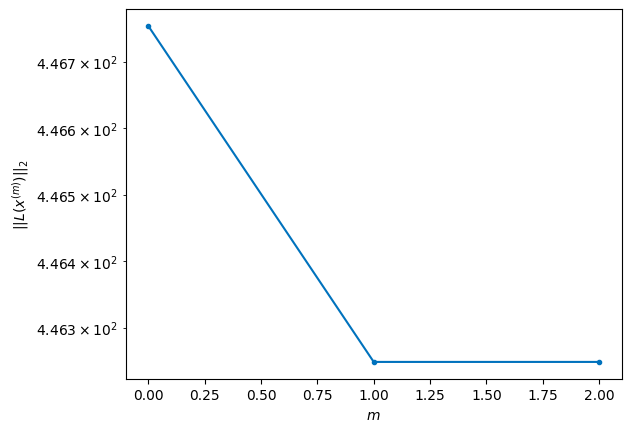

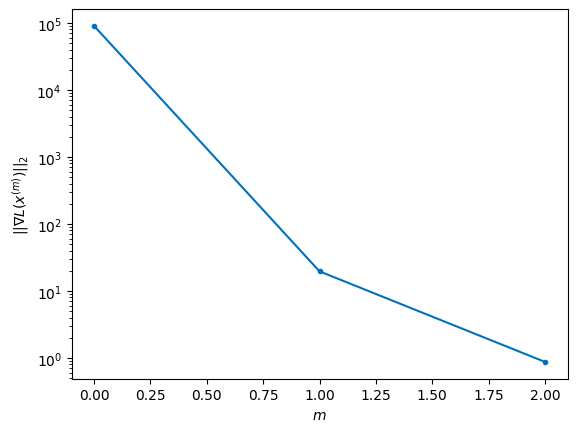


Windows:  99%|█████████▉| 293/296 [58:53<00:29,  9.87s/it]

Before applying the algorithm
Cost function: 435.08390173247705
Gradient norm: 44718.84341762964
Global relative error: 1890229323.1887808
Position relative errors: 0.02348177559019608 m, 13.215294027781272 m, 2295.184063964176 m, 3410.309390610714 m

Iteration 1
Cost function: 433.3707566539235 (-0.39%)
Gradient norm: 73.97471908669934 (-99.83%)
Global relative error: 4110.43063629751 (-0.01%)
Position relative errors: 0.023682034896704448 m, 13.608390271211201 m, 2295.366044037701 m, 3409.791550577251 m

Iteration 2
Cost function: 433.3707564433889 (-0.00%)
Gradient norm: 1.6403720427308495 (-97.78%)
Global relative error: 4110.430885714046 (0.00%)
Position relative errors: 0.023682034066505982 m, 13.608863323257088 m, 2295.3659672589342 m, 3409.791901041072 m

Iteration 3
Cost function: 433.37075659821926 (0.00%)
Gradient norm: 1.2959299417420012 (-21.00%)
Global relative error: 4110.430885719969 (0.00%)
Position relative errors: 0.02368203592117456 m, 13.608863325697703 m, 2295.365

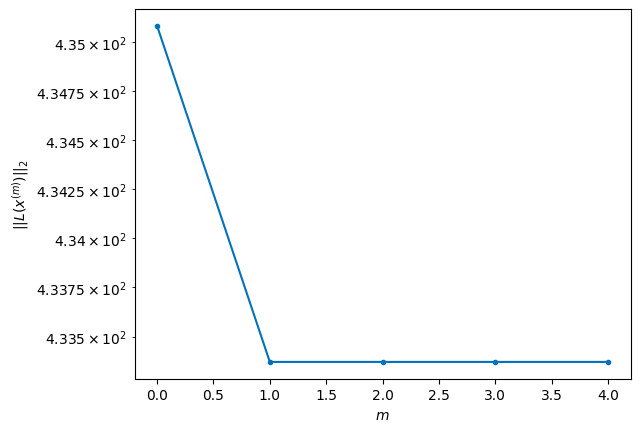

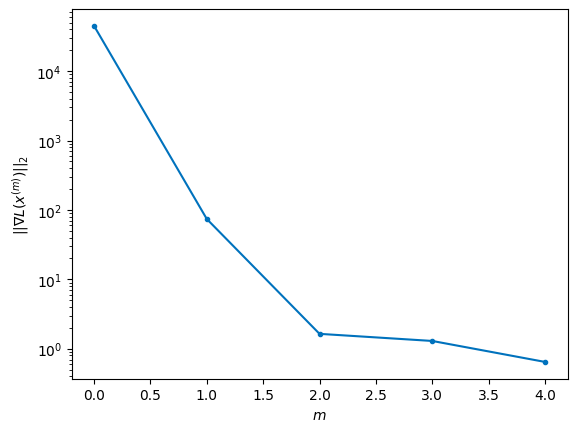


Windows:  99%|█████████▉| 294/296 [59:02<00:19,  9.67s/it]

Before applying the algorithm
Cost function: 431.8782233335563
Gradient norm: 92347.66929239931
Global relative error: 1890140344.4804895
Position relative errors: 0.02458599323851826 m, 12.814490273043772 m, 2570.328164610837 m, 3823.4340450628565 m

Iteration 1
Cost function: 431.2486002240097 (-0.15%)
Gradient norm: 45.95724031404813 (-99.95%)
Global relative error: 4606.441470352034 (-0.01%)
Position relative errors: 0.026134749590420486 m, 11.65370113822284 m, 2570.4395314835215 m, 3822.5569921973565 m

Iteration 2
Cost function: 431.24860035872615 (0.00%)
Gradient norm: 3.4072374361200897 (-92.59%)
Global relative error: 4606.44143161974 (-0.00%)
Position relative errors: 0.026134749442434435 m, 11.653823462526034 m, 2570.439309083185 m, 3822.557094700248 m

Iteration 3
Cost function: 431.2486003508301 (-0.00%)
Gradient norm: 4.339887390300091 (27.37%)
Global relative error: 4606.441431654977 (0.00%)
Position relative errors: 0.026134749142738365 m, 11.653823508906012 m, 2570.439

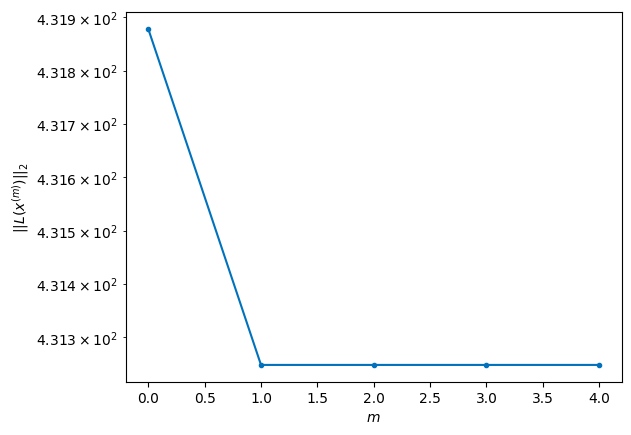

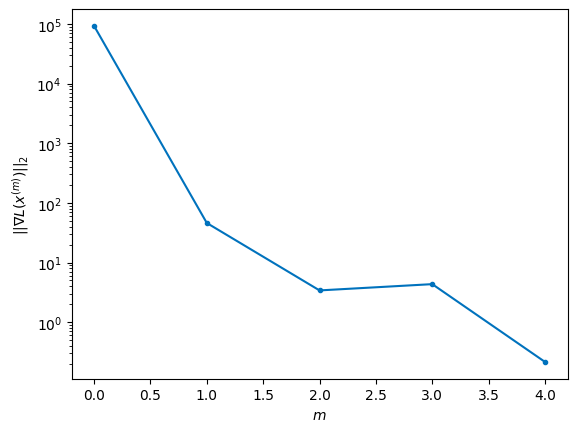


Windows: 100%|█████████▉| 295/296 [59:11<00:09,  9.42s/it]

Before applying the algorithm
Cost function: 435.5090643250545
Gradient norm: 332514.10418589634
Global relative error: 1890092757.5351076
Position relative errors: 0.02682947000929122 m, 10.8004803153344 m, 2834.189751722123 m, 4219.4506869391735 m

Iteration 1
Cost function: 435.00576515661373 (-0.12%)
Gradient norm: 14.350681435274414 (-100.00%)
Global relative error: 5083.484818369422 (0.01%)
Position relative errors: 0.030041678219803514 m, 11.182125677060524 m, 2834.6018795422187 m, 4219.794398866472 m

Iteration 2
Cost function: 435.00576509706326 (-0.00%)
Gradient norm: 3.8506361148567487 (-73.17%)
Global relative error: 5083.484721111886 (-0.00%)
Position relative errors: 0.030041676335096346 m, 11.1820147225018 m, 2834.601865287206 m, 4219.794291572444 m

Iteration 3
Cost function: 435.0057652686165 (0.00%)
Gradient norm: 3.037617705269214 (-21.11%)
Global relative error: 5083.484721033486 (-0.00%)
Position relative errors: 0.030041680165569642 m, 11.182014651038903 m, 2834.6

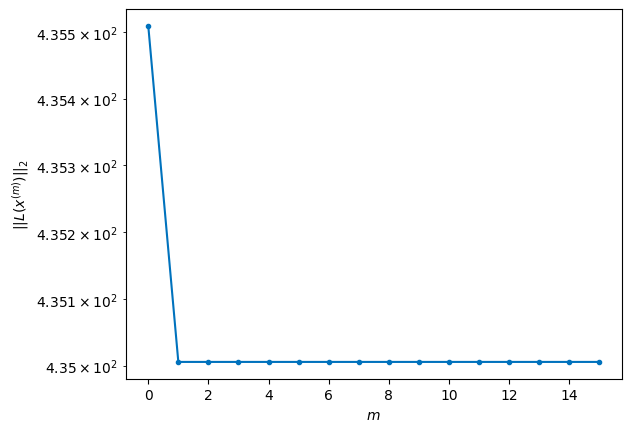

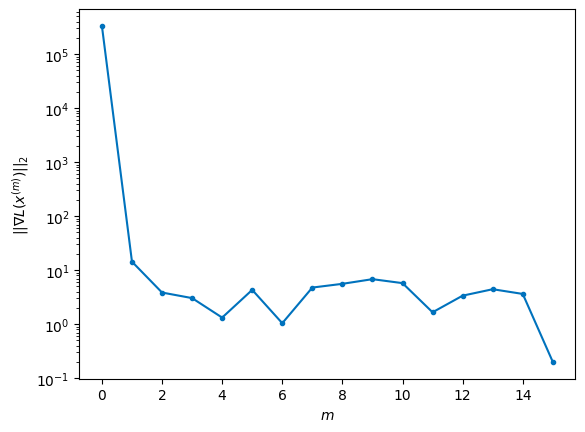


MC run: 100%|██████████| 1/1 [59:37<00:00, 3577.86s/it]   

This MC run RMSE for the first 296 iterations:
RMSE_run1_1 = 0.03823429793258704
RMSE_run1_2 = 7.707491949388226
RMSE_run1_3 = 3364.512959277447
RMSE_run1_4 = 5048.702364375051

Average RMSE for the first 296 iterations for 1 (100.0 %) valid Monte Carlo runs:
RMSE_1 = 0.03823429793258704
RMSE_2 = 7.707491949388226
RMSE_3 = 3364.512959277447
RMSE_4 = 5048.702364375051
The first round of NKKT converged with 14.0 iterations on average.
The next 295 rounds of NKKT converged with 5.654237288135593 iterations on average.
(3, 1, 296)


In [37]:
rmse_1 = []
rmse_2 = []
rmse_3 = []
rmse_4 = []
NKKT_first_round_stop_iteration = []
NKKT_K_minus_W_next_rounds_stop_iteration = []
for m in tqdm(range(M), desc="MC run", leave=True):
    print(f"------------------------------------ Monte Carlo run #{m + 1} ------------------------------------")
    Y = np.zeros((9, 1, T))
    for t in range(T):
        Y[:, :, t] = h(X_true[:, :, t]) + np.random.normal(0, np.sqrt(np.diag(R)).reshape((9, 1)), size=(9, 1))

    # Before applying the Newton algorithm for the first time, initialize the initial conditions guess randomly (cold-start) 
    x_init = np.zeros((4 * n_x, 1))
    x_init[:4*n_x, :] = X_est[:, :, 0]
    
    # Apply the algorithm
    p_1_est = np.zeros((n_p, 1, K - W + 1))
    p_2_est = np.zeros((n_p, 1, K - W + 1))
    p_3_est = np.zeros((n_p, 1, K - W + 1))
    p_4_est = np.zeros((n_p, 1, K - W + 1))
    X_est = np.zeros((4 * n_x, 1, K - W + 1))
    for n in tqdm(range(K - W + 1), desc="Windows", leave=False):
        nkkt = NKKT()
        x_est = nkkt.solve(x_init, Y[:, :, n:n + W], X_true[:, :, n])
        p_1_est[:, :, n] = P @ x_est[:n_x, :]
        p_2_est[:, :, n] = P @ x_est[n_x:2*n_x, :]
        p_3_est[:, :, n] = P @ x_est[2*n_x:3*n_x, :]
        p_4_est[:, :, n] = P @ x_est[3*n_x:, :]
        X_est[:, :, n] = x_est

        """
        if n == 10:
            for k in range(n, K - W + 1):
                x_1_k = x_est[:n_x, :]
                x_2_k = x_est[n_x:2*n_x, :]
                x_3_k = x_est[2*n_x:3*n_x, :]
                x_4_k = x_est[3*n_x:, :]
                p_1_est[:, :, k] = P @ x_1_k
                p_2_est[:, :, k] = P @ x_2_k
                p_3_est[:, :, k] = P @ x_3_k
                p_4_est[:, :, k] = P @ x_4_k
                x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
                x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
                x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
                x_4_k = SatelliteDynamics().x_new(dt, x_4_k)
            dev_chief = np.linalg.norm(p_1_est - X_true[:3, :, :K - W + 1], axis=0).reshape(-1, 1)
            dev_deputy1 = np.linalg.norm(p_2_est - X_true[6:9, :, :K - W + 1], axis=0).reshape(-1, 1)
            dev_deputy2 = np.linalg.norm(p_3_est - X_true[12:15, :, :K - W + 1], axis=0).reshape(-1, 1)
            dev_deputy3 = np.linalg.norm(p_4_est - X_true[18:21, :, :K - W + 1], axis=0).reshape(-1, 1)
            break
        """
        
        give_me_the_plots(nkkt.i, nkkt.L_norms, nkkt.grad_L_norms)

        if n == 0: # Check divergence in the beginning
            abs_error_init_1 = np.zeros(W)
            abs_error_init_2 = np.zeros(W)
            abs_error_init_3 = np.zeros(W)
            abs_error_init_4 = np.zeros(W)
            for k in range(W):
                x_1_k = x_est[:n_x, :]
                x_2_k = x_est[n_x:2*n_x, :]
                x_3_k = x_est[2*n_x:3*n_x, :]
                x_4_k = x_est[3*n_x:, :]
                abs_error_init_1[k] = np.linalg.norm(P @ x_1_k - P @ X_true[:n_x, :, k])
                abs_error_init_2[k] = np.linalg.norm(P @ x_2_k - P @ X_true[n_x:2*n_x, :, k])
                abs_error_init_3[k] = np.linalg.norm(P @ x_3_k - P @ X_true[2*n_x:3*n_x, :, k])
                abs_error_init_4[k] = np.linalg.norm(P @ x_4_k - P @ X_true[3*n_x:4*n_x, :, k])
                x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
                x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
                x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
                x_4_k = SatelliteDynamics().x_new(dt, x_4_k)
            rmse_init_1 = np.sqrt(np.mean(abs_error_init_1 ** 2))
            rmse_init_2 = np.sqrt(np.mean(abs_error_init_2 ** 2))
            rmse_init_3 = np.sqrt(np.mean(abs_error_init_3 ** 2))
            rmse_init_4 = np.sqrt(np.mean(abs_error_init_4 ** 2))
            print(rmse_init_1, rmse_init_2, rmse_init_3, rmse_init_4)
            if rmse_init_1 > 1e20 or rmse_init_2 > 1e20 or rmse_init_3 > 1e20 or rmse_init_4 > 1e20:
                print(f"This Monte Carlo run #{m + 1} diverged!")
                # Mimic the propagation for rmse computation below
                for k in range(K - W + 1):
                    x_1_k = x_est[:n_x, :]
                    x_2_k = x_est[n_x:2*n_x, :]
                    x_3_k = x_est[2*n_x:3*n_x, :]
                    x_4_k = x_est[3*n_x:, :]
                    p_1_est[:, :, k] = P @ x_1_k
                    p_2_est[:, :, k] = P @ x_2_k
                    p_3_est[:, :, k] = P @ x_3_k
                    p_4_est[:, :, k] = P @ x_4_k
                    x_1_k = SatelliteDynamics().x_new(dt, x_1_k)
                    x_2_k = SatelliteDynamics().x_new(dt, x_2_k)
                    x_3_k = SatelliteDynamics().x_new(dt, x_3_k)
                    x_4_k = SatelliteDynamics().x_new(dt, x_4_k)
                break
            else:
                NKKT_first_round_stop_iteration.append(nkkt.i)
        else:
            NKKT_K_minus_W_next_rounds_stop_iteration.append(nkkt.i)

        # Get next new guess (warm-start)
        # The initial guess is the previous window estimate second timestamp value
        x_init[:n_x, :] = SatelliteDynamics().x_new(dt, x_est[:n_x, :])
        x_init[n_x:2*n_x, :] = SatelliteDynamics().x_new(dt, x_est[n_x:2*n_x, :])
        x_init[2*n_x:3*n_x, :] = SatelliteDynamics().x_new(dt, x_est[2*n_x:3*n_x, :])
        x_init[3*n_x:4*n_x, :] = SatelliteDynamics().x_new(dt, x_est[3*n_x:, :])

    # After each Monte Carlo Run compute the RMSE_m for each first K - W + 1 iterations
    abs_error_1 = np.zeros(K - W + 1)
    abs_error_2 = np.zeros(K - W + 1)
    abs_error_3 = np.zeros(K - W + 1)
    abs_error_4 = np.zeros(K - W + 1)
    for k in range(K - W + 1):
        abs_error_1[k] = np.linalg.norm(p_1_est[:, :, k] - P @ X_true[:n_x, :, k])
        abs_error_2[k] = np.linalg.norm(p_2_est[:, :, k] - P @ X_true[n_x:2*n_x, :, k])
        abs_error_3[k] = np.linalg.norm(p_3_est[:, :, k] - P @ X_true[2*n_x:3*n_x, :, k])
        abs_error_4[k] = np.linalg.norm(p_4_est[:, :, k] - P @ X_true[3*n_x:4*n_x, :, k])
    rmse_m_1 = np.sqrt(np.mean(abs_error_1 ** 2))
    rmse_m_2 = np.sqrt(np.mean(abs_error_2 ** 2))
    rmse_m_3 = np.sqrt(np.mean(abs_error_3 ** 2))
    rmse_m_4 = np.sqrt(np.mean(abs_error_4 ** 2))
    print(f'This MC run RMSE for the first {K - W + 1} iterations:')
    print(f'RMSE_run{m + 1}_1 = {rmse_m_1}')
    print(f'RMSE_run{m + 1}_2 = {rmse_m_2}')
    print(f'RMSE_run{m + 1}_3 = {rmse_m_3}')
    print(f'RMSE_run{m + 1}_4 = {rmse_m_4}\n')
    if rmse_m_1 > 1e20 or rmse_m_2 > 1e20 or rmse_m_3 > 1e20 or rmse_m_4 > 1e20:
        print(f"Discarding this Monte Carlo run #{m + 1} and going to Monte Carlo run #{m + 2}...\n")
    else:
        rmse_1.append(rmse_m_1)
        rmse_2.append(rmse_m_2)
        rmse_3.append(rmse_m_3)
        rmse_4.append(rmse_m_4)
        
print(f'Average RMSE for the first {K - W + 1} iterations for {len(rmse_1)} ({len(rmse_1) / M * 100} %) valid Monte Carlo runs:')
print(f'RMSE_1 = {np.mean(rmse_1)}')
print(f'RMSE_2 = {np.mean(rmse_2)}')
print(f'RMSE_3 = {np.mean(rmse_3)}')
print(f'RMSE_4 = {np.mean(rmse_4)}')
print(f'The first round of NKKT converged with {np.mean(NKKT_first_round_stop_iteration)} iterations on average.')
print(f'The next {K - W} rounds of NKKT converged with {np.mean(NKKT_K_minus_W_next_rounds_stop_iteration)} iterations on average.')
print(np.shape(p_1_est))

In [38]:
dev_chief = np.linalg.norm(p_1_est - X_true[:3, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy1 = np.linalg.norm(p_2_est - X_true[6:9, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy2 = np.linalg.norm(p_3_est - X_true[12:15, :, :K - W + 1], axis=0).reshape(-1, 1)
dev_deputy3 = np.linalg.norm(p_4_est - X_true[18:21, :, :K - W + 1], axis=0).reshape(-1, 1)

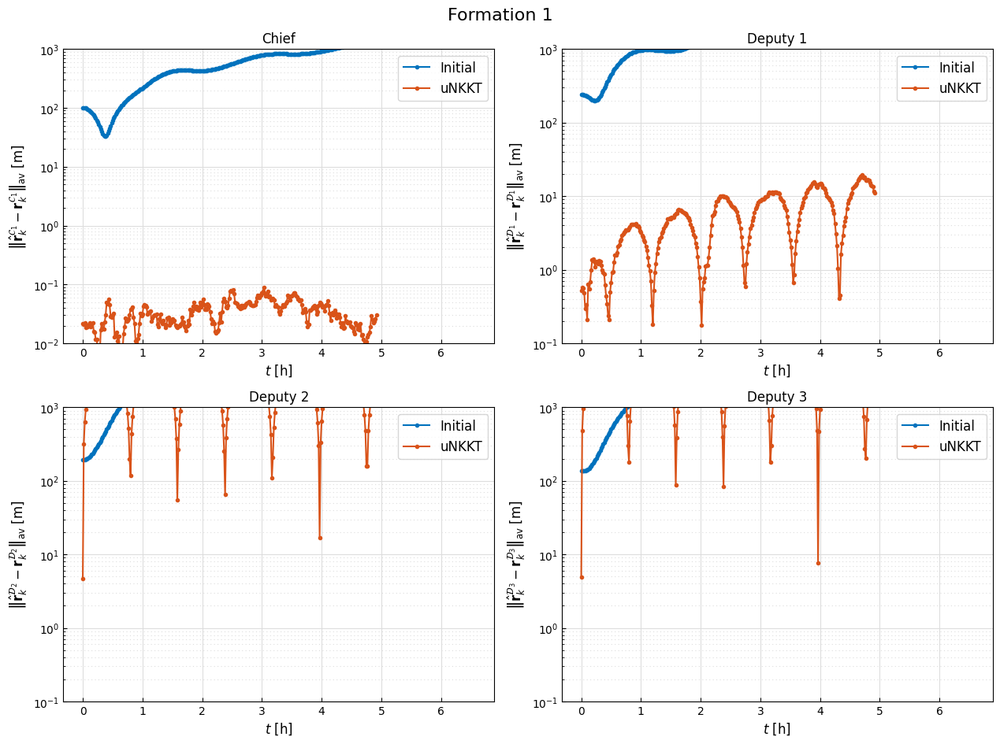

In [39]:
# MATLAB default color cycle
matlab_default_colors = [
    [0, 0.4470, 0.7410],  # blue
    [0.8500, 0.3250, 0.0980],  # orange
    [0.9290, 0.6940, 0.1250],  # yellow
    [0.4940, 0.1840, 0.5560],  # purple
    [0.4660, 0.6740, 0.1880],  # green
    [0.3010, 0.7450, 0.9330],  # light blue
    [0.6350, 0.0780, 0.1840],  # red
]
# Set the color cycle in Matplotlib to match MATLAB's default
plt.rcParams["axes.prop_cycle"] = plt.cycler(color=matlab_default_colors)

time = np.arange(0, T) / dt
algorithm = "uNKKT"

# Plot positions based on screen size
fig_width = 2 * 6.4  # in inchesa
fig_height = 2 * 4.8  # in inches

# Create a 2 by 2 figure
fig, axs = plt.subplots(2, 2, figsize=(fig_width, fig_height))

# Plot 1: Chief
axs[0, 0].plot(time, dev_chief_initial, ".-", label="Initial")
axs[0, 0].plot(time[:K - W + 1], dev_chief, ".-", label=algorithm)
axs[0, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 0].grid(True, which="both")
axs[0, 0].set_yscale("log")
axs[0, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{C}_1} - \\mathbf{r}_k^{\\mathcal{C}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[0, 0].set_ylim([1e-2, 1e3])
axs[0, 0].tick_params(axis="both", which="both", direction="in")
axs[0, 0].legend(fontsize=12)
axs[0, 0].set_title("Chief")

# Plot 2: Deputy 1
axs[0, 1].plot(time, dev_deputy1_initial, ".-", label="Initial")
axs[0, 1].plot(time[:K - W + 1], dev_deputy1, ".-", label=algorithm)
axs[0, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[0, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[0, 1].grid(True, which="both")
axs[0, 1].set_yscale("log")
axs[0, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[0, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_1} - \\mathbf{r}_k^{\\mathcal{D}_1}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[0, 1].set_ylim([1e-1, 1e3])
axs[0, 1].tick_params(axis="both", which="both", direction="in")
axs[0, 1].legend(fontsize=12)
axs[0, 1].set_title("Deputy 1")

# Plot 3: Deputy 2
axs[1, 0].plot(time, dev_deputy2_initial, ".-", label="Initial")
axs[1, 0].plot(time[:K - W + 1], dev_deputy2, ".-", label=algorithm)
axs[1, 0].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 0].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 0].grid(True, which="both")
axs[1, 0].set_yscale("log")
axs[1, 0].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 0].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_2} - \\mathbf{r}_k^{\\mathcal{D}_2}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[1, 0].set_ylim([1e-1, 1e3])
axs[1, 0].tick_params(axis="both", which="both", direction="in")
axs[1, 0].legend(fontsize=12)
axs[1, 0].set_title("Deputy 2")

# Plot 4: Deputy 3
axs[1, 1].plot(time, dev_deputy3_initial, ".-", label="Initial")
axs[1, 1].plot(time[:K - W + 1], dev_deputy3, ".-", label=algorithm)
axs[1, 1].grid(which="major", color="#DDDDDD", zorder=1)
axs[1, 1].grid(which="minor", color="#DDDDDD", linestyle=(0, (1, 3)), zorder=2)
axs[1, 1].grid(True, which="both")
axs[1, 1].set_yscale("log")
axs[1, 1].set_xlabel("$t$ [h]", fontsize=12)
axs[1, 1].set_ylabel(
    "$\\left\\|\\hat{\\mathbf{r}}_k^{\\mathcal{D}_3} - \\mathbf{r}_k^{\\mathcal{D}_3}\\right\\|_\\mathrm{av}$ [m]",
    fontsize=12,
)
axs[1, 1].set_ylim([1e-1, 1e3])
axs[1, 1].tick_params(axis="both", which="both", direction="in")
axs[1, 1].legend(fontsize=12)
axs[1, 1].set_title("Deputy 3")

fig.suptitle(f"Formation {formation}", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 1])
plt.show()

In [40]:
import pickle
from datetime import datetime

# Fill the dictionary
data = {}
data["true"] = X_true
data[0] = X_est

# Save to pickle file
with open(
    f'newton2_form{formation}_{datetime.now().strftime("%Y%m%d_%H%M%S")}.pkl',
    "wb",
) as file:
    pickle.dump(data, file)